<a href="https://colab.research.google.com/github/fbeilstein/machine_learning/blob/master/lecture_13_k_means_clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#$k$-means clustering / Метод $k$-середніх

## What is clustering?

Cluster analysis or clustering is the task of grouping a set of objects in such a way that objects in the same group (called a cluster) are more similar (in some sense) to each other than to those in other groups (clusters). 

Today we fill in the last gap in this table

$~$ | Supervised Learning | Unsupervised Learning
---|---|---
Discrete | Classification | $\boxed{\text{Clustering}}$
Continuous | Regression | Dimensionality Reduction

##TDD datasets

Cluster algorithms are usually tested  on following 2D data clouds.




In [ ]:
#@title ##Common datasets
%%html
<svg width="160mm" height="100mm" version="1.1" viewBox="0 0 390.18 209.35" xmlns="http://www.w3.org/2000/svg">
 <g transform="translate(-4.7471 -6.2797)" fill-opacity=".40704" stroke="#000" stroke-linecap="square" stroke-linejoin="bevel" stroke-miterlimit="10.433" stroke-opacity=".61307">
  <g stroke-width=".15326">
   <ellipse cx="54.598" cy="43.035" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="49.703" cy="44.638" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="61.73" cy="45.44" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="43.155" cy="51.186" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="67.476" cy="49.85" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="42.62" cy="58.269" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="48.5" cy="67.089" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="57.854" cy="69.227" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="66.006" cy="64.55" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="70.015" cy="56.665" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="58.656" cy="41.966" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="52.643" cy="69.628" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="43.422" cy="64.283" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="62.665" cy="70.163" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="46.763" cy="69.895" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="49.168" cy="69.895" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="41.15" cy="62.545" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="55.583" cy="71.232" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="68.812" cy="63.882" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="45.025" cy="48.915" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="44.224" cy="68.425" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="52.108" cy="71.9" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="40.348" cy="53.859" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="65.472" cy="69.628" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="67.209" cy="54.26" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="63.467" cy="44.772" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="61.062" cy="43.035" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="44.09" cy="43.436" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="41.952" cy="47.712" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="48.366" cy="41.832" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="53.845" cy="40.897" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="70.015" cy="52.924" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="69.748" cy="66.02" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="40.615" cy="58.135" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="39.413" cy="60.674" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="36.206" cy="55.73" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="36.74" cy="49.583" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="72.153" cy="60.541" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="54.122" cy="19.574" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="43.565" cy="21.98" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="29.934" cy="30.8" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="73.633" cy="22.781" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="84.324" cy="34.541" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="91.273" cy="47.504" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="55.592" cy="91.871" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="72.564" cy="87.461" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="84.591" cy="80.378" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="92.609" cy="67.816" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="96.217" cy="54.987" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="91.807" cy="38.417" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="34.478" cy="86.525" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="18.174" cy="71.157" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="16.036" cy="49.241" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="21.114" cy="31.735" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="27.662" cy="83.585" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="35.68" cy="93.875" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="46.104" cy="94.543" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="57.597" cy="96.281" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="68.154" cy="91.737" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="79.78" cy="84.387" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="91.273" cy="76.369" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="72.43" cy="89.332" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="81.517" cy="85.456" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="83.655" cy="83.986" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="83.522" cy="87.193" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="13.898" cy="61.268" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="66.55" cy="19.173" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="21.515" cy="32.537" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="67.877" cy="43.836" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="53.855" cy="92.806" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="69.359" cy="50.182" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="68.603" cy="47.536" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="22.451" cy="78.908" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="14.967" cy="40.154" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="36.616" cy="24.652" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="57.997" cy="94.142" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="26.46" cy="81.046" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="90.604" cy="42.827" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="96.484" cy="64.476" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="14.433" cy="53.25" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="77.241" cy="90.401" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="74.568" cy="21.712" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="98.89" cy="55.656" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="93.01" cy="43.094" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="95.95" cy="48.707" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="28.063" cy="86.124" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="45.703" cy="16.1" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="60.937" cy="17.971" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="68.688" cy="18.772" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="87.932" cy="80.512" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="90.872" cy="72.226" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="93.01" cy="73.028" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="31.538" cy="89.599" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="31.805" cy="27.325" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="40.09" cy="23.316" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="36.081" cy="20.643" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="12.294" cy="49.508" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="79.112" cy="28.127" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="36.616" cy="89.064" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="40.625" cy="94.41" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="43.298" cy="88.797" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="49.979" cy="96.815" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="62.007" cy="89.332" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="42.229" cy="21.445" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="55.751" cy="13.518" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="81.454" cy="26.936" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="78.808" cy="22.778" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="61.799" cy="65.301" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="59.342" cy="73.238" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="18.71" cy="65.679" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="28.915" cy="88.168" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="21.308" cy="39.875" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="13.985" cy="49.426" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="18.332" cy="58.686" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="13.796" cy="67.19" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="20.222" cy="83.632" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="16.442" cy="67.568" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="64.445" cy="92.137" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="18.474" cy="39.875" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="64.445" cy="22.967" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="88.257" cy="31.094" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="98.463" cy="43.945" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="101.11" cy="62.655" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="92.226" cy="60.009" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="97.518" cy="76.073" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="93.36" cy="81.743" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="40.443" cy="13.518" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="73.705" cy="17.298" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="87.501" cy="23.534" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="33.262" cy="80.798" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="12.615" cy="78.24" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="13.607" cy="58.119" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="11.717" cy="68.891" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="49.137" cy="20.699" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="51.783" cy="17.298" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="82.588" cy="31.283" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="87.312" cy="38.464" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="20.222" cy="75.506" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="44.601" cy="92.893" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="16.253" cy="44.323" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="25.324" cy="31.661" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="28.726" cy="27.692" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="33.451" cy="26.18" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="89.013" cy="77.018" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="89.202" cy="41.11" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="84.667" cy="30.149" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="93.36" cy="51.693" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="57.074" cy="16.731" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="62.744" cy="14.841" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="181.13" cy="40.708" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="184.34" cy="44.449" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="187.54" cy="50.864" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="181.66" cy="48.458" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="177.39" cy="43.38" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="185.94" cy="53.804" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="172.58" cy="36.431" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="177.92" cy="38.837" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="191.44" cy="55.284" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="181.24" cy="45.079" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="192.58" cy="60.198" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="175.76" cy="42.811" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="180.29" cy="49.237" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="185.4" cy="48.67" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="198.82" cy="63.411" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="175.76" cy="36.196" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="168.77" cy="32.606" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="190.31" cy="52.638" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="188.42" cy="46.591" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="193.71" cy="52.449" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="195.04" cy="58.119" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="203.73" cy="66.246" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="198.8" cy="75.292" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="202.57" cy="78.278" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="205.21" cy="85.449" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="199.33" cy="83.043" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="195.06" cy="77.965" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="201.25" cy="87.727" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="190.25" cy="71.016" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="195.59" cy="73.421" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="209.12" cy="89.869" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="198.91" cy="79.664" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="210.25" cy="94.783" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="194.28" cy="78.813" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="197.97" cy="83.821" rx="1.8456" ry="1.8183" opacity=".99"/>
  </g>
  <ellipse cx="202.97" cy="83.16" rx="1.7549" ry="1.7276" opacity=".99" stroke-width=".14567"/>
  <g stroke-width=".15326">
   <ellipse cx="216.49" cy="97.996" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="193.43" cy="70.781" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="190.78" cy="74.183" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="207.98" cy="87.223" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="206.09" cy="81.176" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="211.38" cy="87.034" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="212.71" cy="92.704" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="215.73" cy="94.027" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="198.34" cy="87.129" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="201.27" cy="92.137" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="205.43" cy="88.641" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="209.93" cy="81.065" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="209.59" cy="83.738" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="201.44" cy="76.121" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="223.56" cy="100.98" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="215.61" cy="89.618" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="218.48" cy="93.226" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="221.75" cy="95.164" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="229.3" cy="106.46" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="219.61" cy="96.3" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="223.49" cy="97.435" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="226.16" cy="99.841" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="186.87" cy="66.365" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="198.37" cy="72.446" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="204.3" cy="84.01" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="209.12" cy="85.617" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="205.24" cy="76.167" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="213.93" cy="82.026" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="217.43" cy="85.711" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="185.4" cy="46.78" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="209.4" cy="90.058" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="214.6" cy="92.42" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="199.57" cy="77.679" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="202.97" cy="79.947" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="212.9" cy="90.058" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="189.56" cy="50.371" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="183.89" cy="45.835" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="180.67" cy="42.055" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="205.43" cy="79.853" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="212.61" cy="84.766" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="183.51" cy="42.055" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="213.07" cy="87.48" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="187.01" cy="42.867" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="189.28" cy="51.265" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="193.69" cy="46.454" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="198.37" cy="55.14" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="190.88" cy="38.703" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="66.146" cy="67.757" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="80.509" cy="86.089" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="94.795" cy="50.139" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="92.037" cy="43.756" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="70.682" cy="18.999" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="40.443" cy="55.851" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="60.854" cy="94.405" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="45.546" cy="46.402" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="50.46" cy="16.731" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="95.628" cy="59.253" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="85.99" cy="31.094" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="77.674" cy="23.534" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="36.664" cy="89.68" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="90.714" cy="78.719" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="95.817" cy="66.435" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="54.24" cy="95.161" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="89.882" cy="35.964" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="95.439" cy="72.104" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="19.277" cy="80.042" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="42.333" cy="97.996" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="64.557" cy="16.121" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="145.99" cy="41.693" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="149.77" cy="44.679" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="152.41" cy="51.849" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="146.53" cy="49.444" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="142.25" cy="44.365" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="148.44" cy="54.127" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="142.79" cy="39.822" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="156.31" cy="56.269" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="146.1" cy="46.159" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="155.46" cy="60.711" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="141.47" cy="46.064" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="146.39" cy="51.828" rx="1.8456" ry="1.8183" opacity=".99"/>
  </g>
  <ellipse cx="150.17" cy="49.56" rx="1.7549" ry="1.7276" opacity=".99" stroke-width=".14567"/>
  <g stroke-width=".15326">
   <ellipse cx="163.96" cy="64.679" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="141.47" cy="41.339" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="155.18" cy="53.624" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="153.29" cy="47.576" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="158.58" cy="53.435" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="159.9" cy="59.104" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="162.92" cy="60.427" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="145.54" cy="53.529" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="148.47" cy="58.537" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="152.62" cy="55.419" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="155.23" cy="46.804" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="157.07" cy="49.855" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="148.64" cy="42.521" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="170.75" cy="67.472" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="162.8" cy="56.018" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="165.67" cy="59.626" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="168.38" cy="61.186" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="173.19" cy="70.494" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="166.81" cy="62.511" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="170.68" cy="63.836" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="167.63" cy="65.692" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="147.17" cy="39.886" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="151.49" cy="50.411" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="156.31" cy="52.017" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="152.44" cy="42.568" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="157.35" cy="47.387" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="163.87" cy="52.773" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="156.59" cy="56.647" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="161.41" cy="58.726" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="146.77" cy="44.08" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="150.17" cy="46.348" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="160.09" cy="56.458" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="152.62" cy="46.253" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="159.81" cy="51.167" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="160.26" cy="53.88" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="175.48" cy="61.899" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="143.54" cy="53.205" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="161.58" cy="48.197" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="159.03" cy="64.923" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="151.66" cy="38.37" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="163.29" cy="58.214" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="136.45" cy="37.708" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="136.92" cy="43.094" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="156.01" cy="45.173" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="142.21" cy="36.952" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="156.21" cy="52.735" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="154.13" cy="49.795" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="159.88" cy="54.873" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="164.89" cy="61.354" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="148.45" cy="46.654" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="154" cy="50.329" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="169.5" cy="54.606" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="131.82" cy="27.745" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="145.38" cy="36.966" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="151.13" cy="53.403" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="153.3" cy="56.763" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="158.14" cy="58.013" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="143.88" cy="42.998" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="148.86" cy="51.799" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="160.35" cy="61.621" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="157.31" cy="60.571" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="161.99" cy="62.242" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="140.24" cy="34.694" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="161.08" cy="42.846" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="167.97" cy="46.654" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="183.67" cy="51.799" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="176.05" cy="48.325" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="170.97" cy="26.008" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="174.31" cy="32.021" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="26.334" cy="33.765" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="19.035" cy="36.433" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="12.42" cy="37.189" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(87.381)" cx="86.778" cy="-27.8" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(87.381)" cx="94.796" cy="-40.362" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(87.381)" cx="93.46" cy="-31.809" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(87.381)" cx="85.843" cy="-24.192" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(87.381)" cx="90.119" cy="-27.667" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(87.381)" cx="93.059" cy="-35.952" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(87.381)" cx="95.197" cy="-35.15" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(87.381)" cx="99.705" cy="-32.105" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(87.381)" cx="95.548" cy="-26.436" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(87.381)" cx="91.201" cy="-31.16" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(87.381)" cx="92.902" cy="-29.46" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(87.381)" cx="97.627" cy="-36.074" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="8.1695" cy="68.418" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="16.188" cy="55.856" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="14.851" cy="64.409" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="17.524" cy="77.639" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="13.381" cy="74.966" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="14.45" cy="60.266" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="16.588" cy="61.068" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="21.097" cy="64.113" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="16.939" cy="69.782" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="12.592" cy="65.058" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="14.293" cy="66.758" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="19.018" cy="60.144" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="66.016" cy="94.543" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="80.715" cy="88.663" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="87.798" cy="84.387" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="64.011" cy="94.677" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="73.098" cy="91.47" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="60.537" cy="68.618" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="54.79" cy="99.488" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="45.703" cy="98.953" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="73.098" cy="95.88" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="96.083" cy="60.867" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="68.414" cy="61.426" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="44.034" cy="60.67" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="49.893" cy="72.955" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="40.632" cy="66.435" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="72.193" cy="56.324" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="51.499" cy="42.055" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="63.594" cy="67.379" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="40.349" cy="50.843" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="44.223" cy="71.632" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="55.185" cy="75.6" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="65.012" cy="46.591" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="70.871" cy="46.402" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="56.696" cy="38.937" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="59.391" cy="40.576" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="64.35" cy="42.15" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="72.288" cy="53.489" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="98.088" cy="52.181" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="92.475" cy="85.189" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="82.72" cy="93.073" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="91.673" cy="78.507" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="75.771" cy="84.922" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="30.335" cy="19.841" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="20.312" cy="34.942" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="24.455" cy="83.184" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="77.375" cy="88.129" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="70.025" cy="96.548" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="87.397" cy="34.675" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="94.346" cy="70.355" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="100.09" cy="69.153" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="39.823" cy="17.837" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="24.722" cy="24.118" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="93.411" cy="55.656" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="101.16" cy="58.863" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="94.613" cy="45.767" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="69.223" cy="22.381" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="45.035" cy="19.173" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="30.602" cy="23.45" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="17.64" cy="47.103" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="13.631" cy="72.226" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="38.888" cy="49.108" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="43.298" cy="67.148" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="46.505" cy="42.96" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="69.49" cy="59.264" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="49.979" cy="39.219" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="40.09" cy="44.965" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="47.039" cy="96.414" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="17.373" cy="74.498" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="69.624" cy="93.073" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="97.286" cy="62.605" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="24.322" cy="28.127" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="92.743" cy="32.804" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="95.682" cy="38.283" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="14.566" cy="73.295" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="16.972" cy="53.117" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="11.626" cy="44.564" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="272.64" cy="51.471" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="277.45" cy="43.453" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="281.73" cy="34.633" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="290.81" cy="31.426" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="297.49" cy="25.546" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="314.33" cy="26.615" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="327.43" cy="27.951" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="342.13" cy="35.969" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="349.08" cy="44.255" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="337.85" cy="29.822" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="310.32" cy="56.282" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="319.68" cy="68.844" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="334.11" cy="80.871" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="354.42" cy="83.543" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="373.13" cy="78.733" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="384.62" cy="61.36" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="387.83" cy="52.807" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="381.95" cy="73.654" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="324.49" cy="78.465" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="343.46" cy="84.88" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="285.47" cy="37.038" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="314.6" cy="22.339" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="334.11" cy="84.88" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="348.01" cy="91.027" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="360.3" cy="87.552" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="317.54" cy="72.853" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="311.66" cy="63.765" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="367.52" cy="84.88" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="375.54" cy="67.507" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="303.91" cy="30.357" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="335.98" cy="34.9" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="353.62" cy="84.612" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="328.23" cy="82.207" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="364.31" cy="79.802" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="376.61" cy="73.654" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="323.42" cy="23.942" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="291.88" cy="26.348" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="324.22" cy="76.06" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="306.31" cy="59.222" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="344.8" cy="88.354" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="304.98" cy="24.21" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="270.77" cy="46.66" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="314.07" cy="68.042" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="391.57" cy="52.807" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="383.02" cy="57.618" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="380.88" cy="66.171" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="317.01" cy="69.645" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="338.39" cy="86.216" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="308.72" cy="21.537" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="344" cy="87.285" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="356.83" cy="85.414" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="292.42" cy="30.089" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="329.3" cy="81.94" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="360.3" cy="83.276" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="269.7" cy="48.798" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="317.54" cy="18.062" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="332.24" cy="23.942" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="347.21" cy="39.978" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="353.09" cy="48.531" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="331.71" cy="29.822" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="354.69" cy="43.72" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="357.63" cy="48.531" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="324.76" cy="21.537" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="338.39" cy="33.297" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="327.43" cy="25.813" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="359.77" cy="53.609" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="349.08" cy="88.889" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="369.12" cy="81.672" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="286.54" cy="31.96" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="279.85" cy="39.711" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="350.41" cy="44.255" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="339.72" cy="90.492" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="346.14" cy="34.499" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="353.22" cy="50.536" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="347.21" cy="36.504" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="306.45" cy="52.807" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="357.5" cy="59.489" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="313.13" cy="69.111" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="281.46" cy="37.439" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="319.68" cy="77.663" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="329.57" cy="86.082" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="269.7" cy="56.95" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="274.24" cy="39.578" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="302.57" cy="19.399" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="285.07" cy="35.836" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="316.47" cy="22.472" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="320.21" cy="73.922" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="331.04" cy="84.078" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="343.33" cy="90.893" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="335.05" cy="89.156" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="339.99" cy="87.686" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="342.66" cy="37.439" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="319.68" cy="26.481" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="353.35" cy="53.208" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="306.72" cy="65.235" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="313.26" cy="76.728" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="321.68" cy="84.479" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="337.99" cy="94.368" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="348.81" cy="86.751" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="324.89" cy="80.603" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="354.96" cy="89.691" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="275.31" cy="48.665" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="350.01" cy="39.444" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="332.51" cy="27.684" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="308.59" cy="27.149" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="297.36" cy="29.154" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="284.67" cy="41.983" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="280.92" cy="47.328" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="278.38" cy="54.812" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="309.39" cy="27.016" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="320.21" cy="21.537" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="322.62" cy="75.258" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="321.82" cy="79.935" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="310.46" cy="66.037" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="309.25" cy="62.028" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="311.39" cy="73.12" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="352.69" cy="87.82" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="362.84" cy="85.147" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="333.04" cy="87.018" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="353.22" cy="45.725" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="341.19" cy="37.974" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="329.97" cy="26.348" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="319.01" cy="23.675" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="288.27" cy="33.698" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="364.58" cy="83.142" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="373.13" cy="75.525" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="381.68" cy="62.964" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="365.25" cy="89.022" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="368.99" cy="78.198" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="378.34" cy="71.115" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="372.86" cy="84.479" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="376.21" cy="79.534" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="356.03" cy="92.23" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="357.76" cy="87.953" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="363.51" cy="86.216" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="374.47" cy="72.051" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="345.34" cy="37.172" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="301.1" cy="27.818" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="307.65" cy="64.033" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="282.26" cy="38.776" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="310.99" cy="23.541" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="304.71" cy="26.615" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="275.44" cy="45.992" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="294.29" cy="27.55" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="292.55" cy="34.366" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="294.69" cy="30.624" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="355.09" cy="49.199" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="342.53" cy="30.089" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="337.45" cy="25.546" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="331.04" cy="33.564" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="350.95" cy="35.435" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="273.18" cy="48.228" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="327.05" cy="67.694" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="356.53" cy="93.774" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="351.05" cy="81.112" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="300.21" cy="22.336" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="286.04" cy="25.549" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="277.34" cy="42.936" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="358.98" cy="85.08" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="349.16" cy="96.42" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="378.45" cy="68.827" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="368.81" cy="87.915" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="361.06" cy="91.695" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="383.74" cy="51.63" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="382.99" cy="67.883" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="382.8" cy="65.237" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="377.32" cy="70.906" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="372.78" cy="80.923" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="382.23" cy="79.789" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="376.94" cy="90.561" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="381.1" cy="69.205" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="386.2" cy="53.708" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="386.58" cy="57.11" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="368.06" cy="80.167" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="370.14" cy="85.458" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="382.99" cy="60.323" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="377.88" cy="75.82" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="386.58" cy="64.292" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="380.53" cy="84.136" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="283.01" cy="45.582" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="283.77" cy="31.408" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="277.53" cy="31.03" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="310.23" cy="14.777" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="302.67" cy="24.415" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="339.71" cy="21.958" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="339.14" cy="38.589" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="321.75" cy="23.848" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="329.12" cy="21.58" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="335.74" cy="32.164" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="352.18" cy="37.077" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="344.81" cy="26.683" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="335.17" cy="85.836" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="348.21" cy="86.403" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="351.61" cy="82.435" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="312.49" cy="17.045" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="299.64" cy="25.171" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="296.24" cy="19.313" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="330.26" cy="17.234" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="327.99" cy="24.226" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="349.35" cy="40.668" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="314.76" cy="72.04" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="315.9" cy="78.466" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="326.29" cy="89.427" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="57.452" cy="98.562" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="80.887" cy="23.345" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="68.036" cy="15.03" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="89.958" cy="39.598" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="63.122" cy="98.185" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="84.289" cy="25.613" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="97.14" cy="50.182" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="91.848" cy="70.97" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="67.28" cy="15.03" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="86.935" cy="27.503" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="91.848" cy="78.908" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="51.783" cy="98.94" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="71.438" cy="16.164" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="88.446" cy="32.417" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="78.997" cy="18.432" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="82.021" cy="25.991" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="91.47" cy="30.527" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="68.036" cy="69.458" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="73.327" cy="91.759" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="86.557" cy="81.554" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="58.586" cy="98.185" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="99.03" cy="67.19" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="96.384" cy="42.244" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="97.896" cy="70.97" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="94.872" cy="67.946" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="94.494" cy="34.307" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="83.155" cy="20.699" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="34.774" cy="23.345" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="29.482" cy="25.613" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="22.301" cy="34.307" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="39.687" cy="22.211" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="43.089" cy="17.298" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="22.301" cy="78.53" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="27.97" cy="29.393" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="15.497" cy="32.417" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="40.443" cy="63.789" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="202.97" cy="86.467" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="175.76" cy="39.598" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="62.366" cy="98.94" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="21.923" cy="81.176" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="136.49" cy="31.086" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="140.77" cy="34.828" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="143.71" cy="31.62" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="169.1" cy="67.167" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="207.32" cy="93.894" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="208.12" cy="76.522" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="214.54" cy="75.453" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="177.92" cy="77.323" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="138.63" cy="25.206" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="164.02" cy="72.513" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="388.9" cy="45.591" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="335.98" cy="88.755" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="370.46" cy="76.327" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="367.25" cy="85.281" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="348.68" cy="90.492" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="351.75" cy="90.626" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="352.02" cy="93.432" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="362.17" cy="89.557" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="358.57" cy="96.64" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="366.72" cy="95.17" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="366.72" cy="72.719" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="342.66" cy="31.693" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="351.75" cy="42.117" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="341.06" cy="33.564" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="324.22" cy="25.546" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="390.24" cy="47.462" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="326.63" cy="31.159" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="316.47" cy="27.417" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="334.65" cy="30.089" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="298.03" cy="35.168" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="290.55" cy="40.78" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="286.8" cy="38.375" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="320.75" cy="15.924" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="313.8" cy="30.624" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="300.17" cy="29.555" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="347.74" cy="31.159" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="281.73" cy="42.384" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="292.15" cy="33.564" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="303.91" cy="21.804" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="388.9" cy="47.195" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="277.98" cy="46.393" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="344.8" cy="39.711" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="303.37" cy="33.029" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="322.89" cy="30.089" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="384.09" cy="52.273" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="353.35" cy="39.444" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="314.33" cy="29.555" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="307.12" cy="17.528" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="380.08" cy="52.273" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="278.25" cy="49.6" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="271.57" cy="53.609" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="277.72" cy="36.771" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="273.44" cy="43.186" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="273.71" cy="53.609" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="273.44" cy="58.42" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="270.63" cy="59.89" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="356.96" cy="56.015" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="304.98" cy="62.295" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="307.38" cy="58.955" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="307.52" cy="69.645" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="271.97" cy="50.135" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="279.85" cy="44.121" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="288.94" cy="35.034" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="293.75" cy="23.408" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="273.84" cy="47.997" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="287.34" cy="28.352" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="276.78" cy="62.83" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="289.21" cy="23.675" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="290.41" cy="17.394" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="275.18" cy="21.804" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="268.23" cy="41.448" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="263.02" cy="55.346" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="268.65" cy="65.237" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="272.81" cy="64.481" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="272.52" cy="62.213" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="268.08" cy="59.567" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="274.6" cy="58.622" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="275.26" cy="51.63" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="286.89" cy="48.606" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="278.57" cy="68.922" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="272.33" cy="35.755" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="283.11" cy="55.031" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="316.75" cy="64.292" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="307.96" cy="78.749" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="304.74" cy="56" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="301.91" cy="68.355" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="323.36" cy="88.104" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="326.01" cy="84.702" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="330.34" cy="93.638" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="315.51" cy="82.771" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="342.45" cy="98.404" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="332.23" cy="92.315" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="319.68" cy="81.301" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="324.12" cy="87.254" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="330.16" cy="88.671" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="360.4" cy="45.298" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="315.42" cy="87.915" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="358.98" cy="38.967" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="363.71" cy="56.071" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="340.18" cy="77.426" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="328.75" cy="76.293" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="303.61" cy="68.922" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="316.46" cy="76.765" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="344.91" cy="34.054" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="344.72" cy="45.582" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="376.07" cy="76.327" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="365.93" cy="87.254" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="370.8" cy="80.261" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="370.65" cy="83.191" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="365.74" cy="82.104" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="373.4" cy="88.529" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="386.77" cy="72.938" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="355.58" cy="87.018" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="360.83" cy="89.9" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="365.69" cy="84.23" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="365.03" cy="85.789" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="390.31" cy="76.34" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="383.74" cy="62.969" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="391.49" cy="62.969" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="381.1" cy="71.473" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="387.14" cy="59" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="384.5" cy="74.686" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="389.98" cy="68.45" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="393" cy="56.543" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="309.66" cy="80.923" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="85.99" cy="84.388" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="67.658" cy="97.996" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="78.43" cy="97.429" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="85.801" cy="87.979" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="91.281" cy="76.262" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="92.793" cy="75.317" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="92.226" cy="89.491" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="103.94" cy="75.317" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="99.786" cy="82.121" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="101.68" cy="47.914" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="98.652" cy="68.513" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="108.67" cy="63.6" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="99.157" cy="58.863" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="82.052" cy="81.313" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="75.37" cy="63.406" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="52.652" cy="97.35" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="72.163" cy="48.974" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="75.37" cy="91.737" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="182.28" cy="39.887" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="193.77" cy="75.701" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="161.96" cy="22.211" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="189.93" cy="47.725" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="218.47" cy="90.814" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="223.76" cy="90.247" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="188.04" cy="57.552" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="192.58" cy="49.426" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="182.37" cy="36.007" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="189.74" cy="42.244" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="195.98" cy="49.426" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="189.74" cy="44.134" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="185.4" cy="38.842" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="193.33" cy="53.772" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="195.98" cy="55.095" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="188.23" cy="53.961" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="200.33" cy="60.765" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="197.49" cy="51.882" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="198.44" cy="59.064" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="204.11" cy="59.442" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="210.34" cy="69.647" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="193.24" cy="82.249" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="211.81" cy="99.755" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="197.24" cy="75.434" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="38.932" cy="153.37" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="69.548" cy="171.89" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="75.973" cy="175.29" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="70.682" cy="156.77" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="57.074" cy="151.1" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="66.902" cy="162.44" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="67.658" cy="163.57" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="69.548" cy="151.48" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="72.571" cy="155.26" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="76.351" cy="162.44" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="65.39" cy="155.64" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="60.476" cy="166.98" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="66.524" cy="158.28" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="68.414" cy="158.85" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="73.327" cy="153.75" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="41.955" cy="182.85" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="61.799" cy="190.22" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="40.065" cy="192.49" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="73.327" cy="190.41" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="27.403" cy="193.43" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="81.832" cy="194.95" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="81.643" cy="140.71" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="31.183" cy="142.03" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="57.641" cy="176.61" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="32.317" cy="187.58" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="61.61" cy="181.72" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="49.893" cy="187.01" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="48.759" cy="167.54" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="74.461" cy="180.58" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="77.107" cy="189.47" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="53.673" cy="193.43" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="39.876" cy="168.68" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="55.562" cy="166.41" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="70.493" cy="172.46" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="57.83" cy="183.04" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="77.107" cy="178.32" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="50.838" cy="140.9" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="41.577" cy="164.14" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="56.507" cy="172.27" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="67.658" cy="193.25" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="52.35" cy="191.17" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="67.658" cy="139.76" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="51.783" cy="173.02" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="58.586" cy="168.87" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="28.348" cy="171.13" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="28.537" cy="174.91" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="44.223" cy="194" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="67.658" cy="166.79" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="79.186" cy="164.33" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="76.214" cy="177.83" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="68.036" cy="141.08" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="61.61" cy="146.19" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="78.619" cy="142.79" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="77.485" cy="147.89" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="81.643" cy="179.64" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="32.506" cy="146.75" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="49.515" cy="170.38" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="34.963" cy="171.13" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="52.539" cy="167.73" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="27.214" cy="185.5" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="71.815" cy="183.61" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="33.073" cy="145.05" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="30.576" cy="144.29" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="36.853" cy="144.49" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="33.64" cy="165.65" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="51.972" cy="142.79" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="58.208" cy="162.82" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="63.878" cy="174.91" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="57.83" cy="175.29" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="40.443" cy="139.38" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="42.144" cy="140.71" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="56.129" cy="167.17" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="31.372" cy="178.69" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="30.994" cy="191.73" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="61.421" cy="177.75" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="37.798" cy="179.45" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="45.168" cy="183.04" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="32.884" cy="155.26" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="32.884" cy="158.47" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="51.405" cy="175.29" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="37.042" cy="185.12" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="39.31" cy="188.71" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="40.254" cy="188.9" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="43.467" cy="191.54" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="47.247" cy="192.3" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="54.429" cy="190.22" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="74.272" cy="188.71" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="63.878" cy="146.57" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="76.54" cy="164.52" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="44.79" cy="154.69" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="28.419" cy="148.47" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="33.451" cy="174.16" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="131.91" cy="105.03" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="113.39" cy="120.91" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="131.78" cy="132.68" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="111.5" cy="130.55" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="101.03" cy="130.49" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="129.08" cy="114.67" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="103.75" cy="125.63" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="133.05" cy="119.78" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="121.33" cy="125.07" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="120.2" cy="105.6" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="125.11" cy="131.49" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="111.31" cy="106.74" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="127" cy="104.47" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="144.95" cy="113.77" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="127.94" cy="110.33" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="123.79" cy="129.23" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="136.26" cy="93.288" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="130.02" cy="106.92" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="105.69" cy="106.07" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="99.974" cy="112.97" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="115.66" cy="132.06" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="120.95" cy="108.44" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="106.4" cy="109.19" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="123.98" cy="105.79" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="98.651" cy="123.56" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="126.39" cy="98.433" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="105.08" cy="103.71" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="135.31" cy="112.97" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="144.87" cy="104.25" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="127.57" cy="105.22" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="102.81" cy="116.75" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="104.63" cy="129.38" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="132.86" cy="115.81" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="109.23" cy="117.51" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="116.6" cy="121.1" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="122.84" cy="113.35" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="108.48" cy="123.18" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="110.75" cy="126.77" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="111.69" cy="126.96" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="116.98" cy="136.97" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="118.68" cy="130.36" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="122.73" cy="134.93" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="104.89" cy="112.22" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="74.692" cy="162.17" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="44.076" cy="180.22" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="63.919" cy="187.59" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="42.186" cy="189.86" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="29.524" cy="190.8" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="59.762" cy="173.98" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="34.437" cy="184.95" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="63.73" cy="179.09" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="52.013" cy="184.38" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="79.038" cy="162.83" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="55.793" cy="190.8" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="41.997" cy="166.05" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="57.683" cy="163.78" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="59.951" cy="180.41" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="58.628" cy="169.64" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="54.47" cy="188.54" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="53.903" cy="170.39" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="70.628" cy="172.38" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="30.468" cy="168.5" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="27.584" cy="169.88" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="46.343" cy="191.37" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="76.96" cy="186.17" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="28.53" cy="156.88" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="40.012" cy="171.06" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="29.335" cy="182.87" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="41.933" cy="182.59" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="35.76" cy="163.02" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="65.998" cy="172.28" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="59.951" cy="172.66" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="78.755" cy="169.07" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="29.884" cy="180.34" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="33.114" cy="189.1" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="63.541" cy="175.12" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="43.125" cy="150.49" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="47.288" cy="180.41" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="57.399" cy="184.38" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="39.162" cy="182.49" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="41.43" cy="186.08" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="42.375" cy="186.27" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="45.587" cy="188.91" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="49.367" cy="189.67" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="56.549" cy="187.59" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="70.717" cy="144" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="70.115" cy="148.17" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="81.265" cy="182.57" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="72.76" cy="186.82" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="49.704" cy="173.69" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="37.042" cy="174.63" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="78.903" cy="151.38" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="41.955" cy="168.77" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="71.249" cy="162.91" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="46.775" cy="179.73" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="58.397" cy="148.74" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="68.697" cy="181.53" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="49.515" cy="149.87" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="60.287" cy="141.27" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="81.17" cy="187.2" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="80.603" cy="146" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="61.988" cy="172.36" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="61.421" cy="154.22" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="52.255" cy="154.03" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="37.987" cy="152.33" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="38.176" cy="156.11" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="53.862" cy="175.2" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="46.964" cy="147.79" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="44.601" cy="152.33" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="47.531" cy="141.56" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="36.853" cy="166.69" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="77.013" cy="170.57" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="43.278" cy="146.85" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="73.516" cy="156.11" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="78.336" cy="170.66" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="54.807" cy="142.03" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="41.01" cy="159.89" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="40.632" cy="172.93" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="48.57" cy="157.24" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="47.436" cy="160.65" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="71.438" cy="177.75" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="50.649" cy="162.16" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="46.68" cy="166.31" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="43.845" cy="173.78" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="64.634" cy="186.63" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="69.737" cy="185.31" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="74.65" cy="183.23" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="64.067" cy="171.42" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="43.089" cy="155.35" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="80.169" cy="157.37" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="74.745" cy="184.74" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="66.051" cy="187.01" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="72.855" cy="194.38" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="59.909" cy="193.34" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="83.749" cy="163" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="65.106" cy="189.47" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="48.57" cy="182" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="82.682" cy="188.9" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="81.548" cy="169.43" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="84.572" cy="195.42" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="72.666" cy="170.57" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="72.583" cy="156" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="63.091" cy="164.35" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="82.348" cy="150.37" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="83.344" cy="184.46" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="84.572" cy="174.91" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="64.161" cy="156.3" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="51.972" cy="162.72" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="42.428" cy="182.57" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="77.013" cy="195.89" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="82.304" cy="172.27" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="67.752" cy="173.02" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="85.328" cy="169.62" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="60.004" cy="187.39" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="61.894" cy="154.31" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="66.429" cy="167.54" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="51.405" cy="157.24" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="60.476" cy="178.98" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="67.374" cy="169.06" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="64.161" cy="180.58" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="63.783" cy="193.62" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="64.445" cy="179.64" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="70.587" cy="181.34" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="77.958" cy="184.93" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="84.194" cy="177.18" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="69.831" cy="187.01" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="61.894" cy="183.42" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="73.044" cy="190.79" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="76.257" cy="193.43" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="74.292" cy="176.4" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="59.614" cy="175.21" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="66.24" cy="176.05" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="74.346" cy="159.83" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="71.458" cy="149.27" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="84.174" cy="182.89" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="81.433" cy="151.52" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="80.299" cy="153.69" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="75.008" cy="152.46" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="78.031" cy="149.82" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="76.897" cy="157.38" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="36.176" cy="156.43" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="37.297" cy="143.05" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="35.798" cy="159.36" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="36.082" cy="146.22" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="32.691" cy="150.63" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="36.837" cy="149.06" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="50.953" cy="145.07" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="34.317" cy="163.59" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="52.235" cy="172.12" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="52.276" cy="154.75" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="51.668" cy="173.91" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="55.069" cy="155.11" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="81.717" cy="164.56" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="55.825" cy="157.94" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="58.849" cy="155.3" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="59.133" cy="168.81" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="83.512" cy="146.79" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="74.199" cy="139.82" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="73.307" cy="163.71" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="73.59" cy="150.57" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="76.614" cy="156.05" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="74.346" cy="153.41" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="77.37" cy="150.76" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="80.205" cy="159.08" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="191.04" cy="152.01" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="196.33" cy="155.98" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="194.82" cy="151.07" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="185.37" cy="154.85" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="189.53" cy="145.21" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="191.99" cy="150.31" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="181.63" cy="149.19" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="194.67" cy="147.78" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="198.98" cy="144.17" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="190.47" cy="148.42" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="198.88" cy="148.8" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="182.35" cy="148.23" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="187.45" cy="146.91" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="192.36" cy="144.83" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="192.46" cy="146.34" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="183.77" cy="148.61" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="190.57" cy="155.98" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="182.82" cy="151.07" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="200.4" cy="150.5" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="199.45" cy="152.49" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="201.06" cy="146.06" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="194.86" cy="157.76" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="186.03" cy="152.77" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="195.67" cy="146.53" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="187.55" cy="148.61" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="190.76" cy="152.39" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="193.97" cy="155.04" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="195.46" cy="148.27" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="244.07" cy="37.999" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="249.36" cy="41.968" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="247.85" cy="37.054" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="238.4" cy="40.834" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="242.56" cy="31.196" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="245.01" cy="36.298" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="234.66" cy="35.18" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="247.7" cy="33.763" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="252.01" cy="30.156" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="243.5" cy="34.408" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="251.91" cy="34.786" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="235.38" cy="34.219" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="240.48" cy="32.897" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="245.39" cy="30.818" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="245.49" cy="32.33" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="236.79" cy="34.597" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="243.6" cy="41.968" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="235.85" cy="37.054" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="253.42" cy="36.487" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="252.48" cy="38.472" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="251.38" cy="34.115" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="247.76" cy="43.48" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="239.06" cy="38.755" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="248.7" cy="32.519" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="240.57" cy="34.597" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="243.79" cy="38.377" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="247" cy="41.023" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="248.49" cy="34.259" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="273.11" cy="-53.798" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="278.4" cy="-49.829" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="276.89" cy="-54.743" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="267.44" cy="-50.963" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="271.6" cy="-60.602" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="274.06" cy="-55.499" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="211.48" cy="168.4" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="276.74" cy="-58.035" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="281.05" cy="-61.641" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="272.54" cy="-57.389" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="280.95" cy="-57.011" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="212.2" cy="167.44" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="269.52" cy="-58.901" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="274.43" cy="-60.98" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="274.53" cy="-59.468" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="265.84" cy="-57.2" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="272.64" cy="-49.829" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="264.89" cy="-54.743" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="282.47" cy="-55.31" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="281.52" cy="-53.326" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="283.13" cy="-59.751" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="276.8" cy="-48.317" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="268.1" cy="-53.042" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="277.74" cy="-59.279" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="269.62" cy="-57.2" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="272.83" cy="-53.42" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="276.04" cy="-50.774" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="277.53" cy="-57.538" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="239.07" cy="30.316" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="241.15" cy="32.206" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="269.21" cy="-20.22" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="271.29" cy="-18.33" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="249.15" cy="40.344" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="286.51" cy="-8.9764" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="246.19" cy="26.711" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="245.6" cy="30.138" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="241.24" cy="38.099" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="255.09" cy="32.369" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="276.87" cy="-5.9654" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="272.24" cy="-8.0062" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="274.96" cy="-22.983" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="243.65" cy="45.512" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="249.5" cy="29.261" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="253.46" cy="42.385" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="234.14" cy="-12.302" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="239.51" cy="-21.151" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="284.79" cy="-23.834" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="279.82" cy="-24.005" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="240.69" cy="-7.5303" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="284.44" cy="-12.654" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="234.81" cy="-17.273" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="278.05" cy="-21.962" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="240.62" cy="25.257" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="250.76" cy="24.642" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="239.1" cy="-17.605" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="251.77" cy="32.397" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="247.74" cy="-11.63" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="253.08" cy="27.759" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="248.24" cy="-14.528" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="273.33" cy="-24.602" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="241.47" cy="-12.777" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="245.78" cy="-.89084" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="243.18" cy="28.867" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="273.58" cy="-26.573" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="275.83" cy="-15.808" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="250.09" cy="37.006" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="277.72" cy="-25.518" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="281.43" cy="-27.672" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="258.6" cy="35.367" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="245.56" cy="20.828" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="247.24" cy="29.086" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="235.25" cy="26.665" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="280.06" cy="-17.571" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="245.23" cy="34.934" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="281.08" cy="-14.209" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="247.79" cy="36.472" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="243.32" cy="-5.5444" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="245.69" cy="38.522" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="242.24" cy="37.062" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="250.74" cy="31.339" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="242.3" cy="-8.7734" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="274.35" cy="-11.123" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="272.78" cy="-16.19" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="274.49" cy="-12.989" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="273.64" cy="-20.279" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="277.81" cy="-12.598" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="283.24" cy="-21.413" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="247.26" cy="39.045" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="288.2" cy="-26.659" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="292.56" cy="-19.5" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="293.25" cy="-11.324" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="280.9" cy="-3.0442" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="254.69" cy="-9.5578" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="236.08" cy="-.15289" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="246.81" cy="-9.899" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="230.25" cy="-8.8466" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="241.4" cy="-18.828" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="237.07" cy="-7.7165" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="296.33" cy="-135.96" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="301.62" cy="-131.99" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="300.11" cy="-136.91" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="290.66" cy="-133.13" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="294.82" cy="-142.77" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="297.28" cy="-137.66" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="288.61" cy="131.78" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="299.96" cy="-140.2" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="304.27" cy="-143.81" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="295.76" cy="-139.55" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="304.17" cy="-139.18" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="289.33" cy="130.82" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="292.74" cy="-141.07" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="297.65" cy="-143.14" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="297.75" cy="-141.63" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="289.06" cy="-139.37" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="295.86" cy="-131.99" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="288.11" cy="-136.91" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="305.69" cy="-137.48" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="304.74" cy="-135.49" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="306.35" cy="-141.92" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="300.02" cy="-130.48" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="291.32" cy="-135.21" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="300.96" cy="-141.44" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="292.84" cy="-139.37" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="296.05" cy="-135.59" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="299.26" cy="-132.94" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="300.75" cy="-139.7" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="303.97" cy="-98.207" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="306.05" cy="-96.317" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="321.27" cy="-86.964" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="311.63" cy="-83.953" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="307" cy="-85.994" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="309.72" cy="-100.97" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="319.55" cy="-101.82" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="314.58" cy="-101.99" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="319.2" cy="-90.642" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="312.81" cy="-99.95" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="308.09" cy="-102.59" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="308.34" cy="-104.56" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="310.59" cy="-93.795" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="312.48" cy="-103.51" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="316.19" cy="-105.66" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="321.95" cy="-76.779" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="315.84" cy="-92.196" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="309.11" cy="-89.111" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="307.54" cy="-94.178" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="309.25" cy="-90.976" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="308.4" cy="-98.267" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="317.76" cy="-84.119" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="326.32" cy="-91.744" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="324.33" cy="-107.57" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="327.32" cy="-97.488" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="328.01" cy="-89.312" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="315.66" cy="-81.032" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="341.98" cy="-171.68" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="347.27" cy="-167.71" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="345.76" cy="-172.62" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="336.31" cy="-168.84" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="340.47" cy="-178.48" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="342.92" cy="-173.38" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="345.55" cy="142.62" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="345.61" cy="-175.92" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="349.92" cy="-179.52" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="341.41" cy="-175.27" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="349.82" cy="-174.89" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="342.3" cy="141.28" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="338.39" cy="-176.78" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="343.3" cy="-178.86" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="343.4" cy="-177.35" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="334.7" cy="-175.08" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="341.51" cy="-167.71" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="333.76" cy="-172.62" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="351.33" cy="-173.19" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="350.39" cy="-171.21" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="352" cy="-177.63" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="345.67" cy="-166.2" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="336.97" cy="-170.92" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="346.61" cy="-177.16" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="338.48" cy="-175.08" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="341.7" cy="-171.3" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="344.91" cy="-168.66" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="346.4" cy="-175.42" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="354.27" cy="-127.01" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="356.35" cy="-125.12" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="371.57" cy="-115.77" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="361.92" cy="-112.75" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="357.29" cy="-114.8" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="360.02" cy="-129.77" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="369.85" cy="-130.62" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="364.88" cy="-130.8" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="371.8" cy="-117.93" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="365.79" cy="-121.84" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="358.39" cy="-131.39" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="358.63" cy="-133.36" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="360.88" cy="-122.6" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="362.77" cy="-132.31" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="366.49" cy="-134.46" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="359.23" cy="-109.46" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="367.4" cy="-112.94" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="356.88" cy="-112.23" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="357.84" cy="-122.98" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="359.55" cy="-119.78" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="366.54" cy="-114.13" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="367.8" cy="-114.46" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="368.3" cy="-128.2" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="373.26" cy="-133.45" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="377.61" cy="-126.29" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="381.64" cy="-117.1" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="365.95" cy="-109.83" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="340.31" cy="-123.78" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="345.6" cy="-119.81" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="344.09" cy="-124.72" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="334.64" cy="-120.94" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="338.8" cy="-130.58" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="341.26" cy="-125.48" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="308.4" cy="172.91" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="343.94" cy="-128.01" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="348.25" cy="-131.62" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="364.91" cy="-136.25" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="348.15" cy="-126.99" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="309.11" cy="171.94" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="336.72" cy="-128.88" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="341.63" cy="-130.96" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="350.53" cy="-139.5" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="333.03" cy="-127.18" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="339.84" cy="-119.81" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="332.09" cy="-124.72" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="349.67" cy="-125.29" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="362.73" cy="-123.48" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="350.33" cy="-129.73" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="344" cy="-118.3" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="350.47" cy="-111.53" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="356.23" cy="-124.71" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="354.52" cy="-108.85" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="352.47" cy="-115.71" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="343.24" cy="-120.75" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="361.63" cy="-118.42" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="345.75" cy="-79.841" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="347.83" cy="-77.951" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="363.05" cy="-68.598" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="353.41" cy="-65.587" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="348.77" cy="-67.628" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="351.5" cy="-82.605" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="361.33" cy="-83.456" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="356.36" cy="-83.627" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="373.76" cy="-61.052" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="377.9" cy="-79.024" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="349.87" cy="-84.224" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="350.12" cy="-86.195" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="363.34" cy="-55.625" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="371.41" cy="-74.147" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="357.97" cy="-87.294" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="373.27" cy="-74.577" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="358.89" cy="-65.771" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="348.36" cy="-65.064" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="349.32" cy="-75.812" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="364.63" cy="-67.01" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="369.51" cy="-74.994" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="367.48" cy="-63.054" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="374.48" cy="-89.755" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="364.74" cy="-86.281" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="369.09" cy="-79.122" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="373.12" cy="-69.93" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="357.43" cy="-62.666" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="343" cy="-64.567" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="347.03" cy="-55.375" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="375.27" cy="-74.962" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="379.3" cy="-65.77" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="367.62" cy="-91.286" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="371.65" cy="-82.094" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="352.54" cy="-130.9" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="352.39" cy="-134.2" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="356.69" cy="-137.8" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="373.36" cy="-142.43" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="356.6" cy="-133.17" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="358.11" cy="-131.47" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="371.17" cy="-129.66" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="358.77" cy="-135.91" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="364.68" cy="-130.89" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="370.08" cy="-124.6" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="331.87" cy="-70.733" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="383.01" cy="-65.96" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="387.14" cy="-83.931" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="380.66" cy="-79.054" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="382.51" cy="-79.485" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="373.87" cy="-71.917" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="378.75" cy="-79.902" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="376.73" cy="-67.961" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="383.73" cy="-94.663" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="378.34" cy="-84.029" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="382.37" cy="-74.837" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="384.52" cy="-79.869" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="388.54" cy="-70.677" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="380.9" cy="-87.001" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="313.42" cy="-126.78" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="317.24" cy="-132.98" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="322.35" cy="-135.89" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="339.01" cy="-140.51" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="322.26" cy="-131.26" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="323.77" cy="-129.56" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="336.83" cy="-127.75" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="324.43" cy="-134" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="330.33" cy="-128.98" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="349.23" cy="-124.72" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="338.03" cy="-76.534" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="370.08" cy="-70.371" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="352.88" cy="-86.96" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="346.39" cy="-82.082" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="359.99" cy="-82.363" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="339.61" cy="-74.946" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="344.49" cy="-82.93" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="342.46" cy="-70.989" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="349.46" cy="-97.691" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="344.07" cy="-87.057" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="366.9" cy="-97.832" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="370.93" cy="-97.79" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="354.28" cy="-73.706" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="356.84" cy="-94.548" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="336.14" cy="-140.98" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="336" cy="-144.28" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="340.3" cy="-147.88" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="356.96" cy="-152.51" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="340.21" cy="-143.25" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="341.72" cy="-141.55" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="354.78" cy="-139.74" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="342.38" cy="-145.99" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="348.28" cy="-140.97" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="353.68" cy="-134.68" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="357.52" cy="-85.832" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="368.23" cy="-78.286" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="372.36" cy="-96.258" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="365.88" cy="-91.38" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="367.73" cy="-91.811" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="360.9" cy="-102.68" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="363.97" cy="-92.228" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="361.95" cy="-80.287" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="368.95" cy="-106.99" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="363.56" cy="-96.356" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="367.59" cy="-87.164" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="369.74" cy="-92.196" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="373.76" cy="-83.004" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="366.12" cy="-99.328" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="337.51" cy="-111.73" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="342.81" cy="-107.76" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="341.29" cy="-112.68" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="338.46" cy="-113.43" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="341.15" cy="-115.97" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="345.45" cy="-119.58" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="362.11" cy="-124.2" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="345.36" cy="-114.94" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="331.51" cy="-139.64" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="346.87" cy="-113.24" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="359.93" cy="-111.44" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="347.53" cy="-117.69" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="353.43" cy="-112.66" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="349.68" cy="-103.66" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="358.83" cy="-106.37" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="358.56" cy="-57.079" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="356.83" cy="-71.937" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="369.27" cy="-49.533" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="373.4" cy="-67.505" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="366.92" cy="-62.627" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="368.77" cy="-63.058" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="360.13" cy="-55.491" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="365.19" cy="-66.968" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="362.99" cy="-51.534" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="374.59" cy="-101.34" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="360.25" cy="-74.761" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="364.6" cy="-67.602" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="368.63" cy="-58.41" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="370.78" cy="-63.442" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="374.8" cy="-54.251" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="367.16" cy="-70.575" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="313.79" cy="-121.68" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="349.59" cy="-122.15" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="353.9" cy="-125.76" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="370.56" cy="-130.38" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="353.8" cy="-121.13" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="355.32" cy="-119.43" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="368.37" cy="-117.62" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="308.58" cy="-126.34" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="361.88" cy="-118.85" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="367.28" cy="-112.56" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="342.6" cy="-77.472" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="378.51" cy="-54.44" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="382.65" cy="-72.412" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="310.61" cy="-78.916" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="378.02" cy="-67.965" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="369.38" cy="-60.398" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="378.37" cy="-90.314" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="372.23" cy="-56.442" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="379.23" cy="-83.143" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="354.2" cy="-50.707" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="377.87" cy="-63.318" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="380.02" cy="-68.35" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="384.05" cy="-59.158" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="345.75" cy="-56.943" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="346.43" cy="-112.68" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="365.58" cy="-58.852" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="355.49" cy="-70.844" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="349.78" cy="-62.186" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="356.94" cy="-159.77" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="350.88" cy="-122.64" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="339.99" cy="-61.364" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="357.45" cy="-68.768" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="331.71" cy="-82.359" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="352.11" cy="-57.531" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="328.14" cy="-123.36" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="347.44" cy="-139.8" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="352.12" cy="-124.4" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="340.75" cy="-128.47" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="345.26" cy="-127.04" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="294.11" cy="-132.72" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="338.76" cy="-128.26" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="335.01" cy="-119.26" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="351.81" cy="-127.84" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="346.28" cy="-74.621" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="314.99" cy="-88.43" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="361.12" cy="-85.047" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="355.25" cy="-91.648" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="335.99" cy="-77.226" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="352.3" cy="-73.359" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="325.45" cy="-86.357" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="350.7" cy="-69.077" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="352.32" cy="-85.145" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="356.35" cy="-75.953" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="330.54" cy="-94.955" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="362.52" cy="-71.793" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="354.88" cy="-88.117" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="335.07" cy="-134.46" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="355.89" cy="-145.98" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="337.85" cy="-141.87" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="340.65" cy="-135.03" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="336.83" cy="-157.27" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="341.31" cy="-139.47" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="293.61" cy="-131.55" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="335.27" cy="-151.11" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="302.79" cy="-79.448" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="370.37" cy="-89.954" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="363.88" cy="-85.077" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="365.74" cy="-85.508" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="364.55" cy="-103.23" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="361.98" cy="-85.925" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="333.18" cy="-86.642" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="361.56" cy="-90.052" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="348.15" cy="-89.312" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="347.35" cy="-94.305" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="371.77" cy="-76.7" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="364.12" cy="-93.024" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="308.64" cy="-136.39" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="321.63" cy="-87.434" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="345.92" cy="-92.51" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="365.65" cy="-76.294" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="327.98" cy="-123.13" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="300.51" cy="-119.6" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="350.37" cy="-154.86" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="342.46" cy="-114.99" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="317.05" cy="-119.57" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="335.97" cy="-116.22" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="360.35" cy="-57.558" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="371.04" cy="-92.769" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="376.89" cy="-87.663" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="342.4" cy="-73.702" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="339.48" cy="-78.425" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="320.31" cy="-92.754" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="342.19" cy="-65.821" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="358.03" cy="-60.273" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="350.38" cy="-76.598" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="341.51" cy="-137.58" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="310.67" cy="-126.67" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="320.17" cy="-139.64" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="297.74" cy="-135.78" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="350.01" cy="-145.49" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="350.91" cy="-121.18" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="342.62" cy="-131.25" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="349.81" cy="-116.11" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="361.74" cy="-60.463" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="340.2" cy="-98.247" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="378.72" cy="-77.424" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="370.7" cy="-68.653" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="383.65" cy="-65.897" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="370.05" cy="-82.892" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="352.37" cy="-88.74" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="362.25" cy="-77.294" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="370.17" cy="-54.671" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="375.84" cy="-79.209" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="369.79" cy="-127.01" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="368.36" cy="-164.76" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="346.47" cy="-143.53" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="364.38" cy="-127.44" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="297.03" cy="-134" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="292.17" cy="-123.76" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="352.73" cy="-164.61" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="365.42" cy="-128.06" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="381.81" cy="-146.36" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="295.64" cy="-130.52" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="365.29" cy="-110.81" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="357.94" cy="-98.499" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="360.69" cy="-88.873" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="371.9" cy="-109.35" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="366.9" cy="-117.99" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="316.92" cy="-89.095" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="352.47" cy="-138.27" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="375.8" cy="-93.809" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="347.15" cy="-130.98" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="298.3" cy="-89.689" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="371.88" cy="-137.99" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="363.48" cy="-103.22" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="354.44" cy="-91.943" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="338.69" cy="-188.54" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="307.45" cy="-132.05" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="347.23" cy="-133.58" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="296.43" cy="-157.39" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="320.09" cy="-127.22" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="343.23" cy="-174.92" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="337.77" cy="-154.27" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="318.99" cy="-122.16" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="352.74" cy="-107.2" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="320.43" cy="-83.106" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="359.16" cy="-71.511" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="379.73" cy="-112.17" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="383.96" cy="-47.449" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="361.54" cy="-89.751" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="388.05" cy="-62.965" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="361.13" cy="-93.878" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="331.46" cy="-79.746" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="363.12" cy="-109.3" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="341.04" cy="-83.231" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="314.18" cy="-86.176" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="334.98" cy="-170.41" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="365.35" cy="-82.288" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="385.42" cy="-104.2" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="368.73" cy="-120.34" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="375.68" cy="-130.87" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="344.04" cy="-168.97" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="284.93" cy="-136.02" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="338.9" cy="-146.23" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="285.08" cy="-126.94" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="355.71" cy="-169.5" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="363.69" cy="-45.237" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="377.75" cy="-60.072" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="369.28" cy="-84.633" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="358.52" cy="-115.88" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="320.44" cy="-81.117" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="383.38" cy="-83.977" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="349.61" cy="-121.94" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="325.71" cy="-83.695" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="370.52" cy="-64.616" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="313.98" cy="-108.69" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="382.19" cy="-125.94" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="319.47" cy="-127.94" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="280.67" cy="-126.6" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="335.26" cy="-93.611" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="347.35" cy="-152.41" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="280.78" cy="-141.33" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="314.47" cy="-134.66" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="329.41" cy="-83.885" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="331.74" cy="-77.321" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="341.55" cy="-80.431" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="360.77" cy="-80.056" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="392.39" cy="-80.099" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="365.32" cy="-79.231" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="361.75" cy="-114.05" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="362.05" cy="-100.76" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="379.1" cy="-106.12" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="334.95" cy="-88.602" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="320" cy="-112.57" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="228.64" cy="-18.895" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="227.26" cy="-36.313" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="230.46" cy="-13.637" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="175.31" cy="38.772" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="282.3" cy="-51.024" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="258.14" cy="29.493" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="285.3" cy="-47.077" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="243.67" cy="-24.947" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="229.81" cy="-43.621" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="220.56" cy="-43.495" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="246.01" cy="1.7135" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="245.07" cy="3.6978" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="249" cy="39.884" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="245.84" cy="5.9997" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="280.88" cy="-38.938" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="230.56" cy="-2.0235" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="256.22" cy="25.975" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="245.33" cy="-56.722" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="232.78" cy="-61.484" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="269.1" cy="-40.396" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="238.3" cy="46.957" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="261.99" cy="2.5873" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="234.03" cy="10.91" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="256.86" cy="-16.66" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="292.88" cy="-24.075" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="259.75" cy=".27451" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="250.4" cy="-36.884" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="258.08" cy="-1.9931" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="250.94" cy="51.159" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="250.13" cy="14.017" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="88.341" cy="193.22" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="85.696" cy="162.6" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="88.152" cy="177.91" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="149.82" cy="99.675" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="85.548" cy="161.1" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="85.265" cy="167.34" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="87.774" cy="180.84" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="85.412" cy="149.65" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="87.68" cy="185.47" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="87.113" cy="144.27" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="86.679" cy="155.64" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="90.259" cy="161.27" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="89.192" cy="187.17" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="88.058" cy="167.7" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="91.082" cy="193.69" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="88.857" cy="148.64" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="89.853" cy="182.73" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="91.082" cy="173.18" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="88.814" cy="170.54" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="91.838" cy="167.89" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="90.704" cy="175.45" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="90.683" cy="181.16" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="87.943" cy="149.79" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="86.809" cy="151.96" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="88.226" cy="162.83" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="90.022" cy="145.06" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="86.714" cy="157.35" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="178.29" cy="32.733" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="61.89" cy="197.19" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="40.157" cy="199.46" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="73.419" cy="197.38" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="27.495" cy="200.4" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="81.923" cy="201.91" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="77.198" cy="196.43" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="53.764" cy="200.4" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="67.749" cy="200.21" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="52.441" cy="198.13" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="44.315" cy="200.97" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="31.085" cy="198.7" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="39.401" cy="195.68" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="40.346" cy="195.86" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="43.559" cy="198.51" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="47.338" cy="199.27" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="54.52" cy="197.19" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="74.364" cy="195.68" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="42.277" cy="196.82" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="29.615" cy="197.77" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="55.884" cy="197.77" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="54.561" cy="195.5" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="46.435" cy="198.34" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="33.206" cy="196.07" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="45.679" cy="195.88" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="49.459" cy="196.64" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="72.946" cy="201.34" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="60.001" cy="200.31" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="65.198" cy="196.43" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="82.774" cy="195.86" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="84.663" cy="202.38" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="77.104" cy="202.86" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="63.875" cy="200.59" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="73.135" cy="197.75" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="76.348" cy="200.4" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="88.433" cy="200.18" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="91.173" cy="200.65" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="279.05" cy="-60.079" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="201.68" cy="-93.605" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="217.44" cy="-67.418" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="216.76" cy="-71.317" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="176.92" cy="-98.093" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="157.37" cy="-51.509" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="235.54" cy="-2.6226" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="261.57" cy="-56.125" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="240.45" cy="27.241" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="255.3" cy="-15.642" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="249.97" cy="-3.356" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="275.49" cy="-32.331" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="175.41" cy="-91.795" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="222.32" cy="-96.499" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="181.87" cy="-83.057" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="188.8" cy="-89.591" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="153.1" cy="-52.357" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="222.29" cy="-77.198" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="220.78" cy="-216.19" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="216.56" cy="-172.59" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="241.15" cy="-174.53" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="281.49" cy="-144.93" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="298.77" cy="-145.68" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="236.19" cy="-148.1" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="205.03" cy="-96.426" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="177.06" cy="-113.36" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="241.33" cy="-1.3128" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="160.56" cy="-89.689" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="205.26" cy="-69.933" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="174.05" cy="-85.856" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="231.89" cy="-48.784" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="195.69" cy="-95.288" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="225" cy="-67.212" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="182.85" cy="-81.331" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="243.43" cy="-133.47" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="212.25" cy="-72.477" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="104.4" cy="24.7" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="112.96" cy="4.5641" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="193.52" cy="-64.528" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="93.903" cy="14.908" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="135.57" cy="78.785" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="196.13" cy="-67.468" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="47.169" cy="-6.8964" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="92.044" cy="23.198" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="74.241" cy="51.354" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="91.135" cy="-22.837" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="64.852" cy="39.767" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="71.234" cy="42.673" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="77.595" cy="17.588" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="87.869" cy="14.574" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="110.01" cy="-9.1909" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="57.446" cy="-16.154" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="52.363" cy="27.238" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="96.719" cy="34.218" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="167.26" cy="-120.23" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="199.86" cy="-95.188" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="148.87" cy="-45.992" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="172.79" cy="-76.233" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="114.64" cy="18.595" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="140.5" cy="-56.415" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="71.988" cy="15.879" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="59.656" cy="-7.9748" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="63.655" cy="-10.31" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="98.492" cy="-7.6729" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="73.975" cy="-12.034" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="116.89" cy="35.588" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="203.97" cy="-112.27" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="205.6" cy="-88.753" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="232.49" cy="-21.899" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="244.89" cy="-74.64" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="205.61" cy="-59.671" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="165.82" cy="-94.643" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="59.866" cy="-3.9565" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="71.099" cy="13.043" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="67.267" cy="18.97" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="56.695" cy="-23.604" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="96.51" cy="37.286" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="65.716" cy="-6.0895" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="121.59" cy="1.3905" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="235.45" cy="-36.008" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="122.76" cy="-7.4466" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="167.71" cy="-54.638" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="35.753" cy="23.869" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="38.52" cy="2.4228" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="34.322" cy="4.9475" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="58.798" cy="-29.321" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="45.108" cy="-27.856" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="50.604" cy="-13.46" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="60.414" cy="-27.867" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="47.341" cy="-18.504" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="35.304" cy="-16.948" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="93.207" cy="-17.448" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="131.99" cy="-60.427" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="45.027" cy="-21.183" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="247.09" cy="43.08" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="234.07" cy="-21.234" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="46.404" cy="28.919" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="112.09" cy="-15.495" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="229.6" cy="36.118" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="114.89" cy="-26.772" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="265.77" cy="-25.173" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="240.43" cy="-23.691" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="91.372" cy="-51.766" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="34.468" cy="-6.5597" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="63.123" cy="15.473" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="73.687" cy="-27.813" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="78.461" cy="53.633" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="285.56" cy="-4.118" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="260.09" cy="-48.304" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="264.38" cy="-5.3109" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="242.12" cy="5.9899" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="105.76" cy="46.24" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="228.05" cy="-15.759" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="228.23" cy="23.082" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="87.325" cy="-8.1014" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="99.929" cy="-1.0217" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="109.99" cy="5.6927" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="70.524" cy="-11.17" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="238.26" cy="-19.526" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="224.84" cy="-5.8634" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="57.812" cy="-12.827" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="57.226" cy="1.2953" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="77.566" cy="-15.31" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="107.16" cy="21.15" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="64.288" cy="21.977" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="70.971" cy="11.46" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="91.325" cy="-6.3597" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="50.528" cy="35.36" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="49.879" cy="20.346" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="102.01" cy="-17.984" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="81.414" cy="51.851" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="109.72" cy="-2.5667" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="74.049" cy="29.751" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="120.6" cy="-14.323" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="105.1" cy="-17.739" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="88.384" cy="24.792" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="111.6" cy="9.8196" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="82.32" cy="-24.388" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="109.53" cy="-22.576" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="108.17" cy="-27.957" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="118.38" cy="21.89" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="116.25" cy="-2.809" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="89.708" cy="19.117" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="91.324" cy="15.178" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="85.746" cy="16.38" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="87.182" cy=".63345" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="111.27" cy="-26.51" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="95.494" cy="-20.364" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="94.361" cy="17.869" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="88.73" cy="-8.4784" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="217.65" cy="-98.238" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="242.17" cy="-53.114" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="231.2" cy="-67.768" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="270.41" cy="-23.863" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="245.33" cy="24.179" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="237.39" cy="22.45" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="180.49" cy="-111.16" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="184.2" cy="-112.86" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="201.56" cy="-65.771" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="194.99" cy="-60.79" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="235.67" cy="-12.086" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="232.55" cy="-15.454" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="176.1" cy="-94.659" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="187.62" cy="-105.86" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="190.48" cy="-78.423" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="186.78" cy="-84.612" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="189.04" cy="-86.863" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="188.71" cy="-81.169" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="237.15" cy="-105.03" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="226.62" cy="-103.37" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="226.28" cy="-68.283" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="183.55" cy="-67.169" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="193.34" cy="-67.9" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(40.579)" cx="180.75" cy="-68.381" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="90.308" cy="162.13" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="91.131" cy="194.55" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="91.131" cy="174.04" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="91.887" cy="168.75" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="90.753" cy="176.31" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="90.732" cy="182.02" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="90.071" cy="145.92" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="178.98" cy="33.263" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="94.9" cy="192.35" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="92.254" cy="161.73" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="94.711" cy="177.04" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(27.86)" cx="155.21" cy="95.842" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="92.107" cy="160.23" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="91.823" cy="166.47" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="94.333" cy="179.97" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="91.971" cy="148.78" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="94.239" cy="184.6" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="93.672" cy="143.4" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="93.238" cy="154.77" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="96.817" cy="160.4" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="95.75" cy="186.3" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="94.617" cy="166.83" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="96.506" cy="196.41" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="95.416" cy="147.77" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="96.412" cy="181.86" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="97.64" cy="172.31" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="95.372" cy="169.67" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="98.396" cy="167.02" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="97.262" cy="174.58" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="97.242" cy="180.29" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="94.501" cy="148.92" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="93.367" cy="151.09" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="94.785" cy="161.96" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="96.58" cy="144.19" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="89.021" cy="156.29" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse transform="rotate(48.822)" cx="181.96" cy="27.224" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="91.222" cy="201.52" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="94.991" cy="199.31" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="97.732" cy="199.78" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="41.07" cy="203.66" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="31.432" cy="208.38" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="49.008" cy="207.81" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="76.222" cy="210.27" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="56.945" cy="203.85" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="70.93" cy="204.41" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="44.283" cy="203.85" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="36.157" cy="205.92" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="38.424" cy="209.52" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="39.369" cy="209.7" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="73.387" cy="209.52" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="63.034" cy="208.4" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="41.301" cy="210.66" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="33.552" cy="205.75" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="51.128" cy="205.18" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="53.585" cy="209.34" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="76.074" cy="206.98" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="28.449" cy="203.67" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="41.048" cy="203.39" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="32.229" cy="209.91" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="56.514" cy="205.18" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="38.277" cy="203.29" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="40.545" cy="206.88" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="41.49" cy="207.07" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="44.702" cy="209.72" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="48.482" cy="210.48" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="55.664" cy="208.4" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="80.38" cy="203.37" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="71.875" cy="207.63" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="80.285" cy="208" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="63.749" cy="207.44" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="68.852" cy="206.11" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="73.765" cy="204.03" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="73.86" cy="205.55" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="65.166" cy="207.81" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="64.221" cy="210.27" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="47.685" cy="202.81" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="81.797" cy="209.7" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="82.459" cy="205.26" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="41.543" cy="203.37" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="59.119" cy="208.19" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="77.072" cy="205.74" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="68.946" cy="207.81" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="61.008" cy="204.22" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="83.288" cy="203.7" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="86.795" cy="206.27" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="88.307" cy="207.97" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="88.968" cy="203.53" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="89.847" cy="202.83" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="93.353" cy="205.4" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="94.865" cy="207.1" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="96.195" cy="202.93" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="73.506" cy="203.94" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="59.331" cy="202.24" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="64.529" cy="203.37" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="76.246" cy="204.41" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="68.686" cy="204.88" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="67.93" cy="202.43" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="80.015" cy="202.21" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="82.756" cy="202.68" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="65.092" cy="206.37" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="73.597" cy="210.9" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="94.129" cy="209.43" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="59.423" cy="209.2" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="66.037" cy="204.67" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="64.62" cy="210.34" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="56.871" cy="205.42" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="95.963" cy="210.2" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="76.337" cy="211.38" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="68.778" cy="211.85" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="64.809" cy="206.75" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="68.022" cy="209.39" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="80.106" cy="209.17" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="82.847" cy="209.65" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="82.804" cy="203.54" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="89.314" cy="201.81" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="82.896" cy="210.51" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="86.665" cy="208.3" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="89.405" cy="208.78" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="78.201" cy="208.76" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="58.891" cy="210.49" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="92.996" cy="211.15" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="80.831" cy="211.39" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="95.686" cy="211.69" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="87.201" cy="211.56" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="83.919" cy="78.081" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="83.427" cy="199.12" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="26.7" cy="161.44" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="66.347" cy="97.262" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="27.25" cy="153.19" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="95.239" cy="192.6" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="58.49" cy="101.61" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="97.875" cy="141.07" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="25.126" cy="201.32" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="43.252" cy="102.42" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="28.237" cy="143.04" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="86.07" cy="197.01" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="27.341" cy="139.95" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="80.778" cy="186.15" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="81.345" cy="175.94" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="84.464" cy="188.13" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="51.872" cy="93.537" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="30.147" cy="140.25" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="26.579" cy="191.67" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="27.788" cy="209.15" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="64.729" cy="72.758" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="68.538" cy="95.013" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="95.089" cy="155.07" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="90.542" cy="188.49" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="25.065" cy="209.56" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="87.893" cy="194.98" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="90.634" cy="195.45" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="26.608" cy="179.65" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="25.472" cy="206.37" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="68.253" cy="195.21" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="87.257" cy="201.66" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="86.907" cy="190.46" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="88.429" cy="198.33" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="17.36" cy="86.414" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="34.385" cy="96.921" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="37.465" cy="96.162" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="61.488" cy="78.229" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="51.451" cy="68.328" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="40.829" cy="70.49" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="9.2845" cy="83.484" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="94.868" cy="66.502" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="16.611" cy="80.484" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="28.645" cy="87.074" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="88.75" cy="59.253" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="137.64" cy="37.86" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="134.64" cy="35.211" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="23.717" cy="76" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="190.62" cy="80.816" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="191.21" cy="49.896" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="185.33" cy="42.054" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="180.36" cy="145.6" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="215.76" cy="174.32" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="206.87" cy="85.873" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="136.71" cy="34.187" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="88.524" cy="62.107" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="165.02" cy="55.776" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="43.949" cy="94.706" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="75.322" cy="100.96" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="170.59" cy="136.63" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="157.43" cy="39.903" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="180.81" cy="32.049" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="76.497" cy="18.542" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="11.87" cy="55.509" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="9.2041" cy="44.994" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="17.325" cy="36.015" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="8.6237" cy="74.624" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="20.319" cy="24.668" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="53.855" cy="17.082" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="37.208" cy="67.453" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="14.543" cy="43.749" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="10.54" cy="57.823" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="33.361" cy="20.781" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="10.495" cy="62.33" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="14.439" cy="47.921" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="13.23" cy="45.412" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="201.85" cy="51.416" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="184.53" cy="57.647" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="170.1" cy="41.52" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="154.17" cy="59.535" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="199.72" cy="67.14" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="208.74" cy="92.287" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="208.87" cy="57.44" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="307.6" cy="35.809" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="335.31" cy="42.685" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="278.69" cy="27.871" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="265.83" cy="52.629" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="300.23" cy="60.566" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="267.72" cy="69.638" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="264.51" cy="65.102" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="299.29" cy="41.857" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="328.13" cy="39.283" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="318.75" cy="36.187" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="373.56" cy="62.078" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="379.98" cy="56.787" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="345.97" cy="51.495" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="300.04" cy="12.563" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="376.39" cy="61.511" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="283.91" cy="39.661" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="335" cy="91.749" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="357.68" cy="80.599" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="359.95" cy="75.307" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="335" cy="82.111" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="344.26" cy="42.801" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="334.06" cy="15.776" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="268.03" cy="63.096" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="271.5" cy="69.071" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="264.7" cy="61.322" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="293.43" cy="70.016" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="309.68" cy="30.328" rx="1.8456" ry="1.8183" opacity=".99"/>
   <ellipse cx="333.68" cy="36.754" rx="1.8456" ry="1.8183" opacity=".99"/>
  </g>
 </g>
</svg>


Automatically created module for IPython interactive environment


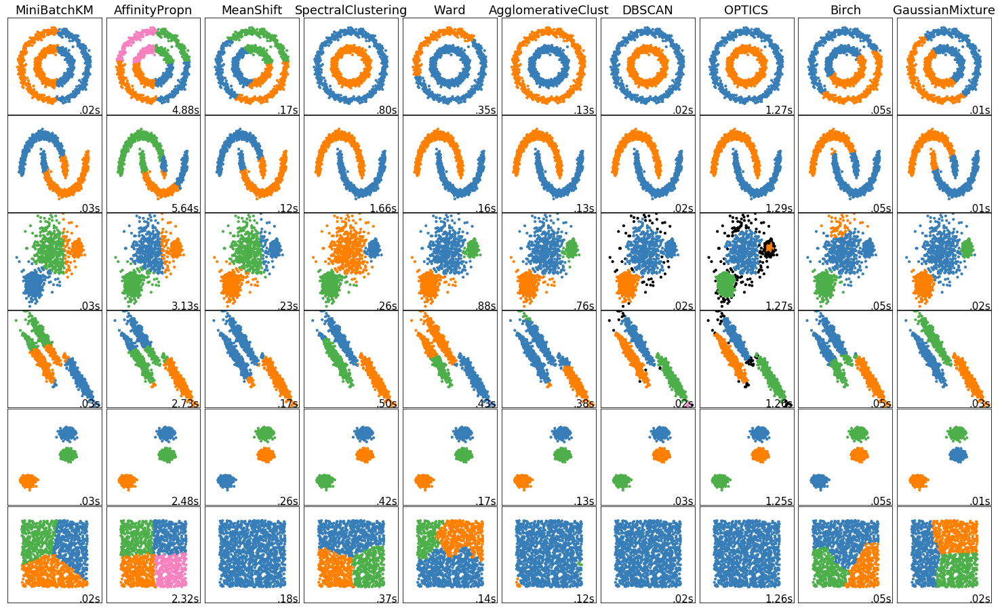

In [ ]:
#@title #Clustering algorithms in scikit-learn

import time
import warnings

import numpy as np
import matplotlib.pyplot as plt

from sklearn import cluster, datasets, mixture
from sklearn.neighbors import kneighbors_graph
from sklearn.preprocessing import StandardScaler
from itertools import cycle, islice

np.random.seed(0)

# ============
# Generate datasets. We choose the size big enough to see the scalability
# of the algorithms, but not too big to avoid too long running times
# ============
n_samples = 1500
noisy_circles = datasets.make_circles(n_samples=n_samples, factor=.5,
                                      noise=.05)
noisy_moons = datasets.make_moons(n_samples=n_samples, noise=.05)
blobs = datasets.make_blobs(n_samples=n_samples, random_state=8)
no_structure = np.random.rand(n_samples, 2), None

# Anisotropicly distributed data
random_state = 170
X, y = datasets.make_blobs(n_samples=n_samples, random_state=random_state)
transformation = [[0.6, -0.6], [-0.4, 0.8]]
X_aniso = np.dot(X, transformation)
aniso = (X_aniso, y)

# blobs with varied variances
varied = datasets.make_blobs(n_samples=n_samples,
                             cluster_std=[1.0, 2.5, 0.5],
                             random_state=random_state)

# ============
# Set up cluster parameters
# ============
plt.figure(figsize=(9 * 2 + 3, 12.5))
plt.subplots_adjust(left=.02, right=.98, bottom=.001, top=.96, wspace=.05,
                    hspace=.01)

plot_num = 1

default_base = {'quantile': .3,
                'eps': .3,
                'damping': .9,
                'preference': -200,
                'n_neighbors': 10,
                'n_clusters': 3,
                'min_samples': 20,
                'xi': 0.05,
                'min_cluster_size': 0.1}

datasets = [
    (noisy_circles, {'damping': .77, 'preference': -240,
                     'quantile': .2, 'n_clusters': 2,
                     'min_samples': 20, 'xi': 0.25}),
    (noisy_moons, {'damping': .75, 'preference': -220, 'n_clusters': 2}),
    (varied, {'eps': .18, 'n_neighbors': 2,
              'min_samples': 5, 'xi': 0.035, 'min_cluster_size': .2}),
    (aniso, {'eps': .15, 'n_neighbors': 2,
             'min_samples': 20, 'xi': 0.1, 'min_cluster_size': .2}),
    (blobs, {}),
    (no_structure, {})]

for i_dataset, (dataset, algo_params) in enumerate(datasets):
    # update parameters with dataset-specific values
    params = default_base.copy()
    params.update(algo_params)

    X, y = dataset

    # normalize dataset for easier parameter selection
    X = StandardScaler().fit_transform(X)

    # estimate bandwidth for mean shift
    bandwidth = cluster.estimate_bandwidth(X, quantile=params['quantile'])

    # connectivity matrix for structured Ward
    connectivity = kneighbors_graph(
        X, n_neighbors=params['n_neighbors'], include_self=False)
    # make connectivity symmetric
    connectivity = 0.5 * (connectivity + connectivity.T)

    # ============
    # Create cluster objects
    # ============
    ms = cluster.MeanShift(bandwidth=bandwidth, bin_seeding=True)
    two_means = cluster.MiniBatchKMeans(n_clusters=params['n_clusters'])
    ward = cluster.AgglomerativeClustering(
        n_clusters=params['n_clusters'], linkage='ward',
        connectivity=connectivity)
    spectral = cluster.SpectralClustering(
        n_clusters=params['n_clusters'], eigen_solver='arpack',
        affinity="nearest_neighbors")
    dbscan = cluster.DBSCAN(eps=params['eps'])
    optics = cluster.OPTICS(min_samples=params['min_samples'],
                            xi=params['xi'],
                            min_cluster_size=params['min_cluster_size'])
    affinity_propagation = cluster.AffinityPropagation(
        damping=params['damping'], preference=params['preference'])
    average_linkage = cluster.AgglomerativeClustering(
        linkage="average", affinity="cityblock",
        n_clusters=params['n_clusters'], connectivity=connectivity)
    birch = cluster.Birch(n_clusters=params['n_clusters'])
    gmm = mixture.GaussianMixture(
        n_components=params['n_clusters'], covariance_type='full')

    clustering_algorithms = (
        ('MiniBatchKM', two_means),
        ('AffinityPropn', affinity_propagation),
        ('MeanShift', ms),
        ('SpectralClustering', spectral),
        ('Ward', ward),
        ('AgglomerativeClust', average_linkage),
        ('DBSCAN', dbscan),
        ('OPTICS', optics),
        ('Birch', birch),
        ('GaussianMixture', gmm)
    )

    for name, algorithm in clustering_algorithms:
        t0 = time.time()

        # catch warnings related to kneighbors_graph
        with warnings.catch_warnings():
            warnings.filterwarnings(
                "ignore",
                message="the number of connected components of the " +
                "connectivity matrix is [0-9]{1,2}" +
                " > 1. Completing it to avoid stopping the tree early.",
                category=UserWarning)
            warnings.filterwarnings(
                "ignore",
                message="Graph is not fully connected, spectral embedding" +
                " may not work as expected.",
                category=UserWarning)
            algorithm.fit(X)

        t1 = time.time()
        if hasattr(algorithm, 'labels_'):
            y_pred = algorithm.labels_.astype(np.int)
        else:
            y_pred = algorithm.predict(X)

        plt.subplot(len(datasets), len(clustering_algorithms), plot_num)
        if i_dataset == 0:
            plt.title(name, size=18)

        colors = np.array(list(islice(cycle(['#377eb8', '#ff7f00', '#4daf4a',
                                             '#f781bf', '#a65628', '#984ea3',
                                             '#999999', '#e41a1c', '#dede00']),
                                      int(max(y_pred) + 1))))
        # add black color for outliers (if any)
        colors = np.append(colors, ["#000000"])
        plt.scatter(X[:, 0], X[:, 1], s=10, color=colors[y_pred])

        plt.xlim(-2.5, 2.5)
        plt.ylim(-2.5, 2.5)
        plt.xticks(())
        plt.yticks(())
        plt.text(.99, .01, ('%.2fs' % (t1 - t0)).lstrip('0'),
                 transform=plt.gca().transAxes, size=15,
                 horizontalalignment='right')
        plot_num += 1

plt.show()

#Introducing $k$-Means



$k$-means clustering is a method of vector quantization, originally from signal processing, that is popular for cluster analysis in data mining. $k$-means clustering aims to partition $n$ observations into $k$ clusters in which each observation belongs to the cluster with the nearest mean, serving as a prototype of the cluster. 
The method was originally proposed in $60$*s* in quantization problem (alike color quantization example we will examine).

The $k$-means algorithm searches for a predetermined number of clusters within an unlabeled multidimensional dataset. 




  




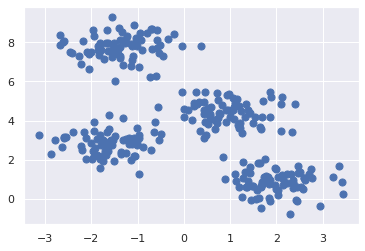

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
import numpy as np

from sklearn.datasets.samples_generator import make_blobs
X, y_true = make_blobs(n_samples=300, centers=4, cluster_std=0.60, random_state=0)
plt.scatter(X[:, 0], X[:, 1], s=50);

Here is the final result.

In [ ]:
from sklearn.datasets.samples_generator import make_blobs
X, _ = make_blobs(n_samples=300, centers=4, cluster_std=0.60, random_state=0)

from sklearn.cluster import KMeans
import ipywidgets as widgets

#@widgets.interact(clusters=(1,6,1))
def plot_kmeans(clusters):
  kmeans = KMeans(n_clusters=clusters)
  kmeans.fit(X)
  y_kmeans = kmeans.predict(X)

  plt.scatter(X[:, 0], X[:, 1], c=y_kmeans, s=50, cmap='viridis')
  centers = kmeans.cluster_centers_
  plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5);

widgets.interact(plot_kmeans, clusters=widgets.IntSlider(min=1,max=6,step=1,value=4));

interactive(children=(IntSlider(value=4, description='clusters', max=6, min=1), Output()), _dom_classes=('widg…

#$k$-Means algorithms overview

Suppose we have a function (known as **inertia**)

$$
\begin{aligned}
L&=\sum_{j=1}^K \sum_{i=1}^N a_{ij} \|\boldsymbol{x}_i-\boldsymbol{\mu}_j \|^2, \\
\boldsymbol{\mu}_j&=\frac{\sum_{i=1}^N a_{ij} \boldsymbol{x}_i}{\sum_{i=1}^N a_{ij}}=\frac{\sum_{i=1}^N a_{ij} \boldsymbol{x}_i}{N_j},
\end{aligned}
$$

where $a_{ij}$ is either $0$ or $1$ and shows whether or not $i$-th point belongs to the $j$-th cluster so $a_{ij}$ is a membership function. 
In fact $a_{ij}$ is an array of so called **indicator functions** (**characteristic functions**/**boolean predicate functions**) for sets $C_j$ evaluated at point $\boldsymbol{x}_i$.
What is an indicator function?

$$
\def\llbr{\mathbb{[}\!\mathbb{[}}
\def\rrbr{\mathbb{]}\!\mathbb{]}}
\boldsymbol{1}_A(\boldsymbol{x})=\chi_A(\boldsymbol{x})=\mathbb{I}_A(\boldsymbol{x})= \underbrace{\llbr \boldsymbol{x} \in A \rrbr}_{\text{Iverson bracket}} = 
\left\{
  \begin{aligned}
  1 \quad \text{ if } \boldsymbol{x} \in A\\
  0 \quad \text{ if } \boldsymbol{x} \notin A\\
  \end{aligned}
  \right.
$$

So

$$
a_{ij}=\boldsymbol{1}_{C_j}(\boldsymbol{x}_i),
$$

where $C_j=\{\dots\}$ - is a set of points that we attribute to class $j$.

$a_{ij}$ will allow for future generalization (soft $k$-means) when we will allow a point belong to several clusters at once (we will call them **membership probabilities** or **responsibilities**).

We can define a variance within a cluster

$$
\text{WCSS}_j=\sum_{i=1}^N a_{ij} \|\mathbf{x}_i-\boldsymbol{\mu}_j \|^2
$$

where $\text{WCSS}$ stands for **W**ithin a **C**luster **S**um of **S**quares.










In [ ]:
#@title ##k-means
%%html
<svg width="140mm" height="120mm" version="1.1" viewBox="0 0 116.86 87.059" xmlns="http://www.w3.org/2000/svg" xmlns:ns0="http://www.iki.fi/pav/software/textext/">
 <g transform="translate(-63.835 16.216)" stroke="#000">
  <circle cx="174.39" cy="81.313" r="0" fill="#f00" fill-opacity=".50794" stroke-dasharray="2.11999989, 0.26499998" stroke-linecap="square" stroke-linejoin="bevel" stroke-opacity=".32275" stroke-width=".265"/>
  <circle cx="133.94" cy="63.277" r="0" fill="#f00" fill-opacity=".50794" stroke-dasharray="2.11999991, 0.26499998" stroke-linecap="square" stroke-linejoin="bevel" stroke-opacity=".32275" stroke-width=".265"/>
  <g transform="matrix(.85823 0 0 -.85823 -156.27 642.57)" fill-rule="evenodd" stroke-miterlimit="10.433" ns0:preamble="default_packages.tex" ns0:text="$$\\{a_{ij}|i=1\\dots N, j=1\\dots K\\}$$\n$$\\{\\mu_{j}|j=1\\dots K\\}$$\n" xml:space="preserve"><flowRoot transform="matrix(.30829 0 0 -.30829 229.65 722.44)" fill="#000000" font-family="Verdana" font-size="40px" letter-spacing="0px" stroke="none" word-spacing="0px" style="line-height:1.25" xml:space="preserve"><flowRegion><rect x="-79.286" y="-282.81" width="282.14" height="74.286"/></flowRegion><flowPara/></flowRoot><g fill="#0b0" fill-opacity=".50242" stroke="none"><circle transform="scale(1,-1)" cx="330.72" cy="-748.66" r="1.5655"/><g fill-rule="evenodd"><circle transform="scale(1,-1)" cx="353.77" cy="-753.96" r="1.5655"/><circle transform="scale(1,-1)" cx="338.44" cy="-722.96" r="1.5655"/><circle transform="scale(1,-1)" cx="358.28" cy="-724.49" r="1.5655"/><circle transform="scale(1,-1)" cx="346.87" cy="-739.05" r="1.5655"/><circle transform="scale(1,-1)" cx="367.48" cy="-740.25" r="1.5655"/><circle transform="scale(1,-1)" cx="358.11" cy="-711.21" r="1.5655"/><circle transform="scale(1,-1)" cx="369.01" cy="-729.86" r="1.5655"/><circle transform="scale(1,-1)" cx="349" cy="-732.92" r="1.5655"/><circle transform="scale(1,-1)" cx="380.85" cy="-734.28" r="1.5655"/><circle transform="scale(1,-1)" cx="380.67" cy="-716.49" r="1.5655"/><circle transform="scale(1,-1)" cx="361.52" cy="-734.63" r="1.5655"/><circle transform="scale(1,-1)" cx="372.5" cy="-752.17" r="1.5655"/><circle transform="scale(1,-1)" cx="381.02" cy="-745.87" r="1.5655"/><circle transform="scale(1,-1)" cx="366.11" cy="-720.23" r="1.5655"/><circle transform="scale(1,-1)" cx="377.95" cy="-722.36" r="1.5655"/><circle transform="scale(1,-1)" cx="391.06" cy="-740.25" r="1.5655"/></g></g><g fill="#f00" fill-opacity=".50242" stroke="none"><circle transform="scale(1,-1)" cx="284.3" cy="-750.18" r="1.5053"/><g fill-rule="evenodd"><circle transform="scale(1,-1)" cx="277.92" cy="-723.92" r="1.5053"/><circle transform="scale(1,-1)" cx="290.56" cy="-729.59" r="1.5053"/><circle transform="scale(1,-1)" cx="292.96" cy="-740.57" r="1.5053"/><circle transform="scale(1,-1)" cx="273.04" cy="-731.57" r="1.5053"/><circle transform="scale(1,-1)" cx="283.1" cy="-736.39" r="1.5053"/><circle transform="scale(1,-1)" cx="299.05" cy="-715.31" r="1.5053"/><circle transform="scale(1,-1)" cx="299.77" cy="-750.18" r="1.5053"/><circle transform="scale(1,-1)" cx="306.67" cy="-728.95" r="1.5053"/><circle transform="scale(1,-1)" cx="274.43" cy="-745.66" r="1.5053"/><circle transform="scale(1,-1)" cx="268.44" cy="-706.52" r="1.5053"/><circle transform="scale(1,-1)" cx="279.68" cy="-713.17" r="1.5053"/><circle transform="scale(1,-1)" cx="289.9" cy="-710.44" r="1.5053"/><circle transform="scale(1,-1)" cx="288.54" cy="-720.49" r="1.5053"/><circle transform="scale(1,-1)" cx="298.28" cy="-736.87" r="1.5053"/><circle transform="scale(1,-1)" cx="293.82" cy="-728.15" r="1.5053"/><circle transform="scale(1,-1)" cx="265.72" cy="-725.09" r="1.5053"/></g></g><g fill="#00f" fill-opacity=".50242" fill-rule="evenodd" stroke="none"><circle transform="scale(1,-1)" cx="304.02" cy="-691.68" r="1.5655"/><circle transform="scale(1,-1)" cx="314.75" cy="-697.04" r="1.5655"/><circle transform="scale(1,-1)" cx="326.41" cy="-683.67" r="1.5655"/><circle transform="scale(1,-1)" cx="311.85" cy="-687.42" r="1.5655"/><circle transform="scale(1,-1)" cx="323.69" cy="-689.55" r="1.5655"/></g><rect transform="scale(1,-1)" x="281.19" y="-735.26" width="3.3719" height="3.3719" fill="#f00" stroke="#000" stroke-dasharray="1.39822951, 0.23303825" stroke-linecap="square" stroke-linejoin="bevel" stroke-miterlimit="10.433" stroke-width=".23304"/><g fill="none" stroke="#fff" stroke-miterlimit="10.433" stroke-opacity=".61836"><path d="m295.86 741.44 0.58838 0.55454" stroke-width=".17478"/><g><path d="m298.53 738.5 0.82936 0.80033" stroke-width=".17431"/><path d="m300.06 739.72 0.73377 0.68497" stroke-width=".17478"/><path d="m295.86 740.04 1.9679 1.9273" stroke-width=".17082"/><path d="m295.86 740.74 1.2855 1.2414" stroke-width=".17104"/><path d="m297.82 738.5 1.5297 1.5004" stroke-width=".17137"/></g></g><rect transform="scale(1,-1)" x="357.95" y="-734.02" width="3.3719" height="3.3719" fill="#3aff00" fill-rule="evenodd" stroke="#000" stroke-dasharray="1.3982295, 0.23303825" stroke-linecap="square" stroke-linejoin="bevel" stroke-miterlimit="10.433" stroke-width=".23304"/><g fill="#0b0" fill-opacity=".50242" fill-rule="evenodd" stroke="none"><circle transform="scale(1,-1)" cx="342.74" cy="-734.3" r="1.5655"/><circle transform="scale(1,-1)" cx="358.55" cy="-747.49" r="1.5655"/><circle transform="scale(1,-1)" cx="375.43" cy="-735.17" r="1.5655"/></g><g fill="#f00" fill-opacity=".50242" fill-rule="evenodd" stroke="none"><circle transform="scale(1,-1)" cx="310.53" cy="-739.33" r="1.5053"/><circle transform="scale(1,-1)" cx="308.37" cy="-746.73" r="1.5053"/><circle transform="scale(1,-1)" cx="267.99" cy="-741.49" r="1.5053"/><circle transform="scale(1,-1)" cx="265.06" cy="-750.89" r="1.5053"/><circle transform="scale(1,-1)" cx="257.97" cy="-727.62" r="1.5053"/></g><g fill="#00f" fill-rule="evenodd"><rect transform="scale(1,-1)" x="313.15" y="-683.77" width="3.3719" height="3.3719" stroke="#000" stroke-dasharray="1.3982295, 0.23303825" stroke-linecap="square" stroke-linejoin="bevel" stroke-miterlimit="10.433" stroke-width=".23304"/><g fill-opacity=".50242" stroke="none"><circle transform="scale(1,-1)" cx="315.39" cy="-674.82" r="1.5655"/><circle transform="scale(1,-1)" cx="305.17" cy="-676.17" r="1.5655"/><circle transform="scale(1,-1)" cx="310.07" cy="-670.2" r="1.5655"/><circle transform="scale(1,-1)" cx="305.63" cy="-684.1" r="1.5655"/><circle transform="scale(1,-1)" cx="324.25" cy="-670.58" r="1.5655"/><circle transform="scale(1,-1)" cx="328.49" cy="-676.9" r="1.5655"/><circle transform="scale(1,-1)" cx="295.89" cy="-680.06" r="1.5655"/><circle transform="scale(1,-1)" cx="295.73" cy="-667.73" r="1.5655"/><circle transform="scale(1,-1)" cx="320.09" cy="-691.93" r="1.5655"/><circle transform="scale(1,-1)" cx="333.34" cy="-690.08" r="1.5655"/><circle transform="scale(1,-1)" cx="321.24" cy="-681.07" r="1.5655"/><circle transform="scale(1,-1)" cx="308.84" cy="-681.14" r="1.5655"/><circle transform="scale(1,-1)" cx="315.62" cy="-670.35" r="1.5655"/></g></g><g fill="none"><path d="m283.13 736.3-0.23122-2.7746" stroke="#710000" stroke-opacity=".35749" stroke-width=".30829px"/><g stroke="#530000" stroke-miterlimit="10.433" stroke-opacity=".36715" stroke-width=".23304"><path d="m293.03 740.54-10.135-7.0136"/><path d="m299.78 750.18-16.879-16.648"/><path d="m298.31 736.8-15.415-3.2756"/><path d="m272.92 731.45 9.9809 2.081"/><path d="m267.87 741.54 15.029-8.0155"/><path d="m274.38 745.74 8.5165-12.216"/><path d="m284.25 750.18-1.3488-16.648"/><path d="m308.41 746.71-25.511-13.179"/></g><path d="m310.57 739.27-27.669-5.7419" stroke="#980000" stroke-opacity=".40311" stroke-width=".30829px"/><path d="m306.71 728.71-23.815 4.817" stroke="#530000" stroke-miterlimit="10.433" stroke-opacity=".36715" stroke-width=".23304"/><path d="m290.57 729.52-7.6687 4.0078" stroke="#530000" stroke-miterlimit="10.433" stroke-opacity=".36715" stroke-width=".23304"/><path d="m293.84 728.06-10.944 5.4722" stroke="#a00000" stroke-opacity=".3285" stroke-width=".30829px"/><g stroke="#530000" stroke-miterlimit="10.433" stroke-opacity=".36715" stroke-width=".23304"><path d="m277.97 723.78 4.9326 9.7497"/><path d="m264.98 750.87 17.919-17.341"/><path d="m265.71 724.97 17.187 8.555"/><path d="m279.73 712.98c0.0545 0.218 3.165 20.547 3.165 20.547"/><path d="m288.51 720.34-5.6092 13.19"/></g><path d="m257.93 727.53 24.964 5.9961" stroke="#a00000" stroke-opacity=".3285" stroke-width=".30829px"/><g stroke="#530000" stroke-miterlimit="10.433" stroke-opacity=".36715" stroke-width=".23304"><path d="m268.45 706.44 14.446 27.087"/><path d="m289.92 710.31-7.0262 23.218"/><path d="m299.08 715.16-16.182 18.367"/></g><g stroke="#000079" stroke-opacity=".32367" stroke-width=".30829px"><path d="m314.78 682.19 8.9922 7.2483"/><path d="m320.06 692.05-5.2864-9.8642"/><path d="m311.67 687.48 3.1064-5.2864"/><path d="m314.67 697.01 0.109-14.824"/><path d="m303.99 691.67 10.791-9.4827"/><path d="m295.92 680.01 18.856 2.1799"/><path d="m308.84 680.94 5.9403 1.2535"/><path d="m305.59 684.07 9.183-1.8802"/><path d="m321.26 681.04-6.4853 1.1445"/><path d="m326.38 683.63-11.608-1.4442"/><path d="m333.47 690.09-18.693-7.9023"/><path d="m305.18 676.03 9.5917 6.1583"/><path d="m310.06 670.17 4.7141 12.017"/><path d="m315.46 674.64-0.68123 7.548"/><path d="m324.29 670.39-9.51 11.799"/><path d="m328.59 676.88-13.815 5.3136"/><path d="m315.57 670.17-0.79022 12.017"/><path d="m295.73 667.67 19.045 14.52"/></g></g><g transform="matrix(.42579 0 0 .42579 218.76 460.3)" fill-rule="evenodd" stroke="#000" stroke-miterlimit="10.433" stroke-width="0" ns0:preamble="default_packages.tex" ns0:text="$\\text{WCSS}_i=\\text{Variance of the }i\\text{-th cluster}$\n" xml:space="preserve"><path d="m203.76 718.01 0.01 0.05 0.02 0.05 0.02 0.04 0.03 0.05 0.04 0.08 0.03 0.03 0.02 0.04 0.12 0.12 0.09 0.06 0.04 0.02 0.03 0.02 0.03 0.01 0.04 0.02 0.03 0.01 0.08 0.02 0.03 0.01 0.04 0.01h0.04l0.03 0.01h0.04l0.04 0.01h0.14v0.31c-0.29-0.02-0.6-0.03-0.9-0.03-0.29 0-0.93 0.02-1.19 0.03v-0.31c0.67-0.01 0.87-0.34 0.87-0.52 0-0.06-0.03-0.14-0.05-0.2l-1.5-4.59-1.59 4.87c-0.01 0.04-0.03 0.09-0.03 0.14 0 0.3 0.57 0.3 0.83 0.3v0.31c-0.36-0.03-1.03-0.03-1.41-0.03s-0.81 0.02-1.22 0.03v-0.31c0.57 0 0.78 0 0.9-0.36l0.22-0.69-1.39-4.26-1.6 4.88c-0.01 0.04-0.02 0.1-0.02 0.13 0 0.3 0.57 0.3 0.83 0.3v0.31c-0.36-0.03-1.03-0.03-1.41-0.03s-0.81 0.02-1.22 0.03v-0.31c0.75 0 0.79-0.05 0.91-0.42l1.99-6.09c0.03-0.08 0.06-0.18 0.19-0.18 0.14 0 0.16 0.07 0.2 0.19l1.65 5.05 1.65-5.06c0.03-0.08 0.06-0.18 0.19-0.18 0.14 0 0.16 0.07 0.2 0.19z"/><path d="m205.21 715.59 0.02-0.38 0.02-0.18 0.03-0.18 0.04-0.18 0.05-0.18 0.06-0.16 0.06-0.17 0.07-0.16 0.08-0.16 0.18-0.3 0.1-0.14 0.1-0.13 0.11-0.13 0.12-0.13 0.12-0.12 0.13-0.11 0.13-0.1 0.14-0.1 0.28-0.18 0.15-0.08 0.16-0.07 0.15-0.06 0.16-0.06 0.16-0.04 0.17-0.04 0.34-0.06 0.17-0.01h0.17c1.63 0 2.6 1.38 2.6 2.53 0 0.1 0 0.17-0.13 0.17-0.1 0-0.1-0.06-0.12-0.16-0.07-1.42-1.14-2.24-2.23-2.24-0.61 0-2.56 0.34-2.56 3.3 0 2.97 1.94 3.31 2.55 3.31 1.09 0 1.98-0.9 2.18-2.35 0.02-0.14 0.02-0.17 0.16-0.17 0.15 0 0.15 0.03 0.15 0.24v2.35c0 0.17 0 0.24-0.11 0.24-0.04 0-0.07 0-0.15-0.12l-0.5-0.74c-0.37 0.36-0.88 0.86-1.84 0.86-1.86 0-3.47-1.58-3.47-3.61z"/><path d="m215.33 716.05-1.28 0.31c-0.62 0.15-1.01 0.68-1.01 1.26 0 0.69 0.54 1.3 1.32 1.3 1.67 0 1.88-1.63 1.94-2.08 0.02-0.06 0.02-0.11 0.13-0.11 0.12 0 0.12 0.05 0.12 0.23v2c0 0.17 0 0.24-0.11 0.24-0.06 0-0.08-0.01-0.14-0.13l-0.35-0.57c-0.3 0.29-0.71 0.7-1.6 0.7-1.11 0-1.94-0.88-1.94-1.93 0-0.82 0.52-1.55 1.3-1.82 0.11-0.04 0.62-0.16 1.32-0.33 0.27-0.06 0.57-0.13 0.85-0.5 0.21-0.26 0.31-0.59 0.31-0.91 0-0.71-0.5-1.43-1.34-1.43-0.29 0-1.05 0.05-1.58 0.54-0.58 0.54-0.61 1.17-0.61 1.53-0.02 0.1-0.09 0.1-0.12 0.1-0.13 0-0.13-0.07-0.13-0.25v-1.98c0-0.17 0-0.24 0.11-0.24 0.06 0 0.08 0.02 0.14 0.13 0 0.01 0.03 0.04 0.36 0.56 0.31-0.34 0.95-0.69 1.84-0.69 1.17 0 1.96 0.97 1.96 2.06 0 1-0.66 1.81-1.49 2.01z"/><path d="m220.86 716.05-1.27 0.31c-0.62 0.15-1.01 0.68-1.01 1.26 0 0.69 0.54 1.3 1.32 1.3 1.66 0 1.88-1.63 1.94-2.08 0.01-0.06 0.01-0.11 0.12-0.11 0.13 0 0.13 0.05 0.13 0.23v2c0 0.17 0 0.24-0.11 0.24-0.07 0-0.08-0.01-0.15-0.13l-0.35-0.57c-0.3 0.29-0.71 0.7-1.59 0.7-1.11 0-1.95-0.88-1.95-1.93 0-0.82 0.53-1.55 1.31-1.82 0.11-0.04 0.62-0.16 1.31-0.33 0.27-0.06 0.57-0.13 0.85-0.5 0.21-0.26 0.31-0.59 0.31-0.91 0-0.71-0.5-1.43-1.34-1.43-0.28 0-1.04 0.05-1.57 0.54-0.58 0.54-0.61 1.17-0.62 1.53-0.01 0.1-0.09 0.1-0.12 0.1-0.13 0-0.13-0.07-0.13-0.25v-1.98c0-0.17 0-0.24 0.11-0.24 0.07 0 0.08 0.02 0.15 0.13 0 0.01 0.03 0.04 0.36 0.56 0.31-0.34 0.95-0.69 1.83-0.69 1.17 0 1.97 0.97 1.97 2.06 0 1-0.66 1.81-1.5 2.01z"/><path d="m235.86 715.44h0.08l0.02 0.01h0.07l0.01 0.01h0.03l0.01 0.01h0.01l0.01 0.01h0.02l0.03 0.03v0.01l0.01 0.01h0.01v0.01l0.01 0.01v0.02l0.01 0.01v0.06c0 0.2-0.19 0.2-0.33 0.2h-5.97c-0.14 0-0.33 0-0.33-0.2s0.19-0.2 0.34-0.2z"/><path d="m235.86 713.52h0.16l0.01 0.01h0.03l0.01 0.01h0.01l0.01 0.01h0.02l0.01 0.01h0.01l0.02 0.02v0.01h0.01v0.01l0.01 0.01v0.01h0.01v0.02l0.01 0.01v0.07c0 0.19-0.19 0.19-0.33 0.19h-5.96c-0.15 0-0.34 0-0.34-0.19 0-0.2 0.19-0.2 0.33-0.2z"/><g transform="matrix(1.9 0 0 1.9 -87.368 -642.87)" fill-rule="evenodd" stroke="#000" stroke-miterlimit="10.433" ns0:preamble="default_packages.tex" ns0:text="$|C_j|\\text{Var}[C_j]$\n" xml:space="preserve"><path d="m173.85 717.04v0.0637l-6e-3 0.0116v0.0352l-6e-3 6e-3v0.0176l-6e-3 6e-3v0.0116l-6e-3 6e-3v6e-3l-0.024 0.024h-6e-3l-0.012 0.012h-0.012l-6e-3 6e-3h-0.03l-6e-3 6e-3c-0.11126-4e-3 -0.11126-0.10763-0.11126-0.2117v-5.3307c0-0.10407 0-0.20814 0.11564-0.20814 0.11562 0 0.11562 0.10407 0.11562 0.20814z"/><path d="m178.92 716.93v0.012l-6e-3 6e-3v0.012h-6e-3v6e-3h-6e-3v6e-3h-6e-3v6e-3h-6e-3l-6e-3 6e-3h-0.012v6e-3h-0.018c-0.0173 0-0.0231-6e-3 -0.0867-0.0694l-0.40471-0.44519c-0.052 0.081-0.31799 0.51456-0.95397 0.51456-1.2893 0-2.5844-1.272-2.5844-2.6018 0-0.9482 0.67646-1.5726 1.561-1.5726 0.50301 0 0.94242 0.22549 1.2488 0.49145 0.53192 0.47409 0.63021 0.99445 0.63021 1.0118 0 0.0578-0.0578 0.0578-0.0694 0.0578-0.0347 0-0.0636-0.0116-0.0752-0.0578-0.052-0.16767-0.18501-0.57239-0.57817-0.90773-0.39893-0.32377-0.76318-0.42206-1.0638-0.42206-0.52035 0-1.1274 0.30065-1.1274 1.1968 0 0.32955 0.12142 1.2604 0.6938 1.9311 0.35268 0.40472 0.89616 0.6938 1.4107 0.6938 0.58395 0 0.92507-0.44519 0.92507-1.1101 0-0.22549-0.0173-0.23127-0.0173-0.28909 0-0.0578 0.0636-0.0578 0.0867-0.0578 0.0752 0 0.0752 0.0116 0.10407 0.11563z"/><path d="m180.43 714.59v0.024l-6e-3 6e-3v0.0176l-6e-3 6e-3v6e-3l-6e-3 6e-3v6e-3l-0.012 0.012v6e-3l-0.042 0.042h-6e-3l-6e-3 6e-3 -0.0116 6e-3h-6e-3l-6e-3 6e-3h-0.0176l-0.0116 6e-3h-0.0292c-0.11563 0-0.22548-0.10986-0.22548-0.21971 0-0.0636 0.0463-0.15611 0.16189-0.15611 0.10985 0 0.22548 0.10986 0.22548 0.22549z"/><path d="m179.57 711.88-6e-3 -0.0231-0.0116-0.0289-6e-3 -0.0231-0.0116-0.0289-0.0232-0.0462-6e-3 -0.0231-0.0173-0.0231-0.0232-0.0462-0.0173-0.0173-0.0116-0.0231-0.0173-0.0231-0.0174-0.0173-0.0116-0.0173-0.0173-0.0174-0.0173-0.0173-0.0231-0.0173-0.0173-0.0173-0.0346-0.0232-0.0231-0.0116-0.0173-0.0116-0.0231-0.0116-0.0173-0.0116-0.0462-0.012-0.0173-6e-3 -0.0462-0.012h-0.0404c-0.0578 0-0.10407 6e-3 -0.15033 0.0231 0.10408 0.0463 0.13876 0.14454 0.13876 0.20235 0 0.0983-0.0752 0.15033-0.1561 0.15033-0.1272 0-0.23127-0.10986-0.23127-0.23705 0-0.15032 0.15611-0.25439 0.39894-0.25439s0.71692 0.14454 0.84412 0.63598l0.36424 1.4396c0.0116 0.0463 0.0173 0.081 0.0173 0.13876 0 0.22549-0.19079 0.38159-0.43362 0.38159-0.44519 0-0.70537-0.56082-0.70537-0.61864 0-0.052 0.0578-0.052 0.0694-0.052 0.0463 0 0.0521 0.0116 0.081 0.0752 0.0983 0.23126 0.31221 0.47988 0.54348 0.47988 0.10407 0 0.13876-0.0636 0.13876-0.19658 0-0.0405-6e-3 -0.0983-0.0116-0.12142z"/><path d="m181.99 717.04v0.1045l-6e-3 6e-3v0.0176l-6e-3 6e-3v6e-3l-6e-3 0.0116v6e-3l-6e-3 6e-3v6e-3l-0.018 0.018h-6e-3l-6e-3 6e-3h-6e-3v6e-3h-0.012l-6e-3 6e-3h-0.036l-6e-3 6e-3c-0.10985 0-0.10985-0.10407-0.10985-0.20814v-5.3307c0-0.10407 0-0.20815 0.10985-0.20815 0.11563 0 0.11563 0.10408 0.11563 0.20815z"/><path d="m188.13 716.07 6e-3 0.0173 0.0116 0.0173 6e-3 0.0231 0.0116 0.0173 6e-3 0.0173 0.0116 0.0174 0.0348 0.0519 0.0173 0.0174 0.0232 0.0346 0.0173 0.0116 0.0173 0.0173 0.0173 0.0116 0.0174 0.0116 0.0173 0.0173 0.0231 0.0116 0.0173 0.0116 0.0231 6e-3 0.0462 0.0232 0.0231 6e-3 0.0289 0.0116 0.0289 6e-3 0.0231 6e-3 0.0347 6e-3 0.0289 6e-3h0.0289l0.0347 6e-3h0.0752v0.17923c-0.17923-0.0116-0.4105-0.0174-0.56082-0.0174-0.17345 0-0.50878 0.0116-0.65911 0.0174v-0.17923c0.30065-6e-3 0.42206-0.15611 0.42206-0.28908 0-0.0405-0.0173-0.0752-0.0289-0.10985l-1.058-2.7694-1.0985 2.9024c-0.0347 0.0752-0.0347 0.0867-0.0347 0.0983 0 0.16767 0.32955 0.16767 0.4741 0.16767v0.17923c-0.20815-0.0174-0.60708-0.0174-0.82678-0.0174-0.27753 0-0.52614 0.0116-0.73427 0.0174v-0.17923c0.3758 0 0.48566 0 0.5666-0.21971l1.3356-3.521c0.0463-0.10985 0.0694-0.12719 0.14455-0.12719 0.0983 0 0.10985 0.0289 0.13876 0.10407z"/><path d="m190.31 713.14 6e-3 -0.0231v-0.0173l0.018-0.0693 6e-3 -0.0174 6e-3 -0.0231 6e-3 -0.0174 0.0116-0.0231 6e-3 -0.0174 0.0116-0.0231 0.0116-0.0174 0.0116-0.0173 0.0116-0.0231 0.0174-0.0174 0.0116-0.0173 0.0289-0.0289 0.0174-0.0173 0.0346-0.0232 0.0173-0.0173 0.0173-0.0116 0.0231-6e-3 0.0174-0.0116 0.0231-6e-3 0.0174-0.0116 0.0231-6e-3h0.0231l0.0231-6e-3h0.052c0.12141 0 0.4741 0.0752 0.4741 0.54348v0.32378h-0.14454v-0.32378c0-0.33533-0.14455-0.37003-0.20815-0.37003-0.19079 0-0.21391 0.26018-0.21391 0.28909v1.1506c0 0.23705 0 0.46254-0.20814 0.67646-0.22549 0.22548-0.51458 0.31799-0.79209 0.31799-0.46832 0-0.86726-0.27174-0.86726-0.65333 0-0.16767 0.11564-0.26596 0.26596-0.26596 0.16189 0 0.26595 0.10986 0.26595 0.26018 0 0.0694-0.0289 0.26018-0.29486 0.26595 0.1561 0.20236 0.43941 0.26596 0.61864 0.26596 0.2833 0 0.61286-0.22548 0.61286-0.73427v-0.90772c0-0.54926-0.41628-0.74584-0.67646-0.74584-0.27752 0-0.51456 0.20236-0.51456 0.49144 0 0.318 0.24283 0.79209 1.191 0.82679v0.12141c-0.29486-0.0173-0.69958-0.0347-1.058-0.20814-0.43362-0.19658-0.57816-0.49145-0.57816-0.74584 0-0.46831 0.56081-0.60707 0.91928-0.60707 0.38159 0 0.64755 0.22548 0.7574 0.49722z"/><path d="m192.24 714.61v0.63598l-0.80365-0.0636v-0.17923c0.40472 0 0.45097-0.0405 0.45097-0.32377v-1.5379c0-0.26018-0.0636-0.26018-0.45097-0.26018v-0.17345c0.22549 6e-3 0.49722 0.0174 0.65911 0.0174 0.23127 0 0.50301 0 0.72849-0.0174v0.17345h-0.12141c-0.42207 0-0.43363 0.0636-0.43363 0.27174v0.88459c0 0.56661 0.23705 1.0812 0.67646 1.0812 0.0405 0 0.052 0 0.0636-6e-3 -0.0173-6e-3 -0.13298-0.0752-0.13298-0.22549 0-0.16188 0.12141-0.24861 0.24861-0.24861 0.10407 0 0.24861 0.0694 0.24861 0.25439 0 0.18502-0.17923 0.35269-0.42784 0.35269-0.42207 0-0.62443-0.38737-0.70537-0.63599z"/><polygon transform="matrix(.57817 0 0 .57817 88.824 303.87)" points="183.64 704.64 183.64 705.04 182.67 705.04 182.67 714.18 183.64 714.18 183.64 714.58 182.27 714.58 182.27 704.64"/><path d="m199.51 716.7v0.012h-6e-3v0.012l-6e-3 6e-3v6e-3h-6e-3v6e-3h-6e-3v6e-3h-6e-3l-6e-3 6e-3h-0.012l-6e-3 6e-3h-0.012c-0.0174 0-0.0231-6e-3 -0.0867-0.0694l-0.40472-0.44519c-0.052 0.081-0.318 0.51458-0.95976 0.51458-1.2835 0-2.5786-1.272-2.5786-2.6018 0-0.9482 0.67645-1.5726 1.5611-1.5726 0.503 0 0.93663 0.22548 1.2431 0.49144 0.53769 0.4741 0.63598 0.99445 0.63598 1.0118 0 0.0578-0.0578 0.0578-0.0694 0.0578-0.0347 0-0.0636-0.0116-0.0752-0.0578-0.0521-0.16767-0.18502-0.57239-0.58395-0.90772-0.39316-0.32378-0.7574-0.42207-1.058-0.42207-0.52036 0-1.1332 0.30065-1.1332 1.1968 0 0.32956 0.12141 1.2604 0.69958 1.9311 0.35268 0.40472 0.89616 0.6938 1.405 0.6938 0.58973 0 0.93085-0.44519 0.93085-1.1101 0-0.22549-0.0174-0.23127-0.0174-0.28908 0-0.0578 0.0636-0.0578 0.0867-0.0578 0.0752 0 0.0752 0.0116 0.10407 0.11563z"/><path d="m201.02 714.35v0.018l-6e-3 6e-3v0.0236l-6e-3 6e-3v6e-3l-6e-3 6e-3v6e-3l-0.012 0.012v6e-3l-0.042 0.042h-6e-3l-6e-3 6e-3 -0.0116 6e-3h-6e-3l-6e-3 6e-3h-0.0176l-0.0116 6e-3h-0.0292c-0.11564 0-0.22549-0.10985-0.22549-0.2197 0-0.0636 0.0463-0.1561 0.16189-0.1561 0.10985 0 0.22548 0.10984 0.22548 0.22548z"/><path d="m200.16 711.64-0.0116-0.0231-6e-3 -0.0289-6e-3 -0.0231-0.0116-0.0289-0.0696-0.1386-0.0173-0.0173-0.0116-0.0231-0.0173-0.0231-0.0173-0.0174-0.0173-0.0173-0.0116-0.0173-0.0173-0.0173-0.0231-0.0174-0.0173-0.0173-0.0346-0.0232-0.0231-0.0116-0.0173-0.0116-0.0231-0.0116-0.0173-0.0116-0.0462-0.012-0.0174-6e-3 -0.0462-0.012h-0.0462c-0.052 0-0.0983 6e-3 -0.14454 0.0231 0.10407 0.0463 0.13876 0.14455 0.13876 0.20236 0 0.0983-0.0752 0.15032-0.15611 0.15032-0.12719 0-0.23126-0.10984-0.23126-0.23704 0-0.15033 0.1561-0.2544 0.39893-0.2544s0.71694 0.14454 0.84413 0.63598l0.36425 1.4396c0.0116 0.0463 0.0173 0.081 0.0173 0.13877 0 0.22548-0.1908 0.38159-0.43363 0.38159-0.44519 0-0.70536-0.56083-0.70536-0.61865 0-0.052 0.0578-0.052 0.0694-0.052 0.0463 0 0.052 0.0116 0.081 0.0752 0.0983 0.23127 0.31222 0.47988 0.54348 0.47988 0.10407 0 0.13877-0.0636 0.13877-0.19658 0-0.0405-0.0116-0.0983-0.0116-0.12141z"/><polygon transform="matrix(.57817 0 0 .57817 88.824 303.87)" points="196.76 714.58 195.4 714.58 195.4 714.18 196.36 714.18 196.36 705.04 195.4 705.04 195.4 704.64 196.76 704.64"/><g transform="matrix(1.9 0 0 1.9 -96.85 -715.53)" fill-rule="evenodd" stroke="#000" stroke-miterlimit="10.433" ns0:preamble="default_packages.tex" ns0:text="$C_1$\n$C_2$\n$C_3$\n" xml:space="preserve"><path d="m127.04 718.42v0.012l-4e-3 4e-3v4e-3l-0.012 0.012h-4e-3v4e-3h-0.012v4e-3h-0.012c-0.0109 0-0.0146-4e-3 -0.0545-0.0436l-0.25457-0.28003c-0.0327 0.0509-0.19638 0.32367-0.60007 0.32367-0.811 0-1.6256-0.80009-1.6256-1.6366 0-0.59644 0.42914-0.98921 0.98193-0.98921 0.3164 0 0.5928 0.14184 0.78555 0.30913 0.33458 0.29821 0.39641 0.62553 0.39641 0.63644 0 0.0363-0.0363 0.0363-0.0436 0.0363-0.0219 0-0.04-7e-3 -0.0473-0.0363-0.0327-0.10547-0.11274-0.36005-0.36368-0.57098-0.25094-0.20366-0.48006-0.26548-0.66917-0.26548-0.32367 0-0.70917 0.18911-0.70917 0.75281 0 0.2073 0.0764 0.79282 0.43641 1.2147 0.22185 0.25457 0.5637 0.43641 0.88738 0.43641 0.36731 0 0.58188-0.28003 0.58188-0.69826 0-0.14183-0.0109-0.14548-0.0109-0.18184 0-0.0363 0.04-0.0363 0.0545-0.0363 0.0473 0 0.0473 7e-3 0.0655 0.0728z"/><path d="m127.72 716.97-4e-3 4e-3v0.048l-4e-3 4e-3v4e-3l-4e-3 4e-3v4e-3h-4e-3v4e-3h-4e-3l-4e-3 4e-3h-0.016l-4e-3 4e-3h-0.04c-0.16365-0.16001-0.39641-0.16365-0.49824-0.16365v-0.0981c0.0582 0 0.22548 0 0.36732 0.0728v-1.2911c0-0.0836 0-0.11638-0.25458-0.11638h-0.0982v-0.0909c0.0473 4e-3 0.36004 0.0109 0.4546 0.0109 0.0764 0 0.40005-7e-3 0.45459-0.0109v0.0909h-0.0982c-0.25094 0-0.25094 0.0327-0.25094 0.11638z"/><path d="m174.07 722.51v0.012l-4e-3 4e-3v4e-3l-0.012 0.012h-4e-3v4e-3h-0.012v4e-3h-0.012c-0.0108 0-0.0144-4e-3 -0.0539-0.0431l-0.25175-0.27693c-0.0323 0.0503-0.1942 0.32008-0.59339 0.32008-0.7984 0-1.6076-0.7912-1.6076-1.6184 0-0.58981 0.42437-0.97822 0.97102-0.97822 0.31288 0 0.58621 0.14026 0.77681 0.3057 0.33087 0.2949 0.39201 0.61857 0.39201 0.62936 0 0.0359-0.0323 0.0359-0.0395 0.0359-0.0216 0-0.0395-7e-3 -0.0467-0.0359-0.0323-0.1043-0.11508-0.35604-0.36323-0.56463-0.24815-0.2014-0.47473-0.26253-0.66173-0.26253-0.32008 0-0.70129 0.18701-0.70129 0.74445 0 0.20499 0.0755 0.784 0.43515 1.2012 0.21579 0.25175 0.55385 0.43156 0.87392 0.43156 0.36683 0 0.57542-0.27692 0.57542-0.6905 0-0.14026-0.0108-0.14386-0.0108-0.17982 0-0.0359 0.0395-0.0359 0.0539-0.0359 0.0467 0 0.0467 7e-3 0.0647 0.0719z"/><path d="m175.18 719.95h-0.0827c-7e-3 -0.0575-0.0323-0.20499-0.0683-0.23016-0.018-0.0144-0.21218-0.0144-0.24815-0.0144h-0.46033c0.26253 0.23377 0.35244 0.3021 0.49989 0.42078 0.18702 0.14745 0.35964 0.3021 0.35964 0.53946 0 0.30209-0.26613 0.4891-0.58621 0.4891-0.31288 0-0.52507-0.21937-0.52507-0.44955 0-0.12587 0.11149-0.14026 0.13307-0.14026 0.0611 0 0.13666 0.0431 0.13666 0.13308 0 0.0467-0.018 0.13306-0.15105 0.13306 0.0791 0.17622 0.25175 0.23376 0.36684 0.23376 0.25174 0 0.3848-0.1942 0.3848-0.39919 0-0.21579-0.15824-0.38841-0.23736-0.47832l-0.60779-0.597c-0.0252-0.0216-0.0252-0.0252-0.0252-0.0971h1.0394z"/><path d="m149.26 693.13v0.016h-4e-3v4e-3l-4e-3 4e-3v4e-3h-4e-3l-4e-3 4e-3h-4e-3v4e-3h-0.012v4e-3h-0.012c-0.011 0-0.0147-4e-3 -0.0551-0.0441l-0.25728-0.28302c-0.0294 0.0515-0.19848 0.32712-0.60646 0.32712-0.81595 0-1.6429-0.8086-1.6429-1.654 0-0.60277 0.4337-0.99973 0.99605-0.99973 0.31609 0 0.59543 0.14335 0.79023 0.31242 0.34182 0.30139 0.4043 0.63219 0.4043 0.64321 0 0.0367-0.0367 0.0367-0.0441 0.0367-0.0221 0-0.0404-7e-3 -0.0478-0.0367-0.033-0.10659-0.11761-0.36387-0.37122-0.57705-0.25361-0.20583-0.48516-0.26831-0.67261-0.26831-0.3308 0-0.7204 0.19113-0.7204 0.76083 0 0.2095 0.0772 0.80125 0.44474 1.2276 0.2242 0.25728 0.56602 0.44105 0.89314 0.44105 0.3749 0 0.58808-0.28301 0.58808-0.70569 0-0.14334-0.011-0.14702-0.011-0.18377 0-0.0367 0.0404-0.0367 0.0551-0.0367 0.0478 0 0.0478 7e-3 0.0662 0.0735z"/><path d="m149.79 690.89h0.0368l0.0184-4e-3h0.0184l0.0184-4e-3 0.0147-7e-3 0.0184-4e-3 0.0735-0.035 0.0147-0.011 0.0477-0.0477 7e-3 -0.0147 0.022-0.0294 0.035-0.092 4e-3 -0.0221 4e-3 -0.0184 4e-3 -0.0221 4e-3 -0.0257 4e-3 -0.0221v-0.0515c0-0.31609-0.18377-0.41165-0.33446-0.41165-0.10291 0-0.32712 0.0294-0.43738 0.1801 0.12129 7e-3 0.15069 0.0919 0.15069 0.14334 0 0.0809-0.0625 0.13966-0.14334 0.13966-0.0699 0-0.14334-0.0441-0.14334-0.14701 0-0.23891 0.2683-0.39695 0.57704-0.39695 0.3602 0 0.60645 0.23891 0.60645 0.49251 0 0.20215-0.16539 0.40063-0.4484 0.45943 0.26831 0.0956 0.36755 0.28669 0.36755 0.44474 0 0.20215-0.23156 0.35284-0.51824 0.35284-0.28669 0-0.50355-0.13966-0.50355-0.34182 0-0.0882 0.0551-0.13599 0.13232-0.13599 0.0809 0 0.13232 0.0588 0.13232 0.12864 0 0.0735-0.0515 0.12865-0.13232 0.13232 0.0919 0.11394 0.26831 0.14334 0.36387 0.14334 0.11394 0 0.27566-0.0588 0.27566-0.27933 0-0.10659-0.033-0.22421-0.10291-0.30507-0.0845-0.0956-0.15437-0.10291-0.28301-0.11026-0.0662-4e-3 -0.0699-4e-3 -0.0845-7e-3 -4e-3 0-0.0258-4e-3 -0.0258-0.0331 0-0.0367 0.0258-0.0367 0.0662-0.0367z"/><g transform="matrix(.34012 0 0 .34012 116.14 462.87)" fill-rule="evenodd" stroke="#000" stroke-miterlimit="10.433" ns0:preamble="default_packages.tex" ns0:text="$\\boldsymbol{\\mu}_1$\n$\\boldsymbol{\\mu}_2$\n$\\boldsymbol{\\mu}_3$\n" xml:space="preserve"><path d="m9.8886 801.11 0.01 0.03 0.01 0.02v0.03l0.01 0.03 0.01 0.02v0.03l0.02 0.06 0.02 0.12 0.02 0.05 0.01 0.06 0.01 0.03v0.03l0.01 0.02 0.01 0.03v0.02l0.01 0.02v0.03l0.01 0.02v0.03l0.01 0.02v0.06c0 0.21-0.16 0.43-0.47 0.43-0.51 0-0.64-0.49-0.67-0.61l-1.33-5.28c-0.04-0.15-0.04-0.21-0.04-0.25 0-0.32 0.26-0.44 0.47-0.44 0.19 0 0.46 0.11 0.6 0.39 0.06 0.12 0.39 1.48 0.46 1.78 0.4-0.15 0.85-0.15 0.98-0.15 0.34 0 0.8 0.05 1.4 0.59 0.24-0.46 0.8-0.59 1.17-0.59s0.66 0.2 0.86 0.56c0.25 0.4 0.38 0.94 0.38 0.98 0 0.14-0.15 0.14-0.24 0.14-0.11 0-0.15 0-0.2-0.05-0.01-0.02-0.01-0.03-0.08-0.28-0.2-0.8-0.42-1-0.67-1-0.11 0-0.23 0.04-0.23 0.37 0 0.17 0.04 0.33 0.14 0.73l0.26 1.01c0.05 0.22 0.15 0.63 0.22 0.89 0.05 0.23 0.16 0.63 0.16 0.7 0 0.21-0.16 0.44-0.47 0.44-0.2 0-0.55-0.12-0.66-0.53l-0.69-2.75c-0.04-0.18-0.21-0.35-0.39-0.5-0.32-0.27-0.62-0.36-0.89-0.36-0.67 0-0.73 0.49-0.73 0.79 0 0.27 0.06 0.5 0.09 0.68z"/><path d="m16.549 799.8v0.08h-0.01v0.06l-0.02 0.02v0.01h-0.01l-0.01 0.01h-0.01l-0.01 0.01h-0.04l-0.01 0.01h-0.09c-0.45-0.44-1.09-0.45-1.37-0.45v-0.25c0.17 0 0.63 0 1.01 0.2v-3.55c0-0.23 0-0.32-0.7-0.32h-0.26v-0.25c0.12 0.01 0.98 0.03 1.24 0.03 0.22 0 1.1-0.02 1.25-0.03v0.25h-0.26c-0.7 0-0.7 0.09-0.7 0.32z"/><path d="m156.13 797.83v0.03l0.01 0.02 0.01 0.03v0.03l0.01 0.02v0.03l0.02 0.06 0.01 0.06 0.02 0.06 0.01 0.05 0.01 0.06 0.02 0.06v0.02l0.01 0.03v0.02l0.01 0.02v0.03l0.01 0.02v0.02l0.01 0.01v0.05l0.01 0.01v0.02c0 0.21-0.16 0.43-0.47 0.43-0.52 0-0.65-0.49-0.68-0.61l-1.33-5.28c-0.04-0.15-0.04-0.21-0.04-0.25 0-0.32 0.26-0.44 0.47-0.44 0.19 0 0.46 0.11 0.6 0.39 0.06 0.12 0.39 1.48 0.46 1.78 0.41-0.15 0.86-0.15 0.99-0.15 0.34 0 0.79 0.05 1.39 0.59 0.24-0.46 0.8-0.59 1.17-0.59s0.66 0.2 0.87 0.56c0.25 0.4 0.38 0.94 0.38 0.98 0 0.14-0.15 0.14-0.24 0.14-0.11 0-0.15 0-0.2-0.05-0.02-0.02-0.02-0.03-0.08-0.28-0.2-0.8-0.43-1-0.68-1-0.11 0-0.23 0.04-0.23 0.37 0 0.17 0.04 0.33 0.14 0.73l0.26 1.01c0.05 0.22 0.15 0.63 0.22 0.89 0.06 0.23 0.16 0.63 0.16 0.7 0 0.21-0.16 0.44-0.47 0.44-0.2 0-0.55-0.12-0.66-0.53l-0.69-2.75c-0.04-0.18-0.21-0.35-0.39-0.5-0.32-0.27-0.61-0.36-0.88-0.36-0.68 0-0.74 0.49-0.74 0.79 0 0.27 0.06 0.5 0.1 0.68z"/><path d="m163.97 793.37h-0.24c-0.02-0.16-0.09-0.57-0.18-0.64-0.06-0.04-0.6-0.04-0.69-0.04h-1.29c0.73 0.65 0.98 0.84 1.4 1.17 0.52 0.41 1 0.84 1 1.5 0 0.84-0.74 1.36-1.64 1.36-0.87 0-1.45-0.61-1.45-1.25 0-0.35 0.3-0.39 0.37-0.39 0.17 0 0.37 0.12 0.37 0.37 0 0.13-0.05 0.37-0.41 0.37 0.21 0.49 0.69 0.65 1.02 0.65 0.7 0 1.06-0.54 1.06-1.11 0-0.6-0.43-1.08-0.66-1.33l-1.68-1.66c-0.07-0.06-0.07-0.07-0.07-0.27h2.88z"/><path d="m70.174 702.29v0.03l0.01 0.02 0.01 0.03v0.03l0.01 0.02 0.01 0.03 0.01 0.06 0.02 0.06 0.01 0.06 0.01 0.05 0.02 0.06v0.03l0.01 0.03 0.01 0.02v0.03l0.01 0.02v0.02l0.01 0.03v0.04l0.01 0.01v0.04l0.01 0.01v0.03c0 0.21-0.16 0.43-0.47 0.43-0.52 0-0.65-0.49-0.68-0.61l-1.32-5.28c-0.04-0.15-0.04-0.21-0.04-0.25 0-0.32 0.25-0.44 0.46-0.44 0.19 0 0.46 0.11 0.6 0.39 0.06 0.12 0.39 1.48 0.46 1.78 0.41-0.15 0.86-0.15 0.99-0.15 0.34 0 0.8 0.05 1.4 0.59 0.23-0.46 0.79-0.59 1.16-0.59s0.66 0.2 0.87 0.56c0.25 0.4 0.38 0.94 0.38 0.98 0 0.14-0.15 0.14-0.24 0.14-0.11 0-0.15 0-0.2-0.05-0.02-0.02-0.02-0.03-0.08-0.28-0.2-0.8-0.43-1-0.68-1-0.11 0-0.23 0.04-0.23 0.37 0 0.17 0.04 0.33 0.14 0.73l0.26 1.01c0.05 0.22 0.15 0.63 0.22 0.89 0.06 0.23 0.16 0.63 0.16 0.7 0 0.21-0.16 0.44-0.47 0.44-0.2 0-0.55-0.12-0.66-0.53l-0.69-2.75c-0.03-0.18-0.2-0.35-0.38-0.5-0.32-0.27-0.62-0.36-0.89-0.36-0.68 0-0.74 0.49-0.74 0.79 0 0.27 0.06 0.5 0.1 0.68z"/><path d="m76.394 698.88h0.1l0.05-0.01h0.05l0.04-0.01 0.05-0.02 0.04-0.01 0.05-0.02 0.12-0.06 0.03-0.03 0.04-0.02 0.04-0.03 0.03-0.03 0.03-0.04 0.03-0.03 0.06-0.08 0.02-0.05 0.03-0.04 0.06-0.15 0.01-0.05 0.02-0.06 0.03-0.18v-0.13l0.01-0.07c0-0.86-0.51-1.12-0.91-1.12-0.28 0-0.9 0.08-1.19 0.49 0.33 0.01 0.4 0.24 0.4 0.39 0 0.22-0.16 0.38-0.38 0.38-0.2 0-0.39-0.12-0.39-0.4 0-0.66 0.72-1.08 1.57-1.08 0.97 0 1.64 0.65 1.64 1.34 0 0.54-0.44 1.09-1.21 1.25 0.73 0.26 1 0.78 1 1.21 0 0.55-0.64 0.96-1.42 0.96-0.77 0-1.37-0.38-1.37-0.93 0-0.24 0.16-0.37 0.37-0.37 0.22 0 0.35 0.16 0.35 0.35 0 0.2-0.13 0.35-0.35 0.36 0.24 0.31 0.72 0.39 0.98 0.39 0.32 0 0.76-0.16 0.76-0.76 0-0.29-0.1-0.61-0.28-0.83-0.23-0.26-0.43-0.28-0.78-0.3-0.17-0.01-0.19-0.01-0.22-0.02-0.02 0-0.07-0.01-0.07-0.09 0-0.1 0.06-0.1 0.18-0.1z"/></g></g></g></g><g fill="none" stroke="#005700" stroke-opacity=".33333" stroke-width=".30829px"><path d="m359.74 732.22 2.0039 2.5049"/><path d="m348.95 733.03 10.79-0.80927" opacity=".99"/><path d="m342.71 734.22 17.033-2.0039" opacity=".99"/><path d="m346.71 739.12 13.025-6.898" opacity=".99"/><path d="m338.31 722.78 21.426 9.4414" opacity=".99"/><path d="m358.35 724.47 1.3873 7.7458" opacity=".99"/><path d="m368.99 729.75-9.2487 2.4663" opacity=".99"/><path d="m366.06 720-6.32 12.216" opacity=".99"/><path d="m367.56 740.12-7.8229-7.8999" opacity=".99"/><path d="m358.08 710.98 1.6571 21.233" opacity=".99"/><path d="m358.51 747.48 1.2332-15.26" opacity=".99"/><path d="m330.68 748.63 29.056-16.416" opacity=".99"/><path d="m353.81 754.03 5.9346-21.812" opacity=".99"/><path d="m372.57 752.14-12.833-19.923" opacity=".99"/><path d="m377.89 722.25-18.145 9.9722" opacity=".99"/><path d="m375.38 735.11-15.639-2.8895" opacity=".99"/><path d="m380.88 734.13-21.143-1.9085" opacity=".99"/><path d="m380.66 716.36-20.925 15.858" opacity=".99"/><path d="m380.94 745.84-21.197-13.626" opacity=".99"/><path d="m391.02 740.23-31.28-8.0123" opacity=".99"/></g><g transform="matrix(.29515 0 0 .29515 269.21 553.75)" fill-rule="evenodd" stroke="#000" stroke-miterlimit="10.433" stroke-width="0" ns0:preamble="default_packages.tex" ns0:text="$j$\n" xml:space="preserve"><path d="m152.67 713.33v0.06l-0.01 0.01v0.04l-0.01 0.01v0.02l-0.01 0.01-0.02 0.04-0.02 0.02-0.01 0.02-0.02 0.02-0.01 0.02-0.01 0.01-0.02 0.01-0.01 0.01-0.02 0.01-0.01 0.01h-0.02l-0.04 0.02h-0.01l-0.02 0.01h-0.02l-0.02 0.01h-0.07c-0.23 0-0.53-0.23-0.53-0.53 0-0.19 0.14-0.35 0.37-0.35 0.27 0 0.54 0.26 0.54 0.52z"/><path d="m150.67 706.63-0.06-0.21-0.03-0.07-0.02-0.06-0.03-0.06-0.03-0.07-0.06-0.12-0.03-0.05-0.03-0.06-0.04-0.05-0.03-0.05-0.12-0.15-0.12-0.12-0.05-0.03-0.04-0.04-0.05-0.03-0.04-0.03-0.05-0.02-0.05-0.03-0.05-0.02-0.05-0.01-0.04-0.02-0.06-0.01-0.05-0.01h-0.1c-0.06 0-0.21 0-0.39 0.09 0.3 0.07 0.45 0.32 0.45 0.52 0 0.16-0.11 0.35-0.38 0.35-0.25 0-0.54-0.21-0.54-0.57 0-0.39 0.4-0.61 0.88-0.61 0.7 0 1.63 0.52 1.88 1.51l0.91 3.63c0.05 0.2 0.05 0.34 0.05 0.37 0 0.57-0.42 0.92-0.92 0.92-1.01 0-1.58-1.44-1.58-1.53 0-0.1 0.1-0.1 0.12-0.1 0.09 0 0.1 0.01 0.18 0.2 0.25 0.6 0.71 1.21 1.25 1.21 0.14 0 0.32-0.04 0.32-0.46 0-0.23-0.03-0.34-0.07-0.51z"/></g></g>
 </g>
</svg>


We can than write 

$$
L=\sum_{j=1}^K \text{WCSS}_j
$$

We want to minimize $L$

$$
(\hat{a}_{ij}, \hat{\boldsymbol{\mu}}_j)=\text{argmin}_{{a}_{ij}, {\boldsymbol{\mu}}_j} L
$$

that is the sum of $\text{WCSS}$'s (variances) of all clusters. **In practice we can obtain only the local minimum of $L$.**

Here are $3$ most popular $k$-means algorithms:

In [ ]:
#@title ##ML algos
%%html

<div id="slide_1" style="display:none; max-width:750px">
<?xml version="1.0" encoding="UTF-8"?>
<?xml version="1.0" encoding="UTF-8" standalone="no"?>
<svg
   xmlns:ns0="http://www.iki.fi/pav/software/textext/"
   xmlns:dc="http://purl.org/dc/elements/1.1/"
   xmlns:cc="http://creativecommons.org/ns#"
   xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#"
   xmlns:svg="http://www.w3.org/2000/svg"
   xmlns="http://www.w3.org/2000/svg"
   xmlns:xlink="http://www.w3.org/1999/xlink"
   xmlns:sodipodi="http://sodipodi.sourceforge.net/DTD/sodipodi-0.dtd"
   xmlns:inkscape="http://www.inkscape.org/namespaces/inkscape"
   width="230mm"
   height="170mm"
   version="1.1"
   viewBox="0 0 203.01 172.17"
   id="svg135"
   sodipodi:docname="drawing-20.svg"
   inkscape:version="0.92.2 (5c3e80d, 2017-08-06)">
  <metadata
     id="metadata141">
    <rdf:RDF>
      <cc:Work
         rdf:about="">
        <dc:format>image/svg+xml</dc:format>
        <dc:type
           rdf:resource="http://purl.org/dc/dcmitype/StillImage" />
        <dc:title></dc:title>
      </cc:Work>
    </rdf:RDF>
  </metadata>
  <defs
     id="defs139">
    <linearGradient
       inkscape:collect="always"
       id="linearGradient968">
      <stop
         style="stop-color:#000000;stop-opacity:1;"
         offset="0"
         id="stop964" />
      <stop
         style="stop-color:#0b5ffa;stop-opacity:1"
         offset="1"
         id="stop966" />
    </linearGradient>
    <linearGradient
       inkscape:collect="always"
       id="linearGradient960">
      <stop
         style="stop-color:#008500;stop-opacity:0.66666669"
         offset="0"
         id="stop956" />
      <stop
         style="stop-color:#000000;stop-opacity:0.66666669"
         offset="1"
         id="stop958" />
    </linearGradient>
    <linearGradient
       inkscape:collect="always"
       id="linearGradient952">
      <stop
         style="stop-color:#b90000;stop-opacity:0.66666669"
         offset="0"
         id="stop948" />
      <stop
         style="stop-color:#000000;stop-opacity:0.66666669"
         offset="1"
         id="stop950" />
    </linearGradient>
    <linearGradient
       inkscape:collect="always"
       xlink:href="#linearGradient952"
       id="linearGradient954"
       x1="289.39634"
       y1="720.02"
       x2="407.63366"
       y2="720.02"
       gradientUnits="userSpaceOnUse" />
    <linearGradient
       inkscape:collect="always"
       xlink:href="#linearGradient960"
       id="linearGradient962"
       x1="407.54999"
       y1="709.50897"
       x2="407.54999"
       y2="730.13"
       gradientUnits="userSpaceOnUse" />
    <linearGradient
       inkscape:collect="always"
       xlink:href="#linearGradient968"
       id="linearGradient970"
       x1="407.47634"
       y1="720.01"
       x2="525.71366"
       y2="720.01"
       gradientUnits="userSpaceOnUse" />
  </defs>
  <sodipodi:namedview
     pagecolor="#ffffff"
     bordercolor="#666666"
     borderopacity="1"
     objecttolerance="10"
     gridtolerance="10"
     guidetolerance="10"
     inkscape:pageopacity="0"
     inkscape:pageshadow="2"
     inkscape:window-width="1920"
     inkscape:window-height="1017"
     id="namedview137"
     showgrid="false"
     inkscape:zoom="1.867633"
     inkscape:cx="402.82839"
     inkscape:cy="537.11802"
     inkscape:window-x="-8"
     inkscape:window-y="-8"
     inkscape:window-maximized="1"
     inkscape:current-layer="g133" />
  <g
     transform="translate(-28.837 -6.4938)"
     id="g133">
    <g
       transform="translate(-82.564 5.6207)"
       id="g45">
      <g
         transform="translate(-12.407,-6.2183)"
         id="g43">
        <g
           transform="translate(2.8906,5.3477)"
           fill-rule="evenodd"
           stroke="#000"
           stroke-miterlimit="10.433"
           id="g41">
          <g
             transform="matrix(.26527 0 0 -.26527 -45.139 238.93)"
             ns0:preamble="default_packages.tex"
             ns0:text="$$\\text{1.Choose number of clusters}$$\n$$\\text{2.Choose the mestric to choose}$$\n$$\\text{3.Choose the methosd to pick initial centroids}$$\n$$\\text{4.Assign initial centroids}$$\n$$\\text{5.While metric(centroid, cases)}&gt;\\text{threshold:}$$\n$$\\quad \\text{a. For} i&lt;n$$\n$$\\quad \\quad \\text{i. Assign case to the closest cluster}$$\n$$\\quad \\quad \\text{\\, \\, according to metric}$$\n$$\\quad \\text{b. Recalculate centroids}$$\n"
             xml:space="preserve"
             id="g39"><g
               fill-rule="evenodd"
               stroke="#000"
               stroke-miterlimit="10.433"
               id="g37"><g
                 id="content"
                 transform="matrix(2.2136,0,0,2.2136,125.01,-782.14)"
                 ns0:preamble="default_packages.tex"
                 ns0:text="$$\\text{Forgy/Lloyd(1957/1965)}$$\n"
                 xml:space="preserve"><rect
                   transform="scale(1,-1)"
                   x="247.73"
                   y="-709.21"
                   width="87.398"
                   height="14.079"
                   fill="#8c0000"
                   fill-opacity=".16863"
                   stroke="#8c0000"
                   stroke-miterlimit="4"
                   stroke-opacity=".16863"
                   stroke-width=".90117"
                   id="rect2"
                   style="stroke:none" /><g
                   fill-rule="evenodd"
                   stroke-miterlimit="10.433"
                   stroke-width="0"
                   id="g26"><path
                     d="m269.44 706.27h-5.47v-0.3h0.24c0.77 0 0.78-0.11 0.78-0.47v-5.2c0-0.36-0.01-0.47-0.78-0.47h-0.24v-0.31c0.35 0.03 1.12 0.03 1.51 0.03 0.41 0 1.32 0 1.68-0.03v0.31h-0.33c-0.95 0-0.95 0.13-0.95 0.48v2.44h0.86c0.96 0 1.06-0.32 1.06-1.16h0.25v2.63h-0.25c0-0.84-0.1-1.16-1.06-1.16h-0.86v2.51c0 0.33 0.02 0.4 0.49 0.4h1.2c1.49 0 1.74-0.56 1.9-1.93h0.25z"
                     id="path4" /><path
                     d="m274.01 701.65v0.11l-0.02 0.24-0.02 0.11-0.09 0.33-0.04 0.11-0.15 0.3-0.18 0.27-0.07 0.08-0.08 0.08-0.07 0.08-0.08 0.08-0.09 0.06-0.08 0.07-0.09 0.06-0.1 0.06-0.09 0.05-0.1 0.05-0.1 0.04-0.1 0.03-0.1 0.04-0.33 0.06-0.11 0.01h-0.11l-0.01-0.22c0.44 0 0.87001-0.22 1.13-0.64 0.25001-0.43 0.25001-1.01 0.25001-1.38 0-0.36 0-0.9-0.22-1.34-0.21001-0.44-0.65001-0.73-1.15-0.73-0.43 0-0.87 0.21-1.14 0.66-0.25001 0.44-0.25001 1.05-0.25001 1.41 0 0.38 0 0.92 0.24 1.36 0.27 0.45 0.74 0.66 1.14 0.66l0.01 0.22c-1.25 0-2.22-1.08-2.22-2.32 0-1.29 1.04-2.24 2.21-2.24 1.21 0 2.21 0.97 2.21 2.24z"
                     id="path6" /><path
                     d="m275.96 702.82v1.09l-1.38-0.11v-0.31c0.69 0 0.77-0.07 0.77-0.55v-2.67c0-0.44-0.11-0.44-0.77-0.44v-0.31c0.38 0.01 0.85 0.03 1.13 0.03 0.4 0 0.87 0 1.27-0.03v0.31h-0.21c-0.74 0-0.76 0.11-0.76 0.47v1.52c0 0.99 0.42 1.87 1.18 1.87 0.07 0 0.09 0 0.11-0.01-0.03-0.01-0.23-0.13-0.23-0.38 0-0.28 0.21-0.43 0.43-0.43 0.18 0 0.43 0.12 0.43 0.44 0 0.31-0.31 0.6-0.74 0.6-0.73 0-1.09-0.66-1.23-1.09z"
                     id="path8" /><path
                     d="m279.26 700.84v0.11l0.01 0.02v0.03l0.01 0.01v0.02l0.01 0.02v0.02l0.01 0.01v0.02l0.04 0.08 0.01 0.01 0.03 0.06 0.02 0.02 0.01 0.02 0.02 0.02c0.39-0.28 0.79-0.31 0.98-0.31v0.23c-0.86 0-0.86 0.99-0.86 1.22 0 0.27 0.01 0.59 0.16 0.83 0.08 0.12 0.3 0.4 0.7 0.4 0.87 0 0.87-0.99 0.87-1.22 0-0.27-0.01-0.59-0.16-0.83-0.08-0.12-0.31-0.4-0.71-0.4v-0.23c0.93 0 1.62 0.69 1.62 1.45 0 0.37-0.16 0.74-0.41 0.96 0.36 0.34 0.72 0.39 0.9 0.39 0.02 0 0.07 0 0.1-0.01-0.11-0.04-0.16-0.15-0.16-0.27 0-0.17 0.13-0.28 0.29-0.28 0.1 0 0.29 0.07 0.29 0.29 0 0.17-0.12 0.49-0.51 0.49-0.2 0-0.64-0.06-1.06-0.47-0.42 0.33-0.84 0.36-1.06 0.36-0.92 0-1.61-0.68-1.61-1.45 0-0.44 0.22-0.81 0.47-1.02-0.13-0.15-0.31-0.48-0.31-0.83 0-0.3 0.13-0.68 0.44-0.88-0.6-0.17-0.92-0.6-0.92-0.99 0-0.72 0.99-1.27 2.2-1.27l0.01 0.23c-1.01 0-1.69 0.51-1.69 1.04 0 0.45 0.38 0.82 0.82 0.85h0.58c0.86 0 1.98 0 1.98-0.85 0-0.54-0.71-1.04-1.69-1.04l-0.01-0.23c1.18 0 2.22 0.51 2.22 1.29 0 0.34-0.14 0.85-0.65 1.13-0.53 0.28-1.11 0.28-1.72 0.28-0.25 0-0.67 0-0.74 0.01-0.32 0.03-0.53 0.34-0.53 0.66z"
                     id="path10" /><path
                     d="m287.32 702.86 0.01 0.03 0.01 0.02 0.02 0.03 0.01 0.03 0.01 0.02 0.02 0.03 0.01 0.02 0.02 0.03 0.09 0.12 0.06 0.06 0.04 0.03 0.03 0.03 0.03 0.02 0.04 0.03 0.03 0.02 0.04 0.01 0.03 0.02 0.03 0.01 0.04 0.02 0.09 0.03h0.03l0.03 0.01h0.03l0.03 0.01h0.15v0.31c-0.23-0.02-0.52-0.03-0.75-0.03-0.18 0-0.65 0.02-0.87 0.03v-0.31c0.31-0.01 0.47-0.17 0.47-0.42 0-0.1-0.01-0.12-0.06-0.24l-1.01-2.45-1.1 2.68c-0.04 0.1-0.06 0.14-0.06 0.18 0 0.25 0.37 0.25 0.55 0.25v0.31c-0.25-0.01-0.91-0.03-1.08-0.03-0.27 0-0.67 0.01-0.97 0.03v-0.31c0.48 0 0.67 0 0.81-0.34l1.49-3.63c-0.05-0.13-0.19-0.46-0.25-0.59-0.21-0.54-0.49-1.23-1.13-1.23-0.05 0-0.28 0-0.47 0.18 0.31 0.04 0.39 0.26 0.39 0.42 0 0.26-0.19 0.41-0.42 0.41-0.2 0-0.42-0.12-0.42-0.42 0-0.45 0.42-0.81 0.92-0.81 0.63 0 1.04 0.57 1.27 1.14z"
                     id="path12" /><path
                     d="m292.81 706.59v0.02l0.01 0.01v0.02l0.01 0.01v0.01l0.01 0.01v0.03l0.01 0.01v0.04h0.01v0.02c0 0.11-0.09 0.2-0.2 0.2-0.14 0-0.18-0.1-0.21-0.2l-3.4-9.36c-0.05-0.13-0.05-0.15-0.05-0.17 0-0.11 0.09-0.2 0.2-0.2 0.14 0 0.18 0.1 0.21 0.2z"
                     id="path14" /><path
                     d="m299.22 702.08h-0.24c-0.12-1.01-0.25-2.25-2.01-2.25h-0.82c-0.47 0-0.49 0.07-0.49 0.4v5.29c0 0.34 0 0.48 0.95 0.48h0.33v0.31c-0.36-0.04-1.27-0.04-1.67-0.04-0.39 0-1.17 0-1.52 0.04v-0.31h0.24c0.77 0 0.79-0.11 0.79-0.47v-5.23c0-0.36-0.02-0.47-0.79-0.47h-0.24v-0.31h5.2z"
                     id="path16" /><path
                     d="m301.41 706.41-1.43-0.1v-0.31c0.69 0 0.77-0.07 0.77-0.56v-5.17c0-0.44-0.11-0.44-0.77-0.44v-0.31c0.32 0.01 0.85 0.03 1.1 0.03s0.74-0.02 1.11-0.03v0.31c-0.67 0-0.78 0-0.78 0.44z"
                     id="path18" /><path
                     d="m307.11 701.65v0.11l-0.02 0.24-0.02 0.11-0.09 0.33-0.04 0.11-0.15 0.3-0.12 0.18-0.07 0.09-0.14 0.16-0.16 0.16-0.08 0.06-0.09 0.07-0.08 0.06-0.1 0.06-0.09 0.05-0.1 0.05-0.1 0.04-0.1 0.03-0.11 0.04-0.1 0.02-0.22 0.04-0.11 0.01h-0.11l-0.01-0.22c0.44 0 0.87-0.22 1.12-0.64 0.26-0.43 0.26-1.01 0.26-1.38 0-0.36 0-0.9-0.22-1.34s-0.65-0.73-1.15-0.73c-0.43 0-0.87 0.21-1.14 0.66-0.25 0.44-0.25 1.05-0.25 1.41 0 0.38 0 0.92 0.24 1.36 0.27 0.45 0.74 0.66 1.14 0.66l0.01 0.22c-1.25 0-2.22-1.08-2.22-2.32 0-1.29 1.04-2.24 2.21-2.24 1.2 0 2.21 0.97 2.21 2.24z"
                     id="path20" /><path
                     d="m311.26 702.86 0.01 0.03 0.01 0.02 0.01 0.03 0.02 0.03 0.01 0.02 0.01 0.03 0.02 0.02 0.01 0.03 0.09 0.12 0.04 0.03 0.06 0.06 0.04 0.03 0.03 0.02 0.03 0.03 0.04 0.02 0.03 0.01 0.04 0.02 0.03 0.01 0.03 0.02 0.04 0.01 0.06 0.02h0.03l0.03 0.01h0.03l0.02 0.01h0.15v0.31c-0.23-0.02-0.52-0.03-0.75-0.03-0.17 0-0.64 0.02-0.86 0.03v-0.31c0.31-0.01 0.47-0.17 0.47-0.42 0-0.1-0.01-0.12-0.06-0.24l-1.0102-2.45-1.11 2.68c-0.04 0.1-0.06 0.14-0.06 0.18 0 0.25 0.37001 0.25 0.56 0.25v0.31c-0.26-0.01-0.92-0.03-1.09-0.03-0.27 0-0.66 0.01-0.96 0.03v-0.31c0.48 0 0.66 0 0.8-0.34l1.5-3.63c-0.05-0.13-0.19-0.46-0.25-0.59-0.22-0.54-0.5-1.23-1.14-1.23-0.05 0-0.28 0-0.46 0.18 0.3 0.04 0.38 0.26 0.38 0.42 0 0.26-0.19 0.41-0.41 0.41-0.2 0-0.42-0.12-0.42-0.42 0-0.45 0.42-0.81 0.91-0.81 0.63 0 1.04 0.57 1.28 1.14z"
                     id="path22" /><path
                     d="m316.16 700.07v-0.66l1.47 0.11v0.31c-0.7 0-0.78 0.07-0.78 0.55v6.03l-1.43-0.1v-0.31c0.69 0 0.77-0.07 0.77-0.56v-2.14c-0.29 0.35-0.71 0.61-1.25 0.61l0.04-0.22c0.35 0 0.76-0.15 1.07-0.59 0.11-0.17 0.11-0.19 0.11-0.37v-2.04c0-0.18 0-0.2-0.11-0.37-0.29-0.47-0.74-0.69-1.17-0.69-0.45 0-0.81 0.26-1.05 0.63-0.26 0.41-0.29 0.98-0.29 1.39 0 0.36 0.02 0.96 0.31 1.41 0.21 0.3 0.59 0.63 1.13 0.63l-0.04 0.22c-1.18 0-2.23-0.97-2.23-2.25 0-1.27 0.98-2.25 2.12-2.25 0.64 0 1.09 0.34 1.33 0.66z"
                     id="path24" /></g><g
                   fill="none"
                   stroke="#000"
                   stroke-miterlimit="10.433"
                   stroke-opacity=".31373"
                   stroke-width=".99128"
                   id="g34"><path
                     d="m407.55 730.13-118.07-20.22"
                     id="path28"
                     style="stroke:url(#linearGradient954);stroke-opacity:0.39216003;stroke-width:0.99115953;stroke-miterlimit:10.43299961;stroke-dasharray:none" /><path
                     d="m525.63 709.9-118.07 20.22"
                     id="path30"
                     style="stroke:url(#linearGradient970)" /><path
                     d="m407.55 730.13v-20.621"
                     id="path32"
                     style="stroke:url(#linearGradient962)" /></g></g></g></g>        </g>
      </g>
    </g>
    <g
       transform="matrix(.66578 0 0 -.66295 -69.016 477.04)"
       fill-rule="evenodd"
       stroke="#000"
       stroke-miterlimit="10.433"
       stroke-width="0"
       ns0:preamble="default_packages.tex"
       ns0:text="$$k\\text{-means algos}$$\n"
       xml:space="preserve"
       id="g71"
       style="fill:#000000;fill-opacity:0.74509805"><path
         d="m278.01 701.96v0.01h-0.01v0.03l-0.01 0.01v0.01h-0.01v0.01h-0.01v0.01h-0.01l-0.01 0.01h-0.01l-0.01 0.01h-0.05c-0.23 0-0.96-0.08-1.22-0.09-0.08-0.01-0.19-0.02-0.19-0.2 0-0.12 0.09-0.12 0.24-0.12 0.48 0 0.5-0.07 0.5-0.17l-0.03-0.2-1.45-5.72c-0.04-0.14-0.04-0.16-0.04-0.22 0-0.23 0.2-0.28 0.29-0.28 0.13 0 0.28 0.09 0.34 0.21 0.05 0.09 0.5 1.93 0.56 2.18 0.34-0.04 1.16-0.19 1.16-0.85 0-0.07 0-0.11-0.03-0.21-0.02-0.12-0.04-0.24-0.04-0.35 0-0.58 0.39-0.98 0.91-0.98 0.3 0 0.57 0.16 0.79 0.53 0.25 0.43 0.36 0.98 0.36 1 0 0.1-0.09 0.1-0.12 0.1-0.1 0-0.11-0.04-0.14-0.18-0.2-0.72-0.43-1.23-0.87-1.23-0.19 0-0.32 0.11-0.32 0.47 0 0.16 0.04 0.39 0.08 0.55 0.04 0.17 0.04 0.21 0.04 0.31 0 0.65-0.62 0.93-1.47 1.04 0.31 0.18 0.63 0.5 0.86 0.74 0.47 0.52 0.93 0.95 1.42 0.95 0.06 0 0.07 0 0.09-0.01 0.12-0.02 0.13-0.02 0.21-0.08 0.02-0.01 0.02-0.02 0.04-0.04-0.48-0.03-0.57-0.41-0.57-0.53 0-0.16 0.11-0.35 0.38-0.35 0.26 0 0.55 0.22 0.55 0.6 0 0.3-0.23 0.63-0.68 0.63-0.28 0-0.74-0.08-1.45-0.87-0.34-0.38-0.73-0.78-1.11-0.93z"
         id="path47"
         style="fill:#000000;fill-opacity:0.74509805" /><polygon
         points="280.76 697.6 280.76 697.03 283.4 697.03 283.4 697.6"
         id="polygon49"
         style="fill:#000000;fill-opacity:0.74509805" /><path
         d="m285.06 698.59v-2.67c0-0.44-0.11-0.44-0.77-0.44v-0.31c0.34 0.01 0.85 0.03 1.12 0.03 0.26 0 0.78-0.02 1.12-0.03v0.31c-0.67 0-0.78 0-0.78 0.44v1.83c0 1.04 0.71 1.59 1.35 1.59 0.63 0 0.73-0.53 0.73-1.1v-2.32c0-0.44-0.1-0.44-0.77-0.44v-0.31c0.35 0.01 0.86 0.03 1.12 0.03s0.78-0.02 1.12-0.03v0.31c-0.67 0-0.78 0-0.78 0.44v1.83c0 1.04 0.71 1.59 1.35 1.59 0.63 0 0.74-0.53 0.74-1.1v-2.32c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.35 0.01 0.86 0.03 1.13 0.03 0.25 0 0.77-0.02 1.11-0.03v0.31c-0.52 0-0.77 0-0.77 0.3v1.89c0 0.86 0 1.17-0.31 1.52-0.14 0.17-0.47 0.37-1.05 0.37-0.84 0-1.28-0.59-1.45-0.97-0.14 0.86-0.88 0.97-1.32 0.97-0.73 0-1.2-0.43-1.48-1.04v1.04l-1.4-0.11v-0.31c0.69 0 0.77-0.07 0.77-0.55z"
         id="path51"
         style="fill:#000000;fill-opacity:0.74509805" /><path
         d="m293.37 697.47 0.01 0.2c0.06 1.48 0.9 1.73 1.24 1.73 1.03 0 1.13-1.34 1.13-1.73h-2.37l-0.01-0.2h2.79c0.22 0 0.25 0 0.25 0.2 0 0.99-0.54 1.95-1.79 1.95-1.16 0-2.07-1.02-2.07-2.27 0-1.33 1.04-2.29 2.19-2.29 1.22 0 1.67 1.1 1.67 1.29 0 0.1-0.08 0.12-0.13 0.12-0.09 0-0.11-0.06-0.13-0.14-0.35-1.02-1.25-1.02-1.35-1.02-0.5 0-0.9 0.3-1.13 0.66-0.3 0.48-0.3 1.14-0.3 1.5z"
         id="path53"
         style="fill:#000000;fill-opacity:0.74509805" /><path
         d="m300.02 695.92v-0.03l0.01-0.04v-0.04l0.01-0.03 0.02-0.08 0.01-0.03 0.02-0.04 0.01-0.04 0.04-0.06 0.02-0.04 0.08-0.12 0.11-0.11 0.06-0.04 0.04-0.02 0.03-0.02 0.03-0.01 0.04-0.02 0.16-0.04h0.08c0.21 0 0.82 0.14 0.82 0.94v0.56h-0.25v-0.56c0-0.57-0.25-0.63-0.36-0.63-0.33 0-0.37 0.44-0.37 0.49v1.99c0 0.42 0 0.81-0.36 1.17-0.38 0.39-0.88 0.55-1.36 0.55-0.82 0-1.51-0.47-1.51-1.12 0-0.3 0.2-0.47 0.46-0.47 0.28 0 0.46 0.2 0.46 0.46 0 0.12-0.05 0.44-0.51 0.46 0.27 0.34 0.76 0.45 1.08 0.45 0.49 0 1.06-0.39 1.06-1.27v-1.57c0-0.94-0.72-1.28-1.17-1.28-0.49 0-0.9 0.35-0.9 0.84 0 0.55 0.42 1.37 2.07 1.43v0.21c-0.51-0.03-1.21-0.06-1.84-0.35-0.75-0.34-1-0.86-1-1.3 0-0.8 0.97-1.05 1.6-1.05 0.66 0 1.12 0.4 1.31 0.86z"
         id="path55"
         style="fill:#000000;fill-opacity:0.74509805" /><path
         d="m302.77 698.59v-2.67c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.35 0.01 0.86 0.03 1.13 0.03 0.26 0 0.78-0.02 1.12-0.03v0.31c-0.67 0-0.78 0-0.78 0.44v1.83c0 1.04 0.71 1.59 1.35 1.59 0.63 0 0.74-0.53 0.74-1.1v-2.32c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.35 0.01 0.86 0.03 1.12 0.03s0.78-0.02 1.12-0.03v0.31c-0.52 0-0.77 0-0.78 0.3v1.89c0 0.86 0 1.17-0.31 1.52-0.13 0.17-0.47 0.37-1.04 0.37-0.73 0-1.2-0.43-1.48-1.04v1.04l-1.41-0.11v-0.31c0.7 0 0.78-0.07 0.78-0.55z"
         id="path57"
         style="fill:#000000;fill-opacity:0.74509805" /><path
         d="m309.29 697.1 0.02-0.01h0.02l0.03-0.01h0.03l0.04-0.01 0.03-0.01 0.12-0.03 0.04-0.02 0.05-0.01 0.08-0.04 0.05-0.02 0.04-0.02 0.05-0.03 0.04-0.02 0.12-0.09 0.08-0.08 0.09-0.12 0.01-0.03 0.02-0.02 0.01-0.03 0.01-0.02 0.01-0.03 0.01-0.02 0.01-0.03v-0.03l0.01-0.03v-0.03l0.01-0.03v-0.1c0-0.5-0.35-0.9-1.12-0.9-0.84 0-1.2 0.56-1.39 1.41-0.03 0.13-0.04 0.17-0.14 0.17-0.13 0-0.13-0.07-0.13-0.25v-1.31c0-0.17 0-0.24 0.11-0.24 0.05 0 0.06 0.01 0.25 0.2 0.02 0.02 0.02 0.04 0.2 0.23 0.44-0.42 0.89-0.43 1.1-0.43 1.14 0 1.6 0.67 1.6 1.38 0 0.53-0.3 0.83-0.42 0.95-0.33 0.31-0.72 0.39-1.14 0.47-0.55 0.11-1.22 0.24-1.22 0.82 0 0.34 0.26 0.75 1.12 0.75 1.09 0 1.14-0.89 1.16-1.2 0.01-0.09 0.1-0.09 0.12-0.09 0.13 0 0.13 0.05 0.13 0.24v1c0 0.17 0 0.24-0.11 0.24-0.05 0-0.07 0-0.2-0.12-0.03-0.04-0.13-0.13-0.17-0.16-0.38 0.28-0.78 0.28-0.93 0.28-1.22 0-1.6-0.66-1.6-1.22 0-0.35 0.16-0.63 0.43-0.85 0.32-0.25 0.6-0.31 1.32-0.45z"
         id="path59"
         style="fill:#000000;fill-opacity:0.74509805" /><path
         d="m317.78 695.92v-0.03l0.02-0.08v-0.03l0.01-0.04 0.02-0.04 0.01-0.03 0.01-0.04 0.02-0.04 0.01-0.03 0.02-0.03 0.02-0.04 0.06-0.09 0.03-0.03 0.02-0.03 0.03-0.03 0.03-0.02 0.03-0.03 0.12-0.08 0.04-0.01 0.03-0.02 0.16-0.04h0.09c0.21 0 0.81 0.14 0.81 0.94v0.56h-0.24v-0.56c0-0.57-0.25-0.63-0.36-0.63-0.33 0-0.37 0.44-0.37 0.49v1.99c0 0.42 0 0.81-0.36 1.17-0.39 0.39-0.89 0.55-1.37 0.55-0.82 0-1.5-0.47-1.5-1.12 0-0.3 0.2-0.47 0.46-0.47 0.27 0 0.45 0.2 0.45 0.46 0 0.12-0.05 0.44-0.5 0.46 0.26 0.34 0.75 0.45 1.07 0.45 0.49 0 1.06-0.39 1.06-1.27v-1.57c0-0.94-0.72-1.28-1.17-1.28-0.49 0-0.9 0.35-0.9 0.84 0 0.55 0.42 1.37 2.07 1.43v0.21c-0.51-0.03-1.21-0.06-1.84-0.35-0.74-0.34-0.99-0.86-0.99-1.3 0-0.8 0.96-1.05 1.59-1.05 0.66 0 1.12 0.4 1.31 0.86z"
         id="path61"
         style="fill:#000000;fill-opacity:0.74509805" /><path
         d="m321.2 702.06-1.43-0.1v-0.31c0.7 0 0.78-0.07 0.78-0.56v-5.17c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.33 0.01 0.86 0.03 1.11 0.03s0.73-0.02 1.1-0.03v0.31c-0.67 0-0.78 0-0.78 0.44z"
         id="path63"
         style="fill:#000000;fill-opacity:0.74509805" /><path
         d="m323.26 696.49v0.03l0.01 0.01v0.07l0.01 0.02v0.03l0.01 0.01v0.04l0.01 0.02 0.01 0.01v0.02l0.04 0.08 0.01 0.01 0.04 0.08 0.02 0.02 0.01 0.02c0.39-0.28 0.8-0.31 0.99-0.31v0.23c-0.87 0-0.87 0.99-0.87 1.22 0 0.27 0.01 0.59 0.16 0.83 0.08 0.12 0.31 0.4 0.71 0.4 0.87 0 0.87-0.99 0.87-1.22 0-0.27-0.01-0.59-0.16-0.83-0.08-0.12-0.31-0.4-0.71-0.4v-0.23c0.93 0 1.62 0.69 1.62 1.45 0 0.37-0.16 0.74-0.41 0.96 0.36 0.34 0.72 0.39 0.89 0.39 0.03 0 0.08 0 0.11-0.01-0.11-0.04-0.17-0.15-0.17-0.27 0-0.17 0.14-0.28 0.29-0.28 0.1 0 0.29 0.07 0.29 0.29 0 0.17-0.12 0.49-0.5 0.49-0.21 0-0.64-0.06-1.06-0.47-0.42 0.33-0.84 0.36-1.06 0.36-0.93 0-1.62-0.68-1.62-1.45 0-0.44 0.22-0.81 0.47-1.02-0.13-0.15-0.31-0.48-0.31-0.83 0-0.3 0.13-0.68 0.44-0.88-0.6-0.17-0.91-0.6-0.91-0.99 0-0.72 0.98-1.27 2.2-1.27l0.01 0.23c-1.01 0-1.69 0.51-1.69 1.04 0 0.45 0.37 0.82 0.81 0.85h0.59c0.86 0 1.98 0 1.98-0.85 0-0.54-0.71-1.04-1.69-1.04l-0.01-0.23c1.18 0 2.21 0.51 2.21 1.29 0 0.34-0.14 0.85-0.64 1.13-0.53 0.28-1.11 0.28-1.72 0.28-0.25 0-0.68 0-0.75 0.01-0.32 0.03-0.53 0.34-0.53 0.66z"
         id="path65"
         style="fill:#000000;fill-opacity:0.74509805" /><path
         d="m331.89 697.3-0.01 0.11-0.02 0.24-0.02 0.11-0.03 0.11-0.02 0.11-0.08 0.22-0.04 0.1-0.05 0.1-0.06 0.1-0.05 0.09-0.07 0.09-0.06 0.09-0.14 0.16-0.16 0.16-0.08 0.06-0.09 0.07-0.18 0.12-0.2 0.1-0.1 0.04-0.1 0.03-0.1 0.04-0.33 0.06-0.11 0.01h-0.11l-0.01-0.22c0.44 0 0.87-0.22 1.13-0.64 0.26-0.43 0.26-1.01 0.26-1.38 0-0.36 0-0.9-0.22-1.34s-0.66-0.73-1.16-0.73c-0.43 0-0.87 0.21-1.14 0.66-0.24 0.44-0.24 1.05-0.24 1.41 0 0.38 0 0.92 0.23 1.36 0.27 0.45 0.74 0.66 1.14 0.66l0.01 0.22c-1.25 0-2.21-1.08-2.21-2.32 0-1.29 1.04-2.24 2.2-2.24 1.21 0 2.22 0.97 2.22 2.24z"
         id="path67"
         style="fill:#000000;fill-opacity:0.74509805" /><path
         d="m334.24 697.1 0.03-0.01h0.02l0.03-0.01h0.03l0.04-0.01 0.03-0.01 0.12-0.03 0.04-0.02 0.04-0.01 0.05-0.02 0.04-0.02 0.05-0.02 0.04-0.02 0.04-0.03 0.05-0.02 0.12-0.09 0.04-0.04 0.03-0.04 0.04-0.04 0.06-0.08 0.01-0.03 0.01-0.02 0.02-0.03 0.01-0.02 0.01-0.03 0.01-0.02v-0.03l0.02-0.06v-0.03l0.01-0.03v-0.1c0-0.5-0.35-0.9-1.13-0.9-0.83 0-1.19 0.56-1.38 1.41-0.03 0.13-0.04 0.17-0.14 0.17-0.13 0-0.13-0.07-0.13-0.25v-1.31c0-0.17 0-0.24 0.11-0.24 0.05 0 0.06 0.01 0.25 0.2 0.02 0.02 0.02 0.04 0.2 0.23 0.44-0.42 0.89-0.43 1.09-0.43 1.15 0 1.61 0.67 1.61 1.38 0 0.53-0.3 0.83-0.42 0.95-0.33 0.31-0.72 0.39-1.14 0.47-0.56 0.11-1.22 0.24-1.22 0.82 0 0.34 0.26 0.75 1.11 0.75 1.1 0 1.15-0.89 1.17-1.2 0.01-0.09 0.1-0.09 0.12-0.09 0.13 0 0.13 0.05 0.13 0.24v1c0 0.17 0 0.24-0.11 0.24-0.05 0-0.07 0-0.2-0.12-0.03-0.04-0.13-0.13-0.17-0.16-0.38 0.28-0.79 0.28-0.94 0.28-1.21 0-1.59-0.66-1.59-1.22 0-0.35 0.16-0.63 0.43-0.85 0.32-0.25 0.6-0.31 1.31-0.45z"
         id="path69"
         style="fill:#000000;fill-opacity:0.74509805" /></g>    <rect
       x="106.91"
       y="6.7584"
       width="54.383"
       height="15.475"
       fill="none"
       opacity=".97"
       stroke="#000"
       stroke-linecap="square"
       stroke-opacity=".39216"
       stroke-width=".52917"
       id="rect73"
       style="stroke:none;fill:#000000;fill-opacity:0.07843138" />
    <g
       transform="translate(96.131 -149.88)"
       id="g95">
      <g
         transform="translate(-12.407,-6.2183)"
         id="g93">
        <rect
           x="23.278"
           y="190.88"
           width="51.373"
           height="8.3314"
           fill="#006800"
           fill-opacity=".16863"
           stroke="#006800"
           stroke-opacity=".16863"
           stroke-width=".52917"
           id="rect75"
           style="stroke:none" />
        <g
           transform="matrix(.5829 0 0 -.5829 -49.586 608.88)"
           fill-rule="evenodd"
           stroke="#000"
           stroke-miterlimit="10.433"
           stroke-width="0"
           ns0:preamble="default_packages.tex"
           ns0:text="$\\text{McQueen (1967)}$\n"
           xml:space="preserve"
           id="g91"><path
             d="m151.12 713.69-0.01 0.01v0.01l-0.01 0.01v0.01l-0.01 0.02-0.01 0.01v0.02l-0.01 0.01-0.01 0.02v0.01l-0.03 0.03v0.01h-0.01l-0.02 0.02h-0.01l-0.01 0.01h-0.01l-0.01 0.01h-0.03l-0.01 0.01h-1.84v-0.31h0.24c0.77 0 0.79-0.11 0.79-0.46v-4.97c0-0.27 0-0.74-1.03-0.74v-0.3c0.35 0.01 0.84 0.03 1.17 0.03s0.82-0.02 1.16-0.03v0.3c-1.02 0-1.02 0.47-1.02 0.74v5.35h0.01l2.4-6.18c0.05-0.13 0.1-0.21 0.2-0.21 0.11 0 0.14 0.07 0.18 0.18l2.45 6.29h0.01v-5.7c0-0.36-0.02-0.47-0.79-0.47h-0.23v-0.3c0.36 0.03 1.04 0.03 1.43 0.03s1.06 0 1.43-0.03v0.3h-0.24c-0.77 0-0.79 0.11-0.79 0.47v5.24c0 0.35 0.02 0.46 0.79 0.46h0.24v0.31h-1.69c-0.26 0-0.26-0.01-0.33-0.19l-2.18-5.59z"
             id="path77" /><path
             d="m159.01 709.29v0.15l0.01 0.07v0.07l0.01 0.07v0.07l0.06 0.36 0.03 0.11 0.06 0.2 0.08 0.18 0.04 0.08 0.04 0.07 0.1 0.14 0.05 0.06 0.15 0.15 0.06 0.04 0.05 0.04 0.12 0.06 0.05 0.03 0.12 0.04 0.05 0.01 0.06 0.02 0.05 0.01h0.06l0.05 0.01h0.05c0.09 0 0.72-0.01 1.07-0.37-0.41-0.03-0.47-0.33-0.47-0.46 0-0.26 0.17-0.45 0.45-0.45 0.26 0 0.46 0.16 0.46 0.46 0 0.68-0.75 1.07-1.52 1.07-1.25 0-2.17-1.08-2.17-2.31 0-1.27 0.99-2.25 2.15-2.25 1.33 0 1.65 1.19 1.65 1.29s-0.1 0.1-0.13 0.1c-0.09 0-0.11-0.04-0.13-0.1-0.29-0.93-0.93-1.05-1.3-1.05-0.53 0-1.41 0.43-1.41 2.03z"
             id="path79" /><path
             d="m167.44 707.19 0.11 0.06 0.1 0.05 0.11 0.06 0.1 0.07 0.1 0.06 0.1 0.08 0.1 0.07 0.18 0.16 0.09 0.09 0.08 0.09 0.09 0.09 0.07 0.1 0.08 0.1 0.07 0.1 0.14 0.22 0.12 0.22 0.15 0.36 0.04 0.12 0.08 0.26 0.03 0.13 0.04 0.26 0.02 0.14 0.01 0.13 0.01 0.14v0.14c0 2.03-1.5 3.64-3.32 3.64v-0.25c0.97 0 2.32-0.85 2.32-3.39 0-0.77-0.11-2.17-1.17-2.95-0.22 0.56-0.54 1.05-1.13 1.05v-0.21c0.54 0 0.76-0.42 0.87-1-0.34-0.19-0.66-0.22-0.88-0.22-0.51 0-0.59 0.45-0.59 0.6 0 0.29 0.21 0.62 0.6 0.62v0.21c-0.51 0-0.82-0.42-0.82-0.83 0-0.27 0.13-0.46 0.14-0.48-0.53 0.2-1.65 0.93-1.65 3.21 0 2.59 1.39 3.39 2.31 3.39v0.25c-1.78 0-3.31-1.59-3.31-3.64 0-2 1.51-3.58 3.32-3.58 0.31 0 0.66 0.06 0.95 0.14 0.15-0.94 0.29-1.85 1.22-1.85 1.01 0 1.2 1.32 1.2 1.83 0 0.1 0 0.2-0.11 0.2-0.09 0-0.1-0.07-0.11-0.18-0.06-0.53-0.48-0.83-0.9-0.83-0.47 0-0.72 0.34-0.96 0.97z"
             id="path81" /><path
             d="m173.92 707.91v-0.89l1.44 0.11v0.3c-0.7 0-0.78 0.07-0.78 0.56v3.53l-1.47-0.11v-0.31c0.7 0 0.78-0.07 0.78-0.56v-1.77c0-0.86-0.48-1.54-1.21-1.54-0.83 0-0.87 0.47-0.87 0.99v3.3l-1.47-0.11v-0.31c0.78 0 0.78-0.03 0.78-0.92v-1.49c0-0.77 0-1.67 1.51-1.67 0.56 0 1 0.27 1.29 0.89z"
             id="path83" /><path
             d="m176.66 709.42 0.01 0.21c0.06 1.48 0.9 1.73 1.24 1.73 1.03 0 1.13-1.34 1.13-1.73h-2.37l-0.01-0.21h2.79c0.21 0 0.25 0 0.25 0.21 0 0.98-0.54 1.95-1.79 1.95-1.16 0-2.07-1.03-2.07-2.27 0-1.33 1.04-2.29 2.19-2.29 1.22 0 1.67 1.1 1.67 1.29 0 0.1-0.08 0.12-0.13 0.12-0.09 0-0.11-0.06-0.14-0.14-0.34-1.03-1.24-1.03-1.34-1.03-0.5 0-0.9 0.3-1.13 0.67-0.3 0.48-0.3 1.13-0.3 1.49z"
             id="path85" /><path
             d="m181.09 709.42 0.01 0.21c0.06 1.48 0.9 1.73 1.24 1.73 1.02 0 1.12-1.34 1.12-1.73h-2.36l-0.01-0.21h2.78c0.22 0 0.25 0 0.25 0.21 0 0.98-0.54 1.95-1.78 1.95-1.16 0-2.08-1.03-2.08-2.27 0-1.33 1.05-2.29 2.2-2.29 1.21 0 1.66 1.1 1.66 1.29 0 0.1-0.08 0.12-0.13 0.12-0.09 0-0.11-0.06-0.13-0.14-0.35-1.03-1.24-1.03-1.34-1.03-0.5 0-0.9 0.3-1.13 0.67-0.3 0.48-0.3 1.13-0.3 1.49z"
             id="path87" /><path
             d="m185.51 710.54v-2.66c0-0.45-0.11-0.45-0.78-0.45v-0.3c0.35 0.01 0.86 0.03 1.13 0.03 0.26 0 0.77-0.02 1.11-0.03v0.3c-0.66 0-0.77 0-0.77 0.45v1.83c0 1.03 0.7 1.59 1.34 1.59 0.63 0 0.74-0.54 0.74-1.1v-2.32c0-0.45-0.11-0.45-0.78-0.45v-0.3c0.35 0.01 0.86 0.03 1.13 0.03 0.26 0 0.78-0.02 1.12-0.03v0.3c-0.52 0-0.77 0-0.78 0.3v1.9c0 0.85 0 1.16-0.31 1.52-0.14 0.17-0.47 0.37-1.05 0.37-0.73 0-1.2-0.43-1.47-1.05v1.05l-1.41-0.11v-0.31c0.7 0 0.78-0.07 0.78-0.56z"
             id="path89" /></g>      </g>
    </g>
    <g
       transform="translate(148.28 -149.76)"
       id="g131">
      <g
         transform="translate(-12.407,-6.2183)"
         id="g129">
        <rect
           x="34.581"
           y="190.41"
           width="51.207"
           height="8.4964"
           fill="#003f75"
           fill-opacity=".24706"
           stroke="#003f75"
           stroke-opacity=".24706"
           stroke-width=".52917"
           id="rect97"
           style="stroke:none" />
        <g
           transform="matrix(.58574 0 0 -.58574 -110.5 603.67)"
           fill-rule="evenodd"
           stroke="#000"
           stroke-miterlimit="10.433"
           stroke-width="0"
           ns0:preamble="default_packages.tex"
           ns0:text="$$\\text{Hartigam \\&amp; Wong (1979)}$$\n"
           xml:space="preserve"
           id="g127"><path
             d="m261.75 701v0.15l0.01 0.03v0.02l0.01 0.02v0.03l0.03 0.06 0.01 0.01 0.01 0.02 0.02 0.01 0.02 0.02 0.04 0.02 0.01 0.01h0.01l0.02 0.01h0.01l0.02 0.01h0.01l0.02 0.01h0.03l0.02 0.01h0.04l0.02 0.01h0.07l0.02 0.01h0.17l0.03 0.01h0.38v0.31c-0.35-0.04-1.09-0.04-1.47-0.04s-1.13 0-1.48 0.04v-0.31h0.25c0.76 0 0.78-0.11 0.78-0.47v-2.33h-2.98v2.33c0 0.36 0.02 0.47 0.79 0.47h0.24v0.31c-0.35-0.04-1.09-0.04-1.47-0.04s-1.13 0-1.47 0.04v-0.31h0.23c0.77 0 0.79-0.11 0.79-0.47v-5.23c0-0.36-0.02-0.47-0.79-0.47h-0.23v-0.31c0.34 0.03 1.08 0.03 1.46 0.03s1.13 0 1.48-0.03v0.31h-0.24c-0.77 0-0.79 0.11-0.79 0.47v2.6h2.98v-2.6c0-0.36-0.02-0.47-0.78-0.47h-0.25v-0.31c0.35 0.03 1.09 0.03 1.47 0.03s1.13 0 1.48-0.03v0.31h-0.24c-0.77 0-0.79 0.11-0.79 0.47z"
             id="path99" /><path
             d="m266.43 695.74v-0.03l0.02-0.08 0.01-0.03 0.02-0.08 0.01-0.03 0.01-0.04 0.02-0.04 0.01-0.03 0.02-0.03 0.02-0.04 0.06-0.09 0.03-0.03 0.02-0.03 0.03-0.03 0.03-0.02 0.03-0.03 0.12-0.08 0.04-0.01 0.03-0.02 0.16-0.04h0.09c0.21 0 0.81 0.14 0.81 0.94v0.56h-0.24v-0.56c0-0.57-0.25-0.63-0.36-0.63-0.33 0-0.37 0.44-0.37 0.49v1.99c0 0.42 0 0.81-0.36 1.17-0.39 0.39-0.89 0.55-1.37 0.55-0.82 0-1.5-0.47-1.5-1.12 0-0.3 0.2-0.47 0.46-0.47 0.28 0 0.45 0.2 0.45 0.46 0 0.12-0.05 0.44-0.5 0.46 0.26 0.34 0.75 0.45 1.07 0.45 0.49 0 1.06-0.39 1.06-1.27v-1.57c0-0.94-0.72-1.28-1.17-1.28-0.49 0-0.89 0.35-0.89 0.84 0 0.55 0.41 1.37 2.06 1.43v0.21c-0.51-0.03-1.21-0.06-1.84-0.35-0.74-0.34-0.99-0.86-0.99-1.3 0-0.8 0.96-1.05 1.59-1.05 0.66 0 1.12 0.4 1.31 0.86z"
             id="path101" /><path
             d="m269.76 698.29v1.09l-1.39-0.11v-0.31c0.7 0 0.78-0.07 0.78-0.55v-2.67c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.39 0.01 0.86 0.03 1.14 0.03 0.39 0 0.86 0 1.26-0.03v0.31h-0.21c-0.73 0-0.75 0.11-0.75 0.47v1.52c0 0.99 0.41 1.87 1.17 1.87 0.07 0 0.09 0 0.11-0.01-0.03-0.01-0.23-0.13-0.23-0.38 0-0.28 0.21-0.43 0.43-0.43 0.18 0 0.43 0.12 0.43 0.44 0 0.31-0.31 0.6-0.74 0.6-0.73 0-1.08-0.66-1.22-1.09z"
             id="path103" /><path
             d="m273.72 698.96h1.42v0.31h-1.42v1.83h-0.25c-0.01-0.81-0.31-1.88-1.29-1.92v-0.22h0.85v-2.74c0-1.22 0.93-1.34 1.29-1.34 0.7 0 0.98 0.71 0.98 1.34v0.57h-0.25v-0.55c0-0.73-0.3-1.11-0.66-1.11-0.67 0-0.67 0.9-0.67 1.07z"
             id="path105" /><path
             d="m277.63 699.38-1.39-0.11v-0.31c0.64 0 0.73-0.06 0.73-0.54v-2.68c0-0.44-0.11-0.44-0.77-0.44v-0.31c0.32 0.01 0.85 0.03 1.09 0.03 0.35 0 0.7-0.02 1.04-0.03v0.31c-0.66 0-0.7 0.05-0.7 0.43z"
             id="path107" /><path
             d="m277.67 701.11v0.09l-0.01 0.02-0.01 0.03v0.03l-0.01 0.02-0.01 0.03-0.02 0.04-0.02 0.02-0.01 0.03-0.02 0.02-0.01 0.02-0.02 0.01-0.04 0.04-0.02 0.01-0.02 0.02-0.02 0.01-0.02 0.02-0.04 0.02-0.03 0.01-0.02 0.01h-0.02l-0.03 0.01-0.02 0.01h-0.05l-0.03 0.01h-0.03c-0.31 0-0.52-0.27-0.52-0.53 0-0.27 0.21-0.53 0.52-0.53 0.28 0 0.53 0.21 0.53 0.53z"
             id="path109" /><path
             d="m279.69 696.31v0.06l0.01 0.01v0.06l0.01 0.01v0.03l0.01 0.02v0.02l0.01 0.02v0.01l0.02 0.04v0.02l0.02 0.04 0.01 0.01 0.01 0.02 0.02 0.02 0.02 0.04 0.02 0.02 0.01 0.02c0.39-0.28 0.8-0.31 0.99-0.31v0.23c-0.87 0-0.87 0.99-0.87 1.22 0 0.27 0.01 0.59 0.16 0.83 0.08 0.12 0.31 0.4 0.71 0.4 0.87 0 0.87-0.99 0.87-1.22 0-0.27-0.01-0.59-0.16-0.83-0.08-0.12-0.31-0.4-0.71-0.4v-0.23c0.93 0 1.61 0.69 1.61 1.45 0 0.37-0.16 0.74-0.4 0.96 0.35 0.34 0.71 0.39 0.89 0.39 0.02 0 0.07 0 0.1-0.01-0.11-0.04-0.16-0.15-0.16-0.27 0-0.17 0.13-0.28 0.29-0.28 0.1 0 0.29 0.07 0.29 0.29 0 0.17-0.12 0.49-0.51 0.49-0.2 0-0.64-0.06-1.06-0.47-0.41 0.33-0.83 0.36-1.05 0.36-0.93 0-1.62-0.68-1.62-1.45 0-0.44 0.22-0.81 0.47-1.02-0.13-0.15-0.31-0.48-0.31-0.83 0-0.3 0.13-0.68 0.44-0.88-0.6-0.17-0.92-0.6-0.92-0.99 0-0.72 0.99-1.27 2.21-1.27l0.01 0.23c-1.01 0-1.7 0.51-1.7 1.04 0 0.45 0.38 0.82 0.82 0.85h0.59c0.86 0 1.97 0 1.97-0.85 0-0.54-0.7-1.04-1.68-1.04l-0.01-0.23c1.17 0 2.21 0.51 2.21 1.29 0 0.34-0.14 0.85-0.65 1.13-0.53 0.28-1.1 0.28-1.71 0.28-0.25 0-0.68 0-0.75 0.01-0.32 0.03-0.53 0.34-0.53 0.66z"
             id="path111" /><path
             d="m286.94 695.74v-0.03l0.01-0.04v-0.04l0.01-0.03 0.02-0.08 0.02-0.03 0.02-0.08 0.04-0.06 0.02-0.04 0.08-0.12 0.11-0.11 0.06-0.04 0.04-0.02 0.03-0.02 0.04-0.01 0.03-0.02 0.16-0.04h0.08c0.21 0 0.82 0.14 0.82 0.94v0.56h-0.25v-0.56c0-0.57-0.25-0.63-0.36-0.63-0.33 0-0.36 0.44-0.36 0.49v1.99c0 0.42 0 0.81-0.36 1.17-0.39 0.39-0.89 0.55-1.37 0.55-0.82 0-1.51-0.47-1.51-1.12 0-0.3 0.2-0.47 0.46-0.47 0.28 0 0.46 0.2 0.46 0.46 0 0.12-0.05 0.44-0.51 0.46 0.27 0.34 0.76 0.45 1.08 0.45 0.49 0 1.06-0.39 1.06-1.27v-1.57c0-0.94-0.72-1.28-1.17-1.28-0.49 0-0.9 0.35-0.9 0.84 0 0.55 0.42 1.37 2.07 1.43v0.21c-0.51-0.03-1.21-0.06-1.84-0.35-0.75-0.34-1-0.86-1-1.3 0-0.8 0.97-1.05 1.6-1.05 0.66 0 1.12 0.4 1.31 0.86z"
             id="path113" /><path
             d="m302.05 696.28-0.03-0.21-0.01-0.06-0.06-0.18-0.03-0.05-0.02-0.05-0.03-0.05-0.04-0.05-0.03-0.05-0.04-0.04-0.03-0.04-0.04-0.03-0.04-0.04-0.05-0.03-0.08-0.06-0.05-0.03-0.04-0.02-0.05-0.02-0.04-0.02-0.05-0.02-0.05-0.01-0.04-0.02-0.05-0.01-0.04-0.01h-0.05l-0.04-0.01h-0.09c-0.54 0-1.06 0.51-1.38 0.88 0.46 0.53 0.86 1.2 1.32 1.99 0.39 0.66 0.6 1 1.49 1.01v0.31c-0.37-0.02-0.91-0.03-0.97-0.03-0.11 0-0.95 0.01-1.22 0.03v-0.31c0.46 0 0.71-0.18 0.71-0.43 0-0.1-0.05-0.17-0.06-0.2-0.55-0.97-1-1.64-1.43-2.17-0.13 0.15-1.21 1.51-1.65 2.65 0.54 0.6 1.22 1.36 1.22 2.01 0 0.46-0.16 1.28-0.87 1.28l0.02-0.22c0.6 0 0.6-1.03 0.6-1.05 0-0.66-0.81-1.52-1.05-1.78-0.27 0.8-0.3 1.37-0.3 1.68 0 0.84 0.4 1.15 0.75 1.15l-0.02 0.22c-0.62 0-1.36-0.54-1.36-1.6 0-0.41 0.06-1.13 0.41-2.01l0.09-0.23c0.22-0.47 0.37-0.77 0.8-1.38 0.19-0.28 0.55-0.8 0.92-1.16-0.64-0.57-1.26-0.64-1.54-0.64-0.83 0-1.06 0.96-1.06 1.5 0 0.8 0.34 1.16 0.88 1.68l-0.09 0.23-0.91-0.97c-0.44-0.45-0.7-0.72-0.7-1.26 0-0.86 0.81-1.49 1.8-1.49 0.85 0 1.44 0.43 1.8 0.76 0.69-0.6 1.28-0.76 1.76-0.76 0.76 0 1.39 0.57 1.41 1.42z"
             id="path115" /><path
             d="m311.22 700.8 0.02 0.05 0.01 0.05 0.02 0.05 0.03 0.04 0.04 0.08 0.03 0.04 0.02 0.03 0.03 0.04 0.03 0.03 0.03 0.02 0.06 0.06 0.06 0.04 0.04 0.02 0.03 0.01 0.04 0.02 0.03 0.01 0.04 0.02 0.03 0.01 0.04 0.01 0.03 0.01h0.04l0.04 0.01h0.03l0.04 0.01h0.04l0.07 0.01h0.08v0.31c-0.3-0.03-0.61-0.04-0.91-0.04-0.29 0-0.93 0.03-1.19 0.04v-0.31c0.67-0.01 0.87-0.34 0.87-0.53 0-0.06-0.03-0.14-0.05-0.2l-1.5-4.59-1.59 4.87c-0.01 0.04-0.03 0.1-0.03 0.15 0 0.3 0.57 0.3 0.84 0.3v0.31c-0.36-0.04-1.04-0.04-1.42-0.04s-0.81 0.03-1.22 0.04v-0.31c0.57 0 0.78 0 0.9-0.36l0.22-0.7-1.39-4.26-1.6 4.89c-0.01 0.03-0.02 0.1-0.02 0.13 0 0.3 0.58 0.3 0.84 0.3v0.31c-0.36-0.04-1.04-0.04-1.42-0.04s-0.81 0.03-1.22 0.04v-0.31c0.75 0 0.79-0.05 0.91-0.42l1.99-6.09c0.03-0.09 0.06-0.19 0.19-0.19 0.14 0 0.16 0.07 0.2 0.2l1.65 5.05 1.65-5.06c0.03-0.09 0.06-0.19 0.19-0.19 0.14 0 0.16 0.07 0.2 0.2z"
             id="path117" /><path
             d="m316.25 697.12v0.11l-0.02 0.24-0.02 0.11-0.09 0.33-0.04 0.11-0.15 0.3-0.18 0.27-0.07 0.08-0.08 0.08-0.07 0.08-0.08 0.08-0.09 0.06-0.08 0.07-0.09 0.06-0.1 0.06-0.09 0.05-0.1 0.05-0.1 0.04-0.1 0.03-0.1 0.04-0.33 0.06-0.11 0.01h-0.11l-0.01-0.22c0.44 0 0.87-0.22 1.13-0.64 0.25-0.43 0.25-1.01 0.25-1.38 0-0.36 0-0.9-0.22-1.34-0.21-0.44-0.65-0.73-1.15-0.73-0.43 0-0.87 0.21-1.14 0.66-0.25 0.44-0.25 1.05-0.25 1.41 0 0.38 0 0.92 0.24 1.36 0.27 0.45 0.74 0.66 1.14 0.66l0.01 0.22c-1.25 0-2.22-1.08-2.22-2.32 0-1.29 1.04-2.24 2.21-2.24 1.21 0 2.21 0.97 2.21 2.24z"
             id="path119" /><path
             d="m317.63 698.41v-2.67c0-0.44-0.11-0.44-0.77-0.44v-0.31c0.34 0.01 0.85 0.03 1.12 0.03 0.26 0 0.78-0.02 1.12-0.03v0.31c-0.67 0-0.78 0-0.78 0.44v1.83c0 1.04 0.71 1.59 1.35 1.59 0.63 0 0.74-0.53 0.74-1.1v-2.32c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.35 0.01 0.86 0.03 1.13 0.03 0.25 0 0.77-0.02 1.11-0.03v0.31c-0.52 0-0.77 0-0.78 0.3v1.89c0 0.86 0 1.17-0.3 1.52-0.15 0.17-0.47 0.37-1.05 0.37-0.73 0-1.2-0.43-1.48-1.04v1.04l-1.4-0.11v-0.31c0.69 0 0.77-0.07 0.77-0.55z"
             id="path121" /><path
             d="m323.13 696.31v0.09l0.01 0.01v0.04l0.01 0.02v0.03l0.01 0.02v0.02l0.01 0.01 0.01 0.02v0.02l0.03 0.06 0.01 0.01 0.02 0.04 0.02 0.02 0.02 0.04 0.02 0.02c0.39-0.28 0.8-0.31 0.99-0.31v0.23c-0.87 0-0.87 0.99-0.87 1.22 0 0.27 0.01 0.59 0.16 0.83 0.08 0.12 0.31 0.4 0.71 0.4 0.86 0 0.86-0.99 0.86-1.22 0-0.27-0.01-0.59-0.16-0.83-0.08-0.12-0.3-0.4-0.7-0.4v-0.23c0.92 0 1.61 0.69 1.61 1.45 0 0.37-0.16 0.74-0.41 0.96 0.36 0.34 0.72 0.39 0.9 0.39 0.02 0 0.07 0 0.1-0.01-0.11-0.04-0.16-0.15-0.16-0.27 0-0.17 0.13-0.28 0.29-0.28 0.1 0 0.29 0.07 0.29 0.29 0 0.17-0.12 0.49-0.51 0.49-0.2 0-0.64-0.06-1.06-0.47-0.42 0.33-0.83 0.36-1.05 0.36-0.93 0-1.62-0.68-1.62-1.45 0-0.44 0.22-0.81 0.47-1.02-0.13-0.15-0.31-0.48-0.31-0.83 0-0.3 0.13-0.68 0.44-0.88-0.6-0.17-0.92-0.6-0.92-0.99 0-0.72 0.99-1.27 2.2-1.27l0.02 0.23c-1.01 0-1.7 0.51-1.7 1.04 0 0.45 0.38 0.82 0.82 0.85h0.59c0.85 0 1.97 0 1.97-0.85 0-0.54-0.71-1.04-1.68-1.04l-0.02-0.23c1.18 0 2.22 0.51 2.22 1.29 0 0.34-0.14 0.85-0.65 1.13-0.53 0.28-1.11 0.28-1.71 0.28-0.25 0-0.68 0-0.75 0.01-0.32 0.03-0.53 0.34-0.53 0.66z"
             id="path123" /><path
             d="m289.87 698.55v-2.67c0-0.44-0.11-0.44-0.77-0.44v-0.31c0.34 0.01 0.85 0.03 1.12 0.03 0.26 0 0.78-0.02 1.12-0.03v0.31c-0.67 0-0.78 0-0.78 0.44v1.83c0 1.04 0.71 1.59 1.35 1.59 0.63 0 0.74-0.53 0.74-1.1v-2.32c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.35 0.01 0.86 0.03 1.13 0.03 0.25 0 0.77-0.02 1.11-0.03v0.31c-0.52 0-0.77 0-0.78 0.3v1.89c0 0.86 0 1.17-0.3 1.52-0.15 0.17-0.47 0.37-1.05 0.37-0.73 0-1.2-0.43-1.48-1.04v1.04l-1.4-0.11v-0.31c0.69 0 0.77-0.07 0.77-0.55z"
             fill-rule="evenodd"
             stroke-miterlimit="10.433"
             id="path125" /></g>      </g>
    </g>
  </g>
</svg>

</div>

<div id="slide_2" style="display:none; max-width:750px">
<?xml version="1.0" encoding="UTF-8"?>
<?xml version="1.0" encoding="UTF-8" standalone="no"?>
<?xml version="1.0" encoding="UTF-8" standalone="no"?>
<?xml version="1.0" encoding="UTF-8" standalone="no"?>
<svg
   xmlns:ns0="http://www.iki.fi/pav/software/textext/"
   xmlns:dc="http://purl.org/dc/elements/1.1/"
   xmlns:cc="http://creativecommons.org/ns#"
   xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#"
   xmlns:svg="http://www.w3.org/2000/svg"
   xmlns="http://www.w3.org/2000/svg"
   xmlns:xlink="http://www.w3.org/1999/xlink"
   xmlns:sodipodi="http://sodipodi.sourceforge.net/DTD/sodipodi-0.dtd"
   xmlns:inkscape="http://www.inkscape.org/namespaces/inkscape"
   width="230mm"
   height="170mm"
   version="1.1"
   viewBox="0 0 203.01 172.17"
   id="svg495"
   sodipodi:docname="drawing-20.svg"
   inkscape:version="0.92.2 (5c3e80d, 2017-08-06)">
  <metadata
     id="metadata501">
    <rdf:RDF>
      <cc:Work
         rdf:about="">
        <dc:format>image/svg+xml</dc:format>
        <dc:type
           rdf:resource="http://purl.org/dc/dcmitype/StillImage" />
        <dc:title></dc:title>
      </cc:Work>
    </rdf:RDF>
  </metadata>
  <defs
     id="defs499">
    <linearGradient
       inkscape:collect="always"
       id="linearGradient1312">
      <stop
         style="stop-color:#b90000;stop-opacity:0.35294119"
         offset="0"
         id="stop1308" />
      <stop
         style="stop-color:#000000;stop-opacity:0.15686275"
         offset="1"
         id="stop1310" />
    </linearGradient>
    <linearGradient
       inkscape:collect="always"
       xlink:href="#linearGradient1312"
       id="linearGradient1314"
       x1="68.535566"
       y1="27.9405"
       x2="135.19443"
       y2="27.9405"
       gradientUnits="userSpaceOnUse" />
  </defs>
  <sodipodi:namedview
     pagecolor="#ffffff"
     bordercolor="#666666"
     borderopacity="1"
     objecttolerance="10"
     gridtolerance="10"
     guidetolerance="10"
     inkscape:pageopacity="0"
     inkscape:pageshadow="2"
     inkscape:window-width="1920"
     inkscape:window-height="1017"
     id="namedview497"
     showgrid="false"
     inkscape:zoom="2.6412318"
     inkscape:cx="268.38969"
     inkscape:cy="120.58537"
     inkscape:window-x="-8"
     inkscape:window-y="-8"
     inkscape:window-maximized="1"
     inkscape:current-layer="g313" />
  <g
     transform="translate(-28.837 -6.4938)"
     id="g493">
    <g
       transform="translate(96.131 -149.88)"
       fill-opacity=".078431"
       stroke="#000"
       stroke-opacity=".11765"
       id="g22"
       style="stroke:none">
      <g
         transform="translate(-12.407,-6.2183)"
         stroke="#000"
         stroke-opacity=".11765"
         id="g20"
         style="stroke:none">
        <rect
           x="23.278"
           y="190.88"
           width="51.373"
           height="8.3314"
           fill-opacity=".078431"
           stroke-width=".52917"
           id="rect2"
           style="stroke:none" />
        <g
           transform="matrix(.5829 0 0 -.5829 -49.586 608.88)"
           fill-opacity=".31373"
           fill-rule="evenodd"
           stroke-miterlimit="10.433"
           stroke-width="0"
           ns0:preamble="default_packages.tex"
           ns0:text="$\\text{McQueen (1967)}$\n"
           xml:space="preserve"
           id="g18"
           style="stroke:none"><path
             d="m151.12 713.69-0.01 0.01v0.01l-0.01 0.01v0.01l-0.01 0.02-0.01 0.01v0.02l-0.01 0.01-0.01 0.02v0.01l-0.03 0.03v0.01h-0.01l-0.02 0.02h-0.01l-0.01 0.01h-0.01l-0.01 0.01h-0.03l-0.01 0.01h-1.84v-0.31h0.24c0.77 0 0.79-0.11 0.79-0.46v-4.97c0-0.27 0-0.74-1.03-0.74v-0.3c0.35 0.01 0.84 0.03 1.17 0.03s0.82-0.02 1.16-0.03v0.3c-1.02 0-1.02 0.47-1.02 0.74v5.35h0.01l2.4-6.18c0.05-0.13 0.1-0.21 0.2-0.21 0.11 0 0.14 0.07 0.18 0.18l2.45 6.29h0.01v-5.7c0-0.36-0.02-0.47-0.79-0.47h-0.23v-0.3c0.36 0.03 1.04 0.03 1.43 0.03s1.06 0 1.43-0.03v0.3h-0.24c-0.77 0-0.79 0.11-0.79 0.47v5.24c0 0.35 0.02 0.46 0.79 0.46h0.24v0.31h-1.69c-0.26 0-0.26-0.01-0.33-0.19l-2.18-5.59z"
             id="path4"
             style="stroke:none" /><path
             d="m159.01 709.29v0.15l0.01 0.07v0.07l0.01 0.07v0.07l0.06 0.36 0.03 0.11 0.06 0.2 0.08 0.18 0.04 0.08 0.04 0.07 0.1 0.14 0.05 0.06 0.15 0.15 0.06 0.04 0.05 0.04 0.12 0.06 0.05 0.03 0.12 0.04 0.05 0.01 0.06 0.02 0.05 0.01h0.06l0.05 0.01h0.05c0.09 0 0.72-0.01 1.07-0.37-0.41-0.03-0.47-0.33-0.47-0.46 0-0.26 0.17-0.45 0.45-0.45 0.26 0 0.46 0.16 0.46 0.46 0 0.68-0.75 1.07-1.52 1.07-1.25 0-2.17-1.08-2.17-2.31 0-1.27 0.99-2.25 2.15-2.25 1.33 0 1.65 1.19 1.65 1.29s-0.1 0.1-0.13 0.1c-0.09 0-0.11-0.04-0.13-0.1-0.29-0.93-0.93-1.05-1.3-1.05-0.53 0-1.41 0.43-1.41 2.03z"
             id="path6"
             style="stroke:none" /><path
             d="m167.44 707.19 0.11 0.06 0.1 0.05 0.11 0.06 0.1 0.07 0.1 0.06 0.1 0.08 0.1 0.07 0.18 0.16 0.09 0.09 0.08 0.09 0.09 0.09 0.07 0.1 0.08 0.1 0.07 0.1 0.14 0.22 0.12 0.22 0.15 0.36 0.04 0.12 0.08 0.26 0.03 0.13 0.04 0.26 0.02 0.14 0.01 0.13 0.01 0.14v0.14c0 2.03-1.5 3.64-3.32 3.64v-0.25c0.97 0 2.32-0.85 2.32-3.39 0-0.77-0.11-2.17-1.17-2.95-0.22 0.56-0.54 1.05-1.13 1.05v-0.21c0.54 0 0.76-0.42 0.87-1-0.34-0.19-0.66-0.22-0.88-0.22-0.51 0-0.59 0.45-0.59 0.6 0 0.29 0.21 0.62 0.6 0.62v0.21c-0.51 0-0.82-0.42-0.82-0.83 0-0.27 0.13-0.46 0.14-0.48-0.53 0.2-1.65 0.93-1.65 3.21 0 2.59 1.39 3.39 2.31 3.39v0.25c-1.78 0-3.31-1.59-3.31-3.64 0-2 1.51-3.58 3.32-3.58 0.31 0 0.66 0.06 0.95 0.14 0.15-0.94 0.29-1.85 1.22-1.85 1.01 0 1.2 1.32 1.2 1.83 0 0.1 0 0.2-0.11 0.2-0.09 0-0.1-0.07-0.11-0.18-0.06-0.53-0.48-0.83-0.9-0.83-0.47 0-0.72 0.34-0.96 0.97z"
             id="path8"
             style="stroke:none" /><path
             d="m173.92 707.91v-0.89l1.44 0.11v0.3c-0.7 0-0.78 0.07-0.78 0.56v3.53l-1.47-0.11v-0.31c0.7 0 0.78-0.07 0.78-0.56v-1.77c0-0.86-0.48-1.54-1.21-1.54-0.83 0-0.87 0.47-0.87 0.99v3.3l-1.47-0.11v-0.31c0.78 0 0.78-0.03 0.78-0.92v-1.49c0-0.77 0-1.67 1.51-1.67 0.56 0 1 0.27 1.29 0.89z"
             id="path10"
             style="stroke:none" /><path
             d="m176.66 709.42 0.01 0.21c0.06 1.48 0.9 1.73 1.24 1.73 1.03 0 1.13-1.34 1.13-1.73h-2.37l-0.01-0.21h2.79c0.21 0 0.25 0 0.25 0.21 0 0.98-0.54 1.95-1.79 1.95-1.16 0-2.07-1.03-2.07-2.27 0-1.33 1.04-2.29 2.19-2.29 1.22 0 1.67 1.1 1.67 1.29 0 0.1-0.08 0.12-0.13 0.12-0.09 0-0.11-0.06-0.14-0.14-0.34-1.03-1.24-1.03-1.34-1.03-0.5 0-0.9 0.3-1.13 0.67-0.3 0.48-0.3 1.13-0.3 1.49z"
             id="path12"
             style="stroke:none" /><path
             d="m181.09 709.42 0.01 0.21c0.06 1.48 0.9 1.73 1.24 1.73 1.02 0 1.12-1.34 1.12-1.73h-2.36l-0.01-0.21h2.78c0.22 0 0.25 0 0.25 0.21 0 0.98-0.54 1.95-1.78 1.95-1.16 0-2.08-1.03-2.08-2.27 0-1.33 1.05-2.29 2.2-2.29 1.21 0 1.66 1.1 1.66 1.29 0 0.1-0.08 0.12-0.13 0.12-0.09 0-0.11-0.06-0.13-0.14-0.35-1.03-1.24-1.03-1.34-1.03-0.5 0-0.9 0.3-1.13 0.67-0.3 0.48-0.3 1.13-0.3 1.49z"
             id="path14"
             style="stroke:none" /><path
             d="m185.51 710.54v-2.66c0-0.45-0.11-0.45-0.78-0.45v-0.3c0.35 0.01 0.86 0.03 1.13 0.03 0.26 0 0.77-0.02 1.11-0.03v0.3c-0.66 0-0.77 0-0.77 0.45v1.83c0 1.03 0.7 1.59 1.34 1.59 0.63 0 0.74-0.54 0.74-1.1v-2.32c0-0.45-0.11-0.45-0.78-0.45v-0.3c0.35 0.01 0.86 0.03 1.13 0.03 0.26 0 0.78-0.02 1.12-0.03v0.3c-0.52 0-0.77 0-0.78 0.3v1.9c0 0.85 0 1.16-0.31 1.52-0.14 0.17-0.47 0.37-1.05 0.37-0.73 0-1.2-0.43-1.47-1.05v1.05l-1.41-0.11v-0.31c0.7 0 0.78-0.07 0.78-0.56z"
             id="path16"
             style="stroke:none" /></g>      </g>
    </g>
    <g
       transform="translate(-82.564 5.6207)"
       id="g423">
      <g
         transform="translate(-12.407,-6.2183)"
         id="g421">
        <g
           transform="translate(2.8906,5.3477)"
           fill-rule="evenodd"
           stroke="#000"
           stroke-miterlimit="10.433"
           id="g65">
          <g
             transform="matrix(.26527 0 0 -.26527 -45.139 238.93)"
             ns0:preamble="default_packages.tex"
             ns0:text="$$\\text{1.Choose number of clusters}$$\n$$\\text{2.Choose the mestric to choose}$$\n$$\\text{3.Choose the methosd to pick initial centroids}$$\n$$\\text{4.Assign initial centroids}$$\n$$\\text{5.While metric(centroid, cases)}&gt;\\text{threshold:}$$\n$$\\quad \\text{a. For} i&lt;n$$\n$$\\quad \\quad \\text{i. Assign case to the closest cluster}$$\n$$\\quad \\quad \\text{\\, \\, according to metric}$$\n$$\\quad \\text{b. Recalculate centroids}$$\n"
             xml:space="preserve"
             id="g63"><g
               fill-rule="evenodd"
               stroke="#000"
               stroke-miterlimit="10.433"
               id="g61"><g
                 id="content"
                 transform="matrix(2.2136,0,0,2.2136,125.01,-782.14)"
                 stroke-width="0"
                 ns0:preamble="default_packages.tex"
                 ns0:text="$$\\text{Forgy/Lloyd(1957/1965)}$$\n"
                 xml:space="preserve"><g
                   id="g50"><rect
                     transform="scale(1,-1)"
                     x="247.73"
                     y="-709.21"
                     width="87.398"
                     height="14.079"
                     fill-opacity=".078431"
                     stroke="#000"
                     stroke-miterlimit="4"
                     stroke-opacity=".15686"
                     stroke-width=".90117"
                     id="rect24" /><g
                     fill-opacity=".31373"
                     fill-rule="evenodd"
                     stroke-miterlimit="10.433"
                     stroke-width="0"
                     id="g48"><path
                       d="m269.44 706.27h-5.47v-0.3h0.24c0.77 0 0.78-0.11 0.78-0.47v-5.2c0-0.36-0.01-0.47-0.78-0.47h-0.24v-0.31c0.35 0.03 1.12 0.03 1.51 0.03 0.41 0 1.32 0 1.68-0.03v0.31h-0.33c-0.95 0-0.95 0.13-0.95 0.48v2.44h0.86c0.96 0 1.06-0.32 1.06-1.16h0.25v2.63h-0.25c0-0.84-0.1-1.16-1.06-1.16h-0.86v2.51c0 0.33 0.02 0.4 0.49 0.4h1.2c1.49 0 1.74-0.56 1.9-1.93h0.25z"
                       id="path26" /><path
                       d="m274.01 701.65v0.11l-0.02 0.24-0.02 0.11-0.09 0.33-0.04 0.11-0.15 0.3-0.18 0.27-0.07 0.08-0.08 0.08-0.07 0.08-0.08 0.08-0.09 0.06-0.08 0.07-0.09 0.06-0.1 0.06-0.09 0.05-0.1 0.05-0.1 0.04-0.1 0.03-0.1 0.04-0.33 0.06-0.11 0.01h-0.11l-0.01-0.22c0.44 0 0.87001-0.22 1.13-0.64 0.25001-0.43 0.25001-1.01 0.25001-1.38 0-0.36 0-0.9-0.22-1.34-0.21001-0.44-0.65001-0.73-1.15-0.73-0.43 0-0.87 0.21-1.14 0.66-0.25001 0.44-0.25001 1.05-0.25001 1.41 0 0.38 0 0.92 0.24 1.36 0.27 0.45 0.74 0.66 1.14 0.66l0.01 0.22c-1.25 0-2.22-1.08-2.22-2.32 0-1.29 1.04-2.24 2.21-2.24 1.21 0 2.21 0.97 2.21 2.24z"
                       id="path28" /><path
                       d="m275.96 702.82v1.09l-1.38-0.11v-0.31c0.69 0 0.77-0.07 0.77-0.55v-2.67c0-0.44-0.11-0.44-0.77-0.44v-0.31c0.38 0.01 0.85 0.03 1.13 0.03 0.4 0 0.87 0 1.27-0.03v0.31h-0.21c-0.74 0-0.76 0.11-0.76 0.47v1.52c0 0.99 0.42 1.87 1.18 1.87 0.07 0 0.09 0 0.11-0.01-0.03-0.01-0.23-0.13-0.23-0.38 0-0.28 0.21-0.43 0.43-0.43 0.18 0 0.43 0.12 0.43 0.44 0 0.31-0.31 0.6-0.74 0.6-0.73 0-1.09-0.66-1.23-1.09z"
                       id="path30" /><path
                       d="m279.26 700.84v0.11l0.01 0.02v0.03l0.01 0.01v0.02l0.01 0.02v0.02l0.01 0.01v0.02l0.04 0.08 0.01 0.01 0.03 0.06 0.02 0.02 0.01 0.02 0.02 0.02c0.39-0.28 0.79-0.31 0.98-0.31v0.23c-0.86 0-0.86 0.99-0.86 1.22 0 0.27 0.01 0.59 0.16 0.83 0.08 0.12 0.3 0.4 0.7 0.4 0.87 0 0.87-0.99 0.87-1.22 0-0.27-0.01-0.59-0.16-0.83-0.08-0.12-0.31-0.4-0.71-0.4v-0.23c0.93 0 1.62 0.69 1.62 1.45 0 0.37-0.16 0.74-0.41 0.96 0.36 0.34 0.72 0.39 0.9 0.39 0.02 0 0.07 0 0.1-0.01-0.11-0.04-0.16-0.15-0.16-0.27 0-0.17 0.13-0.28 0.29-0.28 0.1 0 0.29 0.07 0.29 0.29 0 0.17-0.12 0.49-0.51 0.49-0.2 0-0.64-0.06-1.06-0.47-0.42 0.33-0.84 0.36-1.06 0.36-0.92 0-1.61-0.68-1.61-1.45 0-0.44 0.22-0.81 0.47-1.02-0.13-0.15-0.31-0.48-0.31-0.83 0-0.3 0.13-0.68 0.44-0.88-0.6-0.17-0.92-0.6-0.92-0.99 0-0.72 0.99-1.27 2.2-1.27l0.01 0.23c-1.01 0-1.69 0.51-1.69 1.04 0 0.45 0.38 0.82 0.82 0.85h0.58c0.86 0 1.98 0 1.98-0.85 0-0.54-0.71-1.04-1.69-1.04l-0.01-0.23c1.18 0 2.22 0.51 2.22 1.29 0 0.34-0.14 0.85-0.65 1.13-0.53 0.28-1.11 0.28-1.72 0.28-0.25 0-0.67 0-0.74 0.01-0.32 0.03-0.53 0.34-0.53 0.66z"
                       id="path32" /><path
                       d="m287.32 702.86 0.01 0.03 0.01 0.02 0.02 0.03 0.01 0.03 0.01 0.02 0.02 0.03 0.01 0.02 0.02 0.03 0.09 0.12 0.06 0.06 0.04 0.03 0.03 0.03 0.03 0.02 0.04 0.03 0.03 0.02 0.04 0.01 0.03 0.02 0.03 0.01 0.04 0.02 0.09 0.03h0.03l0.03 0.01h0.03l0.03 0.01h0.15v0.31c-0.23-0.02-0.52-0.03-0.75-0.03-0.18 0-0.65 0.02-0.87 0.03v-0.31c0.31-0.01 0.47-0.17 0.47-0.42 0-0.1-0.01-0.12-0.06-0.24l-1.01-2.45-1.1 2.68c-0.04 0.1-0.06 0.14-0.06 0.18 0 0.25 0.37 0.25 0.55 0.25v0.31c-0.25-0.01-0.91-0.03-1.08-0.03-0.27 0-0.67 0.01-0.97 0.03v-0.31c0.48 0 0.67 0 0.81-0.34l1.49-3.63c-0.05-0.13-0.19-0.46-0.25-0.59-0.21-0.54-0.49-1.23-1.13-1.23-0.05 0-0.28 0-0.47 0.18 0.31 0.04 0.39 0.26 0.39 0.42 0 0.26-0.19 0.41-0.42 0.41-0.2 0-0.42-0.12-0.42-0.42 0-0.45 0.42-0.81 0.92-0.81 0.63 0 1.04 0.57 1.27 1.14z"
                       id="path34" /><path
                       d="m292.81 706.59v0.02l0.01 0.01v0.02l0.01 0.01v0.01l0.01 0.01v0.03l0.01 0.01v0.04h0.01v0.02c0 0.11-0.09 0.2-0.2 0.2-0.14 0-0.18-0.1-0.21-0.2l-3.4-9.36c-0.05-0.13-0.05-0.15-0.05-0.17 0-0.11 0.09-0.2 0.2-0.2 0.14 0 0.18 0.1 0.21 0.2z"
                       id="path36" /><path
                       d="m299.22 702.08h-0.24c-0.12-1.01-0.25-2.25-2.01-2.25h-0.82c-0.47 0-0.49 0.07-0.49 0.4v5.29c0 0.34 0 0.48 0.95 0.48h0.33v0.31c-0.36-0.04-1.27-0.04-1.67-0.04-0.39 0-1.17 0-1.52 0.04v-0.31h0.24c0.77 0 0.79-0.11 0.79-0.47v-5.23c0-0.36-0.02-0.47-0.79-0.47h-0.24v-0.31h5.2z"
                       id="path38" /><path
                       d="m301.41 706.41-1.43-0.1v-0.31c0.69 0 0.77-0.07 0.77-0.56v-5.17c0-0.44-0.11-0.44-0.77-0.44v-0.31c0.32 0.01 0.85 0.03 1.1 0.03s0.74-0.02 1.11-0.03v0.31c-0.67 0-0.78 0-0.78 0.44z"
                       id="path40" /><path
                       d="m307.11 701.65v0.11l-0.02 0.24-0.02 0.11-0.09 0.33-0.04 0.11-0.15 0.3-0.12 0.18-0.07 0.09-0.14 0.16-0.16 0.16-0.08 0.06-0.09 0.07-0.08 0.06-0.1 0.06-0.09 0.05-0.1 0.05-0.1 0.04-0.1 0.03-0.11 0.04-0.1 0.02-0.22 0.04-0.11 0.01h-0.11l-0.01-0.22c0.44 0 0.87-0.22 1.12-0.64 0.26-0.43 0.26-1.01 0.26-1.38 0-0.36 0-0.9-0.22-1.34s-0.65-0.73-1.15-0.73c-0.43 0-0.87 0.21-1.14 0.66-0.25 0.44-0.25 1.05-0.25 1.41 0 0.38 0 0.92 0.24 1.36 0.27 0.45 0.74 0.66 1.14 0.66l0.01 0.22c-1.25 0-2.22-1.08-2.22-2.32 0-1.29 1.04-2.24 2.21-2.24 1.2 0 2.21 0.97 2.21 2.24z"
                       id="path42" /><path
                       d="m311.26 702.86 0.01 0.03 0.01 0.02 0.01 0.03 0.02 0.03 0.01 0.02 0.01 0.03 0.02 0.02 0.01 0.03 0.09 0.12 0.04 0.03 0.06 0.06 0.04 0.03 0.03 0.02 0.03 0.03 0.04 0.02 0.03 0.01 0.04 0.02 0.03 0.01 0.03 0.02 0.04 0.01 0.06 0.02h0.03l0.03 0.01h0.03l0.02 0.01h0.15v0.31c-0.23-0.02-0.52-0.03-0.75-0.03-0.17 0-0.64 0.02-0.86 0.03v-0.31c0.31-0.01 0.47-0.17 0.47-0.42 0-0.1-0.01-0.12-0.06-0.24l-1.0102-2.45-1.11 2.68c-0.04 0.1-0.06 0.14-0.06 0.18 0 0.25 0.37001 0.25 0.56 0.25v0.31c-0.26-0.01-0.92-0.03-1.09-0.03-0.27 0-0.66 0.01-0.96 0.03v-0.31c0.48 0 0.66 0 0.8-0.34l1.5-3.63c-0.05-0.13-0.19-0.46-0.25-0.59-0.22-0.54-0.5-1.23-1.14-1.23-0.05 0-0.28 0-0.46 0.18 0.3 0.04 0.38 0.26 0.38 0.42 0 0.26-0.19 0.41-0.41 0.41-0.2 0-0.42-0.12-0.42-0.42 0-0.45 0.42-0.81 0.91-0.81 0.63 0 1.04 0.57 1.28 1.14z"
                       id="path44" /><path
                       d="m316.16 700.07v-0.66l1.47 0.11v0.31c-0.7 0-0.78 0.07-0.78 0.55v6.03l-1.43-0.1v-0.31c0.69 0 0.77-0.07 0.77-0.56v-2.14c-0.29 0.35-0.71 0.61-1.25 0.61l0.04-0.22c0.35 0 0.76-0.15 1.07-0.59 0.11-0.17 0.11-0.19 0.11-0.37v-2.04c0-0.18 0-0.2-0.11-0.37-0.29-0.47-0.74-0.69-1.17-0.69-0.45 0-0.81 0.26-1.05 0.63-0.26 0.41-0.29 0.98-0.29 1.39 0 0.36 0.02 0.96 0.31 1.41 0.21 0.3 0.59 0.63 1.13 0.63l-0.04 0.22c-1.18 0-2.23-0.97-2.23-2.25 0-1.27 0.98-2.25 2.12-2.25 0.64 0 1.09 0.34 1.33 0.66z"
                       id="path46" /></g></g><g
                   fill="none"
                   stroke="#000"
                   stroke-miterlimit="10.433"
                   stroke-width=".99128"
                   id="g58"><path
                     d="m407.55 730.13-118.07-20.22"
                     stroke-opacity=".11765"
                     id="path52" /><path
                     d="m525.63 709.9-118.07 20.22"
                     stroke-opacity=".15686"
                     id="path54" /><path
                     d="m407.55 730.13v-20.621"
                     stroke-opacity=".15686"
                     id="path56" /></g></g></g></g>        </g>
        <g
           transform="translate(133.53 -1.2699)"
           id="g419">
          <g
             transform="matrix(1 0 0 .99776 110.34 -6.7957)"
             stroke-width="1.0011"
             id="g71">
            <rect
               x="-117.44"
               y="43.553"
               width="93.009"
               height="141.89"
               fill-opacity=".28019"
               opacity=".97"
               id="rect67" />
            <g
               transform="translate(-99.523,2.1965)"
               fill-rule="evenodd"
               stroke="#000"
               stroke-miterlimit="10.433"
               stroke-width="1.0011"
               id="g69" />
          </g>
          <rect
             x="-7.5314"
             y="35.544"
             width="91.915"
             height="10.559"
             fill="#fff"
             stroke="#fff"
             stroke-opacity=".99517"
             stroke-width=".52917"
             id="rect73" />
          <g
             stroke="#8c0000"
             stroke-opacity=".16863"
             id="g83">
            <rect
               transform="translate(-12.407 -6.2183)"
               x="4.8756"
               y="52.345"
               width="91.915"
               height="102.79"
               fill="#fff"
               fill-opacity=".96135"
               stroke-linecap="square"
               stroke-width=".52917"
               id="rect75" />
            <rect
               transform="translate(-12.407 -6.2183)"
               x="4.8756"
               y="41.762"
               width="91.915"
               height="10.583"
               fill="#8c0000"
               fill-opacity=".16863"
               stroke-width=".52917"
               id="rect77" />
            <g
               transform="matrix(1.2818 0 0 .96919 -13.659 33.059)"
               fill="#fbfffe"
               stroke-linecap="square"
               stroke-linejoin="bevel"
               stroke-width=".47475"
               id="g81">
              <rect
                 x="4.7802"
                 y="119.58"
                 width="71.67"
                 height="28.506"
                 fill="#fbfffe"
                 stroke="#8c0000"
                 stroke-linejoin="miter"
                 stroke-opacity=".16863"
                 stroke-width=".47475"
                 id="rect79" />
            </g>
          </g>
          <g
             transform="translate(-12.407 -6.2183)"
             font-size="3.5514px"
             letter-spacing="0px"
             stroke-width=".26458"
             word-spacing="0px"
             id="g119">
            <text
               x="11.200934"
               y="60.486881"
               font-family="Verdana"
               style="line-height:1.25"
               xml:space="preserve"
               id="text87"><tspan
                 x="11.200934"
                 y="60.486881"
                 font-family="'Courier New'"
                 font-size="3.5514px"
                 font-weight="bold"
                 stroke-width=".26458"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan85">1. Choose number of clusters</tspan></text>
            <text
               x="11.335056"
               y="66.4897"
               font-family="Verdana"
               style="line-height:1.25"
               xml:space="preserve"
               id="text91"><tspan
                 x="11.335056"
                 y="66.4897"
                 font-family="'Courier New'"
                 font-size="3.5514px"
                 font-weight="bold"
                 stroke-width=".26458"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan89">2. Choose the metric</tspan></text>
            <text
               x="11.121657"
               y="72.975433"
               font-family="'Courier New'"
               font-weight="bold"
               style="line-height:1.25"
               xml:space="preserve"
               id="text97"><tspan
                 x="11.121657"
                 y="72.975433"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan93">3. Choose the method to pick </tspan><tspan
                 x="11.121657"
                 y="77.540611"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan95">   initial centroids</tspan></text>
            <text
               x="11.076831"
               y="84.123589"
               font-family="Verdana"
               style="line-height:1.25"
               xml:space="preserve"
               id="text101"><tspan
                 x="11.076831"
                 y="84.123589"
                 font-family="'Courier New'"
                 font-size="3.5514px"
                 font-weight="bold"
                 stroke-width=".26458"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan99">4. Assign initial centroids</tspan></text>
            <text
               x="25.605124"
               y="99.793716"
               font-family="Verdana"
               style="line-height:1.25"
               xml:space="preserve"
               id="text105"><tspan
                 x="25.605124"
                 y="99.793716"
                 font-family="'Courier New'"
                 font-size="3.5514px"
                 font-weight="bold"
                 stroke-width=".26458"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan103">a. For      cases</tspan></text>
            <text
               x="33.711666"
               y="107.37807"
               font-family="'Courier New'"
               font-weight="bold"
               style="line-height:1.25"
               xml:space="preserve"
               id="text117"><tspan
                 x="33.711666"
                 y="107.37807"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan107">i. Assign case to the closest</tspan><tspan
                 x="33.711666"
                 y="111.94324"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan109">   cluster according to the </tspan><tspan
                 x="33.711666"
                 y="116.50842"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan111">   metric</tspan><tspan
                 x="33.711666"
                 y="121.07359"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan113" /><tspan
                 x="33.711666"
                 y="125.51289"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan115" /></text>
          </g>
          <rect
             transform="translate(-12.407 -6.2183)"
             x="19.568"
             y="96.803"
             width=".87537"
             height="43.267"
             fill="#000600"
             fill-opacity=".11111"
             opacity=".97"
             id="rect121" />
          <rect
             transform="translate(-12.407 -6.2183)"
             x="28.596"
             y="103.64"
             width=".87537"
             height="26.417"
             fill="#000600"
             fill-opacity=".1401"
             opacity=".97"
             id="rect123" />
          <g
             transform="translate(-119.24 5.1967)"
             id="g265">
            <g
               transform="translate(-12.407,-6.2183)"
               id="g263">
              <g
                 transform="translate(2.8906,5.3477)"
                 fill-rule="evenodd"
                 stroke="#000"
                 stroke-miterlimit="10.433"
                 id="g261">
                <g
                   transform="matrix(.26527 0 0 -.26527 -45.139 238.93)"
                   ns0:preamble="default_packages.tex"
                   ns0:text="$$\\text{1.Choose number of clusters}$$\n$$\\text{2.Choose the mestric to choose}$$\n$$\\text{3.Choose the methosd to pick initial centroids}$$\n$$\\text{4.Assign initial centroids}$$\n$$\\text{5.While metric(centroid, cases)}&gt;\\text{threshold:}$$\n$$\\quad \\text{a. For} i&lt;n$$\n$$\\quad \\quad \\text{i. Assign case to the closest cluster}$$\n$$\\quad \\quad \\text{\\, \\, according to metric}$$\n$$\\quad \\text{b. Recalculate centroids}$$\n"
                   xml:space="preserve"
                   id="g209"><g
                     transform="matrix(1.9,0,0,-1.9,-217.95,1498.5)"
                     fill-rule="evenodd"
                     stroke="#000"
                     stroke-miterlimit="10.433"
                     ns0:preamble="default_packages.tex"
                     ns0:text="$threshold$\n"
                     xml:space="preserve"
                     id="g145"><g
                       transform="translate(247.16,4.5826)"
                       fill-rule="evenodd"
                       stroke="#000"
                       stroke-miterlimit="10.433"
                       stroke-width="0"
                       id="g143"><path
                         d="m322.06 469.21h0.67506c0.14504 0 0.21776 0 0.21776-0.14519 0-0.0797-0.0726-0.0797-0.20326-0.0797h-0.6315c0.2613-1.0235 0.29761-1.1686 0.29761-1.2122 0-0.11611-0.0944-0.18873-0.2105-0.18873-0.0218 0-0.22502 8e-3 -0.29035 0.25406l-0.28309 1.1468h-0.68231c-0.14504 0-0.21775 0-0.21775 0.13786 0 0.0869 0.0581 0.0869 0.20322 0.0869h0.63878c-0.52264 2.047-0.55166 2.1703-0.55166 2.301 0 0.39194 0.27583 0.66052 0.66781 0.66052 0.73311 0 1.1468-1.0525 1.1468-1.1106 0-0.0724-0.0582-0.0724-0.0871-0.0724-0.0653 0-0.0725 0.029-0.10869 0.10151-0.30486 0.75489-0.68957 0.92911-0.93637 0.92911-0.15239 0-0.22502-0.0944-0.22502-0.33391 0-0.1742 0.0138-0.22501 0.0437-0.34843z"
                         id="path125" /><path
                         d="m325.25 467.17v-0.024l-8e-3 -8e-3v-8e-3l-8e-3 -8e-3v-8e-3h-8e-3v-8e-3h-8e-3v-8e-3h-8e-3l-8e-3 -8e-3h-0.024v-8e-3h-0.032c-0.16701 0-0.68958 0.0581-0.88558 0.0726-0.0508 8e-3 -0.13058 0.0139-0.13058 0.1452 0 0.0869 0.0653 0.0869 0.17422 0.0869 0.34114 0 0.35568 0.0508 0.35568 0.12335l-0.0218 0.14518-1.0453 4.1519c-0.029 0.10151-0.029 0.1161-0.029 0.15964 0 0.15964 0.14503 0.19597 0.2105 0.19597 0.11611 0 0.23229-0.087 0.26855-0.18147l0.13785-0.55165 0.15962-0.64601c0.0437-0.15965 0.0797-0.3194 0.12335-0.48632 8e-3 -0.0437 0.0654-0.28311 0.0726-0.32669 0.0218-0.0654 0.2468-0.46452 0.4936-0.6605 0.15964-0.1161 0.3847-0.25406 0.69684-0.25406 0.31212 0 0.39195 0.24681 0.39195 0.50811 0 0.38471-0.27584 1.1759-0.45003 1.6114-0.0579 0.16703-0.0944 0.25406-0.0944 0.39925 0 0.34114 0.25405 0.58793 0.59522 0.58793 0.67506 0 0.94362-1.0525 0.94362-1.1106 0-0.0726-0.0653-0.0726-0.087-0.0726-0.0653 0-0.0653 0.029-0.1015 0.13058-0.10869 0.38474-0.34118 0.90008-0.74042 0.90008-0.12334 0-0.17419-0.0725-0.17419-0.23953 0-0.18146 0.0654-0.35567 0.13059-0.51537 0.1161-0.30485 0.44277-1.1686 0.44277-1.5824 0-0.47181-0.29035-0.77666-0.83474-0.77666-0.45731 0-0.8057 0.225-1.0743 0.55891z"
                         id="path127" /><path
                         d="m327.98 471.67-8e-3 8e-3v0.0218l-8e-3 0.0137v0.0218l-0.016 0.0436v0.0291l-8e-3 0.0217-8e-3 0.0218v8e-3l-8e-3 0.0138v0.0298l-8e-3 8e-3v0.0298l-8e-3 8e-3v0.04c0 0.13073 0.1015 0.18873 0.2105 0.18873 0.0869 0 0.21776-0.0508 0.26856-0.19598 0.0139-0.029 0.25407-1.009 0.29036-1.1396 0.0579-0.23956 0.18147-0.74766 0.22502-0.94364 0.0291-0.087 0.23225-0.42827 0.40648-0.58794 0.0581-0.0508 0.26857-0.23955 0.5807-0.23955 0.18872 0 0.29762 0.0869 0.30485 0.0869-0.21776 0.0363-0.37744 0.21051-0.37744 0.39925 0 0.1161 0.0797 0.25403 0.27585 0.25403 0.19596 0 0.3992-0.167 0.3992-0.42824 0-0.25407-0.23227-0.47183-0.60246-0.47183-0.4718 0-0.7912 0.3557-0.92911 0.5589-0.0581-0.32662-0.31938-0.5589-0.65328-0.5589s-0.47183 0.28309-0.53713 0.41374c-0.13059 0.24678-0.22505 0.67506-0.22505 0.69683 0 0.0727 0.0726 0.0727 0.087 0.0727 0.0726 0 0.0797-8e-3 0.12321-0.15966 0.12336-0.51533 0.26858-0.86375 0.5299-0.86375 0.12322 0 0.21774 0.0579 0.21774 0.33389 0 0.15241-0.0218 0.23228-0.10879 0.60247z"
                         id="path129" /><path
                         d="m332.16 470.43h0.1816l0.029-8e-3h0.1015l0.0363-8e-3h0.0363l0.0362-8e-3 0.0726-8e-3 0.1594-0.016 0.1594-0.0276 0.0726-0.0218 0.0437-8e-3 0.0363-0.0139 0.0362-8e-3 0.0363-0.0139 0.0363-0.0138 0.029-0.0138c0.5081-0.21775 0.5444-0.63876 0.5444-0.74036 0-0.3194-0.27583-0.61699-0.76944-0.61699v0.15962c0.3339 0 0.52988 0.21051 0.52988 0.45733 0 0.74761-1.1541 0.74761-1.4517 0.74761h-0.29761c0.28309-1.096 1.0307-1.2049 1.2194-1.2049v-0.15962c-0.80568 0-1.9018 0.70408-1.9018 1.9671 0 0.73314 0.42827 1.2993 1.1396 1.2993 1.0307 0 1.6404-0.76217 1.6404-0.84927 0-0.0436-0.0437-0.0944-0.0869-0.0944-0.0362 0-0.0508 0.0138-0.0944 0.0726-0.57344 0.7186-1.3574 0.7186-1.4445 0.7186-0.56616 0-0.63149-0.60973-0.63149-0.84199 0-0.087 8e-3 -0.30488 0.11611-0.74765z"
                         id="path131" /><path
                         d="m337 469.4h-0.0355l-0.0139 8e-3h-0.0218l-0.0138 8e-3 -0.0218 8e-3h-0.0138l-0.0276 0.016-0.0139 8e-3 -0.0138 0.0137-0.0138 8e-3 -0.0137 8e-3 -0.0138 0.0139-0.0138 8e-3 -8e-3 0.0138-0.0137 8e-3 -8e-3 0.0138-0.0139 8e-3 -0.016 0.0276-8e-3 0.0139-8e-3 0.0138-8e-3 0.0139-0.016 0.0276v0.0138l-8e-3 0.0139v0.0277l-8e-3 0.0138v0.0138c0 0.1015 0.0653 0.21049 0.22501 0.21049 0.15964 0 0.3339-0.12334 0.3339-0.40649 0-0.32665-0.31212-0.62424-0.86378-0.62424-0.95088 0-1.2194 0.74037-1.2194 1.0525 0 0.56616 0.53715 0.67505 0.74765 0.71859 0.37019 0.0725 0.74763 0.1524 0.74763 0.5444 0 0.18873-0.16701 0.79845-1.0307 0.79845-0.10151 0-0.66053 0-0.82747-0.38469 0.27583 0.0363 0.4573-0.18146 0.4573-0.38472 0-0.16701-0.11611-0.25406-0.26858-0.25406-0.18872 0-0.40649 0.15239-0.40649 0.47907 0 0.41374 0.41374 0.69685 1.038 0.69685 1.1686 0 1.4517-0.87104 1.4517-1.1904 0-0.26131-0.13782-0.44278-0.22499-0.52989-0.19599-0.20323-0.4065-0.23953-0.72587-0.30486-0.25406-0.0581-0.54439-0.10868-0.54439-0.42825 0-0.21051 0.1742-0.65328 0.8057-0.65328 0.18147 0 0.5444 0.0508 0.65326 0.33389z"
                         id="path133" /><path
                         d="m339.64 467.17v-0.032l-8e-3 -8e-3v-8e-3l-0.024-0.024h-8e-3v-8e-3h-0.024l-8e-3 -8e-3h-0.024c-0.16701 0-0.69683 0.0581-0.88555 0.0726-0.0581 8e-3 -0.13783 0.0139-0.13783 0.1452 0 0.0869 0.0654 0.0869 0.17419 0.0869 0.3484 0 0.36291 0.0508 0.36291 0.12335l-0.0218 0.14518-1.0525 4.1519c-0.0291 0.10151-0.0291 0.1161-0.0291 0.15964 0 0.15964 0.14504 0.19597 0.21049 0.19597 0.11611 0 0.23228-0.087 0.26857-0.18147l0.13784-0.55165 0.15964-0.64601c0.0435-0.15965 0.0869-0.3194 0.12334-0.48632 0.0139-0.0437 0.0726-0.28311 0.0798-0.32669 0.0218-0.0654 0.2468-0.46452 0.49358-0.6605 0.15965-0.1161 0.37746-0.25406 0.68958-0.25406s0.39196 0.24681 0.39196 0.50811c0 0.38471-0.27583 1.1759-0.45003 1.6114-0.058 0.16703-0.0944 0.25406-0.0944 0.39925 0 0.34114 0.25405 0.58793 0.5952 0.58793 0.68234 0 0.9509-1.0525 0.9509-1.1106 0-0.0726-0.0653-0.0726-0.087-0.0726-0.0726 0-0.0726 0.029-0.10868 0.13058-0.10891 0.38474-0.34114 0.90008-0.74037 0.90008-0.12335 0-0.17419-0.0725-0.17419-0.23953 0-0.18146 0.0653-0.35567 0.13071-0.51537 0.11611-0.30485 0.4428-1.1686 0.4428-1.5824 0-0.47181-0.29036-0.77666-0.83478-0.77666-0.45002 0-0.79844 0.225-1.067 0.55891z"
                         id="path135" /><path
                         d="m345.13 470.12v-0.0654l-8e-3 -0.0725-8e-3 -0.0654-8e-3 -0.0653-0.0138-0.0581-0.0138-0.0654-0.0138-0.0581-0.0217-0.0579-0.0218-0.0508-0.0291-0.0508-0.087-0.1524-0.0363-0.0437-0.0362-0.0437-0.0363-0.0362-0.08-0.08-0.0437-0.029-0.0508-0.0363-0.0437-0.0291-0.0508-0.0217-0.0508-0.029-0.1016-0.0436-0.0508-0.0138-0.0579-0.0139-0.0581-0.0138-0.0579-8e-3 -0.0581-8e-3h-0.0581l-0.0581-8e-3c-0.97267 0-1.9453 1.0308-1.9453 2.0542 0 0.71133 0.48631 1.2122 1.1614 1.2122l8e-3 -0.15238c-0.31213 0-0.63151-0.22504-0.63151-0.79121 0-0.34842 0.18873-1.1324 0.421-1.4953 0.36291-0.55893 0.77668-0.6678 0.97992-0.6678 0.41373 0 0.63149 0.34842 0.63149 0.78394 0 0.27582-0.14518 1.038-0.42099 1.5026-0.24681 0.42099-0.646 0.6678-0.97991 0.6678l-8e-3 0.15238c0.95811 0 1.938-0.99442 1.938-2.0469z"
                         id="path137" /><path
                         d="m347.1 467.17v-0.032l-8e-3 -8e-3v-8e-3l-0.024-0.024h-8e-3v-8e-3h-0.024l-8e-3 -8e-3h-0.024c-0.16701 0-0.69683 0.0581-0.88555 0.0726-0.0579 8e-3 -0.13784 0.0139-0.13784 0.1524 0 0.0797 0.0726 0.0797 0.18148 0.0797 0.3484 0 0.35566 0.0653 0.35566 0.12336l-0.0218 0.14518-0.91458 3.6003c-0.0218 0.0797-0.0362 0.13072-0.0362 0.24681 0 0.41374 0.31936 0.66054 0.66053 0.66054 0.23953 0 0.42102-0.13784 0.54439-0.39923 0.13059-0.27584 0.21777-0.69682 0.21777-0.71135 0-0.0725-0.0654-0.0725-0.087-0.0725-0.0723 0-0.0797 0.0363-0.10151 0.13059-0.12334 0.47179-0.26131 0.90006-0.55166 0.90006-0.21778 0-0.21778-0.23227-0.21778-0.33389 0-0.17421 8e-3 -0.2105 0.0437-0.34841z"
                         id="path139" /><path
                         d="m351.27 467.17v-0.024h-8e-3v-0.016l-8e-3 -8e-3v-8e-3h-8e-3v-8e-3h-8e-3v-8e-3h-8e-3l-8e-3 -8e-3h-0.024v-8e-3h-0.032c-0.10868 0-0.79845 0.0653-0.92185 0.0797-0.0581 8e-3 -0.10151 0.0437-0.10151 0.13784 0 0.0869 0.0653 0.0869 0.1742 0.0869 0.34839 0 0.36292 0.0508 0.36292 0.12322l-0.0218 0.1452-0.43551 1.7058c-0.13059-0.26857-0.33392-0.46454-0.66054-0.46454-0.84928 0-1.7493 1.067-1.7493 2.1195 0 0.67502 0.39921 1.1469 0.96539 1.1469l0.0138-0.15241c-0.36294 0-0.46457-0.39922-0.46457-0.6823 0-0.35569 0.23231-1.2485 0.39925-1.5751 0.225-0.42826 0.55166-0.69683 0.84198-0.69683 0.46457 0 0.56619 0.59519 0.56619 0.63875 0 0.0437-0.0138 0.087-0.0218 0.12334l-0.3557 1.4082c-0.0362 0.13059-0.0362 0.14506-0.14504 0.26857-0.31937 0.39923-0.61697 0.5154-0.82024 0.5154l-0.0138 0.15238c0.14518 0 0.50808-0.0218 0.9436-0.53714 0.0581 0.30487 0.31214 0.53714 0.65328 0.53714 0.25407 0 0.42102-0.15964 0.53715-0.39197 0.12322-0.26131 0.21775-0.70408 0.21775-0.71862 0-0.0726-0.0653-0.0726-0.0869-0.0726-0.0725 0-0.0797 0.0363-0.1015 0.13058-0.12322 0.47183-0.25408 0.90009-0.55166 0.90009-0.19599 0-0.21777-0.18872-0.21777-0.33389 0-0.1742 0.0138-0.22504 0.0437-0.34844z"
                         id="path141" /></g></g><g
                     stroke-width="0"
                     id="g149"><path
                       d="m858.19 596.06 0.0277 0.014 0.014 0.014h0.014l0.014 0.0139h0.0139l0.014 0.014h0.014l0.0279 0.0279h0.014l0.014 0.0139 0.028 0.028 0.0139 0.014v0.014h0.014v0.014l0.014 0.0139v0.014h0.014v0.0279l0.0139 0.0139v0.0699c0 0.16667-0.11104 0.23614-0.26391 0.30558l-7.6675 3.5976c-0.18058 0.0971-0.20835 0.0971-0.25003 0.0971-0.15279 0-0.27779-0.12501-0.27779-0.2778 0-0.11103 0.0695-0.19447 0.2639-0.2917l7.2647-3.4309-7.2647-3.417c-0.19447-0.0971-0.2639-0.1806-0.2639-0.30561 0-0.1528 0.12501-0.27781 0.27779-0.27781 0.0417 0 0.0695 0 0.25003 0.0971z"
                       fill-rule="evenodd"
                       stroke-miterlimit="10.433"
                       stroke-width="0"
                       id="path147" /></g><g
                     fill-rule="evenodd"
                     stroke="#000"
                     stroke-miterlimit="10.433"
                     id="g207"><g
                       transform="matrix(1.3112,0,0,1.3112,574.5,-362.61)"
                       stroke-width="0"
                       ns0:preamble="default_packages.tex"
                       ns0:text="$\\leq$\n"
                       xml:space="preserve"
                       id="g155"><path
                         d="m155.44 713.03 0.02 0.01h0.02l0.01 0.01h0.01l0.01 0.01h0.01l0.01 0.01h0.01v0.01l0.01 0.01h0.01l0.04 0.04v0.01h0.01v0.01l0.01 0.01v0.02l0.01 0.01v0.05c0 0.11-0.08 0.2-0.2 0.2-0.05 0-0.14-0.04-0.18-0.06l-5.51-2.59c-0.17-0.08-0.2-0.15-0.2-0.23 0-0.09 0.06-0.16 0.2-0.22l5.51-2.58c0.13-0.07 0.15-0.07 0.18-0.07 0.11 0 0.2 0.09 0.2 0.2 0 0.09-0.04 0.15-0.21 0.23l-5.21 2.44z"
                         id="path151" /><path
                         d="m155.28 705.76h0.07l0.03 0.01h0.09l0.01 0.01h0.03l0.01 0.01h0.01l0.02 0.01 0.01 0.01h0.01l0.02 0.02v0.01l0.01 0.01h0.01v0.01l0.01 0.01v0.03h0.01v0.06c0 0.2-0.21 0.2-0.36 0.2h-5.37c-0.15 0-0.36 0-0.36-0.2s0.18-0.2 0.35-0.2z"
                         id="path153" /></g><g
                       transform="matrix(1.485,0,0,1.485,559.04,-486.48)"
                       ns0:preamble="default_packages.tex"
                       ns0:text="$N$\n"
                       xml:space="preserve"
                       id="g159"><path
                         d="m156.25 712.87 0.02 0.07 0.01 0.04 0.01 0.03 0.02 0.04 0.02 0.06 0.02 0.04 0.02 0.03 0.01 0.03 0.02 0.03 0.05 0.05 0.02 0.03 0.03 0.03 0.03 0.02 0.03 0.03 0.03 0.02 0.04 0.02 0.03 0.02 0.08 0.04 0.05 0.01 0.05 0.02 0.05 0.01 0.05 0.02 0.18 0.03h0.07l0.06 0.01h0.08c0.05 0 0.17 0.01 0.17 0.2 0 0.01 0 0.11-0.13 0.11-0.33 0-0.68-0.03-1.01-0.03-0.34 0-0.69 0.03-1.02 0.03-0.06 0-0.18 0-0.18-0.2 0-0.11 0.1-0.11 0.18-0.11 0.57-0.01 0.68-0.22 0.68-0.44 0-0.02-0.02-0.17-0.03-0.2l-1.11-4.42-2.21 5.18c-0.08 0.18-0.09 0.19-0.32 0.19h-1.33c-0.2 0-0.29 0-0.29-0.2 0-0.11 0.09-0.11 0.28-0.11 0.04 0 0.67 0 0.67-0.09l-1.33-5.33c-0.1-0.4-0.27-0.72-1.08-0.75-0.06 0-0.17-0.01-0.17-0.2 0-0.07 0.05-0.1 0.13-0.1 0.32 0 0.67 0.03 1 0.03 0.34 0 0.7-0.03 1.03-0.03 0.04 0 0.17 0 0.17 0.19 0 0.1-0.08 0.11-0.19 0.11-0.58 0.02-0.66 0.24-0.66 0.44 0 0.07 0.01 0.12 0.04 0.23l1.31 5.24c0.04-0.06 0.04-0.08 0.09-0.18l2.49-5.85c0.07-0.16 0.09-0.18 0.19-0.18s0.1 0.03 0.15 0.2z"
                         stroke-width="0"
                         id="path157" /></g><g
                       transform="matrix(2.2136,0,0,2.2136,125.01,-782.14)"
                       stroke-width="0"
                       ns0:preamble="default_packages.tex"
                       ns0:text="$$\\text{Forgy/Lloyd(1957/1965)}$$\n"
                       xml:space="preserve"
                       id="g205"><path
                         d="m258 701.92h-5.47v-0.3h0.24c0.77 0 0.78-0.11 0.78-0.47v-5.2c0-0.36-0.01-0.47-0.78-0.47h-0.24v-0.31c0.35 0.03 1.12 0.03 1.51 0.03 0.41 0 1.32 0 1.68-0.03v0.31h-0.33c-0.95 0-0.95 0.13-0.95 0.48v2.44h0.86c0.96 0 1.06-0.32 1.06-1.16h0.25v2.63h-0.25c0-0.84-0.1-1.16-1.06-1.16h-0.86v2.51c0 0.33 0.02 0.4 0.49 0.4h1.2c1.49 0 1.74-0.56 1.9-1.93h0.25z"
                         id="path161" /><path
                         d="m262.57 697.3v0.11l-0.02 0.24-0.02 0.11-0.09 0.33-0.04 0.11-0.15 0.3-0.18 0.27-0.07 0.08-0.08 0.08-0.07 0.08-0.08 0.08-0.09 0.06-0.08 0.07-0.09 0.06-0.1 0.06-0.09 0.05-0.1 0.05-0.1 0.04-0.1 0.03-0.1 0.04-0.33 0.06-0.11 0.01h-0.11l-0.01-0.22c0.44 0 0.87-0.22 1.13-0.64 0.25-0.43 0.25-1.01 0.25-1.38 0-0.36 0-0.9-0.22-1.34-0.21-0.44-0.65-0.73-1.15-0.73-0.43 0-0.87 0.21-1.14 0.66-0.25 0.44-0.25 1.05-0.25 1.41 0 0.38 0 0.92 0.24 1.36 0.27 0.45 0.74 0.66 1.14 0.66l0.01 0.22c-1.25 0-2.22-1.08-2.22-2.32 0-1.29 1.04-2.24 2.21-2.24 1.21 0 2.21 0.97 2.21 2.24z"
                         id="path163" /><path
                         d="m264.52 698.47v1.09l-1.38-0.11v-0.31c0.69 0 0.77-0.07 0.77-0.55v-2.67c0-0.44-0.11-0.44-0.77-0.44v-0.31c0.38 0.01 0.85 0.03 1.13 0.03 0.4 0 0.87 0 1.27-0.03v0.31h-0.21c-0.74 0-0.76 0.11-0.76 0.47v1.52c0 0.99 0.42 1.87 1.18 1.87 0.07 0 0.09 0 0.11-0.01-0.03-0.01-0.23-0.13-0.23-0.38 0-0.28 0.21-0.43 0.43-0.43 0.18 0 0.43 0.12 0.43 0.44 0 0.31-0.31 0.6-0.74 0.6-0.73 0-1.09-0.66-1.23-1.09z"
                         id="path165" /><path
                         d="m267.82 696.49v0.11l0.01 0.02v0.03l0.01 0.01v0.02l0.01 0.02v0.02l0.01 0.01v0.02l0.04 0.08 0.01 0.01 0.03 0.06 0.02 0.02 0.01 0.02 0.02 0.02c0.39-0.28 0.79-0.31 0.98-0.31v0.23c-0.86 0-0.86 0.99-0.86 1.22 0 0.27 0.01 0.59 0.16 0.83 0.08 0.12 0.3 0.4 0.7 0.4 0.87 0 0.87-0.99 0.87-1.22 0-0.27-0.01-0.59-0.16-0.83-0.08-0.12-0.31-0.4-0.71-0.4v-0.23c0.93 0 1.62 0.69 1.62 1.45 0 0.37-0.16 0.74-0.41 0.96 0.36 0.34 0.72 0.39 0.9 0.39 0.02 0 0.07 0 0.1-0.01-0.11-0.04-0.16-0.15-0.16-0.27 0-0.17 0.13-0.28 0.29-0.28 0.1 0 0.29 0.07 0.29 0.29 0 0.17-0.12 0.49-0.51 0.49-0.2 0-0.64-0.06-1.06-0.47-0.42 0.33-0.84 0.36-1.06 0.36-0.92 0-1.61-0.68-1.61-1.45 0-0.44 0.22-0.81 0.47-1.02-0.13-0.15-0.31-0.48-0.31-0.83 0-0.3 0.13-0.68 0.44-0.88-0.6-0.17-0.92-0.6-0.92-0.99 0-0.72 0.99-1.27 2.2-1.27l0.01 0.23c-1.01 0-1.69 0.51-1.69 1.04 0 0.45 0.38 0.82 0.82 0.85h0.58c0.86 0 1.98 0 1.98-0.85 0-0.54-0.71-1.04-1.69-1.04l-0.01-0.23c1.18 0 2.22 0.51 2.22 1.29 0 0.34-0.14 0.85-0.65 1.13-0.53 0.28-1.11 0.28-1.72 0.28-0.25 0-0.67 0-0.74 0.01-0.32 0.03-0.53 0.34-0.53 0.66z"
                         id="path167" /><path
                         d="m275.88 698.51 0.01 0.03 0.01 0.02 0.02 0.03 0.01 0.03 0.01 0.02 0.02 0.03 0.01 0.02 0.02 0.03 0.09 0.12 0.06 0.06 0.04 0.03 0.03 0.03 0.03 0.02 0.04 0.03 0.03 0.02 0.04 0.01 0.03 0.02 0.03 0.01 0.04 0.02 0.09 0.03h0.03l0.03 0.01h0.03l0.03 0.01h0.15v0.31c-0.23-0.02-0.52-0.03-0.75-0.03-0.18 0-0.65 0.02-0.87 0.03v-0.31c0.31-0.01 0.47-0.17 0.47-0.42 0-0.1-0.01-0.12-0.06-0.24l-1.01-2.45-1.1 2.68c-0.04 0.1-0.06 0.14-0.06 0.18 0 0.25 0.37 0.25 0.55 0.25v0.31c-0.25-0.01-0.91-0.03-1.08-0.03-0.27 0-0.67 0.01-0.97 0.03v-0.31c0.48 0 0.67 0 0.81-0.34l1.49-3.63c-0.05-0.13-0.19-0.46-0.25-0.59-0.21-0.54-0.49-1.23-1.13-1.23-0.05 0-0.28 0-0.47 0.18 0.31 0.04 0.39 0.26 0.39 0.42 0 0.26-0.19 0.41-0.42 0.41-0.2 0-0.42-0.12-0.42-0.42 0-0.45 0.42-0.81 0.92-0.81 0.63 0 1.04 0.57 1.27 1.14z"
                         id="path169" /><path
                         d="m281.37 702.24v0.02l0.01 0.01v0.02l0.01 0.01v0.01l0.01 0.01v0.03l0.01 0.01v0.04h0.01v0.02c0 0.11-0.09 0.2-0.2 0.2-0.14 0-0.18-0.1-0.21-0.2l-3.4-9.36c-0.05-0.13-0.05-0.15-0.05-0.17 0-0.11 0.09-0.2 0.2-0.2 0.14 0 0.18 0.1 0.21 0.2z"
                         id="path171" /><path
                         d="m287.78 697.73h-0.24c-0.12-1.01-0.25-2.25-2.01-2.25h-0.82c-0.47 0-0.49 0.07-0.49 0.4v5.29c0 0.34 0 0.48 0.95 0.48h0.33v0.31c-0.36-0.04-1.27-0.04-1.67-0.04-0.39 0-1.17 0-1.52 0.04v-0.31h0.24c0.77 0 0.79-0.11 0.79-0.47v-5.23c0-0.36-0.02-0.47-0.79-0.47h-0.24v-0.31h5.2z"
                         id="path173" /><path
                         d="m289.97 702.06-1.43-0.1v-0.31c0.69 0 0.77-0.07 0.77-0.56v-5.17c0-0.44-0.11-0.44-0.77-0.44v-0.31c0.32 0.01 0.85 0.03 1.1 0.03s0.74-0.02 1.11-0.03v0.31c-0.67 0-0.78 0-0.78 0.44z"
                         id="path175" /><path
                         d="m295.67 697.3v0.11l-0.02 0.24-0.02 0.11-0.09 0.33-0.04 0.11-0.15 0.3-0.12 0.18-0.07 0.09-0.14 0.16-0.16 0.16-0.08 0.06-0.09 0.07-0.08 0.06-0.1 0.06-0.09 0.05-0.1 0.05-0.1 0.04-0.1 0.03-0.11 0.04-0.1 0.02-0.22 0.04-0.11 0.01h-0.11l-0.01-0.22c0.44 0 0.87-0.22 1.12-0.64 0.26-0.43 0.26-1.01 0.26-1.38 0-0.36 0-0.9-0.22-1.34s-0.65-0.73-1.15-0.73c-0.43 0-0.87 0.21-1.14 0.66-0.25 0.44-0.25 1.05-0.25 1.41 0 0.38 0 0.92 0.24 1.36 0.27 0.45 0.74 0.66 1.14 0.66l0.01 0.22c-1.25 0-2.22-1.08-2.22-2.32 0-1.29 1.04-2.24 2.21-2.24 1.2 0 2.21 0.97 2.21 2.24z"
                         id="path177" /><path
                         d="m299.82 698.51 0.01 0.03 0.01 0.02 0.01 0.03 0.02 0.03 0.01 0.02 0.01 0.03 0.02 0.02 0.01 0.03 0.09 0.12 0.04 0.03 0.06 0.06 0.04 0.03 0.03 0.02 0.03 0.03 0.04 0.02 0.03 0.01 0.04 0.02 0.03 0.01 0.03 0.02 0.04 0.01 0.06 0.02h0.03l0.03 0.01h0.03l0.02 0.01h0.15v0.31c-0.23-0.02-0.52-0.03-0.75-0.03-0.17 0-0.64 0.02-0.86 0.03v-0.31c0.31-0.01 0.47-0.17 0.47-0.42 0-0.1-0.01-0.12-0.06-0.24l-1.01-2.45-1.11 2.68c-0.04 0.1-0.06 0.14-0.06 0.18 0 0.25 0.37 0.25 0.56 0.25v0.31c-0.26-0.01-0.92-0.03-1.09-0.03-0.27 0-0.66 0.01-0.96 0.03v-0.31c0.48 0 0.66 0 0.8-0.34l1.5-3.63c-0.05-0.13-0.19-0.46-0.25-0.59-0.22-0.54-0.5-1.23-1.14-1.23-0.05 0-0.28 0-0.46 0.18 0.3 0.04 0.38 0.26 0.38 0.42 0 0.26-0.19 0.41-0.41 0.41-0.2 0-0.42-0.12-0.42-0.42 0-0.45 0.42-0.81 0.91-0.81 0.63 0 1.04 0.57 1.28 1.14z"
                         id="path179" /><path
                         d="m304.72 695.72v-0.66l1.47 0.11v0.31c-0.7 0-0.78 0.07-0.78 0.55v6.03l-1.43-0.1v-0.31c0.69 0 0.77-0.07 0.77-0.56v-2.14c-0.29 0.35-0.71 0.61-1.25 0.61l0.04-0.22c0.35 0 0.76-0.15 1.07-0.59 0.11-0.17 0.11-0.19 0.11-0.37v-2.04c0-0.18 0-0.2-0.11-0.37-0.29-0.47-0.74-0.69-1.17-0.69-0.45 0-0.81 0.26-1.05 0.63-0.26 0.41-0.29 0.98-0.29 1.39 0 0.36 0.02 0.96 0.31 1.41 0.21 0.3 0.59 0.63 1.13 0.63l-0.04 0.22c-1.18 0-2.23-0.97-2.23-2.25 0-1.27 0.98-2.25 2.12-2.25 0.64 0 1.09 0.34 1.33 0.66z"
                         id="path181" /><path
                         d="m309.77 692.79v0.03h-0.01v0.01l-0.01 0.01v0.01l-0.03 0.03v0.01h-0.01l-0.04 0.04v0.01h-0.01v0.01h-0.01l-0.01 0.01v0.01h-0.01l-0.01 0.01v0.01l-0.01 0.01h-0.01c-1.24 1.26-1.56 3.13-1.56 4.65 0 1.73 0.38 3.46 1.6 4.7 0.13 0.12 0.13 0.14 0.13 0.17 0 0.07-0.04 0.1-0.1 0.1-0.1 0-1-0.67-1.58-1.94-0.51-1.09-0.63-2.19-0.63-3.03 0-0.77 0.11-1.97 0.66-3.1 0.59-1.22 1.45-1.86 1.55-1.86 0.06 0 0.1 0.03 0.1 0.1z"
                         id="path183" /><path
                         d="m313.28 701.53v0.09l-0.01 0.01v0.07l-0.01 0.01v0.02l-0.01 0.01v0.01h-0.01v0.01h-0.01l-0.01 0.01h-0.02v0.01h-0.08l-0.01 0.01h-0.06c-0.62-0.64-1.5-0.64-1.82-0.64v-0.31c0.2 0 0.79 0 1.31 0.26v-5.14c0-0.36-0.03-0.48-0.93-0.48h-0.32v-0.31c0.35 0.03 1.22 0.03 1.62 0.03s1.26 0 1.61-0.03v0.31h-0.32c-0.89 0-0.92 0.11-0.92 0.48z"
                         id="path185" /><path
                         d="m318.99 698.33v-0.32c0-2.32-1.04-2.78-1.62-2.78-0.17 0-0.71 0.02-0.98 0.36 0.44 0 0.52 0.29 0.52 0.45 0 0.31-0.24 0.46-0.46 0.46-0.16 0-0.46-0.09-0.46-0.48 0-0.66 0.54-1.07 1.39-1.07 1.29 0 2.5 1.35 2.5 3.49 0 2.67-1.14 3.35-2.03 3.35-0.55 0-1.04-0.18-1.47-0.63-0.41-0.45-0.64-0.86-0.64-1.61 0-1.24 0.88-2.21 2-2.21l0.01 0.22c-0.16 0-0.62 0-0.93 0.63-0.18 0.37-0.18 0.86-0.18 1.35 0 0.54 0 1 0.21 1.37 0.27 0.5 0.65 0.63 1 0.63 0.46 0 0.79-0.34 0.96-0.79 0.12-0.32 0.16-0.94 0.16-1.4 0-0.82-0.34-1.79-1.22-1.79l-0.01-0.22c0.61 0 1.02 0.41 1.25 0.99z"
                         id="path187" /><path
                         d="m324.79 697.17-0.01 0.11v0.11l-0.02 0.1-0.01 0.11-0.02 0.1-0.03 0.11-0.06 0.2-0.04 0.09-0.04 0.1-0.04 0.09-0.05 0.08-0.05 0.09-0.18 0.24-0.06 0.07-0.07 0.07-0.07 0.06-0.08 0.07-0.07 0.05-0.08 0.06-0.09 0.04-0.08 0.05-0.09 0.04-0.27 0.09-0.09 0.02-0.2 0.02h-0.1c-0.48 0-0.91-0.16-1.27-0.5v1.93c0.2-0.06 0.53-0.13 0.85-0.13 1.23 0 1.93 0.91 1.93 1.04 0 0.06-0.03 0.11-0.1 0.11-0.01 0-0.03 0-0.08-0.03-0.2-0.09-0.69-0.29-1.36-0.29-0.4 0-0.86 0.07-1.33 0.28-0.08 0.03-0.1 0.03-0.12 0.03-0.1 0-0.1-0.08-0.1-0.24v-2.94c0-0.18 0-0.26 0.14-0.26 0.07 0 0.09 0.03 0.13 0.09 0.11 0.16 0.48 0.69 1.29 0.69 0.52 0 0.77-0.45 0.85-0.63 0.16-0.37 0.18-0.76 0.18-1.25 0-0.35 0-0.95-0.24-1.36-0.24-0.39-0.61-0.65-1.07-0.65-0.73 0-1.3 0.53-1.46 1.11 0.02-0.01 0.05-0.02 0.16-0.02 0.33 0 0.5 0.25 0.5 0.49s-0.17 0.49-0.5 0.49c-0.14 0-0.48-0.07-0.48-0.53 0-0.86 0.68-1.82 1.8-1.82 1.16 0 2.18 0.96 2.18 2.22z"
                         id="path189" /><path
                         d="m330.04 701.22v0.01l0.02 0.02v0.01l0.02 0.02v0.01l0.02 0.02v0.02l0.01 0.01v0.02l0.01 0.01v0.19l0.01 0.01h-2.43c-1.22 0-1.24 0.13-1.28 0.32h-0.24l-0.33-2.05h0.25c0.03 0.16 0.12 0.78 0.25 0.9 0.07 0.06 0.84 0.06 0.97 0.06h2.07c-0.11-0.16-0.9-1.24-1.12-1.57-0.9-1.34-1.23-2.72-1.23-3.73 0-0.1 0-0.55 0.46-0.55s0.46 0.45 0.46 0.55v0.5c0 0.55 0.03 1.1 0.11 1.63 0.04 0.23 0.18 1.09 0.62 1.7z"
                         id="path191" /><path
                         d="m334.64 702.24v0.02l0.01 0.01v0.02h0.01v0.02l0.01 0.01v0.02l0.01 0.01v0.04h0.01v0.03c0 0.11-0.09 0.2-0.2 0.2-0.14 0-0.18-0.1-0.21-0.2l-3.4-9.36c-0.05-0.13-0.05-0.15-0.05-0.17 0-0.11 0.09-0.2 0.2-0.2 0.14 0 0.18 0.1 0.21 0.2z"
                         id="path193" /><path
                         d="m338.18 701.53v0.16l-0.01 0.01v0.02l-0.01 0.01v0.01l-0.02 0.02h-0.01v0.01h-0.02l-0.01 0.01h-0.07l-0.01 0.01h-0.07c-0.62-0.64-1.49-0.64-1.81-0.64v-0.31c0.2 0 0.79 0 1.31 0.26v-5.14c0-0.36-0.03-0.48-0.93-0.48h-0.32v-0.31c0.35 0.03 1.22 0.03 1.61 0.03 0.4 0 1.27 0 1.62-0.03v0.31h-0.32c-0.9 0-0.93 0.11-0.93 0.48z"
                         id="path195" /><path
                         d="m343.89 698.33v-0.32c0-2.32-1.03-2.78-1.61-2.78-0.17 0-0.71 0.02-0.98 0.36 0.44 0 0.52 0.29 0.52 0.45 0 0.31-0.24 0.46-0.46 0.46-0.16 0-0.46-0.09-0.46-0.48 0-0.66 0.54-1.07 1.39-1.07 1.28 0 2.5 1.35 2.5 3.49 0 2.67-1.15 3.35-2.03 3.35-0.55 0-1.04-0.18-1.47-0.63-0.41-0.45-0.64-0.86-0.64-1.61 0-1.24 0.88-2.21 2-2.21v0.22c-0.15 0-0.61 0-0.92 0.63-0.18 0.37-0.18 0.86-0.18 1.35 0 0.54 0 1 0.21 1.37 0.27 0.5 0.65 0.63 1 0.63 0.45 0 0.78-0.34 0.95-0.79 0.12-0.32 0.16-0.94 0.16-1.4 0-0.82-0.34-1.79-1.22-1.79v-0.22c0.6 0 1.01 0.41 1.24 0.99z"
                         id="path197" /><path
                         d="m346.53 698.43v0.24c0 2.51 1.24 2.87 1.74 2.87 0.24 0 0.66-0.06 0.88-0.4-0.15 0-0.55 0-0.55-0.45 0-0.3 0.24-0.45 0.46-0.45 0.16 0 0.46 0.09 0.46 0.47 0 0.6-0.44 1.08-1.26 1.08-1.28 0-2.63-1.29-2.63-3.48 0-2.65 1.16-3.36 2.09-3.36 1.1 0 2.05 0.94 2.05 2.25 0 1.26-0.89 2.21-1.99 2.21l-0.01-0.23c0.16 0 0.62 0 0.92-0.61 0.18-0.37 0.18-0.88 0.18-1.36s0-0.98-0.17-1.33c-0.3-0.6-0.75-0.65-0.98-0.65-0.63 0-0.93 0.6-0.99 0.74-0.18 0.47-0.18 1.27-0.18 1.44 0 0.78 0.32 1.77 1.22 1.77l0.01 0.23c-0.68 0-1.05-0.5-1.25-0.98z"
                         id="path199" /><path
                         d="m354.67 697.17v0.11l-0.01 0.11-0.01 0.1-0.02 0.11-0.02 0.1-0.02 0.11-0.06 0.2-0.04 0.09-0.04 0.1-0.04 0.09-0.05 0.08-0.06 0.09-0.05 0.08-0.12 0.16-0.07 0.07-0.06 0.07-0.08 0.06-0.07 0.07-0.08 0.05-0.08 0.06-0.08 0.04-0.08 0.05-0.09 0.04-0.27 0.09-0.1 0.02-0.09 0.01-0.1 0.01h-0.1c-0.48 0-0.91-0.16-1.27-0.5v1.93c0.2-0.06 0.53-0.13 0.85-0.13 1.22 0 1.92 0.91 1.92 1.04 0 0.06-0.03 0.11-0.1 0.11-0.01 0-0.03 0-0.08-0.03-0.2-0.09-0.68-0.29-1.35-0.29-0.4 0-0.86 0.07-1.33 0.28-0.08 0.03-0.1 0.03-0.12 0.03-0.1 0-0.1-0.08-0.1-0.24v-2.94c0-0.18 0-0.26 0.14-0.26 0.07 0 0.09 0.03 0.13 0.09 0.11 0.16 0.48 0.69 1.29 0.69 0.52 0 0.77-0.45 0.85-0.63 0.16-0.37 0.18-0.76 0.18-1.25 0-0.35 0-0.95-0.24-1.36-0.24-0.39-0.61-0.65-1.07-0.65-0.73 0-1.3 0.53-1.47 1.11 0.03-0.01 0.06-0.02 0.17-0.02 0.33 0 0.5 0.25 0.5 0.49s-0.17 0.49-0.5 0.49c-0.14 0-0.49-0.07-0.49-0.53 0-0.86 0.69-1.82 1.81-1.82 1.15 0 2.17 0.96 2.17 2.22z"
                         id="path201" /><path
                         d="m358.06 697.65v0.15l-0.01 0.08v0.08l-0.01 0.17-0.02 0.36-0.03 0.19-0.02 0.19-0.04 0.2-0.03 0.21-0.05 0.2-0.05 0.21-0.07 0.21-0.07 0.22-0.07 0.21-0.05 0.11-0.04 0.1-0.05 0.11-0.05 0.1c-0.6 1.22-1.46 1.87-1.56 1.87-0.06 0-0.1-0.04-0.1-0.1 0-0.03 0-0.05 0.19-0.23 0.98-0.98 1.55-2.56 1.55-4.64 0-1.69-0.37-3.44-1.61-4.69-0.13-0.12-0.13-0.14-0.13-0.17 0-0.06 0.04-0.1 0.1-0.1 0.1 0 1 0.67 1.59 1.93 0.51 1.1 0.63 2.2 0.63 3.03z"
                         id="path203" /></g></g></g>                <g
                   transform="matrix(.33552 0 0 -.33552 95.884 318.8)"
                   stroke-width="0"
                   ns0:preamble="default_packages.tex"
                   ns0:text="$metric(centroid, cases)$\n"
                   xml:space="preserve"
                   id="g259"><path
                     d="m149.59 707.71v-0.01l-0.01-0.02v-0.03l-0.02-0.06v-0.03l-0.01-0.04-0.02-0.06v-0.03l-0.01-0.01v-0.03l-0.01-0.01v-0.05l-0.01-0.01v-0.04c0-0.18 0.14-0.26 0.29-0.26 0.12 0 0.3 0.07 0.37 0.27 0.01 0.02 0.13 0.49 0.19 0.74l0.22 0.89c0.06 0.22 0.12 0.44 0.17 0.67 0.04 0.17 0.12 0.46 0.13 0.5 0.15 0.3 0.67 1.21 1.62 1.21 0.45 0 0.54-0.37 0.54-0.7 0-0.25-0.07-0.52-0.15-0.82l-0.28-1.15-0.2-0.76c-0.04-0.2-0.13-0.54-0.13-0.59 0-0.18 0.14-0.26 0.29-0.26 0.31 0 0.37 0.24 0.45 0.56 0.14 0.56 0.51 2.01 0.6 2.4 0.03 0.12 0.56 1.32 1.64 1.32 0.43 0 0.54-0.34 0.54-0.7 0-0.56-0.42-1.7-0.62-2.22-0.09-0.24-0.13-0.35-0.13-0.55 0-0.47 0.35-0.81 0.82-0.81 0.94 0 1.31 1.45 1.31 1.53 0 0.1-0.09 0.1-0.12 0.1-0.1 0-0.1-0.04-0.15-0.18-0.15-0.53-0.47-1.24-1.02-1.24-0.17 0-0.24 0.1-0.24 0.33 0 0.25 0.09 0.49 0.18 0.71 0.19 0.51 0.61 1.62 0.61 2.18 0 0.65-0.4 1.07-1.15 1.07-0.74 0-1.25-0.44-1.62-0.97-0.01 0.13-0.04 0.47-0.32 0.71-0.25 0.21-0.57 0.26-0.82 0.26-0.9 0-1.39-0.64-1.55-0.87-0.05 0.57-0.47 0.87-0.92 0.87-0.46 0-0.65-0.39-0.74-0.57-0.18-0.35-0.31-0.93-0.31-0.96 0-0.1 0.1-0.1 0.12-0.1 0.1 0 0.11 0.01 0.17 0.22 0.17 0.71 0.37 1.19 0.73 1.19 0.16 0 0.31-0.08 0.31-0.46 0-0.21-0.03-0.32-0.16-0.83z"
                     id="path211" /><path
                     d="m159.32 709.42h0.25l0.04 0.01h0.14l0.05 0.01h0.05l0.05 0.01 0.22 0.02 0.1 0.01 0.22 0.04 0.11 0.03 0.05 0.01 0.05 0.02 0.05 0.01 0.15 0.06c0.7 0.3 0.75 0.88 0.75 1.02 0 0.44-0.38 0.85-1.07 0.85v-0.22c0.47 0 0.74-0.29 0.74-0.63 0-1.03-1.6-1.03-2.01-1.03h-0.41c0.39 1.51 1.42 1.66 1.68 1.66v0.22c-1.11 0-2.61-0.97-2.61-2.71 0-1.01 0.59-1.79 1.56-1.79 1.43 0 2.27 1.05 2.27 1.17 0 0.06-0.06 0.13-0.12 0.13-0.05 0-0.07-0.02-0.13-0.1-0.79-0.99-1.88-0.99-2-0.99-0.77 0-0.86 0.84-0.86 1.16 0 0.12 0.01 0.42 0.15 1.03z"
                     id="path213" /><path
                     d="m164.15 711.1h0.94c0.2 0 0.3 0 0.3 0.2 0 0.11-0.1 0.11-0.28 0.11h-0.88c0.36 1.41 0.41 1.61 0.41 1.67 0 0.16-0.12 0.26-0.29 0.26-0.03 0-0.31-0.01-0.4-0.35l-0.39-1.58h-0.93c-0.2 0-0.3 0-0.3-0.19 0-0.12 0.08-0.12 0.28-0.12h0.87c-0.71-2.82-0.75-2.99-0.75-3.17 0-0.54 0.37-0.91 0.91-0.91 1.02 0 1.59 1.45 1.59 1.53 0 0.1-0.08 0.1-0.12 0.1-0.09 0-0.1-0.04-0.15-0.14-0.43-1.04-0.96-1.28-1.3-1.28-0.21 0-0.31 0.13-0.31 0.46 0 0.24 0.02 0.31 0.06 0.48z"
                     id="path215" /><path
                     d="m166.57 707.71v-0.03l-0.01-0.01v-0.02l-0.01-0.03v-0.03l-0.01-0.03-0.01-0.04-0.01-0.03v-0.03l-0.01-0.01v-0.03l-0.01-0.02v-0.04l-0.01-0.01v-0.04l-0.01-0.01v-0.02c0-0.18 0.14-0.26 0.29-0.26 0.12 0 0.3 0.07 0.37 0.27 0.02 0.04 0.36 1.39 0.4 1.57 0.08 0.33 0.26 1.03 0.32 1.3 0.04 0.12 0.32 0.59 0.56 0.81 0.08 0.07 0.37 0.33 0.79 0.33 0.27 0 0.41-0.12 0.42-0.12-0.29-0.05-0.51-0.29-0.51-0.55 0-0.16 0.11-0.35 0.37-0.35 0.27 0 0.55 0.23 0.55 0.59 0 0.35-0.32 0.65-0.83 0.65-0.64 0-1.08-0.49-1.27-0.77-0.08 0.45-0.44 0.77-0.91 0.77-0.46 0-0.65-0.39-0.74-0.57-0.18-0.34-0.31-0.93-0.31-0.96 0-0.1 0.1-0.1 0.12-0.1 0.1 0 0.11 0.01 0.17 0.22 0.17 0.71 0.37 1.19 0.73 1.19 0.17 0 0.31-0.08 0.31-0.46 0-0.21-0.03-0.32-0.16-0.83z"
                     id="path217" /><path
                     d="m173.3 713.33v0.06l-0.01 0.02v0.03l-0.01 0.02v0.01l-0.01 0.02-0.01 0.01-0.01 0.02-0.01 0.01v0.02l-0.01 0.01-0.02 0.01-0.01 0.02-0.02 0.02-0.02 0.01-0.01 0.01-0.02 0.01-0.01 0.01-0.02 0.01h-0.01l-0.04 0.02h-0.04l-0.02 0.01h-0.06c-0.27 0-0.54-0.26-0.54-0.53 0-0.18 0.14-0.35 0.38-0.35 0.23 0 0.53 0.23 0.53 0.52z"
                     id="path219" /><path
                     d="m172.54 709.6 0.01 0.02 0.01 0.03 0.02 0.04 0.01 0.03 0.01 0.02 0.01 0.01v0.02l0.02 0.04v0.01l0.01 0.02v0.01l0.02 0.04 0.02 0.06 0.01 0.02v0.01l0.01 0.02v0.01l0.02 0.04v0.02l0.01 0.01 0.01 0.03 0.01 0.02v0.02l0.01 0.02c0.08 0.2 0.13 0.34 0.13 0.53 0 0.45-0.32 0.82-0.82 0.82-0.93 0-1.31-1.44-1.31-1.53 0-0.1 0.1-0.1 0.12-0.1 0.1 0 0.11 0.02 0.16 0.18 0.27 0.93 0.67 1.23 1 1.23 0.09 0 0.25 0 0.25-0.32 0-0.21-0.07-0.42-0.11-0.52-0.08-0.26-0.52-1.41-0.68-1.83-0.1-0.26-0.23-0.59-0.23-0.8 0-0.47 0.34-0.81 0.82-0.81 0.93 0 1.3 1.44 1.3 1.53 0 0.1-0.09 0.1-0.12 0.1-0.1 0-0.1-0.04-0.15-0.18-0.18-0.63-0.51-1.24-1.02-1.24-0.17 0-0.23 0.1-0.23 0.33 0 0.25 0.06 0.39 0.28 0.99z"
                     id="path221" /><path
                     d="m177.85 710.9h-0.14l-0.03-0.01h-0.04l-0.02-0.01h-0.02l-0.02-0.01h-0.01l-0.01-0.01-0.02-0.01h-0.01l-0.01-0.01-0.02-0.01h-0.01l-0.01-0.01-0.02-0.01-0.05-0.05c-0.16-0.15-0.18-0.32-0.18-0.39 0-0.23 0.18-0.34 0.37-0.34 0.29 0 0.56 0.23 0.56 0.63 0 0.49-0.47 0.86-1.18 0.86-1.34 0-2.67-1.43-2.67-2.83 0-0.89 0.58-1.67 1.62-1.67 1.42 0 2.26 1.05 2.26 1.17 0 0.06-0.06 0.13-0.12 0.13-0.05 0-0.07-0.02-0.13-0.1-0.79-0.99-1.87-0.99-1.99-0.99-0.63 0-0.9 0.49-0.9 1.09 0 0.4 0.2 1.37 0.54 1.98 0.31 0.57 0.85 1 1.4 1 0.34 0 0.72-0.13 0.86-0.4z"
                     id="path223" /><path
                     d="m181.51 704.74v0.03l-0.01 0.01v0.01h-0.01v0.01l-0.01 0.01v0.01h-0.01v0.01h-0.01v0.01h-0.01v0.01h-0.01v0.01l-0.05 0.05v0.01h-0.01l-0.04 0.04c-1.24 1.25-1.56 3.13-1.56 4.65 0 1.73 0.38 3.46 1.6 4.7 0.13 0.12 0.13 0.14 0.13 0.17 0 0.07-0.04 0.1-0.1 0.1-0.1 0-1-0.68-1.58-1.94-0.51-1.09-0.63-2.2-0.63-3.03 0-0.78 0.11-1.98 0.66-3.1 0.6-1.22 1.45-1.87 1.55-1.87 0.06 0 0.1 0.03 0.1 0.1z"
                     id="path225" /><path
                     d="m186.04 710.9h-0.15l-0.03-0.01h-0.04l-0.01-0.01h-0.03l-0.01-0.01h-0.02l-0.02-0.02h-0.02l-0.02-0.02h-0.02l-0.03-0.03-0.02-0.01-0.01-0.02-0.01-0.01c-0.16-0.15-0.18-0.32-0.18-0.39 0-0.23 0.18-0.34 0.37-0.34 0.28 0 0.55 0.23 0.55 0.63 0 0.49-0.46 0.86-1.17 0.86-1.35 0-2.68-1.43-2.68-2.83 0-0.89 0.58-1.67 1.62-1.67 1.43 0 2.26 1.05 2.26 1.17 0 0.06-0.06 0.13-0.12 0.13-0.05 0-0.07-0.02-0.12-0.1-0.79-0.99-1.88-0.99-2-0.99-0.63 0-0.9 0.49-0.9 1.09 0 0.4 0.2 1.37 0.54 1.98 0.31 0.57 0.86 1 1.41 1 0.34 0 0.72-0.13 0.86-0.4z"
                     id="path227" /><path
                     d="m188.26 709.42h0.25l0.04 0.01h0.14l0.05 0.01h0.05l0.05 0.01 0.11 0.01 0.1 0.01 0.11 0.01 0.22 0.04 0.11 0.03 0.05 0.01 0.05 0.02 0.05 0.01 0.15 0.06c0.7 0.3 0.75 0.88 0.75 1.02 0 0.44-0.38 0.85-1.07 0.85v-0.22c0.47 0 0.74-0.29 0.74-0.63 0-1.03-1.6-1.03-2.01-1.03h-0.41c0.39 1.51 1.42 1.66 1.68 1.66v0.22c-1.11 0-2.61-0.97-2.61-2.71 0-1.01 0.59-1.79 1.56-1.79 1.43 0 2.27 1.05 2.27 1.17 0 0.06-0.06 0.13-0.12 0.13-0.05 0-0.07-0.02-0.13-0.1-0.79-0.99-1.88-0.99-2-0.99-0.78 0-0.87 0.84-0.87 1.16 0 0.12 0.01 0.42 0.16 1.03z"
                     id="path229" /><path
                     d="m191.91 707.71v-0.03l-0.01-0.01v-0.02l-0.01-0.03v-0.03l-0.01-0.03-0.01-0.04-0.01-0.03v-0.03l-0.01-0.01v-0.03l-0.01-0.02v-0.04l-0.01-0.01v-0.05h-0.01v-0.02c0-0.18 0.14-0.26 0.29-0.26 0.12 0 0.3 0.07 0.37 0.27 0.01 0.02 0.13 0.49 0.19 0.74l0.22 0.89c0.06 0.22 0.12 0.44 0.17 0.67 0.04 0.17 0.12 0.46 0.13 0.5 0.15 0.3 0.68 1.21 1.63 1.21 0.44 0 0.53-0.37 0.53-0.7 0-0.61-0.48-1.89-0.64-2.31-0.09-0.23-0.1-0.35-0.1-0.46 0-0.47 0.35-0.81 0.81-0.81 0.94 0 1.31 1.45 1.31 1.53 0 0.1-0.09 0.1-0.12 0.1-0.1 0-0.1-0.04-0.15-0.18-0.2-0.68-0.53-1.24-1.02-1.24-0.17 0-0.23 0.1-0.23 0.33 0 0.25 0.08 0.49 0.17 0.71 0.19 0.52 0.61 1.62 0.61 2.18 0 0.67-0.43 1.07-1.14 1.07-0.9 0-1.39-0.64-1.56-0.87-0.05 0.56-0.46 0.87-0.92 0.87s-0.64-0.39-0.74-0.57c-0.17-0.34-0.3-0.92-0.3-0.96 0-0.1 0.1-0.1 0.12-0.1 0.09 0 0.1 0.01 0.17 0.22 0.16 0.71 0.36 1.19 0.72 1.19 0.2 0 0.31-0.13 0.31-0.46 0-0.21-0.03-0.32-0.16-0.83z"
                     id="path231" /><path
                     d="m199.07 711.1h0.94c0.2 0 0.3 0 0.3 0.2 0 0.11-0.1 0.11-0.28 0.11h-0.88c0.36 1.41 0.41 1.61 0.41 1.67 0 0.16-0.12 0.26-0.29 0.26-0.03 0-0.31-0.01-0.4-0.35l-0.39-1.58h-0.94c-0.19 0-0.3 0-0.3-0.19 0-0.12 0.08-0.12 0.28-0.12h0.88c-0.72-2.82-0.76-2.99-0.76-3.17 0-0.54 0.38-0.91 0.92-0.91 1.02 0 1.59 1.45 1.59 1.53 0 0.1-0.08 0.1-0.12 0.1-0.09 0-0.1-0.04-0.15-0.14-0.43-1.04-0.96-1.28-1.3-1.28-0.21 0-0.31 0.13-0.31 0.46 0 0.24 0.02 0.31 0.06 0.48z"
                     id="path233" /><path
                     d="m201.49 707.71v-0.03l-0.01-0.01v-0.02l-0.02-0.06v-0.03l-0.01-0.04-0.02-0.06v-0.03l-0.01-0.01v-0.04l-0.01-0.02v-0.04l-0.01-0.01v-0.03c0-0.18 0.14-0.26 0.29-0.26 0.12 0 0.3 0.07 0.37 0.27 0.02 0.04 0.36 1.39 0.4 1.57 0.08 0.33 0.26 1.03 0.32 1.3 0.04 0.12 0.32 0.59 0.56 0.81 0.08 0.07 0.37 0.33 0.79 0.33 0.26 0 0.41-0.12 0.42-0.12-0.3-0.05-0.52-0.29-0.52-0.55 0-0.16 0.11-0.35 0.38-0.35s0.55 0.23 0.55 0.59c0 0.35-0.32 0.65-0.83 0.65-0.64 0-1.08-0.49-1.27-0.77-0.08 0.45-0.44 0.77-0.91 0.77-0.46 0-0.65-0.39-0.74-0.57-0.18-0.34-0.31-0.93-0.31-0.96 0-0.1 0.1-0.1 0.12-0.1 0.1 0 0.11 0.01 0.17 0.22 0.17 0.71 0.37 1.19 0.73 1.19 0.17 0 0.31-0.08 0.31-0.46 0-0.21-0.03-0.32-0.16-0.83z"
                     id="path235" /><path
                     d="m210.06 709.84v0.19l-0.01 0.09-0.02 0.09-0.02 0.08-0.02 0.09-0.02 0.08-0.03 0.08-0.03 0.07-0.04 0.07-0.03 0.07-0.04 0.07-0.05 0.07-0.05 0.06-0.04 0.06-0.06 0.05-0.05 0.06-0.06 0.05-0.06 0.04-0.06 0.05-0.07 0.04-0.06 0.03-0.07 0.04-0.07 0.03-0.08 0.03-0.07 0.02-0.08 0.02-0.07 0.02-0.08 0.01-0.09 0.01h-0.08l-0.08 0.01c-1.34 0-2.67-1.42-2.67-2.83 0-0.98 0.66-1.67 1.59-1.67l0.01 0.21c-0.43 0-0.87 0.31-0.87 1.09 0 0.48 0.26 1.56 0.58 2.06 0.5 0.77 1.07 0.92 1.35 0.92 0.58 0 0.88-0.48 0.88-1.08 0-0.38-0.2-1.43-0.58-2.07-0.35-0.58-0.9-0.92-1.36-0.92l-0.01-0.21c1.33 0 2.67 1.37 2.67 2.82z"
                     id="path237" /><path
                     d="m213.05 713.33v0.04l-0.01 0.02v0.03l-0.01 0.02v0.02l-0.01 0.01v0.02l-0.01 0.01-0.01 0.02-0.01 0.01-0.01 0.02-0.02 0.02-0.01 0.02-0.01 0.01-0.02 0.01-0.02 0.02-0.02 0.01-0.01 0.01-0.02 0.01h-0.02l-0.01 0.01-0.02 0.01h-0.04l-0.02 0.01h-0.06c-0.27 0-0.54-0.26-0.54-0.53 0-0.18 0.14-0.35 0.38-0.35 0.23 0 0.53 0.23 0.53 0.52z"
                     id="path239" /><path
                     d="m212.29 709.6 0.01 0.02 0.01 0.03 0.02 0.04 0.01 0.03 0.01 0.02v0.01l0.02 0.04v0.02l0.01 0.01 0.01 0.02v0.01l0.02 0.04 0.02 0.06v0.02l0.01 0.01v0.02l0.01 0.01 0.01 0.02v0.02l0.01 0.02 0.01 0.01v0.03l0.03 0.06c0.08 0.2 0.13 0.34 0.13 0.53 0 0.45-0.32 0.82-0.82 0.82-0.94 0-1.31-1.44-1.31-1.53 0-0.1 0.09-0.1 0.12-0.1 0.1 0 0.11 0.02 0.16 0.18 0.26 0.93 0.66 1.23 1 1.23 0.08 0 0.25 0 0.25-0.32 0-0.21-0.07-0.42-0.11-0.52-0.08-0.26-0.53-1.41-0.69-1.83-0.1-0.26-0.23-0.59-0.23-0.8 0-0.47 0.34-0.81 0.82-0.81 0.94 0 1.31 1.44 1.31 1.53 0 0.1-0.09 0.1-0.12 0.1-0.1 0-0.1-0.04-0.15-0.18-0.18-0.63-0.51-1.24-1.02-1.24-0.17 0-0.24 0.1-0.24 0.33 0 0.25 0.06 0.39 0.29 0.99z"
                     id="path241" /><path
                     d="m218.79 713.91v0.04l-0.01 0.01v0.01h-0.01v0.01l-0.01 0.01h-0.01v0.01h-0.01v0.01h-0.03l-0.01 0.01h-0.04c-0.15 0-1.09-0.09-1.26-0.11-0.08-0.01-0.14-0.06-0.14-0.19 0-0.12 0.09-0.12 0.24-0.12 0.48 0 0.5-0.07 0.5-0.17l-0.03-0.2-0.6-2.35c-0.18 0.37-0.47 0.64-0.92 0.64-1.17 0-2.4-1.47-2.4-2.92 0-0.93 0.55-1.58 1.32-1.58l0.02 0.21c-0.49 0-0.63 0.55-0.63 0.94 0 0.49 0.31 1.72 0.54 2.17 0.31 0.59 0.76 0.96 1.16 0.96 0.65 0 0.79-0.82 0.79-0.88s-0.02-0.12-0.03-0.17l-0.5-1.94c-0.05-0.18-0.05-0.2-0.2-0.37-0.44-0.55-0.85-0.71-1.13-0.71l-0.02-0.21c0.2 0 0.7 0.03 1.3 0.74 0.08-0.42 0.43-0.74 0.91-0.74 0.35 0 0.58 0.22 0.74 0.54 0.17 0.36 0.29 0.97 0.29 0.99 0 0.1-0.09 0.1-0.12 0.1-0.09 0-0.11-0.05-0.14-0.18-0.16-0.65-0.34-1.24-0.75-1.24-0.27 0-0.3 0.26-0.3 0.46 0 0.24 0.02 0.31 0.06 0.48z"
                     id="path243" /><path
                     d="m220.86 707.14v0.11l-0.01 0.06v0.06l-0.02 0.1-0.01 0.06-0.01 0.04-0.02 0.1-0.02 0.04-0.01 0.04-0.04 0.08-0.01 0.04-0.03 0.03-0.02 0.04-0.02 0.03-0.05 0.05-0.02 0.03-0.09 0.06-0.03 0.01-0.03 0.02-0.09 0.03h-0.04l-0.03 0.01h-0.04c-0.33 0-0.53-0.25-0.53-0.53 0-0.27 0.2-0.52 0.53-0.52 0.12 0 0.25 0.03 0.35 0.12 0.03 0.02 0.04 0.03 0.05 0.03s0.02-0.01 0.02-0.14c0-0.74-0.35-1.34-0.68-1.66-0.11-0.11-0.11-0.13-0.11-0.16 0-0.07 0.05-0.11 0.1-0.11 0.11 0 0.91 0.76 0.91 1.93z"
                     id="path245" /><path
                     d="m227.2 710.9h-0.14l-0.03-0.01h-0.04l-0.01-0.01h-0.03l-0.01-0.01h-0.02l-0.02-0.02h-0.02l-0.02-0.02h-0.02l-0.02-0.02-0.02-0.01-0.01-0.01-0.01-0.02-0.02-0.01c-0.15-0.15-0.17-0.32-0.17-0.39 0-0.23 0.17-0.34 0.37-0.34 0.28 0 0.55 0.23 0.55 0.63 0 0.49-0.47 0.86-1.17 0.86-1.35 0-2.68-1.43-2.68-2.83 0-0.89 0.58-1.67 1.62-1.67 1.43 0 2.26 1.05 2.26 1.17 0 0.06-0.06 0.13-0.12 0.13-0.05 0-0.07-0.02-0.13-0.1-0.78-0.99-1.87-0.99-1.99-0.99-0.63 0-0.9 0.49-0.9 1.09 0 0.4 0.2 1.37 0.54 1.98 0.31 0.57 0.86 1 1.41 1 0.34 0 0.72-0.13 0.85-0.4z"
                     id="path247" /><path
                     d="m231.29 710.88-0.02 0.03-0.02 0.04-0.14 0.21-0.03 0.03-0.02 0.03-0.05 0.05-0.03 0.02-0.05 0.05-0.06 0.04-0.03 0.01-0.06 0.04-0.04 0.01-0.03 0.02-0.03 0.01-0.04 0.01-0.03 0.01-0.04 0.01h-0.04l-0.04 0.01h-0.04l-0.04 0.01h-0.04c-1.17 0-2.4-1.47-2.4-2.92 0-0.93 0.54-1.58 1.32-1.58l0.02 0.21c-0.5 0-0.64 0.55-0.64 0.94 0 0.49 0.32 1.72 0.55 2.17 0.31 0.59 0.76 0.96 1.16 0.96 0.65 0 0.79-0.82 0.79-0.88s-0.02-0.12-0.03-0.17l-0.5-1.94c-0.05-0.18-0.05-0.2-0.2-0.37-0.44-0.55-0.85-0.71-1.13-0.71l-0.02-0.21c0.2 0 0.7 0.03 1.3 0.74 0.08-0.42 0.43-0.74 0.91-0.74 0.35 0 0.57 0.22 0.73 0.54 0.17 0.36 0.3 0.97 0.3 0.99 0 0.1-0.09 0.1-0.12 0.1-0.1 0-0.11-0.05-0.14-0.18-0.17-0.65-0.34-1.24-0.75-1.24-0.27 0-0.3 0.26-0.3 0.46 0 0.22 0.02 0.3 0.13 0.74 0.11 0.41 0.13 0.51 0.22 0.89l0.36 1.39c0.06 0.28 0.06 0.3 0.06 0.34 0 0.17-0.11 0.27-0.28 0.27-0.24 0-0.39-0.22-0.42-0.44z"
                     id="path249" /><path
                     d="m236.73 710.84h-0.05l-0.02-0.01h-0.03l-0.02-0.01-0.03-0.01h-0.02l-0.06-0.03-0.02-0.02-0.04-0.02-0.02-0.02-0.02-0.01-0.01-0.02-0.02-0.01-0.01-0.02-0.02-0.01-0.07-0.14v-0.02l-0.01-0.02v-0.04l-0.01-0.02v-0.02c0-0.14 0.09-0.29 0.31-0.29s0.46 0.17 0.46 0.56c0 0.45-0.43 0.86-1.18 0.86-1.32 0-1.69-1.02-1.69-1.45 0-0.78 0.74-0.93 1.03-0.99 0.52-0.1 1.03-0.21 1.03-0.75 0-0.26-0.23-1.1-1.42-1.1-0.14 0-0.91 0-1.14 0.53 0.38-0.05 0.63 0.25 0.63 0.53 0 0.23-0.16 0.35-0.37 0.35-0.26 0-0.56-0.21-0.56-0.66 0-0.57 0.57-0.96 1.43-0.96 1.61 0 2 1.2 2 1.64 0 0.36-0.19 0.61-0.31 0.73-0.27 0.28-0.56 0.33-0.99 0.42-0.36 0.08-0.76 0.15-0.76 0.59 0 0.29 0.24 0.9 1.12 0.9 0.24 0 0.74-0.07 0.89-0.46z"
                     id="path251" /><path
                     d="m239.37 709.42h0.25l0.04 0.01h0.14l0.05 0.01h0.05l0.05 0.01 0.1 0.01 0.22 0.02 0.22 0.04 0.1 0.03 0.06 0.01 0.05 0.02 0.05 0.01 0.1 0.04 0.04 0.02c0.7 0.3 0.75 0.88 0.75 1.02 0 0.44-0.38 0.85-1.07 0.85v-0.22c0.47 0 0.74-0.29 0.74-0.63 0-1.03-1.59-1.03-2-1.03h-0.41c0.39 1.51 1.42 1.66 1.67 1.66v0.22c-1.1 0-2.61-0.97-2.61-2.71 0-1.01 0.59-1.79 1.57-1.79 1.42 0 2.26 1.05 2.26 1.17 0 0.06-0.06 0.13-0.12 0.13-0.05 0-0.07-0.02-0.13-0.1-0.78-0.99-1.87-0.99-1.99-0.99-0.78 0-0.87 0.84-0.87 1.16 0 0.12 0.01 0.42 0.16 1.03z"
                     id="path253" /><path
                     d="m246.04 710.84h-0.05l-0.03-0.01h-0.02l-0.02-0.01-0.03-0.01h-0.02l-0.06-0.03-0.02-0.02-0.04-0.02-0.02-0.02-0.02-0.01-0.01-0.02-0.02-0.01-0.01-0.02-0.02-0.01-0.07-0.14v-0.02l-0.01-0.02v-0.04l-0.01-0.02v-0.02c0-0.14 0.09-0.29 0.31-0.29s0.46 0.17 0.46 0.56c0 0.45-0.43 0.86-1.19 0.86-1.31 0-1.68-1.02-1.68-1.45 0-0.78 0.74-0.93 1.03-0.99 0.51-0.1 1.03-0.21 1.03-0.75 0-0.26-0.23-1.1-1.42-1.1-0.14 0-0.91 0-1.14 0.53 0.38-0.05 0.63 0.25 0.63 0.53 0 0.23-0.16 0.35-0.37 0.35-0.26 0-0.56-0.21-0.56-0.66 0-0.57 0.57-0.96 1.43-0.96 1.61 0 2 1.2 2 1.64 0 0.36-0.19 0.61-0.31 0.73-0.27 0.28-0.56 0.33-0.99 0.42-0.36 0.08-0.76 0.15-0.76 0.59 0 0.29 0.24 0.9 1.11 0.9 0.25 0 0.75-0.07 0.9-0.46z"
                     id="path255" /><path
                     d="m249.7 709.61v0.15l-0.01 0.08v0.08l-0.02 0.34-0.01 0.18-0.03 0.19-0.02 0.2-0.04 0.2-0.03 0.2-0.1 0.42-0.21 0.63-0.05 0.11-0.04 0.11-0.05 0.1-0.05 0.11c-0.6 1.22-1.46 1.87-1.56 1.87-0.06 0-0.1-0.04-0.1-0.1 0-0.03 0-0.05 0.19-0.23 0.98-0.99 1.55-2.57 1.55-4.64 0-1.7-0.37-3.45-1.61-4.7-0.13-0.12-0.13-0.14-0.13-0.17 0-0.06 0.04-0.1 0.1-0.1 0.1 0 1 0.68 1.59 1.94 0.51 1.09 0.63 2.19 0.63 3.03z"
                     id="path257" /></g>              </g>
            </g>
          </g>
          <g
             transform="translate(-12.407 -6.2183)"
             id="g413">
            <text
               x="11.286147"
               y="92.120079"
               fill="#000000"
               font-family="'Courier New'"
               font-size="3.5514px"
               font-weight="bold"
               letter-spacing="0px"
               stroke-width=".26458"
               word-spacing="0px"
               style="line-height:1.25"
               xml:space="preserve"
               id="text275"><tspan
                 x="11.286147"
                 y="92.120079"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan267">5. While                          :</tspan><tspan
                 x="11.286147"
                 y="96.685257"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan269" /><tspan
                 x="11.286147"
                 y="101.12455"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan271" /><tspan
                 x="11.286147"
                 y="105.56384"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan273" /></text>
            <text
               x="25.210186"
               y="136.08548"
               fill="#000000"
               font-family="Verdana"
               font-size="3.5514px"
               letter-spacing="0px"
               stroke-width=".26458"
               word-spacing="0px"
               style="line-height:1.25"
               xml:space="preserve"
               id="text279"><tspan
                 x="25.210186"
                 y="136.08548"
                 font-family="'Courier New'"
                 font-size="3.5514px"
                 font-weight="bold"
                 stroke-width=".26458"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan277">b. Recalculate centroids</tspan></text>
            <g
               transform="matrix(.41322 0 0 -.41322 41.679 447.55)"
               fill-rule="evenodd"
               stroke="#000"
               stroke-miterlimit="10.433"
               stroke-width="0"
               ns0:preamble="default_packages.tex"
               ns0:text="$$\\text{for large datasets slower convergence possible to create empty clusters}$$\n"
               xml:space="preserve"
               id="g411"><g
                 fill="#006500"
                 id="g313"
                 style="fill:#004b00;fill-opacity:1"><path
                   d="m-65.705 695.12v1.263c0 0.96644 0.52715 1.4826 1.0104 1.4826 0.0329 0 0.19768 0 0.36242-0.0769-0.13179-0.0439-0.32947-0.1867-0.32947-0.45028 0-0.25259 0.17571-0.47224 0.47224-0.47224 0.3075 0 0.48322 0.21965 0.48322 0.48322 0 0.39537-0.40635 0.75778-0.98841 0.75778-0.76876 0-1.7023-0.58206-1.7023-1.7352v-1.252h-0.8676v-0.34045h0.8676v-3.5363c0-0.48322-0.1208-0.48322-0.85662-0.48322v-0.34045c0.42831 0.011 0.94448 0.0329 1.252 0.0329 0.43929 0 0.95546 0 1.3948-0.0329v0.34045h-0.23063c-0.81269 0-0.83466 0.10983-0.83466 0.50519v3.5143h1.252v0.34045z"
                   id="path281"
                   style="fill:#004b00;fill-opacity:1" /><path
                   d="m-59.116 692.75-0.011 0.13179-0.011 0.13178-0.011 0.12081-0.022 0.13179-0.022 0.1208-0.0329 0.12081-0.0439 0.1208-0.0439 0.10983-0.0439 0.1208-0.0549 0.10983-0.0659 0.0988-0.0549 0.10982-0.0659 0.0988-0.0769 0.0988-0.1538 0.1758-0.0879 0.0879-0.1758 0.1538-0.0988 0.0769-0.0988 0.0659-0.0988 0.0549-0.10982 0.0659-0.0988 0.0439-0.10983 0.0439-0.1208 0.0439-0.10982 0.033-0.12081 0.0329-0.10982 0.022-0.24161 0.022-0.13179 0.011-0.011-0.24161c0.48322 0 0.95546-0.24162 1.241-0.71385 0.28554-0.46126 0.28554-1.0982 0.28554-1.5156 0-0.39536 0-0.97743-0.24161-1.4606-0.24161-0.4942-0.72484-0.80171-1.274-0.80171-0.47224 0-0.94448 0.21965-1.241 0.72484-0.27456 0.48322-0.27456 1.1422-0.27456 1.5375 0 0.42831 0 1.0214 0.26358 1.4936 0.28554 0.50519 0.80171 0.73582 1.241 0.73582l0.011 0.24161c-1.3618 0-2.4271-1.1861-2.4271-2.5589 0-1.4057 1.1422-2.449 2.4161-2.449 1.3289 0 2.4381 1.0653 2.4381 2.449z"
                   id="path283"
                   style="fill:#004b00;fill-opacity:1" /><path
                   d="m-56.974 694.04v1.1971l-1.5265-0.1208v-0.34045c0.76876 0 0.85662-0.0769 0.85662-0.61501v-2.9213c0-0.48322-0.12081-0.48322-0.85662-0.48322v-0.34045c0.42831 0.011 0.94447 0.0329 1.252 0.0329 0.43929 0 0.95546 0 1.3838-0.0329v0.34045h-0.23063c-0.80171 0-0.82367 0.10983-0.82367 0.50519v1.6803c0 1.0763 0.45027 2.0537 1.2849 2.0537 0.0769 0 0.0988 0 0.1208-0.011-0.0329-0.011-0.25259-0.14277-0.25259-0.42831 0-0.30751 0.23063-0.47224 0.47224-0.47224 0.19768 0 0.47224 0.13179 0.47224 0.48322 0 0.35144-0.34045 0.66992-0.81269 0.66992-0.80171 0-1.1861-0.73581-1.3398-1.1971z"
                   id="path285"
                   style="fill:#004b00;fill-opacity:1" /><path
                   d="m-48.935 697.99-1.5814-0.12081v-0.34045c0.76876 0 0.85662-0.0769 0.85662-0.60403v-5.6778c0-0.48322-0.12081-0.48322-0.85662-0.48322v-0.34045c0.36242 0.011 0.94448 0.0329 1.219 0.0329 0.27455 0 0.81269-0.022 1.208-0.0329v0.34045c-0.72483 0-0.84564 0-0.84564 0.48322z"
                   id="path287"
                   style="fill:#004b00;fill-opacity:1" /><path
                   d="m-44.191 691.24v-0.0439l0.011-0.0329 0.011-0.0439v-0.0439l0.011-0.0329 0.022-0.0439 0.011-0.0439 0.011-0.0329 0.022-0.0439 0.011-0.0329 0.022-0.0439 0.044-0.0658 0.044-0.066 0.0329-0.0329 0.022-0.033 0.0329-0.033 0.0329-0.0329 0.1645-0.11 0.0439-0.022 0.0329-0.011 0.1756-0.044h0.0988c0.23063 0 0.88957 0.15375 0.88957 1.0323v0.61501h-0.27456v-0.61501c0-0.62599-0.26357-0.69188-0.38438-0.69188-0.36241 0-0.40634 0.48322-0.40634 0.53813v2.1855c0 0.46126 0 0.87858-0.39536 1.2849-0.42831 0.42831-0.97743 0.60403-1.5046 0.60403-0.90055 0-1.6474-0.51617-1.6474-1.241 0-0.31849 0.21965-0.50519 0.49421-0.50519 0.3075 0 0.50518 0.21965 0.50518 0.50519 0 0.1208-0.0549 0.48322-0.56009 0.4942 0.29652 0.38438 0.83465 0.50519 1.1861 0.50519 0.53813 0 1.1641-0.42831 1.1641-1.3948v-1.7242c0-1.0433-0.79073-1.4057-1.2849-1.4057-0.53813 0-0.97742 0.3734-0.97742 0.92251 0 0.60403 0.45027 1.5046 2.2624 1.5705v0.23063c-0.5601-0.033-1.3289-0.0659-2.0207-0.39537-0.81269-0.37339-1.0872-0.93349-1.0872-1.4167 0-0.87859 1.0543-1.1531 1.7462-1.1531 0.72484 0 1.23 0.42831 1.4387 0.94447z"
                   id="path289"
                   style="fill:#004b00;fill-opacity:1" /><path
                   d="m-40.545 694.04v1.1971l-1.5156-0.1208v-0.34045c0.76876 0 0.85662-0.0769 0.85662-0.61501v-2.9213c0-0.48322-0.1208-0.48322-0.85662-0.48322v-0.34045c0.42831 0.011 0.94448 0.0329 1.252 0.0329 0.4393 0 0.94448 0 1.3838-0.0329v0.34045h-0.23062c-0.80171 0-0.83466 0.10983-0.83466 0.50519v1.6803c0 1.0763 0.46126 2.0537 1.2959 2.0537 0.0769 0 0.0988 0 0.12081-0.011-0.0329-0.011-0.2526-0.14277-0.2526-0.42831 0-0.30751 0.23063-0.47224 0.47224-0.47224 0.19768 0 0.47224 0.13179 0.47224 0.48322 0 0.35144-0.34045 0.66992-0.81269 0.66992-0.80171 0-1.1971-0.73581-1.3508-1.1971z"
                   id="path291"
                   style="fill:#004b00;fill-opacity:1" /><path
                   d="m-36.92 691.87v0.088l0.011 0.022v0.044l0.011 0.022v0.033l0.011 0.022v0.011l0.022 0.044v0.022l0.011 0.022 0.011 0.011 0.044 0.088 0.022 0.022 0.022 0.044 0.022 0.011c0.42831-0.29652 0.87858-0.32947 1.0872-0.32947v0.2526c-0.95546 0-0.95546 1.0872-0.95546 1.3398 0 0.29652 0.011 0.63697 0.17571 0.91153 0.0879 0.13178 0.34045 0.43929 0.77975 0.43929 0.94447 0 0.94447-1.0872 0.94447-1.3398 0-0.29652-0.011-0.64796-0.17571-0.92251-0.0879-0.13179-0.32947-0.42831-0.76876-0.42831v-0.2526c1.0104 0 1.7682 0.7468 1.7682 1.5924 0 0.40634-0.17572 0.8017-0.45028 1.0543 0.39536 0.3734 0.79073 0.42831 0.98841 0.42831 0.022 0 0.0769 0 0.10982-0.011-0.1208-0.0439-0.17572-0.16473-0.17572-0.29652 0-0.1867 0.14277-0.31848 0.31849-0.31848 0.10982 0 0.31849 0.0769 0.31849 0.32946 0 0.1867-0.13179 0.53814-0.5601 0.53814-0.21965 0-0.70287-0.0659-1.1641-0.51617-0.46126 0.36242-0.92252 0.39536-1.1531 0.39536-1.0214 0-1.7791-0.75778-1.7791-1.5924 0-0.48322 0.24161-0.90055 0.51617-1.1312-0.14277-0.16473-0.34045-0.51617-0.34045-0.90055 0-0.34045 0.14277-0.75778 0.48322-0.96644-0.65894-0.1867-1.0104-0.65894-1.0104-1.0982 0-0.77974 1.0872-1.3838 2.4161-1.3838l0.022 0.25259c-1.1092 0-1.867 0.5601-1.867 1.1312 0 0.50519 0.41733 0.91153 0.90055 0.94448h0.64795c0.9335 0 2.1635 0 2.1635-0.94448 0-0.58206-0.77975-1.1312-1.845-1.1312l-0.022-0.25259c1.2959 0 2.4381 0.5601 2.4381 1.4057 0 0.38439-0.15376 0.94448-0.71385 1.241-0.58207 0.30751-1.219 0.30751-1.878 0.30751-0.27455 0-0.74679 0-0.82367 0.011-0.35143 0.0439-0.58206 0.38438-0.58206 0.73582z"
                   id="path293"
                   style="fill:#004b00;fill-opacity:1" /><path
                   d="m-31.396 692.93 0.011 0.23063c0.0659 1.6254 0.98841 1.8999 1.3618 1.8999 1.1202 0 1.23-1.4716 1.23-1.8999h-2.5918l-0.011-0.23063h3.0531c0.24161 0 0.27455 0 0.27455 0.23063 0 1.0763-0.59304 2.1416-1.9548 2.1416-1.2739 0-2.2843-1.1312-2.2843-2.493 0-1.4606 1.1532-2.5149 2.4161-2.5149 1.3289 0 1.8231 1.208 1.8231 1.4167 0 0.10983-0.0879 0.13179-0.14277 0.13179-0.0988 0-0.1208-0.0659-0.14277-0.15375-0.38438-1.1202-1.3618-1.1202-1.4716-1.1202-0.54911 0-0.9884 0.31849-1.241 0.72484-0.32946 0.52715-0.32946 1.241-0.32946 1.6364z"
                   id="path295"
                   style="fill:#004b00;fill-opacity:1" /><path
                   d="m-19.931 691.01v-0.71385l1.6034 0.1208v0.34045c-0.76876 0-0.84563 0.0659-0.84563 0.60403v6.6223l-1.5814-0.12081v-0.34045c0.76876 0 0.85662-0.0769 0.85662-0.60403v-2.3612c-0.31849 0.39536-0.79073 0.6809-1.3838 0.6809l0.0439-0.24161c0.38438 0 0.84564-0.16473 1.1861-0.65894 0.12081-0.1867 0.12081-0.20866 0.12081-0.39536v-2.2404c0-0.19768 0-0.21964-0.12081-0.40634-0.32947-0.52715-0.82367-0.75778-1.2959-0.75778-0.4942 0-0.88957 0.27455-1.1531 0.69188-0.28554 0.45028-0.31849 1.0763-0.31849 1.5156 0 0.40634 0.022 1.0653 0.34045 1.5485 0.23063 0.34046 0.64796 0.70287 1.241 0.70287l-0.0439 0.24161c-1.2959 0-2.4381-1.0763-2.4381-2.482 0-1.3838 1.0763-2.46 2.3173-2.46 0.70287 0 1.1971 0.36241 1.4716 0.71385z"
                   id="path297"
                   style="fill:#004b00;fill-opacity:1" /><path
                   d="m-14.374 691.24 0.011-0.0439v-0.0329l0.022-0.0878 0.011-0.0329 0.022-0.0878 0.022-0.0329 0.011-0.0439 0.022-0.0329 0.022-0.0439 0.011-0.0329 0.022-0.0329 0.0329-0.033 0.022-0.033 0.022-0.0329 0.0329-0.033 0.022-0.033 0.0329-0.0329 0.1316-0.088 0.0439-0.022 0.0329-0.022 0.2195-0.055h0.0878c0.23063 0 0.90055 0.15375 0.90055 1.0323v0.61501h-0.27456v-0.61501c0-0.62599-0.27455-0.69188-0.39536-0.69188-0.36242 0-0.40634 0.48322-0.40634 0.53813v2.1855c0 0.46126 0 0.87858-0.39537 1.2849-0.42831 0.42831-0.96644 0.60403-1.4936 0.60403-0.90055 0-1.6583-0.51617-1.6583-1.241 0-0.31849 0.21965-0.50519 0.50519-0.50519 0.3075 0 0.50518 0.21965 0.50518 0.50519 0 0.1208-0.0549 0.48322-0.56009 0.4942 0.29652 0.38438 0.83465 0.50519 1.1861 0.50519 0.53814 0 1.1532-0.42831 1.1532-1.3948v-1.7242c0-1.0433-0.77975-1.4057-1.274-1.4057-0.53813 0-0.98841 0.3734-0.98841 0.92251 0 0.60403 0.46126 1.5046 2.2624 1.5705v0.23063c-0.54912-0.033-1.3179-0.0659-2.0098-0.39537-0.82368-0.37339-1.0982-0.93349-1.0982-1.4167 0-0.87859 1.0653-1.1531 1.7572-1.1531 0.72484 0 1.219 0.42831 1.4277 0.94447z"
                   id="path299"
                   style="fill:#004b00;fill-opacity:1" /><path
                   d="m-10.651 694.78h1.5705v0.34045h-1.5705v2.0098h-0.27456c-0.011-0.90055-0.34045-2.0647-1.4167-2.1086v-0.24161h0.93349v-3.0092c0-1.3398 1.0214-1.4716 1.4167-1.4716 0.77974 0 1.0763 0.76876 1.0763 1.4716v0.626h-0.26358v-0.60403c0-0.81269-0.32947-1.219-0.73581-1.219-0.73582 0-0.73582 0.98841-0.73582 1.1751z"
                   id="path301"
                   style="fill:#004b00;fill-opacity:1" /><path
                   d="m-4.6435 691.24v-0.0439l0.011-0.0329 0.022-0.0878 0.011-0.0329 0.022-0.0878 0.011-0.0329 0.022-0.0439 0.011-0.0329 0.022-0.0439 0.044-0.0658 0.044-0.066 0.0329-0.0329 0.022-0.033 0.0329-0.033 0.0329-0.0329 0.1645-0.11 0.0439-0.022 0.0439-0.011 0.0329-0.011 0.1317-0.033h0.0988c0.23063 0 0.88957 0.15375 0.88957 1.0323v0.61501h-0.26358v-0.61501c0-0.62599-0.27456-0.69188-0.39536-0.69188-0.36242 0-0.40635 0.48322-0.40635 0.53813v2.1855c0 0.46126 0 0.87858-0.39536 1.2849-0.42831 0.42831-0.97742 0.60403-1.5046 0.60403-0.88957 0-1.6474-0.51617-1.6474-1.241 0-0.31849 0.21965-0.50519 0.50519-0.50519 0.3075 0 0.4942 0.21965 0.4942 0.50519 0 0.1208-0.0549 0.48322-0.54912 0.4942 0.28554 0.38438 0.82368 0.50519 1.1751 0.50519 0.53813 0 1.1641-0.42831 1.1641-1.3948v-1.7242c0-1.0433-0.79072-1.4057-1.2849-1.4057-0.52715 0-0.97743 0.3734-0.97743 0.92251 0 0.60403 0.45028 1.5046 2.2624 1.5705v0.23063c-0.56009-0.033-1.3288-0.0659-2.0207-0.39537-0.81269-0.37339-1.0872-0.93349-1.0872-1.4167 0-0.87859 1.0543-1.1531 1.7462-1.1531 0.72483 0 1.23 0.42831 1.4387 0.94447z"
                   id="path303"
                   style="fill:#004b00;fill-opacity:1" /><path
                   d="m-0.54709 692.53h0.0329l0.022-0.011h0.0329l0.0329-0.011 0.0439-0.011h0.0329l0.0439-0.011 0.0439-0.022 0.0878-0.022 0.0549-0.022 0.0439-0.011 0.0439-0.022 0.0549-0.022 0.0439-0.033 0.0549-0.022 0.0439-0.033 0.0439-0.022 0.0439-0.0329 0.0439-0.0439 0.0439-0.033 0.0439-0.0439 0.0658-0.0878 0.0329-0.0549 0.011-0.022 0.022-0.022 0.011-0.0329 0.011-0.022 0.022-0.0658v-0.022l0.011-0.0329 0.011-0.033v-0.0329l0.011-0.0329v-0.1099c0-0.56009-0.38438-0.9884-1.241-0.9884-0.91153 0-1.3069 0.61501-1.5156 1.5485-0.0329 0.14277-0.0439 0.1867-0.15375 0.1867-0.14277 0-0.14277-0.0769-0.14277-0.27456v-1.4387c0-0.1867 0-0.26357 0.1208-0.26357 0.0549 0 0.0659 0.011 0.27456 0.21964 0.022 0.022 0.022 0.0439 0.21965 0.2526 0.48322-0.46126 0.97742-0.47224 1.1971-0.47224 1.263 0 1.7681 0.72483 1.7681 1.5156 0 0.58207-0.32947 0.90055-0.46126 1.0323-0.36241 0.35143-0.79072 0.43929-1.252 0.52715-0.60403 0.12081-1.3398 0.26358-1.3398 0.88957 0 0.38438 0.28554 0.83465 1.219 0.83465 1.2081 0 1.263-0.97742 1.2849-1.3179 0.011-0.0988 0.10983-0.0988 0.13179-0.0988 0.14277 0 0.14277 0.0549 0.14277 0.26357v1.0982c0 0.1867 0 0.26358-0.1208 0.26358-0.0549 0-0.0769 0-0.21965-0.13179-0.0329-0.0439-0.14277-0.14277-0.1867-0.17572-0.41733 0.30751-0.8676 0.30751-1.0323 0.30751-1.3289 0-1.7462-0.73582-1.7462-1.3508 0-0.3734 0.17572-0.6809 0.47224-0.92251 0.35143-0.28554 0.65894-0.35143 1.4387-0.50519z"
                   id="path305"
                   style="fill:#004b00;fill-opacity:1" /><path
                   d="m2.7146 692.93 0.011 0.23063c0.0659 1.6254 0.97742 1.8999 1.3508 1.8999 1.1312 0 1.241-1.4716 1.241-1.8999h-2.5918l-0.011-0.23063h3.0531c0.24161 0 0.27456 0 0.27456 0.23063 0 1.0763-0.59304 2.1416-1.9658 2.1416-1.263 0-2.2733-1.1312-2.2733-2.493 0-1.4606 1.1531-2.5149 2.4051-2.5149 1.3398 0 1.834 1.208 1.834 1.4167 0 0.10983-0.0879 0.13179-0.14277 0.13179-0.0988 0-0.12081-0.0659-0.14277-0.15375-0.38438-1.1202-1.3728-1.1202-1.4826-1.1202-0.54912 0-0.98841 0.31849-1.23 0.72484-0.32947 0.52715-0.32947 1.241-0.32947 1.6364z"
                   id="path307"
                   style="fill:#004b00;fill-opacity:1" /><path
                   d="m8.2497 694.78h1.5705v0.34045h-1.5705v2.0098h-0.27456c-0.011-0.90055-0.34045-2.0647-1.4057-2.1086v-0.24161h0.92251v-3.0092c0-1.3398 1.0214-1.4716 1.4167-1.4716 0.77974 0 1.0872 0.76876 1.0872 1.4716v0.626h-0.27456v-0.60403c0-0.81269-0.32947-1.219-0.73581-1.219-0.73582 0-0.73582 0.98841-0.73582 1.1751z"
                   id="path309"
                   style="fill:#004b00;fill-opacity:1" /><path
                   d="m12.895 692.53h0.022l0.022-0.011h0.0329l0.0329-0.011 0.0439-0.011h0.0329l0.0439-0.011 0.0439-0.022 0.0878-0.022 0.0549-0.022 0.0439-0.011 0.0439-0.022 0.0549-0.022 0.0439-0.033 0.0549-0.022 0.0439-0.033 0.0439-0.022 0.0439-0.0329 0.0439-0.0439 0.0439-0.033 0.0439-0.0439 0.0658-0.0878 0.0329-0.0549 0.011-0.022 0.022-0.022 0.011-0.0329 0.011-0.022 0.022-0.0658 0.011-0.022v-0.0329l0.011-0.033v-0.0329l0.011-0.0329v-0.1099c0-0.56009-0.38438-0.9884-1.23-0.9884-0.92252 0-1.3179 0.61501-1.5265 1.5485-0.0329 0.14277-0.0439 0.1867-0.15376 0.1867-0.14277 0-0.14277-0.0769-0.14277-0.27456v-1.4387c0-0.1867 0-0.26357 0.12081-0.26357 0.0549 0 0.0659 0.011 0.27456 0.21964 0.022 0.022 0.022 0.0439 0.21964 0.2526 0.48322-0.46126 0.97743-0.47224 1.2081-0.47224 1.252 0 1.7572 0.72483 1.7572 1.5156 0 0.58207-0.32947 0.90055-0.46125 1.0323-0.36242 0.35143-0.79073 0.43929-1.241 0.52715-0.61501 0.12081-1.3508 0.26358-1.3508 0.88957 0 0.38438 0.28554 0.83465 1.23 0.83465 1.1971 0 1.252-0.97742 1.274-1.3179 0.011-0.0988 0.10982-0.0988 0.13179-0.0988 0.14277 0 0.14277 0.0549 0.14277 0.26357v1.0982c0 0.1867 0 0.26358-0.12081 0.26358-0.0549 0-0.0769 0-0.21965-0.13179-0.0329-0.0439-0.14277-0.14277-0.18669-0.17572-0.40635 0.30751-0.85662 0.30751-1.0214 0.30751-1.3398 0-1.7572-0.73582-1.7572-1.3508 0-0.3734 0.17572-0.6809 0.47224-0.92251 0.35144-0.28554 0.65894-0.35143 1.4497-0.50519z"
                   id="path311"
                   style="fill:#004b00;fill-opacity:1" /></g><g
                 fill="#900000"
                 id="g409"><path
                   d="m-65.683 672.98h0.02187l0.0328-0.0109h0.0329l0.0656-0.0218h0.04383l0.04383-0.0109 0.04383-0.0219 0.08766-0.0218 0.04383-0.0218 0.05476-0.0109 0.04383-0.0219 0.05477-0.0218 0.04383-0.0328 0.04383-0.0219 0.05476-0.0328 0.04383-0.0219 0.04383-0.0328 0.04383-0.0438 0.04383-0.0328 0.0328-0.0438 0.04383-0.0438 0.0329-0.0439 0.0328-0.0547 0.01094-0.0219 0.01093-0.0218 0.01093-0.0329 0.02187-0.0218 0.01093-0.0328v-0.0328l0.01094-0.0218 0.01093-0.0329 0.01093-0.0328v-0.0657l0.01093-0.0329v-0.0767c0-0.55828-0.38314-0.98522-1.237-0.98522-0.91952 0-1.3027 0.61303-1.5106 1.5435-0.0328 0.14232-0.04383 0.18609-0.15325 0.18609-0.14231 0-0.14231-0.0766-0.14231-0.27366v-1.434c0-0.1861 0-0.26273 0.12041-0.26273 0.05476 0 0.0657 0.0109 0.27367 0.21894 0.02188 0.0219 0.02188 0.0438 0.21893 0.25177 0.48165-0.45975 0.96331-0.47071 1.1932-0.47071 1.2589 0 1.7624 0.72247 1.7624 1.5106 0 0.58019-0.3284 0.89765-0.45976 1.029-0.36125 0.3503-0.78817 0.43786-1.2479 0.52543-0.61303 0.12042-1.3355 0.26273-1.3355 0.8867 0 0.38313 0.27366 0.83195 1.2151 0.83195 1.2041 0 1.2589-0.97426 1.2808-1.3136 0.01093-0.0985 0.10947-0.0985 0.13136-0.0985 0.1423 0 0.1423 0.0547 0.1423 0.26272v1.0947c0 0.18611 0 0.26273-0.12041 0.26273-0.05476 0-0.07664 0-0.21893-0.13137-0.0328-0.0438-0.14231-0.1423-0.1861-0.17514-0.41598 0.30651-0.86478 0.30651-1.029 0.30651-1.3245 0-1.7405-0.73343-1.7405-1.3464 0-0.37219 0.17514-0.6787 0.47071-0.91953 0.35029-0.28461 0.64585-0.35029 1.434-0.50355z"
                   id="path315"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m-61.72 678.42-1.5654-0.12041v-0.33936c0.75532 0 0.8429-0.0766 0.8429-0.60207v-5.6594c0-0.48166-0.12041-0.48166-0.8429-0.48166v-0.33934c0.36124 0.0109 0.93047 0.0328 1.2041 0.0328 0.27367 0 0.81006-0.0218 1.2151-0.0328v0.33934c-0.73342 0-0.85383 0-0.85383 0.48166z"
                   id="path317"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m-55.481 673.2v0.13136l-0.01094 0.13135-0.01093 0.12042-0.02187 0.13136-0.0328 0.12041-0.03289 0.12042-0.0328 0.12042-0.04383 0.10946-0.05476 0.12042-0.05476 0.10947-0.05477 0.0985-0.06571 0.10947-0.13142 0.197-0.07664 0.0876-0.08757 0.0876-0.07664 0.0876-0.08757 0.0766-0.09852 0.0766-0.08757 0.0766-0.09852 0.0658-0.10947 0.0547-0.09851 0.0658-0.10947 0.0438-0.10946 0.0439-0.10947 0.0438-0.10947 0.0329-0.12042 0.0328-0.12041 0.0219-0.36124 0.0327-0.01093-0.24083c0.48165 0 0.95236-0.24083 1.226-0.71154 0.28461-0.45975 0.28461-1.0947 0.28461-1.5106 0-0.39407 0-0.97423-0.24082-1.4559-0.22989-0.49262-0.71154-0.79911-1.2589-0.79911-0.47071 0-0.95237 0.21892-1.2479 0.72246-0.27367 0.48166-0.27367 1.1385-0.27367 1.5325 0 0.42694 0 1.0181 0.26272 1.4888 0.29556 0.50355 0.81006 0.73343 1.2479 0.73343l0.01093 0.24083c-1.3683 0-2.4302-1.1822-2.4302-2.5506 0-1.4012 1.1385-2.4411 2.4192-2.4411 1.3245 0 2.4192 1.0618 2.4192 2.4411z"
                   id="path319"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m-48.716 674.53 0.02187 0.0547 0.02188 0.0439 0.01093 0.0547 0.02187 0.0328 0.02187 0.0439 0.02188 0.0438 0.0328 0.0329 0.02187 0.0328 0.02188 0.0329 0.02187 0.0328 0.03291 0.0328 0.02188 0.0218 0.0329 0.0219 0.02187 0.0329 0.0328 0.0219 0.0329 0.0218 0.02187 0.0109 0.0328 0.0219 0.0329 0.0109 0.0328 0.0219 0.0329 0.0109 0.0984 0.0327h0.0328l0.0656 0.0218h0.0657l0.0328 0.0109h0.07663v0.33935c-0.24082-0.0219-0.55828-0.0328-0.7991-0.0328-0.31746 0-0.81006 0.0218-1.018 0.0328v-0.33935c0.39408-0.0109 0.6349-0.20798 0.6349-0.52543 0-0.0658 0-0.0876-0.05476-0.22989l-0.99615-2.7805-1.0728 3.0322c-0.04383 0.13135-0.05476 0.15325-0.05476 0.208 0 0.29554 0.41597 0.29554 0.6349 0.29554v0.33935c-0.3065-0.0109-0.86479-0.0328-1.1275-0.0328-0.3284 0-0.64585 0.0109-0.97426 0.0328v-0.33935c0.40503 0 0.58018-0.0219 0.68964-0.1642 0.05476-0.0658 0.17514-0.39409 0.25178-0.60207l-0.94142-2.6272-1.0399 2.9009c-0.05476 0.13136-0.05476 0.15325-0.05476 0.19706 0 0.29554 0.42692 0.29554 0.64585 0.29554v0.33935c-0.3284-0.0109-0.94142-0.0328-1.1932-0.0328-0.04383 0-0.61302 0.0109-1.0071 0.0328v-0.33935c0.54734 0 0.66775-0.0328 0.79911-0.38314l1.3793-3.8423c0.05476-0.15324 0.08757-0.24081 0.22988-0.24081 0.1423 0 0.1642 0.0658 0.21893 0.21893l1.1056 3.076 1.1056-3.087c0.04383-0.12041 0.07664-0.20798 0.21893-0.20798 0.1423 0 0.17515 0.0985 0.21893 0.20798z"
                   id="path321"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m-46.691 673.39 0.01093 0.22989c0.0657 1.6201 0.98521 1.8938 1.3574 1.8938 1.1166 0 1.226-1.4669 1.226-1.8938h-2.5834l-0.01093-0.22989h3.0432c0.24083 0 0.27366 0 0.27366 0.22989 0 1.0728-0.59111 2.1346-1.9485 2.1346-1.2698 0-2.2769-1.1275-2.2769-2.4849 0-1.4559 1.1494-2.5068 2.4083-2.5068 1.3245 0 1.8171 1.2041 1.8171 1.4121 0 0.10947-0.08757 0.13137-0.1423 0.13137-0.09851 0-0.12042-0.0658-0.1423-0.15327-0.38314-1.1166-1.3574-1.1166-1.4669-1.1166-0.54733 0-0.9852 0.31744-1.237 0.72247-0.3284 0.52545-0.3284 1.237-0.3284 1.6311z"
                   id="path323"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m-41.217 674.49v1.1932l-1.5216-0.12042v-0.33935c0.76626 0 0.85383-0.0766 0.85383-0.61301v-2.9118c0-0.48166-0.1204-0.48166-0.85383-0.48166v-0.33934c0.42692 0.0109 0.9414 0.0328 1.2479 0.0328 0.43787 0 0.94142 0 1.3793-0.0328v0.33934h-0.22989c-0.79911 0-0.821 0.10946-0.821 0.50355v1.6748c0 1.0728 0.45975 2.047 1.2808 2.047 0.07664 0 0.09852 0 0.12042-0.0109-0.0328-0.0109-0.25178-0.1423-0.25178-0.42691 0-0.30652 0.22989-0.47071 0.47072-0.47071 0.19703 0 0.47071 0.13135 0.47071 0.48165s-0.33935 0.66776-0.81006 0.66776c-0.78816 0-1.1822-0.73344-1.3355-1.1932z"
                   id="path325"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m-33.861 673.25v0.2407l0.01093 0.0766v0.0766l0.01093 0.0766v0.0657l0.01094 0.0766 0.01093 0.0658 0.01094 0.0658 0.01093 0.0658 0.02187 0.0547 0.02187 0.12042 0.0328 0.10946 0.04383 0.10948 0.0328 0.0985 0.04383 0.0985 0.04383 0.0876 0.05477 0.0766 0.04383 0.0766 0.05476 0.0766 0.05476 0.0658 0.05477 0.0547 0.06571 0.0547 0.05476 0.0547 0.06571 0.0439 0.05476 0.0439 0.06571 0.0328 0.05476 0.0328 0.06571 0.0328 0.06571 0.0219 0.05476 0.0218 0.06571 0.0219 0.05476 0.0109 0.0657 0.0109h0.05477l0.05476 0.0109h0.05477c0.09852 0 0.78816-0.0109 1.1713-0.40502-0.44881-0.0328-0.51449-0.36124-0.51449-0.50354 0-0.27367 0.19705-0.49261 0.50356-0.49261 0.28461 0 0.50354 0.18611 0.50354 0.50355 0 0.74438-0.83194 1.1713-1.6748 1.1713-1.3574 0-2.3645-1.1822-2.3645-2.5287 0-1.3902 1.0837-2.463 2.3426-2.463 1.4669 0 1.8172 1.3026 1.8172 1.4121 0 0.10948-0.10946 0.10948-0.1423 0.10948-0.09851 0-0.12042-0.0439-0.14231-0.10948-0.31745-1.0071-1.029-1.1384-1.434-1.1384-0.56923 0-1.5325 0.45976-1.5325 2.2112z"
                   id="path327"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m-25.158 673.2v0.13136l-0.01093 0.13135-0.01093 0.12042-0.02188 0.13136-0.0328 0.12041-0.02187 0.12042-0.04383 0.12042-0.04383 0.10946-0.04383 0.12042-0.05476 0.10947-0.0657 0.0985-0.05476 0.10947-0.07664 0.0985-0.06571 0.0985-0.15328 0.1752-0.08757 0.0876-0.17514 0.1532-0.09852 0.0766-0.09851 0.0658-0.09851 0.0547-0.10947 0.0658-0.10946 0.0438-0.10947 0.0439-0.10946 0.0438-0.10947 0.0329-0.12042 0.0328-0.12041 0.0219-0.36125 0.0327-0.01093-0.24083c0.48166 0 0.95238-0.24083 1.237-0.71154 0.28462-0.45975 0.28462-1.0947 0.28462-1.5106 0-0.39407 0-0.97423-0.24083-1.4559-0.24082-0.49262-0.72248-0.79911-1.2698-0.79911-0.47071 0-0.95236 0.21892-1.2479 0.72246-0.27367 0.48166-0.27367 1.1385-0.27367 1.5325 0 0.42694 0 1.0181 0.26273 1.4888 0.29555 0.50355 0.81005 0.73343 1.2479 0.73343l0.01093 0.24083c-1.3574 0-2.4192-1.1822-2.4192-2.5506 0-1.4012 1.1275-2.4411 2.4083-2.4411 1.3246 0 2.4192 1.0618 2.4192 2.4411z"
                   id="path329"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m-23.637 674.61v-2.9118c0-0.48166-0.12041-0.48166-0.85383-0.48166v-0.33934c0.38313 0.0109 0.9414 0.0328 1.237 0.0328 0.27367 0 0.8429-0.0218 1.2151-0.0328v0.33934c-0.73344 0-0.85385 0-0.85385 0.48166v2.0032c0 1.1275 0.77721 1.7405 1.4778 1.7405 0.68965 0 0.81006-0.59112 0.81006-1.2041v-2.5396c0-0.48166-0.12041-0.48166-0.85385-0.48166v-0.33934c0.38314 0.0109 0.94142 0.0328 1.237 0.0328 0.28462 0 0.8429-0.0218 1.2151-0.0328v0.33934c-0.55828 0-0.83194 0-0.84289 0.31746v2.0799c0 0.94141 0 1.2698-0.33936 1.6639-0.15325 0.1861-0.51448 0.40503-1.1494 0.40503-0.79911 0-1.3136-0.47071-1.6201-1.1494v1.1494l-1.5325-0.12042v-0.33935c0.76626 0 0.85383-0.0766 0.85383-0.61301z"
                   id="path331"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m-14.551 674.51 0.03279 0.0657 0.01093 0.0328 0.01093 0.0219 0.02187 0.0328 0.01093 0.0328 0.01093 0.0219 0.02188 0.0329 0.01093 0.0328 0.02187 0.0329 0.02187 0.0218 0.02188 0.0328 0.02187 0.0329 0.02187 0.0219 0.0328 0.0329 0.0328 0.0328 0.02188 0.0219 0.0329 0.0219 0.04383 0.0329 0.0328 0.0219 0.0329 0.0218 0.04383 0.0219 0.04383 0.0109 0.05476 0.0219 0.04383 0.0219 0.16428 0.0327h0.05477l0.0328 0.0109h0.0984v0.33935c-0.25178-0.0218-0.56923-0.0328-0.82101-0.0328-0.26272 0-0.76627 0.0219-0.94142 0.0328v-0.33935c0.40503-0.0109 0.51449-0.26271 0.51449-0.4707 0-0.0985-0.01093-0.1423-0.0657-0.25177l-1.1056-2.7805-1.226 3.0322c-0.06571 0.14231-0.06571 0.1642-0.06571 0.1861 0 0.2846 0.42691 0.2846 0.62396 0.2846v0.33935c-0.32841-0.0109-0.94142-0.0328-1.1932-0.0328-0.29556 0-0.73343 0.0109-1.0509 0.0328v-0.33935c0.6787 0 0.72249-0.0658 0.86479-0.40503l1.5763-3.8532c0.0657-0.15327 0.08757-0.20799 0.22988-0.20799s0.1861 0.0985 0.22988 0.20799z"
                   id="path333"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m-12.427 673.39 0.01093 0.22989c0.06571 1.6201 0.98521 1.8938 1.3574 1.8938 1.1166 0 1.226-1.4669 1.226-1.8938h-2.5834l-0.01093-0.22989h3.0432c0.24083 0 0.27367 0 0.27367 0.22989 0 1.0728-0.59113 2.1346-1.9485 2.1346-1.2698 0-2.2769-1.1275-2.2769-2.4849 0-1.4559 1.1494-2.5068 2.4083-2.5068 1.3246 0 1.8172 1.2041 1.8172 1.4121 0 0.10947-0.087578 0.13137-0.14231 0.13137-0.098523 0-0.12041-0.0658-0.14231-0.15327-0.37218-1.1166-1.3574-1.1166-1.4669-1.1166-0.54734 0-0.9852 0.31744-1.237 0.72247-0.32839 0.52545-0.32839 1.237-0.32839 1.6311z"
                   id="path335"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m-6.965 674.49v1.1932l-1.5216-0.12042v-0.33935c0.76626 0 0.85383-0.0766 0.85383-0.61301v-2.9118c0-0.48166-0.12041-0.48166-0.85383-0.48166v-0.33934c0.42691 0.0109 0.9414 0.0328 1.2479 0.0328 0.43786 0 0.95236 0 1.3793-0.0328v0.33934h-0.21894c-0.81005 0-0.83194 0.10946-0.83194 0.50355v1.6748c0 1.0728 0.45975 2.047 1.2808 2.047 0.076638 0 0.098526 0 0.12042-0.0109-0.032806-0.0109-0.25178-0.1423-0.25178-0.42691 0-0.30652 0.22989-0.47071 0.47072-0.47071 0.19703 0 0.47071 0.13135 0.47071 0.48165s-0.33935 0.66776-0.81006 0.66776c-0.78816 0-1.1822-0.73344-1.3355-1.1932z"
                   id="path337"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m-3.3635 672.33v0.0654l0.010935 0.011v0.0655l0.010935 0.011v0.0327l0.010935 0.0219v0.0218l0.010935 0.0109v0.0218l0.010936 0.0219 0.010934 0.0218v0.0219l0.010935 0.0109 0.02187 0.0438 0.010934 0.0218 0.02187 0.0219 0.010935 0.0218 0.010935 0.0219 0.032805 0.0327c0.42693-0.29557 0.87575-0.3284 1.0837-0.3284v0.25177c-0.95237 0-0.95237 1.0837-0.95237 1.3355 0 0.29558 0.010935 0.63492 0.17515 0.90859 0.087573 0.13136 0.33936 0.43787 0.77722 0.43787 0.95237 0 0.95237-1.0837 0.95237-1.3355 0-0.29556-0.010935-0.64586-0.17516-0.91952-0.087573-0.13137-0.33934-0.42693-0.77721-0.42693v-0.25177c1.0181 0 1.7624 0.74437 1.7624 1.5873 0 0.40504-0.17515 0.79911-0.43786 1.0509 0.38313 0.37218 0.77721 0.42694 0.97425 0.42694 0.02187 0 0.076639 0 0.10947-0.0109-0.12041-0.0438-0.17515-0.16419-0.17515-0.29555 0-0.1861 0.14231-0.31746 0.31746-0.31746 0.10946 0 0.31744 0.0766 0.31744 0.32841 0 0.18609-0.13136 0.53637-0.55827 0.53637-0.21894 0-0.70059-0.0658-1.1603-0.51448-0.44882 0.36124-0.90859 0.39408-1.1494 0.39408-1.018 0-1.7734-0.75532-1.7734-1.5873 0-0.48166 0.24083-0.89763 0.51449-1.1275-0.1423-0.16421-0.33935-0.5145-0.33935-0.89764 0-0.33935 0.14231-0.75532 0.48165-0.96331-0.6568-0.18609-1.0071-0.65679-1.0071-1.0947 0-0.77722 1.0837-1.3793 2.4192-1.3793l0.010936 0.25176c-1.1056 0-1.8609 0.55829-1.8609 1.1275 0 0.50355 0.41598 0.90858 0.89764 0.94141h0.64585c0.9414 0 2.1565 0 2.1565-0.94141 0-0.58018-0.76628-1.1275-1.839-1.1275l-0.010936-0.25176c1.2808 0 2.4192 0.55827 2.4192 1.4012 0 0.38313-0.15326 0.94143-0.71154 1.237-0.58018 0.3065-1.2041 0.3065-1.8719 0.3065-0.27366 0-0.74437 0-0.82101 0.0109-0.35029 0.0439-0.58017 0.38314-0.58017 0.73344z"
                   id="path339"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m2.1427 673.39 0.010936 0.22989c0.065702 1.6201 0.9852 1.8938 1.3574 1.8938 1.1275 0 1.237-1.4669 1.237-1.8938h-2.5944l-0.010936-0.22989h3.0432c0.24082 0 0.27367 0 0.27367 0.22989 0 1.0728-0.58018 2.1346-1.9485 2.1346-1.2698 0-2.266-1.1275-2.266-2.4849 0-1.4559 1.1385-2.5068 2.3973-2.5068 1.3355 0 1.8172 1.2041 1.8172 1.4121 0 0.10947-0.087573 0.13137-0.14231 0.13137-0.098518 0-0.10947-0.0658-0.13136-0.15327-0.38313-1.1166-1.3683-1.1166-1.4778-1.1166-0.54734 0-0.98521 0.31744-1.237 0.72247-0.3284 0.52545-0.3284 1.237-0.3284 1.6311z"
                   id="path341"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m6.9811 674.61v-2.9118c0-0.48166-0.12042-0.48166-0.85385-0.48166v-0.33934c0.38314 0.0109 0.94142 0.0328 1.237 0.0328 0.28463 0 0.85385-0.0218 1.226-0.0328v0.33934c-0.73343 0-0.85383 0-0.85383 0.48166v2.0032c0 1.1275 0.77721 1.7405 1.4669 1.7405 0.68965 0 0.81005-0.59112 0.81005-1.2041v-2.5396c0-0.48166-0.12041-0.48166-0.85384-0.48166v-0.33934c0.38312 0.0109 0.94141 0.0328 1.237 0.0328 0.28462 0 0.85385-0.0218 1.226-0.0328v0.33934c-0.56922 0-0.8429 0-0.85384 0.31746v2.0799c0 0.94141 0 1.2698-0.33935 1.6639-0.15326 0.1861-0.51449 0.40503-1.1494 0.40503-0.78815 0-1.3026-0.47071-1.6092-1.1494v1.1494l-1.5435-0.12042v-0.33935c0.76627 0 0.85385-0.0766 0.85385-0.61301z"
                   id="path343"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m13.122 673.25v0.3173l0.02186 0.1532v0.0657l0.01093 0.0766 0.03279 0.1974 0.01093 0.0547 0.0328 0.12042 0.0328 0.10946 0.0328 0.10948 0.08766 0.197 0.04383 0.0876 0.05476 0.0766 0.04383 0.0766 0.05476 0.0766 0.05476 0.0658 0.10952 0.1094 0.0657 0.0547 0.05476 0.0439 0.06571 0.0439 0.05476 0.0328 0.06571 0.0328 0.0657 0.0328 0.05476 0.0219 0.06571 0.0218 0.06571 0.0219 0.05477 0.0109 0.06571 0.0109h0.05476l0.05476 0.0109h0.05477c0.09851 0 0.78816-0.0109 1.1713-0.40502-0.44882-0.0328-0.51449-0.36124-0.51449-0.50354 0-0.27367 0.19703-0.49261 0.50355-0.49261 0.28462 0 0.50355 0.18611 0.50355 0.50355 0 0.74438-0.83195 1.1713-1.6748 1.1713-1.3574 0-2.3645-1.1822-2.3645-2.5287 0-1.3902 1.0728-2.463 2.3426-2.463 1.4669 0 1.8172 1.3026 1.8172 1.4121 0 0.10948-0.10947 0.10948-0.1423 0.10948-0.09852 0-0.12042-0.0439-0.14231-0.10948-0.31744-1.0071-1.029-1.1384-1.434-1.1384-0.58018 0-1.5325 0.45976-1.5325 2.2112z"
                   id="path345"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m17.895 673.39 0.01093 0.22989c0.0657 1.6201 0.98519 1.8938 1.3574 1.8938 1.1275 0 1.237-1.4669 1.237-1.8938h-2.5944l-0.01093-0.22989h3.0541c0.22988 0 0.26272 0 0.26272 0.22989 0 1.0728-0.58017 2.1346-1.9485 2.1346-1.2698 0-2.2769-1.1275-2.2769-2.4849 0-1.4559 1.1494-2.5068 2.4083-2.5068 1.3245 0 1.8171 1.2041 1.8171 1.4121 0 0.10947-0.08757 0.13137-0.13136 0.13137-0.09851 0-0.13136-0.0658-0.15325-0.15327-0.37219-1.1166-1.3574-1.1166-1.4669-1.1166-0.54734 0-0.9852 0.31744-1.237 0.72247-0.3284 0.52545-0.3284 1.237-0.3284 1.6311z"
                   id="path347"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m-66.961 659.01v0.72249l-1.5763-0.12042v-0.33935c0.77722 0 0.85384-0.0658 0.85384-0.54733v-5.0902c0-0.48166-0.12041-0.48166-0.85384-0.48166v-0.33934c0.37219 0.0109 0.94141 0.0328 1.226 0.0328 0.29555 0 0.84289-0.0219 1.226-0.0328v0.33934c-0.72249 0-0.84291 0-0.84291 0.48166v1.9266l0.15325 0.14232c-0.15325 0.22987-0.15325 0.24082-0.15325 0.45975v2.4192c0.31745 0.55827 0.84291 0.87573 1.4012 0.87573 0.79912 0 1.4669-0.96331 1.4669-2.1893 0-1.3136-0.76627-2.2222-1.5763-2.2222-0.43786 0-0.85383 0.21893-1.1385 0.65682l-0.15325-0.14232c0.05476-0.17514 0.50355-0.75532 1.3355-0.75532 1.3027 0 2.4411 1.0618 2.4411 2.463 0 1.3793-1.0618 2.463-2.2879 2.463-0.85384 0-1.3027-0.48166-1.5216-0.72249z"
                   id="path349"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m-57.35 657.24v0.13137l-0.01093 0.13135-0.01093 0.12042-0.02187 0.13136-0.0328 0.12043-0.0328 0.1204-0.03291 0.12041-0.04383 0.10947-0.05476 0.12041-0.05477 0.10947-0.05477 0.0985-0.0657 0.10947-0.13142 0.197-0.07664 0.0876-0.08757 0.0876-0.07664 0.0876-0.08757 0.0766-0.09851 0.0766-0.08757 0.0766-0.09852 0.0658-0.10946 0.0547-0.09852 0.0658-0.10947 0.0439-0.10946 0.0438-0.10947 0.0438-0.10946 0.0329-0.12041 0.0328-0.12042 0.0218-0.12042 0.0109-0.12041 0.011-0.12042 0.0109-0.01093-0.24082c0.48165 0 0.9414-0.24084 1.237-0.71154 0.27366-0.45975 0.27366-1.0947 0.27366-1.5106 0-0.39407 0-0.97425-0.24082-1.4559-0.22989-0.49261-0.71154-0.7991-1.2589-0.7991-0.47072 0-0.95237 0.21892-1.2479 0.72246-0.27366 0.48166-0.27366 1.1385-0.27366 1.5325 0 0.42693 0 1.018 0.26272 1.4888 0.29555 0.50354 0.81005 0.73342 1.2479 0.73342l0.01093 0.24082c-1.3683 0-2.4302-1.1822-2.4302-2.5506 0-1.4012 1.1385-2.4411 2.4192-2.4411 1.3136 0 2.4192 1.0618 2.4192 2.4411z"
                   id="path351"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m-54.767 657.02h0.02187l0.0328-0.0109h0.0328l0.0656-0.0218h0.04383l0.04383-0.0109 0.0329-0.0219 0.05476-0.0109 0.04383-0.0109 0.04383-0.0218 0.04383-0.0109 0.05476-0.0218 0.04383-0.0219 0.05476-0.0328 0.04383-0.0219 0.04383-0.0328 0.05477-0.0218 0.04383-0.0329 0.04383-0.0439 0.03289-0.0329 0.04383-0.0439 0.0328-0.0438 0.04383-0.0439 0.02187-0.0547 0.02187-0.0218 0.01094-0.0219 0.01093-0.0329 0.01093-0.0219 0.01093-0.0328 0.01094-0.0329 0.01093-0.0218 0.01094-0.0328v-0.0328l0.01093-0.0328v-0.0656l0.01093-0.0439v-0.0329c0-0.55828-0.38313-0.98521-1.237-0.98521-0.91951 0-1.3136 0.61302-1.5216 1.5435-0.0329 0.14231-0.0329 0.1861-0.15325 0.1861-0.14231 0-0.14231-0.0766-0.14231-0.27367v-1.434c0-0.1861 0-0.26272 0.13136-0.26272 0.04383 0 0.06571 0.0109 0.26272 0.21893 0.02187 0.0219 0.02187 0.0438 0.21893 0.25177 0.48166-0.45976 0.97427-0.4707 1.2041-0.4707 1.2589 0 1.7624 0.72248 1.7624 1.5106 0 0.58017-0.32839 0.89763-0.45975 1.029-0.36124 0.35029-0.78816 0.43786-1.2479 0.52543-0.61302 0.12042-1.3464 0.26273-1.3464 0.88668 0 0.38314 0.28462 0.83196 1.226 0.83196 1.2041 0 1.2589-0.97426 1.2808-1.3136 0.01094-0.0985 0.10946-0.0985 0.13136-0.0985 0.1423 0 0.1423 0.0547 0.1423 0.2627v1.0947c0 0.18609 0 0.26273-0.12041 0.26273-0.05476 0-0.07664 0-0.21893-0.13137-0.0328-0.0439-0.1423-0.14229-0.18609-0.17514-0.41598 0.30651-0.86479 0.30651-1.029 0.30651-1.3355 0-1.7515-0.73343-1.7515-1.3464 0-0.37218 0.17515-0.67869 0.47071-0.91951 0.35029-0.28464 0.6568-0.3503 1.445-0.50357z"
                   id="path353"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m-50.454 657.02h0.02187l0.0328-0.0109h0.0328l0.0656-0.0218h0.04383l0.0329-0.0109 0.04383-0.0219 0.05476-0.0109 0.04383-0.0109 0.04383-0.0218 0.04383-0.0109 0.05476-0.0218 0.04383-0.0219 0.05477-0.0328 0.04383-0.0219 0.04383-0.0328 0.05477-0.0218 0.04383-0.0329 0.04383-0.0439 0.0328-0.0329 0.04383-0.0439 0.0328-0.0438 0.04383-0.0439 0.02187-0.0547 0.02188-0.0218 0.01093-0.0219 0.01093-0.0329 0.01093-0.0219 0.01094-0.0328 0.01093-0.0329 0.01093-0.0218 0.01093-0.0328v-0.0328l0.01093-0.0328v-0.0656l0.01094-0.0439v-0.0329c0-0.55828-0.38314-0.98521-1.237-0.98521-0.91952 0-1.3136 0.61302-1.5216 1.5435-0.0328 0.14231-0.04383 0.1861-0.15325 0.1861-0.14231 0-0.14231-0.0766-0.14231-0.27367v-1.434c0-0.1861 0-0.26272 0.12041-0.26272 0.05477 0 0.0657 0.0109 0.27366 0.21893 0.02187 0.0219 0.02187 0.0438 0.21894 0.25177 0.48165-0.45976 0.97426-0.4707 1.2041-0.4707 1.2589 0 1.7624 0.72248 1.7624 1.5106 0 0.58017-0.3284 0.89763-0.45975 1.029-0.36124 0.35029-0.78817 0.43786-1.2479 0.52543-0.61301 0.12042-1.3464 0.26273-1.3464 0.88668 0 0.38314 0.28461 0.83196 1.226 0.83196 1.2041 0 1.2589-0.97426 1.2808-1.3136 0.01093-0.0985 0.10946-0.0985 0.13136-0.0985 0.1423 0 0.1423 0.0547 0.1423 0.2627v1.0947c0 0.18609 0 0.26273-0.12041 0.26273-0.05476 0-0.07664 0-0.21893-0.13137-0.0329-0.0439-0.14231-0.14229-0.1861-0.17514-0.41597 0.30651-0.86479 0.30651-1.029 0.30651-1.3355 0-1.7515-0.73343-1.7515-1.3464 0-0.37218 0.17514-0.67869 0.47071-0.91951 0.35029-0.28464 0.6568-0.3503 1.445-0.50357z"
                   id="path355"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m-46.491 659.73-1.5325-0.12042v-0.33935c0.71153 0 0.81005-0.0658 0.81005-0.60207v-2.9228c0-0.48168-0.12041-0.48168-0.85383-0.48168v-0.33933c0.35029 0.0109 0.94141 0.0328 1.2041 0.0328 0.38314 0 0.76627-0.0219 1.1385-0.0328v0.33933c-0.72248 0-0.76627 0.0547-0.76627 0.47072z"
                   id="path357"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m-46.447 661.62v0.0546l-0.01093 0.0328v0.0328l-0.01094 0.0328v0.0218l-0.01093 0.0328-0.01094 0.0219-0.01093 0.0329-0.02187 0.0219-0.01094 0.0219-0.01093 0.0218-0.04374 0.0438-0.01094 0.0219-0.02187 0.0219-0.02187 0.0218-0.02187 0.0109-0.02187 0.0218-0.02188 0.0109-0.04374 0.0218-0.0329 0.0218-0.02187 0.0109h-0.02187l-0.0328 0.0109-0.02187 0.0109h-0.0328l-0.02187 0.0109h-0.08757c-0.33936 0-0.58018-0.28461-0.58018-0.56922 0-0.29556 0.24082-0.58018 0.58018-0.58018 0.30651 0 0.58018 0.22987 0.58018 0.58018z"
                   id="path359"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m-43.514 659.02v3.4482l-1.5763-0.12042v-0.33934c0.76627 0 0.85384-0.0766 0.85384-0.60208v-6.4804h0.27366c0.01093 0.0109 0.09852 0.16419 0.39409 0.66775 0.16419-0.25177 0.62396-0.78817 1.4231-0.78817l-0.04383 0.24082c-0.4926 0-0.87574 0.25179-1.1385 0.65682-0.15325 0.22987-0.15325 0.26271-0.15325 0.45975v2.2441c0 0.20799 0 0.20799 0.12041 0.38312 0.42692 0.61303 1.0181 0.7006 1.2808 0.7006 0.4926 0 0.88668-0.28462 1.1494-0.7006 0.28461-0.43786 0.31745-1.0618 0.31745-1.5106 0-0.40502-0.02187-1.0509-0.33935-1.5435-0.22989-0.33934-0.64585-0.68965-1.237-0.68965l0.04383-0.24082c1.3027 0 2.4411 1.0618 2.4411 2.463 0 1.3793-1.0728 2.463-2.3207 2.463-0.8429 0-1.3136-0.5145-1.4888-0.71154z"
                   id="path361"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m-37.416 662.46-1.5654-0.12042v-0.33934c0.76626 0 0.84289-0.0766 0.84289-0.60208v-5.6594c0-0.48168-0.10946-0.48168-0.84289-0.48168v-0.33933c0.36123 0.0109 0.93046 0.0328 1.2041 0.0328 0.27367 0 0.81006-0.0219 1.2151-0.0328v0.33933c-0.73343 0-0.85384 0-0.85384 0.48168z"
                   id="path363"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m-35.107 657.43 0.01093 0.22988c0.06571 1.6201 0.9852 1.8938 1.3574 1.8938 1.1275 0 1.237-1.4669 1.237-1.8938h-2.5944l-0.01093-0.22988h3.0432c0.24082 0 0.27365 0 0.27365 0.22988 0 1.0728-0.58017 2.1346-1.9485 2.1346-1.2698 0-2.2769-1.1275-2.2769-2.4849 0-1.4559 1.1494-2.5068 2.4083-2.5068 1.3246 0 1.8171 1.2041 1.8171 1.4121 0 0.10947-0.08757 0.13136-0.1423 0.13136-0.09852 0-0.12042-0.0658-0.14231-0.15326-0.38314-1.1166-1.3574-1.1166-1.4669-1.1166-0.54733 0-0.9852 0.31746-1.237 0.72247-0.32841 0.52546-0.32841 1.237-0.32841 1.6311z"
                   id="path365"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m-25.933 659.27h1.5544v0.33935h-1.5544v2.0032h-0.27366c-0.01093-0.89764-0.33935-2.058-1.4121-2.1018v-0.24085h0.93047v-2.9994c0-1.3355 1.0071-1.4669 1.4012-1.4669 0.77721 0 1.0837 0.76628 1.0837 1.4669v0.62396h-0.27365v-0.60207c0-0.81005-0.3284-1.2151-0.73344-1.2151-0.72248 0-0.72248 0.9852-0.72248 1.1713z"
                   id="path367"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m-18.446 657.24v0.13137l-0.01093 0.13135-0.01093 0.12042-0.02188 0.13136-0.0328 0.12043-0.0328 0.1204-0.0328 0.12041-0.04383 0.10947-0.05476 0.12041-0.05476 0.10947-0.05476 0.0985-0.06571 0.10947-0.0657 0.0985-0.07664 0.0985-0.15328 0.1752-0.08757 0.0876-0.17514 0.1532-0.09852 0.0766-0.08757 0.0658-0.10947 0.0547-0.09851 0.0658-0.10947 0.0439-0.10946 0.0438-0.10947 0.0438-0.12042 0.0329-0.10947 0.0328-0.12041 0.0218-0.12041 0.0109-0.12041 0.011-0.12042 0.0109-0.01093-0.24082c0.48166 0 0.95237-0.24084 1.226-0.71154 0.28462-0.45975 0.28462-1.0947 0.28462-1.5106 0-0.39407 0-0.97425-0.24083-1.4559-0.24083-0.49261-0.71154-0.7991-1.2589-0.7991-0.47072 0-0.95237 0.21892-1.2479 0.72246-0.27367 0.48166-0.27367 1.1385-0.27367 1.5325 0 0.42693 0 1.018 0.26273 1.4888 0.29556 0.50354 0.81005 0.73342 1.2479 0.73342l0.01093 0.24082c-1.3683 0-2.4302-1.1822-2.4302-2.5506 0-1.4012 1.1385-2.4411 2.4192-2.4411 1.3136 0 2.4192 1.0618 2.4192 2.4411z"
                   id="path369"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m-13.224 657.29v0.1642l0.01093 0.0766v0.1532l0.01093 0.0766 0.01093 0.0658 0.01093 0.0766 0.03279 0.1974 0.01093 0.0547 0.0329 0.1204 0.0328 0.10947 0.0329 0.10947 0.04383 0.0985 0.0328 0.0985 0.05476 0.0876 0.04383 0.0766 0.10952 0.1532 0.04383 0.0658 0.06571 0.0547 0.10952 0.1094 0.06571 0.0438 0.05476 0.0438 0.1314 0.0656 0.05476 0.0329 0.0657 0.0219 0.06571 0.0218 0.05476 0.0219 0.06571 0.0109 0.05476 0.0109h0.05476l0.0657 0.011h0.05476c0.09851 0 0.77722-0.011 1.1604-0.40503-0.44882-0.0328-0.50356-0.36123-0.50356-0.50354 0-0.27368 0.1861-0.49261 0.4926-0.49261 0.28462 0 0.50355 0.1861 0.50355 0.50353 0 0.74439-0.83194 1.1713-1.6639 1.1713-1.3683 0-2.3754-1.1822-2.3754-2.5287 0-1.3902 1.0837-2.463 2.3535-2.463 1.4559 0 1.8062 1.3027 1.8062 1.4121 0 0.10947-0.10947 0.10947-0.14231 0.10947-0.09851 0-0.1204-0.0438-0.1423-0.10947-0.31745-1.0071-1.029-1.1384-1.4231-1.1384-0.58018 0-1.5435 0.45977-1.5435 2.2112z"
                   id="path371"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m-7.8273 658.53v1.1932l-1.5216-0.12042v-0.33935c0.76627 0 0.85384-0.0766 0.85384-0.61302v-2.9118c0-0.48168-0.12042-0.48168-0.85384-0.48168v-0.33933c0.42692 0.0109 0.94141 0.0328 1.2479 0.0328 0.43786 0 0.94142 0 1.3793-0.0328v0.33933h-0.22989c-0.79911 0-0.821 0.10949-0.821 0.50355v1.6749c0 1.0728 0.44882 2.047 1.2808 2.047 0.076638 0 0.098509 0 0.12041-0.0109-0.032806-0.0109-0.25177-0.14232-0.25177-0.42693 0-0.30651 0.22987-0.47071 0.4707-0.47071 0.19703 0 0.47071 0.13137 0.47071 0.48166s-0.33935 0.66775-0.81005 0.66775c-0.78817 0-1.1932-0.73342-1.3355-1.1932z"
                   id="path373"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m-4.1711 657.43 0.010935 0.22988c0.065702 1.6201 0.98521 1.8938 1.3574 1.8938 1.1166 0 1.226-1.4669 1.226-1.8938h-2.5834l-0.010935-0.22988h3.0432c0.24083 0 0.27366 0 0.27366 0.22988 0 1.0728-0.59111 2.1346-1.9485 2.1346-1.2698 0-2.2769-1.1275-2.2769-2.4849 0-1.4559 1.1494-2.5068 2.4083-2.5068 1.3245 0 1.8171 1.2041 1.8171 1.4121 0 0.10947-0.087573 0.13136-0.1423 0.13136-0.098517 0-0.12042-0.0658-0.1423-0.15326-0.38314-1.1166-1.3574-1.1166-1.4669-1.1166-0.54733 0-0.98521 0.31746-1.237 0.72247-0.3284 0.52546-0.3284 1.237-0.3284 1.6311z"
                   id="path375"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m3.0975 655.74 0.010936-0.0438v-0.0329l0.010935-0.0438 0.010935-0.0439 0.010935-0.0328 0.010936-0.0438 0.010935-0.0439 0.010935-0.0328 0.02187-0.0438 0.010936-0.0328 0.02187-0.0438 0.02187-0.0328 0.02187-0.0329 0.02187-0.0328 0.032806-0.0329 0.02187-0.0328 0.02187-0.0329 0.032806-0.0328 0.032806-0.0329 0.032807-0.0219 0.032806-0.0218 0.032806-0.0219 0.032897-0.0218 0.043832-0.0219 0.032806-0.0219 0.043832-0.0109 0.032806-0.0109 0.1315-0.0327h0.098599c0.22989 0 0.89764 0.15325 0.89764 1.029v0.61302h-0.27367v-0.61302c0-0.62396-0.27365-0.68965-0.39408-0.68965-0.36125 0-0.40503 0.48166-0.40503 0.53639v2.1784c0 0.45976 0 0.87573-0.39407 1.2808-0.42693 0.42692-0.97426 0.60206-1.4997 0.60206-0.88668 0-1.642-0.51449-1.642-1.237 0-0.31743 0.21893-0.50354 0.50355-0.50354 0.30651 0 0.50355 0.21894 0.50355 0.50354 0 0.12044-0.054768 0.48167-0.55828 0.49261 0.29556 0.38315 0.821 0.50356 1.1713 0.50356 0.53639 0 1.1604-0.42692 1.1604-1.3902v-1.7186c0-1.0399-0.78816-1.4012-1.2808-1.4012-0.52545 0-0.97427 0.37219-0.97427 0.91952 0 0.60208 0.45977 1.4997 2.255 1.5654v0.22988c-0.55829-0.0328-1.3245-0.0657-2.0033-0.39408-0.821-0.3722-1.0947-0.93047-1.0947-1.4121 0-0.87573 1.0618-1.1494 1.7515-1.1494 0.71154 0 1.2151 0.42691 1.4231 0.94142z"
                   id="path377"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m6.8084 659.27h1.5544v0.33935h-1.5544v2.0032h-0.27366c-0.010936-0.89764-0.33936-2.058-1.4121-2.1018v-0.24085h0.93047v-2.9994c0-1.3355 1.018-1.4669 1.4012-1.4669 0.77721 0 1.0837 0.76628 1.0837 1.4669v0.62396h-0.27366v-0.60207c0-0.81005-0.3284-1.2151-0.73343-1.2151-0.72248 0-0.72248 0.9852-0.72248 1.1713z"
                   id="path379"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m10.366 657.43 0.01093 0.22988c0.0657 1.6201 0.98519 1.8938 1.3574 1.8938 1.1275 0 1.237-1.4669 1.237-1.8938h-2.5944l-0.01093-0.22988h3.0432c0.24083 0 0.27367 0 0.27367 0.22988 0 1.0728-0.58018 2.1346-1.9485 2.1346-1.2698 0-2.266-1.1275-2.266-2.4849 0-1.4559 1.1385-2.5068 2.3973-2.5068 1.3355 0 1.8172 1.2041 1.8172 1.4121 0 0.10947-0.07663 0.13136-0.13136 0.13136-0.10947 0-0.13136-0.0658-0.14231-0.15326-0.38312-1.1166-1.3683-1.1166-1.4778-1.1166-0.54734 0-0.98521 0.31746-1.237 0.72247-0.3284 0.52546-0.3284 1.237-0.3284 1.6311z"
                   id="path381"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m18.861 657.43 0.01093 0.22988c0.0657 1.6201 0.97426 1.8938 1.3464 1.8938 1.1275 0 1.237-1.4669 1.237-1.8938h-2.5834l-0.01093-0.22988h3.0432c0.24083 0 0.27366 0 0.27366 0.22988 0 1.0728-0.59112 2.1346-1.9595 2.1346-1.2589 0-2.266-1.1275-2.266-2.4849 0-1.4559 1.1494-2.5068 2.3973-2.5068 1.3355 0 1.8281 1.2041 1.8281 1.4121 0 0.10947-0.08757 0.13136-0.1423 0.13136-0.09852 0-0.12042-0.0658-0.14231-0.15326-0.38313-1.1166-1.3683-1.1166-1.4778-1.1166-0.53639 0-0.97427 0.31746-1.226 0.72247-0.3284 0.52546-0.3284 1.237-0.3284 1.6311z"
                   id="path383"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m23.699 658.66v-2.9118c0-0.48168-0.13136-0.48168-0.85384-0.48168v-0.33933c0.38313 0.0109 0.93046 0.0328 1.226 0.0328 0.28461 0 0.85384-0.0219 1.226-0.0328v0.33933c-0.73344 0-0.85385 0-0.85385 0.48168v2.0032c0 1.1275 0.77723 1.7405 1.4778 1.7405 0.68964 0 0.81006-0.59112 0.81006-1.2041v-2.5396c0-0.48168-0.12042-0.48168-0.85384-0.48168v-0.33933c0.38314 0.0109 0.94141 0.0328 1.237 0.0328 0.28462 0 0.84291-0.0219 1.2151-0.0328v0.33933c-0.72249 0-0.85385 0-0.85385 0.48168v2.0032c0 1.1275 0.77721 1.7405 1.4778 1.7405 0.68965 0 0.81005-0.59112 0.81005-1.2041v-2.5396c0-0.48168-0.12041-0.48168-0.85384-0.48168v-0.33933c0.38314 0.0109 0.94141 0.0328 1.237 0.0328 0.28462 0 0.85385-0.0219 1.226-0.0328v0.33933c-0.56922 0-0.8429 0-0.85384 0.31746v2.0799c0 0.94141 0 1.2698-0.33935 1.6639-0.15325 0.18611-0.51449 0.40503-1.1494 0.40503-0.91952 0-1.3902-0.6568-1.5763-1.0728-0.15326 0.95237-0.9633 1.0728-1.4559 1.0728-0.79911 0-1.3136-0.47071-1.6201-1.1494v1.1494l-1.5325-0.12042v-0.33935c0.75531 0 0.85384-0.0766 0.85384-0.61302z"
                   id="path385"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m33.453 659.01v0.72249l-1.5654-0.12042v-0.33935c0.77722 0 0.85385-0.0658 0.85385-0.54733v-5.0902c0-0.48166-0.12042-0.48166-0.85385-0.48166v-0.33934c0.37219 0.0109 0.94142 0.0328 1.226 0.0328 0.28461 0 0.84289-0.0219 1.226-0.0328v0.33934c-0.72249 0-0.8429 0-0.8429 0.48166v1.9266l0.1423 0.14232c-0.1423 0.22987-0.1423 0.24082-0.1423 0.45975v2.4192c0.30651 0.55827 0.8429 0.87573 1.4012 0.87573 0.79911 0 1.4669-0.96331 1.4669-2.1893 0-1.3136-0.76627-2.2222-1.5763-2.2222-0.43787 0-0.85384 0.21893-1.1494 0.65682l-0.1423-0.14232c0.05477-0.17514 0.50354-0.75532 1.3355-0.75532 1.3027 0 2.4411 1.0618 2.4411 2.463 0 1.3793-1.0618 2.463-2.2879 2.463-0.85385 0-1.3136-0.48166-1.5325-0.72249z"
                   id="path387"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m39.528 659.27h1.5654v0.33935h-1.5654v2.0032h-0.27366c-0.01094-0.89764-0.33936-2.058-1.4121-2.1018v-0.24085h0.93048v-2.9994c0-1.3355 1.018-1.4669 1.4121-1.4669 0.77722 0 1.0837 0.76628 1.0837 1.4669v0.62396h-0.27366v-0.60207c0-0.81005-0.32841-1.2151-0.73343-1.2151-0.73344 0-0.73344 0.9852-0.73344 1.1713z"
                   id="path389"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m46.107 658.57 0.01093 0.0328 0.01093 0.0329 0.02187 0.0328 0.01093 0.0329 0.01094 0.0219 0.02187 0.0328 0.01093 0.0219 0.02187 0.0218 0.0328 0.0547 0.03291 0.0439 0.0328 0.0329 0.03291 0.0438 0.0328 0.0328 0.04383 0.0328 0.0329 0.0328 0.0328 0.0219 0.04383 0.0218 0.0328 0.0219 0.04383 0.0218 0.0328 0.0219 0.0328 0.0109 0.04383 0.0109 0.0328 0.0219h0.0328l0.0984 0.0327h0.06569l0.02187 0.0109h0.14216v0.33934c-0.25177-0.0218-0.56922-0.0328-0.821-0.0328-0.19704 0-0.71154 0.0219-0.95236 0.0328v-0.33934c0.33935-0.0109 0.51449-0.19703 0.51449-0.4707 0-0.10948-0.01093-0.13136-0.06571-0.25177l-1.1056-2.682-1.2041 2.9228c-0.04383 0.10946-0.06571 0.15326-0.06571 0.19705 0 0.2846 0.39408 0.2846 0.60207 0.2846v0.33934c-0.27366-0.0109-0.99616-0.0328-1.1822-0.0328-0.29557 0-0.73344 0.0109-1.0618 0.0328v-0.33934c0.52545 0 0.73343 0 0.88668-0.38313l1.6311-3.9627c-0.05476-0.1423-0.20798-0.50354-0.27366-0.64586-0.24083-0.60206-0.53638-1.3464-1.237-1.3464-0.05476 0-0.30651 0-0.51449 0.19703 0.33935 0.0438 0.42692 0.28463 0.42692 0.44883 0 0.28461-0.20799 0.45977-0.45976 0.45977-0.21894 0-0.45976-0.14231-0.45976-0.47072 0-0.48166 0.45976-0.87574 1.0071-0.87574 0.68964 0 1.1385 0.62398 1.3902 1.237z"
                   id="path391"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m52.237 657.29v0.0876l0.01093 0.0766v0.1532l0.01093 0.0766v0.0766l0.01094 0.0658 0.01093 0.0766 0.03279 0.1974 0.01093 0.0547 0.0328 0.1204 0.03291 0.10947 0.0328 0.10947 0.08766 0.197 0.04383 0.0876 0.04383 0.0766 0.10952 0.1532 0.05476 0.0658 0.05477 0.0547 0.05476 0.0547 0.0657 0.0547 0.05477 0.0438 0.06571 0.0438 0.05477 0.0328 0.06571 0.0328 0.06571 0.0329 0.05477 0.0219 0.06571 0.0218 0.06571 0.0219 0.05477 0.0109 0.05476 0.0109h0.06571l0.05476 0.011h0.05476c0.09852 0 0.78817-0.011 1.1713-0.40503-0.44882-0.0328-0.5145-0.36123-0.5145-0.50354 0-0.27368 0.19704-0.49261 0.50354-0.49261 0.28462 0 0.50355 0.1861 0.50355 0.50353 0 0.74439-0.83194 1.1713-1.6748 1.1713-1.3683 0-2.3645-1.1822-2.3645-2.5287 0-1.3902 1.0728-2.463 2.3426-2.463 1.4669 0 1.8062 1.3027 1.8062 1.4121 0 0.10947-0.09851 0.10947-0.1423 0.10947-0.08757 0-0.10947-0.0438-0.13136-0.10947-0.31746-1.0071-1.029-1.1384-1.434-1.1384-0.58018 0-1.5435 0.45977-1.5435 2.2112z"
                   id="path393"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m57.743 662.46-1.5763-0.12042v-0.33934c0.76627 0 0.85384-0.0766 0.85384-0.60208v-5.6594c0-0.48168-0.12042-0.48168-0.85384-0.48168v-0.33933c0.36124 0.0109 0.94141 0.0328 1.2151 0.0328 0.27367 0 0.81006-0.0219 1.2151-0.0328v0.33933c-0.73343 0-0.85384 0-0.85384 0.48168z"
                   id="path395"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m63.107 655.78v-0.97426l1.5763 0.12042v0.33933c-0.76627 0-0.85384 0.0658-0.85384 0.60208v3.8642l-1.6092-0.12042v-0.33935c0.76627 0 0.85384-0.0766 0.85384-0.61302v-1.9266c0-0.95236-0.52545-1.6858-1.3245-1.6858-0.90858 0-0.95237 0.50356-0.95237 1.0728v3.6124l-1.6092-0.12042v-0.33935c0.85385 0 0.85385-0.0328 0.85385-0.99614v-1.6311c0-0.85384 0-1.839 1.6529-1.839 0.61301 0 1.0947 0.30651 1.4121 0.97426z"
                   id="path397"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m67.168 657.02h0.02187l0.0328-0.0109h0.0328l0.0656-0.0218h0.04383l0.04383-0.0109 0.04383-0.0219 0.08766-0.0218 0.04383-0.0218 0.05477-0.0109 0.04383-0.0218 0.04383-0.0219 0.05477-0.0328 0.04383-0.0219 0.04383-0.0328 0.05476-0.0218 0.04383-0.0329 0.04383-0.0439 0.04383-0.0329 0.0328-0.0439 0.04383-0.0438 0.0328-0.0439 0.0328-0.0547 0.01093-0.0218 0.01093-0.0219 0.01094-0.0329 0.01093-0.0219 0.01094-0.0328 0.01093-0.0329 0.01093-0.0218 0.01093-0.0328v-0.0328l0.01094-0.0328v-0.0328l0.01093-0.0328v-0.0768c0-0.55828-0.38312-0.98521-1.237-0.98521-0.91952 0-1.3136 0.61302-1.5216 1.5435-0.0328 0.14231-0.0328 0.1861-0.1423 0.1861-0.1423 0-0.1423-0.0766-0.1423-0.27367v-1.434c0-0.1861 0-0.26272 0.12042-0.26272 0.05476 0 0.05476 0.0109 0.26272 0.21893 0.0328 0.0219 0.0328 0.0438 0.21893 0.25177 0.48165-0.45976 0.97426-0.4707 1.2041-0.4707 1.2589 0 1.7624 0.72248 1.7624 1.5106 0 0.58017-0.32839 0.89763-0.45976 1.029-0.36124 0.35029-0.78816 0.43786-1.2479 0.52543-0.61302 0.12042-1.3355 0.26273-1.3355 0.88668 0 0.38314 0.27366 0.83196 1.2151 0.83196 1.2041 0 1.2589-0.97426 1.2808-1.3136 0.01093-0.0985 0.10947-0.0985 0.13137-0.0985 0.1423 0 0.1423 0.0547 0.1423 0.2627v1.0947c0 0.18609 0 0.26273-0.12041 0.26273-0.05476 0-0.07664 0-0.21894-0.13137-0.0328-0.0439-0.1423-0.14229-0.18609-0.17514-0.41598 0.30651-0.86479 0.30651-1.029 0.30651-1.3245 0-1.7405-0.73343-1.7405-1.3464 0-0.37218 0.17515-0.67869 0.45976-0.91951 0.35029-0.28464 0.6568-0.3503 1.445-0.50357z"
                   id="path399"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m71.087 659.27h1.5654v0.33935h-1.5654v2.0032h-0.27367c-0.01093-0.89764-0.33935-2.058-1.4012-2.1018v-0.24085h0.91952v-2.9994c0-1.3355 1.0181-1.4669 1.4121-1.4669 0.77721 0 1.0837 0.76628 1.0837 1.4669v0.62396h-0.27366v-0.60207c0-0.81005-0.3284-1.2151-0.73343-1.2151-0.73342 0-0.73342 0.9852-0.73342 1.1713z"
                   id="path401"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m74.656 657.43 0.01093 0.22988c0.0657 1.6201 0.97426 1.8938 1.3464 1.8938 1.1275 0 1.237-1.4669 1.237-1.8938h-2.5834l-0.01093-0.22988h3.0432c0.24083 0 0.27367 0 0.27367 0.22988 0 1.0728-0.59112 2.1346-1.9595 2.1346-1.2589 0-2.266-1.1275-2.266-2.4849 0-1.4559 1.1494-2.5068 2.3973-2.5068 1.3355 0 1.8281 1.2041 1.8281 1.4121 0 0.10947-0.08757 0.13136-0.14231 0.13136-0.09851 0-0.12041-0.0658-0.1423-0.15326-0.38313-1.1166-1.3683-1.1166-1.4778-1.1166-0.53639 0-0.97426 0.31746-1.226 0.72247-0.3284 0.52546-0.3284 1.237-0.3284 1.6311z"
                   id="path403"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m80.107 658.53v1.1932l-1.5106-0.12042v-0.33935c0.76628 0 0.8429-0.0766 0.8429-0.61302v-2.9118c0-0.48168-0.10946-0.48168-0.8429-0.48168v-0.33933c0.42693 0.0109 0.94142 0.0328 1.237 0.0328 0.43788 0 0.95238 0 1.3902-0.0328v0.33933h-0.22988c-0.81006 0-0.83194 0.10949-0.83194 0.50355v1.6749c0 1.0728 0.45975 2.047 1.2917 2.047 0.07664 0 0.09851 0 0.1204-0.0109-0.0328-0.0109-0.25176-0.14232-0.25176-0.42693 0-0.30651 0.22988-0.47071 0.4707-0.47071 0.19705 0 0.47072 0.13137 0.47072 0.48166s-0.33934 0.66775-0.81005 0.66775c-0.7991 0-1.1932-0.73342-1.3464-1.1932z"
                   id="path405"
                   style="fill:#820000;fill-opacity:1" /><path
                   d="m84.826 657.02h0.0328l0.02187-0.0109h0.0328l0.0328-0.0109 0.04383-0.0109h0.0328l0.04383-0.0109 0.04383-0.0219 0.08766-0.0218 0.05477-0.0218 0.04383-0.0109 0.04383-0.0218 0.05477-0.0219 0.04383-0.0328 0.04383-0.0219 0.05476-0.0328 0.04383-0.0218 0.04383-0.0329 0.04383-0.0439 0.04383-0.0329 0.0328-0.0439 0.04383-0.0438 0.0328-0.0439 0.0328-0.0547 0.01094-0.0218 0.01093-0.0219 0.02187-0.0329 0.01094-0.0219 0.01093-0.0328 0.01094-0.0329v-0.0218l0.02186-0.0656v-0.0328l0.01093-0.0328v-0.1096c0-0.55828-0.38314-0.98521-1.226-0.98521-0.91952 0-1.3136 0.61302-1.5216 1.5435-0.0328 0.14231-0.04383 0.1861-0.15325 0.1861-0.1423 0-0.1423-0.0766-0.1423-0.27367v-1.434c0-0.1861 0-0.26272 0.12041-0.26272 0.05476 0 0.0657 0.0109 0.27367 0.21893 0.02187 0.0219 0.02187 0.0438 0.21893 0.25177 0.48166-0.45976 0.96331-0.4707 1.2041-0.4707 1.2479 0 1.7515 0.72248 1.7515 1.5106 0 0.58017-0.32839 0.89763-0.45975 1.029-0.36125 0.35029-0.78817 0.43786-1.2479 0.52543-0.60207 0.12042-1.3355 0.26273-1.3355 0.88668 0 0.38314 0.28461 0.83196 1.226 0.83196 1.1932 0 1.2479-0.97426 1.2698-1.3136 0.01093-0.0985 0.10946-0.0985 0.13136-0.0985 0.14231 0 0.14231 0.0547 0.14231 0.2627v1.0947c0 0.18609 0 0.26273-0.12042 0.26273-0.05476 0-0.07664 0-0.21893-0.13137-0.0328-0.0439-0.1423-0.14229-0.18609-0.17514-0.41598 0.30651-0.8648 0.30651-1.018 0.30651-1.3355 0-1.7515-0.73343-1.7515-1.3464 0-0.37218 0.17515-0.67869 0.47071-0.91951 0.35029-0.28464 0.6568-0.3503 1.434-0.50357z"
                   id="path407"
                   style="fill:#820000;fill-opacity:1" /></g></g>          </g>
          <path
             d="m29.56 91.451v-4e-3l-4e-3 -7e-3v-0.0175l-4e-3 -7e-3v-7e-3l-4e-3 -4e-3 -4e-3 -7e-3v-7e-3l-8e-3 -8e-3 -4e-3 -7e-3 -4e-3 -4e-3 -4e-3 -7e-3 -8e-3 -8e-3 -7e-3 -4e-3 -3e-3 -4e-3 -7e-3 -4e-3 -4e-3 -3e-3 -7e-3 -4e-3 -4e-3 -4e-3h-7e-3l-7e-3 -4e-3 -4e-3 -3e-3h-0.014l-7e-3 -4e-3h-0.0211c-0.0947 0-0.18942 0.0912-0.18942 0.1824 0 0.0666 0.0491 0.12628 0.1333 0.12628 0.0807 0 0.18591-0.0807 0.18591-0.18591z"
             fill-rule="evenodd"
             stroke-miterlimit="10.433"
             stroke-width="0"
             id="path415" />
          <path
             d="m29.292 92.762 4e-3 -0.0105 8e-3 -0.014 4e-3 -0.0105 4e-3 -7e-3v-7e-3l4e-3 -7e-3 4e-3 -4e-3 4e-3 -7e-3v-7e-3l4e-3 -4e-3v-7e-3l3e-3 -4e-3 4e-3 -7e-3 4e-3 -0.0105 4e-3 -7e-3 4e-3 -0.0105v-7e-3l4e-3 -4e-3v-7e-3l4e-3 -4e-3v-7e-3l8e-3 -0.014v-7e-3l0.012-0.021 4e-3 -0.0105c0.0281-0.0666 0.0456-0.11575 0.0456-0.1824 0-0.15785-0.11224-0.28763-0.28763-0.28763-0.32973 0-0.463 0.50513-0.463 0.53669 0 0.0351 0.0351 0.0351 0.0421 0.0351 0.0351 0 0.0386-7e-3 0.0561-0.0631 0.0947-0.32622 0.23502-0.43146 0.3543-0.43146 0.0281 0 0.0877 0 0.0877 0.11225 0 0.0737-0.0245 0.14732-0.0386 0.1824-0.0281 0.0877-0.18591 0.49459-0.24204 0.64193-0.0351 0.0912-0.0807 0.20695-0.0807 0.28062 0 0.16487 0.11926 0.28414 0.28763 0.28414 0.32973 0 0.4595-0.50513 0.4595-0.5367 0-0.0351-0.0316-0.0351-0.0421-0.0351-0.0351 0-0.0351 0.0105-0.0526 0.0631-0.0631 0.22099-0.17889 0.43497-0.35779 0.43497-0.0596 0-0.0842-0.0386-0.0842-0.11577 0-0.0877 0.021-0.1368 0.10172-0.35076z"
             fill-rule="evenodd"
             stroke-miterlimit="10.433"
             stroke-width="0"
             id="path417" />
        </g>
      </g>
    </g>
    <g
       stroke="#000"
       id="g491">
      <rect
         x="106.91"
         y="6.7584"
         width="54.383"
         height="15.475"
         fill="none"
         opacity=".97"
         stroke-linecap="square"
         stroke-opacity=".29101"
         stroke-width=".52917"
         id="rect451"
         style="fill:#000000;fill-opacity:0.07843138;stroke:none" />
      <g
         transform="matrix(.66578 0 0 -.66295 -69.016 477.04)"
         fill-opacity=".61905"
         fill-rule="evenodd"
         stroke-miterlimit="10.433"
         stroke-opacity=".59788"
         stroke-width="0"
         ns0:preamble="default_packages.tex"
         ns0:text="$$k\\text{-means algos}$$\n"
         xml:space="preserve"
         id="g449"><path
           d="m278.01 701.96v0.01h-0.01v0.03l-0.01 0.01v0.01h-0.01v0.01h-0.01v0.01h-0.01l-0.01 0.01h-0.01l-0.01 0.01h-0.05c-0.23 0-0.96-0.08-1.22-0.09-0.08-0.01-0.19-0.02-0.19-0.2 0-0.12 0.09-0.12 0.24-0.12 0.48 0 0.5-0.07 0.5-0.17l-0.03-0.2-1.45-5.72c-0.04-0.14-0.04-0.16-0.04-0.22 0-0.23 0.2-0.28 0.29-0.28 0.13 0 0.28 0.09 0.34 0.21 0.05 0.09 0.5 1.93 0.56 2.18 0.34-0.04 1.16-0.19 1.16-0.85 0-0.07 0-0.11-0.03-0.21-0.02-0.12-0.04-0.24-0.04-0.35 0-0.58 0.39-0.98 0.91-0.98 0.3 0 0.57 0.16 0.79 0.53 0.25 0.43 0.36 0.98 0.36 1 0 0.1-0.09 0.1-0.12 0.1-0.1 0-0.11-0.04-0.14-0.18-0.2-0.72-0.43-1.23-0.87-1.23-0.19 0-0.32 0.11-0.32 0.47 0 0.16 0.04 0.39 0.08 0.55 0.04 0.17 0.04 0.21 0.04 0.31 0 0.65-0.62 0.93-1.47 1.04 0.31 0.18 0.63 0.5 0.86 0.74 0.47 0.52 0.93 0.95 1.42 0.95 0.06 0 0.07 0 0.09-0.01 0.12-0.02 0.13-0.02 0.21-0.08 0.02-0.01 0.02-0.02 0.04-0.04-0.48-0.03-0.57-0.41-0.57-0.53 0-0.16 0.11-0.35 0.38-0.35 0.26 0 0.55 0.22 0.55 0.6 0 0.3-0.23 0.63-0.68 0.63-0.28 0-0.74-0.08-1.45-0.87-0.34-0.38-0.73-0.78-1.11-0.93z"
           id="path425"
           style="stroke:#000000;stroke-opacity:1;fill:#000000;fill-opacity:0.74509805" /><polygon
           points="280.76 697.6 280.76 697.03 283.4 697.03 283.4 697.6"
           id="polygon427"
           style="stroke:#000000;stroke-opacity:1;fill:#000000;fill-opacity:0.74509805" /><path
           d="m285.06 698.59v-2.67c0-0.44-0.11-0.44-0.77-0.44v-0.31c0.34 0.01 0.85 0.03 1.12 0.03 0.26 0 0.78-0.02 1.12-0.03v0.31c-0.67 0-0.78 0-0.78 0.44v1.83c0 1.04 0.71 1.59 1.35 1.59 0.63 0 0.73-0.53 0.73-1.1v-2.32c0-0.44-0.1-0.44-0.77-0.44v-0.31c0.35 0.01 0.86 0.03 1.12 0.03s0.78-0.02 1.12-0.03v0.31c-0.67 0-0.78 0-0.78 0.44v1.83c0 1.04 0.71 1.59 1.35 1.59 0.63 0 0.74-0.53 0.74-1.1v-2.32c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.35 0.01 0.86 0.03 1.13 0.03 0.25 0 0.77-0.02 1.11-0.03v0.31c-0.52 0-0.77 0-0.77 0.3v1.89c0 0.86 0 1.17-0.31 1.52-0.14 0.17-0.47 0.37-1.05 0.37-0.84 0-1.28-0.59-1.45-0.97-0.14 0.86-0.88 0.97-1.32 0.97-0.73 0-1.2-0.43-1.48-1.04v1.04l-1.4-0.11v-0.31c0.69 0 0.77-0.07 0.77-0.55z"
           id="path429"
           style="stroke:#000000;stroke-opacity:1;fill:#000000;fill-opacity:0.74509805" /><path
           d="m293.37 697.47 0.01 0.2c0.06 1.48 0.9 1.73 1.24 1.73 1.03 0 1.13-1.34 1.13-1.73h-2.37l-0.01-0.2h2.79c0.22 0 0.25 0 0.25 0.2 0 0.99-0.54 1.95-1.79 1.95-1.16 0-2.07-1.02-2.07-2.27 0-1.33 1.04-2.29 2.19-2.29 1.22 0 1.67 1.1 1.67 1.29 0 0.1-0.08 0.12-0.13 0.12-0.09 0-0.11-0.06-0.13-0.14-0.35-1.02-1.25-1.02-1.35-1.02-0.5 0-0.9 0.3-1.13 0.66-0.3 0.48-0.3 1.14-0.3 1.5z"
           id="path431"
           style="stroke:#000000;stroke-opacity:1;fill:#000000;fill-opacity:0.74509805" /><path
           d="m300.02 695.92v-0.03l0.01-0.04v-0.04l0.01-0.03 0.02-0.08 0.01-0.03 0.02-0.04 0.01-0.04 0.04-0.06 0.02-0.04 0.08-0.12 0.11-0.11 0.06-0.04 0.04-0.02 0.03-0.02 0.03-0.01 0.04-0.02 0.16-0.04h0.08c0.21 0 0.82 0.14 0.82 0.94v0.56h-0.25v-0.56c0-0.57-0.25-0.63-0.36-0.63-0.33 0-0.37 0.44-0.37 0.49v1.99c0 0.42 0 0.81-0.36 1.17-0.38 0.39-0.88 0.55-1.36 0.55-0.82 0-1.51-0.47-1.51-1.12 0-0.3 0.2-0.47 0.46-0.47 0.28 0 0.46 0.2 0.46 0.46 0 0.12-0.05 0.44-0.51 0.46 0.27 0.34 0.76 0.45 1.08 0.45 0.49 0 1.06-0.39 1.06-1.27v-1.57c0-0.94-0.72-1.28-1.17-1.28-0.49 0-0.9 0.35-0.9 0.84 0 0.55 0.42 1.37 2.07 1.43v0.21c-0.51-0.03-1.21-0.06-1.84-0.35-0.75-0.34-1-0.86-1-1.3 0-0.8 0.97-1.05 1.6-1.05 0.66 0 1.12 0.4 1.31 0.86z"
           id="path433"
           style="stroke:#000000;stroke-opacity:1;fill:#000000;fill-opacity:0.74509805" /><path
           d="m302.77 698.59v-2.67c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.35 0.01 0.86 0.03 1.13 0.03 0.26 0 0.78-0.02 1.12-0.03v0.31c-0.67 0-0.78 0-0.78 0.44v1.83c0 1.04 0.71 1.59 1.35 1.59 0.63 0 0.74-0.53 0.74-1.1v-2.32c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.35 0.01 0.86 0.03 1.12 0.03s0.78-0.02 1.12-0.03v0.31c-0.52 0-0.77 0-0.78 0.3v1.89c0 0.86 0 1.17-0.31 1.52-0.13 0.17-0.47 0.37-1.04 0.37-0.73 0-1.2-0.43-1.48-1.04v1.04l-1.41-0.11v-0.31c0.7 0 0.78-0.07 0.78-0.55z"
           id="path435"
           style="stroke:#000000;stroke-opacity:1;fill:#000000;fill-opacity:0.74509805" /><path
           d="m309.29 697.1 0.02-0.01h0.02l0.03-0.01h0.03l0.04-0.01 0.03-0.01 0.12-0.03 0.04-0.02 0.05-0.01 0.08-0.04 0.05-0.02 0.04-0.02 0.05-0.03 0.04-0.02 0.12-0.09 0.08-0.08 0.09-0.12 0.01-0.03 0.02-0.02 0.01-0.03 0.01-0.02 0.01-0.03 0.01-0.02 0.01-0.03v-0.03l0.01-0.03v-0.03l0.01-0.03v-0.1c0-0.5-0.35-0.9-1.12-0.9-0.84 0-1.2 0.56-1.39 1.41-0.03 0.13-0.04 0.17-0.14 0.17-0.13 0-0.13-0.07-0.13-0.25v-1.31c0-0.17 0-0.24 0.11-0.24 0.05 0 0.06 0.01 0.25 0.2 0.02 0.02 0.02 0.04 0.2 0.23 0.44-0.42 0.89-0.43 1.1-0.43 1.14 0 1.6 0.67 1.6 1.38 0 0.53-0.3 0.83-0.42 0.95-0.33 0.31-0.72 0.39-1.14 0.47-0.55 0.11-1.22 0.24-1.22 0.82 0 0.34 0.26 0.75 1.12 0.75 1.09 0 1.14-0.89 1.16-1.2 0.01-0.09 0.1-0.09 0.12-0.09 0.13 0 0.13 0.05 0.13 0.24v1c0 0.17 0 0.24-0.11 0.24-0.05 0-0.07 0-0.2-0.12-0.03-0.04-0.13-0.13-0.17-0.16-0.38 0.28-0.78 0.28-0.93 0.28-1.22 0-1.6-0.66-1.6-1.22 0-0.35 0.16-0.63 0.43-0.85 0.32-0.25 0.6-0.31 1.32-0.45z"
           id="path437"
           style="stroke:#000000;stroke-opacity:1;fill:#000000;fill-opacity:0.74509805" /><path
           d="m317.78 695.92v-0.03l0.02-0.08v-0.03l0.01-0.04 0.02-0.04 0.01-0.03 0.01-0.04 0.02-0.04 0.01-0.03 0.02-0.03 0.02-0.04 0.06-0.09 0.03-0.03 0.02-0.03 0.03-0.03 0.03-0.02 0.03-0.03 0.12-0.08 0.04-0.01 0.03-0.02 0.16-0.04h0.09c0.21 0 0.81 0.14 0.81 0.94v0.56h-0.24v-0.56c0-0.57-0.25-0.63-0.36-0.63-0.33 0-0.37 0.44-0.37 0.49v1.99c0 0.42 0 0.81-0.36 1.17-0.39 0.39-0.89 0.55-1.37 0.55-0.82 0-1.5-0.47-1.5-1.12 0-0.3 0.2-0.47 0.46-0.47 0.27 0 0.45 0.2 0.45 0.46 0 0.12-0.05 0.44-0.5 0.46 0.26 0.34 0.75 0.45 1.07 0.45 0.49 0 1.06-0.39 1.06-1.27v-1.57c0-0.94-0.72-1.28-1.17-1.28-0.49 0-0.9 0.35-0.9 0.84 0 0.55 0.42 1.37 2.07 1.43v0.21c-0.51-0.03-1.21-0.06-1.84-0.35-0.74-0.34-0.99-0.86-0.99-1.3 0-0.8 0.96-1.05 1.59-1.05 0.66 0 1.12 0.4 1.31 0.86z"
           id="path439"
           style="stroke:#000000;stroke-opacity:1;fill:#000000;fill-opacity:0.74509805" /><path
           d="m321.2 702.06-1.43-0.1v-0.31c0.7 0 0.78-0.07 0.78-0.56v-5.17c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.33 0.01 0.86 0.03 1.11 0.03s0.73-0.02 1.1-0.03v0.31c-0.67 0-0.78 0-0.78 0.44z"
           id="path441"
           style="stroke:#000000;stroke-opacity:1;fill:#000000;fill-opacity:0.74509805" /><path
           d="m323.26 696.49v0.03l0.01 0.01v0.07l0.01 0.02v0.03l0.01 0.01v0.04l0.01 0.02 0.01 0.01v0.02l0.04 0.08 0.01 0.01 0.04 0.08 0.02 0.02 0.01 0.02c0.39-0.28 0.8-0.31 0.99-0.31v0.23c-0.87 0-0.87 0.99-0.87 1.22 0 0.27 0.01 0.59 0.16 0.83 0.08 0.12 0.31 0.4 0.71 0.4 0.87 0 0.87-0.99 0.87-1.22 0-0.27-0.01-0.59-0.16-0.83-0.08-0.12-0.31-0.4-0.71-0.4v-0.23c0.93 0 1.62 0.69 1.62 1.45 0 0.37-0.16 0.74-0.41 0.96 0.36 0.34 0.72 0.39 0.89 0.39 0.03 0 0.08 0 0.11-0.01-0.11-0.04-0.17-0.15-0.17-0.27 0-0.17 0.14-0.28 0.29-0.28 0.1 0 0.29 0.07 0.29 0.29 0 0.17-0.12 0.49-0.5 0.49-0.21 0-0.64-0.06-1.06-0.47-0.42 0.33-0.84 0.36-1.06 0.36-0.93 0-1.62-0.68-1.62-1.45 0-0.44 0.22-0.81 0.47-1.02-0.13-0.15-0.31-0.48-0.31-0.83 0-0.3 0.13-0.68 0.44-0.88-0.6-0.17-0.91-0.6-0.91-0.99 0-0.72 0.98-1.27 2.2-1.27l0.01 0.23c-1.01 0-1.69 0.51-1.69 1.04 0 0.45 0.37 0.82 0.81 0.85h0.59c0.86 0 1.98 0 1.98-0.85 0-0.54-0.71-1.04-1.69-1.04l-0.01-0.23c1.18 0 2.21 0.51 2.21 1.29 0 0.34-0.14 0.85-0.64 1.13-0.53 0.28-1.11 0.28-1.72 0.28-0.25 0-0.68 0-0.75 0.01-0.32 0.03-0.53 0.34-0.53 0.66z"
           id="path443"
           style="stroke:#000000;stroke-opacity:1;fill:#000000;fill-opacity:0.74509805" /><path
           d="m331.89 697.3-0.01 0.11-0.02 0.24-0.02 0.11-0.03 0.11-0.02 0.11-0.08 0.22-0.04 0.1-0.05 0.1-0.06 0.1-0.05 0.09-0.07 0.09-0.06 0.09-0.14 0.16-0.16 0.16-0.08 0.06-0.09 0.07-0.18 0.12-0.2 0.1-0.1 0.04-0.1 0.03-0.1 0.04-0.33 0.06-0.11 0.01h-0.11l-0.01-0.22c0.44 0 0.87-0.22 1.13-0.64 0.26-0.43 0.26-1.01 0.26-1.38 0-0.36 0-0.9-0.22-1.34s-0.66-0.73-1.16-0.73c-0.43 0-0.87 0.21-1.14 0.66-0.24 0.44-0.24 1.05-0.24 1.41 0 0.38 0 0.92 0.23 1.36 0.27 0.45 0.74 0.66 1.14 0.66l0.01 0.22c-1.25 0-2.21-1.08-2.21-2.32 0-1.29 1.04-2.24 2.2-2.24 1.21 0 2.22 0.97 2.22 2.24z"
           id="path445"
           style="stroke:#000000;stroke-opacity:1;fill:#000000;fill-opacity:0.74509805" /><path
           d="m334.24 697.1 0.03-0.01h0.02l0.03-0.01h0.03l0.04-0.01 0.03-0.01 0.12-0.03 0.04-0.02 0.04-0.01 0.05-0.02 0.04-0.02 0.05-0.02 0.04-0.02 0.04-0.03 0.05-0.02 0.12-0.09 0.04-0.04 0.03-0.04 0.04-0.04 0.06-0.08 0.01-0.03 0.01-0.02 0.02-0.03 0.01-0.02 0.01-0.03 0.01-0.02v-0.03l0.02-0.06v-0.03l0.01-0.03v-0.1c0-0.5-0.35-0.9-1.13-0.9-0.83 0-1.19 0.56-1.38 1.41-0.03 0.13-0.04 0.17-0.14 0.17-0.13 0-0.13-0.07-0.13-0.25v-1.31c0-0.17 0-0.24 0.11-0.24 0.05 0 0.06 0.01 0.25 0.2 0.02 0.02 0.02 0.04 0.2 0.23 0.44-0.42 0.89-0.43 1.09-0.43 1.15 0 1.61 0.67 1.61 1.38 0 0.53-0.3 0.83-0.42 0.95-0.33 0.31-0.72 0.39-1.14 0.47-0.56 0.11-1.22 0.24-1.22 0.82 0 0.34 0.26 0.75 1.11 0.75 1.1 0 1.15-0.89 1.17-1.2 0.01-0.09 0.1-0.09 0.12-0.09 0.13 0 0.13 0.05 0.13 0.24v1c0 0.17 0 0.24-0.11 0.24-0.05 0-0.07 0-0.2-0.12-0.03-0.04-0.13-0.13-0.17-0.16-0.38 0.28-0.79 0.28-0.94 0.28-1.21 0-1.59-0.66-1.59-1.22 0-0.35 0.16-0.63 0.43-0.85 0.32-0.25 0.6-0.31 1.31-0.45z"
           id="path447"
           style="stroke:#000000;stroke-opacity:1;fill:#000000;fill-opacity:0.74509805" /></g>      <g
         transform="translate(148.28 -149.76)"
         fill-opacity=".078431"
         stroke-opacity=".15686"
         id="g487"
         style="stroke:none">
        <g
           transform="translate(-12.407,-6.2183)"
           stroke="#000"
           id="g485"
           style="stroke:none">
          <rect
             x="34.581"
             y="190.41"
             width="51.207"
             height="8.4964"
             fill-opacity=".078431"
             stroke-opacity=".15686"
             stroke-width=".52917"
             id="rect453"
             style="stroke:none" />
          <g
             transform="matrix(.58574 0 0 -.58574 -110.5 603.67)"
             fill-opacity=".31373"
             fill-rule="evenodd"
             stroke-miterlimit="10.433"
             stroke-opacity=".31373"
             stroke-width="0"
             ns0:preamble="default_packages.tex"
             ns0:text="$$\\text{Hartigam \\&amp; Wong (1979)}$$\n"
             xml:space="preserve"
             id="g483"
             style="stroke:none"><path
               d="m261.75 701v0.15l0.01 0.03v0.02l0.01 0.02v0.03l0.03 0.06 0.01 0.01 0.01 0.02 0.02 0.01 0.02 0.02 0.04 0.02 0.01 0.01h0.01l0.02 0.01h0.01l0.02 0.01h0.01l0.02 0.01h0.03l0.02 0.01h0.04l0.02 0.01h0.07l0.02 0.01h0.17l0.03 0.01h0.38v0.31c-0.35-0.04-1.09-0.04-1.47-0.04s-1.13 0-1.48 0.04v-0.31h0.25c0.76 0 0.78-0.11 0.78-0.47v-2.33h-2.98v2.33c0 0.36 0.02 0.47 0.79 0.47h0.24v0.31c-0.35-0.04-1.09-0.04-1.47-0.04s-1.13 0-1.47 0.04v-0.31h0.23c0.77 0 0.79-0.11 0.79-0.47v-5.23c0-0.36-0.02-0.47-0.79-0.47h-0.23v-0.31c0.34 0.03 1.08 0.03 1.46 0.03s1.13 0 1.48-0.03v0.31h-0.24c-0.77 0-0.79 0.11-0.79 0.47v2.6h2.98v-2.6c0-0.36-0.02-0.47-0.78-0.47h-0.25v-0.31c0.35 0.03 1.09 0.03 1.47 0.03s1.13 0 1.48-0.03v0.31h-0.24c-0.77 0-0.79 0.11-0.79 0.47z"
               id="path455"
               style="stroke:none" /><path
               d="m266.43 695.74v-0.03l0.02-0.08 0.01-0.03 0.02-0.08 0.01-0.03 0.01-0.04 0.02-0.04 0.01-0.03 0.02-0.03 0.02-0.04 0.06-0.09 0.03-0.03 0.02-0.03 0.03-0.03 0.03-0.02 0.03-0.03 0.12-0.08 0.04-0.01 0.03-0.02 0.16-0.04h0.09c0.21 0 0.81 0.14 0.81 0.94v0.56h-0.24v-0.56c0-0.57-0.25-0.63-0.36-0.63-0.33 0-0.37 0.44-0.37 0.49v1.99c0 0.42 0 0.81-0.36 1.17-0.39 0.39-0.89 0.55-1.37 0.55-0.82 0-1.5-0.47-1.5-1.12 0-0.3 0.2-0.47 0.46-0.47 0.28 0 0.45 0.2 0.45 0.46 0 0.12-0.05 0.44-0.5 0.46 0.26 0.34 0.75 0.45 1.07 0.45 0.49 0 1.06-0.39 1.06-1.27v-1.57c0-0.94-0.72-1.28-1.17-1.28-0.49 0-0.89 0.35-0.89 0.84 0 0.55 0.41 1.37 2.06 1.43v0.21c-0.51-0.03-1.21-0.06-1.84-0.35-0.74-0.34-0.99-0.86-0.99-1.3 0-0.8 0.96-1.05 1.59-1.05 0.66 0 1.12 0.4 1.31 0.86z"
               id="path457"
               style="stroke:none" /><path
               d="m269.76 698.29v1.09l-1.39-0.11v-0.31c0.7 0 0.78-0.07 0.78-0.55v-2.67c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.39 0.01 0.86 0.03 1.14 0.03 0.39 0 0.86 0 1.26-0.03v0.31h-0.21c-0.73 0-0.75 0.11-0.75 0.47v1.52c0 0.99 0.41 1.87 1.17 1.87 0.07 0 0.09 0 0.11-0.01-0.03-0.01-0.23-0.13-0.23-0.38 0-0.28 0.21-0.43 0.43-0.43 0.18 0 0.43 0.12 0.43 0.44 0 0.31-0.31 0.6-0.74 0.6-0.73 0-1.08-0.66-1.22-1.09z"
               id="path459"
               style="stroke:none" /><path
               d="m273.72 698.96h1.42v0.31h-1.42v1.83h-0.25c-0.01-0.81-0.31-1.88-1.29-1.92v-0.22h0.85v-2.74c0-1.22 0.93-1.34 1.29-1.34 0.7 0 0.98 0.71 0.98 1.34v0.57h-0.25v-0.55c0-0.73-0.3-1.11-0.66-1.11-0.67 0-0.67 0.9-0.67 1.07z"
               id="path461"
               style="stroke:none" /><path
               d="m277.63 699.38-1.39-0.11v-0.31c0.64 0 0.73-0.06 0.73-0.54v-2.68c0-0.44-0.11-0.44-0.77-0.44v-0.31c0.32 0.01 0.85 0.03 1.09 0.03 0.35 0 0.7-0.02 1.04-0.03v0.31c-0.66 0-0.7 0.05-0.7 0.43z"
               id="path463"
               style="stroke:none" /><path
               d="m277.67 701.11v0.09l-0.01 0.02-0.01 0.03v0.03l-0.01 0.02-0.01 0.03-0.02 0.04-0.02 0.02-0.01 0.03-0.02 0.02-0.01 0.02-0.02 0.01-0.04 0.04-0.02 0.01-0.02 0.02-0.02 0.01-0.02 0.02-0.04 0.02-0.03 0.01-0.02 0.01h-0.02l-0.03 0.01-0.02 0.01h-0.05l-0.03 0.01h-0.03c-0.31 0-0.52-0.27-0.52-0.53 0-0.27 0.21-0.53 0.52-0.53 0.28 0 0.53 0.21 0.53 0.53z"
               id="path465"
               style="stroke:none" /><path
               d="m279.69 696.31v0.06l0.01 0.01v0.06l0.01 0.01v0.03l0.01 0.02v0.02l0.01 0.02v0.01l0.02 0.04v0.02l0.02 0.04 0.01 0.01 0.01 0.02 0.02 0.02 0.02 0.04 0.02 0.02 0.01 0.02c0.39-0.28 0.8-0.31 0.99-0.31v0.23c-0.87 0-0.87 0.99-0.87 1.22 0 0.27 0.01 0.59 0.16 0.83 0.08 0.12 0.31 0.4 0.71 0.4 0.87 0 0.87-0.99 0.87-1.22 0-0.27-0.01-0.59-0.16-0.83-0.08-0.12-0.31-0.4-0.71-0.4v-0.23c0.93 0 1.61 0.69 1.61 1.45 0 0.37-0.16 0.74-0.4 0.96 0.35 0.34 0.71 0.39 0.89 0.39 0.02 0 0.07 0 0.1-0.01-0.11-0.04-0.16-0.15-0.16-0.27 0-0.17 0.13-0.28 0.29-0.28 0.1 0 0.29 0.07 0.29 0.29 0 0.17-0.12 0.49-0.51 0.49-0.2 0-0.64-0.06-1.06-0.47-0.41 0.33-0.83 0.36-1.05 0.36-0.93 0-1.62-0.68-1.62-1.45 0-0.44 0.22-0.81 0.47-1.02-0.13-0.15-0.31-0.48-0.31-0.83 0-0.3 0.13-0.68 0.44-0.88-0.6-0.17-0.92-0.6-0.92-0.99 0-0.72 0.99-1.27 2.21-1.27l0.01 0.23c-1.01 0-1.7 0.51-1.7 1.04 0 0.45 0.38 0.82 0.82 0.85h0.59c0.86 0 1.97 0 1.97-0.85 0-0.54-0.7-1.04-1.68-1.04l-0.01-0.23c1.17 0 2.21 0.51 2.21 1.29 0 0.34-0.14 0.85-0.65 1.13-0.53 0.28-1.1 0.28-1.71 0.28-0.25 0-0.68 0-0.75 0.01-0.32 0.03-0.53 0.34-0.53 0.66z"
               id="path467"
               style="stroke:none" /><path
               d="m286.94 695.74v-0.03l0.01-0.04v-0.04l0.01-0.03 0.02-0.08 0.02-0.03 0.02-0.08 0.04-0.06 0.02-0.04 0.08-0.12 0.11-0.11 0.06-0.04 0.04-0.02 0.03-0.02 0.04-0.01 0.03-0.02 0.16-0.04h0.08c0.21 0 0.82 0.14 0.82 0.94v0.56h-0.25v-0.56c0-0.57-0.25-0.63-0.36-0.63-0.33 0-0.36 0.44-0.36 0.49v1.99c0 0.42 0 0.81-0.36 1.17-0.39 0.39-0.89 0.55-1.37 0.55-0.82 0-1.51-0.47-1.51-1.12 0-0.3 0.2-0.47 0.46-0.47 0.28 0 0.46 0.2 0.46 0.46 0 0.12-0.05 0.44-0.51 0.46 0.27 0.34 0.76 0.45 1.08 0.45 0.49 0 1.06-0.39 1.06-1.27v-1.57c0-0.94-0.72-1.28-1.17-1.28-0.49 0-0.9 0.35-0.9 0.84 0 0.55 0.42 1.37 2.07 1.43v0.21c-0.51-0.03-1.21-0.06-1.84-0.35-0.75-0.34-1-0.86-1-1.3 0-0.8 0.97-1.05 1.6-1.05 0.66 0 1.12 0.4 1.31 0.86z"
               id="path469"
               style="stroke:none" /><path
               d="m302.05 696.28-0.03-0.21-0.01-0.06-0.06-0.18-0.03-0.05-0.02-0.05-0.03-0.05-0.04-0.05-0.03-0.05-0.04-0.04-0.03-0.04-0.04-0.03-0.04-0.04-0.05-0.03-0.08-0.06-0.05-0.03-0.04-0.02-0.05-0.02-0.04-0.02-0.05-0.02-0.05-0.01-0.04-0.02-0.05-0.01-0.04-0.01h-0.05l-0.04-0.01h-0.09c-0.54 0-1.06 0.51-1.38 0.88 0.46 0.53 0.86 1.2 1.32 1.99 0.39 0.66 0.6 1 1.49 1.01v0.31c-0.37-0.02-0.91-0.03-0.97-0.03-0.11 0-0.95 0.01-1.22 0.03v-0.31c0.46 0 0.71-0.18 0.71-0.43 0-0.1-0.05-0.17-0.06-0.2-0.55-0.97-1-1.64-1.43-2.17-0.13 0.15-1.21 1.51-1.65 2.65 0.54 0.6 1.22 1.36 1.22 2.01 0 0.46-0.16 1.28-0.87 1.28l0.02-0.22c0.6 0 0.6-1.03 0.6-1.05 0-0.66-0.81-1.52-1.05-1.78-0.27 0.8-0.3 1.37-0.3 1.68 0 0.84 0.4 1.15 0.75 1.15l-0.02 0.22c-0.62 0-1.36-0.54-1.36-1.6 0-0.41 0.06-1.13 0.41-2.01l0.09-0.23c0.22-0.47 0.37-0.77 0.8-1.38 0.19-0.28 0.55-0.8 0.92-1.16-0.64-0.57-1.26-0.64-1.54-0.64-0.83 0-1.06 0.96-1.06 1.5 0 0.8 0.34 1.16 0.88 1.68l-0.09 0.23-0.91-0.97c-0.44-0.45-0.7-0.72-0.7-1.26 0-0.86 0.81-1.49 1.8-1.49 0.85 0 1.44 0.43 1.8 0.76 0.69-0.6 1.28-0.76 1.76-0.76 0.76 0 1.39 0.57 1.41 1.42z"
               id="path471"
               style="stroke:none" /><path
               d="m311.22 700.8 0.02 0.05 0.01 0.05 0.02 0.05 0.03 0.04 0.04 0.08 0.03 0.04 0.02 0.03 0.03 0.04 0.03 0.03 0.03 0.02 0.06 0.06 0.06 0.04 0.04 0.02 0.03 0.01 0.04 0.02 0.03 0.01 0.04 0.02 0.03 0.01 0.04 0.01 0.03 0.01h0.04l0.04 0.01h0.03l0.04 0.01h0.04l0.07 0.01h0.08v0.31c-0.3-0.03-0.61-0.04-0.91-0.04-0.29 0-0.93 0.03-1.19 0.04v-0.31c0.67-0.01 0.87-0.34 0.87-0.53 0-0.06-0.03-0.14-0.05-0.2l-1.5-4.59-1.59 4.87c-0.01 0.04-0.03 0.1-0.03 0.15 0 0.3 0.57 0.3 0.84 0.3v0.31c-0.36-0.04-1.04-0.04-1.42-0.04s-0.81 0.03-1.22 0.04v-0.31c0.57 0 0.78 0 0.9-0.36l0.22-0.7-1.39-4.26-1.6 4.89c-0.01 0.03-0.02 0.1-0.02 0.13 0 0.3 0.58 0.3 0.84 0.3v0.31c-0.36-0.04-1.04-0.04-1.42-0.04s-0.81 0.03-1.22 0.04v-0.31c0.75 0 0.79-0.05 0.91-0.42l1.99-6.09c0.03-0.09 0.06-0.19 0.19-0.19 0.14 0 0.16 0.07 0.2 0.2l1.65 5.05 1.65-5.06c0.03-0.09 0.06-0.19 0.19-0.19 0.14 0 0.16 0.07 0.2 0.2z"
               id="path473"
               style="stroke:none" /><path
               d="m316.25 697.12v0.11l-0.02 0.24-0.02 0.11-0.09 0.33-0.04 0.11-0.15 0.3-0.18 0.27-0.07 0.08-0.08 0.08-0.07 0.08-0.08 0.08-0.09 0.06-0.08 0.07-0.09 0.06-0.1 0.06-0.09 0.05-0.1 0.05-0.1 0.04-0.1 0.03-0.1 0.04-0.33 0.06-0.11 0.01h-0.11l-0.01-0.22c0.44 0 0.87-0.22 1.13-0.64 0.25-0.43 0.25-1.01 0.25-1.38 0-0.36 0-0.9-0.22-1.34-0.21-0.44-0.65-0.73-1.15-0.73-0.43 0-0.87 0.21-1.14 0.66-0.25 0.44-0.25 1.05-0.25 1.41 0 0.38 0 0.92 0.24 1.36 0.27 0.45 0.74 0.66 1.14 0.66l0.01 0.22c-1.25 0-2.22-1.08-2.22-2.32 0-1.29 1.04-2.24 2.21-2.24 1.21 0 2.21 0.97 2.21 2.24z"
               id="path475"
               style="stroke:none" /><path
               d="m317.63 698.41v-2.67c0-0.44-0.11-0.44-0.77-0.44v-0.31c0.34 0.01 0.85 0.03 1.12 0.03 0.26 0 0.78-0.02 1.12-0.03v0.31c-0.67 0-0.78 0-0.78 0.44v1.83c0 1.04 0.71 1.59 1.35 1.59 0.63 0 0.74-0.53 0.74-1.1v-2.32c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.35 0.01 0.86 0.03 1.13 0.03 0.25 0 0.77-0.02 1.11-0.03v0.31c-0.52 0-0.77 0-0.78 0.3v1.89c0 0.86 0 1.17-0.3 1.52-0.15 0.17-0.47 0.37-1.05 0.37-0.73 0-1.2-0.43-1.48-1.04v1.04l-1.4-0.11v-0.31c0.69 0 0.77-0.07 0.77-0.55z"
               id="path477"
               style="stroke:none" /><path
               d="m323.13 696.31v0.09l0.01 0.01v0.04l0.01 0.02v0.03l0.01 0.02v0.02l0.01 0.01 0.01 0.02v0.02l0.03 0.06 0.01 0.01 0.02 0.04 0.02 0.02 0.02 0.04 0.02 0.02c0.39-0.28 0.8-0.31 0.99-0.31v0.23c-0.87 0-0.87 0.99-0.87 1.22 0 0.27 0.01 0.59 0.16 0.83 0.08 0.12 0.31 0.4 0.71 0.4 0.86 0 0.86-0.99 0.86-1.22 0-0.27-0.01-0.59-0.16-0.83-0.08-0.12-0.3-0.4-0.7-0.4v-0.23c0.92 0 1.61 0.69 1.61 1.45 0 0.37-0.16 0.74-0.41 0.96 0.36 0.34 0.72 0.39 0.9 0.39 0.02 0 0.07 0 0.1-0.01-0.11-0.04-0.16-0.15-0.16-0.27 0-0.17 0.13-0.28 0.29-0.28 0.1 0 0.29 0.07 0.29 0.29 0 0.17-0.12 0.49-0.51 0.49-0.2 0-0.64-0.06-1.06-0.47-0.42 0.33-0.83 0.36-1.05 0.36-0.93 0-1.62-0.68-1.62-1.45 0-0.44 0.22-0.81 0.47-1.02-0.13-0.15-0.31-0.48-0.31-0.83 0-0.3 0.13-0.68 0.44-0.88-0.6-0.17-0.92-0.6-0.92-0.99 0-0.72 0.99-1.27 2.2-1.27l0.02 0.23c-1.01 0-1.7 0.51-1.7 1.04 0 0.45 0.38 0.82 0.82 0.85h0.59c0.85 0 1.97 0 1.97-0.85 0-0.54-0.71-1.04-1.68-1.04l-0.02-0.23c1.18 0 2.22 0.51 2.22 1.29 0 0.34-0.14 0.85-0.65 1.13-0.53 0.28-1.11 0.28-1.71 0.28-0.25 0-0.68 0-0.75 0.01-0.32 0.03-0.53 0.34-0.53 0.66z"
               id="path479"
               style="stroke:none" /><path
               d="m289.87 698.55v-2.67c0-0.44-0.11-0.44-0.77-0.44v-0.31c0.34 0.01 0.85 0.03 1.12 0.03 0.26 0 0.78-0.02 1.12-0.03v0.31c-0.67 0-0.78 0-0.78 0.44v1.83c0 1.04 0.71 1.59 1.35 1.59 0.63 0 0.74-0.53 0.74-1.1v-2.32c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.35 0.01 0.86 0.03 1.13 0.03 0.25 0 0.77-0.02 1.11-0.03v0.31c-0.52 0-0.77 0-0.78 0.3v1.89c0 0.86 0 1.17-0.3 1.52-0.15 0.17-0.47 0.37-1.05 0.37-0.73 0-1.2-0.43-1.48-1.04v1.04l-1.4-0.11v-0.31c0.69 0 0.77-0.07 0.77-0.55z"
               fill-rule="evenodd"
               stroke-miterlimit="10.433"
               id="path481"
               style="stroke:none" /></g>        </g>
      </g>
      <path
         d="m68.584 33.558 66.562-11.235"
         fill="none"
         stroke-opacity=".69312"
         stroke-width=".3175"
         id="path489"
         style="stroke-width:0.58201053;stroke-miterlimit:4;stroke-dasharray:none;stroke:url(#linearGradient1314)" />
    </g>
  </g>
</svg>
</div>

<div id="slide_3" style="display:none; max-width:750px">
<?xml version="1.0" encoding="UTF-8"?>
<?xml version="1.0" encoding="UTF-8" standalone="no"?>
<?xml version="1.0" encoding="UTF-8" standalone="no"?>
<?xml version="1.0" encoding="UTF-8" standalone="no"?>
<svg
   xmlns:ns0="http://www.iki.fi/pav/software/textext/"
   xmlns:dc="http://purl.org/dc/elements/1.1/"
   xmlns:cc="http://creativecommons.org/ns#"
   xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#"
   xmlns:svg="http://www.w3.org/2000/svg"
   xmlns="http://www.w3.org/2000/svg"
   xmlns:xlink="http://www.w3.org/1999/xlink"
   xmlns:sodipodi="http://sodipodi.sourceforge.net/DTD/sodipodi-0.dtd"
   xmlns:inkscape="http://www.inkscape.org/namespaces/inkscape"
   width="230mm"
   height="170mm"
   version="1.1"
   viewBox="0 0 203.01 172.17"
   id="svg525"
   sodipodi:docname="drawing-20.svg"
   inkscape:version="0.92.2 (5c3e80d, 2017-08-06)">
  <metadata
     id="metadata531">
    <rdf:RDF>
      <cc:Work
         rdf:about="">
        <dc:format>image/svg+xml</dc:format>
        <dc:type
           rdf:resource="http://purl.org/dc/dcmitype/StillImage" />
        <dc:title></dc:title>
      </cc:Work>
    </rdf:RDF>
  </metadata>
  <defs
     id="defs529">
    <linearGradient
       id="linearGradient1358"
       inkscape:collect="always">
      <stop
         id="stop1354"
         offset="0"
         style="stop-color:#008500;stop-opacity:0.39215687" />
      <stop
         id="stop1356"
         offset="1"
         style="stop-color:#000000;stop-opacity:0.2415459" />
    </linearGradient>
    <linearGradient
       inkscape:collect="always"
       id="linearGradient1342">
      <stop
         style="stop-color:#008500;stop-opacity:0.39215687"
         offset="0"
         id="stop1338" />
      <stop
         style="stop-color:#000000;stop-opacity:0.2415459"
         offset="1"
         id="stop1340" />
    </linearGradient>
    <linearGradient
       inkscape:collect="always"
       xlink:href="#linearGradient1342"
       id="linearGradient1344"
       x1="136.70425"
       y1="33.477364"
       x2="136.54527"
       y2="22.242363"
       gradientUnits="userSpaceOnUse" />
    <linearGradient
       inkscape:collect="always"
       xlink:href="#linearGradient1358"
       id="linearGradient1352"
       x1="136.70425"
       y1="33.477364"
       x2="136.54527"
       y2="22.242363"
       gradientUnits="userSpaceOnUse" />
  </defs>
  <sodipodi:namedview
     pagecolor="#ffffff"
     bordercolor="#666666"
     borderopacity="1"
     objecttolerance="10"
     gridtolerance="10"
     guidetolerance="10"
     inkscape:pageopacity="0"
     inkscape:pageshadow="2"
     inkscape:window-width="1920"
     inkscape:window-height="1017"
     id="namedview527"
     showgrid="false"
     inkscape:zoom="0.9338165"
     inkscape:cx="406.25559"
     inkscape:cy="334.16462"
     inkscape:window-x="-8"
     inkscape:window-y="-8"
     inkscape:window-maximized="1"
     inkscape:current-layer="g481" />
  <g
     transform="translate(-28.837 -6.4938)"
     id="g523">
    <g
       transform="translate(96.131 -149.88)"
       fill-opacity=".078431"
       stroke="#000"
       stroke-opacity=".11765"
       id="g22">
      <g
         transform="translate(-12.407,-6.2183)"
         stroke="#000"
         stroke-opacity=".11765"
         id="g20">
        <rect
           x="23.278"
           y="190.88"
           width="51.373"
           height="8.3314"
           fill-opacity=".078431"
           stroke-width=".52917"
           id="rect2" />
        <g
           transform="matrix(.5829 0 0 -.5829 -49.586 608.88)"
           fill-opacity=".31373"
           fill-rule="evenodd"
           stroke-miterlimit="10.433"
           stroke-width="0"
           ns0:preamble="default_packages.tex"
           ns0:text="$\\text{McQueen (1967)}$\n"
           xml:space="preserve"
           id="g18"><path
             d="m151.12 713.69-0.01 0.01v0.01l-0.01 0.01v0.01l-0.01 0.02-0.01 0.01v0.02l-0.01 0.01-0.01 0.02v0.01l-0.03 0.03v0.01h-0.01l-0.02 0.02h-0.01l-0.01 0.01h-0.01l-0.01 0.01h-0.03l-0.01 0.01h-1.84v-0.31h0.24c0.77 0 0.79-0.11 0.79-0.46v-4.97c0-0.27 0-0.74-1.03-0.74v-0.3c0.35 0.01 0.84 0.03 1.17 0.03s0.82-0.02 1.16-0.03v0.3c-1.02 0-1.02 0.47-1.02 0.74v5.35h0.01l2.4-6.18c0.05-0.13 0.1-0.21 0.2-0.21 0.11 0 0.14 0.07 0.18 0.18l2.45 6.29h0.01v-5.7c0-0.36-0.02-0.47-0.79-0.47h-0.23v-0.3c0.36 0.03 1.04 0.03 1.43 0.03s1.06 0 1.43-0.03v0.3h-0.24c-0.77 0-0.79 0.11-0.79 0.47v5.24c0 0.35 0.02 0.46 0.79 0.46h0.24v0.31h-1.69c-0.26 0-0.26-0.01-0.33-0.19l-2.18-5.59z"
             id="path4" /><path
             d="m159.01 709.29v0.15l0.01 0.07v0.07l0.01 0.07v0.07l0.06 0.36 0.03 0.11 0.06 0.2 0.08 0.18 0.04 0.08 0.04 0.07 0.1 0.14 0.05 0.06 0.15 0.15 0.06 0.04 0.05 0.04 0.12 0.06 0.05 0.03 0.12 0.04 0.05 0.01 0.06 0.02 0.05 0.01h0.06l0.05 0.01h0.05c0.09 0 0.72-0.01 1.07-0.37-0.41-0.03-0.47-0.33-0.47-0.46 0-0.26 0.17-0.45 0.45-0.45 0.26 0 0.46 0.16 0.46 0.46 0 0.68-0.75 1.07-1.52 1.07-1.25 0-2.17-1.08-2.17-2.31 0-1.27 0.99-2.25 2.15-2.25 1.33 0 1.65 1.19 1.65 1.29s-0.1 0.1-0.13 0.1c-0.09 0-0.11-0.04-0.13-0.1-0.29-0.93-0.93-1.05-1.3-1.05-0.53 0-1.41 0.43-1.41 2.03z"
             id="path6" /><path
             d="m167.44 707.19 0.11 0.06 0.1 0.05 0.11 0.06 0.1 0.07 0.1 0.06 0.1 0.08 0.1 0.07 0.18 0.16 0.09 0.09 0.08 0.09 0.09 0.09 0.07 0.1 0.08 0.1 0.07 0.1 0.14 0.22 0.12 0.22 0.15 0.36 0.04 0.12 0.08 0.26 0.03 0.13 0.04 0.26 0.02 0.14 0.01 0.13 0.01 0.14v0.14c0 2.03-1.5 3.64-3.32 3.64v-0.25c0.97 0 2.32-0.85 2.32-3.39 0-0.77-0.11-2.17-1.17-2.95-0.22 0.56-0.54 1.05-1.13 1.05v-0.21c0.54 0 0.76-0.42 0.87-1-0.34-0.19-0.66-0.22-0.88-0.22-0.51 0-0.59 0.45-0.59 0.6 0 0.29 0.21 0.62 0.6 0.62v0.21c-0.51 0-0.82-0.42-0.82-0.83 0-0.27 0.13-0.46 0.14-0.48-0.53 0.2-1.65 0.93-1.65 3.21 0 2.59 1.39 3.39 2.31 3.39v0.25c-1.78 0-3.31-1.59-3.31-3.64 0-2 1.51-3.58 3.32-3.58 0.31 0 0.66 0.06 0.95 0.14 0.15-0.94 0.29-1.85 1.22-1.85 1.01 0 1.2 1.32 1.2 1.83 0 0.1 0 0.2-0.11 0.2-0.09 0-0.1-0.07-0.11-0.18-0.06-0.53-0.48-0.83-0.9-0.83-0.47 0-0.72 0.34-0.96 0.97z"
             id="path8" /><path
             d="m173.92 707.91v-0.89l1.44 0.11v0.3c-0.7 0-0.78 0.07-0.78 0.56v3.53l-1.47-0.11v-0.31c0.7 0 0.78-0.07 0.78-0.56v-1.77c0-0.86-0.48-1.54-1.21-1.54-0.83 0-0.87 0.47-0.87 0.99v3.3l-1.47-0.11v-0.31c0.78 0 0.78-0.03 0.78-0.92v-1.49c0-0.77 0-1.67 1.51-1.67 0.56 0 1 0.27 1.29 0.89z"
             id="path10" /><path
             d="m176.66 709.42 0.01 0.21c0.06 1.48 0.9 1.73 1.24 1.73 1.03 0 1.13-1.34 1.13-1.73h-2.37l-0.01-0.21h2.79c0.21 0 0.25 0 0.25 0.21 0 0.98-0.54 1.95-1.79 1.95-1.16 0-2.07-1.03-2.07-2.27 0-1.33 1.04-2.29 2.19-2.29 1.22 0 1.67 1.1 1.67 1.29 0 0.1-0.08 0.12-0.13 0.12-0.09 0-0.11-0.06-0.14-0.14-0.34-1.03-1.24-1.03-1.34-1.03-0.5 0-0.9 0.3-1.13 0.67-0.3 0.48-0.3 1.13-0.3 1.49z"
             id="path12" /><path
             d="m181.09 709.42 0.01 0.21c0.06 1.48 0.9 1.73 1.24 1.73 1.02 0 1.12-1.34 1.12-1.73h-2.36l-0.01-0.21h2.78c0.22 0 0.25 0 0.25 0.21 0 0.98-0.54 1.95-1.78 1.95-1.16 0-2.08-1.03-2.08-2.27 0-1.33 1.05-2.29 2.2-2.29 1.21 0 1.66 1.1 1.66 1.29 0 0.1-0.08 0.12-0.13 0.12-0.09 0-0.11-0.06-0.13-0.14-0.35-1.03-1.24-1.03-1.34-1.03-0.5 0-0.9 0.3-1.13 0.67-0.3 0.48-0.3 1.13-0.3 1.49z"
             id="path14" /><path
             d="m185.51 710.54v-2.66c0-0.45-0.11-0.45-0.78-0.45v-0.3c0.35 0.01 0.86 0.03 1.13 0.03 0.26 0 0.77-0.02 1.11-0.03v0.3c-0.66 0-0.77 0-0.77 0.45v1.83c0 1.03 0.7 1.59 1.34 1.59 0.63 0 0.74-0.54 0.74-1.1v-2.32c0-0.45-0.11-0.45-0.78-0.45v-0.3c0.35 0.01 0.86 0.03 1.13 0.03 0.26 0 0.78-0.02 1.12-0.03v0.3c-0.52 0-0.77 0-0.78 0.3v1.9c0 0.85 0 1.16-0.31 1.52-0.14 0.17-0.47 0.37-1.05 0.37-0.73 0-1.2-0.43-1.47-1.05v1.05l-1.41-0.11v-0.31c0.7 0 0.78-0.07 0.78-0.56z"
             id="path16" /></g>      </g>
    </g>
    <g
       transform="translate(148.28 -149.76)"
       fill-opacity=".078431"
       stroke="#000"
       stroke-opacity=".15686"
       id="g58">
      <g
         transform="translate(-12.407,-6.2183)"
         stroke="#000"
         id="g56">
        <rect
           x="34.581"
           y="190.41"
           width="51.207"
           height="8.4964"
           fill-opacity=".078431"
           stroke-opacity=".15686"
           stroke-width=".52917"
           id="rect24"
           style="fill:#000000;stroke:none;fill-opacity:0.07843138" />
        <g
           transform="matrix(.58574 0 0 -.58574 -110.5 603.67)"
           fill-opacity=".31373"
           fill-rule="evenodd"
           stroke-miterlimit="10.433"
           stroke-opacity=".31373"
           stroke-width="0"
           ns0:preamble="default_packages.tex"
           ns0:text="$$\\text{Hartigam \\&amp; Wong (1979)}$$\n"
           xml:space="preserve"
           id="g54"><path
             d="m261.75 701v0.15l0.01 0.03v0.02l0.01 0.02v0.03l0.03 0.06 0.01 0.01 0.01 0.02 0.02 0.01 0.02 0.02 0.04 0.02 0.01 0.01h0.01l0.02 0.01h0.01l0.02 0.01h0.01l0.02 0.01h0.03l0.02 0.01h0.04l0.02 0.01h0.07l0.02 0.01h0.17l0.03 0.01h0.38v0.31c-0.35-0.04-1.09-0.04-1.47-0.04s-1.13 0-1.48 0.04v-0.31h0.25c0.76 0 0.78-0.11 0.78-0.47v-2.33h-2.98v2.33c0 0.36 0.02 0.47 0.79 0.47h0.24v0.31c-0.35-0.04-1.09-0.04-1.47-0.04s-1.13 0-1.47 0.04v-0.31h0.23c0.77 0 0.79-0.11 0.79-0.47v-5.23c0-0.36-0.02-0.47-0.79-0.47h-0.23v-0.31c0.34 0.03 1.08 0.03 1.46 0.03s1.13 0 1.48-0.03v0.31h-0.24c-0.77 0-0.79 0.11-0.79 0.47v2.6h2.98v-2.6c0-0.36-0.02-0.47-0.78-0.47h-0.25v-0.31c0.35 0.03 1.09 0.03 1.47 0.03s1.13 0 1.48-0.03v0.31h-0.24c-0.77 0-0.79 0.11-0.79 0.47z"
             id="path26" /><path
             d="m266.43 695.74v-0.03l0.02-0.08 0.01-0.03 0.02-0.08 0.01-0.03 0.01-0.04 0.02-0.04 0.01-0.03 0.02-0.03 0.02-0.04 0.06-0.09 0.03-0.03 0.02-0.03 0.03-0.03 0.03-0.02 0.03-0.03 0.12-0.08 0.04-0.01 0.03-0.02 0.16-0.04h0.09c0.21 0 0.81 0.14 0.81 0.94v0.56h-0.24v-0.56c0-0.57-0.25-0.63-0.36-0.63-0.33 0-0.37 0.44-0.37 0.49v1.99c0 0.42 0 0.81-0.36 1.17-0.39 0.39-0.89 0.55-1.37 0.55-0.82 0-1.5-0.47-1.5-1.12 0-0.3 0.2-0.47 0.46-0.47 0.28 0 0.45 0.2 0.45 0.46 0 0.12-0.05 0.44-0.5 0.46 0.26 0.34 0.75 0.45 1.07 0.45 0.49 0 1.06-0.39 1.06-1.27v-1.57c0-0.94-0.72-1.28-1.17-1.28-0.49 0-0.89 0.35-0.89 0.84 0 0.55 0.41 1.37 2.06 1.43v0.21c-0.51-0.03-1.21-0.06-1.84-0.35-0.74-0.34-0.99-0.86-0.99-1.3 0-0.8 0.96-1.05 1.59-1.05 0.66 0 1.12 0.4 1.31 0.86z"
             id="path28" /><path
             d="m269.76 698.29v1.09l-1.39-0.11v-0.31c0.7 0 0.78-0.07 0.78-0.55v-2.67c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.39 0.01 0.86 0.03 1.14 0.03 0.39 0 0.86 0 1.26-0.03v0.31h-0.21c-0.73 0-0.75 0.11-0.75 0.47v1.52c0 0.99 0.41 1.87 1.17 1.87 0.07 0 0.09 0 0.11-0.01-0.03-0.01-0.23-0.13-0.23-0.38 0-0.28 0.21-0.43 0.43-0.43 0.18 0 0.43 0.12 0.43 0.44 0 0.31-0.31 0.6-0.74 0.6-0.73 0-1.08-0.66-1.22-1.09z"
             id="path30" /><path
             d="m273.72 698.96h1.42v0.31h-1.42v1.83h-0.25c-0.01-0.81-0.31-1.88-1.29-1.92v-0.22h0.85v-2.74c0-1.22 0.93-1.34 1.29-1.34 0.7 0 0.98 0.71 0.98 1.34v0.57h-0.25v-0.55c0-0.73-0.3-1.11-0.66-1.11-0.67 0-0.67 0.9-0.67 1.07z"
             id="path32" /><path
             d="m277.63 699.38-1.39-0.11v-0.31c0.64 0 0.73-0.06 0.73-0.54v-2.68c0-0.44-0.11-0.44-0.77-0.44v-0.31c0.32 0.01 0.85 0.03 1.09 0.03 0.35 0 0.7-0.02 1.04-0.03v0.31c-0.66 0-0.7 0.05-0.7 0.43z"
             id="path34" /><path
             d="m277.67 701.11v0.09l-0.01 0.02-0.01 0.03v0.03l-0.01 0.02-0.01 0.03-0.02 0.04-0.02 0.02-0.01 0.03-0.02 0.02-0.01 0.02-0.02 0.01-0.04 0.04-0.02 0.01-0.02 0.02-0.02 0.01-0.02 0.02-0.04 0.02-0.03 0.01-0.02 0.01h-0.02l-0.03 0.01-0.02 0.01h-0.05l-0.03 0.01h-0.03c-0.31 0-0.52-0.27-0.52-0.53 0-0.27 0.21-0.53 0.52-0.53 0.28 0 0.53 0.21 0.53 0.53z"
             id="path36" /><path
             d="m279.69 696.31v0.06l0.01 0.01v0.06l0.01 0.01v0.03l0.01 0.02v0.02l0.01 0.02v0.01l0.02 0.04v0.02l0.02 0.04 0.01 0.01 0.01 0.02 0.02 0.02 0.02 0.04 0.02 0.02 0.01 0.02c0.39-0.28 0.8-0.31 0.99-0.31v0.23c-0.87 0-0.87 0.99-0.87 1.22 0 0.27 0.01 0.59 0.16 0.83 0.08 0.12 0.31 0.4 0.71 0.4 0.87 0 0.87-0.99 0.87-1.22 0-0.27-0.01-0.59-0.16-0.83-0.08-0.12-0.31-0.4-0.71-0.4v-0.23c0.93 0 1.61 0.69 1.61 1.45 0 0.37-0.16 0.74-0.4 0.96 0.35 0.34 0.71 0.39 0.89 0.39 0.02 0 0.07 0 0.1-0.01-0.11-0.04-0.16-0.15-0.16-0.27 0-0.17 0.13-0.28 0.29-0.28 0.1 0 0.29 0.07 0.29 0.29 0 0.17-0.12 0.49-0.51 0.49-0.2 0-0.64-0.06-1.06-0.47-0.41 0.33-0.83 0.36-1.05 0.36-0.93 0-1.62-0.68-1.62-1.45 0-0.44 0.22-0.81 0.47-1.02-0.13-0.15-0.31-0.48-0.31-0.83 0-0.3 0.13-0.68 0.44-0.88-0.6-0.17-0.92-0.6-0.92-0.99 0-0.72 0.99-1.27 2.21-1.27l0.01 0.23c-1.01 0-1.7 0.51-1.7 1.04 0 0.45 0.38 0.82 0.82 0.85h0.59c0.86 0 1.97 0 1.97-0.85 0-0.54-0.7-1.04-1.68-1.04l-0.01-0.23c1.17 0 2.21 0.51 2.21 1.29 0 0.34-0.14 0.85-0.65 1.13-0.53 0.28-1.1 0.28-1.71 0.28-0.25 0-0.68 0-0.75 0.01-0.32 0.03-0.53 0.34-0.53 0.66z"
             id="path38" /><path
             d="m286.94 695.74v-0.03l0.01-0.04v-0.04l0.01-0.03 0.02-0.08 0.02-0.03 0.02-0.08 0.04-0.06 0.02-0.04 0.08-0.12 0.11-0.11 0.06-0.04 0.04-0.02 0.03-0.02 0.04-0.01 0.03-0.02 0.16-0.04h0.08c0.21 0 0.82 0.14 0.82 0.94v0.56h-0.25v-0.56c0-0.57-0.25-0.63-0.36-0.63-0.33 0-0.36 0.44-0.36 0.49v1.99c0 0.42 0 0.81-0.36 1.17-0.39 0.39-0.89 0.55-1.37 0.55-0.82 0-1.51-0.47-1.51-1.12 0-0.3 0.2-0.47 0.46-0.47 0.28 0 0.46 0.2 0.46 0.46 0 0.12-0.05 0.44-0.51 0.46 0.27 0.34 0.76 0.45 1.08 0.45 0.49 0 1.06-0.39 1.06-1.27v-1.57c0-0.94-0.72-1.28-1.17-1.28-0.49 0-0.9 0.35-0.9 0.84 0 0.55 0.42 1.37 2.07 1.43v0.21c-0.51-0.03-1.21-0.06-1.84-0.35-0.75-0.34-1-0.86-1-1.3 0-0.8 0.97-1.05 1.6-1.05 0.66 0 1.12 0.4 1.31 0.86z"
             id="path40" /><path
             d="m302.05 696.28-0.03-0.21-0.01-0.06-0.06-0.18-0.03-0.05-0.02-0.05-0.03-0.05-0.04-0.05-0.03-0.05-0.04-0.04-0.03-0.04-0.04-0.03-0.04-0.04-0.05-0.03-0.08-0.06-0.05-0.03-0.04-0.02-0.05-0.02-0.04-0.02-0.05-0.02-0.05-0.01-0.04-0.02-0.05-0.01-0.04-0.01h-0.05l-0.04-0.01h-0.09c-0.54 0-1.06 0.51-1.38 0.88 0.46 0.53 0.86 1.2 1.32 1.99 0.39 0.66 0.6 1 1.49 1.01v0.31c-0.37-0.02-0.91-0.03-0.97-0.03-0.11 0-0.95 0.01-1.22 0.03v-0.31c0.46 0 0.71-0.18 0.71-0.43 0-0.1-0.05-0.17-0.06-0.2-0.55-0.97-1-1.64-1.43-2.17-0.13 0.15-1.21 1.51-1.65 2.65 0.54 0.6 1.22 1.36 1.22 2.01 0 0.46-0.16 1.28-0.87 1.28l0.02-0.22c0.6 0 0.6-1.03 0.6-1.05 0-0.66-0.81-1.52-1.05-1.78-0.27 0.8-0.3 1.37-0.3 1.68 0 0.84 0.4 1.15 0.75 1.15l-0.02 0.22c-0.62 0-1.36-0.54-1.36-1.6 0-0.41 0.06-1.13 0.41-2.01l0.09-0.23c0.22-0.47 0.37-0.77 0.8-1.38 0.19-0.28 0.55-0.8 0.92-1.16-0.64-0.57-1.26-0.64-1.54-0.64-0.83 0-1.06 0.96-1.06 1.5 0 0.8 0.34 1.16 0.88 1.68l-0.09 0.23-0.91-0.97c-0.44-0.45-0.7-0.72-0.7-1.26 0-0.86 0.81-1.49 1.8-1.49 0.85 0 1.44 0.43 1.8 0.76 0.69-0.6 1.28-0.76 1.76-0.76 0.76 0 1.39 0.57 1.41 1.42z"
             id="path42" /><path
             d="m311.22 700.8 0.02 0.05 0.01 0.05 0.02 0.05 0.03 0.04 0.04 0.08 0.03 0.04 0.02 0.03 0.03 0.04 0.03 0.03 0.03 0.02 0.06 0.06 0.06 0.04 0.04 0.02 0.03 0.01 0.04 0.02 0.03 0.01 0.04 0.02 0.03 0.01 0.04 0.01 0.03 0.01h0.04l0.04 0.01h0.03l0.04 0.01h0.04l0.07 0.01h0.08v0.31c-0.3-0.03-0.61-0.04-0.91-0.04-0.29 0-0.93 0.03-1.19 0.04v-0.31c0.67-0.01 0.87-0.34 0.87-0.53 0-0.06-0.03-0.14-0.05-0.2l-1.5-4.59-1.59 4.87c-0.01 0.04-0.03 0.1-0.03 0.15 0 0.3 0.57 0.3 0.84 0.3v0.31c-0.36-0.04-1.04-0.04-1.42-0.04s-0.81 0.03-1.22 0.04v-0.31c0.57 0 0.78 0 0.9-0.36l0.22-0.7-1.39-4.26-1.6 4.89c-0.01 0.03-0.02 0.1-0.02 0.13 0 0.3 0.58 0.3 0.84 0.3v0.31c-0.36-0.04-1.04-0.04-1.42-0.04s-0.81 0.03-1.22 0.04v-0.31c0.75 0 0.79-0.05 0.91-0.42l1.99-6.09c0.03-0.09 0.06-0.19 0.19-0.19 0.14 0 0.16 0.07 0.2 0.2l1.65 5.05 1.65-5.06c0.03-0.09 0.06-0.19 0.19-0.19 0.14 0 0.16 0.07 0.2 0.2z"
             id="path44" /><path
             d="m316.25 697.12v0.11l-0.02 0.24-0.02 0.11-0.09 0.33-0.04 0.11-0.15 0.3-0.18 0.27-0.07 0.08-0.08 0.08-0.07 0.08-0.08 0.08-0.09 0.06-0.08 0.07-0.09 0.06-0.1 0.06-0.09 0.05-0.1 0.05-0.1 0.04-0.1 0.03-0.1 0.04-0.33 0.06-0.11 0.01h-0.11l-0.01-0.22c0.44 0 0.87-0.22 1.13-0.64 0.25-0.43 0.25-1.01 0.25-1.38 0-0.36 0-0.9-0.22-1.34-0.21-0.44-0.65-0.73-1.15-0.73-0.43 0-0.87 0.21-1.14 0.66-0.25 0.44-0.25 1.05-0.25 1.41 0 0.38 0 0.92 0.24 1.36 0.27 0.45 0.74 0.66 1.14 0.66l0.01 0.22c-1.25 0-2.22-1.08-2.22-2.32 0-1.29 1.04-2.24 2.21-2.24 1.21 0 2.21 0.97 2.21 2.24z"
             id="path46" /><path
             d="m317.63 698.41v-2.67c0-0.44-0.11-0.44-0.77-0.44v-0.31c0.34 0.01 0.85 0.03 1.12 0.03 0.26 0 0.78-0.02 1.12-0.03v0.31c-0.67 0-0.78 0-0.78 0.44v1.83c0 1.04 0.71 1.59 1.35 1.59 0.63 0 0.74-0.53 0.74-1.1v-2.32c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.35 0.01 0.86 0.03 1.13 0.03 0.25 0 0.77-0.02 1.11-0.03v0.31c-0.52 0-0.77 0-0.78 0.3v1.89c0 0.86 0 1.17-0.3 1.52-0.15 0.17-0.47 0.37-1.05 0.37-0.73 0-1.2-0.43-1.48-1.04v1.04l-1.4-0.11v-0.31c0.69 0 0.77-0.07 0.77-0.55z"
             id="path48" /><path
             d="m323.13 696.31v0.09l0.01 0.01v0.04l0.01 0.02v0.03l0.01 0.02v0.02l0.01 0.01 0.01 0.02v0.02l0.03 0.06 0.01 0.01 0.02 0.04 0.02 0.02 0.02 0.04 0.02 0.02c0.39-0.28 0.8-0.31 0.99-0.31v0.23c-0.87 0-0.87 0.99-0.87 1.22 0 0.27 0.01 0.59 0.16 0.83 0.08 0.12 0.31 0.4 0.71 0.4 0.86 0 0.86-0.99 0.86-1.22 0-0.27-0.01-0.59-0.16-0.83-0.08-0.12-0.3-0.4-0.7-0.4v-0.23c0.92 0 1.61 0.69 1.61 1.45 0 0.37-0.16 0.74-0.41 0.96 0.36 0.34 0.72 0.39 0.9 0.39 0.02 0 0.07 0 0.1-0.01-0.11-0.04-0.16-0.15-0.16-0.27 0-0.17 0.13-0.28 0.29-0.28 0.1 0 0.29 0.07 0.29 0.29 0 0.17-0.12 0.49-0.51 0.49-0.2 0-0.64-0.06-1.06-0.47-0.42 0.33-0.83 0.36-1.05 0.36-0.93 0-1.62-0.68-1.62-1.45 0-0.44 0.22-0.81 0.47-1.02-0.13-0.15-0.31-0.48-0.31-0.83 0-0.3 0.13-0.68 0.44-0.88-0.6-0.17-0.92-0.6-0.92-0.99 0-0.72 0.99-1.27 2.2-1.27l0.02 0.23c-1.01 0-1.7 0.51-1.7 1.04 0 0.45 0.38 0.82 0.82 0.85h0.59c0.85 0 1.97 0 1.97-0.85 0-0.54-0.71-1.04-1.68-1.04l-0.02-0.23c1.18 0 2.22 0.51 2.22 1.29 0 0.34-0.14 0.85-0.65 1.13-0.53 0.28-1.11 0.28-1.71 0.28-0.25 0-0.68 0-0.75 0.01-0.32 0.03-0.53 0.34-0.53 0.66z"
             id="path50" /><path
             d="m289.87 698.55v-2.67c0-0.44-0.11-0.44-0.77-0.44v-0.31c0.34 0.01 0.85 0.03 1.12 0.03 0.26 0 0.78-0.02 1.12-0.03v0.31c-0.67 0-0.78 0-0.78 0.44v1.83c0 1.04 0.71 1.59 1.35 1.59 0.63 0 0.74-0.53 0.74-1.1v-2.32c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.35 0.01 0.86 0.03 1.13 0.03 0.25 0 0.77-0.02 1.11-0.03v0.31c-0.52 0-0.77 0-0.78 0.3v1.89c0 0.86 0 1.17-0.3 1.52-0.15 0.17-0.47 0.37-1.05 0.37-0.73 0-1.2-0.43-1.48-1.04v1.04l-1.4-0.11v-0.31c0.69 0 0.77-0.07 0.77-0.55z"
             fill-rule="evenodd"
             stroke-miterlimit="10.433"
             id="path52" /></g>      </g>
    </g>
    <g
       transform="translate(-82.564 5.6207)"
       id="g489">
      <g
         transform="translate(-12.407,-6.2183)"
         id="g103">
        <g
           transform="translate(2.8906,5.3477)"
           fill-rule="evenodd"
           stroke="#000"
           stroke-miterlimit="10.433"
           id="g101">
          <g
             transform="matrix(.26527 0 0 -.26527 -45.139 238.93)"
             ns0:preamble="default_packages.tex"
             ns0:text="$$\\text{1.Choose number of clusters}$$\n$$\\text{2.Choose the mestric to choose}$$\n$$\\text{3.Choose the methosd to pick initial centroids}$$\n$$\\text{4.Assign initial centroids}$$\n$$\\text{5.While metric(centroid, cases)}&gt;\\text{threshold:}$$\n$$\\quad \\text{a. For} i&lt;n$$\n$$\\quad \\quad \\text{i. Assign case to the closest cluster}$$\n$$\\quad \\quad \\text{\\, \\, according to metric}$$\n$$\\quad \\text{b. Recalculate centroids}$$\n"
             xml:space="preserve"
             id="g99"><g
               fill-rule="evenodd"
               stroke="#000"
               stroke-miterlimit="10.433"
               id="g97"><g
                 id="content"
                 transform="matrix(2.2136,0,0,2.2136,125.01,-782.14)"
                 stroke-width="0"
                 ns0:preamble="default_packages.tex"
                 ns0:text="$$\\text{Forgy/Lloyd(1957/1965)}$$\n"
                 xml:space="preserve"><g
                   id="g86"><rect
                     transform="scale(1,-1)"
                     x="247.73"
                     y="-709.21"
                     width="87.398"
                     height="14.079"
                     fill-opacity=".078431"
                     stroke="#000"
                     stroke-miterlimit="4"
                     stroke-opacity=".15686"
                     stroke-width=".90117"
                     id="rect60"
                     style="fill:#000000;fill-opacity:0.07843138;stroke:none" /><g
                     fill-opacity=".31373"
                     fill-rule="evenodd"
                     stroke-miterlimit="10.433"
                     stroke-width="0"
                     id="g84"><path
                       d="m269.44 706.27h-5.47v-0.3h0.24c0.77 0 0.78-0.11 0.78-0.47v-5.2c0-0.36-0.01-0.47-0.78-0.47h-0.24v-0.31c0.35 0.03 1.12 0.03 1.51 0.03 0.41 0 1.32 0 1.68-0.03v0.31h-0.33c-0.95 0-0.95 0.13-0.95 0.48v2.44h0.86c0.96 0 1.06-0.32 1.06-1.16h0.25v2.63h-0.25c0-0.84-0.1-1.16-1.06-1.16h-0.86v2.51c0 0.33 0.02 0.4 0.49 0.4h1.2c1.49 0 1.74-0.56 1.9-1.93h0.25z"
                       id="path62" /><path
                       d="m274.01 701.65v0.11l-0.02 0.24-0.02 0.11-0.09 0.33-0.04 0.11-0.15 0.3-0.18 0.27-0.07 0.08-0.08 0.08-0.07 0.08-0.08 0.08-0.09 0.06-0.08 0.07-0.09 0.06-0.1 0.06-0.09 0.05-0.1 0.05-0.1 0.04-0.1 0.03-0.1 0.04-0.33 0.06-0.11 0.01h-0.11l-0.01-0.22c0.44 0 0.87001-0.22 1.13-0.64 0.25001-0.43 0.25001-1.01 0.25001-1.38 0-0.36 0-0.9-0.22-1.34-0.21001-0.44-0.65001-0.73-1.15-0.73-0.43 0-0.87 0.21-1.14 0.66-0.25001 0.44-0.25001 1.05-0.25001 1.41 0 0.38 0 0.92 0.24 1.36 0.27 0.45 0.74 0.66 1.14 0.66l0.01 0.22c-1.25 0-2.22-1.08-2.22-2.32 0-1.29 1.04-2.24 2.21-2.24 1.21 0 2.21 0.97 2.21 2.24z"
                       id="path64" /><path
                       d="m275.96 702.82v1.09l-1.38-0.11v-0.31c0.69 0 0.77-0.07 0.77-0.55v-2.67c0-0.44-0.11-0.44-0.77-0.44v-0.31c0.38 0.01 0.85 0.03 1.13 0.03 0.4 0 0.87 0 1.27-0.03v0.31h-0.21c-0.74 0-0.76 0.11-0.76 0.47v1.52c0 0.99 0.42 1.87 1.18 1.87 0.07 0 0.09 0 0.11-0.01-0.03-0.01-0.23-0.13-0.23-0.38 0-0.28 0.21-0.43 0.43-0.43 0.18 0 0.43 0.12 0.43 0.44 0 0.31-0.31 0.6-0.74 0.6-0.73 0-1.09-0.66-1.23-1.09z"
                       id="path66" /><path
                       d="m279.26 700.84v0.11l0.01 0.02v0.03l0.01 0.01v0.02l0.01 0.02v0.02l0.01 0.01v0.02l0.04 0.08 0.01 0.01 0.03 0.06 0.02 0.02 0.01 0.02 0.02 0.02c0.39-0.28 0.79-0.31 0.98-0.31v0.23c-0.86 0-0.86 0.99-0.86 1.22 0 0.27 0.01 0.59 0.16 0.83 0.08 0.12 0.3 0.4 0.7 0.4 0.87 0 0.87-0.99 0.87-1.22 0-0.27-0.01-0.59-0.16-0.83-0.08-0.12-0.31-0.4-0.71-0.4v-0.23c0.93 0 1.62 0.69 1.62 1.45 0 0.37-0.16 0.74-0.41 0.96 0.36 0.34 0.72 0.39 0.9 0.39 0.02 0 0.07 0 0.1-0.01-0.11-0.04-0.16-0.15-0.16-0.27 0-0.17 0.13-0.28 0.29-0.28 0.1 0 0.29 0.07 0.29 0.29 0 0.17-0.12 0.49-0.51 0.49-0.2 0-0.64-0.06-1.06-0.47-0.42 0.33-0.84 0.36-1.06 0.36-0.92 0-1.61-0.68-1.61-1.45 0-0.44 0.22-0.81 0.47-1.02-0.13-0.15-0.31-0.48-0.31-0.83 0-0.3 0.13-0.68 0.44-0.88-0.6-0.17-0.92-0.6-0.92-0.99 0-0.72 0.99-1.27 2.2-1.27l0.01 0.23c-1.01 0-1.69 0.51-1.69 1.04 0 0.45 0.38 0.82 0.82 0.85h0.58c0.86 0 1.98 0 1.98-0.85 0-0.54-0.71-1.04-1.69-1.04l-0.01-0.23c1.18 0 2.22 0.51 2.22 1.29 0 0.34-0.14 0.85-0.65 1.13-0.53 0.28-1.11 0.28-1.72 0.28-0.25 0-0.67 0-0.74 0.01-0.32 0.03-0.53 0.34-0.53 0.66z"
                       id="path68" /><path
                       d="m287.32 702.86 0.01 0.03 0.01 0.02 0.02 0.03 0.01 0.03 0.01 0.02 0.02 0.03 0.01 0.02 0.02 0.03 0.09 0.12 0.06 0.06 0.04 0.03 0.03 0.03 0.03 0.02 0.04 0.03 0.03 0.02 0.04 0.01 0.03 0.02 0.03 0.01 0.04 0.02 0.09 0.03h0.03l0.03 0.01h0.03l0.03 0.01h0.15v0.31c-0.23-0.02-0.52-0.03-0.75-0.03-0.18 0-0.65 0.02-0.87 0.03v-0.31c0.31-0.01 0.47-0.17 0.47-0.42 0-0.1-0.01-0.12-0.06-0.24l-1.01-2.45-1.1 2.68c-0.04 0.1-0.06 0.14-0.06 0.18 0 0.25 0.37 0.25 0.55 0.25v0.31c-0.25-0.01-0.91-0.03-1.08-0.03-0.27 0-0.67 0.01-0.97 0.03v-0.31c0.48 0 0.67 0 0.81-0.34l1.49-3.63c-0.05-0.13-0.19-0.46-0.25-0.59-0.21-0.54-0.49-1.23-1.13-1.23-0.05 0-0.28 0-0.47 0.18 0.31 0.04 0.39 0.26 0.39 0.42 0 0.26-0.19 0.41-0.42 0.41-0.2 0-0.42-0.12-0.42-0.42 0-0.45 0.42-0.81 0.92-0.81 0.63 0 1.04 0.57 1.27 1.14z"
                       id="path70" /><path
                       d="m292.81 706.59v0.02l0.01 0.01v0.02l0.01 0.01v0.01l0.01 0.01v0.03l0.01 0.01v0.04h0.01v0.02c0 0.11-0.09 0.2-0.2 0.2-0.14 0-0.18-0.1-0.21-0.2l-3.4-9.36c-0.05-0.13-0.05-0.15-0.05-0.17 0-0.11 0.09-0.2 0.2-0.2 0.14 0 0.18 0.1 0.21 0.2z"
                       id="path72" /><path
                       d="m299.22 702.08h-0.24c-0.12-1.01-0.25-2.25-2.01-2.25h-0.82c-0.47 0-0.49 0.07-0.49 0.4v5.29c0 0.34 0 0.48 0.95 0.48h0.33v0.31c-0.36-0.04-1.27-0.04-1.67-0.04-0.39 0-1.17 0-1.52 0.04v-0.31h0.24c0.77 0 0.79-0.11 0.79-0.47v-5.23c0-0.36-0.02-0.47-0.79-0.47h-0.24v-0.31h5.2z"
                       id="path74" /><path
                       d="m301.41 706.41-1.43-0.1v-0.31c0.69 0 0.77-0.07 0.77-0.56v-5.17c0-0.44-0.11-0.44-0.77-0.44v-0.31c0.32 0.01 0.85 0.03 1.1 0.03s0.74-0.02 1.11-0.03v0.31c-0.67 0-0.78 0-0.78 0.44z"
                       id="path76" /><path
                       d="m307.11 701.65v0.11l-0.02 0.24-0.02 0.11-0.09 0.33-0.04 0.11-0.15 0.3-0.12 0.18-0.07 0.09-0.14 0.16-0.16 0.16-0.08 0.06-0.09 0.07-0.08 0.06-0.1 0.06-0.09 0.05-0.1 0.05-0.1 0.04-0.1 0.03-0.11 0.04-0.1 0.02-0.22 0.04-0.11 0.01h-0.11l-0.01-0.22c0.44 0 0.87-0.22 1.12-0.64 0.26-0.43 0.26-1.01 0.26-1.38 0-0.36 0-0.9-0.22-1.34s-0.65-0.73-1.15-0.73c-0.43 0-0.87 0.21-1.14 0.66-0.25 0.44-0.25 1.05-0.25 1.41 0 0.38 0 0.92 0.24 1.36 0.27 0.45 0.74 0.66 1.14 0.66l0.01 0.22c-1.25 0-2.22-1.08-2.22-2.32 0-1.29 1.04-2.24 2.21-2.24 1.2 0 2.21 0.97 2.21 2.24z"
                       id="path78" /><path
                       d="m311.26 702.86 0.01 0.03 0.01 0.02 0.01 0.03 0.02 0.03 0.01 0.02 0.01 0.03 0.02 0.02 0.01 0.03 0.09 0.12 0.04 0.03 0.06 0.06 0.04 0.03 0.03 0.02 0.03 0.03 0.04 0.02 0.03 0.01 0.04 0.02 0.03 0.01 0.03 0.02 0.04 0.01 0.06 0.02h0.03l0.03 0.01h0.03l0.02 0.01h0.15v0.31c-0.23-0.02-0.52-0.03-0.75-0.03-0.17 0-0.64 0.02-0.86 0.03v-0.31c0.31-0.01 0.47-0.17 0.47-0.42 0-0.1-0.01-0.12-0.06-0.24l-1.0102-2.45-1.11 2.68c-0.04 0.1-0.06 0.14-0.06 0.18 0 0.25 0.37001 0.25 0.56 0.25v0.31c-0.26-0.01-0.92-0.03-1.09-0.03-0.27 0-0.66 0.01-0.96 0.03v-0.31c0.48 0 0.66 0 0.8-0.34l1.5-3.63c-0.05-0.13-0.19-0.46-0.25-0.59-0.22-0.54-0.5-1.23-1.14-1.23-0.05 0-0.28 0-0.46 0.18 0.3 0.04 0.38 0.26 0.38 0.42 0 0.26-0.19 0.41-0.41 0.41-0.2 0-0.42-0.12-0.42-0.42 0-0.45 0.42-0.81 0.91-0.81 0.63 0 1.04 0.57 1.28 1.14z"
                       id="path80" /><path
                       d="m316.16 700.07v-0.66l1.47 0.11v0.31c-0.7 0-0.78 0.07-0.78 0.55v6.03l-1.43-0.1v-0.31c0.69 0 0.77-0.07 0.77-0.56v-2.14c-0.29 0.35-0.71 0.61-1.25 0.61l0.04-0.22c0.35 0 0.76-0.15 1.07-0.59 0.11-0.17 0.11-0.19 0.11-0.37v-2.04c0-0.18 0-0.2-0.11-0.37-0.29-0.47-0.74-0.69-1.17-0.69-0.45 0-0.81 0.26-1.05 0.63-0.26 0.41-0.29 0.98-0.29 1.39 0 0.36 0.02 0.96 0.31 1.41 0.21 0.3 0.59 0.63 1.13 0.63l-0.04 0.22c-1.18 0-2.23-0.97-2.23-2.25 0-1.27 0.98-2.25 2.12-2.25 0.64 0 1.09 0.34 1.33 0.66z"
                       id="path82" /></g></g><g
                   fill="none"
                   stroke="#000"
                   stroke-miterlimit="10.433"
                   stroke-width=".99128"
                   id="g94"><path
                     d="m407.55 730.13-118.07-20.22"
                     stroke-opacity=".11765"
                     id="path88" /><path
                     d="m525.63 709.9-118.07 20.22"
                     stroke-opacity=".15686"
                     id="path90" /><path
                     d="m407.55 730.13v-20.621"
                     stroke-opacity=".15686"
                     id="path92" /></g></g></g></g>        </g>
      </g>
      <g
         transform="matrix(.99517 0 0 .99367 287.7 -13.535)"
         stroke-width="1.0056"
         id="g109">
        <rect
           x="-117.44"
           y="43.553"
           width="93.009"
           height="141.89"
           fill-opacity=".28019"
           opacity=".97"
           id="rect105" />
        <g
           transform="translate(-99.523,2.1965)"
           fill-rule="evenodd"
           stroke="#000"
           stroke-miterlimit="10.433"
           stroke-width="1.0056"
           id="g107" />
      </g>
      <rect
         transform="translate(-12.407 -6.2183)"
         x="182.09"
         y="34.195"
         width="91.915"
         height="10.583"
         fill="#fff"
         opacity=".97"
         id="rect111" />
      <g
         transform="translate(177.22 -7.5672)"
         style=""
         id="g487">
        <g
           transform="translate(-12.407,-6.2183)"
           id="g481">
          <g
             id="g121"
             stroke-opacity=".16863"
             stroke="#006800">
            <rect
               x="4.8756"
               y="52.345"
               width="91.915"
               height="102.79"
               id="rect113"
               stroke-linecap="square"
               stroke-width=".52917"
               fill="#fff" />
            <rect
               x="4.8756"
               y="41.762"
               width="91.915"
               height="10.583"
               id="rect115"
               stroke-width=".52917"
               fill-opacity=".16863"
               fill="#006800" />
            <g
               transform="matrix(1.2825 0 0 .97051 -1.2549 39.373)"
               id="g119"
               stroke-linecap="square"
               stroke-width=".47431"
               fill="#fff">
              <rect
                 x="4.7802"
                 y="119.58"
                 width="71.67"
                 height="28.506"
                 id="rect117"
                 stroke-opacity=".16863"
                 stroke-width=".47431"
                 stroke="#006800"
                 fill="#fff" />
            </g>
          </g>
          <g
             transform="translate(-72.76,-76.446)"
             id="g291">
            <g
               transform="translate(-12.407,-6.2183)"
               letter-spacing="0px"
               stroke="#000"
               stroke-opacity=".24638"
               word-spacing="0px"
               id="g289">
              <g
                 transform="matrix(.83932 0 0 .83932 -78.517 39.828)"
                 fill-rule="evenodd"
                 font-size="4.1429px"
                 letter-spacing="normal"
                 stroke-miterlimit="10.433"
                 stroke-opacity="1"
                 stroke-width="0"
                 word-spacing="normal"
                 id="g287">
                <g
                   transform="matrix(.51226 0 0 -.51226 135.09 608.08)"
                   fill="#006500"
                   stroke="#00f800"
                   ns0:preamble="default_packages.tex"
                   ns0:text="$\\text{fast initial convergence}$\n"
                   xml:space="preserve"
                   id="g173"
                   style="fill:#005000;fill-opacity:1"><path
                     d="m150.46 711.41v1.15c0 0.87 0.48 1.35 0.92 1.35 0.02 0 0.17 0 0.32-0.07-0.12-0.04-0.3-0.17-0.3-0.42 0-0.22 0.16-0.42 0.43-0.42 0.29 0 0.44 0.2 0.44 0.43 0 0.37-0.37 0.7-0.89 0.7-0.7 0-1.55-0.53-1.55-1.58v-1.14h-0.79v-0.31h0.79v-3.22c0-0.45-0.11-0.45-0.78-0.45v-0.3c0.39 0.01 0.86 0.03 1.14 0.03 0.4 0 0.86 0 1.26-0.03v0.3h-0.21c-0.73 0-0.75 0.11-0.75 0.47v3.2h1.13v0.31z"
                     id="path123"
                     style="fill:#004600;fill-opacity:1" /><path
                     d="m155.08 707.88v-0.04l0.01-0.03v-0.04l0.02-0.08 0.01-0.03 0.02-0.04 0.01-0.03 0.01-0.04 0.02-0.03 0.02-0.04 0.04-0.06 0.02-0.04 0.02-0.03 0.08-0.08 0.02-0.03 0.06-0.04 0.03-0.03 0.04-0.02 0.03-0.01 0.04-0.02 0.03-0.01 0.04-0.02 0.04-0.01h0.04l0.04-0.01h0.08c0.22 0 0.82 0.13 0.82 0.94v0.56h-0.25v-0.56c0-0.58-0.25-0.64-0.35-0.64-0.33 0-0.37 0.45-0.37 0.5v1.99c0 0.41 0 0.8-0.36 1.17-0.39 0.39-0.89 0.55-1.37 0.55-0.82 0-1.51-0.47-1.51-1.13 0-0.29 0.2-0.46 0.46-0.46 0.28 0 0.46 0.19 0.46 0.45 0 0.12-0.05 0.45-0.51 0.46 0.27 0.35 0.76 0.46 1.08 0.46 0.49 0 1.06-0.39 1.06-1.27v-1.57c0-0.95-0.72-1.29-1.17-1.29-0.49 0-0.9 0.35-0.9 0.85 0 0.55 0.42 1.37 2.07 1.43v0.21c-0.51-0.03-1.21-0.06-1.84-0.36-0.74-0.34-0.99-0.85-0.99-1.29 0-0.81 0.96-1.05 1.59-1.05 0.66 0 1.12 0.39 1.31 0.86z"
                     id="path125"
                     style="fill:#004600;fill-opacity:1" /><path
                     d="m158.81 709.05h0.02l0.03-0.01h0.03l0.06-0.02 0.2-0.05 0.04-0.02 0.05-0.02 0.04-0.01 0.04-0.03 0.05-0.02 0.04-0.02 0.05-0.03 0.16-0.12 0.03-0.04 0.04-0.04 0.03-0.04 0.03-0.05 0.01-0.02 0.01-0.03 0.01-0.02 0.01-0.03 0.01-0.02 0.02-0.06 0.01-0.02v-0.03l0.01-0.03v-0.03l0.01-0.04v-0.06c0-0.51-0.35-0.91-1.13-0.91-0.84 0-1.19 0.57-1.38 1.42-0.03 0.12-0.04 0.16-0.14 0.16-0.13 0-0.13-0.07-0.13-0.24v-1.32c0-0.16 0-0.23 0.11-0.23 0.05 0 0.06 0.01 0.25 0.19 0.02 0.02 0.02 0.04 0.2 0.23 0.43-0.41 0.88-0.42 1.09-0.42 1.15 0 1.61 0.66 1.61 1.38 0 0.52-0.3 0.82-0.42 0.94-0.33 0.32-0.72 0.4-1.14 0.48-0.56 0.11-1.22 0.23-1.22 0.81 0 0.35 0.25 0.76 1.11 0.76 1.1 0 1.15-0.9 1.17-1.21 0.01-0.09 0.1-0.09 0.12-0.09 0.13 0 0.13 0.06 0.13 0.24v1.01c0 0.17 0 0.24-0.11 0.24-0.05 0-0.07 0-0.2-0.12-0.03-0.04-0.13-0.13-0.17-0.16-0.38 0.28-0.79 0.28-0.94 0.28-1.21 0-1.59-0.67-1.59-1.23 0-0.34 0.16-0.62 0.43-0.84 0.32-0.26 0.59-0.32 1.31-0.46z"
                     id="path127"
                     style="fill:#004600;fill-opacity:1" /><path
                     d="m162.39 711.1h1.43v0.31h-1.43v1.82h-0.25c-0.01-0.81-0.31-1.87-1.28-1.91v-0.22h0.84v-2.74c0-1.22 0.93-1.34 1.29-1.34 0.71 0 0.99 0.7 0.99 1.34v0.56h-0.25v-0.54c0-0.74-0.3-1.12-0.67-1.12-0.67 0-0.67 0.91-0.67 1.08z"
                     id="path129"
                     style="fill:#004600;fill-opacity:1" /><path
                     d="m169.62 711.52-1.39-0.11v-0.31c0.65 0 0.74-0.06 0.74-0.55v-2.67c0-0.45-0.11-0.45-0.78-0.45v-0.3c0.32 0.01 0.86 0.03 1.1 0.03 0.34 0 0.69-0.02 1.03-0.03v0.3c-0.66 0-0.7 0.05-0.7 0.44z"
                     id="path131"
                     style="fill:#004600;fill-opacity:1" /><path
                     d="m169.66 713.24v0.09l-0.01 0.03v0.02l-0.02 0.06-0.02 0.04-0.01 0.03-0.02 0.02-0.02 0.04-0.09 0.09-0.02 0.01-0.02 0.02-0.03 0.01-0.06 0.03-0.03 0.01-0.02 0.01-0.03 0.01h-0.02l-0.03 0.01h-0.07c-0.31 0-0.53-0.27-0.53-0.53s0.22-0.52 0.53-0.52c0.27 0 0.52 0.21 0.52 0.52z"
                     id="path133"
                     style="fill:#004600;fill-opacity:1" /><path
                     d="m171.72 710.54v-2.66c0-0.45-0.11-0.45-0.77-0.45v-0.3c0.34 0.01 0.85 0.03 1.12 0.03 0.26 0 0.78-0.02 1.12-0.03v0.3c-0.67 0-0.78 0-0.78 0.45v1.83c0 1.03 0.71 1.59 1.35 1.59 0.63 0 0.74-0.54 0.74-1.1v-2.32c0-0.45-0.11-0.45-0.78-0.45v-0.3c0.35 0.01 0.86 0.03 1.13 0.03 0.25 0 0.77-0.02 1.11-0.03v0.3c-0.52 0-0.77 0-0.78 0.3v1.9c0 0.85 0 1.16-0.3 1.52-0.14 0.17-0.47 0.37-1.05 0.37-0.73 0-1.2-0.43-1.48-1.05v1.05l-1.4-0.11v-0.31c0.69 0 0.77-0.07 0.77-0.56z"
                     id="path135"
                     style="fill:#004600;fill-opacity:1" /><path
                     d="m177.93 711.52-1.4-0.11v-0.31c0.65 0 0.74-0.06 0.74-0.55v-2.67c0-0.45-0.11-0.45-0.78-0.45v-0.3c0.32 0.01 0.86 0.03 1.1 0.03 0.35 0 0.7-0.02 1.04-0.03v0.3c-0.66 0-0.7 0.05-0.7 0.44z"
                     id="path137"
                     style="fill:#004600;fill-opacity:1" /><path
                     d="m177.97 713.24v0.03l-0.01 0.03v0.06l-0.01 0.02-0.02 0.06-0.02 0.04-0.01 0.03-0.01 0.02-0.02 0.02-0.01 0.02-0.02 0.02-0.01 0.02-0.02 0.02-0.02 0.01-0.02 0.02-0.02 0.01-0.02 0.02-0.02 0.01-0.03 0.01-0.06 0.03-0.03 0.01-0.02 0.01h-0.03l-0.02 0.01h-0.08c-0.31 0-0.53-0.27-0.53-0.53s0.22-0.52 0.53-0.52c0.28 0 0.53 0.21 0.53 0.52z"
                     id="path139"
                     style="fill:#004600;fill-opacity:1" /><path
                     d="m180.65 711.1h1.43v0.31h-1.43v1.82h-0.25c0-0.81-0.3-1.87-1.28-1.91v-0.22h0.85v-2.74c0-1.22 0.92-1.34 1.28-1.34 0.71 0 0.99 0.7 0.99 1.34v0.56h-0.25v-0.54c0-0.74-0.3-1.12-0.67-1.12-0.67 0-0.67 0.91-0.67 1.08z"
                     id="path141"
                     style="fill:#004600;fill-opacity:1" /><path
                     d="m184.57 711.52-1.4-0.11v-0.31c0.65 0 0.74-0.06 0.74-0.55v-2.67c0-0.45-0.11-0.45-0.78-0.45v-0.3c0.32 0.01 0.86 0.03 1.1 0.03 0.35 0 0.7-0.02 1.04-0.03v0.3c-0.66 0-0.7 0.05-0.7 0.44z"
                     id="path143"
                     style="fill:#004600;fill-opacity:1" /><path
                     d="m184.61 713.24v0.06l-0.01 0.03v0.03l-0.01 0.02-0.01 0.03v0.03l-0.01 0.02-0.02 0.02-0.01 0.03-0.02 0.04-0.04 0.04-0.01 0.02-0.02 0.02-0.02 0.01-0.02 0.02-0.02 0.01-0.02 0.02-0.04 0.02-0.03 0.01-0.04 0.02-0.03 0.01-0.02 0.01h-0.03l-0.02 0.01h-0.08c-0.31 0-0.53-0.27-0.53-0.53s0.22-0.52 0.53-0.52c0.28 0 0.53 0.21 0.53 0.52z"
                     id="path145"
                     style="fill:#004600;fill-opacity:1" /><path
                     d="m188.89 707.88 0.01-0.04v-0.03l0.03-0.12 0.01-0.03 0.01-0.04 0.01-0.03 0.02-0.04 0.02-0.03 0.01-0.04 0.04-0.06 0.02-0.04 0.03-0.03 0.02-0.03 0.03-0.02 0.02-0.03 0.03-0.03 0.06-0.04 0.03-0.03 0.03-0.02 0.04-0.01 0.03-0.02 0.04-0.01 0.03-0.02 0.04-0.01h0.04l0.04-0.01h0.09c0.21 0 0.82 0.13 0.82 0.94v0.56h-0.25v-0.56c0-0.58-0.25-0.64-0.36-0.64-0.33 0-0.37 0.45-0.37 0.5v1.99c0 0.41 0 0.8-0.36 1.17-0.39 0.39-0.89 0.55-1.36 0.55-0.82 0-1.51-0.47-1.51-1.13 0-0.29 0.2-0.46 0.46-0.46 0.28 0 0.46 0.19 0.46 0.45 0 0.12-0.05 0.45-0.51 0.46 0.27 0.35 0.76 0.46 1.07 0.46 0.49 0 1.06-0.39 1.06-1.27v-1.57c0-0.95-0.72-1.29-1.16-1.29-0.49 0-0.9 0.35-0.9 0.85 0 0.55 0.42 1.37 2.06 1.43v0.21c-0.51-0.03-1.2-0.06-1.83-0.36-0.75-0.34-1-0.85-1-1.29 0-0.81 0.97-1.05 1.6-1.05 0.65 0 1.11 0.39 1.3 0.86z"
                     id="path147"
                     style="fill:#004600;fill-opacity:1" /><path
                     d="m192.32 714.02-1.44-0.11v-0.31c0.7 0 0.78-0.07 0.78-0.55v-5.17c0-0.45-0.11-0.45-0.78-0.45v-0.3c0.33 0.01 0.86 0.03 1.11 0.03s0.74-0.02 1.11-0.03v0.3c-0.67 0-0.78 0-0.78 0.45z"
                     id="path149"
                     style="fill:#004600;fill-opacity:1" /><path
                     d="m197.82 709.29v0.29l0.02 0.14v0.06l0.05 0.3 0.03 0.11 0.06 0.2 0.08 0.18 0.04 0.08 0.05 0.07 0.04 0.07 0.05 0.07 0.05 0.06 0.1 0.1 0.06 0.05 0.05 0.04 0.06 0.04 0.05 0.03 0.12 0.06 0.05 0.02 0.06 0.02 0.06 0.01 0.05 0.02 0.06 0.01h0.05l0.05 0.01h0.05c0.09 0 0.72-0.01 1.07-0.37-0.41-0.03-0.47-0.33-0.47-0.46 0-0.26 0.18-0.45 0.46-0.45 0.26 0 0.46 0.16 0.46 0.46 0 0.68-0.76 1.07-1.53 1.07-1.25 0-2.16-1.08-2.16-2.31 0-1.27 0.98-2.25 2.14-2.25 1.34 0 1.66 1.19 1.66 1.29s-0.1 0.1-0.13 0.1c-0.09 0-0.11-0.04-0.13-0.1-0.29-0.93-0.94-1.05-1.31-1.05-0.53 0-1.4 0.43-1.4 2.03z"
                     id="path151"
                     style="fill:#004600;fill-opacity:1" /><path
                     d="m205.77 709.25v0.12l-0.01 0.12-0.01 0.11-0.02 0.12-0.09 0.33-0.04 0.1-0.15 0.3-0.06 0.09-0.06 0.1-0.06 0.08-0.07 0.09-0.08 0.08-0.07 0.08-0.08 0.07-0.09 0.07-0.08 0.06-0.09 0.07-0.1 0.05-0.09 0.05-0.1 0.05-0.2 0.08-0.1 0.03-0.11 0.03-0.11 0.02-0.33 0.03-0.01-0.22c0.44 0 0.87-0.22 1.12-0.65 0.26-0.43 0.26-1 0.26-1.38 0-0.36 0-0.89-0.21-1.33-0.22-0.45-0.66-0.74-1.16-0.74-0.43 0-0.87 0.21-1.14 0.67-0.25 0.44-0.25 1.04-0.25 1.4 0 0.39 0 0.92 0.24 1.36 0.27 0.46 0.74 0.67 1.14 0.67l0.01 0.22c-1.25 0-2.22-1.09-2.22-2.33 0-1.28 1.04-2.23 2.21-2.23 1.2 0 2.21 0.97 2.21 2.23z"
                     id="path153"
                     style="fill:#004600;fill-opacity:1" /><path
                     d="m207.15 710.54v-2.66c0-0.45-0.11-0.45-0.77-0.45v-0.3c0.35 0.01 0.85 0.03 1.12 0.03 0.26 0 0.78-0.02 1.12-0.03v0.3c-0.67 0-0.78 0-0.78 0.45v1.83c0 1.03 0.71 1.59 1.35 1.59 0.63 0 0.74-0.54 0.74-1.1v-2.32c0-0.45-0.11-0.45-0.78-0.45v-0.3c0.35 0.01 0.86 0.03 1.12 0.03s0.78-0.02 1.12-0.03v0.3c-0.52 0-0.77 0-0.78 0.3v1.9c0 0.85 0 1.16-0.31 1.52-0.14 0.17-0.46 0.37-1.04 0.37-0.73 0-1.2-0.43-1.48-1.05v1.05l-1.4-0.11v-0.31c0.69 0 0.77-0.07 0.77-0.56z"
                     id="path155"
                     style="fill:#004600;fill-opacity:1" /><path
                     d="m215.46 710.43 0.01 0.02 0.01 0.03 0.01 0.02 0.01 0.03 0.01 0.02 0.01 0.03 0.02 0.02 0.02 0.06 0.02 0.03 0.02 0.02 0.06 0.09 0.1 0.1 0.06 0.04 0.04 0.03 0.03 0.02 0.04 0.02 0.04 0.01 0.04 0.02 0.05 0.01 0.04 0.02 0.05 0.01 0.06 0.01h0.08l0.03 0.01h0.06v0.31c-0.23-0.02-0.52-0.03-0.75-0.03-0.24 0-0.7 0.02-0.87 0.03v-0.31c0.37-0.01 0.48-0.24 0.48-0.43 0-0.09-0.02-0.13-0.06-0.24l-1.02-2.53-1.11 2.77c-0.06 0.13-0.06 0.15-0.06 0.17 0 0.26 0.39 0.26 0.57 0.26v0.31c-0.3-0.01-0.86-0.03-1.09-0.03-0.27 0-0.67 0.01-0.97 0.03v-0.31c0.63 0 0.67-0.06 0.8-0.37l1.44-3.53c0.06-0.13 0.08-0.18 0.21-0.18 0.12 0 0.17 0.08 0.2 0.18z"
                     id="path157"
                     style="fill:#004600;fill-opacity:1" /><path
                     d="m217.4 709.42 0.01 0.21c0.06 1.48 0.9 1.73 1.24 1.73 1.02 0 1.12-1.34 1.12-1.73h-2.36l-0.01-0.21h2.78c0.22 0 0.25 0 0.25 0.21 0 0.98-0.54 1.95-1.78 1.95-1.16 0-2.08-1.03-2.08-2.27 0-1.33 1.05-2.29 2.19-2.29 1.22 0 1.67 1.1 1.67 1.29 0 0.1-0.08 0.12-0.13 0.12-0.09 0-0.11-0.06-0.13-0.14-0.35-1.03-1.24-1.03-1.35-1.03-0.49 0-0.89 0.3-1.12 0.67-0.3 0.48-0.3 1.13-0.3 1.49z"
                     id="path159"
                     style="fill:#004600;fill-opacity:1" /><path
                     d="m222.38 710.42v1.1l-1.38-0.11v-0.31c0.7 0 0.78-0.07 0.78-0.56v-2.66c0-0.45-0.11-0.45-0.78-0.45v-0.3c0.39 0.01 0.86 0.03 1.13 0.03 0.4 0 0.87 0 1.27-0.03v0.3h-0.21c-0.73 0-0.76 0.11-0.76 0.47v1.53c0 0.98 0.42 1.87 1.18 1.87 0.07 0 0.09 0 0.11-0.01-0.03-0.01-0.23-0.13-0.23-0.39 0-0.28 0.21-0.43 0.43-0.43 0.18 0 0.43 0.12 0.43 0.44s-0.31 0.61-0.74 0.61c-0.73 0-1.09-0.67-1.23-1.1z"
                     id="path161"
                     style="fill:#004600;fill-opacity:1" /><path
                     d="m225.68 708.45v0.08l0.01 0.02v0.04l0.01 0.01v0.04l0.01 0.01v0.02l0.02 0.04v0.01l0.07 0.14 0.05 0.05c0.39-0.27 0.8-0.31 0.99-0.31v0.23c-0.87 0-0.87 1-0.87 1.22 0 0.27 0.01 0.59 0.16 0.84 0.08 0.12 0.31 0.4 0.71 0.4 0.86 0 0.86-1 0.86-1.22 0-0.27-0.01-0.59-0.16-0.84-0.08-0.12-0.3-0.4-0.7-0.4v-0.23c0.92 0 1.61 0.69 1.61 1.45 0 0.37-0.16 0.74-0.41 0.97 0.36 0.34 0.72 0.39 0.9 0.39 0.02 0 0.07 0 0.1-0.01-0.11-0.04-0.16-0.15-0.16-0.27 0-0.17 0.13-0.29 0.29-0.29 0.1 0 0.29 0.07 0.29 0.3 0 0.17-0.12 0.49-0.51 0.49-0.2 0-0.64-0.06-1.06-0.47-0.42 0.33-0.84 0.36-1.05 0.36-0.93 0-1.62-0.69-1.62-1.45 0-0.44 0.22-0.82 0.47-1.03-0.13-0.15-0.31-0.47-0.31-0.82 0-0.31 0.13-0.69 0.44-0.89-0.6-0.17-0.92-0.59-0.92-0.99 0-0.71 0.99-1.26 2.2-1.26l0.02 0.23c-1.01 0-1.7 0.5-1.7 1.03 0 0.46 0.38 0.82 0.82 0.85h0.59c0.85 0 1.97 0 1.97-0.85 0-0.54-0.71-1.03-1.68-1.03l-0.02-0.23c1.18 0 2.22 0.51 2.22 1.28 0 0.35-0.14 0.85-0.65 1.13-0.53 0.28-1.11 0.28-1.71 0.28-0.25 0-0.68 0-0.75 0.01-0.32 0.04-0.53 0.35-0.53 0.67z"
                     id="path163"
                     style="fill:#004600;fill-opacity:1" /><path
                     d="m230.71 709.42 0.01 0.21c0.06 1.48 0.9 1.73 1.24 1.73 1.02 0 1.12-1.34 1.12-1.73h-2.36l-0.01-0.21h2.78c0.22 0 0.25 0 0.25 0.21 0 0.98-0.54 1.95-1.78 1.95-1.16 0-2.08-1.03-2.08-2.27 0-1.33 1.05-2.29 2.2-2.29 1.21 0 1.66 1.1 1.66 1.29 0 0.1-0.08 0.12-0.13 0.12-0.09 0-0.11-0.06-0.13-0.14-0.35-1.03-1.24-1.03-1.34-1.03-0.5 0-0.9 0.3-1.13 0.67-0.3 0.48-0.3 1.13-0.3 1.49z"
                     id="path165"
                     style="fill:#004600;fill-opacity:1" /><path
                     d="m235.13 710.54v-2.66c0-0.45-0.11-0.45-0.78-0.45v-0.3c0.35 0.01 0.86 0.03 1.13 0.03 0.26 0 0.77-0.02 1.11-0.03v0.3c-0.66 0-0.77 0-0.77 0.45v1.83c0 1.03 0.7 1.59 1.34 1.59 0.63 0 0.74-0.54 0.74-1.1v-2.32c0-0.45-0.11-0.45-0.78-0.45v-0.3c0.35 0.01 0.86 0.03 1.13 0.03 0.26 0 0.78-0.02 1.12-0.03v0.3c-0.52 0-0.77 0-0.78 0.3v1.9c0 0.85 0 1.16-0.31 1.52-0.14 0.17-0.47 0.37-1.05 0.37-0.73 0-1.19-0.43-1.47-1.05v1.05l-1.41-0.11v-0.31c0.7 0 0.78-0.07 0.78-0.56z"
                     id="path167"
                     style="fill:#004600;fill-opacity:1" /><path
                     d="m240.73 709.29v0.15l0.01 0.07v0.07l0.01 0.07v0.07l0.06 0.36 0.03 0.11 0.06 0.2 0.08 0.18 0.04 0.08 0.04 0.07 0.1 0.14 0.05 0.06 0.1 0.1 0.06 0.05 0.05 0.04 0.06 0.04 0.05 0.03 0.12 0.06 0.05 0.02 0.06 0.02 0.05 0.01 0.06 0.02 0.05 0.01h0.06l0.05 0.01h0.05c0.09 0 0.72-0.01 1.07-0.37-0.41-0.03-0.47-0.33-0.47-0.46 0-0.26 0.18-0.45 0.46-0.45 0.26 0 0.45 0.16 0.45 0.46 0 0.68-0.75 1.07-1.52 1.07-1.25 0-2.17-1.08-2.17-2.31 0-1.27 0.99-2.25 2.15-2.25 1.33 0 1.65 1.19 1.65 1.29s-0.1 0.1-0.13 0.1c-0.08 0-0.11-0.04-0.12-0.1-0.29-0.93-0.94-1.05-1.31-1.05-0.53 0-1.41 0.43-1.41 2.03z"
                     id="path169"
                     style="fill:#004600;fill-opacity:1" /><path
                     d="m245.1 709.42 0.01 0.21c0.06 1.48 0.9 1.73 1.24 1.73 1.02 0 1.12-1.34 1.12-1.73h-2.36l-0.01-0.21h2.78c0.22 0 0.25 0 0.25 0.21 0 0.98-0.54 1.95-1.78 1.95-1.16 0-2.08-1.03-2.08-2.27 0-1.33 1.05-2.29 2.2-2.29 1.21 0 1.66 1.1 1.66 1.29 0 0.1-0.08 0.12-0.13 0.12-0.09 0-0.11-0.06-0.13-0.14-0.35-1.03-1.24-1.03-1.34-1.03-0.5 0-0.9 0.3-1.13 0.67-0.3 0.48-0.3 1.13-0.3 1.49z"
                     id="path171"
                     style="fill:#004600;fill-opacity:1" /></g>                <g
                   transform="matrix(1.5,0,0,-1.5,-7.6776,1318.6)"
                   fill="#900000"
                   stroke="#000"
                   ns0:preamble="default_packages.tex"
                   ns0:text="$\\text{sensitive to the order the algorithm is applied to the cases}$\n"
                   xml:space="preserve"
                   id="g285"
                   style="fill:#820000;fill-opacity:1"><path
                     d="m146.59 708.8h7e-3l7e-3 -4e-3h0.0102l0.0103-4e-3 0.0136-4e-3 0.0102-4e-3 0.0548-0.016 0.0171-7e-3 0.0137-7e-3 0.0136-4e-3 0.0171-0.0102 0.0137-7e-3 0.0171-7e-3 0.0685-0.051 0.0137-0.0137 0.0102-0.0136 0.0102-0.0137 0.0102-0.0171 4e-3 -7e-3 7e-3 -0.0102 4e-3 -7e-3 4e-3 -0.0102 4e-3 -7e-3 8e-3 -0.0204v-7e-3l4e-3 -0.0102v-0.0102l4e-3 -0.0102v-0.0341c0-0.17417-0.11953-0.31077-0.38249-0.31077-0.28686 0-0.4098 0.19466-0.47469 0.48494-0.0102 0.041-0.0137 0.0546-0.0478 0.0546-0.0444 0-0.0444-0.0239-0.0444-0.082v-0.45079c0-0.0546 0-0.0785 0.0376-0.0785 0.0171 0 0.0205 4e-3 0.0854 0.0649 7e-3 7e-3 7e-3 0.0136 0.0683 0.0785 0.15026-0.14001 0.30394-0.14343 0.37565-0.14343 0.38932 0 0.54642 0.22539 0.54642 0.47128 0 0.17758-0.10246 0.28003-0.14344 0.32101-0.1127 0.10928-0.24588 0.1366-0.3859 0.16392-0.19125 0.0376-0.42005 0.0785-0.42005 0.27662 0 0.11953 0.0888 0.25955 0.38248 0.25955 0.37225 0 0.38932-0.30736 0.39615-0.41323 4e-3 -0.0307 0.0341-0.0307 0.041-0.0307 0.0444 0 0.0444 0.0205 0.0444 0.082v0.34492c0 0.058 0 0.082-0.0376 0.082-0.0171 0-0.0239 0-0.0683-0.041-0.0102-0.0136-0.0444-0.0444-0.058-0.0546-0.12636 0.0956-0.26637 0.0956-0.3176 0.0956-0.41663 0-0.54641-0.22881-0.54641-0.42006 0-0.11611 0.0546-0.21173 0.14686-0.28686 0.10927-0.0888 0.20489-0.10928 0.45078-0.15709z"
                     id="path175"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m147.61 708.93 4e-3 0.0717c0.0205 0.50542 0.30736 0.5908 0.42006 0.5908 0.35175 0 0.3859-0.45762 0.3859-0.5908h-0.80596l-4e-3 -0.0717h0.94938c0.0751 0 0.0854 0 0.0854 0.0717 0 0.33467-0.18442 0.66593-0.6113 0.66593-0.39273 0-0.70691-0.35175-0.70691-0.77522 0-0.4542 0.35857-0.78204 0.74789-0.78204 0.41664 0 0.57032 0.37565 0.57032 0.44054 0 0.0341-0.0273 0.041-0.0444 0.041-0.0307 0-0.0376-0.0205-0.0444-0.0478-0.11953-0.35175-0.42688-0.35175-0.46104-0.35175-0.16733 0-0.30393 0.10245-0.38248 0.22881-0.10245 0.16392-0.10245 0.38589-0.10245 0.50884z"
                     id="path177"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m149.11 709.31v-0.9084c0-0.15368-0.0376-0.15368-0.26637-0.15368v-0.10245c0.11953 4e-3 0.29028 0.0102 0.38248 0.0102 0.0888 0 0.26638-7e-3 0.38249-0.0102v0.10245c-0.22881 0-0.26637 0-0.26637 0.15368v0.62495c0 0.35175 0.24247 0.543 0.46103 0.543 0.21515 0 0.25271-0.18442 0.25271-0.37566v-0.79229c0-0.15368-0.0375-0.15368-0.26637-0.15368v-0.10245c0.11952 4e-3 0.29369 0.0102 0.3859 0.0102 0.0888 0 0.26637-7e-3 0.37907-0.0102v0.10245c-0.17759 0-0.25955 0-0.26296 0.10245v0.64887c0 0.29027 0 0.39614-0.10586 0.51908-0.0478 0.058-0.16052 0.12636-0.35859 0.12636-0.2493 0-0.4098-0.14685-0.50542-0.35859v0.35859l-0.47811-0.0376v-0.10589c0.23906 0 0.26637-0.0239 0.26637-0.19124z"
                     id="path179"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m151.34 708.8h7e-3l0.0102-4e-3h7e-3l0.0136-4e-3 0.0102-4e-3 0.0137-4e-3 0.0102-4e-3 0.0274-8e-3 0.0171-4e-3 0.0274-0.014 0.0171-4e-3 0.0136-0.0102 0.0137-7e-3 0.0171-7e-3 0.0685-0.051 0.0137-0.0137 0.0102-0.0136 0.0102-0.0137 0.0102-0.0171 7e-3 -7e-3 4e-3 -0.0102 4e-3 -7e-3 4e-3 -0.0102 4e-3 -7e-3 8e-3 -0.0204v-7e-3l8e-3 -0.0204v-0.0443c0-0.17417-0.11611-0.31077-0.38249-0.31077-0.28686 0-0.4098 0.19466-0.47469 0.48494-0.0102 0.041-0.0136 0.0546-0.0478 0.0546-0.0444 0-0.0444-0.0239-0.0444-0.082v-0.45079c0-0.0546 0-0.0785 0.0375-0.0785 0.0171 0 0.0205 4e-3 0.0854 0.0649 7e-3 7e-3 7e-3 0.0136 0.0683 0.0785 0.15027-0.14001 0.30394-0.14343 0.37566-0.14343 0.39273 0 0.5464 0.22539 0.5464 0.47128 0 0.17758-0.099 0.28003-0.14343 0.32101-0.10928 0.10928-0.24246 0.1366-0.3859 0.16392-0.19124 0.0376-0.42005 0.0785-0.42005 0.27662 0 0.11953 0.0888 0.25955 0.38249 0.25955 0.37566 0 0.39272-0.30736 0.39956-0.41323 4e-3 -0.0307 0.0307-0.0307 0.041-0.0307 0.0444 0 0.0444 0.0205 0.0444 0.082v0.34492c0 0.058 0 0.082-0.0376 0.082-0.0171 0-0.0273 0-0.0717-0.041-0.0102-0.0136-0.041-0.0444-0.0546-0.0546-0.12977 0.0956-0.26979 0.0956-0.32102 0.0956-0.41663 0-0.5464-0.22881-0.5464-0.42006 0-0.11611 0.0546-0.21173 0.14685-0.28686 0.10928-0.0888 0.2049-0.10928 0.45078-0.15709z"
                     id="path181"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m152.57 709.64-0.47811-0.0376v-0.10589c0.22197 0 0.25271-0.0205 0.25271-0.18782v-0.91182c0-0.15368-0.0376-0.15368-0.26637-0.15368v-0.10245c0.10928 4e-3 0.29369 0.0102 0.37566 0.0102 0.11952 0 0.23905-7e-3 0.35516-0.0102v0.10245c-0.2254 0-0.23905 0.0171-0.23905 0.15026z"
                     id="path183"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m152.59 710.23v0.0205l-4e-3 0.0102v0.0102l-4e-3 7e-3 -8e-3 0.0204-8e-3 0.014-4e-3 0.0102-4e-3 7e-3 -7e-3 7e-3 -4e-3 7e-3 -7e-3 7e-3 -4e-3 7e-3 -7e-3 7e-3 -7e-3 4e-3 -7e-3 7e-3 -7e-3 4e-3 -7e-3 7e-3 -0.014 8e-3 -0.0102 4e-3 -0.014 8e-3 -0.0102 4e-3 -7e-3 4e-3h-0.0102l-7e-3 4e-3h-0.0274c-0.10586 0-0.18099-0.0922-0.18099-0.181s0.0751-0.17758 0.18099-0.17758c0.0956 0 0.181 0.0717 0.181 0.17758z"
                     id="path185"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m153.51 709.5h0.48493v0.10587h-0.48493v0.62154h-0.0854c-4e-3 -0.27662-0.10586-0.63861-0.44053-0.65228v-0.0751h0.29028v-0.93572c0-0.41663 0.31418-0.45761 0.43712-0.45761 0.24247 0 0.33809 0.23905 0.33809 0.45761v0.19124h-0.0854v-0.18441c0-0.25272-0.10245-0.38248-0.22881-0.38248-0.22538 0-0.22538 0.31077-0.22538 0.36882z"
                     id="path187"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m154.84 709.64-0.47811-0.0376v-0.10589c0.22198 0 0.25271-0.0205 0.25271-0.18782v-0.91182c0-0.15368-0.0375-0.15368-0.26637-0.15368v-0.10245c0.10928 4e-3 0.29369 0.0102 0.37566 0.0102 0.11952 0 0.23905-7e-3 0.35516-0.0102v0.10245c-0.2254 0-0.23905 0.0171-0.23905 0.15026z"
                     id="path189"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m154.86 710.23v0.0205l-4e-3 0.0102v0.0102l-4e-3 7e-3v0.0102l-4e-3 0.0102-8e-3 0.014-7e-3 0.0102-8e-3 0.014-7e-3 7e-3 -4e-3 7e-3 -0.014 0.014-7e-3 4e-3 -7e-3 7e-3 -7e-3 4e-3 -7e-3 7e-3 -0.021 0.012-0.0102 4e-3 -7e-3 4e-3 -0.0103 4e-3 -7e-3 4e-3h-0.0102l-7e-3 4e-3h-0.0274c-0.10586 0-0.181-0.0922-0.181-0.181s0.0751-0.17758 0.181-0.17758c0.0956 0 0.18099 0.0717 0.18099 0.17758z"
                     id="path191"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m156.6 709.27 4e-3 7e-3 4e-3 0.0102 4e-3 7e-3 4e-3 0.0103 4e-3 7e-3 4e-3 0.0102 7e-3 7e-3 8e-3 0.0204 7e-3 0.0102 7e-3 7e-3 0.021 0.0306 7e-3 7e-3 0.0103 0.0102 0.0172 0.0172 0.0103 7e-3 0.0102 7e-3 0.0136 0.0102 0.0102 7e-3 0.0137 7e-3 0.0137 4e-3 0.0137 7e-3 0.0171 4e-3 0.0136 7e-3 0.0171 4e-3 0.0205 4e-3h0.0274l0.0102 4e-3h0.0204v0.10587c-0.0786-7e-3 -0.17759-0.0102-0.25614-0.0102-0.082 0-0.23905 7e-3 -0.2971 0.0102v-0.1031c0.12636-4e-3 0.16392-0.082 0.16392-0.14684 0-0.0307-7e-3 -0.0444-0.0205-0.082l-0.34833-0.86401-0.37907 0.94597c-0.0205 0.0444-0.0205 0.0512-0.0205 0.058 0 0.0888 0.13318 0.0888 0.19465 0.0888v0.10587c-0.10245-4e-3 -0.29369-0.0102-0.37223-0.0102-0.0922 0-0.22881 4e-3 -0.33126 0.0102v-0.10585c0.21514 0 0.2288-0.0205 0.2732-0.12635l0.49176-1.2055c0.0205-0.0444 0.0273-0.0615 0.0683-0.0615 0.0478 0 0.058 0.0273 0.0751 0.0615z"
                     id="path193"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m157.26 708.93 4e-3 0.0717c0.0205 0.50542 0.30735 0.5908 0.42004 0.5908 0.35176 0 0.38591-0.45762 0.38591-0.5908h-0.80595l-4e-3 -0.0717h0.94938c0.0751 0 0.0854 0 0.0854 0.0717 0 0.33467-0.18441 0.66593-0.61129 0.66593-0.39273 0-0.70691-0.35175-0.70691-0.77522 0-0.4542 0.35857-0.78204 0.75131-0.78204 0.41322 0 0.56689 0.37565 0.56689 0.44054 0 0.0341-0.0273 0.041-0.0444 0.041-0.0307 0-0.0376-0.0205-0.0444-0.0478-0.11953-0.35175-0.42688-0.35175-0.45762-0.35175-0.17075 0-0.30735 0.10245-0.3859 0.22881-0.10245 0.16392-0.10245 0.38589-0.10245 0.50884z"
                     id="path195"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m160.12 709.5h0.48835v0.10587h-0.48835v0.62154h-0.0854c-4e-3 -0.27662-0.10587-0.63861-0.43712-0.65228v-0.0751h0.28686v-0.93572c0-0.41663 0.3176-0.45761 0.44054-0.45761 0.24247 0 0.33809 0.23905 0.33809 0.45761v0.19124h-0.0854v-0.18441c0-0.25272-0.10246-0.38248-0.22881-0.38248-0.22881 0-0.22881 0.31077-0.22881 0.36882z"
                     id="path197"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m162.46 708.87v0.041l-4e-3 0.041-7e-3 0.0376-7e-3 0.041-7e-3 0.0376-0.0102 0.0376-0.0137 0.0376-0.0274 0.0682-0.0342 0.0682-0.0205 0.0307-0.0205 0.0341-0.0239 0.0273-0.0239 0.0307-0.0239 0.0273-0.0273 0.0273-0.0546 0.0478-0.0307 0.0205-0.0307 0.0239-0.0614 0.0342-0.0341 0.0171-0.0341 0.0136-0.0341 0.0137-0.0376 0.0102-0.0341 0.0102-0.0375 7e-3 -0.0752 8e-3 -0.041 4e-3 -4e-3 -0.0751c0.15025 0 0.2971-0.0751 0.3859-0.22197 0.0888-0.14685 0.0888-0.34151 0.0888-0.47129 0-0.12293 0-0.30393-0.0751-0.45419-0.0751-0.15368-0.22539-0.25272-0.39614-0.25272-0.14344 0-0.29369 0.0717-0.3859 0.22881-0.0854 0.15026-0.0854 0.35517-0.0854 0.4781 0 0.13319 0 0.31419 0.082 0.46445 0.0922 0.15709 0.24929 0.22881 0.3859 0.22881l4e-3 0.0751c-0.42347 0-0.75473-0.37224-0.75473-0.7957 0-0.43713 0.35516-0.76156 0.75131-0.76156 0.41322 0 0.75814 0.33126 0.75814 0.76156z"
                     id="path199"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m164.28 709.5h0.48835v0.10587h-0.48835v0.62154h-0.082c-4e-3 -0.27662-0.10587-0.63861-0.44054-0.65228v-0.0751h0.29028v-0.93572c0-0.41663 0.3176-0.45761 0.43712-0.45761 0.24247 0 0.33809 0.23905 0.33809 0.45761v0.19124h-0.0854v-0.18441c0-0.25272-0.10244-0.38248-0.2288-0.38248-0.22881 0-0.22881 0.31077-0.22881 0.36882z"
                     id="path201"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m165.39 708.4v-0.0515l-4e-3 -0.0103v-0.0102l-4e-3 -7e-3 -4e-3 -0.0102v-7e-3l-4e-3 -7e-3 -7e-3 -7e-3 -4e-3 -7e-3 -0.011-0.011-0.028-0.016-0.0102-4e-3h-0.0102l-0.0102-4e-3h-0.0102l-0.0136-4e-3h-0.0492l-7e-3 -4e-3h-0.0961v-0.10246c0.11953 4e-3 0.29369 0.0102 0.3859 0.0102 0.0888 0 0.26638-7e-3 0.38249-0.0102v0.10246c-0.22881 0-0.26638 0-0.26638 0.15367v0.62495c0 0.35175 0.24247 0.543 0.46104 0.543 0.21173 0 0.24929-0.18442 0.24929-0.37566v-0.79229c0-0.15367-0.0376-0.15367-0.26296-0.15367v-0.10246c0.11611 4e-3 0.29028 0.0102 0.38249 0.0102 0.0888 0 0.26638-7e-3 0.38249-0.0102v0.10246c-0.17759 0-0.26296 0-0.26638 0.10244v0.64887c0 0.29027 0 0.39614-0.10587 0.51908-0.0478 0.058-0.1605 0.12636-0.35516 0.12636-0.28687 0-0.43713-0.20491-0.49518-0.33467v1.1884l-0.49177-0.0376v-0.10587c0.23905 0 0.26638-0.0239 0.26638-0.18782z"
                     id="path203"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m167.28 708.93 4e-3 0.0717c0.0205 0.50542 0.30395 0.5908 0.42006 0.5908 0.35175 0 0.38589-0.45762 0.38589-0.5908h-0.80595l-4e-3 -0.0717h0.94939c0.0751 0 0.0854 0 0.0854 0.0717 0 0.33467-0.18441 0.66593-0.61129 0.66593-0.39274 0-0.70692-0.35175-0.70692-0.77522 0-0.4542 0.35858-0.78204 0.7479-0.78204 0.41663 0 0.57031 0.37565 0.57031 0.44054 0 0.0341-0.0273 0.041-0.0444 0.041-0.0307 0-0.0375-0.0205-0.0444-0.0478-0.11953-0.35175-0.42689-0.35175-0.46103-0.35175-0.17076 0-0.30394 0.10245-0.38249 0.22881-0.10245 0.16392-0.10245 0.38589-0.10245 0.50884z"
                     id="path205"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m171.15 708.87v0.041l-4e-3 0.041-4e-3 0.0376-7e-3 0.041-0.0306 0.1128-0.0137 0.0341-0.0513 0.1023-0.0205 0.0307-0.0205 0.0341-0.0205 0.0273-0.0239 0.0307-0.0273 0.0273-0.0239 0.0273-0.0273 0.0239-0.0307 0.0239-0.0273 0.0205-0.0307 0.0239-0.0341 0.0171-0.0307 0.0171-0.0341 0.0171-0.0341 0.0136-0.0341 0.0137-0.0341 0.0102-0.0376 0.0102-0.0376 7e-3 -0.1128 0.012-4e-3 -0.0751c0.15026 0 0.2937-0.0751 0.3859-0.22197 0.0854-0.14685 0.0854-0.34151 0.0854-0.47129 0-0.12293 0-0.30393-0.0751-0.45419-0.0751-0.15368-0.22198-0.25272-0.39273-0.25272-0.14685 0-0.29711 0.0717-0.38931 0.22881-0.0854 0.15026-0.0854 0.35517-0.0854 0.4781 0 0.13319 0 0.31419 0.082 0.46445 0.0922 0.15709 0.25271 0.22881 0.38931 0.22881l4e-3 0.0751c-0.42688 0-0.75814-0.37224-0.75814-0.7957 0-0.43713 0.35516-0.76156 0.75472-0.76156 0.40981 0 0.75473 0.33126 0.75473 0.76156z"
                     id="path207"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m171.82 709.27v0.37566l-0.47469-0.0376v-0.10589c0.23906 0 0.26637-0.0239 0.26637-0.19124v-0.9084c0-0.15368-0.0376-0.15368-0.26637-0.15368v-0.10245c0.13319 4e-3 0.29369 0.0102 0.38931 0.0102 0.13661 0 0.29712 0 0.43372-0.0102v0.10245h-0.0717c-0.25271 0-0.25954 0.0376-0.25954 0.16051v0.5225c0 0.33467 0.14343 0.63862 0.40297 0.63862 0.0239 0 0.0307 0 0.0375-4e-3 -0.0102-4e-3 -0.0785-0.0444-0.0785-0.13318 0-0.0956 0.0717-0.14685 0.14685-0.14685 0.0614 0 0.14685 0.041 0.14685 0.15026 0 0.10928-0.10587 0.20832-0.25272 0.20832-0.24929 0-0.37223-0.22881-0.42004-0.37566z"
                     id="path209"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m173.88 708.33v-0.22197l0.49859 0.0376v0.10246c-0.23563 0-0.26296 0.0239-0.26296 0.19124v2.0593l-0.49176-0.0376v-0.10587c0.23905 0 0.26637-0.0239 0.26637-0.18782v-0.73424c-0.099 0.12294-0.24588 0.21173-0.4303 0.21173l0.0137-0.0751c0.11952 0 0.26296-0.0512 0.36882-0.2049 0.0375-0.058 0.0375-0.0649 0.0375-0.12636v-0.69325c0-0.0615 0-0.0683-0.0375-0.12636-0.10245-0.16392-0.25612-0.23905-0.40297-0.23905-0.15368 0-0.27662 0.0888-0.35858 0.21856-0.0854 0.14002-0.099 0.33126-0.099 0.47128 0 0.12635 7e-3 0.32784 0.10587 0.48152 0.0717 0.10586 0.20149 0.21856 0.3859 0.21856l-0.0137 0.0751c-0.40297 0-0.75814-0.33467-0.75814-0.7718 0-0.43029 0.33468-0.76496 0.72058-0.76496 0.21856 0 0.37224 0.11269 0.45762 0.22197z"
                     id="path211"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m174.85 708.93 4e-3 0.0717c0.0205 0.50542 0.30736 0.5908 0.42347 0.5908 0.34834 0 0.38249-0.45762 0.38249-0.5908h-0.80596l-4e-3 -0.0717h0.94938c0.0751 0 0.0854 0 0.0854 0.0717 0 0.33467-0.18442 0.66593-0.60789 0.66593-0.39614 0-0.71032-0.35175-0.71032-0.77522 0-0.4542 0.35857-0.78204 0.7513-0.78204 0.41323 0 0.56691 0.37565 0.56691 0.44054 0 0.0341-0.0273 0.041-0.0444 0.041-0.0307 0-0.0376-0.0205-0.0444-0.0478-0.11953-0.35175-0.42347-0.35175-0.45762-0.35175-0.17075 0-0.30735 0.10245-0.3859 0.22881-0.10245 0.16392-0.10245 0.38589-0.10245 0.50884z"
                     id="path213"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m176.55 709.27v0.37566l-0.47469-0.0376v-0.10589c0.23905 0 0.26637-0.0239 0.26637-0.19124v-0.9084c0-0.15368-0.0376-0.15368-0.26637-0.15368v-0.10245c0.13319 4e-3 0.2937 0.0102 0.38932 0.0102 0.1366 0 0.29369 0 0.43029-0.0102v0.10245h-0.0717c-0.2493 0-0.25612 0.0376-0.25612 0.16051v0.5225c0 0.33467 0.14342 0.63862 0.39956 0.63862 0.0239 0 0.0307 0 0.0375-4e-3 -0.0102-4e-3 -0.0785-0.0444-0.0785-0.13318 0-0.0956 0.0717-0.14685 0.14685-0.14685 0.0614 0 0.14685 0.041 0.14685 0.15026 0 0.10928-0.10587 0.20832-0.25272 0.20832-0.2493 0-0.36882-0.22881-0.41664-0.37566z"
                     id="path215"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m179.04 709.5h0.48494v0.10587h-0.48494v0.62154h-0.0854c-4e-3 -0.27662-0.10586-0.63861-0.44053-0.65228v-0.0751h0.29027v-0.93572c0-0.41663 0.31419-0.45761 0.43713-0.45761 0.24247 0 0.33809 0.23905 0.33809 0.45761v0.19124h-0.0854v-0.18441c0-0.25272-0.10245-0.38248-0.22881-0.38248-0.22539 0-0.22539 0.31077-0.22539 0.36882z"
                     id="path217"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m180.15 708.4v-0.0515l-4e-3 -0.0103v-0.0102l-4e-3 -7e-3 -4e-3 -0.0102v-7e-3l-4e-3 -7e-3 -7e-3 -7e-3 -4e-3 -7e-3 -0.011-0.011-0.028-0.016-0.0103-4e-3h-0.0102l-0.0102-4e-3h-0.0102l-0.0102-4e-3h-0.0522l-7e-3 -4e-3h-0.0959v-0.10246c0.11953 4e-3 0.2937 0.0102 0.38591 0.0102 0.0888 0 0.26637-7e-3 0.38248-0.0102v0.10246c-0.22881 0-0.26637 0-0.26637 0.15367v0.62495c0 0.35175 0.24246 0.543 0.46103 0.543 0.21173 0 0.2493-0.18442 0.2493-0.37566v-0.79229c0-0.15367-0.0375-0.15367-0.26296-0.15367v-0.10246c0.11952 4e-3 0.29028 0.0102 0.38248 0.0102 0.0888 0 0.26637-7e-3 0.38248-0.0102v0.10246c-0.17758 0-0.26295 0-0.26636 0.10244v0.64887c0 0.29027 0 0.39614-0.10587 0.51908-0.0478 0.058-0.1571 0.12636-0.35517 0.12636-0.28686 0-0.43713-0.20491-0.49518-0.33467v1.1884l-0.49177-0.0376v-0.10587c0.23906 0 0.26638-0.0239 0.26638-0.18782z"
                     id="path219"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m182.05 708.93 4e-3 0.0717c0.0205 0.50542 0.30736 0.5908 0.42005 0.5908 0.35175 0 0.3859-0.45762 0.3859-0.5908h-0.80595l-4e-3 -0.0717h0.94938c0.0751 0 0.0854 0 0.0854 0.0717 0 0.33467-0.18442 0.66593-0.6113 0.66593-0.39273 0-0.70691-0.35175-0.70691-0.77522 0-0.4542 0.35857-0.78204 0.7479-0.78204 0.41663 0 0.57031 0.37565 0.57031 0.44054 0 0.0341-0.0273 0.041-0.0444 0.041-0.0307 0-0.0375-0.0205-0.0444-0.0478-0.11953-0.35175-0.42688-0.35175-0.46103-0.35175-0.17075 0-0.30394 0.10245-0.38248 0.22881-0.10245 0.16392-0.10245 0.38589-0.10245 0.50884z"
                     id="path221"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m185.45 708.4v-0.0136l4e-3 -0.0102v-0.0137l4e-3 -0.0137 4e-3 -0.0136 4e-3 -0.0102 4e-3 -0.0137 7e-3 -0.0102 4e-3 -0.0136 7e-3 -0.0102 7e-3 -0.0137 0.014-0.0204 7e-3 -0.0137 0.014-0.0204 0.0102-7e-3 0.0102-0.0102 7e-3 -0.0102 0.0204-0.014 0.0102-0.0102 0.0137-7e-3 0.0102-4e-3 0.0137-7e-3 0.0102-4e-3 0.0137-7e-3 0.0136-4e-3h0.0137l0.0136-4e-3h0.0273c0.0717 0 0.28003 0.0444 0.28003 0.32102v0.19124h-0.0854v-0.19124c0-0.19808-0.0854-0.21857-0.12294-0.21857-0.1127 0-0.12636 0.15368-0.12636 0.17075v0.6796c0 0.14002 0 0.2732-0.11952 0.39956-0.13319 0.13319-0.30394 0.18783-0.46786 0.18783-0.28004 0-0.51568-0.16051-0.51568-0.3859 0-0.099 0.0683-0.15709 0.15709-0.15709 0.0956 0 0.15709 0.0649 0.15709 0.15367 0 0.041-0.0171 0.15368-0.17416 0.15709 0.0922 0.11953 0.25954 0.1571 0.36882 0.1571 0.16734 0 0.362-0.13319 0.362-0.43371v-0.53615c0-0.32443-0.24589-0.44054-0.39956-0.44054-0.16734 0-0.30736 0.11952-0.30736 0.29028 0 0.18783 0.14344 0.46786 0.70692 0.48835v0.0717c-0.17417-0.0102-0.41322-0.0205-0.62837-0.12294-0.25613-0.11611-0.3415-0.29028-0.3415-0.44054 0-0.27662 0.33126-0.35858 0.5464-0.35858 0.2254 0 0.38249 0.13318 0.44737 0.29369z"
                     id="path223"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m186.62 710.5-0.48835-0.0376v-0.10587c0.23563 0 0.26296-0.0239 0.26296-0.18783v-1.7656c0-0.15368-0.0376-0.15368-0.26296-0.15368v-0.10246c0.11269 4e-3 0.29027 0.0102 0.37566 0.0102 0.0854 0 0.25271-7e-3 0.37906-0.0102v0.10246c-0.22881 0-0.26637 0-0.26637 0.15368z"
                     id="path225"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m187.32 708.59v0.028l4e-3 4e-3v0.015l4e-3 7e-3v0.011l4e-3 7e-3v4e-3l4e-3 7e-3v7e-3l4e-3 7e-3 4e-3 4e-3v7e-3l0.02 0.035 7e-3 7e-3 4e-3 7e-3 7e-3 4e-3 4e-3 7e-3c0.13318-0.0922 0.2732-0.10587 0.33808-0.10587v0.0785c-0.2971 0-0.2971 0.34151-0.2971 0.41664 0 0.0922 4e-3 0.20148 0.0546 0.28686 0.0273 0.041 0.10586 0.13661 0.24246 0.13661 0.29711 0 0.29711-0.34151 0.29711-0.41664 0-0.0922-4e-3 -0.20149-0.0546-0.28687-0.0273-0.041-0.10587-0.1366-0.24248-0.1366v-0.0785c0.31761 0 0.54983 0.23565 0.54983 0.49519 0 0.12635-0.0546 0.25271-0.14002 0.33126 0.12295 0.11611 0.24589 0.13319 0.30735 0.13319 7e-3 0 0.0239 0 0.0341-4e-3 -0.0376-0.0136-0.0546-0.0512-0.0546-0.0922 0-0.058 0.0444-0.099 0.099-0.099 0.0341 0 0.099 0.0239 0.099 0.10245 0 0.058-0.041 0.16734-0.17416 0.16734-0.0683 0-0.21857-0.0205-0.35858-0.16051-0.14344 0.11269-0.28687 0.12294-0.362 0.12294-0.31759 0-0.55323-0.23563-0.55323-0.49518 0-0.15026 0.0751-0.28003 0.1605-0.35175-0.0444-0.0512-0.10587-0.16051-0.10587-0.28003 0-0.10587 0.0444-0.23565 0.15027-0.30394-0.2049-0.058-0.31419-0.20149-0.31419-0.33809 0-0.24247 0.33809-0.4303 0.75473-0.4303l4e-3 0.0785c-0.34492 0-0.58056 0.17075-0.58056 0.35175 0 0.15709 0.12978 0.28003 0.28004 0.29028h0.20149c0.29369 0 0.67276 0 0.67276-0.29028 0-0.18441-0.24247-0.35175-0.57373-0.35175l-4e-3 -0.0785c0.39956 0 0.75473 0.17417 0.75473 0.43713 0 0.11952-0.0478 0.29028-0.22199 0.3859-0.18099 0.0956-0.37565 0.0956-0.58397 0.0956-0.0854 0-0.23222 0-0.25612 4e-3 -0.10929 0.0137-0.181 0.11953-0.181 0.22881z"
                     id="path227"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m190.26 708.87v0.041l-4e-3 0.041-4e-3 0.0376-7e-3 0.041-0.0306 0.1128-0.0137 0.0341-0.0513 0.1023-0.0205 0.0307-0.0205 0.0341-0.0205 0.0273-0.0239 0.0307-0.0273 0.0273-0.0239 0.0273-0.0273 0.0239-0.0307 0.0239-0.0273 0.0205-0.0307 0.0239-0.0341 0.0171-0.0307 0.0171-0.0341 0.0171-0.0341 0.0136-0.0341 0.0137-0.0341 0.0102-0.0375 0.0102-0.0376 7e-3 -0.0376 4e-3 -0.0375 4e-3 -0.0376 4e-3 -4e-3 -0.0751c0.15025 0 0.2971-0.0751 0.3859-0.22197 0.0854-0.14685 0.0854-0.34151 0.0854-0.47129 0-0.12293 0-0.30393-0.0751-0.45419-0.0717-0.15368-0.22198-0.25272-0.39273-0.25272-0.14685 0-0.29711 0.0717-0.38932 0.22881-0.0854 0.15026-0.0854 0.35517-0.0854 0.4781 0 0.13319 0 0.31419 0.082 0.46445 0.0922 0.15709 0.25271 0.22881 0.38932 0.22881l4e-3 0.0751c-0.42688 0-0.75814-0.37224-0.75814-0.7957 0-0.43713 0.35516-0.76156 0.75472-0.76156 0.40981 0 0.75473 0.33126 0.75473 0.76156z"
                     id="path229"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m190.93 709.27v0.37566l-0.47127-0.0376v-0.10589c0.23564 0 0.26295-0.0239 0.26295-0.19124v-0.9084c0-0.15368-0.0375-0.15368-0.26295-0.15368v-0.10245c0.12976 4e-3 0.29028 0.0102 0.3859 0.0102 0.1366 0 0.29711 0 0.43371-0.0102v0.10245h-0.0717c-0.25272 0-0.25954 0.0376-0.25954 0.16051v0.5225c0 0.33467 0.14343 0.63862 0.40297 0.63862 0.0239 0 0.0307 0 0.0376-4e-3 -0.0102-4e-3 -0.0786-0.0444-0.0786-0.13318 0-0.0956 0.0717-0.14685 0.14684-0.14685 0.0615 0 0.14685 0.041 0.14685 0.15026 0 0.10928-0.10587 0.20832-0.25271 0.20832-0.2493 0-0.37225-0.22881-0.42005-0.37566z"
                     id="path231"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m192.29 709.64-0.47469-0.0376v-0.10589c0.22197 0 0.25271-0.0205 0.25271-0.18782v-0.91182c0-0.15368-0.0375-0.15368-0.26637-0.15368v-0.10245c0.10928 4e-3 0.29369 0.0102 0.37224 0.0102 0.11953 0 0.23905-7e-3 0.35517-0.0102v0.10245c-0.2254 0-0.23906 0.0171-0.23906 0.15026z"
                     id="path233"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m192.31 710.23v0.0307l-4e-3 0.0102v7e-3l-8e-3 0.0204-8e-3 0.014-4e-3 0.0102-7e-3 7e-3 -8e-3 0.014-0.032 0.032-7e-3 4e-3 -7e-3 7e-3 -0.0103 4e-3 -0.021 0.012-0.0102 4e-3 -7e-3 4e-3 -0.0102 4e-3h-7e-3l-0.0102 4e-3h-0.0242c-0.10586 0-0.18099-0.0922-0.18099-0.181s0.0751-0.17758 0.18099-0.17758c0.0922 0 0.17758 0.0717 0.17758 0.17758z"
                     id="path235"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m193.23 709.5h0.48835v0.10587h-0.48835v0.62154h-0.0854c-4e-3 -0.27662-0.10586-0.63861-0.43712-0.65228v-0.0751h0.28686v-0.93572c0-0.41663 0.3176-0.45761 0.44054-0.45761 0.24247 0 0.33809 0.23905 0.33809 0.45761v0.19124h-0.0854v-0.18441c0-0.25272-0.10245-0.38248-0.22881-0.38248-0.2288 0-0.2288 0.31077-0.2288 0.36882z"
                     id="path237"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m194.34 708.4v-0.0277l-4e-3 -0.0102v-0.0239l-4e-3 -0.0102v-7e-3l-4e-3 -0.0102-0.016-0.028-7e-3 -4e-3 -4e-3 -7e-3 -0.021-0.012-0.0102-4e-3 -7e-3 -4e-3h-0.0102l-0.0102-4e-3h-0.0102l-0.0137-4e-3h-0.049l-0.0102-4e-3h-0.0925v-0.10246c0.11953 4e-3 0.29369 0.0102 0.3859 0.0102 0.0888 0 0.26296-7e-3 0.37907-0.0102v0.10246c-0.22539 0-0.26296 0-0.26296 0.15367v0.62495c0 0.35175 0.23905 0.543 0.45762 0.543 0.21515 0 0.25272-0.18442 0.25272-0.37566v-0.79229c0-0.15367-0.0376-0.15367-0.26638-0.15367v-0.10246c0.11952 4e-3 0.29369 0.0102 0.3859 0.0102 0.0888 0 0.26638-7e-3 0.38249-0.0102v0.10246c-0.17759 0-0.26296 0-0.26638 0.10244v0.64887c0 0.29027 0 0.39614-0.10587 0.51908-0.0478 0.058-0.1605 0.12636-0.35857 0.12636-0.28346 0-0.43372-0.20491-0.49178-0.33467v1.1884l-0.49176-0.0376v-0.10587c0.23905 0 0.26638-0.0239 0.26638-0.18782z"
                     id="path239"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m196.23 709.31v-0.9084c0-0.15368-0.0376-0.15368-0.26296-0.15368v-0.10245c0.11611 4e-3 0.29028 0.0102 0.38248 0.0102 0.0888 0 0.26638-7e-3 0.38249-0.0102v0.10245c-0.22881 0-0.26638 0-0.26638 0.15368v0.62495c0 0.35175 0.24248 0.543 0.46104 0.543 0.21514 0 0.25271-0.18442 0.25271-0.37566v-0.79229c0-0.15368-0.0375-0.15368-0.26637-0.15368v-0.10245c0.11953 4e-3 0.29369 0.0102 0.38248 0.0102 0.0888 0 0.26638-7e-3 0.38249-0.0102v0.10245c-0.22881 0-0.26638 0-0.26638 0.15368v0.62495c0 0.35175 0.24247 0.543 0.46104 0.543 0.21514 0 0.25271-0.18442 0.25271-0.37566v-0.79229c0-0.15368-0.0376-0.15368-0.26638-0.15368v-0.10245c0.11954 4e-3 0.2937 0.0102 0.3859 0.0102 0.0888 0 0.26638-7e-3 0.37908-0.0102v0.10245c-0.17758 0-0.25955 0-0.26296 0.10245v0.64887c0 0.29027 0 0.39614-0.10587 0.51908-0.0478 0.058-0.1605 0.12636-0.35858 0.12636-0.28686 0-0.43712-0.20491-0.49518-0.33468-0.0478 0.29711-0.29711 0.33468-0.45078 0.33468-0.2493 0-0.40981-0.14685-0.50544-0.35859v0.35859l-0.4781-0.0376v-0.10589c0.23564 0 0.26296-0.0239 0.26296-0.19124z"
                     id="path241"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m146.31 706.16-0.47469-0.0376v-0.10587c0.21856 0 0.2493-0.0205 0.2493-0.18783v-0.91182c0-0.15368-0.0376-0.15368-0.26296-0.15368v-0.10244c0.10586 4e-3 0.29028 0.0102 0.37224 0.0102 0.11952 0 0.23906-7e-3 0.35517-0.0102v0.10244c-0.2254 0-0.23906 0.0171-0.23906 0.15027z"
                     id="path243"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m146.32 706.75v0.0204l-4e-3 0.0102v0.0102l-4e-3 7e-3v0.0102l-4e-3 0.0102-8e-3 0.014-7e-3 0.0102-8e-3 0.014-7e-3 7e-3 -4e-3 7e-3 -0.014 0.014-7e-3 4e-3 -7e-3 7e-3 -7e-3 4e-3 -7e-3 7e-3 -0.021 0.012-0.0102 4e-3 -7e-3 4e-3 -0.0102 4e-3 -7e-3 4e-3h-0.0103l-7e-3 4e-3h-0.0274c-0.10587 0-0.181-0.0922-0.181-0.181s0.0751-0.17758 0.181-0.17758c0.0956 0 0.18099 0.0717 0.18099 0.17758z"
                     id="path245"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m147.36 705.31h7e-3l0.0102-4e-3h7e-3l0.0136-4e-3 0.0102-4e-3 0.0137-4e-3 0.0102-4e-3 0.0274-8e-3 0.0171-4e-3 0.0274-0.014 0.0171-4e-3 0.0136-0.0102 0.0137-7e-3 0.0171-7e-3 0.0137-0.0102 0.0137-0.0103 0.0411-0.0306 0.0137-0.0136 0.0204-0.0274 0.0102-0.0171 7e-3 -7e-3 4e-3 -0.0102 4e-3 -7e-3 4e-3 -0.0102 4e-3 -7e-3 8e-3 -0.0204v-7e-3l8e-3 -0.0204v-0.0443c0-0.17417-0.11611-0.31077-0.38249-0.31077-0.28686 0-0.4098 0.19466-0.47469 0.48494-0.0102 0.041-0.0137 0.0546-0.0478 0.0546-0.0444 0-0.0444-0.0239-0.0444-0.082v-0.45079c0-0.0546 0-0.0786 0.0375-0.0786 0.0171 0 0.0205 4e-3 0.0854 0.0649 7e-3 7e-3 7e-3 0.0137 0.0683 0.0785 0.15025-0.14002 0.30393-0.14344 0.37565-0.14344 0.39273 0 0.54641 0.2254 0.54641 0.47128 0 0.17759-0.10245 0.28004-0.14343 0.32102-0.10929 0.10928-0.24247 0.1366-0.3859 0.16392-0.19125 0.0376-0.42006 0.0786-0.42006 0.27662 0 0.11952 0.0888 0.25954 0.38249 0.25954 0.37224 0 0.38932-0.30736 0.39956-0.41322 4e-3 -0.0307 0.0307-0.0307 0.0375-0.0307 0.0444 0 0.0444 0.0205 0.0444 0.082v0.34492c0 0.058 0 0.082-0.0376 0.082-0.0171 0-0.0239 0-0.0649-0.041-0.0102-0.0137-0.0444-0.0444-0.0614-0.0546-0.12636 0.0956-0.26638 0.0956-0.3176 0.0956-0.41664 0-0.54641-0.22881-0.54641-0.42005 0-0.11611 0.0546-0.21174 0.14685-0.28687 0.10928-0.0888 0.2049-0.10928 0.45078-0.15709z"
                     id="path247"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m150.26 704.91 4e-3 -0.0137v-0.0102l4e-3 -0.0136 4e-3 -0.0137 4e-3 -0.0136 4e-3 -0.0102 4e-3 -0.0137 4e-3 -0.0102 7e-3 -0.0137 4e-3 -0.0102 7e-3 -0.0136 7e-3 -0.0102 7e-3 -0.0103 7e-3 -0.0136 0.0102-0.0102 7e-3 -0.0102 0.0274-0.0274 0.0204-0.014 0.0102-0.0102 0.0102-7e-3 0.0137-4e-3 0.0102-7e-3 0.0137-4e-3 0.0102-7e-3 0.0136-4e-3h0.0137l0.0136-4e-3h0.0308c0.0717 0 0.28003 0.0444 0.28003 0.32102v0.19125h-0.0854v-0.19125c0-0.19808-0.0854-0.21857-0.12294-0.21857-0.11269 0-0.12636 0.15368-0.12636 0.17076v0.67959c0 0.14002 0 0.2732-0.12293 0.39956-0.13319 0.13319-0.30395 0.18783-0.46786 0.18783-0.27663 0-0.51227-0.16051-0.51227-0.3859 0-0.099 0.0683-0.15709 0.1571-0.15709 0.0956 0 0.15709 0.0649 0.15709 0.15367 0 0.041-0.0171 0.15368-0.17416 0.1571 0.0922 0.11953 0.25954 0.15709 0.3654 0.15709 0.16734 0 0.362-0.13319 0.362-0.43371v-0.53614c0-0.32443-0.24589-0.44054-0.39957-0.44054-0.16391 0-0.30393 0.11952-0.30393 0.29027 0 0.18783 0.14343 0.46786 0.7035 0.48835v0.0717c-0.17417-0.0102-0.41322-0.0205-0.62495-0.12294-0.25613-0.11611-0.34151-0.29028-0.34151-0.44054 0-0.27662 0.33126-0.35858 0.54299-0.35858 0.2254 0 0.38249 0.13319 0.44737 0.29369z"
                     id="path249"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m151.42 705.93v0.22539l-0.49177-0.0376v-0.10587c0.24247 0 0.26638-0.0205 0.26638-0.17075v-1.588c0-0.15026-0.0376-0.15026-0.26638-0.15026v-0.10587c0.11611 4e-3 0.2937 0.0102 0.38249 0.0102 0.0922 0 0.26637-7e-3 0.38249-0.0102v0.10587c-0.2254 0-0.26297 0-0.26297 0.15026v0.60102l0.0478 0.0444c-0.0478 0.0717-0.0478 0.0751-0.0478 0.14343v0.75472c0.099 0.17417 0.26297 0.27321 0.43713 0.27321 0.2493 0 0.45762-0.30052 0.45762-0.68301 0-0.40981-0.23906-0.69667-0.49177-0.69667-0.1366 0-0.26638 0.0683-0.35516 0.20832l-0.0478-0.0444c0.0171-0.0546 0.15709-0.23564 0.41663-0.23564 0.4064 0 0.76156 0.33126 0.76156 0.76839 0 0.43029-0.33126 0.76839-0.71375 0.76839-0.26637 0-0.40639-0.15027-0.47469-0.2254z"
                     id="path251"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m153.31 705.93v0.22539l-0.48835-0.0376v-0.10587c0.23905 0 0.26296-0.0205 0.26296-0.17075v-1.588c0-0.15026-0.0376-0.15026-0.26296-0.15026v-0.10587c0.1127 4e-3 0.29028 0.0102 0.37907 0.0102 0.0922 0 0.26637-7e-3 0.3859-0.0102v0.10587c-0.22881 0-0.26637 0-0.26637 0.15026v0.60102l0.0478 0.0444c-0.0478 0.0717-0.0478 0.0751-0.0478 0.14343v0.75472c0.099 0.17417 0.26637 0.27321 0.44054 0.27321 0.24929 0 0.4542-0.30052 0.4542-0.68301 0-0.40981-0.23564-0.69667-0.48835-0.69667-0.1366 0-0.26638 0.0683-0.35858 0.20832l-0.0478-0.0444c0.0171-0.0546 0.16051-0.23564 0.42006-0.23564 0.40638 0 0.75814 0.33126 0.75814 0.76839 0 0.43029-0.32785 0.76839-0.71034 0.76839-0.26637 0-0.4098-0.15027-0.47811-0.2254z"
                     id="path253"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m155.21 707.01-0.49177-0.0376v-0.10587c0.23906 0 0.26637-0.0239 0.26637-0.18783v-1.7656c0-0.15368-0.0375-0.15368-0.26637-0.15368v-0.10244c0.1127 4e-3 0.29369 0.0102 0.37907 0.0102 0.0854 0 0.25272-7e-3 0.37907-0.0102v0.10244c-0.2288 0-0.26637 0-0.26637 0.15368z"
                     id="path255"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m156.15 706.16-0.47469-0.0376v-0.10587c0.22198 0 0.25271-0.0205 0.25271-0.18783v-0.91182c0-0.15368-0.0376-0.15368-0.26637-0.15368v-0.10244c0.10928 4e-3 0.29369 0.0102 0.37224 0.0102 0.11952 0 0.23905-7e-3 0.35517-0.0102v0.10244c-0.2254 0-0.23906 0.0171-0.23906 0.15027z"
                     id="path257"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m156.17 706.75v0.0306l-4e-3 0.0102v7e-3l-8e-3 0.0204-8e-3 0.014-4e-3 0.0102-7e-3 7e-3 -8e-3 0.014-0.032 0.032-7e-3 4e-3 -7e-3 7e-3 -0.0102 4e-3 -0.021 0.012-0.0102 4e-3 -7e-3 4e-3 -0.0103 4e-3h-7e-3l-0.0102 4e-3h-0.0242c-0.10587 0-0.18099-0.0922-0.18099-0.181s0.0751-0.17758 0.18099-0.17758c0.0956 0 0.17758 0.0717 0.17758 0.17758z"
                     id="path259"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m156.87 705.44 4e-3 0.0717c0.0205 0.50543 0.30736 0.59081 0.42347 0.59081 0.35175 0 0.38589-0.45762 0.38589-0.59081h-0.80936l-4e-3 -0.0717h0.95281c0.0751 0 0.0854 0 0.0854 0.0717 0 0.33467-0.18441 0.66594-0.61129 0.66594-0.39615 0-0.70692-0.35176-0.70692-0.77522 0-0.4542 0.35516-0.78205 0.7479-0.78205 0.41663 0 0.57031 0.37566 0.57031 0.44055 0 0.0341-0.0273 0.041-0.0444 0.041-0.0307 0-0.0375-0.0205-0.0444-0.0478-0.11952-0.35176-0.42688-0.35176-0.46102-0.35176-0.17076 0-0.30736 0.10246-0.38591 0.22881-0.10245 0.16393-0.10245 0.3859-0.10245 0.50885z"
                     id="path261"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m159.3 704.84v-0.22199l0.50202 0.0376v0.10245c-0.23906 0-0.26638 0.0239-0.26638 0.19124v2.0593l-0.48835-0.0376v-0.10587c0.23564 0 0.26296-0.0239 0.26296-0.18783v-0.73423c-0.099 0.12294-0.24247 0.21173-0.42688 0.21173l0.0137-0.0751c0.11953 0 0.26296-0.0512 0.36541-0.20491 0.0375-0.058 0.0375-0.0649 0.0375-0.12635v-0.69326c0-0.0614 0-0.0683-0.0375-0.12636-0.10245-0.16392-0.25271-0.23905-0.39956-0.23905-0.15368 0-0.27662 0.0888-0.35858 0.21856-0.0888 0.14002-0.099 0.33126-0.099 0.47129 0 0.12635 7e-3 0.32783 0.10586 0.48151 0.0717 0.10587 0.20148 0.21857 0.3859 0.21857l-0.0137 0.0751c-0.40297 0-0.76156-0.33468-0.76156-0.7718 0-0.4303 0.33467-0.76498 0.72399-0.76498 0.21857 0 0.36882 0.1127 0.4542 0.22199z"
                     id="path263"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m161.62 706.01h0.48835v0.10587h-0.48835v0.62154h-0.0854c-4e-3 -0.27662-0.10587-0.63861-0.43712-0.65227v-0.0751h0.28685v-0.93572c0-0.41664 0.31761-0.45762 0.44055-0.45762 0.24247 0 0.33809 0.23906 0.33809 0.45762v0.19125h-0.0854v-0.18442c0-0.25271-0.10245-0.38249-0.22881-0.38249-0.2288 0-0.2288 0.31077-0.2288 0.36883z"
                     id="path265"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m163.96 705.38v0.041l-4e-3 0.041-7e-3 0.0376-7e-3 0.041-7e-3 0.0376-0.0102 0.0376-0.0137 0.0376-0.0137 0.0341-0.0136 0.0341-0.0342 0.0682-0.0205 0.0307-0.0205 0.0341-0.0239 0.0273-0.0239 0.0307-0.0239 0.0273-0.0273 0.0273-0.0546 0.0478-0.0307 0.0205-0.0307 0.0239-0.0614 0.0342-0.0341 0.0171-0.0341 0.0137-0.0341 0.0136-0.0375 0.0102-0.0341 0.0102-0.0376 7e-3 -0.0376 4e-3 -0.0375 4e-3 -0.041 4e-3 -4e-3 -0.0751c0.15026 0 0.29711-0.0751 0.3859-0.22198 0.0888-0.14684 0.0888-0.3415 0.0888-0.47127 0-0.12294 0-0.30394-0.0751-0.45421-0.0751-0.15367-0.22539-0.25271-0.39615-0.25271-0.14343 0-0.29369 0.0717-0.38589 0.22881-0.0854 0.15026-0.0854 0.35517-0.0854 0.47811 0 0.13319 0 0.31418 0.082 0.46444 0.0922 0.1571 0.25271 0.22881 0.3859 0.22881l4e-3 0.0751c-0.42346 0-0.75473-0.37225-0.75473-0.79571 0-0.43713 0.35517-0.76156 0.75132-0.76156 0.41322 0 0.75814 0.33126 0.75814 0.76156z"
                     id="path267"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m165.78 706.01h0.48494v0.10587h-0.48494v0.62154h-0.0854c-4e-3 -0.27662-0.10587-0.63861-0.44055-0.65227v-0.0751h0.29028v-0.93572c0-0.41664 0.31418-0.45762 0.43713-0.45762 0.24247 0 0.33809 0.23906 0.33809 0.45762v0.19125h-0.0854v-0.18442c0-0.25271-0.10245-0.38249-0.22881-0.38249-0.22539 0-0.22539 0.31077-0.22539 0.36883z"
                     id="path269"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m166.89 704.91v-0.0515l-4e-3 -0.0102v-0.0102l-4e-3 -7e-3 -4e-3 -0.0102v-7e-3l-4e-3 -7e-3 -7e-3 -7e-3 -4e-3 -7e-3 -0.011-0.011-0.028-0.016-0.0102-4e-3h-0.0102l-0.0102-4e-3h-0.0102l-0.0102-4e-3h-0.0522l-7e-3 -4e-3h-0.0957v-0.10245c0.11953 4e-3 0.29369 0.0102 0.3859 0.0102 0.0888 0 0.26637-7e-3 0.38248-0.0102v0.10245c-0.2288 0-0.26637 0-0.26637 0.15368v0.62496c0 0.35175 0.24247 0.54299 0.46103 0.54299 0.21173 0 0.2493-0.18442 0.2493-0.37566v-0.79229c0-0.15368-0.0376-0.15368-0.26296-0.15368v-0.10245c0.11611 4e-3 0.29028 0.0102 0.38248 0.0102 0.0888 0 0.26638-7e-3 0.38249-0.0102v0.10245c-0.17758 0-0.26295 0-0.26638 0.10246v0.64885c0 0.29028 0 0.39615-0.10586 0.51909-0.0478 0.058-0.1605 0.12636-0.35516 0.12636-0.28687 0-0.43713-0.2049-0.49519-0.33468v1.1884l-0.49176-0.0376v-0.10587c0.23905 0 0.26637-0.0239 0.26637-0.18783z"
                     id="path271"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m168.79 705.44 4e-3 0.0717c0.0205 0.50543 0.30394 0.59081 0.42005 0.59081 0.35175 0 0.3859-0.45762 0.3859-0.59081h-0.80595l-4e-3 -0.0717h0.94938c0.0751 0 0.0854 0 0.0854 0.0717 0 0.33467-0.18442 0.66594-0.6113 0.66594-0.39273 0-0.70691-0.35176-0.70691-0.77522 0-0.4542 0.35858-0.78205 0.74789-0.78205 0.41664 0 0.57032 0.37566 0.57032 0.44055 0 0.0341-0.0273 0.041-0.0444 0.041-0.0307 0-0.0376-0.0205-0.0444-0.0478-0.11952-0.35176-0.42688-0.35176-0.46103-0.35176-0.17076 0-0.30394 0.10246-0.38248 0.22881-0.10246 0.16393-0.10246 0.3859-0.10246 0.50885z"
                     id="path273"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m171.45 705.4v0.0512l4e-3 0.0239v0.0239l4e-3 0.0239v0.0239l0.024 0.123 0.0102 0.0375 0.0204 0.0682 0.0137 0.0307 0.0136 0.0307 0.0137 0.0273 0.0136 0.0239 0.0342 0.0478 0.0171 0.0205 0.0513 0.0513 0.0205 0.0137 0.0205 0.0136 0.0171 0.0102 0.0205 0.0102 0.0171 0.0102 0.041 0.014 0.0171 4e-3 0.0205 7e-3 0.0171 4e-3h0.0205l0.0171 4e-3h0.0171c0.0307 0 0.24588-4e-3 0.36541-0.12635-0.14002-0.0102-0.16051-0.1127-0.16051-0.15709 0-0.0888 0.0615-0.15368 0.15368-0.15368 0.0888 0 0.15709 0.0546 0.15709 0.15709 0 0.23222-0.25612 0.36541-0.51909 0.36541-0.42688 0-0.74106-0.36882-0.74106-0.78888 0-0.43371 0.33809-0.76838 0.73424-0.76838 0.45419 0 0.56348 0.40639 0.56348 0.44054 0 0.0341-0.0341 0.0341-0.0444 0.0341-0.0307 0-0.0376-0.0137-0.0444-0.0341-0.099-0.3176-0.3176-0.35859-0.44395-0.35859-0.181 0-0.48152 0.14686-0.48152 0.69326z"
                     id="path275"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m173.7 704.91 4e-3 -0.0137v-0.0102l4e-3 -0.0136 4e-3 -0.0137 4e-3 -0.0136 4e-3 -0.0102 4e-3 -0.0137 7e-3 -0.0102 4e-3 -0.0137 7e-3 -0.0102 4e-3 -0.0136 7e-3 -0.0102 7e-3 -0.0103 7e-3 -0.0136 0.0102-0.0102 7e-3 -0.0102 0.0102-7e-3 7e-3 -0.0102 0.0102-0.0102 0.0102-7e-3 0.0103-7e-3 0.0102-0.0102 0.0102-7e-3 0.0137-4e-3 0.0102-7e-3 0.0137-4e-3 0.0136-7e-3 0.0103-4e-3h0.0136l0.0171-4e-3h0.0273c0.0717 0 0.28004 0.0444 0.28004 0.32102v0.19125h-0.0854v-0.19125c0-0.19808-0.0854-0.21857-0.12294-0.21857-0.1127 0-0.12636 0.15368-0.12636 0.17076v0.67959c0 0.14002 0 0.2732-0.12294 0.39956-0.13319 0.13319-0.30394 0.18783-0.46445 0.18783-0.28003 0-0.51567-0.16051-0.51567-0.3859 0-0.099 0.0683-0.15709 0.1571-0.15709 0.0956 0 0.15709 0.0649 0.15709 0.15367 0 0.041-0.0171 0.15368-0.17417 0.1571 0.0922 0.11953 0.25954 0.15709 0.36882 0.15709 0.16734 0 0.35858-0.13319 0.35858-0.43371v-0.53614c0-0.32443-0.24246-0.44054-0.39614-0.44054-0.16734 0-0.30736 0.11952-0.30736 0.29027 0 0.18783 0.14344 0.46786 0.7035 0.48835v0.0717c-0.17075-0.0102-0.4098-0.0205-0.62495-0.12294-0.25613-0.11611-0.3415-0.29028-0.3415-0.44054 0-0.27662 0.33126-0.35858 0.5464-0.35858 0.22198 0 0.37907 0.13319 0.44396 0.29369z"
                     id="path277"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m174.97 705.31h7e-3l0.0102-4e-3h7e-3l0.0136-4e-3 0.0103-4e-3 0.0136-4e-3 0.0102-4e-3 0.0274-8e-3 0.0171-4e-3 0.0137-7e-3 0.0136-7e-3 0.0171-4e-3 0.0137-0.0102 0.0137-7e-3 0.0171-7e-3 0.0137-0.0102 0.0137-0.0103 0.0171-0.0102 0.0102-0.0102 0.0137-0.0102 0.0137-0.0136 0.0204-0.0274 0.0102-0.0171 7e-3 -7e-3 4e-3 -0.0102 4e-3 -7e-3 4e-3 -0.0102 4e-3 -7e-3 8e-3 -0.0204v-7e-3l8e-3 -0.0204v-0.0341l4e-3 -0.0102c0-0.17417-0.11953-0.31077-0.38591-0.31077-0.28686 0-0.4098 0.19466-0.47469 0.48494-0.0102 0.041-0.0137 0.0546-0.0478 0.0546-0.0444 0-0.0444-0.0239-0.0444-0.082v-0.45079c0-0.0546 0-0.0786 0.0376-0.0786 0.0171 0 0.0205 4e-3 0.0854 0.0649 7e-3 7e-3 7e-3 0.0137 0.0683 0.0785 0.15025-0.14002 0.30393-0.14344 0.37565-0.14344 0.38931 0 0.54641 0.2254 0.54641 0.47128 0 0.17759-0.10245 0.28004-0.14002 0.32102-0.1127 0.10928-0.24588 0.1366-0.38931 0.16392-0.19125 0.0376-0.42006 0.0786-0.42006 0.27662 0 0.11952 0.0888 0.25954 0.38249 0.25954 0.37565 0 0.39273-0.30736 0.39614-0.41322 7e-3 -0.0307 0.0341-0.0307 0.041-0.0307 0.0444 0 0.0444 0.0205 0.0444 0.082v0.34492c0 0.058 0 0.082-0.0341 0.082-0.0205 0-0.0273 0-0.0717-0.041-0.0102-0.0137-0.041-0.0444-0.0546-0.0546-0.12977 0.0956-0.26978 0.0956-0.32101 0.0956-0.41664 0-0.54641-0.22881-0.54641-0.42005 0-0.11611 0.0546-0.21174 0.14685-0.28687 0.10928-0.0888 0.2049-0.10928 0.45079-0.15709z"
                     id="path279"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m175.99 705.44 4e-3 0.0717c0.0205 0.50543 0.30736 0.59081 0.42347 0.59081 0.34833 0 0.38249-0.45762 0.38249-0.59081h-0.80596l-4e-3 -0.0717h0.94938c0.0751 0 0.0854 0 0.0854 0.0717 0 0.33467-0.18441 0.66594-0.60788 0.66594-0.39615 0-0.71033-0.35176-0.71033-0.77522 0-0.4542 0.35858-0.78205 0.75131-0.78205 0.41322 0 0.5669 0.37566 0.5669 0.44055 0 0.0341-0.0273 0.041-0.0444 0.041-0.0307 0-0.0375-0.0205-0.0444-0.0478-0.11953-0.35176-0.42347-0.35176-0.45762-0.35176-0.17075 0-0.30736 0.10246-0.3859 0.22881-0.10245 0.16393-0.10245 0.3859-0.10245 0.50885z"
                     id="path281"
                     style="fill:#820000;fill-opacity:1" /><path
                     d="m177.83 705.31h0.0102l7e-3 -4e-3h0.0102l0.0102-4e-3 0.0137-4e-3 0.0102-4e-3 0.0136-4e-3 0.0137-4e-3 0.0136-4e-3 0.0137-4e-3 0.0171-7e-3 0.0137-7e-3 0.0137-4e-3 0.0171-0.0102 0.0137-7e-3 0.0171-7e-3 0.0137-0.0102 0.0136-0.0103 0.0137-0.0102 0.0136-0.0102 0.0137-0.0102 0.0136-0.0136 0.0204-0.0274 0.0102-0.0171 4e-3 -7e-3 7e-3 -0.0102 4e-3 -7e-3 4e-3 -0.0102 4e-3 -7e-3 4e-3 -0.0102v-0.0102l4e-3 -7e-3 4e-3 -0.0102v-0.0102l4e-3 -0.0102v-0.0341c0-0.17417-0.11952-0.31077-0.38248-0.31077-0.28686 0-0.40981 0.19466-0.47469 0.48494-0.0102 0.041-0.0137 0.0546-0.0478 0.0546-0.0444 0-0.0444-0.0239-0.0444-0.082v-0.45079c0-0.0546 0-0.0786 0.0376-0.0786 0.0171 0 0.0205 4e-3 0.0854 0.0649 7e-3 7e-3 7e-3 0.0137 0.0683 0.0785 0.15026-0.14002 0.30394-0.14344 0.37565-0.14344 0.38932 0 0.54641 0.2254 0.54641 0.47128 0 0.17759-0.10246 0.28004-0.14344 0.32102-0.11269 0.10928-0.24587 0.1366-0.38931 0.16392-0.18782 0.0376-0.41663 0.0786-0.41663 0.27662 0 0.11952 0.0888 0.25954 0.38248 0.25954 0.37224 0 0.38932-0.30736 0.39615-0.41322 4e-3 -0.0307 0.0341-0.0307 0.041-0.0307 0.0444 0 0.0444 0.0205 0.0444 0.082v0.34492c0 0.058 0 0.082-0.0376 0.082-0.0171 0-0.0239 0-0.0683-0.041-0.0102-0.0137-0.0444-0.0444-0.058-0.0546-0.12977 0.0956-0.26979 0.0956-0.3176 0.0956-0.41664 0-0.54641-0.22881-0.54641-0.42005 0-0.11611 0.0546-0.21174 0.14685-0.28687 0.10928-0.0888 0.2049-0.10928 0.44737-0.15709z"
                     id="path283"
                     style="fill:#820000;fill-opacity:1" /></g>              </g>
            </g>
          </g>
          <g
             font-size="3.5514px"
             letter-spacing="0px"
             stroke-width=".26458"
             word-spacing="0px"
             id="g327">
            <text
               x="11.200934"
               y="60.486881"
               font-family="Verdana"
               style="line-height:1.25"
               xml:space="preserve"
               id="text295"><tspan
                 x="11.200934"
                 y="60.486881"
                 font-family="'Courier New'"
                 font-size="3.5514px"
                 font-weight="bold"
                 stroke-width=".26458"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan293">1. Choose number of clusters</tspan></text>
            <text
               x="11.335056"
               y="66.4897"
               font-family="Verdana"
               style="line-height:1.25"
               xml:space="preserve"
               id="text299"><tspan
                 x="11.335056"
                 y="66.4897"
                 font-family="'Courier New'"
                 font-size="3.5514px"
                 font-weight="bold"
                 stroke-width=".26458"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan297">2. Choose the metric</tspan></text>
            <text
               x="11.121657"
               y="72.975433"
               font-family="'Courier New'"
               font-weight="bold"
               style="line-height:1.25"
               xml:space="preserve"
               id="text305"><tspan
                 x="11.121657"
                 y="72.975433"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan301">3. Choose the method to pick </tspan><tspan
                 x="11.121657"
                 y="77.540611"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan303">   initial centroids</tspan></text>
            <text
               x="11.076831"
               y="84.123589"
               font-family="Verdana"
               style="line-height:1.25"
               xml:space="preserve"
               id="text309"><tspan
                 x="11.076831"
                 y="84.123589"
                 font-family="'Courier New'"
                 font-size="3.5514px"
                 font-weight="bold"
                 stroke-width=".26458"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan307">4. Assign initial centroids</tspan></text>
            <text
               x="25.605124"
               y="99.793716"
               font-family="Verdana"
               style="line-height:1.25"
               xml:space="preserve"
               id="text313"><tspan
                 x="25.605124"
                 y="99.793716"
                 font-family="'Courier New'"
                 font-size="3.5514px"
                 font-weight="bold"
                 stroke-width=".26458"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan311">a. For      cases</tspan></text>
            <text
               x="33.711666"
               y="107.37807"
               font-family="'Courier New'"
               font-weight="bold"
               style="line-height:1.25"
               xml:space="preserve"
               id="text325"><tspan
                 x="33.711666"
                 y="107.37807"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan315">i. Assign case to the closest</tspan><tspan
                 x="33.711666"
                 y="111.94325"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan317">   cluster according to the </tspan><tspan
                 x="33.711666"
                 y="116.50843"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan319">   metric</tspan><tspan
                 x="33.711666"
                 y="121.0736"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan321" /><tspan
                 x="33.711666"
                 y="125.51289"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan323" /></text>
          </g>
          <rect
             x="19.568"
             y="96.803"
             width=".87537"
             height="43.267"
             fill="#000600"
             fill-opacity=".11111"
             opacity=".97"
             id="rect329" />
          <rect
             x="28.596"
             y="103.64"
             width=".87537"
             height="26.417"
             fill="#000600"
             fill-opacity=".1401"
             opacity=".97"
             id="rect331" />
          <g
             transform="translate(-106.83,11.415)"
             id="g427">
            <g
               transform="translate(-12.407,-6.2183)"
               id="g425">
              <g
                 transform="translate(2.8906,5.3477)"
                 fill-rule="evenodd"
                 stroke="#000"
                 stroke-miterlimit="10.433"
                 id="g423">
                <g
                   transform="matrix(.26527 0 0 -.26527 -45.139 238.93)"
                   ns0:preamble="default_packages.tex"
                   ns0:text="$$\\text{1.Choose number of clusters}$$\n$$\\text{2.Choose the mestric to choose}$$\n$$\\text{3.Choose the methosd to pick initial centroids}$$\n$$\\text{4.Assign initial centroids}$$\n$$\\text{5.While metric(centroid, cases)}&gt;\\text{threshold:}$$\n$$\\quad \\text{a. For} i&lt;n$$\n$$\\quad \\quad \\text{i. Assign case to the closest cluster}$$\n$$\\quad \\quad \\text{\\, \\, according to metric}$$\n$$\\quad \\text{b. Recalculate centroids}$$\n"
                   xml:space="preserve"
                   id="g371"><g
                     transform="matrix(1.9,0,0,-1.9,-217.95,1498.5)"
                     fill-rule="evenodd"
                     stroke="#000"
                     stroke-miterlimit="10.433"
                     ns0:preamble="default_packages.tex"
                     ns0:text="$threshold$\n"
                     xml:space="preserve"
                     id="g353"><g
                       transform="translate(247.16,4.5826)"
                       fill-rule="evenodd"
                       stroke="#000"
                       stroke-miterlimit="10.433"
                       stroke-width="0"
                       id="g351"><path
                         d="m322.06 469.21h0.67506c0.14504 0 0.21776 0 0.21776-0.14519 0-0.0797-0.0726-0.0797-0.20326-0.0797h-0.6315c0.2613-1.0235 0.29761-1.1686 0.29761-1.2122 0-0.11611-0.0944-0.18873-0.2105-0.18873-0.0218 0-0.22502 8e-3 -0.29035 0.25406l-0.28309 1.1468h-0.68231c-0.14504 0-0.21775 0-0.21775 0.13786 0 0.0869 0.0581 0.0869 0.20322 0.0869h0.63878c-0.52264 2.047-0.55166 2.1703-0.55166 2.301 0 0.39194 0.27583 0.66052 0.66781 0.66052 0.73311 0 1.1468-1.0525 1.1468-1.1106 0-0.0724-0.0582-0.0724-0.0871-0.0724-0.0653 0-0.0725 0.029-0.10869 0.10151-0.30486 0.75489-0.68957 0.92911-0.93637 0.92911-0.15239 0-0.22502-0.0944-0.22502-0.33391 0-0.1742 0.0138-0.22501 0.0437-0.34843z"
                         id="path333" /><path
                         d="m325.25 467.17v-0.024l-8e-3 -8e-3v-8e-3l-8e-3 -8e-3v-8e-3h-8e-3v-8e-3h-8e-3v-8e-3h-8e-3l-8e-3 -8e-3h-0.024v-8e-3h-0.032c-0.16701 0-0.68958 0.0581-0.88558 0.0726-0.0508 8e-3 -0.13058 0.0139-0.13058 0.1452 0 0.0869 0.0653 0.0869 0.17422 0.0869 0.34114 0 0.35568 0.0508 0.35568 0.12335l-0.0218 0.14518-1.0453 4.1519c-0.029 0.10151-0.029 0.1161-0.029 0.15964 0 0.15964 0.14503 0.19597 0.2105 0.19597 0.11611 0 0.23229-0.087 0.26855-0.18147l0.13785-0.55165 0.15962-0.64601c0.0437-0.15965 0.0797-0.3194 0.12335-0.48632 8e-3 -0.0437 0.0654-0.28311 0.0726-0.32669 0.0218-0.0654 0.2468-0.46452 0.4936-0.6605 0.15964-0.1161 0.3847-0.25406 0.69684-0.25406 0.31212 0 0.39195 0.24681 0.39195 0.50811 0 0.38471-0.27584 1.1759-0.45003 1.6114-0.0579 0.16703-0.0944 0.25406-0.0944 0.39925 0 0.34114 0.25405 0.58793 0.59522 0.58793 0.67506 0 0.94362-1.0525 0.94362-1.1106 0-0.0726-0.0653-0.0726-0.087-0.0726-0.0653 0-0.0653 0.029-0.1015 0.13058-0.10869 0.38474-0.34118 0.90008-0.74042 0.90008-0.12334 0-0.17419-0.0725-0.17419-0.23953 0-0.18146 0.0654-0.35567 0.13059-0.51537 0.1161-0.30485 0.44277-1.1686 0.44277-1.5824 0-0.47181-0.29035-0.77666-0.83474-0.77666-0.45731 0-0.8057 0.225-1.0743 0.55891z"
                         id="path335" /><path
                         d="m327.98 471.67-8e-3 8e-3v0.0218l-8e-3 0.0137v0.0218l-0.016 0.0436v0.0291l-8e-3 0.0217-8e-3 0.0218v8e-3l-8e-3 0.0138v0.0298l-8e-3 8e-3v0.0298l-8e-3 8e-3v0.04c0 0.13073 0.1015 0.18873 0.2105 0.18873 0.0869 0 0.21776-0.0508 0.26856-0.19598 0.0139-0.029 0.25407-1.009 0.29036-1.1396 0.0579-0.23956 0.18147-0.74766 0.22502-0.94364 0.0291-0.087 0.23225-0.42827 0.40648-0.58794 0.0581-0.0508 0.26857-0.23955 0.5807-0.23955 0.18872 0 0.29762 0.0869 0.30485 0.0869-0.21776 0.0363-0.37744 0.21051-0.37744 0.39925 0 0.1161 0.0797 0.25403 0.27585 0.25403 0.19596 0 0.3992-0.167 0.3992-0.42824 0-0.25407-0.23227-0.47183-0.60246-0.47183-0.4718 0-0.7912 0.3557-0.92911 0.5589-0.0581-0.32662-0.31938-0.5589-0.65328-0.5589s-0.47183 0.28309-0.53713 0.41374c-0.13059 0.24678-0.22505 0.67506-0.22505 0.69683 0 0.0727 0.0726 0.0727 0.087 0.0727 0.0726 0 0.0797-8e-3 0.12321-0.15966 0.12336-0.51533 0.26858-0.86375 0.5299-0.86375 0.12322 0 0.21774 0.0579 0.21774 0.33389 0 0.15241-0.0218 0.23228-0.10879 0.60247z"
                         id="path337" /><path
                         d="m332.16 470.43h0.1816l0.029-8e-3h0.1015l0.0363-8e-3h0.0363l0.0362-8e-3 0.0726-8e-3 0.1594-0.016 0.1594-0.0276 0.0726-0.0218 0.0437-8e-3 0.0363-0.0139 0.0362-8e-3 0.0363-0.0139 0.0363-0.0138 0.029-0.0138c0.5081-0.21775 0.5444-0.63876 0.5444-0.74036 0-0.3194-0.27583-0.61699-0.76944-0.61699v0.15962c0.3339 0 0.52988 0.21051 0.52988 0.45733 0 0.74761-1.1541 0.74761-1.4517 0.74761h-0.29761c0.28309-1.096 1.0307-1.2049 1.2194-1.2049v-0.15962c-0.80568 0-1.9018 0.70408-1.9018 1.9671 0 0.73314 0.42827 1.2993 1.1396 1.2993 1.0307 0 1.6404-0.76217 1.6404-0.84927 0-0.0436-0.0437-0.0944-0.0869-0.0944-0.0362 0-0.0508 0.0138-0.0944 0.0726-0.57344 0.7186-1.3574 0.7186-1.4445 0.7186-0.56616 0-0.63149-0.60973-0.63149-0.84199 0-0.087 8e-3 -0.30488 0.11611-0.74765z"
                         id="path339" /><path
                         d="m337 469.4h-0.0355l-0.0139 8e-3h-0.0218l-0.0138 8e-3 -0.0218 8e-3h-0.0138l-0.0276 0.016-0.0139 8e-3 -0.0138 0.0137-0.0138 8e-3 -0.0137 8e-3 -0.0138 0.0139-0.0138 8e-3 -8e-3 0.0138-0.0137 8e-3 -8e-3 0.0138-0.0139 8e-3 -0.016 0.0276-8e-3 0.0139-8e-3 0.0138-8e-3 0.0139-0.016 0.0276v0.0138l-8e-3 0.0139v0.0277l-8e-3 0.0138v0.0138c0 0.1015 0.0653 0.21049 0.22501 0.21049 0.15964 0 0.3339-0.12334 0.3339-0.40649 0-0.32665-0.31212-0.62424-0.86378-0.62424-0.95088 0-1.2194 0.74037-1.2194 1.0525 0 0.56616 0.53715 0.67505 0.74765 0.71859 0.37019 0.0725 0.74763 0.1524 0.74763 0.5444 0 0.18873-0.16701 0.79845-1.0307 0.79845-0.10151 0-0.66053 0-0.82747-0.38469 0.27583 0.0363 0.4573-0.18146 0.4573-0.38472 0-0.16701-0.11611-0.25406-0.26858-0.25406-0.18872 0-0.40649 0.15239-0.40649 0.47907 0 0.41374 0.41374 0.69685 1.038 0.69685 1.1686 0 1.4517-0.87104 1.4517-1.1904 0-0.26131-0.13782-0.44278-0.22499-0.52989-0.19599-0.20323-0.4065-0.23953-0.72587-0.30486-0.25406-0.0581-0.54439-0.10868-0.54439-0.42825 0-0.21051 0.1742-0.65328 0.8057-0.65328 0.18147 0 0.5444 0.0508 0.65326 0.33389z"
                         id="path341" /><path
                         d="m339.64 467.17v-0.032l-8e-3 -8e-3v-8e-3l-0.024-0.024h-8e-3v-8e-3h-0.024l-8e-3 -8e-3h-0.024c-0.16701 0-0.69683 0.0581-0.88555 0.0726-0.0581 8e-3 -0.13783 0.0139-0.13783 0.1452 0 0.0869 0.0654 0.0869 0.17419 0.0869 0.3484 0 0.36291 0.0508 0.36291 0.12335l-0.0218 0.14518-1.0525 4.1519c-0.0291 0.10151-0.0291 0.1161-0.0291 0.15964 0 0.15964 0.14504 0.19597 0.21049 0.19597 0.11611 0 0.23228-0.087 0.26857-0.18147l0.13784-0.55165 0.15964-0.64601c0.0435-0.15965 0.0869-0.3194 0.12334-0.48632 0.0139-0.0437 0.0726-0.28311 0.0798-0.32669 0.0218-0.0654 0.2468-0.46452 0.49358-0.6605 0.15965-0.1161 0.37746-0.25406 0.68958-0.25406s0.39196 0.24681 0.39196 0.50811c0 0.38471-0.27583 1.1759-0.45003 1.6114-0.058 0.16703-0.0944 0.25406-0.0944 0.39925 0 0.34114 0.25405 0.58793 0.5952 0.58793 0.68234 0 0.9509-1.0525 0.9509-1.1106 0-0.0726-0.0653-0.0726-0.087-0.0726-0.0726 0-0.0726 0.029-0.10868 0.13058-0.10891 0.38474-0.34114 0.90008-0.74037 0.90008-0.12335 0-0.17419-0.0725-0.17419-0.23953 0-0.18146 0.0653-0.35567 0.13071-0.51537 0.11611-0.30485 0.4428-1.1686 0.4428-1.5824 0-0.47181-0.29036-0.77666-0.83478-0.77666-0.45002 0-0.79844 0.225-1.067 0.55891z"
                         id="path343" /><path
                         d="m345.13 470.12v-0.0654l-8e-3 -0.0725-8e-3 -0.0654-8e-3 -0.0653-0.0138-0.0581-0.0138-0.0654-0.0138-0.0581-0.0217-0.0579-0.0218-0.0508-0.0291-0.0508-0.087-0.1524-0.0363-0.0437-0.0362-0.0437-0.0363-0.0362-0.08-0.08-0.0437-0.029-0.0508-0.0363-0.0437-0.0291-0.0508-0.0217-0.0508-0.029-0.1016-0.0436-0.0508-0.0138-0.0579-0.0139-0.0581-0.0138-0.0579-8e-3 -0.0581-8e-3h-0.0581l-0.0581-8e-3c-0.97267 0-1.9453 1.0308-1.9453 2.0542 0 0.71133 0.48631 1.2122 1.1614 1.2122l8e-3 -0.15238c-0.31213 0-0.63151-0.22504-0.63151-0.79121 0-0.34842 0.18873-1.1324 0.421-1.4953 0.36291-0.55893 0.77668-0.6678 0.97992-0.6678 0.41373 0 0.63149 0.34842 0.63149 0.78394 0 0.27582-0.14518 1.038-0.42099 1.5026-0.24681 0.42099-0.646 0.6678-0.97991 0.6678l-8e-3 0.15238c0.95811 0 1.938-0.99442 1.938-2.0469z"
                         id="path345" /><path
                         d="m347.1 467.17v-0.032l-8e-3 -8e-3v-8e-3l-0.024-0.024h-8e-3v-8e-3h-0.024l-8e-3 -8e-3h-0.024c-0.16701 0-0.69683 0.0581-0.88555 0.0726-0.0579 8e-3 -0.13784 0.0139-0.13784 0.1524 0 0.0797 0.0726 0.0797 0.18148 0.0797 0.3484 0 0.35566 0.0653 0.35566 0.12336l-0.0218 0.14518-0.91458 3.6003c-0.0218 0.0797-0.0362 0.13072-0.0362 0.24681 0 0.41374 0.31936 0.66054 0.66053 0.66054 0.23953 0 0.42102-0.13784 0.54439-0.39923 0.13059-0.27584 0.21777-0.69682 0.21777-0.71135 0-0.0725-0.0654-0.0725-0.087-0.0725-0.0723 0-0.0797 0.0363-0.10151 0.13059-0.12334 0.47179-0.26131 0.90006-0.55166 0.90006-0.21778 0-0.21778-0.23227-0.21778-0.33389 0-0.17421 8e-3 -0.2105 0.0437-0.34841z"
                         id="path347" /><path
                         d="m351.27 467.17v-0.024h-8e-3v-0.016l-8e-3 -8e-3v-8e-3h-8e-3v-8e-3h-8e-3v-8e-3h-8e-3l-8e-3 -8e-3h-0.024v-8e-3h-0.032c-0.10868 0-0.79845 0.0653-0.92185 0.0797-0.0581 8e-3 -0.10151 0.0437-0.10151 0.13784 0 0.0869 0.0653 0.0869 0.1742 0.0869 0.34839 0 0.36292 0.0508 0.36292 0.12322l-0.0218 0.1452-0.43551 1.7058c-0.13059-0.26857-0.33392-0.46454-0.66054-0.46454-0.84928 0-1.7493 1.067-1.7493 2.1195 0 0.67502 0.39921 1.1469 0.96539 1.1469l0.0138-0.15241c-0.36294 0-0.46457-0.39922-0.46457-0.6823 0-0.35569 0.23231-1.2485 0.39925-1.5751 0.225-0.42826 0.55166-0.69683 0.84198-0.69683 0.46457 0 0.56619 0.59519 0.56619 0.63875 0 0.0437-0.0138 0.087-0.0218 0.12334l-0.3557 1.4082c-0.0362 0.13059-0.0362 0.14506-0.14504 0.26857-0.31937 0.39923-0.61697 0.5154-0.82024 0.5154l-0.0138 0.15238c0.14518 0 0.50808-0.0218 0.9436-0.53714 0.0581 0.30487 0.31214 0.53714 0.65328 0.53714 0.25407 0 0.42102-0.15964 0.53715-0.39197 0.12322-0.26131 0.21775-0.70408 0.21775-0.71862 0-0.0726-0.0653-0.0726-0.0869-0.0726-0.0725 0-0.0797 0.0363-0.1015 0.13058-0.12322 0.47183-0.25408 0.90009-0.55166 0.90009-0.19599 0-0.21777-0.18872-0.21777-0.33389 0-0.1742 0.0138-0.22504 0.0437-0.34844z"
                         id="path349" /></g></g><g
                     stroke-width="0"
                     id="g357"><path
                       d="m858.19 596.06 0.0277 0.014 0.014 0.014h0.014l0.014 0.0139h0.0139l0.014 0.014h0.014l0.0279 0.0279h0.014l0.014 0.0139 0.028 0.028 0.0139 0.014v0.014h0.014v0.014l0.014 0.0139v0.014h0.014v0.0279l0.0139 0.0139v0.0699c0 0.16667-0.11104 0.23614-0.26391 0.30558l-7.6675 3.5976c-0.18058 0.0971-0.20835 0.0971-0.25003 0.0971-0.15279 0-0.27779-0.12501-0.27779-0.2778 0-0.11103 0.0695-0.19447 0.2639-0.2917l7.2647-3.4309-7.2647-3.417c-0.19447-0.0971-0.2639-0.1806-0.2639-0.30561 0-0.1528 0.12501-0.27781 0.27779-0.27781 0.0417 0 0.0695 0 0.25003 0.0971z"
                       fill-rule="evenodd"
                       stroke-miterlimit="10.433"
                       stroke-width="0"
                       id="path355" /></g><g
                     fill-rule="evenodd"
                     stroke="#000"
                     stroke-miterlimit="10.433"
                     id="g369"><g
                       transform="matrix(1.3112,0,0,1.3112,574.5,-362.61)"
                       stroke-width="0"
                       ns0:preamble="default_packages.tex"
                       ns0:text="$\\leq$\n"
                       xml:space="preserve"
                       id="g363"><path
                         d="m155.44 713.03 0.02 0.01h0.02l0.01 0.01h0.01l0.01 0.01h0.01l0.01 0.01h0.01v0.01l0.01 0.01h0.01l0.04 0.04v0.01h0.01v0.01l0.01 0.01v0.02l0.01 0.01v0.05c0 0.11-0.08 0.2-0.2 0.2-0.05 0-0.14-0.04-0.18-0.06l-5.51-2.59c-0.17-0.08-0.2-0.15-0.2-0.23 0-0.09 0.06-0.16 0.2-0.22l5.51-2.58c0.13-0.07 0.15-0.07 0.18-0.07 0.11 0 0.2 0.09 0.2 0.2 0 0.09-0.04 0.15-0.21 0.23l-5.21 2.44z"
                         id="path359" /><path
                         d="m155.28 705.76h0.07l0.03 0.01h0.09l0.01 0.01h0.03l0.01 0.01h0.01l0.02 0.01 0.01 0.01h0.01l0.02 0.02v0.01l0.01 0.01h0.01v0.01l0.01 0.01v0.03h0.01v0.06c0 0.2-0.21 0.2-0.36 0.2h-5.37c-0.15 0-0.36 0-0.36-0.2s0.18-0.2 0.35-0.2z"
                         id="path361" /></g><g
                       transform="matrix(1.485,0,0,1.485,559.04,-486.48)"
                       ns0:preamble="default_packages.tex"
                       ns0:text="$N$\n"
                       xml:space="preserve"
                       id="g367"><path
                         d="m156.25 712.87 0.02 0.07 0.01 0.04 0.01 0.03 0.02 0.04 0.02 0.06 0.02 0.04 0.02 0.03 0.01 0.03 0.02 0.03 0.05 0.05 0.02 0.03 0.03 0.03 0.03 0.02 0.03 0.03 0.03 0.02 0.04 0.02 0.03 0.02 0.08 0.04 0.05 0.01 0.05 0.02 0.05 0.01 0.05 0.02 0.18 0.03h0.07l0.06 0.01h0.08c0.05 0 0.17 0.01 0.17 0.2 0 0.01 0 0.11-0.13 0.11-0.33 0-0.68-0.03-1.01-0.03-0.34 0-0.69 0.03-1.02 0.03-0.06 0-0.18 0-0.18-0.2 0-0.11 0.1-0.11 0.18-0.11 0.57-0.01 0.68-0.22 0.68-0.44 0-0.02-0.02-0.17-0.03-0.2l-1.11-4.42-2.21 5.18c-0.08 0.18-0.09 0.19-0.32 0.19h-1.33c-0.2 0-0.29 0-0.29-0.2 0-0.11 0.09-0.11 0.28-0.11 0.04 0 0.67 0 0.67-0.09l-1.33-5.33c-0.1-0.4-0.27-0.72-1.08-0.75-0.06 0-0.17-0.01-0.17-0.2 0-0.07 0.05-0.1 0.13-0.1 0.32 0 0.67 0.03 1 0.03 0.34 0 0.7-0.03 1.03-0.03 0.04 0 0.17 0 0.17 0.19 0 0.1-0.08 0.11-0.19 0.11-0.58 0.02-0.66 0.24-0.66 0.44 0 0.07 0.01 0.12 0.04 0.23l1.31 5.24c0.04-0.06 0.04-0.08 0.09-0.18l2.49-5.85c0.07-0.16 0.09-0.18 0.19-0.18s0.1 0.03 0.15 0.2z"
                         stroke-width="0"
                         id="path365" /></g></g></g>                <g
                   transform="matrix(.33552 0 0 -.33552 95.884 318.8)"
                   stroke-width="0"
                   ns0:preamble="default_packages.tex"
                   ns0:text="$metric(centroid, cases)$\n"
                   xml:space="preserve"
                   id="g421"><path
                     d="m149.59 707.71v-0.01l-0.01-0.02v-0.03l-0.02-0.06v-0.03l-0.01-0.04-0.02-0.06v-0.03l-0.01-0.01v-0.03l-0.01-0.01v-0.05l-0.01-0.01v-0.04c0-0.18 0.14-0.26 0.29-0.26 0.12 0 0.3 0.07 0.37 0.27 0.01 0.02 0.13 0.49 0.19 0.74l0.22 0.89c0.06 0.22 0.12 0.44 0.17 0.67 0.04 0.17 0.12 0.46 0.13 0.5 0.15 0.3 0.67 1.21 1.62 1.21 0.45 0 0.54-0.37 0.54-0.7 0-0.25-0.07-0.52-0.15-0.82l-0.28-1.15-0.2-0.76c-0.04-0.2-0.13-0.54-0.13-0.59 0-0.18 0.14-0.26 0.29-0.26 0.31 0 0.37 0.24 0.45 0.56 0.14 0.56 0.51 2.01 0.6 2.4 0.03 0.12 0.56 1.32 1.64 1.32 0.43 0 0.54-0.34 0.54-0.7 0-0.56-0.42-1.7-0.62-2.22-0.09-0.24-0.13-0.35-0.13-0.55 0-0.47 0.35-0.81 0.82-0.81 0.94 0 1.31 1.45 1.31 1.53 0 0.1-0.09 0.1-0.12 0.1-0.1 0-0.1-0.04-0.15-0.18-0.15-0.53-0.47-1.24-1.02-1.24-0.17 0-0.24 0.1-0.24 0.33 0 0.25 0.09 0.49 0.18 0.71 0.19 0.51 0.61 1.62 0.61 2.18 0 0.65-0.4 1.07-1.15 1.07-0.74 0-1.25-0.44-1.62-0.97-0.01 0.13-0.04 0.47-0.32 0.71-0.25 0.21-0.57 0.26-0.82 0.26-0.9 0-1.39-0.64-1.55-0.87-0.05 0.57-0.47 0.87-0.92 0.87-0.46 0-0.65-0.39-0.74-0.57-0.18-0.35-0.31-0.93-0.31-0.96 0-0.1 0.1-0.1 0.12-0.1 0.1 0 0.11 0.01 0.17 0.22 0.17 0.71 0.37 1.19 0.73 1.19 0.16 0 0.31-0.08 0.31-0.46 0-0.21-0.03-0.32-0.16-0.83z"
                     id="path373" /><path
                     d="m159.32 709.42h0.25l0.04 0.01h0.14l0.05 0.01h0.05l0.05 0.01 0.22 0.02 0.1 0.01 0.22 0.04 0.11 0.03 0.05 0.01 0.05 0.02 0.05 0.01 0.15 0.06c0.7 0.3 0.75 0.88 0.75 1.02 0 0.44-0.38 0.85-1.07 0.85v-0.22c0.47 0 0.74-0.29 0.74-0.63 0-1.03-1.6-1.03-2.01-1.03h-0.41c0.39 1.51 1.42 1.66 1.68 1.66v0.22c-1.11 0-2.61-0.97-2.61-2.71 0-1.01 0.59-1.79 1.56-1.79 1.43 0 2.27 1.05 2.27 1.17 0 0.06-0.06 0.13-0.12 0.13-0.05 0-0.07-0.02-0.13-0.1-0.79-0.99-1.88-0.99-2-0.99-0.77 0-0.86 0.84-0.86 1.16 0 0.12 0.01 0.42 0.15 1.03z"
                     id="path375" /><path
                     d="m164.15 711.1h0.94c0.2 0 0.3 0 0.3 0.2 0 0.11-0.1 0.11-0.28 0.11h-0.88c0.36 1.41 0.41 1.61 0.41 1.67 0 0.16-0.12 0.26-0.29 0.26-0.03 0-0.31-0.01-0.4-0.35l-0.39-1.58h-0.93c-0.2 0-0.3 0-0.3-0.19 0-0.12 0.08-0.12 0.28-0.12h0.87c-0.71-2.82-0.75-2.99-0.75-3.17 0-0.54 0.37-0.91 0.91-0.91 1.02 0 1.59 1.45 1.59 1.53 0 0.1-0.08 0.1-0.12 0.1-0.09 0-0.1-0.04-0.15-0.14-0.43-1.04-0.96-1.28-1.3-1.28-0.21 0-0.31 0.13-0.31 0.46 0 0.24 0.02 0.31 0.06 0.48z"
                     id="path377" /><path
                     d="m166.57 707.71v-0.03l-0.01-0.01v-0.02l-0.01-0.03v-0.03l-0.01-0.03-0.01-0.04-0.01-0.03v-0.03l-0.01-0.01v-0.03l-0.01-0.02v-0.04l-0.01-0.01v-0.04l-0.01-0.01v-0.02c0-0.18 0.14-0.26 0.29-0.26 0.12 0 0.3 0.07 0.37 0.27 0.02 0.04 0.36 1.39 0.4 1.57 0.08 0.33 0.26 1.03 0.32 1.3 0.04 0.12 0.32 0.59 0.56 0.81 0.08 0.07 0.37 0.33 0.79 0.33 0.27 0 0.41-0.12 0.42-0.12-0.29-0.05-0.51-0.29-0.51-0.55 0-0.16 0.11-0.35 0.37-0.35 0.27 0 0.55 0.23 0.55 0.59 0 0.35-0.32 0.65-0.83 0.65-0.64 0-1.08-0.49-1.27-0.77-0.08 0.45-0.44 0.77-0.91 0.77-0.46 0-0.65-0.39-0.74-0.57-0.18-0.34-0.31-0.93-0.31-0.96 0-0.1 0.1-0.1 0.12-0.1 0.1 0 0.11 0.01 0.17 0.22 0.17 0.71 0.37 1.19 0.73 1.19 0.17 0 0.31-0.08 0.31-0.46 0-0.21-0.03-0.32-0.16-0.83z"
                     id="path379" /><path
                     d="m173.3 713.33v0.06l-0.01 0.02v0.03l-0.01 0.02v0.01l-0.01 0.02-0.01 0.01-0.01 0.02-0.01 0.01v0.02l-0.01 0.01-0.02 0.01-0.01 0.02-0.02 0.02-0.02 0.01-0.01 0.01-0.02 0.01-0.01 0.01-0.02 0.01h-0.01l-0.04 0.02h-0.04l-0.02 0.01h-0.06c-0.27 0-0.54-0.26-0.54-0.53 0-0.18 0.14-0.35 0.38-0.35 0.23 0 0.53 0.23 0.53 0.52z"
                     id="path381" /><path
                     d="m172.54 709.6 0.01 0.02 0.01 0.03 0.02 0.04 0.01 0.03 0.01 0.02 0.01 0.01v0.02l0.02 0.04v0.01l0.01 0.02v0.01l0.02 0.04 0.02 0.06 0.01 0.02v0.01l0.01 0.02v0.01l0.02 0.04v0.02l0.01 0.01 0.01 0.03 0.01 0.02v0.02l0.01 0.02c0.08 0.2 0.13 0.34 0.13 0.53 0 0.45-0.32 0.82-0.82 0.82-0.93 0-1.31-1.44-1.31-1.53 0-0.1 0.1-0.1 0.12-0.1 0.1 0 0.11 0.02 0.16 0.18 0.27 0.93 0.67 1.23 1 1.23 0.09 0 0.25 0 0.25-0.32 0-0.21-0.07-0.42-0.11-0.52-0.08-0.26-0.52-1.41-0.68-1.83-0.1-0.26-0.23-0.59-0.23-0.8 0-0.47 0.34-0.81 0.82-0.81 0.93 0 1.3 1.44 1.3 1.53 0 0.1-0.09 0.1-0.12 0.1-0.1 0-0.1-0.04-0.15-0.18-0.18-0.63-0.51-1.24-1.02-1.24-0.17 0-0.23 0.1-0.23 0.33 0 0.25 0.06 0.39 0.28 0.99z"
                     id="path383" /><path
                     d="m177.85 710.9h-0.14l-0.03-0.01h-0.04l-0.02-0.01h-0.02l-0.02-0.01h-0.01l-0.01-0.01-0.02-0.01h-0.01l-0.01-0.01-0.02-0.01h-0.01l-0.01-0.01-0.02-0.01-0.05-0.05c-0.16-0.15-0.18-0.32-0.18-0.39 0-0.23 0.18-0.34 0.37-0.34 0.29 0 0.56 0.23 0.56 0.63 0 0.49-0.47 0.86-1.18 0.86-1.34 0-2.67-1.43-2.67-2.83 0-0.89 0.58-1.67 1.62-1.67 1.42 0 2.26 1.05 2.26 1.17 0 0.06-0.06 0.13-0.12 0.13-0.05 0-0.07-0.02-0.13-0.1-0.79-0.99-1.87-0.99-1.99-0.99-0.63 0-0.9 0.49-0.9 1.09 0 0.4 0.2 1.37 0.54 1.98 0.31 0.57 0.85 1 1.4 1 0.34 0 0.72-0.13 0.86-0.4z"
                     id="path385" /><path
                     d="m181.51 704.74v0.03l-0.01 0.01v0.01h-0.01v0.01l-0.01 0.01v0.01h-0.01v0.01h-0.01v0.01h-0.01v0.01h-0.01v0.01l-0.05 0.05v0.01h-0.01l-0.04 0.04c-1.24 1.25-1.56 3.13-1.56 4.65 0 1.73 0.38 3.46 1.6 4.7 0.13 0.12 0.13 0.14 0.13 0.17 0 0.07-0.04 0.1-0.1 0.1-0.1 0-1-0.68-1.58-1.94-0.51-1.09-0.63-2.2-0.63-3.03 0-0.78 0.11-1.98 0.66-3.1 0.6-1.22 1.45-1.87 1.55-1.87 0.06 0 0.1 0.03 0.1 0.1z"
                     id="path387" /><path
                     d="m186.04 710.9h-0.15l-0.03-0.01h-0.04l-0.01-0.01h-0.03l-0.01-0.01h-0.02l-0.02-0.02h-0.02l-0.02-0.02h-0.02l-0.03-0.03-0.02-0.01-0.01-0.02-0.01-0.01c-0.16-0.15-0.18-0.32-0.18-0.39 0-0.23 0.18-0.34 0.37-0.34 0.28 0 0.55 0.23 0.55 0.63 0 0.49-0.46 0.86-1.17 0.86-1.35 0-2.68-1.43-2.68-2.83 0-0.89 0.58-1.67 1.62-1.67 1.43 0 2.26 1.05 2.26 1.17 0 0.06-0.06 0.13-0.12 0.13-0.05 0-0.07-0.02-0.12-0.1-0.79-0.99-1.88-0.99-2-0.99-0.63 0-0.9 0.49-0.9 1.09 0 0.4 0.2 1.37 0.54 1.98 0.31 0.57 0.86 1 1.41 1 0.34 0 0.72-0.13 0.86-0.4z"
                     id="path389" /><path
                     d="m188.26 709.42h0.25l0.04 0.01h0.14l0.05 0.01h0.05l0.05 0.01 0.11 0.01 0.1 0.01 0.11 0.01 0.22 0.04 0.11 0.03 0.05 0.01 0.05 0.02 0.05 0.01 0.15 0.06c0.7 0.3 0.75 0.88 0.75 1.02 0 0.44-0.38 0.85-1.07 0.85v-0.22c0.47 0 0.74-0.29 0.74-0.63 0-1.03-1.6-1.03-2.01-1.03h-0.41c0.39 1.51 1.42 1.66 1.68 1.66v0.22c-1.11 0-2.61-0.97-2.61-2.71 0-1.01 0.59-1.79 1.56-1.79 1.43 0 2.27 1.05 2.27 1.17 0 0.06-0.06 0.13-0.12 0.13-0.05 0-0.07-0.02-0.13-0.1-0.79-0.99-1.88-0.99-2-0.99-0.78 0-0.87 0.84-0.87 1.16 0 0.12 0.01 0.42 0.16 1.03z"
                     id="path391" /><path
                     d="m191.91 707.71v-0.03l-0.01-0.01v-0.02l-0.01-0.03v-0.03l-0.01-0.03-0.01-0.04-0.01-0.03v-0.03l-0.01-0.01v-0.03l-0.01-0.02v-0.04l-0.01-0.01v-0.05h-0.01v-0.02c0-0.18 0.14-0.26 0.29-0.26 0.12 0 0.3 0.07 0.37 0.27 0.01 0.02 0.13 0.49 0.19 0.74l0.22 0.89c0.06 0.22 0.12 0.44 0.17 0.67 0.04 0.17 0.12 0.46 0.13 0.5 0.15 0.3 0.68 1.21 1.63 1.21 0.44 0 0.53-0.37 0.53-0.7 0-0.61-0.48-1.89-0.64-2.31-0.09-0.23-0.1-0.35-0.1-0.46 0-0.47 0.35-0.81 0.81-0.81 0.94 0 1.31 1.45 1.31 1.53 0 0.1-0.09 0.1-0.12 0.1-0.1 0-0.1-0.04-0.15-0.18-0.2-0.68-0.53-1.24-1.02-1.24-0.17 0-0.23 0.1-0.23 0.33 0 0.25 0.08 0.49 0.17 0.71 0.19 0.52 0.61 1.62 0.61 2.18 0 0.67-0.43 1.07-1.14 1.07-0.9 0-1.39-0.64-1.56-0.87-0.05 0.56-0.46 0.87-0.92 0.87s-0.64-0.39-0.74-0.57c-0.17-0.34-0.3-0.92-0.3-0.96 0-0.1 0.1-0.1 0.12-0.1 0.09 0 0.1 0.01 0.17 0.22 0.16 0.71 0.36 1.19 0.72 1.19 0.2 0 0.31-0.13 0.31-0.46 0-0.21-0.03-0.32-0.16-0.83z"
                     id="path393" /><path
                     d="m199.07 711.1h0.94c0.2 0 0.3 0 0.3 0.2 0 0.11-0.1 0.11-0.28 0.11h-0.88c0.36 1.41 0.41 1.61 0.41 1.67 0 0.16-0.12 0.26-0.29 0.26-0.03 0-0.31-0.01-0.4-0.35l-0.39-1.58h-0.94c-0.19 0-0.3 0-0.3-0.19 0-0.12 0.08-0.12 0.28-0.12h0.88c-0.72-2.82-0.76-2.99-0.76-3.17 0-0.54 0.38-0.91 0.92-0.91 1.02 0 1.59 1.45 1.59 1.53 0 0.1-0.08 0.1-0.12 0.1-0.09 0-0.1-0.04-0.15-0.14-0.43-1.04-0.96-1.28-1.3-1.28-0.21 0-0.31 0.13-0.31 0.46 0 0.24 0.02 0.31 0.06 0.48z"
                     id="path395" /><path
                     d="m201.49 707.71v-0.03l-0.01-0.01v-0.02l-0.02-0.06v-0.03l-0.01-0.04-0.02-0.06v-0.03l-0.01-0.01v-0.04l-0.01-0.02v-0.04l-0.01-0.01v-0.03c0-0.18 0.14-0.26 0.29-0.26 0.12 0 0.3 0.07 0.37 0.27 0.02 0.04 0.36 1.39 0.4 1.57 0.08 0.33 0.26 1.03 0.32 1.3 0.04 0.12 0.32 0.59 0.56 0.81 0.08 0.07 0.37 0.33 0.79 0.33 0.26 0 0.41-0.12 0.42-0.12-0.3-0.05-0.52-0.29-0.52-0.55 0-0.16 0.11-0.35 0.38-0.35s0.55 0.23 0.55 0.59c0 0.35-0.32 0.65-0.83 0.65-0.64 0-1.08-0.49-1.27-0.77-0.08 0.45-0.44 0.77-0.91 0.77-0.46 0-0.65-0.39-0.74-0.57-0.18-0.34-0.31-0.93-0.31-0.96 0-0.1 0.1-0.1 0.12-0.1 0.1 0 0.11 0.01 0.17 0.22 0.17 0.71 0.37 1.19 0.73 1.19 0.17 0 0.31-0.08 0.31-0.46 0-0.21-0.03-0.32-0.16-0.83z"
                     id="path397" /><path
                     d="m210.06 709.84v0.19l-0.01 0.09-0.02 0.09-0.02 0.08-0.02 0.09-0.02 0.08-0.03 0.08-0.03 0.07-0.04 0.07-0.03 0.07-0.04 0.07-0.05 0.07-0.05 0.06-0.04 0.06-0.06 0.05-0.05 0.06-0.06 0.05-0.06 0.04-0.06 0.05-0.07 0.04-0.06 0.03-0.07 0.04-0.07 0.03-0.08 0.03-0.07 0.02-0.08 0.02-0.07 0.02-0.08 0.01-0.09 0.01h-0.08l-0.08 0.01c-1.34 0-2.67-1.42-2.67-2.83 0-0.98 0.66-1.67 1.59-1.67l0.01 0.21c-0.43 0-0.87 0.31-0.87 1.09 0 0.48 0.26 1.56 0.58 2.06 0.5 0.77 1.07 0.92 1.35 0.92 0.58 0 0.88-0.48 0.88-1.08 0-0.38-0.2-1.43-0.58-2.07-0.35-0.58-0.9-0.92-1.36-0.92l-0.01-0.21c1.33 0 2.67 1.37 2.67 2.82z"
                     id="path399" /><path
                     d="m213.05 713.33v0.04l-0.01 0.02v0.03l-0.01 0.02v0.02l-0.01 0.01v0.02l-0.01 0.01-0.01 0.02-0.01 0.01-0.01 0.02-0.02 0.02-0.01 0.02-0.01 0.01-0.02 0.01-0.02 0.02-0.02 0.01-0.01 0.01-0.02 0.01h-0.02l-0.01 0.01-0.02 0.01h-0.04l-0.02 0.01h-0.06c-0.27 0-0.54-0.26-0.54-0.53 0-0.18 0.14-0.35 0.38-0.35 0.23 0 0.53 0.23 0.53 0.52z"
                     id="path401" /><path
                     d="m212.29 709.6 0.01 0.02 0.01 0.03 0.02 0.04 0.01 0.03 0.01 0.02v0.01l0.02 0.04v0.02l0.01 0.01 0.01 0.02v0.01l0.02 0.04 0.02 0.06v0.02l0.01 0.01v0.02l0.01 0.01 0.01 0.02v0.02l0.01 0.02 0.01 0.01v0.03l0.03 0.06c0.08 0.2 0.13 0.34 0.13 0.53 0 0.45-0.32 0.82-0.82 0.82-0.94 0-1.31-1.44-1.31-1.53 0-0.1 0.09-0.1 0.12-0.1 0.1 0 0.11 0.02 0.16 0.18 0.26 0.93 0.66 1.23 1 1.23 0.08 0 0.25 0 0.25-0.32 0-0.21-0.07-0.42-0.11-0.52-0.08-0.26-0.53-1.41-0.69-1.83-0.1-0.26-0.23-0.59-0.23-0.8 0-0.47 0.34-0.81 0.82-0.81 0.94 0 1.31 1.44 1.31 1.53 0 0.1-0.09 0.1-0.12 0.1-0.1 0-0.1-0.04-0.15-0.18-0.18-0.63-0.51-1.24-1.02-1.24-0.17 0-0.24 0.1-0.24 0.33 0 0.25 0.06 0.39 0.29 0.99z"
                     id="path403" /><path
                     d="m218.79 713.91v0.04l-0.01 0.01v0.01h-0.01v0.01l-0.01 0.01h-0.01v0.01h-0.01v0.01h-0.03l-0.01 0.01h-0.04c-0.15 0-1.09-0.09-1.26-0.11-0.08-0.01-0.14-0.06-0.14-0.19 0-0.12 0.09-0.12 0.24-0.12 0.48 0 0.5-0.07 0.5-0.17l-0.03-0.2-0.6-2.35c-0.18 0.37-0.47 0.64-0.92 0.64-1.17 0-2.4-1.47-2.4-2.92 0-0.93 0.55-1.58 1.32-1.58l0.02 0.21c-0.49 0-0.63 0.55-0.63 0.94 0 0.49 0.31 1.72 0.54 2.17 0.31 0.59 0.76 0.96 1.16 0.96 0.65 0 0.79-0.82 0.79-0.88s-0.02-0.12-0.03-0.17l-0.5-1.94c-0.05-0.18-0.05-0.2-0.2-0.37-0.44-0.55-0.85-0.71-1.13-0.71l-0.02-0.21c0.2 0 0.7 0.03 1.3 0.74 0.08-0.42 0.43-0.74 0.91-0.74 0.35 0 0.58 0.22 0.74 0.54 0.17 0.36 0.29 0.97 0.29 0.99 0 0.1-0.09 0.1-0.12 0.1-0.09 0-0.11-0.05-0.14-0.18-0.16-0.65-0.34-1.24-0.75-1.24-0.27 0-0.3 0.26-0.3 0.46 0 0.24 0.02 0.31 0.06 0.48z"
                     id="path405" /><path
                     d="m220.86 707.14v0.11l-0.01 0.06v0.06l-0.02 0.1-0.01 0.06-0.01 0.04-0.02 0.1-0.02 0.04-0.01 0.04-0.04 0.08-0.01 0.04-0.03 0.03-0.02 0.04-0.02 0.03-0.05 0.05-0.02 0.03-0.09 0.06-0.03 0.01-0.03 0.02-0.09 0.03h-0.04l-0.03 0.01h-0.04c-0.33 0-0.53-0.25-0.53-0.53 0-0.27 0.2-0.52 0.53-0.52 0.12 0 0.25 0.03 0.35 0.12 0.03 0.02 0.04 0.03 0.05 0.03s0.02-0.01 0.02-0.14c0-0.74-0.35-1.34-0.68-1.66-0.11-0.11-0.11-0.13-0.11-0.16 0-0.07 0.05-0.11 0.1-0.11 0.11 0 0.91 0.76 0.91 1.93z"
                     id="path407" /><path
                     d="m227.2 710.9h-0.14l-0.03-0.01h-0.04l-0.01-0.01h-0.03l-0.01-0.01h-0.02l-0.02-0.02h-0.02l-0.02-0.02h-0.02l-0.02-0.02-0.02-0.01-0.01-0.01-0.01-0.02-0.02-0.01c-0.15-0.15-0.17-0.32-0.17-0.39 0-0.23 0.17-0.34 0.37-0.34 0.28 0 0.55 0.23 0.55 0.63 0 0.49-0.47 0.86-1.17 0.86-1.35 0-2.68-1.43-2.68-2.83 0-0.89 0.58-1.67 1.62-1.67 1.43 0 2.26 1.05 2.26 1.17 0 0.06-0.06 0.13-0.12 0.13-0.05 0-0.07-0.02-0.13-0.1-0.78-0.99-1.87-0.99-1.99-0.99-0.63 0-0.9 0.49-0.9 1.09 0 0.4 0.2 1.37 0.54 1.98 0.31 0.57 0.86 1 1.41 1 0.34 0 0.72-0.13 0.85-0.4z"
                     id="path409" /><path
                     d="m231.29 710.88-0.02 0.03-0.02 0.04-0.14 0.21-0.03 0.03-0.02 0.03-0.05 0.05-0.03 0.02-0.05 0.05-0.06 0.04-0.03 0.01-0.06 0.04-0.04 0.01-0.03 0.02-0.03 0.01-0.04 0.01-0.03 0.01-0.04 0.01h-0.04l-0.04 0.01h-0.04l-0.04 0.01h-0.04c-1.17 0-2.4-1.47-2.4-2.92 0-0.93 0.54-1.58 1.32-1.58l0.02 0.21c-0.5 0-0.64 0.55-0.64 0.94 0 0.49 0.32 1.72 0.55 2.17 0.31 0.59 0.76 0.96 1.16 0.96 0.65 0 0.79-0.82 0.79-0.88s-0.02-0.12-0.03-0.17l-0.5-1.94c-0.05-0.18-0.05-0.2-0.2-0.37-0.44-0.55-0.85-0.71-1.13-0.71l-0.02-0.21c0.2 0 0.7 0.03 1.3 0.74 0.08-0.42 0.43-0.74 0.91-0.74 0.35 0 0.57 0.22 0.73 0.54 0.17 0.36 0.3 0.97 0.3 0.99 0 0.1-0.09 0.1-0.12 0.1-0.1 0-0.11-0.05-0.14-0.18-0.17-0.65-0.34-1.24-0.75-1.24-0.27 0-0.3 0.26-0.3 0.46 0 0.22 0.02 0.3 0.13 0.74 0.11 0.41 0.13 0.51 0.22 0.89l0.36 1.39c0.06 0.28 0.06 0.3 0.06 0.34 0 0.17-0.11 0.27-0.28 0.27-0.24 0-0.39-0.22-0.42-0.44z"
                     id="path411" /><path
                     d="m236.73 710.84h-0.05l-0.02-0.01h-0.03l-0.02-0.01-0.03-0.01h-0.02l-0.06-0.03-0.02-0.02-0.04-0.02-0.02-0.02-0.02-0.01-0.01-0.02-0.02-0.01-0.01-0.02-0.02-0.01-0.07-0.14v-0.02l-0.01-0.02v-0.04l-0.01-0.02v-0.02c0-0.14 0.09-0.29 0.31-0.29s0.46 0.17 0.46 0.56c0 0.45-0.43 0.86-1.18 0.86-1.32 0-1.69-1.02-1.69-1.45 0-0.78 0.74-0.93 1.03-0.99 0.52-0.1 1.03-0.21 1.03-0.75 0-0.26-0.23-1.1-1.42-1.1-0.14 0-0.91 0-1.14 0.53 0.38-0.05 0.63 0.25 0.63 0.53 0 0.23-0.16 0.35-0.37 0.35-0.26 0-0.56-0.21-0.56-0.66 0-0.57 0.57-0.96 1.43-0.96 1.61 0 2 1.2 2 1.64 0 0.36-0.19 0.61-0.31 0.73-0.27 0.28-0.56 0.33-0.99 0.42-0.36 0.08-0.76 0.15-0.76 0.59 0 0.29 0.24 0.9 1.12 0.9 0.24 0 0.74-0.07 0.89-0.46z"
                     id="path413" /><path
                     d="m239.37 709.42h0.25l0.04 0.01h0.14l0.05 0.01h0.05l0.05 0.01 0.1 0.01 0.22 0.02 0.22 0.04 0.1 0.03 0.06 0.01 0.05 0.02 0.05 0.01 0.1 0.04 0.04 0.02c0.7 0.3 0.75 0.88 0.75 1.02 0 0.44-0.38 0.85-1.07 0.85v-0.22c0.47 0 0.74-0.29 0.74-0.63 0-1.03-1.59-1.03-2-1.03h-0.41c0.39 1.51 1.42 1.66 1.67 1.66v0.22c-1.1 0-2.61-0.97-2.61-2.71 0-1.01 0.59-1.79 1.57-1.79 1.42 0 2.26 1.05 2.26 1.17 0 0.06-0.06 0.13-0.12 0.13-0.05 0-0.07-0.02-0.13-0.1-0.78-0.99-1.87-0.99-1.99-0.99-0.78 0-0.87 0.84-0.87 1.16 0 0.12 0.01 0.42 0.16 1.03z"
                     id="path415" /><path
                     d="m246.04 710.84h-0.05l-0.03-0.01h-0.02l-0.02-0.01-0.03-0.01h-0.02l-0.06-0.03-0.02-0.02-0.04-0.02-0.02-0.02-0.02-0.01-0.01-0.02-0.02-0.01-0.01-0.02-0.02-0.01-0.07-0.14v-0.02l-0.01-0.02v-0.04l-0.01-0.02v-0.02c0-0.14 0.09-0.29 0.31-0.29s0.46 0.17 0.46 0.56c0 0.45-0.43 0.86-1.19 0.86-1.31 0-1.68-1.02-1.68-1.45 0-0.78 0.74-0.93 1.03-0.99 0.51-0.1 1.03-0.21 1.03-0.75 0-0.26-0.23-1.1-1.42-1.1-0.14 0-0.91 0-1.14 0.53 0.38-0.05 0.63 0.25 0.63 0.53 0 0.23-0.16 0.35-0.37 0.35-0.26 0-0.56-0.21-0.56-0.66 0-0.57 0.57-0.96 1.43-0.96 1.61 0 2 1.2 2 1.64 0 0.36-0.19 0.61-0.31 0.73-0.27 0.28-0.56 0.33-0.99 0.42-0.36 0.08-0.76 0.15-0.76 0.59 0 0.29 0.24 0.9 1.11 0.9 0.25 0 0.75-0.07 0.9-0.46z"
                     id="path417" /><path
                     d="m249.7 709.61v0.15l-0.01 0.08v0.08l-0.02 0.34-0.01 0.18-0.03 0.19-0.02 0.2-0.04 0.2-0.03 0.2-0.1 0.42-0.21 0.63-0.05 0.11-0.04 0.11-0.05 0.1-0.05 0.11c-0.6 1.22-1.46 1.87-1.56 1.87-0.06 0-0.1-0.04-0.1-0.1 0-0.03 0-0.05 0.19-0.23 0.98-0.99 1.55-2.57 1.55-4.64 0-1.7-0.37-3.45-1.61-4.7-0.13-0.12-0.13-0.14-0.13-0.17 0-0.06 0.04-0.1 0.1-0.1 0.1 0 1 0.68 1.59 1.94 0.51 1.09 0.63 2.19 0.63 3.03z"
                     id="path419" /></g>              </g>
            </g>
          </g>
          <g
             transform="matrix(.5829 0 0 -.5829 -56.034 461.05)"
             fill-rule="evenodd"
             stroke="#000"
             stroke-miterlimit="10.433"
             stroke-width="0"
             ns0:preamble="default_packages.tex"
             ns0:text="$\\text{McQueen (1967)}$\n"
             xml:space="preserve"
             id="g455"><path
               d="m151.12 713.69-0.01 0.01v0.01l-0.01 0.01v0.01l-0.01 0.02-0.01 0.01v0.02l-0.01 0.01-0.01 0.02v0.01l-0.03 0.03v0.01h-0.01l-0.02 0.02h-0.01l-0.01 0.01h-0.01l-0.01 0.01h-0.03l-0.01 0.01h-1.84v-0.31h0.24c0.77 0 0.79-0.11 0.79-0.46v-4.97c0-0.27 0-0.74-1.03-0.74v-0.3c0.35 0.01 0.84 0.03 1.17 0.03s0.82-0.02 1.16-0.03v0.3c-1.02 0-1.02 0.47-1.02 0.74v5.35h0.01l2.4-6.18c0.05-0.13 0.1-0.21 0.2-0.21 0.11 0 0.14 0.07 0.18 0.18l2.45 6.29h0.01v-5.7c0-0.36-0.02-0.47-0.79-0.47h-0.23v-0.3c0.36 0.03 1.04 0.03 1.43 0.03s1.06 0 1.43-0.03v0.3h-0.24c-0.77 0-0.79 0.11-0.79 0.47v5.24c0 0.35 0.02 0.46 0.79 0.46h0.24v0.31h-1.69c-0.26 0-0.26-0.01-0.33-0.19l-2.18-5.59z"
               id="path429" /><path
               d="m159.01 709.29v0.15l0.01 0.07v0.07l0.01 0.07v0.07l0.06 0.36 0.03 0.11 0.06 0.2 0.08 0.18 0.04 0.08 0.04 0.07 0.1 0.14 0.05 0.06 0.15 0.15 0.06 0.04 0.05 0.04 0.12 0.06 0.05 0.03 0.12 0.04 0.05 0.01 0.06 0.02 0.05 0.01h0.06l0.05 0.01h0.05c0.09 0 0.72-0.01 1.07-0.37-0.41-0.03-0.47-0.33-0.47-0.46 0-0.26 0.17-0.45 0.45-0.45 0.26 0 0.46 0.16 0.46 0.46 0 0.68-0.75 1.07-1.52 1.07-1.25 0-2.17-1.08-2.17-2.31 0-1.27 0.99-2.25 2.15-2.25 1.33 0 1.65 1.19 1.65 1.29s-0.1 0.1-0.13 0.1c-0.09 0-0.11-0.04-0.13-0.1-0.29-0.93-0.93-1.05-1.3-1.05-0.53 0-1.41 0.43-1.41 2.03z"
               id="path431" /><path
               d="m167.44 707.19 0.11 0.06 0.1 0.05 0.11 0.06 0.1 0.07 0.1 0.06 0.1 0.08 0.1 0.07 0.18 0.16 0.09 0.09 0.08 0.09 0.09 0.09 0.07 0.1 0.08 0.1 0.07 0.1 0.14 0.22 0.12 0.22 0.15 0.36 0.04 0.12 0.08 0.26 0.03 0.13 0.04 0.26 0.02 0.14 0.01 0.13 0.01 0.14v0.14c0 2.03-1.5 3.64-3.32 3.64v-0.25c0.97 0 2.32-0.85 2.32-3.39 0-0.77-0.11-2.17-1.17-2.95-0.22 0.56-0.54 1.05-1.13 1.05v-0.21c0.54 0 0.76-0.42 0.87-1-0.34-0.19-0.66-0.22-0.88-0.22-0.51 0-0.59 0.45-0.59 0.6 0 0.29 0.21 0.62 0.6 0.62v0.21c-0.51 0-0.82-0.42-0.82-0.83 0-0.27 0.13-0.46 0.14-0.48-0.53 0.2-1.65 0.93-1.65 3.21 0 2.59 1.39 3.39 2.31 3.39v0.25c-1.78 0-3.31-1.59-3.31-3.64 0-2 1.51-3.58 3.32-3.58 0.31 0 0.66 0.06 0.95 0.14 0.15-0.94 0.29-1.85 1.22-1.85 1.01 0 1.2 1.32 1.2 1.83 0 0.1 0 0.2-0.11 0.2-0.09 0-0.1-0.07-0.11-0.18-0.06-0.53-0.48-0.83-0.9-0.83-0.47 0-0.72 0.34-0.96 0.97z"
               id="path433" /><path
               d="m173.92 707.91v-0.89l1.44 0.11v0.3c-0.7 0-0.78 0.07-0.78 0.56v3.53l-1.47-0.11v-0.31c0.7 0 0.78-0.07 0.78-0.56v-1.77c0-0.86-0.48-1.54-1.21-1.54-0.83 0-0.87 0.47-0.87 0.99v3.3l-1.47-0.11v-0.31c0.78 0 0.78-0.03 0.78-0.92v-1.49c0-0.77 0-1.67 1.51-1.67 0.56 0 1 0.27 1.29 0.89z"
               id="path435" /><path
               d="m176.66 709.42 0.01 0.21c0.06 1.48 0.9 1.73 1.24 1.73 1.03 0 1.13-1.34 1.13-1.73h-2.37l-0.01-0.21h2.79c0.21 0 0.25 0 0.25 0.21 0 0.98-0.54 1.95-1.79 1.95-1.16 0-2.07-1.03-2.07-2.27 0-1.33 1.04-2.29 2.19-2.29 1.22 0 1.67 1.1 1.67 1.29 0 0.1-0.08 0.12-0.13 0.12-0.09 0-0.11-0.06-0.14-0.14-0.34-1.03-1.24-1.03-1.34-1.03-0.5 0-0.9 0.3-1.13 0.67-0.3 0.48-0.3 1.13-0.3 1.49z"
               id="path437" /><path
               d="m181.09 709.42 0.01 0.21c0.06 1.48 0.9 1.73 1.24 1.73 1.02 0 1.12-1.34 1.12-1.73h-2.36l-0.01-0.21h2.78c0.22 0 0.25 0 0.25 0.21 0 0.98-0.54 1.95-1.78 1.95-1.16 0-2.08-1.03-2.08-2.27 0-1.33 1.05-2.29 2.2-2.29 1.21 0 1.66 1.1 1.66 1.29 0 0.1-0.08 0.12-0.13 0.12-0.09 0-0.11-0.06-0.13-0.14-0.35-1.03-1.24-1.03-1.34-1.03-0.5 0-0.9 0.3-1.13 0.67-0.3 0.48-0.3 1.13-0.3 1.49z"
               id="path439" /><path
               d="m185.51 710.54v-2.66c0-0.45-0.11-0.45-0.78-0.45v-0.3c0.35 0.01 0.86 0.03 1.13 0.03 0.26 0 0.77-0.02 1.11-0.03v0.3c-0.66 0-0.77 0-0.77 0.45v1.83c0 1.03 0.7 1.59 1.34 1.59 0.63 0 0.74-0.54 0.74-1.1v-2.32c0-0.45-0.11-0.45-0.78-0.45v-0.3c0.35 0.01 0.86 0.03 1.13 0.03 0.26 0 0.78-0.02 1.12-0.03v0.3c-0.52 0-0.77 0-0.78 0.3v1.9c0 0.85 0 1.16-0.31 1.52-0.14 0.17-0.47 0.37-1.05 0.37-0.73 0-1.2-0.43-1.47-1.05v1.05l-1.41-0.11v-0.31c0.7 0 0.78-0.07 0.78-0.56z"
               id="path441" /><path
               d="m196.56 704.74v0.04h-0.01v0.01l-0.02 0.02v0.01h-0.01v0.01l-0.06 0.06v0.01h-0.01l-0.01 0.01v0.01h-0.01l-0.01 0.01v0.01h-0.01l-0.01 0.01v0.01c-1.25 1.25-1.57 3.13-1.57 4.65 0 1.73 0.38 3.46 1.6 4.7 0.13 0.12 0.13 0.14 0.13 0.17 0 0.07-0.04 0.1-0.1 0.1-0.09 0-0.99-0.68-1.58-1.94-0.51-1.09-0.63-2.2-0.63-3.03 0-0.78 0.11-1.98 0.66-3.1 0.6-1.22 1.46-1.87 1.55-1.87 0.06 0 0.1 0.03 0.1 0.1z"
               id="path443" /><path
               d="m200.07 713.48v0.15l-0.01 0.01v0.03l-0.01 0.01v0.01l-0.01 0.01v0.01h-0.01l-0.01 0.01h-0.01v0.01h-0.04v0.01h-0.13c-0.62-0.64-1.49-0.64-1.81-0.64v-0.3c0.2 0 0.78 0 1.3 0.25v-5.14c0-0.36-0.03-0.48-0.93-0.48h-0.31v-0.3c0.34 0.03 1.21 0.03 1.61 0.03s1.27 0 1.62-0.03v0.3h-0.32c-0.9 0-0.93 0.11-0.93 0.48z"
               id="path445" /><path
               d="m205.78 710.28v-0.31c0-2.33-1.04-2.79-1.62-2.79-0.17 0-0.7 0.02-0.97 0.36 0.44 0 0.52 0.29 0.52 0.46 0 0.31-0.24 0.46-0.46 0.46-0.16 0-0.46-0.09-0.46-0.48 0-0.67 0.54-1.07 1.38-1.07 1.29 0 2.51 1.35 2.51 3.48 0 2.68-1.15 3.35-2.04 3.35-0.55 0-1.04-0.18-1.46-0.63-0.41-0.44-0.64-0.86-0.64-1.6 0-1.25 0.88-2.22 1.99-2.22l0.01 0.23c-0.16 0-0.62 0-0.92 0.63-0.18 0.36-0.18 0.86-0.18 1.35 0 0.53 0 1 0.21 1.37 0.26 0.49 0.64 0.62 0.99 0.62 0.46 0 0.79-0.33 0.96-0.78 0.12-0.32 0.16-0.95 0.16-1.4 0-0.83-0.34-1.79-1.22-1.79l-0.01-0.23c0.61 0 1.02 0.42 1.25 0.99z"
               id="path447" /><path
               d="m208.42 710.38v0.24c0 2.52 1.23 2.87 1.74 2.87 0.24 0 0.66-0.06 0.88-0.4-0.15 0-0.55 0-0.55-0.44 0-0.31 0.24-0.46 0.46-0.46 0.16 0 0.46 0.09 0.46 0.48 0 0.59-0.44 1.07-1.27 1.07-1.27 0-2.62-1.28-2.62-3.48 0-2.65 1.16-3.35 2.08-3.35 1.11 0 2.06 0.93 2.06 2.24 0 1.26-0.89 2.22-2 2.22l-0.01-0.23c0.16 0 0.62 0 0.93-0.62 0.18-0.36 0.18-0.87 0.18-1.36 0-0.48 0-0.97-0.17-1.33-0.3-0.6-0.76-0.65-0.99-0.65-0.62 0-0.92 0.6-0.98 0.75-0.18 0.47-0.18 1.26-0.18 1.44 0 0.78 0.32 1.77 1.21 1.77l0.01 0.23c-0.67 0-1.04-0.51-1.24-0.99z"
               id="path449" /><path
               d="m216.83 713.17 0.01 0.02v0.01l0.04 0.04v0.02l0.02 0.02v0.03l0.01 0.01v0.04l0.01 0.01v0.15h-2.43c-1.21 0-1.23 0.13-1.27 0.32h-0.25l-0.33-2.05h0.25c0.03 0.16 0.12 0.79 0.25 0.91 0.07 0.06 0.85 0.06 0.98 0.06h2.06c-0.11-0.16-0.9-1.24-1.12-1.57-0.89-1.34-1.22-2.72-1.22-3.74 0-0.1 0-0.54 0.46-0.54 0.45 0 0.45 0.44 0.45 0.54v0.51c0 0.55 0.03 1.09 0.11 1.63 0.04 0.23 0.18 1.08 0.62 1.7z"
               id="path451" /><path
               d="m219.95 709.61-0.01 0.07v0.24l-0.02 0.34-0.02 0.18-0.02 0.19-0.06 0.4-0.04 0.2-0.04 0.21-0.12 0.42-0.07 0.21-0.08 0.21-0.04 0.11-0.05 0.11-0.04 0.1-0.05 0.11c-0.6 1.22-1.46 1.87-1.56 1.87-0.06 0-0.1-0.04-0.1-0.1 0-0.03 0-0.05 0.19-0.23 0.98-0.99 1.55-2.57 1.55-4.64 0-1.7-0.37-3.45-1.61-4.7-0.13-0.12-0.13-0.14-0.13-0.17 0-0.06 0.04-0.1 0.1-0.1 0.1 0 1 0.68 1.59 1.94 0.51 1.09 0.63 2.19 0.63 3.03z"
               id="path453" /></g>          <g
             font-size="3.5514px"
             letter-spacing="0px"
             stroke-width=".26458"
             word-spacing="0px"
             id="g479">
            <text
               x="11.286147"
               y="92.120079"
               font-family="'Courier New'"
               font-weight="bold"
               style="line-height:1.25"
               xml:space="preserve"
               id="text465"><tspan
                 x="11.286147"
                 y="92.120079"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan457">5. While                          :</tspan><tspan
                 x="11.286147"
                 y="96.685257"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan459" /><tspan
                 x="11.286147"
                 y="101.25043"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan461" /><tspan
                 x="11.286147"
                 y="105.68972"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan463" /></text>
            <text
               x="33.569408"
               y="122.99853"
               font-family="'Courier New'"
               font-weight="bold"
               style="line-height:1.25"
               xml:space="preserve"
               id="text473"><tspan
                 x="33.569408"
                 y="122.99853"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan467">ii. Recalculate centroids for</tspan><tspan
                 x="33.569408"
                 y="127.56371"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan469">    the two affected clusters</tspan><tspan
                 x="33.569408"
                 y="132.12889"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan471" /></text>
            <text
               x="25.210186"
               y="136.08548"
               font-family="Verdana"
               style="line-height:1.25"
               xml:space="preserve"
               id="text477"><tspan
                 x="25.210186"
                 y="136.08548"
                 font-family="'Courier New'"
                 font-size="3.5514px"
                 font-weight="bold"
                 stroke-width=".26458"
                 style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                 id="tspan475">b. Recalculate centroids</tspan></text>
          </g>
        </g>
        <path
           d="m29.56 91.451v-4e-3l-4e-3 -7e-3v-0.0175l-4e-3 -7e-3v-7e-3l-4e-3 -4e-3 -4e-3 -7e-3v-7e-3l-8e-3 -8e-3 -4e-3 -7e-3 -4e-3 -4e-3 -4e-3 -7e-3 -8e-3 -8e-3 -7e-3 -4e-3 -3e-3 -4e-3 -7e-3 -4e-3 -4e-3 -3e-3 -7e-3 -4e-3 -4e-3 -4e-3h-7e-3l-7e-3 -4e-3 -4e-3 -3e-3h-0.014l-7e-3 -4e-3h-0.0211c-0.0947 0-0.18942 0.0912-0.18942 0.1824 0 0.0666 0.0491 0.12628 0.1333 0.12628 0.0807 0 0.18591-0.0807 0.18591-0.18591z"
           fill-rule="evenodd"
           stroke-miterlimit="10.433"
           stroke-width="0"
           id="path483" />
        <path
           d="m29.292 92.762 4e-3 -0.0105 8e-3 -0.014 4e-3 -0.0105 4e-3 -7e-3v-7e-3l4e-3 -7e-3 4e-3 -4e-3 4e-3 -7e-3v-7e-3l4e-3 -4e-3v-7e-3l3e-3 -4e-3 4e-3 -7e-3 4e-3 -0.0105 4e-3 -7e-3 4e-3 -0.0105v-7e-3l4e-3 -4e-3v-7e-3l4e-3 -4e-3v-7e-3l8e-3 -0.014v-7e-3l0.012-0.021 4e-3 -0.0105c0.0281-0.0666 0.0456-0.11575 0.0456-0.1824 0-0.15785-0.11224-0.28763-0.28763-0.28763-0.32973 0-0.463 0.50513-0.463 0.53669 0 0.0351 0.0351 0.0351 0.0421 0.0351 0.0351 0 0.0386-7e-3 0.0561-0.0631 0.0947-0.32622 0.23502-0.43146 0.3543-0.43146 0.0281 0 0.0877 0 0.0877 0.11225 0 0.0737-0.0245 0.14732-0.0386 0.1824-0.0281 0.0877-0.18591 0.49459-0.24204 0.64193-0.0351 0.0912-0.0807 0.20695-0.0807 0.28062 0 0.16487 0.11926 0.28414 0.28763 0.28414 0.32973 0 0.4595-0.50513 0.4595-0.5367 0-0.0351-0.0316-0.0351-0.0421-0.0351-0.0351 0-0.0351 0.0105-0.0526 0.0631-0.0631 0.22099-0.17889 0.43497-0.35779 0.43497-0.0596 0-0.0842-0.0386-0.0842-0.11577 0-0.0877 0.021-0.1368 0.10172-0.35076z"
           fill-rule="evenodd"
           stroke-miterlimit="10.433"
           stroke-width="0"
           id="path485" />
      </g>
    </g>
    <g
       stroke="#000"
       id="g521">
      <rect
         x="106.91"
         y="6.7584"
         width="54.383"
         height="15.475"
         fill="none"
         opacity=".97"
         stroke-linecap="square"
         stroke-opacity=".2902"
         stroke-width=".52917"
         id="rect517"
         style="stroke:none;fill:#000000;fill-opacity:0.07843138" />
      <g
         transform="matrix(.66578 0 0 -.66295 -69.016 477.04)"
         fill-opacity=".61961"
         fill-rule="evenodd"
         stroke-miterlimit="10.433"
         stroke-opacity=".61961"
         stroke-width="0"
         ns0:preamble="default_packages.tex"
         ns0:text="$$k\\text{-means algos}$$\n"
         xml:space="preserve"
         id="g515"
         style="fill:#000000;fill-opacity:0.74509805"><path
           d="m278.01 701.96v0.01h-0.01v0.03l-0.01 0.01v0.01h-0.01v0.01h-0.01v0.01h-0.01l-0.01 0.01h-0.01l-0.01 0.01h-0.05c-0.23 0-0.96-0.08-1.22-0.09-0.08-0.01-0.19-0.02-0.19-0.2 0-0.12 0.09-0.12 0.24-0.12 0.48 0 0.5-0.07 0.5-0.17l-0.03-0.2-1.45-5.72c-0.04-0.14-0.04-0.16-0.04-0.22 0-0.23 0.2-0.28 0.29-0.28 0.13 0 0.28 0.09 0.34 0.21 0.05 0.09 0.5 1.93 0.56 2.18 0.34-0.04 1.16-0.19 1.16-0.85 0-0.07 0-0.11-0.03-0.21-0.02-0.12-0.04-0.24-0.04-0.35 0-0.58 0.39-0.98 0.91-0.98 0.3 0 0.57 0.16 0.79 0.53 0.25 0.43 0.36 0.98 0.36 1 0 0.1-0.09 0.1-0.12 0.1-0.1 0-0.11-0.04-0.14-0.18-0.2-0.72-0.43-1.23-0.87-1.23-0.19 0-0.32 0.11-0.32 0.47 0 0.16 0.04 0.39 0.08 0.55 0.04 0.17 0.04 0.21 0.04 0.31 0 0.65-0.62 0.93-1.47 1.04 0.31 0.18 0.63 0.5 0.86 0.74 0.47 0.52 0.93 0.95 1.42 0.95 0.06 0 0.07 0 0.09-0.01 0.12-0.02 0.13-0.02 0.21-0.08 0.02-0.01 0.02-0.02 0.04-0.04-0.48-0.03-0.57-0.41-0.57-0.53 0-0.16 0.11-0.35 0.38-0.35 0.26 0 0.55 0.22 0.55 0.6 0 0.3-0.23 0.63-0.68 0.63-0.28 0-0.74-0.08-1.45-0.87-0.34-0.38-0.73-0.78-1.11-0.93z"
           id="path491"
           style="fill:#000000;fill-opacity:0.74509805" /><polygon
           points="280.76 697.6 280.76 697.03 283.4 697.03 283.4 697.6"
           id="polygon493"
           style="fill:#000000;fill-opacity:0.74509805" /><path
           d="m285.06 698.59v-2.67c0-0.44-0.11-0.44-0.77-0.44v-0.31c0.34 0.01 0.85 0.03 1.12 0.03 0.26 0 0.78-0.02 1.12-0.03v0.31c-0.67 0-0.78 0-0.78 0.44v1.83c0 1.04 0.71 1.59 1.35 1.59 0.63 0 0.73-0.53 0.73-1.1v-2.32c0-0.44-0.1-0.44-0.77-0.44v-0.31c0.35 0.01 0.86 0.03 1.12 0.03s0.78-0.02 1.12-0.03v0.31c-0.67 0-0.78 0-0.78 0.44v1.83c0 1.04 0.71 1.59 1.35 1.59 0.63 0 0.74-0.53 0.74-1.1v-2.32c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.35 0.01 0.86 0.03 1.13 0.03 0.25 0 0.77-0.02 1.11-0.03v0.31c-0.52 0-0.77 0-0.77 0.3v1.89c0 0.86 0 1.17-0.31 1.52-0.14 0.17-0.47 0.37-1.05 0.37-0.84 0-1.28-0.59-1.45-0.97-0.14 0.86-0.88 0.97-1.32 0.97-0.73 0-1.2-0.43-1.48-1.04v1.04l-1.4-0.11v-0.31c0.69 0 0.77-0.07 0.77-0.55z"
           id="path495"
           style="fill:#000000;fill-opacity:0.74509805" /><path
           d="m293.37 697.47 0.01 0.2c0.06 1.48 0.9 1.73 1.24 1.73 1.03 0 1.13-1.34 1.13-1.73h-2.37l-0.01-0.2h2.79c0.22 0 0.25 0 0.25 0.2 0 0.99-0.54 1.95-1.79 1.95-1.16 0-2.07-1.02-2.07-2.27 0-1.33 1.04-2.29 2.19-2.29 1.22 0 1.67 1.1 1.67 1.29 0 0.1-0.08 0.12-0.13 0.12-0.09 0-0.11-0.06-0.13-0.14-0.35-1.02-1.25-1.02-1.35-1.02-0.5 0-0.9 0.3-1.13 0.66-0.3 0.48-0.3 1.14-0.3 1.5z"
           id="path497"
           style="fill:#000000;fill-opacity:0.74509805" /><path
           d="m300.02 695.92v-0.03l0.01-0.04v-0.04l0.01-0.03 0.02-0.08 0.01-0.03 0.02-0.04 0.01-0.04 0.04-0.06 0.02-0.04 0.08-0.12 0.11-0.11 0.06-0.04 0.04-0.02 0.03-0.02 0.03-0.01 0.04-0.02 0.16-0.04h0.08c0.21 0 0.82 0.14 0.82 0.94v0.56h-0.25v-0.56c0-0.57-0.25-0.63-0.36-0.63-0.33 0-0.37 0.44-0.37 0.49v1.99c0 0.42 0 0.81-0.36 1.17-0.38 0.39-0.88 0.55-1.36 0.55-0.82 0-1.51-0.47-1.51-1.12 0-0.3 0.2-0.47 0.46-0.47 0.28 0 0.46 0.2 0.46 0.46 0 0.12-0.05 0.44-0.51 0.46 0.27 0.34 0.76 0.45 1.08 0.45 0.49 0 1.06-0.39 1.06-1.27v-1.57c0-0.94-0.72-1.28-1.17-1.28-0.49 0-0.9 0.35-0.9 0.84 0 0.55 0.42 1.37 2.07 1.43v0.21c-0.51-0.03-1.21-0.06-1.84-0.35-0.75-0.34-1-0.86-1-1.3 0-0.8 0.97-1.05 1.6-1.05 0.66 0 1.12 0.4 1.31 0.86z"
           id="path499"
           style="fill:#000000;fill-opacity:0.74509805" /><path
           d="m302.77 698.59v-2.67c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.35 0.01 0.86 0.03 1.13 0.03 0.26 0 0.78-0.02 1.12-0.03v0.31c-0.67 0-0.78 0-0.78 0.44v1.83c0 1.04 0.71 1.59 1.35 1.59 0.63 0 0.74-0.53 0.74-1.1v-2.32c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.35 0.01 0.86 0.03 1.12 0.03s0.78-0.02 1.12-0.03v0.31c-0.52 0-0.77 0-0.78 0.3v1.89c0 0.86 0 1.17-0.31 1.52-0.13 0.17-0.47 0.37-1.04 0.37-0.73 0-1.2-0.43-1.48-1.04v1.04l-1.41-0.11v-0.31c0.7 0 0.78-0.07 0.78-0.55z"
           id="path501"
           style="fill:#000000;fill-opacity:0.74509805" /><path
           d="m309.29 697.1 0.02-0.01h0.02l0.03-0.01h0.03l0.04-0.01 0.03-0.01 0.12-0.03 0.04-0.02 0.05-0.01 0.08-0.04 0.05-0.02 0.04-0.02 0.05-0.03 0.04-0.02 0.12-0.09 0.08-0.08 0.09-0.12 0.01-0.03 0.02-0.02 0.01-0.03 0.01-0.02 0.01-0.03 0.01-0.02 0.01-0.03v-0.03l0.01-0.03v-0.03l0.01-0.03v-0.1c0-0.5-0.35-0.9-1.12-0.9-0.84 0-1.2 0.56-1.39 1.41-0.03 0.13-0.04 0.17-0.14 0.17-0.13 0-0.13-0.07-0.13-0.25v-1.31c0-0.17 0-0.24 0.11-0.24 0.05 0 0.06 0.01 0.25 0.2 0.02 0.02 0.02 0.04 0.2 0.23 0.44-0.42 0.89-0.43 1.1-0.43 1.14 0 1.6 0.67 1.6 1.38 0 0.53-0.3 0.83-0.42 0.95-0.33 0.31-0.72 0.39-1.14 0.47-0.55 0.11-1.22 0.24-1.22 0.82 0 0.34 0.26 0.75 1.12 0.75 1.09 0 1.14-0.89 1.16-1.2 0.01-0.09 0.1-0.09 0.12-0.09 0.13 0 0.13 0.05 0.13 0.24v1c0 0.17 0 0.24-0.11 0.24-0.05 0-0.07 0-0.2-0.12-0.03-0.04-0.13-0.13-0.17-0.16-0.38 0.28-0.78 0.28-0.93 0.28-1.22 0-1.6-0.66-1.6-1.22 0-0.35 0.16-0.63 0.43-0.85 0.32-0.25 0.6-0.31 1.32-0.45z"
           id="path503"
           style="fill:#000000;fill-opacity:0.74509805" /><path
           d="m317.78 695.92v-0.03l0.02-0.08v-0.03l0.01-0.04 0.02-0.04 0.01-0.03 0.01-0.04 0.02-0.04 0.01-0.03 0.02-0.03 0.02-0.04 0.06-0.09 0.03-0.03 0.02-0.03 0.03-0.03 0.03-0.02 0.03-0.03 0.12-0.08 0.04-0.01 0.03-0.02 0.16-0.04h0.09c0.21 0 0.81 0.14 0.81 0.94v0.56h-0.24v-0.56c0-0.57-0.25-0.63-0.36-0.63-0.33 0-0.37 0.44-0.37 0.49v1.99c0 0.42 0 0.81-0.36 1.17-0.39 0.39-0.89 0.55-1.37 0.55-0.82 0-1.5-0.47-1.5-1.12 0-0.3 0.2-0.47 0.46-0.47 0.27 0 0.45 0.2 0.45 0.46 0 0.12-0.05 0.44-0.5 0.46 0.26 0.34 0.75 0.45 1.07 0.45 0.49 0 1.06-0.39 1.06-1.27v-1.57c0-0.94-0.72-1.28-1.17-1.28-0.49 0-0.9 0.35-0.9 0.84 0 0.55 0.42 1.37 2.07 1.43v0.21c-0.51-0.03-1.21-0.06-1.84-0.35-0.74-0.34-0.99-0.86-0.99-1.3 0-0.8 0.96-1.05 1.59-1.05 0.66 0 1.12 0.4 1.31 0.86z"
           id="path505"
           style="fill:#000000;fill-opacity:0.74509805" /><path
           d="m321.2 702.06-1.43-0.1v-0.31c0.7 0 0.78-0.07 0.78-0.56v-5.17c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.33 0.01 0.86 0.03 1.11 0.03s0.73-0.02 1.1-0.03v0.31c-0.67 0-0.78 0-0.78 0.44z"
           id="path507"
           style="fill:#000000;fill-opacity:0.74509805" /><path
           d="m323.26 696.49v0.03l0.01 0.01v0.07l0.01 0.02v0.03l0.01 0.01v0.04l0.01 0.02 0.01 0.01v0.02l0.04 0.08 0.01 0.01 0.04 0.08 0.02 0.02 0.01 0.02c0.39-0.28 0.8-0.31 0.99-0.31v0.23c-0.87 0-0.87 0.99-0.87 1.22 0 0.27 0.01 0.59 0.16 0.83 0.08 0.12 0.31 0.4 0.71 0.4 0.87 0 0.87-0.99 0.87-1.22 0-0.27-0.01-0.59-0.16-0.83-0.08-0.12-0.31-0.4-0.71-0.4v-0.23c0.93 0 1.62 0.69 1.62 1.45 0 0.37-0.16 0.74-0.41 0.96 0.36 0.34 0.72 0.39 0.89 0.39 0.03 0 0.08 0 0.11-0.01-0.11-0.04-0.17-0.15-0.17-0.27 0-0.17 0.14-0.28 0.29-0.28 0.1 0 0.29 0.07 0.29 0.29 0 0.17-0.12 0.49-0.5 0.49-0.21 0-0.64-0.06-1.06-0.47-0.42 0.33-0.84 0.36-1.06 0.36-0.93 0-1.62-0.68-1.62-1.45 0-0.44 0.22-0.81 0.47-1.02-0.13-0.15-0.31-0.48-0.31-0.83 0-0.3 0.13-0.68 0.44-0.88-0.6-0.17-0.91-0.6-0.91-0.99 0-0.72 0.98-1.27 2.2-1.27l0.01 0.23c-1.01 0-1.69 0.51-1.69 1.04 0 0.45 0.37 0.82 0.81 0.85h0.59c0.86 0 1.98 0 1.98-0.85 0-0.54-0.71-1.04-1.69-1.04l-0.01-0.23c1.18 0 2.21 0.51 2.21 1.29 0 0.34-0.14 0.85-0.64 1.13-0.53 0.28-1.11 0.28-1.72 0.28-0.25 0-0.68 0-0.75 0.01-0.32 0.03-0.53 0.34-0.53 0.66z"
           id="path509"
           style="fill:#000000;fill-opacity:0.74509805" /><path
           d="m331.89 697.3-0.01 0.11-0.02 0.24-0.02 0.11-0.03 0.11-0.02 0.11-0.08 0.22-0.04 0.1-0.05 0.1-0.06 0.1-0.05 0.09-0.07 0.09-0.06 0.09-0.14 0.16-0.16 0.16-0.08 0.06-0.09 0.07-0.18 0.12-0.2 0.1-0.1 0.04-0.1 0.03-0.1 0.04-0.33 0.06-0.11 0.01h-0.11l-0.01-0.22c0.44 0 0.87-0.22 1.13-0.64 0.26-0.43 0.26-1.01 0.26-1.38 0-0.36 0-0.9-0.22-1.34s-0.66-0.73-1.16-0.73c-0.43 0-0.87 0.21-1.14 0.66-0.24 0.44-0.24 1.05-0.24 1.41 0 0.38 0 0.92 0.23 1.36 0.27 0.45 0.74 0.66 1.14 0.66l0.01 0.22c-1.25 0-2.21-1.08-2.21-2.32 0-1.29 1.04-2.24 2.2-2.24 1.21 0 2.22 0.97 2.22 2.24z"
           id="path511"
           style="fill:#000000;fill-opacity:0.74509805" /><path
           d="m334.24 697.1 0.03-0.01h0.02l0.03-0.01h0.03l0.04-0.01 0.03-0.01 0.12-0.03 0.04-0.02 0.04-0.01 0.05-0.02 0.04-0.02 0.05-0.02 0.04-0.02 0.04-0.03 0.05-0.02 0.12-0.09 0.04-0.04 0.03-0.04 0.04-0.04 0.06-0.08 0.01-0.03 0.01-0.02 0.02-0.03 0.01-0.02 0.01-0.03 0.01-0.02v-0.03l0.02-0.06v-0.03l0.01-0.03v-0.1c0-0.5-0.35-0.9-1.13-0.9-0.83 0-1.19 0.56-1.38 1.41-0.03 0.13-0.04 0.17-0.14 0.17-0.13 0-0.13-0.07-0.13-0.25v-1.31c0-0.17 0-0.24 0.11-0.24 0.05 0 0.06 0.01 0.25 0.2 0.02 0.02 0.02 0.04 0.2 0.23 0.44-0.42 0.89-0.43 1.09-0.43 1.15 0 1.61 0.67 1.61 1.38 0 0.53-0.3 0.83-0.42 0.95-0.33 0.31-0.72 0.39-1.14 0.47-0.56 0.11-1.22 0.24-1.22 0.82 0 0.34 0.26 0.75 1.11 0.75 1.1 0 1.15-0.89 1.17-1.2 0.01-0.09 0.1-0.09 0.12-0.09 0.13 0 0.13 0.05 0.13 0.24v1c0 0.17 0 0.24-0.11 0.24-0.05 0-0.07 0-0.2-0.12-0.03-0.04-0.13-0.13-0.17-0.16-0.38 0.28-0.79 0.28-0.94 0.28-1.21 0-1.59-0.66-1.59-1.22 0-0.35 0.16-0.63 0.43-0.85 0.32-0.25 0.6-0.31 1.31-0.45z"
           id="path513"
           style="fill:#000000;fill-opacity:0.74509805" /></g>      <path
         d="m 135.38966,33.672503 -0.15898,-11.235"
         id="path519"
         style="fill:url(#linearGradient1344);fill-opacity:1;stroke:url(#linearGradient1352);stroke-width:0.58201051;stroke-miterlimit:4;stroke-dasharray:none;stroke-opacity:0.69411998"
         inkscape:connector-curvature="0" />
    </g>
  </g>
</svg>

</div>

<div id="slide_4" style="display:none; max-width:750px">
<?xml version="1.0" encoding="UTF-8"?>
<?xml version="1.0" encoding="UTF-8" standalone="no"?>
<?xml version="1.0" encoding="UTF-8" standalone="no"?>
<svg
   xmlns:ns0="http://www.iki.fi/pav/software/textext/"
   xmlns:dc="http://purl.org/dc/elements/1.1/"
   xmlns:cc="http://creativecommons.org/ns#"
   xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#"
   xmlns:svg="http://www.w3.org/2000/svg"
   xmlns="http://www.w3.org/2000/svg"
   xmlns:xlink="http://www.w3.org/1999/xlink"
   xmlns:sodipodi="http://sodipodi.sourceforge.net/DTD/sodipodi-0.dtd"
   xmlns:inkscape="http://www.inkscape.org/namespaces/inkscape"
   width="230mm"
   height="170mm"
   version="1.1"
   viewBox="0 0 203.01 172.17"
   id="svg573"
   sodipodi:docname="drawing-20.svg"
   inkscape:version="0.92.2 (5c3e80d, 2017-08-06)">
  <metadata
     id="metadata579">
    <rdf:RDF>
      <cc:Work
         rdf:about="">
        <dc:format>image/svg+xml</dc:format>
        <dc:type
           rdf:resource="http://purl.org/dc/dcmitype/StillImage" />
        <dc:title></dc:title>
      </cc:Work>
    </rdf:RDF>
  </metadata>
  <defs
     id="defs577">
    <linearGradient
       inkscape:collect="always"
       id="linearGradient1398">
      <stop
         style="stop-color:#000000;stop-opacity:0.16908212"
         offset="0"
         id="stop1394" />
      <stop
         style="stop-color:#0b5ffa;stop-opacity:0.43921569"
         offset="1"
         id="stop1396" />
    </linearGradient>
    <linearGradient
       inkscape:collect="always"
       id="linearGradient1390">
      <stop
         style="stop-color:#000000;stop-opacity:0.16908212"
         offset="0"
         id="stop1386" />
      <stop
         style="stop-color:#0b5ffa;stop-opacity:0.43921569"
         offset="1"
         id="stop1388" />
    </linearGradient>
    <linearGradient
       inkscape:collect="always"
       xlink:href="#linearGradient1390"
       id="linearGradient1392"
       x1="135.1474"
       y1="27.9095"
       x2="201.0596"
       y2="27.9095"
       gradientUnits="userSpaceOnUse" />
    <linearGradient
       inkscape:collect="always"
       xlink:href="#linearGradient1398"
       id="linearGradient1400"
       x1="135.1474"
       y1="27.9095"
       x2="201.0596"
       y2="27.9095"
       gradientUnits="userSpaceOnUse" />
  </defs>
  <sodipodi:namedview
     pagecolor="#ffffff"
     bordercolor="#666666"
     borderopacity="1"
     objecttolerance="10"
     gridtolerance="10"
     guidetolerance="10"
     inkscape:pageopacity="0"
     inkscape:pageshadow="2"
     inkscape:window-width="1920"
     inkscape:window-height="1017"
     id="namedview575"
     showgrid="false"
     inkscape:zoom="1.3206159"
     inkscape:cx="486.78084"
     inkscape:cy="380.30953"
     inkscape:window-x="-8"
     inkscape:window-y="-8"
     inkscape:window-maximized="1"
     inkscape:current-layer="g405" />
  <g
     transform="translate(-28.837 -6.4938)"
     id="g571">
    <g
       transform="translate(96.131 -149.88)"
       fill-opacity=".078431"
       stroke="#000"
       stroke-opacity=".11765"
       id="g22">
      <g
         transform="translate(-12.407,-6.2183)"
         stroke="#000"
         stroke-opacity=".11765"
         id="g20">
        <rect
           x="23.278"
           y="190.88"
           width="51.373"
           height="8.3314"
           fill-opacity=".078431"
           stroke-width=".52917"
           id="rect2"
           style="stroke:none" />
        <g
           transform="matrix(.5829 0 0 -.5829 -49.586 608.88)"
           fill-opacity=".31373"
           fill-rule="evenodd"
           stroke-miterlimit="10.433"
           stroke-width="0"
           ns0:preamble="default_packages.tex"
           ns0:text="$\\text{McQueen (1967)}$\n"
           xml:space="preserve"
           id="g18"><path
             d="m151.12 713.69-0.01 0.01v0.01l-0.01 0.01v0.01l-0.01 0.02-0.01 0.01v0.02l-0.01 0.01-0.01 0.02v0.01l-0.03 0.03v0.01h-0.01l-0.02 0.02h-0.01l-0.01 0.01h-0.01l-0.01 0.01h-0.03l-0.01 0.01h-1.84v-0.31h0.24c0.77 0 0.79-0.11 0.79-0.46v-4.97c0-0.27 0-0.74-1.03-0.74v-0.3c0.35 0.01 0.84 0.03 1.17 0.03s0.82-0.02 1.16-0.03v0.3c-1.02 0-1.02 0.47-1.02 0.74v5.35h0.01l2.4-6.18c0.05-0.13 0.1-0.21 0.2-0.21 0.11 0 0.14 0.07 0.18 0.18l2.45 6.29h0.01v-5.7c0-0.36-0.02-0.47-0.79-0.47h-0.23v-0.3c0.36 0.03 1.04 0.03 1.43 0.03s1.06 0 1.43-0.03v0.3h-0.24c-0.77 0-0.79 0.11-0.79 0.47v5.24c0 0.35 0.02 0.46 0.79 0.46h0.24v0.31h-1.69c-0.26 0-0.26-0.01-0.33-0.19l-2.18-5.59z"
             id="path4" /><path
             d="m159.01 709.29v0.15l0.01 0.07v0.07l0.01 0.07v0.07l0.06 0.36 0.03 0.11 0.06 0.2 0.08 0.18 0.04 0.08 0.04 0.07 0.1 0.14 0.05 0.06 0.15 0.15 0.06 0.04 0.05 0.04 0.12 0.06 0.05 0.03 0.12 0.04 0.05 0.01 0.06 0.02 0.05 0.01h0.06l0.05 0.01h0.05c0.09 0 0.72-0.01 1.07-0.37-0.41-0.03-0.47-0.33-0.47-0.46 0-0.26 0.17-0.45 0.45-0.45 0.26 0 0.46 0.16 0.46 0.46 0 0.68-0.75 1.07-1.52 1.07-1.25 0-2.17-1.08-2.17-2.31 0-1.27 0.99-2.25 2.15-2.25 1.33 0 1.65 1.19 1.65 1.29s-0.1 0.1-0.13 0.1c-0.09 0-0.11-0.04-0.13-0.1-0.29-0.93-0.93-1.05-1.3-1.05-0.53 0-1.41 0.43-1.41 2.03z"
             id="path6" /><path
             d="m167.44 707.19 0.11 0.06 0.1 0.05 0.11 0.06 0.1 0.07 0.1 0.06 0.1 0.08 0.1 0.07 0.18 0.16 0.09 0.09 0.08 0.09 0.09 0.09 0.07 0.1 0.08 0.1 0.07 0.1 0.14 0.22 0.12 0.22 0.15 0.36 0.04 0.12 0.08 0.26 0.03 0.13 0.04 0.26 0.02 0.14 0.01 0.13 0.01 0.14v0.14c0 2.03-1.5 3.64-3.32 3.64v-0.25c0.97 0 2.32-0.85 2.32-3.39 0-0.77-0.11-2.17-1.17-2.95-0.22 0.56-0.54 1.05-1.13 1.05v-0.21c0.54 0 0.76-0.42 0.87-1-0.34-0.19-0.66-0.22-0.88-0.22-0.51 0-0.59 0.45-0.59 0.6 0 0.29 0.21 0.62 0.6 0.62v0.21c-0.51 0-0.82-0.42-0.82-0.83 0-0.27 0.13-0.46 0.14-0.48-0.53 0.2-1.65 0.93-1.65 3.21 0 2.59 1.39 3.39 2.31 3.39v0.25c-1.78 0-3.31-1.59-3.31-3.64 0-2 1.51-3.58 3.32-3.58 0.31 0 0.66 0.06 0.95 0.14 0.15-0.94 0.29-1.85 1.22-1.85 1.01 0 1.2 1.32 1.2 1.83 0 0.1 0 0.2-0.11 0.2-0.09 0-0.1-0.07-0.11-0.18-0.06-0.53-0.48-0.83-0.9-0.83-0.47 0-0.72 0.34-0.96 0.97z"
             id="path8" /><path
             d="m173.92 707.91v-0.89l1.44 0.11v0.3c-0.7 0-0.78 0.07-0.78 0.56v3.53l-1.47-0.11v-0.31c0.7 0 0.78-0.07 0.78-0.56v-1.77c0-0.86-0.48-1.54-1.21-1.54-0.83 0-0.87 0.47-0.87 0.99v3.3l-1.47-0.11v-0.31c0.78 0 0.78-0.03 0.78-0.92v-1.49c0-0.77 0-1.67 1.51-1.67 0.56 0 1 0.27 1.29 0.89z"
             id="path10" /><path
             d="m176.66 709.42 0.01 0.21c0.06 1.48 0.9 1.73 1.24 1.73 1.03 0 1.13-1.34 1.13-1.73h-2.37l-0.01-0.21h2.79c0.21 0 0.25 0 0.25 0.21 0 0.98-0.54 1.95-1.79 1.95-1.16 0-2.07-1.03-2.07-2.27 0-1.33 1.04-2.29 2.19-2.29 1.22 0 1.67 1.1 1.67 1.29 0 0.1-0.08 0.12-0.13 0.12-0.09 0-0.11-0.06-0.14-0.14-0.34-1.03-1.24-1.03-1.34-1.03-0.5 0-0.9 0.3-1.13 0.67-0.3 0.48-0.3 1.13-0.3 1.49z"
             id="path12" /><path
             d="m181.09 709.42 0.01 0.21c0.06 1.48 0.9 1.73 1.24 1.73 1.02 0 1.12-1.34 1.12-1.73h-2.36l-0.01-0.21h2.78c0.22 0 0.25 0 0.25 0.21 0 0.98-0.54 1.95-1.78 1.95-1.16 0-2.08-1.03-2.08-2.27 0-1.33 1.05-2.29 2.2-2.29 1.21 0 1.66 1.1 1.66 1.29 0 0.1-0.08 0.12-0.13 0.12-0.09 0-0.11-0.06-0.13-0.14-0.35-1.03-1.24-1.03-1.34-1.03-0.5 0-0.9 0.3-1.13 0.67-0.3 0.48-0.3 1.13-0.3 1.49z"
             id="path14" /><path
             d="m185.51 710.54v-2.66c0-0.45-0.11-0.45-0.78-0.45v-0.3c0.35 0.01 0.86 0.03 1.13 0.03 0.26 0 0.77-0.02 1.11-0.03v0.3c-0.66 0-0.77 0-0.77 0.45v1.83c0 1.03 0.7 1.59 1.34 1.59 0.63 0 0.74-0.54 0.74-1.1v-2.32c0-0.45-0.11-0.45-0.78-0.45v-0.3c0.35 0.01 0.86 0.03 1.13 0.03 0.26 0 0.78-0.02 1.12-0.03v0.3c-0.52 0-0.77 0-0.78 0.3v1.9c0 0.85 0 1.16-0.31 1.52-0.14 0.17-0.47 0.37-1.05 0.37-0.73 0-1.2-0.43-1.47-1.05v1.05l-1.41-0.11v-0.31c0.7 0 0.78-0.07 0.78-0.56z"
             id="path16" /></g>      </g>
    </g>
    <g
       transform="translate(148.28 -149.76)"
       fill-opacity=".078431"
       stroke="#000"
       stroke-opacity=".15686"
       id="g58">
      <g
         transform="translate(-12.407,-6.2183)"
         stroke="#000"
         id="g56">
        <rect
           x="34.581"
           y="190.41"
           width="51.207"
           height="8.4964"
           fill-opacity=".078431"
           stroke-opacity=".15686"
           stroke-width=".52917"
           id="rect24" />
        <g
           transform="matrix(.58574 0 0 -.58574 -110.5 603.67)"
           fill-opacity=".31373"
           fill-rule="evenodd"
           stroke-miterlimit="10.433"
           stroke-opacity=".31373"
           stroke-width="0"
           ns0:preamble="default_packages.tex"
           ns0:text="$$\\text{Hartigam \\&amp; Wong (1979)}$$\n"
           xml:space="preserve"
           id="g54"><path
             d="m261.75 701v0.15l0.01 0.03v0.02l0.01 0.02v0.03l0.03 0.06 0.01 0.01 0.01 0.02 0.02 0.01 0.02 0.02 0.04 0.02 0.01 0.01h0.01l0.02 0.01h0.01l0.02 0.01h0.01l0.02 0.01h0.03l0.02 0.01h0.04l0.02 0.01h0.07l0.02 0.01h0.17l0.03 0.01h0.38v0.31c-0.35-0.04-1.09-0.04-1.47-0.04s-1.13 0-1.48 0.04v-0.31h0.25c0.76 0 0.78-0.11 0.78-0.47v-2.33h-2.98v2.33c0 0.36 0.02 0.47 0.79 0.47h0.24v0.31c-0.35-0.04-1.09-0.04-1.47-0.04s-1.13 0-1.47 0.04v-0.31h0.23c0.77 0 0.79-0.11 0.79-0.47v-5.23c0-0.36-0.02-0.47-0.79-0.47h-0.23v-0.31c0.34 0.03 1.08 0.03 1.46 0.03s1.13 0 1.48-0.03v0.31h-0.24c-0.77 0-0.79 0.11-0.79 0.47v2.6h2.98v-2.6c0-0.36-0.02-0.47-0.78-0.47h-0.25v-0.31c0.35 0.03 1.09 0.03 1.47 0.03s1.13 0 1.48-0.03v0.31h-0.24c-0.77 0-0.79 0.11-0.79 0.47z"
             id="path26" /><path
             d="m266.43 695.74v-0.03l0.02-0.08 0.01-0.03 0.02-0.08 0.01-0.03 0.01-0.04 0.02-0.04 0.01-0.03 0.02-0.03 0.02-0.04 0.06-0.09 0.03-0.03 0.02-0.03 0.03-0.03 0.03-0.02 0.03-0.03 0.12-0.08 0.04-0.01 0.03-0.02 0.16-0.04h0.09c0.21 0 0.81 0.14 0.81 0.94v0.56h-0.24v-0.56c0-0.57-0.25-0.63-0.36-0.63-0.33 0-0.37 0.44-0.37 0.49v1.99c0 0.42 0 0.81-0.36 1.17-0.39 0.39-0.89 0.55-1.37 0.55-0.82 0-1.5-0.47-1.5-1.12 0-0.3 0.2-0.47 0.46-0.47 0.28 0 0.45 0.2 0.45 0.46 0 0.12-0.05 0.44-0.5 0.46 0.26 0.34 0.75 0.45 1.07 0.45 0.49 0 1.06-0.39 1.06-1.27v-1.57c0-0.94-0.72-1.28-1.17-1.28-0.49 0-0.89 0.35-0.89 0.84 0 0.55 0.41 1.37 2.06 1.43v0.21c-0.51-0.03-1.21-0.06-1.84-0.35-0.74-0.34-0.99-0.86-0.99-1.3 0-0.8 0.96-1.05 1.59-1.05 0.66 0 1.12 0.4 1.31 0.86z"
             id="path28" /><path
             d="m269.76 698.29v1.09l-1.39-0.11v-0.31c0.7 0 0.78-0.07 0.78-0.55v-2.67c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.39 0.01 0.86 0.03 1.14 0.03 0.39 0 0.86 0 1.26-0.03v0.31h-0.21c-0.73 0-0.75 0.11-0.75 0.47v1.52c0 0.99 0.41 1.87 1.17 1.87 0.07 0 0.09 0 0.11-0.01-0.03-0.01-0.23-0.13-0.23-0.38 0-0.28 0.21-0.43 0.43-0.43 0.18 0 0.43 0.12 0.43 0.44 0 0.31-0.31 0.6-0.74 0.6-0.73 0-1.08-0.66-1.22-1.09z"
             id="path30" /><path
             d="m273.72 698.96h1.42v0.31h-1.42v1.83h-0.25c-0.01-0.81-0.31-1.88-1.29-1.92v-0.22h0.85v-2.74c0-1.22 0.93-1.34 1.29-1.34 0.7 0 0.98 0.71 0.98 1.34v0.57h-0.25v-0.55c0-0.73-0.3-1.11-0.66-1.11-0.67 0-0.67 0.9-0.67 1.07z"
             id="path32" /><path
             d="m277.63 699.38-1.39-0.11v-0.31c0.64 0 0.73-0.06 0.73-0.54v-2.68c0-0.44-0.11-0.44-0.77-0.44v-0.31c0.32 0.01 0.85 0.03 1.09 0.03 0.35 0 0.7-0.02 1.04-0.03v0.31c-0.66 0-0.7 0.05-0.7 0.43z"
             id="path34" /><path
             d="m277.67 701.11v0.09l-0.01 0.02-0.01 0.03v0.03l-0.01 0.02-0.01 0.03-0.02 0.04-0.02 0.02-0.01 0.03-0.02 0.02-0.01 0.02-0.02 0.01-0.04 0.04-0.02 0.01-0.02 0.02-0.02 0.01-0.02 0.02-0.04 0.02-0.03 0.01-0.02 0.01h-0.02l-0.03 0.01-0.02 0.01h-0.05l-0.03 0.01h-0.03c-0.31 0-0.52-0.27-0.52-0.53 0-0.27 0.21-0.53 0.52-0.53 0.28 0 0.53 0.21 0.53 0.53z"
             id="path36" /><path
             d="m279.69 696.31v0.06l0.01 0.01v0.06l0.01 0.01v0.03l0.01 0.02v0.02l0.01 0.02v0.01l0.02 0.04v0.02l0.02 0.04 0.01 0.01 0.01 0.02 0.02 0.02 0.02 0.04 0.02 0.02 0.01 0.02c0.39-0.28 0.8-0.31 0.99-0.31v0.23c-0.87 0-0.87 0.99-0.87 1.22 0 0.27 0.01 0.59 0.16 0.83 0.08 0.12 0.31 0.4 0.71 0.4 0.87 0 0.87-0.99 0.87-1.22 0-0.27-0.01-0.59-0.16-0.83-0.08-0.12-0.31-0.4-0.71-0.4v-0.23c0.93 0 1.61 0.69 1.61 1.45 0 0.37-0.16 0.74-0.4 0.96 0.35 0.34 0.71 0.39 0.89 0.39 0.02 0 0.07 0 0.1-0.01-0.11-0.04-0.16-0.15-0.16-0.27 0-0.17 0.13-0.28 0.29-0.28 0.1 0 0.29 0.07 0.29 0.29 0 0.17-0.12 0.49-0.51 0.49-0.2 0-0.64-0.06-1.06-0.47-0.41 0.33-0.83 0.36-1.05 0.36-0.93 0-1.62-0.68-1.62-1.45 0-0.44 0.22-0.81 0.47-1.02-0.13-0.15-0.31-0.48-0.31-0.83 0-0.3 0.13-0.68 0.44-0.88-0.6-0.17-0.92-0.6-0.92-0.99 0-0.72 0.99-1.27 2.21-1.27l0.01 0.23c-1.01 0-1.7 0.51-1.7 1.04 0 0.45 0.38 0.82 0.82 0.85h0.59c0.86 0 1.97 0 1.97-0.85 0-0.54-0.7-1.04-1.68-1.04l-0.01-0.23c1.17 0 2.21 0.51 2.21 1.29 0 0.34-0.14 0.85-0.65 1.13-0.53 0.28-1.1 0.28-1.71 0.28-0.25 0-0.68 0-0.75 0.01-0.32 0.03-0.53 0.34-0.53 0.66z"
             id="path38" /><path
             d="m286.94 695.74v-0.03l0.01-0.04v-0.04l0.01-0.03 0.02-0.08 0.02-0.03 0.02-0.08 0.04-0.06 0.02-0.04 0.08-0.12 0.11-0.11 0.06-0.04 0.04-0.02 0.03-0.02 0.04-0.01 0.03-0.02 0.16-0.04h0.08c0.21 0 0.82 0.14 0.82 0.94v0.56h-0.25v-0.56c0-0.57-0.25-0.63-0.36-0.63-0.33 0-0.36 0.44-0.36 0.49v1.99c0 0.42 0 0.81-0.36 1.17-0.39 0.39-0.89 0.55-1.37 0.55-0.82 0-1.51-0.47-1.51-1.12 0-0.3 0.2-0.47 0.46-0.47 0.28 0 0.46 0.2 0.46 0.46 0 0.12-0.05 0.44-0.51 0.46 0.27 0.34 0.76 0.45 1.08 0.45 0.49 0 1.06-0.39 1.06-1.27v-1.57c0-0.94-0.72-1.28-1.17-1.28-0.49 0-0.9 0.35-0.9 0.84 0 0.55 0.42 1.37 2.07 1.43v0.21c-0.51-0.03-1.21-0.06-1.84-0.35-0.75-0.34-1-0.86-1-1.3 0-0.8 0.97-1.05 1.6-1.05 0.66 0 1.12 0.4 1.31 0.86z"
             id="path40" /><path
             d="m302.05 696.28-0.03-0.21-0.01-0.06-0.06-0.18-0.03-0.05-0.02-0.05-0.03-0.05-0.04-0.05-0.03-0.05-0.04-0.04-0.03-0.04-0.04-0.03-0.04-0.04-0.05-0.03-0.08-0.06-0.05-0.03-0.04-0.02-0.05-0.02-0.04-0.02-0.05-0.02-0.05-0.01-0.04-0.02-0.05-0.01-0.04-0.01h-0.05l-0.04-0.01h-0.09c-0.54 0-1.06 0.51-1.38 0.88 0.46 0.53 0.86 1.2 1.32 1.99 0.39 0.66 0.6 1 1.49 1.01v0.31c-0.37-0.02-0.91-0.03-0.97-0.03-0.11 0-0.95 0.01-1.22 0.03v-0.31c0.46 0 0.71-0.18 0.71-0.43 0-0.1-0.05-0.17-0.06-0.2-0.55-0.97-1-1.64-1.43-2.17-0.13 0.15-1.21 1.51-1.65 2.65 0.54 0.6 1.22 1.36 1.22 2.01 0 0.46-0.16 1.28-0.87 1.28l0.02-0.22c0.6 0 0.6-1.03 0.6-1.05 0-0.66-0.81-1.52-1.05-1.78-0.27 0.8-0.3 1.37-0.3 1.68 0 0.84 0.4 1.15 0.75 1.15l-0.02 0.22c-0.62 0-1.36-0.54-1.36-1.6 0-0.41 0.06-1.13 0.41-2.01l0.09-0.23c0.22-0.47 0.37-0.77 0.8-1.38 0.19-0.28 0.55-0.8 0.92-1.16-0.64-0.57-1.26-0.64-1.54-0.64-0.83 0-1.06 0.96-1.06 1.5 0 0.8 0.34 1.16 0.88 1.68l-0.09 0.23-0.91-0.97c-0.44-0.45-0.7-0.72-0.7-1.26 0-0.86 0.81-1.49 1.8-1.49 0.85 0 1.44 0.43 1.8 0.76 0.69-0.6 1.28-0.76 1.76-0.76 0.76 0 1.39 0.57 1.41 1.42z"
             id="path42" /><path
             d="m311.22 700.8 0.02 0.05 0.01 0.05 0.02 0.05 0.03 0.04 0.04 0.08 0.03 0.04 0.02 0.03 0.03 0.04 0.03 0.03 0.03 0.02 0.06 0.06 0.06 0.04 0.04 0.02 0.03 0.01 0.04 0.02 0.03 0.01 0.04 0.02 0.03 0.01 0.04 0.01 0.03 0.01h0.04l0.04 0.01h0.03l0.04 0.01h0.04l0.07 0.01h0.08v0.31c-0.3-0.03-0.61-0.04-0.91-0.04-0.29 0-0.93 0.03-1.19 0.04v-0.31c0.67-0.01 0.87-0.34 0.87-0.53 0-0.06-0.03-0.14-0.05-0.2l-1.5-4.59-1.59 4.87c-0.01 0.04-0.03 0.1-0.03 0.15 0 0.3 0.57 0.3 0.84 0.3v0.31c-0.36-0.04-1.04-0.04-1.42-0.04s-0.81 0.03-1.22 0.04v-0.31c0.57 0 0.78 0 0.9-0.36l0.22-0.7-1.39-4.26-1.6 4.89c-0.01 0.03-0.02 0.1-0.02 0.13 0 0.3 0.58 0.3 0.84 0.3v0.31c-0.36-0.04-1.04-0.04-1.42-0.04s-0.81 0.03-1.22 0.04v-0.31c0.75 0 0.79-0.05 0.91-0.42l1.99-6.09c0.03-0.09 0.06-0.19 0.19-0.19 0.14 0 0.16 0.07 0.2 0.2l1.65 5.05 1.65-5.06c0.03-0.09 0.06-0.19 0.19-0.19 0.14 0 0.16 0.07 0.2 0.2z"
             id="path44" /><path
             d="m316.25 697.12v0.11l-0.02 0.24-0.02 0.11-0.09 0.33-0.04 0.11-0.15 0.3-0.18 0.27-0.07 0.08-0.08 0.08-0.07 0.08-0.08 0.08-0.09 0.06-0.08 0.07-0.09 0.06-0.1 0.06-0.09 0.05-0.1 0.05-0.1 0.04-0.1 0.03-0.1 0.04-0.33 0.06-0.11 0.01h-0.11l-0.01-0.22c0.44 0 0.87-0.22 1.13-0.64 0.25-0.43 0.25-1.01 0.25-1.38 0-0.36 0-0.9-0.22-1.34-0.21-0.44-0.65-0.73-1.15-0.73-0.43 0-0.87 0.21-1.14 0.66-0.25 0.44-0.25 1.05-0.25 1.41 0 0.38 0 0.92 0.24 1.36 0.27 0.45 0.74 0.66 1.14 0.66l0.01 0.22c-1.25 0-2.22-1.08-2.22-2.32 0-1.29 1.04-2.24 2.21-2.24 1.21 0 2.21 0.97 2.21 2.24z"
             id="path46" /><path
             d="m317.63 698.41v-2.67c0-0.44-0.11-0.44-0.77-0.44v-0.31c0.34 0.01 0.85 0.03 1.12 0.03 0.26 0 0.78-0.02 1.12-0.03v0.31c-0.67 0-0.78 0-0.78 0.44v1.83c0 1.04 0.71 1.59 1.35 1.59 0.63 0 0.74-0.53 0.74-1.1v-2.32c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.35 0.01 0.86 0.03 1.13 0.03 0.25 0 0.77-0.02 1.11-0.03v0.31c-0.52 0-0.77 0-0.78 0.3v1.89c0 0.86 0 1.17-0.3 1.52-0.15 0.17-0.47 0.37-1.05 0.37-0.73 0-1.2-0.43-1.48-1.04v1.04l-1.4-0.11v-0.31c0.69 0 0.77-0.07 0.77-0.55z"
             id="path48" /><path
             d="m323.13 696.31v0.09l0.01 0.01v0.04l0.01 0.02v0.03l0.01 0.02v0.02l0.01 0.01 0.01 0.02v0.02l0.03 0.06 0.01 0.01 0.02 0.04 0.02 0.02 0.02 0.04 0.02 0.02c0.39-0.28 0.8-0.31 0.99-0.31v0.23c-0.87 0-0.87 0.99-0.87 1.22 0 0.27 0.01 0.59 0.16 0.83 0.08 0.12 0.31 0.4 0.71 0.4 0.86 0 0.86-0.99 0.86-1.22 0-0.27-0.01-0.59-0.16-0.83-0.08-0.12-0.3-0.4-0.7-0.4v-0.23c0.92 0 1.61 0.69 1.61 1.45 0 0.37-0.16 0.74-0.41 0.96 0.36 0.34 0.72 0.39 0.9 0.39 0.02 0 0.07 0 0.1-0.01-0.11-0.04-0.16-0.15-0.16-0.27 0-0.17 0.13-0.28 0.29-0.28 0.1 0 0.29 0.07 0.29 0.29 0 0.17-0.12 0.49-0.51 0.49-0.2 0-0.64-0.06-1.06-0.47-0.42 0.33-0.83 0.36-1.05 0.36-0.93 0-1.62-0.68-1.62-1.45 0-0.44 0.22-0.81 0.47-1.02-0.13-0.15-0.31-0.48-0.31-0.83 0-0.3 0.13-0.68 0.44-0.88-0.6-0.17-0.92-0.6-0.92-0.99 0-0.72 0.99-1.27 2.2-1.27l0.02 0.23c-1.01 0-1.7 0.51-1.7 1.04 0 0.45 0.38 0.82 0.82 0.85h0.59c0.85 0 1.97 0 1.97-0.85 0-0.54-0.71-1.04-1.68-1.04l-0.02-0.23c1.18 0 2.22 0.51 2.22 1.29 0 0.34-0.14 0.85-0.65 1.13-0.53 0.28-1.11 0.28-1.71 0.28-0.25 0-0.68 0-0.75 0.01-0.32 0.03-0.53 0.34-0.53 0.66z"
             id="path50" /><path
             d="m289.87 698.55v-2.67c0-0.44-0.11-0.44-0.77-0.44v-0.31c0.34 0.01 0.85 0.03 1.12 0.03 0.26 0 0.78-0.02 1.12-0.03v0.31c-0.67 0-0.78 0-0.78 0.44v1.83c0 1.04 0.71 1.59 1.35 1.59 0.63 0 0.74-0.53 0.74-1.1v-2.32c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.35 0.01 0.86 0.03 1.13 0.03 0.25 0 0.77-0.02 1.11-0.03v0.31c-0.52 0-0.77 0-0.78 0.3v1.89c0 0.86 0 1.17-0.3 1.52-0.15 0.17-0.47 0.37-1.05 0.37-0.73 0-1.2-0.43-1.48-1.04v1.04l-1.4-0.11v-0.31c0.69 0 0.77-0.07 0.77-0.55z"
             fill-rule="evenodd"
             stroke-miterlimit="10.433"
             id="path52" /></g>      </g>
    </g>
    <g
       transform="translate(-82.564 5.6207)"
       id="g537">
      <g
         transform="translate(-12.407,-6.2183)"
         id="g535">
        <g
           transform="translate(2.8906,5.3477)"
           fill-rule="evenodd"
           stroke="#000"
           stroke-miterlimit="10.433"
           id="g101">
          <g
             transform="matrix(.26527 0 0 -.26527 -45.139 238.93)"
             ns0:preamble="default_packages.tex"
             ns0:text="$$\\text{1.Choose number of clusters}$$\n$$\\text{2.Choose the mestric to choose}$$\n$$\\text{3.Choose the methosd to pick initial centroids}$$\n$$\\text{4.Assign initial centroids}$$\n$$\\text{5.While metric(centroid, cases)}&gt;\\text{threshold:}$$\n$$\\quad \\text{a. For} i&lt;n$$\n$$\\quad \\quad \\text{i. Assign case to the closest cluster}$$\n$$\\quad \\quad \\text{\\, \\, according to metric}$$\n$$\\quad \\text{b. Recalculate centroids}$$\n"
             xml:space="preserve"
             id="g99"><g
               fill-rule="evenodd"
               stroke="#000"
               stroke-miterlimit="10.433"
               id="g97"><g
                 id="content"
                 transform="matrix(2.2136,0,0,2.2136,125.01,-782.14)"
                 stroke-width="0"
                 ns0:preamble="default_packages.tex"
                 ns0:text="$$\\text{Forgy/Lloyd(1957/1965)}$$\n"
                 xml:space="preserve"><g
                   id="g86"><rect
                     transform="scale(1,-1)"
                     x="247.73"
                     y="-709.21"
                     width="87.398"
                     height="14.079"
                     fill-opacity=".078431"
                     stroke="#000"
                     stroke-miterlimit="4"
                     stroke-opacity=".15686"
                     stroke-width=".90117"
                     id="rect60"
                     style="stroke:none" /><g
                     fill-opacity=".31373"
                     fill-rule="evenodd"
                     stroke-miterlimit="10.433"
                     stroke-width="0"
                     id="g84"><path
                       d="m269.44 706.27h-5.47v-0.3h0.24c0.77 0 0.78-0.11 0.78-0.47v-5.2c0-0.36-0.01-0.47-0.78-0.47h-0.24v-0.31c0.35 0.03 1.12 0.03 1.51 0.03 0.41 0 1.32 0 1.68-0.03v0.31h-0.33c-0.95 0-0.95 0.13-0.95 0.48v2.44h0.86c0.96 0 1.06-0.32 1.06-1.16h0.25v2.63h-0.25c0-0.84-0.1-1.16-1.06-1.16h-0.86v2.51c0 0.33 0.02 0.4 0.49 0.4h1.2c1.49 0 1.74-0.56 1.9-1.93h0.25z"
                       id="path62" /><path
                       d="m274.01 701.65v0.11l-0.02 0.24-0.02 0.11-0.09 0.33-0.04 0.11-0.15 0.3-0.18 0.27-0.07 0.08-0.08 0.08-0.07 0.08-0.08 0.08-0.09 0.06-0.08 0.07-0.09 0.06-0.1 0.06-0.09 0.05-0.1 0.05-0.1 0.04-0.1 0.03-0.1 0.04-0.33 0.06-0.11 0.01h-0.11l-0.01-0.22c0.44 0 0.87001-0.22 1.13-0.64 0.25001-0.43 0.25001-1.01 0.25001-1.38 0-0.36 0-0.9-0.22-1.34-0.21001-0.44-0.65001-0.73-1.15-0.73-0.43 0-0.87 0.21-1.14 0.66-0.25001 0.44-0.25001 1.05-0.25001 1.41 0 0.38 0 0.92 0.24 1.36 0.27 0.45 0.74 0.66 1.14 0.66l0.01 0.22c-1.25 0-2.22-1.08-2.22-2.32 0-1.29 1.04-2.24 2.21-2.24 1.21 0 2.21 0.97 2.21 2.24z"
                       id="path64" /><path
                       d="m275.96 702.82v1.09l-1.38-0.11v-0.31c0.69 0 0.77-0.07 0.77-0.55v-2.67c0-0.44-0.11-0.44-0.77-0.44v-0.31c0.38 0.01 0.85 0.03 1.13 0.03 0.4 0 0.87 0 1.27-0.03v0.31h-0.21c-0.74 0-0.76 0.11-0.76 0.47v1.52c0 0.99 0.42 1.87 1.18 1.87 0.07 0 0.09 0 0.11-0.01-0.03-0.01-0.23-0.13-0.23-0.38 0-0.28 0.21-0.43 0.43-0.43 0.18 0 0.43 0.12 0.43 0.44 0 0.31-0.31 0.6-0.74 0.6-0.73 0-1.09-0.66-1.23-1.09z"
                       id="path66" /><path
                       d="m279.26 700.84v0.11l0.01 0.02v0.03l0.01 0.01v0.02l0.01 0.02v0.02l0.01 0.01v0.02l0.04 0.08 0.01 0.01 0.03 0.06 0.02 0.02 0.01 0.02 0.02 0.02c0.39-0.28 0.79-0.31 0.98-0.31v0.23c-0.86 0-0.86 0.99-0.86 1.22 0 0.27 0.01 0.59 0.16 0.83 0.08 0.12 0.3 0.4 0.7 0.4 0.87 0 0.87-0.99 0.87-1.22 0-0.27-0.01-0.59-0.16-0.83-0.08-0.12-0.31-0.4-0.71-0.4v-0.23c0.93 0 1.62 0.69 1.62 1.45 0 0.37-0.16 0.74-0.41 0.96 0.36 0.34 0.72 0.39 0.9 0.39 0.02 0 0.07 0 0.1-0.01-0.11-0.04-0.16-0.15-0.16-0.27 0-0.17 0.13-0.28 0.29-0.28 0.1 0 0.29 0.07 0.29 0.29 0 0.17-0.12 0.49-0.51 0.49-0.2 0-0.64-0.06-1.06-0.47-0.42 0.33-0.84 0.36-1.06 0.36-0.92 0-1.61-0.68-1.61-1.45 0-0.44 0.22-0.81 0.47-1.02-0.13-0.15-0.31-0.48-0.31-0.83 0-0.3 0.13-0.68 0.44-0.88-0.6-0.17-0.92-0.6-0.92-0.99 0-0.72 0.99-1.27 2.2-1.27l0.01 0.23c-1.01 0-1.69 0.51-1.69 1.04 0 0.45 0.38 0.82 0.82 0.85h0.58c0.86 0 1.98 0 1.98-0.85 0-0.54-0.71-1.04-1.69-1.04l-0.01-0.23c1.18 0 2.22 0.51 2.22 1.29 0 0.34-0.14 0.85-0.65 1.13-0.53 0.28-1.11 0.28-1.72 0.28-0.25 0-0.67 0-0.74 0.01-0.32 0.03-0.53 0.34-0.53 0.66z"
                       id="path68" /><path
                       d="m287.32 702.86 0.01 0.03 0.01 0.02 0.02 0.03 0.01 0.03 0.01 0.02 0.02 0.03 0.01 0.02 0.02 0.03 0.09 0.12 0.06 0.06 0.04 0.03 0.03 0.03 0.03 0.02 0.04 0.03 0.03 0.02 0.04 0.01 0.03 0.02 0.03 0.01 0.04 0.02 0.09 0.03h0.03l0.03 0.01h0.03l0.03 0.01h0.15v0.31c-0.23-0.02-0.52-0.03-0.75-0.03-0.18 0-0.65 0.02-0.87 0.03v-0.31c0.31-0.01 0.47-0.17 0.47-0.42 0-0.1-0.01-0.12-0.06-0.24l-1.01-2.45-1.1 2.68c-0.04 0.1-0.06 0.14-0.06 0.18 0 0.25 0.37 0.25 0.55 0.25v0.31c-0.25-0.01-0.91-0.03-1.08-0.03-0.27 0-0.67 0.01-0.97 0.03v-0.31c0.48 0 0.67 0 0.81-0.34l1.49-3.63c-0.05-0.13-0.19-0.46-0.25-0.59-0.21-0.54-0.49-1.23-1.13-1.23-0.05 0-0.28 0-0.47 0.18 0.31 0.04 0.39 0.26 0.39 0.42 0 0.26-0.19 0.41-0.42 0.41-0.2 0-0.42-0.12-0.42-0.42 0-0.45 0.42-0.81 0.92-0.81 0.63 0 1.04 0.57 1.27 1.14z"
                       id="path70" /><path
                       d="m292.81 706.59v0.02l0.01 0.01v0.02l0.01 0.01v0.01l0.01 0.01v0.03l0.01 0.01v0.04h0.01v0.02c0 0.11-0.09 0.2-0.2 0.2-0.14 0-0.18-0.1-0.21-0.2l-3.4-9.36c-0.05-0.13-0.05-0.15-0.05-0.17 0-0.11 0.09-0.2 0.2-0.2 0.14 0 0.18 0.1 0.21 0.2z"
                       id="path72" /><path
                       d="m299.22 702.08h-0.24c-0.12-1.01-0.25-2.25-2.01-2.25h-0.82c-0.47 0-0.49 0.07-0.49 0.4v5.29c0 0.34 0 0.48 0.95 0.48h0.33v0.31c-0.36-0.04-1.27-0.04-1.67-0.04-0.39 0-1.17 0-1.52 0.04v-0.31h0.24c0.77 0 0.79-0.11 0.79-0.47v-5.23c0-0.36-0.02-0.47-0.79-0.47h-0.24v-0.31h5.2z"
                       id="path74" /><path
                       d="m301.41 706.41-1.43-0.1v-0.31c0.69 0 0.77-0.07 0.77-0.56v-5.17c0-0.44-0.11-0.44-0.77-0.44v-0.31c0.32 0.01 0.85 0.03 1.1 0.03s0.74-0.02 1.11-0.03v0.31c-0.67 0-0.78 0-0.78 0.44z"
                       id="path76" /><path
                       d="m307.11 701.65v0.11l-0.02 0.24-0.02 0.11-0.09 0.33-0.04 0.11-0.15 0.3-0.12 0.18-0.07 0.09-0.14 0.16-0.16 0.16-0.08 0.06-0.09 0.07-0.08 0.06-0.1 0.06-0.09 0.05-0.1 0.05-0.1 0.04-0.1 0.03-0.11 0.04-0.1 0.02-0.22 0.04-0.11 0.01h-0.11l-0.01-0.22c0.44 0 0.87-0.22 1.12-0.64 0.26-0.43 0.26-1.01 0.26-1.38 0-0.36 0-0.9-0.22-1.34s-0.65-0.73-1.15-0.73c-0.43 0-0.87 0.21-1.14 0.66-0.25 0.44-0.25 1.05-0.25 1.41 0 0.38 0 0.92 0.24 1.36 0.27 0.45 0.74 0.66 1.14 0.66l0.01 0.22c-1.25 0-2.22-1.08-2.22-2.32 0-1.29 1.04-2.24 2.21-2.24 1.2 0 2.21 0.97 2.21 2.24z"
                       id="path78" /><path
                       d="m311.26 702.86 0.01 0.03 0.01 0.02 0.01 0.03 0.02 0.03 0.01 0.02 0.01 0.03 0.02 0.02 0.01 0.03 0.09 0.12 0.04 0.03 0.06 0.06 0.04 0.03 0.03 0.02 0.03 0.03 0.04 0.02 0.03 0.01 0.04 0.02 0.03 0.01 0.03 0.02 0.04 0.01 0.06 0.02h0.03l0.03 0.01h0.03l0.02 0.01h0.15v0.31c-0.23-0.02-0.52-0.03-0.75-0.03-0.17 0-0.64 0.02-0.86 0.03v-0.31c0.31-0.01 0.47-0.17 0.47-0.42 0-0.1-0.01-0.12-0.06-0.24l-1.0102-2.45-1.11 2.68c-0.04 0.1-0.06 0.14-0.06 0.18 0 0.25 0.37001 0.25 0.56 0.25v0.31c-0.26-0.01-0.92-0.03-1.09-0.03-0.27 0-0.66 0.01-0.96 0.03v-0.31c0.48 0 0.66 0 0.8-0.34l1.5-3.63c-0.05-0.13-0.19-0.46-0.25-0.59-0.22-0.54-0.5-1.23-1.14-1.23-0.05 0-0.28 0-0.46 0.18 0.3 0.04 0.38 0.26 0.38 0.42 0 0.26-0.19 0.41-0.41 0.41-0.2 0-0.42-0.12-0.42-0.42 0-0.45 0.42-0.81 0.91-0.81 0.63 0 1.04 0.57 1.28 1.14z"
                       id="path80" /><path
                       d="m316.16 700.07v-0.66l1.47 0.11v0.31c-0.7 0-0.78 0.07-0.78 0.55v6.03l-1.43-0.1v-0.31c0.69 0 0.77-0.07 0.77-0.56v-2.14c-0.29 0.35-0.71 0.61-1.25 0.61l0.04-0.22c0.35 0 0.76-0.15 1.07-0.59 0.11-0.17 0.11-0.19 0.11-0.37v-2.04c0-0.18 0-0.2-0.11-0.37-0.29-0.47-0.74-0.69-1.17-0.69-0.45 0-0.81 0.26-1.05 0.63-0.26 0.41-0.29 0.98-0.29 1.39 0 0.36 0.02 0.96 0.31 1.41 0.21 0.3 0.59 0.63 1.13 0.63l-0.04 0.22c-1.18 0-2.23-0.97-2.23-2.25 0-1.27 0.98-2.25 2.12-2.25 0.64 0 1.09 0.34 1.33 0.66z"
                       id="path82" /></g></g><g
                   fill="none"
                   stroke="#000"
                   stroke-miterlimit="10.433"
                   stroke-width=".99128"
                   id="g94"><path
                     d="m407.55 730.13-118.07-20.22"
                     stroke-opacity=".11765"
                     id="path88" /><path
                     d="m525.63 709.9-118.07 20.22"
                     stroke-opacity=".15686"
                     id="path90" /><path
                     d="m407.55 730.13v-20.621"
                     stroke-opacity=".15686"
                     id="path92" /></g></g></g></g>        </g>
        <g
           transform="matrix(1 0 0 .99776 351.17 -7.8838)"
           stroke-width="1.0011"
           id="g107">
          <rect
             x="-117.44"
             y="43.553"
             width="93.009"
             height="141.89"
             fill-opacity=".28019"
             opacity=".97"
             id="rect103" />
          <g
             transform="translate(-99.523,2.1965)"
             fill-rule="evenodd"
             stroke="#000"
             stroke-miterlimit="10.433"
             stroke-width="1.0011"
             id="g105" />
        </g>
        <rect
           x="233.49001"
           y="34.432281"
           width="91.664001"
           height="10.608718"
           id="rect109"
           style="opacity:0.97000002;fill:#ffffff;stroke-width:0.99999994" />
        <g
           transform="translate(240.78 -1.0862)"
           id="g533">
          <g
             transform="translate(-12.407,-6.2183)"
             id="g531">
            <rect
               x="4.8756"
               y="52.345"
               width="91.915"
               height="102.79"
               fill="#fff"
               stroke="#003f75"
               stroke-linecap="square"
               stroke-opacity=".24706"
               stroke-width=".52917"
               id="rect111" />
            <rect
               x="5.0992"
               y="41.762"
               width="91.462"
               height="10.583"
               fill="#003f75"
               fill-opacity=".24706"
               stroke="#003f75"
               stroke-opacity=".24706"
               id="rect113" />
            <g
               transform="translate(-99.523,2.1965)"
               fill-rule="evenodd"
               stroke="#000"
               stroke-miterlimit="10.433"
               id="g237">
              <g
                 transform="matrix(.26527 0 0 -.26527 -45.139 238.93)"
                 ns0:preamble="default_packages.tex"
                 ns0:text="$$\\text{1.Choose number of clusters}$$\n$$\\text{2.Choose the mestric to choose}$$\n$$\\text{3.Choose the methosd to pick initial centroids}$$\n$$\\text{4.Assign initial centroids}$$\n$$\\text{5.While metric(centroid, cases)}&gt;\\text{threshold:}$$\n$$\\quad \\text{a. For} i&lt;n$$\n$$\\quad \\quad \\text{i. Assign case to the closest cluster}$$\n$$\\quad \\quad \\text{\\, \\, according to metric}$$\n$$\\quad \\text{b. Recalculate centroids}$$\n"
                 xml:space="preserve"
                 id="g235"><g
                   fill-rule="evenodd"
                   stroke-miterlimit="10.433"
                   id="g233"><g
                     fill-rule="evenodd"
                     stroke="#000"
                     stroke-miterlimit="10.433"
                     id="g231"><g
                       stroke-width="0"
                       id="g167"><g
                         transform="matrix(1.4822,0,0,1.4822,-169.6,-461.82)"
                         ns0:preamble="default_packages.tex"
                         ns0:text="$n_{clusters}$\n"
                         xml:space="preserve"
                         id="g133"><path
                           d="m568.48 660.72v-0.01l-0.01-0.02v-0.03l-0.02-0.06v-0.03l-0.01-0.04-0.02-0.06v-0.03l-0.01-0.01v-0.03l-0.01-0.01v-0.05l-0.01-0.01v-0.04c0-0.18 0.14-0.26 0.29-0.26 0.12 0 0.3 0.07 0.37 0.27 0.01 0.02 0.13 0.49 0.19 0.74l0.22 0.89c0.06 0.22 0.12 0.44 0.17 0.67 0.04 0.17 0.12 0.46 0.13 0.5 0.15 0.3 0.67 1.21 1.62 1.21 0.45 0 0.54-0.37 0.54-0.7 0-0.61-0.49-1.89-0.65-2.31-0.09-0.23-0.1-0.35-0.1-0.46 0-0.47 0.35-0.81 0.82-0.81 0.94 0 1.31 1.45 1.31 1.53 0 0.1-0.09 0.1-0.12 0.1-0.1 0-0.1-0.04-0.15-0.18-0.2-0.68-0.53-1.24-1.02-1.24-0.17 0-0.24 0.1-0.24 0.33 0 0.25 0.09 0.49 0.18 0.71 0.19 0.52 0.61 1.62 0.61 2.18 0 0.67-0.43 1.07-1.15 1.07-0.9 0-1.39-0.64-1.55-0.87-0.05 0.56-0.46 0.87-0.92 0.87s-0.65-0.39-0.75-0.57c-0.16-0.34-0.3-0.92-0.3-0.96 0-0.1 0.1-0.1 0.12-0.1 0.1 0 0.11 0.01 0.17 0.22 0.17 0.71 0.37 1.19 0.73 1.19 0.2 0 0.31-0.13 0.31-0.46 0-0.21-0.03-0.32-0.16-0.83z"
                           id="path115" /><path
                           d="m576.64 661.3h-0.02l-0.02-0.01h-0.02l-0.04-0.02h-0.02l-0.04-0.02-0.01-0.01-0.02-0.01-0.04-0.04-0.02-0.01-0.01-0.01-0.01-0.02-0.01-0.01-0.01-0.02-0.01-0.01-0.01-0.02v-0.01l-0.01-0.02-0.01-0.01v-0.02l-0.01-0.01v-0.03l-0.01-0.02v-0.05c0-0.19 0.14-0.26 0.27-0.26 0.15 0 0.4 0.11 0.4 0.44 0 0.48-0.55 0.61-0.92 0.61-1.05 0-2.02-0.96-2.02-1.93 0-0.6 0.41-1.21 1.29-1.21 1.18 0 1.73 0.69 1.73 0.79 0 0.04-0.06 0.12-0.12 0.12-0.04 0-0.05-0.02-0.11-0.07-0.54-0.64-1.36-0.64-1.49-0.64-0.5 0-0.72 0.34-0.72 0.77 0 0.2 0.09 0.96 0.46 1.44 0.26 0.34 0.63 0.53 0.98 0.53 0.09 0 0.43-0.01 0.6-0.21z"
                           id="path117" /><path
                           d="m579.11 663.26h0.01v0.03l0.01 0.01v0.03l0.01 0.01v0.03c0 0.03-0.03 0.1-0.11 0.1-0.14 0-0.72-0.06-0.9-0.07-0.04-0.01-0.14-0.02-0.14-0.16 0-0.1 0.1-0.1 0.17-0.1 0.34 0 0.34-0.05 0.34-0.1s-0.01-0.1-0.03-0.16l-0.87-3.43c-0.02-0.07-0.02-0.15-0.02-0.22 0-0.44 0.39-0.66 0.73-0.66 0.17 0 0.38 0.06 0.56 0.37 0.15 0.26 0.24 0.67 0.24 0.7 0 0.09-0.09 0.09-0.11 0.09-0.1 0-0.11-0.05-0.14-0.17-0.09-0.35-0.22-0.79-0.52-0.79-0.19 0-0.24 0.17-0.24 0.34 0 0.07 0.02 0.2 0.04 0.28z"
                           id="path119" /><path
                           d="m582.66 659.77v-0.02l-0.01-0.01v-0.03l-0.01-0.02v-0.01l-0.01-0.03-0.01-0.04-0.01-0.03v-0.04l-0.01-0.01v-0.02l-0.01-0.01v-0.03l-0.01-0.02v-0.01l-0.01-0.01v-0.03l-0.01-0.01v-0.02h-0.01v-0.01c-0.13-0.22-0.41-0.59-0.85-0.59-0.48 0-0.48 0.45-0.48 0.57 0 0.41 0.2 0.91 0.39 1.41 0.06 0.14 0.1 0.25 0.1 0.36 0 0.36-0.31 0.6-0.66 0.6-0.7 0-1.02-0.96-1.02-1.07 0-0.09 0.1-0.09 0.12-0.09 0.1 0 0.11 0.04 0.13 0.11 0.16 0.57 0.47 0.85 0.74 0.85 0.12 0 0.18-0.07 0.18-0.24 0-0.16-0.06-0.31-0.13-0.47-0.37-0.96-0.37-1.16-0.37-1.34 0-0.12 0-0.44 0.26-0.67 0.2-0.16 0.47-0.22 0.72-0.22 0.44 0 0.67 0.24 0.9 0.46 0.16-0.44 0.63-0.46 0.71-0.46 0.24 0 0.42 0.14 0.55 0.37 0.16 0.27 0.25 0.67 0.25 0.7 0 0.09-0.09 0.09-0.11 0.09-0.1 0-0.11-0.03-0.16-0.22-0.08-0.33-0.22-0.74-0.51-0.74-0.18 0-0.23 0.16-0.23 0.34 0 0.12 0.06 0.37 0.11 0.55 0.04 0.18 0.11 0.47 0.15 0.62l0.16 0.62c0.04 0.18 0.12 0.48 0.12 0.52 0 0.13-0.11 0.22-0.23 0.22-0.26 0-0.31-0.2-0.37-0.43z"
                           id="path121" /><path
                           d="m587.43 661.26-0.02-0.01h-0.02l-0.01-0.01h-0.02l-0.01-0.01-0.02-0.01-0.01-0.01h-0.02l-0.03-0.03-0.02-0.01-0.06-0.06v-0.02l-0.03-0.03v-0.01l-0.01-0.02v-0.01l-0.01-0.01v-0.04l-0.01-0.01v-0.03c0-0.16 0.14-0.22 0.23-0.22 0.07 0 0.34 0.04 0.34 0.39 0 0.45-0.5 0.61-0.93 0.61-1.09 0-1.29-0.8-1.29-1.02 0-0.26 0.15-0.42 0.25-0.51 0.18-0.13 0.31-0.16 0.79-0.25 0.14-0.02 0.59-0.11 0.59-0.45 0-0.12-0.07-0.39-0.37-0.56-0.27-0.15-0.61-0.15-0.7-0.15-0.28 0-0.67 0.06-0.84 0.29 0.23 0.03 0.39 0.2 0.39 0.4 0 0.17-0.13 0.25-0.27 0.25-0.21 0-0.41-0.16-0.41-0.46 0-0.42 0.45-0.68 1.13-0.68 1.28 0 1.52 0.88 1.52 1.15 0 0.64-0.71 0.76-0.96 0.81-0.07 0.02-0.24 0.04-0.28 0.06-0.26 0.05-0.39 0.19-0.39 0.35s0.13 0.34 0.28 0.44c0.19 0.12 0.43 0.13 0.55 0.13 0.15 0 0.51-0.02 0.67-0.25z"
                           id="path123" /><path
                           d="m589.89 661.39h0.72c0.13 0 0.22 0 0.22 0.15 0 0.1-0.09 0.1-0.21 0.1h-0.66l0.26 1.03c0 0.03 0.02 0.07 0.02 0.1 0 0.12-0.1 0.22-0.24 0.22-0.18 0-0.28-0.12-0.33-0.3s0.04 0.16-0.27-1.05h-0.71c-0.13 0-0.22 0-0.22-0.16 0-0.09 0.08-0.09 0.21-0.09h0.66l-0.41-1.64c-0.04-0.18-0.11-0.43-0.11-0.52 0-0.41 0.35-0.66 0.75-0.66 0.78 0 1.22 0.97 1.22 1.07 0 0.09-0.09 0.09-0.11 0.09-0.09 0-0.09-0.02-0.15-0.14-0.2-0.43-0.55-0.82-0.94-0.82-0.14 0-0.24 0.09-0.24 0.34 0 0.07 0.03 0.21 0.04 0.28z"
                           id="path125" /><path
                           d="m592.75 660.23h0.27l0.04 0.01h0.11l0.07 0.01 0.08 0.01 0.09 0.01 0.16 0.02 0.2 0.05 0.03 0.01 0.08 0.02c0.51 0.18 0.61 0.52 0.61 0.73 0 0.38-0.38 0.61-0.87 0.61v-0.2c0.31 0 0.57-0.15 0.57-0.41 0-0.68-1.18-0.68-1.48-0.68h-0.34c0.28 1.01 1.06 1.09 1.25 1.09v0.2c-0.83 0-1.97-0.64-1.97-1.83 0-0.7 0.44-1.31 1.26-1.31 1.18 0 1.74 0.69 1.74 0.79 0 0.04-0.07 0.12-0.12 0.12s-0.06-0.02-0.12-0.07c-0.54-0.64-1.36-0.64-1.48-0.64-0.42 0-0.7 0.27-0.7 0.84 0 0.1 0 0.23 0.08 0.62z"
                           id="path127" /><path
                           d="m596.61 660.05v0.03l0.01 0.01v0.02l0.01 0.01v0.02l0.01 0.03v0.02l0.02 0.06v0.03l0.02 0.06 0.01 0.06 0.04 0.12v0.03l0.01 0.03 0.01 0.02v0.03l0.01 0.02v0.01l0.01 0.01v0.03l0.01 0.01v0.02l0.01 0.01v0.01c0.01 0.05 0.22 0.4 0.44 0.57 0.08 0.05 0.26 0.19 0.56 0.19 0.08 0 0.25 0 0.39-0.09-0.22-0.07-0.31-0.26-0.31-0.39 0-0.15 0.12-0.25 0.28-0.25s0.39 0.13 0.39 0.42c0 0.36-0.38 0.51-0.74 0.51s-0.68-0.15-0.98-0.5c-0.13 0.43-0.56 0.5-0.72 0.5-0.26 0-0.44-0.16-0.55-0.36-0.16-0.27-0.26-0.67-0.26-0.71 0-0.09 0.1-0.09 0.12-0.09 0.1 0 0.11 0.02 0.16 0.21 0.1 0.43 0.23 0.75 0.5 0.75 0.19 0 0.24-0.15 0.24-0.34 0-0.13-0.07-0.39-0.12-0.57-0.04-0.19-0.12-0.48-0.15-0.63l-0.22-0.89c-0.03-0.09-0.07-0.27-0.07-0.29 0-0.15 0.12-0.22 0.23-0.22s0.25 0.06 0.31 0.2c0.01 0.04 0.09 0.35 0.13 0.52z"
                           id="path129" /><path
                           d="m601.89 661.26-0.01-0.01h-0.02l-0.02-0.01h-0.01l-0.02-0.01-0.01-0.01-0.02-0.01h-0.01l-0.01-0.01-0.02-0.01-0.08-0.08-0.01-0.02-0.01-0.01v-0.01l-0.02-0.02v-0.02l-0.01-0.01v-0.03l-0.01-0.01v-0.05c0-0.16 0.14-0.22 0.23-0.22 0.07 0 0.33 0.04 0.33 0.39 0 0.45-0.5 0.61-0.92 0.61-1.1 0-1.29-0.8-1.29-1.02 0-0.26 0.15-0.42 0.24-0.51 0.19-0.13 0.31-0.16 0.79-0.25 0.15-0.02 0.6-0.11 0.6-0.45 0-0.12-0.08-0.39-0.37-0.56-0.28-0.15-0.62-0.15-0.7-0.15-0.28 0-0.68 0.06-0.84 0.29 0.23 0.03 0.38 0.2 0.38 0.4 0 0.17-0.12 0.25-0.27 0.25-0.2 0-0.4-0.16-0.4-0.46 0-0.42 0.44-0.68 1.12-0.68 1.29 0 1.52 0.88 1.52 1.15 0 0.64-0.7 0.76-0.96 0.81-0.06 0.02-0.24 0.04-0.28 0.06-0.26 0.05-0.38 0.19-0.38 0.35s0.12 0.34 0.28 0.44c0.18 0.12 0.43 0.13 0.55 0.13 0.15 0 0.51-0.02 0.66-0.25z"
                           id="path131" /></g><g
                         transform="matrix(8.69,0,0,9.0594,-2696.6,-5979.3)"
                         ns0:preamble="default_packages.tex"
                         ns0:text="$$\\text{5. Assign cases to closest centroid}$$\n$$\\text{6. Calculate centroids}$$\n"
                         xml:space="preserve"
                         id="g149"><g
                           transform="matrix(1.9,0,0,-1.9,-385.5,1496.8)"
                           fill-rule="evenodd"
                           stroke="#000"
                           stroke-miterlimit="10.433"
                           stroke-width="0"
                           ns0:preamble="default_packages.tex"
                           ns0:text="$\\text{7. For } j\\neq n \\text{clusters, if centroid }j \\text{was updated last}$\n"
                           xml:space="preserve"
                           id="g147"><path
                             d="m405.93 410.02v-3e-3l-6.2e-4 -6.2e-4v-2e-3l-6.1e-4 -6.2e-4v-1e-3l-6.2e-4 -6.2e-4 -6.2e-4 -1e-3 -6.1e-4 -1e-3 -1e-3 -1e-3 -6.1e-4 -1e-3 -1e-3 -1e-3 -6.2e-4 -1e-3 -6.1e-4 -6.2e-4 -1e-3 -6.1e-4 -6.1e-4 -6.2e-4 -1e-3 -6.2e-4 -6.1e-4 -6.1e-4h-1e-3l-2e-3 -1e-3h-6.2e-4l-1e-3 -6.1e-4h-1e-3l-1e-3 -6.2e-4h-4e-3c-0.0168 0-0.0386 0.0168-0.0386 0.0386 0 0.0138 0.0102 0.0255 0.027 0.0255 0.0197 0 0.0394-0.0189 0.0394-0.0379z"
                             id="path135" /><path
                             d="m405.78 410.51-3e-3 0.015-2e-3 5e-3 -1e-3 4e-3 -2e-3 4e-3 -2e-3 5e-3 -8e-3 0.016-3e-3 4e-3 -2e-3 4e-3 -9e-3 0.012-9e-3 9e-3 -4e-3 2e-3 -3e-3 3e-3 -4e-3 2e-3 -3e-3 2e-3 -4e-3 1e-3 -4e-3 2e-3 -4e-3 1e-3 -4e-3 6.2e-4 -3e-3 1e-3 -8e-3 1e-3h-8e-3c-4e-3 0-0.0153 0-0.0284-7e-3 0.0218-5e-3 0.0328-0.0233 0.0328-0.0379 0-0.0117-8e-3 -0.0255-0.0277-0.0255-0.0182 0-0.0393 0.0153-0.0393 0.0415 0 0.0284 0.0291 0.0444 0.0641 0.0444 0.051 0 0.11799-0.0379 0.1362-0.10999l0.067-0.26439c4e-3 -0.0146 4e-3 -0.0247 4e-3 -0.027 0-0.0415-0.0306-0.067-0.067-0.067-0.0736 0-0.11508 0.10488-0.11508 0.11144 0 7e-3 7e-3 7e-3 9e-3 7e-3 7e-3 0 7e-3 -6.2e-4 0.0131-0.0146 0.0182-0.0437 0.0517-0.0881 0.0918-0.0881 9e-3 0 0.0226 3e-3 0.0226 0.0335 0 0.0168-2e-3 0.0247-5e-3 0.0371z"
                             id="path137" /><path
                             d="m417.18 410.03v-3e-3l-6.2e-4 -6.2e-4v-2e-3l-6.1e-4 -6.2e-4v-1e-3l-6.2e-4 -6.2e-4 -6.2e-4 -1e-3 -6.1e-4 -1e-3 -1e-3 -1e-3 -6.1e-4 -1e-3 -1e-3 -1e-3 -6.2e-4 -1e-3 -6.1e-4 -6.2e-4 -1e-3 -6.1e-4 -6.1e-4 -6.2e-4 -1e-3 -6.2e-4 -6.1e-4 -6.1e-4h-1e-3l-2e-3 -1e-3h-6.2e-4l-1e-3 -6.1e-4h-1e-3l-1e-3 -6.2e-4h-4e-3c-0.0168 0-0.0386 0.0168-0.0386 0.0386 0 0.0138 0.0102 0.0255 0.027 0.0255 0.0197 0 0.0394-0.0189 0.0394-0.0379z"
                             id="path139" /><path
                             d="m417.03 410.52-3e-3 0.015-2e-3 5e-3 -1e-3 4e-3 -2e-3 4e-3 -2e-3 5e-3 -8e-3 0.016-3e-3 4e-3 -2e-3 4e-3 -9e-3 0.012-9e-3 9e-3 -4e-3 2e-3 -3e-3 3e-3 -4e-3 2e-3 -3e-3 2e-3 -4e-3 1e-3 -4e-3 2e-3 -4e-3 1e-3 -4e-3 6.2e-4 -3e-3 1e-3 -8e-3 1e-3h-8e-3c-4e-3 0-0.0153 0-0.0284-7e-3 0.0218-5e-3 0.0328-0.0233 0.0328-0.0379 0-0.0117-8e-3 -0.0255-0.0277-0.0255-0.0182 0-0.0393 0.0153-0.0393 0.0415 0 0.0284 0.0291 0.0444 0.0641 0.0444 0.051 0 0.11799-0.0379 0.1362-0.10999l0.067-0.26439c4e-3 -0.0146 4e-3 -0.0247 4e-3 -0.027 0-0.0415-0.0306-0.067-0.067-0.067-0.0736 0-0.11508 0.10488-0.11508 0.11144 0 7e-3 7e-3 7e-3 9e-3 7e-3 7e-3 0 7e-3 -6.2e-4 0.0131-0.0146 0.0182-0.0437 0.0517-0.0881 0.0918-0.0881 9e-3 0 0.0226 3e-3 0.0226 0.0335 0 0.0168-2e-3 0.0247-5e-3 0.0371z"
                             id="path141" /><path
                             d="m413.9 413.13v-3e-3l-6.2e-4 -6.2e-4v-2e-3l-6.1e-4 -6.2e-4v-1e-3l-6.2e-4 -6.2e-4 -6.2e-4 -1e-3 -6.1e-4 -1e-3 -1e-3 -1e-3 -6.1e-4 -1e-3 -1e-3 -1e-3 -6.2e-4 -1e-3 -6.1e-4 -6.2e-4 -1e-3 -6.1e-4 -6.1e-4 -6.2e-4 -1e-3 -6.2e-4 -6.1e-4 -6.1e-4h-1e-3l-2e-3 -1e-3h-6.2e-4l-1e-3 -6.1e-4h-1e-3l-1e-3 -6.2e-4h-4e-3c-0.0168 0-0.0386 0.0168-0.0386 0.0386 0 0.0138 0.0102 0.0255 0.027 0.0255 0.0197 0 0.0394-0.0189 0.0394-0.0379z"
                             id="path143" /><path
                             d="m413.75 413.62-3e-3 0.015-2e-3 5e-3 -1e-3 4e-3 -2e-3 4e-3 -2e-3 5e-3 -8e-3 0.016-3e-3 4e-3 -2e-3 4e-3 -9e-3 0.012-9e-3 9e-3 -4e-3 2e-3 -3e-3 3e-3 -4e-3 2e-3 -3e-3 2e-3 -4e-3 1e-3 -4e-3 2e-3 -4e-3 1e-3 -4e-3 6.2e-4 -3e-3 1e-3 -8e-3 1e-3h-8e-3c-4e-3 0-0.0153 0-0.0284-7e-3 0.0218-5e-3 0.0328-0.0233 0.0328-0.0379 0-0.0117-8e-3 -0.0255-0.0277-0.0255-0.0182 0-0.0393 0.0153-0.0393 0.0415 0 0.0284 0.0291 0.0444 0.0641 0.0444 0.051 0 0.11799-0.0379 0.1362-0.10999l0.067-0.26439c4e-3 -0.0146 4e-3 -0.0247 4e-3 -0.027 0-0.0415-0.0306-0.067-0.067-0.067-0.0736 0-0.11508 0.10488-0.11508 0.11144 0 7e-3 7e-3 7e-3 9e-3 7e-3 7e-3 0 7e-3 -6.2e-4 0.0131-0.0146 0.0182-0.0437 0.0517-0.0881 0.0918-0.0881 9e-3 0 0.0226 3e-3 0.0226 0.0335 0 0.0168-2e-3 0.0247-5e-3 0.0371z"
                             id="path145" /></g></g><g
                         transform="matrix(1.192,0,0,1.2282,481.82,-353.1)"
                         ns0:preamble="default_packages.tex"
                         ns0:text="$\\leq$\n"
                         xml:space="preserve"
                         id="g155"><path
                           d="m155.44 713.03 0.02 0.01h0.02l0.01 0.01h0.01l0.01 0.01h0.01l0.01 0.01h0.01v0.01l0.01 0.01h0.01l0.04 0.04v0.01h0.01v0.01l0.01 0.01v0.02l0.01 0.01v0.05c0 0.11-0.08 0.2-0.2 0.2-0.05 0-0.14-0.04-0.18-0.06l-5.51-2.59c-0.17-0.08-0.2-0.15-0.2-0.23 0-0.09 0.06-0.16 0.2-0.22l5.51-2.58c0.13-0.07 0.15-0.07 0.18-0.07 0.11 0 0.2 0.09 0.2 0.2 0 0.09-0.04 0.15-0.21 0.23l-5.21 2.44z"
                           id="path151" /><path
                           d="m155.28 705.76h0.07l0.03 0.01h0.09l0.01 0.01h0.03l0.01 0.01h0.01l0.02 0.01 0.01 0.01h0.01l0.02 0.02v0.01l0.01 0.01h0.01v0.01l0.01 0.01v0.03h0.01v0.06c0 0.2-0.21 0.2-0.36 0.2h-5.37c-0.15 0-0.36 0-0.36-0.2s0.18-0.2 0.35-0.2z"
                           id="path153" /></g><g
                         transform="matrix(1.2226,0,0,1.2746,53.271,-379.24)"
                         fill-rule="evenodd"
                         stroke-miterlimit="10.433"
                         stroke-width="0"
                         ns0:preamble="default_packages.tex"
                         ns0:text="$\\text{a. Calculate WCSS}$\n"
                         xml:space="preserve"
                         id="g165"><path
                           d="m576.71 669.61 0.04 0.1 0.02 0.04 0.02 0.05 0.02 0.04 0.03 0.04 0.02 0.03 0.03 0.04 0.12 0.12 0.12 0.08 0.04 0.02 0.03 0.01 0.04 0.02 0.03 0.01 0.04 0.01 0.03 0.01 0.08 0.02h0.03l0.04 0.01h0.04l0.03 0.01h0.15v0.31001c-0.3-0.02-0.61-0.03-0.91-0.03-0.29 0-0.92 0.02-1.18 0.03v-0.31c0.66-0.01 0.86-0.34 0.86-0.52 0-0.06-0.03-0.14-0.05-0.2l-1.49-4.59-1.6 4.87c-0.01 0.04-0.03 0.09-0.03 0.14 0 0.3 0.58 0.3 0.84 0.3v0.31c-0.36-0.03-1.04-0.03-1.41-0.03-0.38 0-0.81 0.02-1.22 0.03v-0.31c0.57 0 0.78 0 0.9-0.36l0.21-0.69-1.38-4.26-1.61 4.88c-0.01 0.04-0.02 0.1-0.02 0.13 0 0.3 0.58 0.3 0.84 0.3v0.31c-0.36-0.03-1.04-0.03-1.41-0.03-0.38 0-0.81 0.02-1.22 0.03v-0.31c0.75 0 0.79-0.05 0.91-0.42l1.99-6.09c0.03-0.08 0.06-0.18 0.19-0.18 0.14 0 0.16 0.07 0.2 0.19l1.65 5.05 1.65-5.06c0.03-0.08 0.06-0.18 0.19-0.18 0.14 0 0.16 0.07 0.2 0.19z"
                           id="path157" /><path
                           d="m578.17 667.19v-0.19l0.02-0.19 0.02-0.18 0.03-0.18 0.04-0.18 0.05-0.18 0.06-0.16 0.06-0.17 0.07-0.16 0.08-0.16 0.08-0.15 0.1-0.15 0.1-0.14 0.1-0.13 0.11-0.13 0.12-0.13 0.12-0.12 0.13-0.11 0.26-0.2 0.15-0.09 0.14-0.09 0.15-0.08 0.15-0.07 0.32-0.12 0.16-0.04 0.17-0.04 0.16-0.03 0.17-0.03 0.17-0.01h0.18c1.62 0 2.6 1.38 2.6 2.53 0 0.1 0 0.17-0.13 0.17-0.11 0-0.11-0.06-0.12-0.16-0.08-1.42-1.14-2.24-2.23-2.24-0.61 0-2.57 0.34-2.57 3.3 0 2.97 1.95 3.31 2.56 3.31 1.08 0 1.97-0.9 2.17-2.35 0.02-0.14 0.02-0.17 0.16-0.17 0.16 0 0.16 0.03 0.16 0.24v2.35c0 0.17 0 0.24-0.11 0.24-0.04 0-0.08 0-0.16-0.12l-0.49999-0.74c-0.37 0.36-0.87 0.86-1.83 0.86-1.87 0-3.47-1.58-3.47-3.61z"
                           id="path159" /><path
                           d="m588.28 667.65-1.27 0.31c-0.62 0.15-1.01 0.68-1.01 1.26 0 0.69 0.54 1.3 1.32 1.3 1.66 0 1.88-1.63 1.94-2.08 0.01-0.06 0.01-0.11 0.12-0.11 0.13 0 0.13 0.05 0.13 0.23v2c0 0.17 0 0.24-0.11 0.24-0.07 0-0.08-0.01-0.15-0.13l-0.35-0.57c-0.3 0.29-0.71 0.7-1.59 0.7-1.11 0-1.95-0.88-1.95-1.93 0-0.82 0.53-1.55 1.31-1.82 0.11-0.04 0.62-0.16 1.32-0.33 0.26-0.06 0.56-0.13 0.84-0.5 0.21-0.26 0.31-0.59 0.31-0.91 0-0.71-0.5-1.43-1.33-1.43-0.29 0-1.05 0.05-1.58 0.54-0.58 0.54-0.61 1.17-0.62 1.53-0.01 0.1-0.09 0.1-0.12 0.1-0.13 0-0.13-0.07-0.13-0.25v-1.98c0-0.17 0-0.24 0.11-0.24 0.07 0 0.08 0.02 0.15 0.13 0 0.01 0.03 0.04 0.36 0.56 0.31-0.34 0.95-0.69 1.84-0.69 1.16 0 1.96 0.97 1.96 2.06 0 1-0.66 1.81-1.5 2.01z"
                           id="path161" /><path
                           d="m593.82 667.65-1.28 0.31c-0.61 0.15-1 0.68-1 1.26 0 0.69 0.54 1.3 1.31 1.3 1.67 0 1.89-1.63 1.95-2.08 0.01-0.06 0.01-0.11 0.12-0.11 0.13 0 0.13 0.05 0.13 0.23v2c0 0.17 0 0.24-0.11 0.24-0.07 0-0.08-0.01-0.15-0.13l-0.35-0.57c-0.3 0.29-0.71 0.7-1.6 0.7-1.1 0-1.94-0.88-1.94-1.93 0-0.82 0.53-1.55 1.3-1.82 0.11-0.04 0.62-0.16 1.32-0.33 0.27-0.06 0.57-0.13 0.85-0.5 0.21-0.26 0.31-0.59 0.31-0.91 0-0.71-0.5-1.43-1.34-1.43-0.29 0-1.05 0.05-1.57 0.54-0.58 0.54-0.61 1.17-0.62 1.53-0.01 0.1-0.09 0.1-0.12 0.1-0.13 0-0.13-0.07-0.13-0.25v-1.98c0-0.17 0-0.24 0.11-0.24 0.07 0 0.08 0.02 0.15 0.13 0 0.01 0.03 0.04 0.36 0.56 0.31-0.34 0.94-0.69 1.83-0.69 1.17 0 1.97 0.97 1.97 2.06 0 1-0.66 1.81-1.5 2.01z"
                           id="path163" /></g></g><g
                       transform="matrix(8.3575,0,0,8.713,-1762.6,-5907.6)"
                       ns0:preamble="default_packages.tex"
                       ns0:text="$\\text{b. For }i\\leq n cases in cluster$\n"
                       xml:space="preserve"
                       id="g185"><g
                         fill-rule="evenodd"
                         stroke-miterlimit="10.433"
                         stroke-width="0"
                         id="g183"><g
                           stroke-width="0"
                           id="g177"><path
                             d="m295.3 729.87v0.012l-1e-3 1e-3v3e-3l-1e-3 3e-3v1e-3l-1e-3 3e-3 -1e-3 1e-3 -1e-3 3e-3v1e-3l-1e-3 3e-3 -8e-3 8e-3 -3e-3 1e-3 -1e-3 1e-3 -6e-3 2e-3h-1e-3l-6e-3 2e-3h-6e-3l-1e-3 1e-3h-0.01c-0.0402 0-0.0803-0.0387-0.0803-0.0788 0-0.0267 0.0208-0.0521 0.0565-0.0521 0.0342 0 0.0788 0.0342 0.0788 0.0774z"
                             id="path169" /><path
                             d="m295.19 729.31 1e-3 3e-3 3e-3 4e-3v3e-3l1e-3 3e-3 1e-3 4e-3 1e-3 3e-3 1e-3 1e-3v3e-3l2e-3 6e-3v1e-3l1e-3 3e-3 1e-3 1e-3v3e-3l1e-3 3e-3 2e-3 8e-3 1e-3 3e-3v1e-3l1e-3 3e-3v1e-3l2e-3 6e-3v3e-3l1e-3 1e-3 1e-3 4e-3 1e-3 3e-3v3e-3l1e-3 3e-3c0.0119 0.0297 0.0194 0.0505 0.0194 0.0788 0 0.067-0.0476 0.12192-0.12044 0.12192-0.13977 0-0.19627-0.21411-0.19627-0.22749 0-0.0149 0.0149-0.0149 0.0179-0.0149 0.0149 0 0.0163 3e-3 0.0238 0.0267 0.0402 0.13828 0.0996 0.18289 0.15018 0.18289 0.0118 0 0.0371 0 0.0371-0.0476 0-0.0312-0.0119-0.0625-0.0163-0.0774-0.0119-0.0387-0.0788-0.20965-0.10259-0.2721-0.0149-0.0387-0.0342-0.0878-0.0342-0.11895 0-0.0699 0.0505-0.12043 0.12043-0.12043 0.13977 0 0.19478 0.21411 0.19478 0.22749 0 0.0149-0.0134 0.0149-0.0179 0.0149-0.0149 0-0.0149-6e-3 -0.0223-0.0267-0.0267-0.0937-0.0758-0.18437-0.15017-0.18437-0.0253 0-0.0357 0.0149-0.0357 0.0491 0 0.0371 9e-3 0.058 0.0432 0.1472z"
                             id="path171" /><path
                             d="m296.8 729.82 3e-3 1e-3h2e-3l1e-3 1e-3h1e-3l1e-3 1e-3h1e-3v1e-3h1e-3l2e-3 2e-3h1e-3v1e-3h1e-3l1e-3 1e-3v1e-3h1e-3v1e-3l2e-3 2e-3v1e-3l1e-3 1e-3v2e-3l1e-3 1e-3v4e-3c0 0.0163-0.0119 0.0297-0.0297 0.0297-7e-3 0-0.0208-6e-3 -0.0267-9e-3l-0.81928-0.38509c-0.0253-0.0118-0.0297-0.0222-0.0297-0.0342 0-0.0134 9e-3 -0.0238 0.0297-0.0328l0.81926-0.38361c0.0194-0.0104 0.0222-0.0104 0.0267-0.0104 0.0163 0 0.0297 0.0134 0.0297 0.0297 0 0.0134-6e-3 0.0222-0.0312 0.0342l-0.77614 0.3628z"
                             id="path173" /><path
                             d="m296.78 728.74h8e-3l6e-3 1e-3h0.012l1e-3 9.9e-4h4e-3l1e-3 1e-3h1e-3l2e-3 2e-3h1e-3l5e-3 5e-3v1e-3l1e-3 9.9e-4v2e-3l1e-3 1e-3v5e-3c0 0.0297-0.0312 0.0297-0.0535 0.0297h-0.79845c-0.0222 0-0.0535 0-0.0535-0.0297s0.0267-0.0297 0.052-0.0297z"
                             id="path175" /></g><g
                           transform="matrix(.17769 0 0 .17044 270.58 608.18)"
                           stroke="#000"
                           ns0:preamble="default_packages.tex"
                           ns0:text="$N$\n"
                           xml:space="preserve"
                           id="g181"><path
                             d="m156.25 712.87 0.02 0.07 0.01 0.04 0.01 0.03 0.02 0.04 0.02 0.06 0.02 0.04 0.02 0.03 0.01 0.03 0.02 0.03 0.05 0.05 0.02 0.03 0.03 0.03 0.03 0.02 0.03 0.03 0.03 0.02 0.04 0.02 0.03 0.02 0.08 0.04 0.05 0.01 0.05 0.02 0.05 0.01 0.05 0.02 0.18 0.03h0.07l0.06 0.01h0.08c0.05 0 0.17 0.01 0.17 0.2 0 0.01 0 0.11-0.13 0.11-0.33 0-0.68-0.03-1.01-0.03-0.34 0-0.69 0.03-1.02 0.03-0.06 0-0.18 0-0.18-0.2 0-0.11 0.1-0.11 0.18-0.11 0.57-0.01 0.68-0.22 0.68-0.44 0-0.02-0.02-0.17-0.03-0.2l-1.11-4.42-2.21 5.18c-0.08 0.18-0.09 0.19-0.32 0.19h-1.33c-0.2 0-0.29 0-0.29-0.2 0-0.11 0.09-0.11 0.28-0.11 0.04 0 0.67 0 0.67-0.09l-1.33-5.33c-0.1-0.4-0.27-0.72-1.08-0.75-0.06 0-0.17-0.01-0.17-0.2 0-0.07 0.05-0.1 0.13-0.1 0.32 0 0.67 0.03 1 0.03 0.34 0 0.7-0.03 1.03-0.03 0.04 0 0.17 0 0.17 0.19 0 0.1-0.08 0.11-0.19 0.11-0.58 0.02-0.66 0.24-0.66 0.44 0 0.07 0.01 0.12 0.04 0.23l1.31 5.24c0.04-0.06 0.04-0.08 0.09-0.18l2.49-5.85c0.07-0.16 0.09-0.18 0.19-0.18s0.1 0.03 0.15 0.2z"
                             stroke-width="0"
                             id="path179" /></g></g></g><g
                       transform="matrix(1.226,0,0,1.2782,91.157,-405.7)"
                       fill-rule="evenodd"
                       stroke-miterlimit="10.433"
                       stroke-width="0"
                       ns0:preamble="default_packages.tex"
                       ns0:text="$\\text{i. Compute WCSS for cluster} k \\neq j \\text{ if case included}$\n"
                       xml:space="preserve"
                       id="g229"><g
                         transform="matrix(1.0031,0,0,1.0031,-82.3,-20.728)"
                         stroke="#000"
                         ns0:preamble="default_packages.tex"
                         ns0:text="$$\\text{ii. If WCSS}_k &lt;\\text{WCSS}_k, \\text{case change cluster}$$\n"
                         xml:space="preserve"
                         id="g211"><path
                           d="m606.23 635.48 0.06 0.15 0.04 0.08 0.03 0.04 0.02 0.04 0.03 0.03 0.03 0.04 0.02 0.03 0.03 0.02 0.06 0.06 0.04 0.02 0.06 0.04 0.04 0.01 0.03 0.02 0.03 0.01 0.04 0.02 0.04 0.01 0.03 0.01 0.04 0.01h0.03l0.04 0.01h0.04l0.03 0.01h0.04l0.08 0.01h0.07v0.31c-0.3-0.03-0.61-0.04-0.91-0.04-0.29 0-0.93 0.03-1.19 0.04v-0.31c0.67-0.01 0.87-0.34 0.87-0.53 0-0.06-0.03-0.14-0.05-0.2l-1.49-4.59-1.6 4.87c-0.01 0.04-0.03 0.1-0.03 0.15 0 0.3 0.58 0.3 0.84 0.3v0.31c-0.36-0.04-1.04-0.04-1.42-0.04s-0.81 0.03-1.21 0.04v-0.31c0.56 0 0.77 0 0.89-0.36l0.22-0.7-1.38-4.26-1.61 4.89c-0.01 0.03-0.02 0.1-0.02 0.13 0 0.3 0.58 0.3 0.84 0.3v0.31c-0.36-0.04-1.04-0.04-1.42-0.04s-0.81 0.03-1.21 0.04v-0.31c0.74 0 0.78-0.05 0.9-0.42l2-6.09c0.03-0.09 0.06-0.19 0.19-0.19 0.14 0 0.16 0.07 0.2 0.2l1.64 5.05 1.66-5.06c0.03-0.09 0.06-0.19 0.19-0.19 0.14 0 0.16 0.07 0.2 0.2z"
                           id="path187" /><path
                           d="m607.69 633.07v-0.19l0.01-0.19 0.03-0.19 0.03-0.18 0.04-0.18 0.1-0.34 0.07-0.17 0.07-0.16 0.16-0.3 0.09-0.15 0.1-0.14 0.11-0.14 0.11-0.13 0.24-0.24 0.12-0.11 0.14-0.11 0.13-0.1 0.14-0.09 0.3-0.16 0.15-0.07 0.16-0.07 0.32-0.1 0.16-0.04 0.17-0.03 0.17-0.02 0.17-0.01 0.18-0.01c1.62 0 2.6 1.38 2.6 2.53 0 0.1 0 0.17-0.13 0.17-0.11 0-0.11-0.06-0.12-0.16-0.08-1.42-1.15-2.23-2.23-2.23-0.61 0-2.57 0.34-2.57 3.3 0 2.97 1.95 3.3 2.56 3.3 1.08 0 1.97-0.9 2.17-2.35 0.02-0.14 0.02-0.17 0.16-0.17 0.16 0 0.16 0.03 0.16 0.24v2.35c0 0.17 0 0.24-0.11 0.24-0.04 0-0.08 0-0.16-0.12l-0.50001-0.73c-0.37 0.36-0.88 0.85-1.83 0.85-1.87 0-3.47-1.58-3.47-3.6z"
                           id="path189" /><path
                           d="m617.8 633.52-1.27 0.31c-0.62 0.15-1.01 0.69-1.01 1.26 0 0.7 0.54 1.31 1.31 1.31 1.67 0 1.89-1.63 1.95-2.08 0.01-0.06 0.01-0.12 0.12-0.12 0.13 0 0.13 0.05 0.13 0.24v1.99c0 0.17 0 0.24-0.11 0.24-0.07 0-0.08-0.01-0.15-0.13l-0.35-0.56c-0.3 0.29-0.71 0.69-1.59 0.69-1.11 0-1.95-0.87-1.95-1.92 0-0.83 0.53-1.55 1.31-1.82 0.11-0.04 0.61-0.16 1.31-0.33 0.27-0.07 0.57-0.14 0.85-0.51 0.21-0.25 0.31-0.58 0.31-0.91 0-0.71-0.5-1.42-1.34-1.42-0.29 0-1.04 0.05-1.57 0.54-0.58 0.53-0.61 1.17-0.62 1.53-0.01 0.09-0.09 0.09-0.12 0.09-0.13 0-0.13-0.07-0.13-0.24v-1.99c0-0.17 0-0.24 0.11-0.24 0.07 0 0.08 0.02 0.15 0.13 0 0.01 0.03 0.04 0.36 0.57 0.31-0.34 0.95-0.7 1.83-0.7 1.17 0 1.97 0.97 1.97 2.07 0 0.99-0.66 1.81-1.5 2z"
                           id="path191" /><path
                           d="m623.34 633.52-1.28 0.31c-0.62 0.15-1.01 0.69-1.01 1.26 0 0.7 0.54 1.31 1.32 1.31 1.67 0 1.89-1.63 1.95-2.08 0-0.06 0-0.12 0.12-0.12s0.12 0.05 0.12 0.24v1.99c0 0.17 0 0.24-0.11 0.24-0.06 0-0.07-0.01-0.15-0.13l-0.34-0.56c-0.3 0.29-0.71 0.69-1.6 0.69-1.11 0-1.94-0.87-1.94-1.92 0-0.83 0.52-1.55 1.3-1.82 0.11-0.04 0.62-0.16 1.32-0.33 0.27-0.07 0.57-0.14 0.85-0.51 0.21-0.25 0.31-0.58 0.31-0.91 0-0.71-0.5-1.42-1.34-1.42-0.29 0-1.05 0.05-1.58 0.54-0.58 0.53-0.61 1.17-0.61 1.53-0.01 0.09-0.1 0.09-0.12 0.09-0.13 0-0.13-0.07-0.13-0.24v-1.99c0-0.17 0-0.24 0.11-0.24 0.07 0 0.07 0.02 0.14 0.13 0 0.01 0.03 0.04 0.36 0.57 0.31-0.34 0.95-0.7 1.84-0.7 1.17 0 1.96 0.97 1.96 2.07 0 0.99-0.66 1.81-1.49 2z"
                           id="path193" /><path
                           d="m627.58 632.79v0.02h0.01v0.03l0.01 0.01v0.04h0.01v0.01c0 0.04-0.03 0.1-0.11 0.1-0.14 0-0.73-0.05-0.9-0.07-0.06-0.01-0.15-0.01-0.15-0.16 0-0.1 0.09-0.1 0.18-0.1 0.33 0 0.33-0.04 0.33-0.1 0-0.05-0.01-0.09-0.02-0.15l-0.99-3.94c-0.03-0.12-0.03-0.14-0.03-0.15 0-0.11 0.08-0.22 0.23-0.22 0.19 0 0.28 0.13 0.33 0.29 0.01 0.03 0.31 1.25 0.34 1.35 0.49-0.05 0.89-0.21 0.89-0.57 0-0.04 0-0.07-0.01-0.14-0.03-0.11-0.03-0.14-0.03-0.22 0-0.49 0.41-0.71 0.74-0.71 0.68 0 0.89 1.05 0.89 1.06 0 0.09-0.09 0.09-0.11 0.09-0.1 0-0.11-0.03-0.14-0.17-0.09-0.3-0.28-0.79-0.62-0.79-0.19 0-0.24 0.17-0.24 0.36 0 0.12 0 0.13 0.04 0.32 0.01 0.02 0.03 0.13 0.03 0.21 0 0.62-0.83 0.72-1.13 0.74 0.2 0.12 0.46 0.35 0.58 0.46 0.36 0.33 0.71 0.66 1.1 0.66 0.08 0 0.17-0.02 0.23-0.09-0.3-0.05-0.36-0.29-0.36-0.39 0-0.16 0.12-0.26 0.28-0.26 0.19 0 0.39 0.15 0.39 0.45 0 0.22-0.16 0.48-0.53 0.48-0.4 0-0.77-0.28-1.12-0.61-0.29-0.28-0.53-0.49-0.81-0.61z"
                           id="path195" /><path
                           d="m639.79 634.62h0.01l0.01 0.01h0.01l0.01 0.01h0.01l0.02 0.02h0.01l0.01 0.01h0.01l0.04 0.04h0.01v0.01l0.02 0.02v0.02h0.01v0.02l0.01 0.01v0.05c0 0.11-0.09 0.19-0.19999 0.19-0.03 0-0.05 0-0.18001-0.06l-5.52-2.6c-0.10999-0.05-0.18999-0.1-0.18999-0.22s0.08-0.17 0.18999-0.22l5.52-2.59c0.13-0.07 0.15-0.07 0.18001-0.07 0.11 0 0.19999 0.09 0.19999 0.2s-0.07 0.16-0.18999 0.22l-5.23 2.46z"
                           id="path197" /><path
                           d="m652.64 635.48 0.06 0.15 0.04 0.08 0.03 0.04 0.02 0.04 0.03 0.03 0.02 0.04 0.03 0.03 0.03 0.02 0.06 0.06 0.04 0.02 0.06 0.04 0.03 0.01 0.04 0.02 0.03 0.01 0.04 0.02 0.03 0.01 0.08 0.02h0.03l0.04 0.01h0.04l0.03 0.01h0.04l0.07 0.01h0.08v0.31c-0.3-0.03-0.61-0.04-0.91-0.04-0.29 0-0.93 0.03-1.19 0.04v-0.31c0.67-0.01 0.87-0.34 0.87-0.53 0-0.06-0.03-0.14-0.05-0.2l-1.49-4.59-1.6 4.87c-0.01 0.04-0.03 0.1-0.03 0.15 0 0.3 0.58 0.3 0.84 0.3v0.31c-0.36-0.04-1.04-0.04-1.42-0.04s-0.81 0.03-1.21 0.04v-0.31c0.56 0 0.77 0 0.89-0.36l0.22-0.7-1.38-4.26-1.61 4.89c-0.01 0.03-0.02 0.1-0.02 0.13 0 0.3 0.58 0.3 0.84 0.3v0.31c-0.36-0.04-1.04-0.04-1.42-0.04s-0.81 0.03-1.21 0.04v-0.31c0.74 0 0.78-0.05 0.9-0.42l2-6.09c0.03-0.09 0.06-0.19 0.19-0.19 0.14 0 0.16 0.07 0.2 0.2l1.64 5.05 1.66-5.06c0.03-0.09 0.06-0.19 0.19-0.19 0.14 0 0.16 0.07 0.2 0.2z"
                           id="path199" /><path
                           d="m654.1 633.07v-0.19l0.01-0.19 0.03-0.19 0.03-0.18 0.04-0.18 0.1-0.34 0.07-0.17 0.07-0.16 0.16-0.3 0.09-0.15 0.1-0.14 0.11-0.14 0.11-0.13 0.11-0.12 0.13-0.12 0.12-0.11 0.14-0.11 0.13-0.1 0.14-0.09 0.3-0.16 0.15-0.07 0.16-0.07 0.32-0.1 0.16-0.04 0.17-0.03 0.17-0.02 0.17-0.01 0.18-0.01c1.62 0 2.6 1.38 2.6 2.53 0 0.1 0 0.17-0.13 0.17-0.11 0-0.11-0.06-0.12-0.16-0.08-1.42-1.15-2.23-2.23-2.23-0.61 0-2.57 0.34-2.57 3.3 0 2.97 1.95 3.3 2.55 3.3 1.09 0 1.98-0.9 2.18-2.35 0.02-0.14 0.02-0.17 0.16-0.17 0.16 0 0.16 0.03 0.16 0.24v2.35c0 0.17 0 0.24-0.11 0.24-0.04 0-0.08 0-0.16-0.12l-0.5-0.73c-0.37 0.36-0.88 0.85-1.83 0.85-1.87 0-3.47-1.58-3.47-3.6z"
                           id="path201" /><path
                           d="m664.21 633.52-1.27 0.31c-0.62 0.15-1.01 0.69-1.01 1.26 0 0.7 0.54 1.31 1.32 1.31 1.66 0 1.88-1.63 1.94-2.08 0.01-0.06 0.01-0.12 0.12-0.12 0.13 0 0.13 0.05 0.13 0.24v1.99c0 0.17 0 0.24-0.11 0.24-0.07 0-0.08-0.01-0.15-0.13l-0.35-0.56c-0.3 0.29-0.71 0.69-1.6 0.69-1.1 0-1.94-0.87-1.94-1.92 0-0.83 0.53-1.55 1.31-1.82 0.11-0.04 0.62-0.16 1.31-0.33 0.27-0.07 0.57-0.14 0.85-0.51 0.21-0.25 0.31-0.58 0.31-0.91 0-0.71-0.5-1.42-1.34-1.42-0.29 0-1.04 0.05-1.57 0.54-0.58 0.53-0.61 1.17-0.62 1.53-0.01 0.09-0.09 0.09-0.12 0.09-0.13 0-0.13-0.07-0.13-0.24v-1.99c0-0.17 0-0.24 0.11-0.24 0.07 0 0.08 0.02 0.15 0.13 0 0.01 0.03 0.04 0.36 0.57 0.31-0.34 0.95-0.7 1.83-0.7 1.17 0 1.97 0.97 1.97 2.07 0 0.99-0.66 1.81-1.5 2z"
                           id="path203" /><path
                           d="m669.75 633.52-1.28 0.31c-0.62 0.15-1.01 0.69-1.01 1.26 0 0.7 0.54 1.31 1.32 1.31 1.67 0 1.88-1.63 1.94-2.08 0.01-0.06 0.01-0.12 0.12-0.12 0.13 0 0.13 0.05 0.13 0.24v1.99c0 0.17 0 0.24-0.11 0.24-0.07 0-0.08-0.01-0.15-0.13l-0.35-0.56c-0.29 0.29-0.7 0.69-1.59 0.69-1.11 0-1.95-0.87-1.95-1.92 0-0.83 0.53-1.55 1.31-1.82 0.11-0.04 0.62-0.16 1.32-0.33 0.27-0.07 0.57-0.14 0.84-0.51 0.22-0.25 0.31-0.58 0.31-0.91 0-0.71-0.49-1.42-1.33-1.42-0.29 0-1.05 0.05-1.58 0.54-0.58 0.53-0.61 1.17-0.62 1.53 0 0.09-0.09 0.09-0.12 0.09-0.13 0-0.13-0.07-0.13-0.24v-1.99c0-0.17 0-0.24 0.12-0.24 0.07 0 0.07 0.02 0.14 0.13 0 0.01 0.03 0.04 0.36 0.57 0.31-0.34 0.95-0.7 1.84-0.7 1.17 0 1.96 0.97 1.96 2.07 0 0.99-0.66 1.81-1.49 2z"
                           id="path205" /><path
                           d="m675.28 632.99v0.0487l-9e-3 9e-3v0.0323l-9e-3 9e-3 -9e-3 0.0163v9e-3l-0.0179 0.0325-0.018 0.0179-9e-3 0.0162-0.018 0.018-9e-3 0.0163-0.0163 9e-3 -0.018 0.0179-0.0325 0.0179h-9e-3l-0.0325 0.0179h-0.0163l-9e-3 9e-3h-0.0163l-0.0163 9e-3h-0.0568c-0.18647 0-0.42968-0.18647-0.42968-0.4297 0-0.15402 0.11347-0.28375 0.29996-0.28375 0.21892 0 0.43781 0.2108 0.43781 0.42158z"
                           id="path207" /><path
                           d="m673.65 627.55-0.0488-0.17047-0.0243-0.0566-0.0163-0.0487-0.0243-0.0486-0.0243-0.0568-0.0486-0.0973-0.0243-0.0406-0.0243-0.0486-0.0324-0.0406-0.0243-0.0406-0.0646-0.0812-0.0324-0.0406-0.0324-0.0323-0.0323-0.0323-0.0324-0.0323-0.0406-0.0243-0.0324-0.0324-0.0406-0.0243-0.0324-0.0243-0.0406-0.016-0.0406-0.0243-0.0406-0.0163-0.0406-9e-3 -0.0406-0.0163-0.0812-0.018h-0.0811c-0.0486 0-0.17027 0-0.31621 0.073 0.24323 0.0566 0.36484 0.25944 0.36484 0.42159 0 0.12977-0.0892 0.28377-0.30809 0.28377-0.2027 0-0.4378-0.17026-0.4378-0.46213 0-0.31621 0.32431-0.49457 0.71345-0.49457 0.56754 0 1.3134 0.42161 1.5161 1.2242l0.7459 2.9431c0.0406 0.16214 0.0406 0.27566 0.0406 0.29999 0 0.46212-0.3405 0.74589-0.74587 0.74589-0.81889 0-1.281-1.1675-1.281-1.2404 0-0.0811 0.081-0.0811 0.0972-0.0811 0.073 0 0.0811 9e-3 0.14589 0.16214 0.20271 0.48646 0.57565 0.98103 1.0135 0.98103 0.11349 0 0.25946-0.0323 0.25946-0.37295 0-0.18648-0.0243-0.27565-0.0568-0.4135z"
                           id="path209" /></g><path
                         d="m525.38 664.62v0.048l-9e-3 0.01v0.032l-9e-3 0.01-9e-3 0.016v0.01l-0.018 0.032-0.018 0.02-9e-3 0.016-0.018 0.02-9e-3 0.016-0.0163 0.01-0.018 0.02-0.0326 0.02h-9e-3l-0.0326 0.02h-0.0163l-9e-3 0.01h-0.0163l-0.0163 0.01h-0.057c-0.18705 0-0.43102-0.1871-0.43102-0.4311 0-0.1545 0.11383-0.2846 0.30089-0.2846 0.2196 0 0.43917 0.2114 0.43917 0.4229z"
                         id="path213" /><path
                         d="m523.75 659.17-0.0489-0.171-0.0244-0.057-0.0163-0.049-0.0244-0.049-0.0244-0.057-0.0488-0.098-0.0244-0.041-0.0244-0.049-0.0325-0.041-0.0244-0.041-0.0648-0.082-0.0325-0.041-0.0325-0.032-0.0324-0.032-0.0325-0.032-0.0407-0.024-0.0325-0.033-0.0407-0.024-0.0325-0.024-0.0407-0.016-0.0407-0.024-0.0407-0.016-0.0407-0.01-0.0407-0.016-0.0814-0.02h-0.0814c-0.0488 0-0.1708 0-0.31719 0.073 0.24398 0.057 0.36597 0.2602 0.36597 0.4228 0 0.1302-0.0895 0.2847-0.30904 0.2847-0.20333 0-0.43916-0.1708-0.43916-0.4636 0-0.3172 0.32531-0.4961 0.71566-0.4961 0.5693 0 1.3175 0.4229 1.5208 1.2281l0.74821 2.9521c0.0407 0.1627 0.0407 0.2766 0.0407 0.301 0 0.4635-0.34156 0.7482-0.74819 0.7482-0.82142 0-1.285-1.1711-1.285-1.2443 0-0.081 0.0813-0.081 0.0975-0.081 0.0732 0 0.0814 0.01 0.14635 0.1626 0.20333 0.488 0.57743 0.9841 1.0166 0.9841 0.11384 0 0.26026-0.032 0.26026-0.3741 0-0.1871-0.0244-0.2765-0.057-0.4148z"
                         id="path215" /><path
                         d="m615.43 649.99v0.0321h-0.0107v0.0214l-0.0107 0.0107v0.0107h-0.0106v0.0107h-0.0107v0.0107h-0.0213v0.0107h-0.0321v0.0107h-0.0426c-0.24511 0-1.0231-0.0853-1.3001-0.10657-0.0853-0.0107-0.20248-0.0213-0.20248-0.21314 0-0.12788 0.0959-0.12788 0.25576-0.12788 0.51153 0 0.53285-0.0746 0.53285-0.18117l-0.032-0.21314-1.5346-6.0957c-0.0533-0.1492-0.0533-0.17051-0.0533-0.23445 0-0.23445 0.22379-0.28774 0.3197-0.28774 0.12789 0 0.28774 0.0853 0.35168 0.21314 0.0533 0.0959 0.53285 2.0568 0.59679 2.3232 0.36233-0.032 1.2362-0.20248 1.2362-0.90583 0-0.0639 0-0.10657-0.032-0.21314-0.0213-0.12788-0.0426-0.25577-0.0426-0.37299 0-0.62876 0.42627-1.0444 0.98043-1.0444 0.31971 0 0.60745 0.15986 0.83124 0.55416 0.26642 0.4689 0.38365 1.055 0.38365 1.0764 0 0.10657-0.0959 0.10657-0.12788 0.10657-0.10657 0-0.11723-0.0533-0.1492-0.19183-0.21314-0.77795-0.45825-1.3214-0.91649-1.3214-0.20248 0-0.34102 0.11722-0.34102 0.50087 0 0.18117 0.0426 0.42628 0.0852 0.59679 0.0426 0.18116 0.0426 0.22379 0.0426 0.33036 0 0.68204-0.67139 0.99109-1.5772 1.1083 0.33036 0.19182 0.67138 0.52219 0.91649 0.77795 0.51153 0.56482 1.0018 1.0231 1.5239 1.0231 0.0533 0 0.0746 0 0.0852-0.0106 0.12789-0.0213 0.13854-0.0213 0.2238-0.0853 0.0213-0.0107 0.0213-0.0213 0.0426-0.0426-0.51154-0.032-0.60745-0.44759-0.60745-0.57547 0-0.17051 0.12788-0.37299 0.40496-0.37299s0.58613 0.23445 0.58613 0.65007c0 0.31971-0.24511 0.67138-0.72467 0.67138-0.29839 0-0.77795-0.0852-1.5452-0.9378-0.36233-0.40496-0.77795-0.82058-1.1829-0.98044z"
                         id="path217" /><path
                         d="m627.89 649.93v0.0107l0.0106 0.0107v0.0107l0.0107 0.0107v0.0107h0.0107v0.0214h0.0106v0.0107l0.0107 0.0107v0.0214h0.0107v0.0107l0.0106 0.0107v0.0321h0.0107v0.032c1e-5 0.0746-0.0639 0.21314-0.21313 0.21314-0.12788 0-0.15985-0.0639-0.23445-0.21314l-4.7743-9.2395c-0.0852-0.1492-0.0852-0.17051-0.0852-0.20249 0-0.0852 0.0746-0.21313 0.21314-0.21313 0.12788 0 0.15985 0.0639 0.23445 0.21313z"
                         id="path219" /><path
                         d="m628.49 646.22h0.0853l0.0213 0.0107h0.0745l0.0106 0.0107h0.0319l0.0107 0.0106h0.0107l0.0213 0.0107h0.0107l0.0107 0.0107 0.0107 0.0106 0.0214 0.0214v0.0106h0.0106v0.0107l0.0107 0.0107v0.0213l0.0107 0.0107v0.0642c0 0.21314-0.20249 0.21314-0.34102 0.21314h-6.3728c-0.14919 0-0.35167 0-0.35167-0.21314s0.20248-0.21314 0.36233-0.21314z"
                         id="path221" /><path
                         d="m628.51 644.17h0.1599l0.0107 0.0107h0.0319l0.0106 0.0106h0.0107l0.0107 0.0107h0.0213l0.0107 0.0107h0.0107l0.0107 0.0106 0.0214 0.0214v0.0106l0.0106 0.0107v0.0107h0.0107v0.0213l0.0107 0.0107v0.0749c0 0.20248-0.20249 0.20248-0.35168 0.20248h-6.3515c-0.15985 0-0.36233 0-0.36233-0.20248 0-0.21314 0.20248-0.21314 0.35167-0.21314z"
                         id="path223" /><path
                         d="m636.62 649.37v0.0639l-0.0107 0.0107v0.0426l-0.0106 0.0107-0.0107 0.0213v0.0107l-0.0107 0.0213-0.0106 0.0213-0.0214 0.0214-0.0106 0.0213-0.0214 0.0214-0.0106 0.0213-0.0213 0.0107-0.0107 0.0106-0.0106 0.0107-0.0213 0.0107-0.0213 0.0106h-0.0107l-0.0426 0.0214h-0.0213l-0.0106 0.0106h-0.0213l-0.0213 0.0107h-0.0746c-0.24511 0-0.56482-0.24511-0.56482-0.56481 0-0.20249 0.1492-0.373 0.39431-0.373 0.28774 0 0.57547 0.27708 0.57547 0.55416z"
                         id="path225" /><path
                         d="m634.48 642.23-0.0639-0.2238-0.032-0.0746-0.0213-0.0639-0.032-0.0639-0.032-0.0746-0.064-0.1278-0.032-0.0533-0.032-0.0639-0.0426-0.0533-0.032-0.0533-0.1278-0.1599-0.1278-0.1278-0.0533-0.032-0.0426-0.0426-0.0533-0.032-0.0426-0.032-0.0533-0.0213-0.0533-0.032-0.0533-0.0213-0.0533-0.0107-0.0533-0.0213-0.1066-0.0214h-0.1066c-0.0639 0-0.22379 0-0.41561 0.0959 0.3197 0.0746 0.47956 0.34102 0.47956 0.55415 0 0.17051-0.11723 0.373-0.40497 0.373-0.26642 0-0.57547-0.2238-0.57547-0.60745 0-0.41562 0.42628-0.65007 0.93781-0.65007 0.74598 0 1.7264 0.55416 1.9928 1.6092l0.98043 3.8685c0.0533 0.21313 0.0533 0.36233 0.0533 0.3943 0 0.60744-0.44759 0.98043-0.98044 0.98043-1.0763 0-1.6838-1.5346-1.6838-1.6305 0-0.10657 0.10657-0.10657 0.12789-0.10657 0.0959 0 0.10656 0.0107 0.19182 0.21314 0.26642 0.63941 0.75664 1.2895 1.3321 1.2895 0.1492 0 0.34102-0.0426 0.34102-0.49021 0-0.24511-0.032-0.36234-0.0746-0.54351z"
                         id="path227" /></g></g></g></g>            </g>
            <g
               transform="matrix(1.2825 0 0 .97051 -1.3486 39.363)"
               fill="#fffffd"
               stroke="#003f75"
               stroke-linecap="square"
               stroke-opacity=".24706"
               stroke-width=".47431"
               id="g241">
              <rect
                 x="4.7802"
                 y="119.58"
                 width="71.67"
                 height="28.506"
                 fill="#fffffd"
                 stroke="#003f75"
                 stroke-opacity=".24706"
                 stroke-width=".47431"
                 id="rect239" />
            </g>
            <g
               transform="translate(-72.76,-76.446)"
               id="g411">
              <g
                 transform="translate(-12.407,-6.2183)"
                 letter-spacing="0px"
                 stroke="#000"
                 stroke-opacity=".24638"
                 word-spacing="0px"
                 id="g409">
                <g
                   transform="matrix(.83932 0 0 .83932 -78.517 39.828)"
                   fill-rule="evenodd"
                   font-size="4.1429px"
                   letter-spacing="normal"
                   stroke-miterlimit="10.433"
                   stroke-opacity="1"
                   stroke-width="0"
                   word-spacing="normal"
                   id="g407">
                  <g
                     transform="matrix(.51226 0 0 -.51226 135.09 608.08)"
                     fill="#006500"
                     stroke="#00f800"
                     ns0:preamble="default_packages.tex"
                     ns0:text="$\\text{fast initial convergence}$\n"
                     xml:space="preserve"
                     id="g293"
                     style="fill:#004b00;fill-opacity:1"><path
                       d="m150.46 711.41v1.15c0 0.87 0.48 1.35 0.92 1.35 0.02 0 0.17 0 0.32-0.07-0.12-0.04-0.3-0.17-0.3-0.42 0-0.22 0.16-0.42 0.43-0.42 0.29 0 0.44 0.2 0.44 0.43 0 0.37-0.37 0.7-0.89 0.7-0.7 0-1.55-0.53-1.55-1.58v-1.14h-0.79v-0.31h0.79v-3.22c0-0.45-0.11-0.45-0.78-0.45v-0.3c0.39 0.01 0.86 0.03 1.14 0.03 0.4 0 0.86 0 1.26-0.03v0.3h-0.21c-0.73 0-0.75 0.11-0.75 0.47v3.2h1.13v0.31z"
                       id="path243"
                       style="fill:#004b00;fill-opacity:1" /><path
                       d="m155.08 707.88v-0.04l0.01-0.03v-0.04l0.02-0.08 0.01-0.03 0.02-0.04 0.01-0.03 0.01-0.04 0.02-0.03 0.02-0.04 0.04-0.06 0.02-0.04 0.02-0.03 0.08-0.08 0.02-0.03 0.06-0.04 0.03-0.03 0.04-0.02 0.03-0.01 0.04-0.02 0.03-0.01 0.04-0.02 0.04-0.01h0.04l0.04-0.01h0.08c0.22 0 0.82 0.13 0.82 0.94v0.56h-0.25v-0.56c0-0.58-0.25-0.64-0.35-0.64-0.33 0-0.37 0.45-0.37 0.5v1.99c0 0.41 0 0.8-0.36 1.17-0.39 0.39-0.89 0.55-1.37 0.55-0.82 0-1.51-0.47-1.51-1.13 0-0.29 0.2-0.46 0.46-0.46 0.28 0 0.46 0.19 0.46 0.45 0 0.12-0.05 0.45-0.51 0.46 0.27 0.35 0.76 0.46 1.08 0.46 0.49 0 1.06-0.39 1.06-1.27v-1.57c0-0.95-0.72-1.29-1.17-1.29-0.49 0-0.9 0.35-0.9 0.85 0 0.55 0.42 1.37 2.07 1.43v0.21c-0.51-0.03-1.21-0.06-1.84-0.36-0.74-0.34-0.99-0.85-0.99-1.29 0-0.81 0.96-1.05 1.59-1.05 0.66 0 1.12 0.39 1.31 0.86z"
                       id="path245"
                       style="fill:#004b00;fill-opacity:1" /><path
                       d="m158.81 709.05h0.02l0.03-0.01h0.03l0.06-0.02 0.2-0.05 0.04-0.02 0.05-0.02 0.04-0.01 0.04-0.03 0.05-0.02 0.04-0.02 0.05-0.03 0.16-0.12 0.03-0.04 0.04-0.04 0.03-0.04 0.03-0.05 0.01-0.02 0.01-0.03 0.01-0.02 0.01-0.03 0.01-0.02 0.02-0.06 0.01-0.02v-0.03l0.01-0.03v-0.03l0.01-0.04v-0.06c0-0.51-0.35-0.91-1.13-0.91-0.84 0-1.19 0.57-1.38 1.42-0.03 0.12-0.04 0.16-0.14 0.16-0.13 0-0.13-0.07-0.13-0.24v-1.32c0-0.16 0-0.23 0.11-0.23 0.05 0 0.06 0.01 0.25 0.19 0.02 0.02 0.02 0.04 0.2 0.23 0.43-0.41 0.88-0.42 1.09-0.42 1.15 0 1.61 0.66 1.61 1.38 0 0.52-0.3 0.82-0.42 0.94-0.33 0.32-0.72 0.4-1.14 0.48-0.56 0.11-1.22 0.23-1.22 0.81 0 0.35 0.25 0.76 1.11 0.76 1.1 0 1.15-0.9 1.17-1.21 0.01-0.09 0.1-0.09 0.12-0.09 0.13 0 0.13 0.06 0.13 0.24v1.01c0 0.17 0 0.24-0.11 0.24-0.05 0-0.07 0-0.2-0.12-0.03-0.04-0.13-0.13-0.17-0.16-0.38 0.28-0.79 0.28-0.94 0.28-1.21 0-1.59-0.67-1.59-1.23 0-0.34 0.16-0.62 0.43-0.84 0.32-0.26 0.59-0.32 1.31-0.46z"
                       id="path247"
                       style="fill:#004b00;fill-opacity:1" /><path
                       d="m162.39 711.1h1.43v0.31h-1.43v1.82h-0.25c-0.01-0.81-0.31-1.87-1.28-1.91v-0.22h0.84v-2.74c0-1.22 0.93-1.34 1.29-1.34 0.71 0 0.99 0.7 0.99 1.34v0.56h-0.25v-0.54c0-0.74-0.3-1.12-0.67-1.12-0.67 0-0.67 0.91-0.67 1.08z"
                       id="path249"
                       style="fill:#004b00;fill-opacity:1" /><path
                       d="m169.62 711.52-1.39-0.11v-0.31c0.65 0 0.74-0.06 0.74-0.55v-2.67c0-0.45-0.11-0.45-0.78-0.45v-0.3c0.32 0.01 0.86 0.03 1.1 0.03 0.34 0 0.69-0.02 1.03-0.03v0.3c-0.66 0-0.7 0.05-0.7 0.44z"
                       id="path251"
                       style="fill:#004b00;fill-opacity:1" /><path
                       d="m169.66 713.24v0.09l-0.01 0.03v0.02l-0.02 0.06-0.02 0.04-0.01 0.03-0.02 0.02-0.02 0.04-0.09 0.09-0.02 0.01-0.02 0.02-0.03 0.01-0.06 0.03-0.03 0.01-0.02 0.01-0.03 0.01h-0.02l-0.03 0.01h-0.07c-0.31 0-0.53-0.27-0.53-0.53s0.22-0.52 0.53-0.52c0.27 0 0.52 0.21 0.52 0.52z"
                       id="path253"
                       style="fill:#004b00;fill-opacity:1" /><path
                       d="m171.72 710.54v-2.66c0-0.45-0.11-0.45-0.77-0.45v-0.3c0.34 0.01 0.85 0.03 1.12 0.03 0.26 0 0.78-0.02 1.12-0.03v0.3c-0.67 0-0.78 0-0.78 0.45v1.83c0 1.03 0.71 1.59 1.35 1.59 0.63 0 0.74-0.54 0.74-1.1v-2.32c0-0.45-0.11-0.45-0.78-0.45v-0.3c0.35 0.01 0.86 0.03 1.13 0.03 0.25 0 0.77-0.02 1.11-0.03v0.3c-0.52 0-0.77 0-0.78 0.3v1.9c0 0.85 0 1.16-0.3 1.52-0.14 0.17-0.47 0.37-1.05 0.37-0.73 0-1.2-0.43-1.48-1.05v1.05l-1.4-0.11v-0.31c0.69 0 0.77-0.07 0.77-0.56z"
                       id="path255"
                       style="fill:#004b00;fill-opacity:1" /><path
                       d="m177.93 711.52-1.4-0.11v-0.31c0.65 0 0.74-0.06 0.74-0.55v-2.67c0-0.45-0.11-0.45-0.78-0.45v-0.3c0.32 0.01 0.86 0.03 1.1 0.03 0.35 0 0.7-0.02 1.04-0.03v0.3c-0.66 0-0.7 0.05-0.7 0.44z"
                       id="path257"
                       style="fill:#004b00;fill-opacity:1" /><path
                       d="m177.97 713.24v0.03l-0.01 0.03v0.06l-0.01 0.02-0.02 0.06-0.02 0.04-0.01 0.03-0.01 0.02-0.02 0.02-0.01 0.02-0.02 0.02-0.01 0.02-0.02 0.02-0.02 0.01-0.02 0.02-0.02 0.01-0.02 0.02-0.02 0.01-0.03 0.01-0.06 0.03-0.03 0.01-0.02 0.01h-0.03l-0.02 0.01h-0.08c-0.31 0-0.53-0.27-0.53-0.53s0.22-0.52 0.53-0.52c0.28 0 0.53 0.21 0.53 0.52z"
                       id="path259"
                       style="fill:#004b00;fill-opacity:1" /><path
                       d="m180.65 711.1h1.43v0.31h-1.43v1.82h-0.25c0-0.81-0.3-1.87-1.28-1.91v-0.22h0.85v-2.74c0-1.22 0.92-1.34 1.28-1.34 0.71 0 0.99 0.7 0.99 1.34v0.56h-0.25v-0.54c0-0.74-0.3-1.12-0.67-1.12-0.67 0-0.67 0.91-0.67 1.08z"
                       id="path261"
                       style="fill:#004b00;fill-opacity:1" /><path
                       d="m184.57 711.52-1.4-0.11v-0.31c0.65 0 0.74-0.06 0.74-0.55v-2.67c0-0.45-0.11-0.45-0.78-0.45v-0.3c0.32 0.01 0.86 0.03 1.1 0.03 0.35 0 0.7-0.02 1.04-0.03v0.3c-0.66 0-0.7 0.05-0.7 0.44z"
                       id="path263"
                       style="fill:#004b00;fill-opacity:1" /><path
                       d="m184.61 713.24v0.06l-0.01 0.03v0.03l-0.01 0.02-0.01 0.03v0.03l-0.01 0.02-0.02 0.02-0.01 0.03-0.02 0.04-0.04 0.04-0.01 0.02-0.02 0.02-0.02 0.01-0.02 0.02-0.02 0.01-0.02 0.02-0.04 0.02-0.03 0.01-0.04 0.02-0.03 0.01-0.02 0.01h-0.03l-0.02 0.01h-0.08c-0.31 0-0.53-0.27-0.53-0.53s0.22-0.52 0.53-0.52c0.28 0 0.53 0.21 0.53 0.52z"
                       id="path265"
                       style="fill:#004b00;fill-opacity:1" /><path
                       d="m188.89 707.88 0.01-0.04v-0.03l0.03-0.12 0.01-0.03 0.01-0.04 0.01-0.03 0.02-0.04 0.02-0.03 0.01-0.04 0.04-0.06 0.02-0.04 0.03-0.03 0.02-0.03 0.03-0.02 0.02-0.03 0.03-0.03 0.06-0.04 0.03-0.03 0.03-0.02 0.04-0.01 0.03-0.02 0.04-0.01 0.03-0.02 0.04-0.01h0.04l0.04-0.01h0.09c0.21 0 0.82 0.13 0.82 0.94v0.56h-0.25v-0.56c0-0.58-0.25-0.64-0.36-0.64-0.33 0-0.37 0.45-0.37 0.5v1.99c0 0.41 0 0.8-0.36 1.17-0.39 0.39-0.89 0.55-1.36 0.55-0.82 0-1.51-0.47-1.51-1.13 0-0.29 0.2-0.46 0.46-0.46 0.28 0 0.46 0.19 0.46 0.45 0 0.12-0.05 0.45-0.51 0.46 0.27 0.35 0.76 0.46 1.07 0.46 0.49 0 1.06-0.39 1.06-1.27v-1.57c0-0.95-0.72-1.29-1.16-1.29-0.49 0-0.9 0.35-0.9 0.85 0 0.55 0.42 1.37 2.06 1.43v0.21c-0.51-0.03-1.2-0.06-1.83-0.36-0.75-0.34-1-0.85-1-1.29 0-0.81 0.97-1.05 1.6-1.05 0.65 0 1.11 0.39 1.3 0.86z"
                       id="path267"
                       style="fill:#004b00;fill-opacity:1" /><path
                       d="m192.32 714.02-1.44-0.11v-0.31c0.7 0 0.78-0.07 0.78-0.55v-5.17c0-0.45-0.11-0.45-0.78-0.45v-0.3c0.33 0.01 0.86 0.03 1.11 0.03s0.74-0.02 1.11-0.03v0.3c-0.67 0-0.78 0-0.78 0.45z"
                       id="path269"
                       style="fill:#004b00;fill-opacity:1" /><path
                       d="m197.82 709.29v0.29l0.02 0.14v0.06l0.05 0.3 0.03 0.11 0.06 0.2 0.08 0.18 0.04 0.08 0.05 0.07 0.04 0.07 0.05 0.07 0.05 0.06 0.1 0.1 0.06 0.05 0.05 0.04 0.06 0.04 0.05 0.03 0.12 0.06 0.05 0.02 0.06 0.02 0.06 0.01 0.05 0.02 0.06 0.01h0.05l0.05 0.01h0.05c0.09 0 0.72-0.01 1.07-0.37-0.41-0.03-0.47-0.33-0.47-0.46 0-0.26 0.18-0.45 0.46-0.45 0.26 0 0.46 0.16 0.46 0.46 0 0.68-0.76 1.07-1.53 1.07-1.25 0-2.16-1.08-2.16-2.31 0-1.27 0.98-2.25 2.14-2.25 1.34 0 1.66 1.19 1.66 1.29s-0.1 0.1-0.13 0.1c-0.09 0-0.11-0.04-0.13-0.1-0.29-0.93-0.94-1.05-1.31-1.05-0.53 0-1.4 0.43-1.4 2.03z"
                       id="path271"
                       style="fill:#004b00;fill-opacity:1" /><path
                       d="m205.77 709.25v0.12l-0.01 0.12-0.01 0.11-0.02 0.12-0.09 0.33-0.04 0.1-0.15 0.3-0.06 0.09-0.06 0.1-0.06 0.08-0.07 0.09-0.08 0.08-0.07 0.08-0.08 0.07-0.09 0.07-0.08 0.06-0.09 0.07-0.1 0.05-0.09 0.05-0.1 0.05-0.2 0.08-0.1 0.03-0.11 0.03-0.11 0.02-0.33 0.03-0.01-0.22c0.44 0 0.87-0.22 1.12-0.65 0.26-0.43 0.26-1 0.26-1.38 0-0.36 0-0.89-0.21-1.33-0.22-0.45-0.66-0.74-1.16-0.74-0.43 0-0.87 0.21-1.14 0.67-0.25 0.44-0.25 1.04-0.25 1.4 0 0.39 0 0.92 0.24 1.36 0.27 0.46 0.74 0.67 1.14 0.67l0.01 0.22c-1.25 0-2.22-1.09-2.22-2.33 0-1.28 1.04-2.23 2.21-2.23 1.2 0 2.21 0.97 2.21 2.23z"
                       id="path273"
                       style="fill:#004b00;fill-opacity:1" /><path
                       d="m207.15 710.54v-2.66c0-0.45-0.11-0.45-0.77-0.45v-0.3c0.35 0.01 0.85 0.03 1.12 0.03 0.26 0 0.78-0.02 1.12-0.03v0.3c-0.67 0-0.78 0-0.78 0.45v1.83c0 1.03 0.71 1.59 1.35 1.59 0.63 0 0.74-0.54 0.74-1.1v-2.32c0-0.45-0.11-0.45-0.78-0.45v-0.3c0.35 0.01 0.86 0.03 1.12 0.03s0.78-0.02 1.12-0.03v0.3c-0.52 0-0.77 0-0.78 0.3v1.9c0 0.85 0 1.16-0.31 1.52-0.14 0.17-0.46 0.37-1.04 0.37-0.73 0-1.2-0.43-1.48-1.05v1.05l-1.4-0.11v-0.31c0.69 0 0.77-0.07 0.77-0.56z"
                       id="path275"
                       style="fill:#004b00;fill-opacity:1" /><path
                       d="m215.46 710.43 0.01 0.02 0.01 0.03 0.01 0.02 0.01 0.03 0.01 0.02 0.01 0.03 0.02 0.02 0.02 0.06 0.02 0.03 0.02 0.02 0.06 0.09 0.1 0.1 0.06 0.04 0.04 0.03 0.03 0.02 0.04 0.02 0.04 0.01 0.04 0.02 0.05 0.01 0.04 0.02 0.05 0.01 0.06 0.01h0.08l0.03 0.01h0.06v0.31c-0.23-0.02-0.52-0.03-0.75-0.03-0.24 0-0.7 0.02-0.87 0.03v-0.31c0.37-0.01 0.48-0.24 0.48-0.43 0-0.09-0.02-0.13-0.06-0.24l-1.02-2.53-1.11 2.77c-0.06 0.13-0.06 0.15-0.06 0.17 0 0.26 0.39 0.26 0.57 0.26v0.31c-0.3-0.01-0.86-0.03-1.09-0.03-0.27 0-0.67 0.01-0.97 0.03v-0.31c0.63 0 0.67-0.06 0.8-0.37l1.44-3.53c0.06-0.13 0.08-0.18 0.21-0.18 0.12 0 0.17 0.08 0.2 0.18z"
                       id="path277"
                       style="fill:#004b00;fill-opacity:1" /><path
                       d="m217.4 709.42 0.01 0.21c0.06 1.48 0.9 1.73 1.24 1.73 1.02 0 1.12-1.34 1.12-1.73h-2.36l-0.01-0.21h2.78c0.22 0 0.25 0 0.25 0.21 0 0.98-0.54 1.95-1.78 1.95-1.16 0-2.08-1.03-2.08-2.27 0-1.33 1.05-2.29 2.19-2.29 1.22 0 1.67 1.1 1.67 1.29 0 0.1-0.08 0.12-0.13 0.12-0.09 0-0.11-0.06-0.13-0.14-0.35-1.03-1.24-1.03-1.35-1.03-0.49 0-0.89 0.3-1.12 0.67-0.3 0.48-0.3 1.13-0.3 1.49z"
                       id="path279"
                       style="fill:#004b00;fill-opacity:1" /><path
                       d="m222.38 710.42v1.1l-1.38-0.11v-0.31c0.7 0 0.78-0.07 0.78-0.56v-2.66c0-0.45-0.11-0.45-0.78-0.45v-0.3c0.39 0.01 0.86 0.03 1.13 0.03 0.4 0 0.87 0 1.27-0.03v0.3h-0.21c-0.73 0-0.76 0.11-0.76 0.47v1.53c0 0.98 0.42 1.87 1.18 1.87 0.07 0 0.09 0 0.11-0.01-0.03-0.01-0.23-0.13-0.23-0.39 0-0.28 0.21-0.43 0.43-0.43 0.18 0 0.43 0.12 0.43 0.44s-0.31 0.61-0.74 0.61c-0.73 0-1.09-0.67-1.23-1.1z"
                       id="path281"
                       style="fill:#004b00;fill-opacity:1" /><path
                       d="m225.68 708.45v0.08l0.01 0.02v0.04l0.01 0.01v0.04l0.01 0.01v0.02l0.02 0.04v0.01l0.07 0.14 0.05 0.05c0.39-0.27 0.8-0.31 0.99-0.31v0.23c-0.87 0-0.87 1-0.87 1.22 0 0.27 0.01 0.59 0.16 0.84 0.08 0.12 0.31 0.4 0.71 0.4 0.86 0 0.86-1 0.86-1.22 0-0.27-0.01-0.59-0.16-0.84-0.08-0.12-0.3-0.4-0.7-0.4v-0.23c0.92 0 1.61 0.69 1.61 1.45 0 0.37-0.16 0.74-0.41 0.97 0.36 0.34 0.72 0.39 0.9 0.39 0.02 0 0.07 0 0.1-0.01-0.11-0.04-0.16-0.15-0.16-0.27 0-0.17 0.13-0.29 0.29-0.29 0.1 0 0.29 0.07 0.29 0.3 0 0.17-0.12 0.49-0.51 0.49-0.2 0-0.64-0.06-1.06-0.47-0.42 0.33-0.84 0.36-1.05 0.36-0.93 0-1.62-0.69-1.62-1.45 0-0.44 0.22-0.82 0.47-1.03-0.13-0.15-0.31-0.47-0.31-0.82 0-0.31 0.13-0.69 0.44-0.89-0.6-0.17-0.92-0.59-0.92-0.99 0-0.71 0.99-1.26 2.2-1.26l0.02 0.23c-1.01 0-1.7 0.5-1.7 1.03 0 0.46 0.38 0.82 0.82 0.85h0.59c0.85 0 1.97 0 1.97-0.85 0-0.54-0.71-1.03-1.68-1.03l-0.02-0.23c1.18 0 2.22 0.51 2.22 1.28 0 0.35-0.14 0.85-0.65 1.13-0.53 0.28-1.11 0.28-1.71 0.28-0.25 0-0.68 0-0.75 0.01-0.32 0.04-0.53 0.35-0.53 0.67z"
                       id="path283"
                       style="fill:#004b00;fill-opacity:1" /><path
                       d="m230.71 709.42 0.01 0.21c0.06 1.48 0.9 1.73 1.24 1.73 1.02 0 1.12-1.34 1.12-1.73h-2.36l-0.01-0.21h2.78c0.22 0 0.25 0 0.25 0.21 0 0.98-0.54 1.95-1.78 1.95-1.16 0-2.08-1.03-2.08-2.27 0-1.33 1.05-2.29 2.2-2.29 1.21 0 1.66 1.1 1.66 1.29 0 0.1-0.08 0.12-0.13 0.12-0.09 0-0.11-0.06-0.13-0.14-0.35-1.03-1.24-1.03-1.34-1.03-0.5 0-0.9 0.3-1.13 0.67-0.3 0.48-0.3 1.13-0.3 1.49z"
                       id="path285"
                       style="fill:#004b00;fill-opacity:1" /><path
                       d="m235.13 710.54v-2.66c0-0.45-0.11-0.45-0.78-0.45v-0.3c0.35 0.01 0.86 0.03 1.13 0.03 0.26 0 0.77-0.02 1.11-0.03v0.3c-0.66 0-0.77 0-0.77 0.45v1.83c0 1.03 0.7 1.59 1.34 1.59 0.63 0 0.74-0.54 0.74-1.1v-2.32c0-0.45-0.11-0.45-0.78-0.45v-0.3c0.35 0.01 0.86 0.03 1.13 0.03 0.26 0 0.78-0.02 1.12-0.03v0.3c-0.52 0-0.77 0-0.78 0.3v1.9c0 0.85 0 1.16-0.31 1.52-0.14 0.17-0.47 0.37-1.05 0.37-0.73 0-1.19-0.43-1.47-1.05v1.05l-1.41-0.11v-0.31c0.7 0 0.78-0.07 0.78-0.56z"
                       id="path287"
                       style="fill:#004b00;fill-opacity:1" /><path
                       d="m240.73 709.29v0.15l0.01 0.07v0.07l0.01 0.07v0.07l0.06 0.36 0.03 0.11 0.06 0.2 0.08 0.18 0.04 0.08 0.04 0.07 0.1 0.14 0.05 0.06 0.1 0.1 0.06 0.05 0.05 0.04 0.06 0.04 0.05 0.03 0.12 0.06 0.05 0.02 0.06 0.02 0.05 0.01 0.06 0.02 0.05 0.01h0.06l0.05 0.01h0.05c0.09 0 0.72-0.01 1.07-0.37-0.41-0.03-0.47-0.33-0.47-0.46 0-0.26 0.18-0.45 0.46-0.45 0.26 0 0.45 0.16 0.45 0.46 0 0.68-0.75 1.07-1.52 1.07-1.25 0-2.17-1.08-2.17-2.31 0-1.27 0.99-2.25 2.15-2.25 1.33 0 1.65 1.19 1.65 1.29s-0.1 0.1-0.13 0.1c-0.08 0-0.11-0.04-0.12-0.1-0.29-0.93-0.94-1.05-1.31-1.05-0.53 0-1.41 0.43-1.41 2.03z"
                       id="path289"
                       style="fill:#004b00;fill-opacity:1" /><path
                       d="m245.1 709.42 0.01 0.21c0.06 1.48 0.9 1.73 1.24 1.73 1.02 0 1.12-1.34 1.12-1.73h-2.36l-0.01-0.21h2.78c0.22 0 0.25 0 0.25 0.21 0 0.98-0.54 1.95-1.78 1.95-1.16 0-2.08-1.03-2.08-2.27 0-1.33 1.05-2.29 2.2-2.29 1.21 0 1.66 1.1 1.66 1.29 0 0.1-0.08 0.12-0.13 0.12-0.09 0-0.11-0.06-0.13-0.14-0.35-1.03-1.24-1.03-1.34-1.03-0.5 0-0.9 0.3-1.13 0.67-0.3 0.48-0.3 1.13-0.3 1.49z"
                       id="path291"
                       style="fill:#004b00;fill-opacity:1" /></g>                  <g
                     transform="matrix(1.5,0,0,-1.5,-7.6776,1318.6)"
                     fill="#900000"
                     stroke="#000"
                     ns0:preamble="default_packages.tex"
                     ns0:text="$\\text{sensitive to the order the algorithm is applied to the cases}$\n"
                     xml:space="preserve"
                     id="g405"><path
                       d="m146.59 708.8h7e-3l7e-3 -4e-3h0.0102l0.0103-4e-3 0.0136-4e-3 0.0102-4e-3 0.0548-0.016 0.0171-7e-3 0.0137-7e-3 0.0136-4e-3 0.0171-0.0102 0.0137-7e-3 0.0171-7e-3 0.0685-0.051 0.0137-0.0137 0.0102-0.0136 0.0102-0.0137 0.0102-0.0171 4e-3 -7e-3 7e-3 -0.0102 4e-3 -7e-3 4e-3 -0.0102 4e-3 -7e-3 8e-3 -0.0204v-7e-3l4e-3 -0.0102v-0.0102l4e-3 -0.0102v-0.0341c0-0.17417-0.11953-0.31077-0.38249-0.31077-0.28686 0-0.4098 0.19466-0.47469 0.48494-0.0102 0.041-0.0137 0.0546-0.0478 0.0546-0.0444 0-0.0444-0.0239-0.0444-0.082v-0.45079c0-0.0546 0-0.0785 0.0376-0.0785 0.0171 0 0.0205 4e-3 0.0854 0.0649 7e-3 7e-3 7e-3 0.0136 0.0683 0.0785 0.15026-0.14001 0.30394-0.14343 0.37565-0.14343 0.38932 0 0.54642 0.22539 0.54642 0.47128 0 0.17758-0.10246 0.28003-0.14344 0.32101-0.1127 0.10928-0.24588 0.1366-0.3859 0.16392-0.19125 0.0376-0.42005 0.0785-0.42005 0.27662 0 0.11953 0.0888 0.25955 0.38248 0.25955 0.37225 0 0.38932-0.30736 0.39615-0.41323 4e-3 -0.0307 0.0341-0.0307 0.041-0.0307 0.0444 0 0.0444 0.0205 0.0444 0.082v0.34492c0 0.058 0 0.082-0.0376 0.082-0.0171 0-0.0239 0-0.0683-0.041-0.0102-0.0136-0.0444-0.0444-0.058-0.0546-0.12636 0.0956-0.26637 0.0956-0.3176 0.0956-0.41663 0-0.54641-0.22881-0.54641-0.42006 0-0.11611 0.0546-0.21173 0.14686-0.28686 0.10927-0.0888 0.20489-0.10928 0.45078-0.15709z"
                       id="path295"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m147.61 708.93 4e-3 0.0717c0.0205 0.50542 0.30736 0.5908 0.42006 0.5908 0.35175 0 0.3859-0.45762 0.3859-0.5908h-0.80596l-4e-3 -0.0717h0.94938c0.0751 0 0.0854 0 0.0854 0.0717 0 0.33467-0.18442 0.66593-0.6113 0.66593-0.39273 0-0.70691-0.35175-0.70691-0.77522 0-0.4542 0.35857-0.78204 0.74789-0.78204 0.41664 0 0.57032 0.37565 0.57032 0.44054 0 0.0341-0.0273 0.041-0.0444 0.041-0.0307 0-0.0376-0.0205-0.0444-0.0478-0.11953-0.35175-0.42688-0.35175-0.46104-0.35175-0.16733 0-0.30393 0.10245-0.38248 0.22881-0.10245 0.16392-0.10245 0.38589-0.10245 0.50884z"
                       id="path297"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m149.11 709.31v-0.9084c0-0.15368-0.0376-0.15368-0.26637-0.15368v-0.10245c0.11953 4e-3 0.29028 0.0102 0.38248 0.0102 0.0888 0 0.26638-7e-3 0.38249-0.0102v0.10245c-0.22881 0-0.26637 0-0.26637 0.15368v0.62495c0 0.35175 0.24247 0.543 0.46103 0.543 0.21515 0 0.25271-0.18442 0.25271-0.37566v-0.79229c0-0.15368-0.0375-0.15368-0.26637-0.15368v-0.10245c0.11952 4e-3 0.29369 0.0102 0.3859 0.0102 0.0888 0 0.26637-7e-3 0.37907-0.0102v0.10245c-0.17759 0-0.25955 0-0.26296 0.10245v0.64887c0 0.29027 0 0.39614-0.10586 0.51908-0.0478 0.058-0.16052 0.12636-0.35859 0.12636-0.2493 0-0.4098-0.14685-0.50542-0.35859v0.35859l-0.47811-0.0376v-0.10589c0.23906 0 0.26637-0.0239 0.26637-0.19124z"
                       id="path299"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m151.34 708.8h7e-3l0.0102-4e-3h7e-3l0.0136-4e-3 0.0102-4e-3 0.0137-4e-3 0.0102-4e-3 0.0274-8e-3 0.0171-4e-3 0.0274-0.014 0.0171-4e-3 0.0136-0.0102 0.0137-7e-3 0.0171-7e-3 0.0685-0.051 0.0137-0.0137 0.0102-0.0136 0.0102-0.0137 0.0102-0.0171 7e-3 -7e-3 4e-3 -0.0102 4e-3 -7e-3 4e-3 -0.0102 4e-3 -7e-3 8e-3 -0.0204v-7e-3l8e-3 -0.0204v-0.0443c0-0.17417-0.11611-0.31077-0.38249-0.31077-0.28686 0-0.4098 0.19466-0.47469 0.48494-0.0102 0.041-0.0136 0.0546-0.0478 0.0546-0.0444 0-0.0444-0.0239-0.0444-0.082v-0.45079c0-0.0546 0-0.0785 0.0375-0.0785 0.0171 0 0.0205 4e-3 0.0854 0.0649 7e-3 7e-3 7e-3 0.0136 0.0683 0.0785 0.15027-0.14001 0.30394-0.14343 0.37566-0.14343 0.39273 0 0.5464 0.22539 0.5464 0.47128 0 0.17758-0.099 0.28003-0.14343 0.32101-0.10928 0.10928-0.24246 0.1366-0.3859 0.16392-0.19124 0.0376-0.42005 0.0785-0.42005 0.27662 0 0.11953 0.0888 0.25955 0.38249 0.25955 0.37566 0 0.39272-0.30736 0.39956-0.41323 4e-3 -0.0307 0.0307-0.0307 0.041-0.0307 0.0444 0 0.0444 0.0205 0.0444 0.082v0.34492c0 0.058 0 0.082-0.0376 0.082-0.0171 0-0.0273 0-0.0717-0.041-0.0102-0.0136-0.041-0.0444-0.0546-0.0546-0.12977 0.0956-0.26979 0.0956-0.32102 0.0956-0.41663 0-0.5464-0.22881-0.5464-0.42006 0-0.11611 0.0546-0.21173 0.14685-0.28686 0.10928-0.0888 0.2049-0.10928 0.45078-0.15709z"
                       id="path301"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m152.57 709.64-0.47811-0.0376v-0.10589c0.22197 0 0.25271-0.0205 0.25271-0.18782v-0.91182c0-0.15368-0.0376-0.15368-0.26637-0.15368v-0.10245c0.10928 4e-3 0.29369 0.0102 0.37566 0.0102 0.11952 0 0.23905-7e-3 0.35516-0.0102v0.10245c-0.2254 0-0.23905 0.0171-0.23905 0.15026z"
                       id="path303"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m152.59 710.23v0.0205l-4e-3 0.0102v0.0102l-4e-3 7e-3 -8e-3 0.0204-8e-3 0.014-4e-3 0.0102-4e-3 7e-3 -7e-3 7e-3 -4e-3 7e-3 -7e-3 7e-3 -4e-3 7e-3 -7e-3 7e-3 -7e-3 4e-3 -7e-3 7e-3 -7e-3 4e-3 -7e-3 7e-3 -0.014 8e-3 -0.0102 4e-3 -0.014 8e-3 -0.0102 4e-3 -7e-3 4e-3h-0.0102l-7e-3 4e-3h-0.0274c-0.10586 0-0.18099-0.0922-0.18099-0.181s0.0751-0.17758 0.18099-0.17758c0.0956 0 0.181 0.0717 0.181 0.17758z"
                       id="path305"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m153.51 709.5h0.48493v0.10587h-0.48493v0.62154h-0.0854c-4e-3 -0.27662-0.10586-0.63861-0.44053-0.65228v-0.0751h0.29028v-0.93572c0-0.41663 0.31418-0.45761 0.43712-0.45761 0.24247 0 0.33809 0.23905 0.33809 0.45761v0.19124h-0.0854v-0.18441c0-0.25272-0.10245-0.38248-0.22881-0.38248-0.22538 0-0.22538 0.31077-0.22538 0.36882z"
                       id="path307"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m154.84 709.64-0.47811-0.0376v-0.10589c0.22198 0 0.25271-0.0205 0.25271-0.18782v-0.91182c0-0.15368-0.0375-0.15368-0.26637-0.15368v-0.10245c0.10928 4e-3 0.29369 0.0102 0.37566 0.0102 0.11952 0 0.23905-7e-3 0.35516-0.0102v0.10245c-0.2254 0-0.23905 0.0171-0.23905 0.15026z"
                       id="path309"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m154.86 710.23v0.0205l-4e-3 0.0102v0.0102l-4e-3 7e-3v0.0102l-4e-3 0.0102-8e-3 0.014-7e-3 0.0102-8e-3 0.014-7e-3 7e-3 -4e-3 7e-3 -0.014 0.014-7e-3 4e-3 -7e-3 7e-3 -7e-3 4e-3 -7e-3 7e-3 -0.021 0.012-0.0102 4e-3 -7e-3 4e-3 -0.0103 4e-3 -7e-3 4e-3h-0.0102l-7e-3 4e-3h-0.0274c-0.10586 0-0.181-0.0922-0.181-0.181s0.0751-0.17758 0.181-0.17758c0.0956 0 0.18099 0.0717 0.18099 0.17758z"
                       id="path311"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m156.6 709.27 4e-3 7e-3 4e-3 0.0102 4e-3 7e-3 4e-3 0.0103 4e-3 7e-3 4e-3 0.0102 7e-3 7e-3 8e-3 0.0204 7e-3 0.0102 7e-3 7e-3 0.021 0.0306 7e-3 7e-3 0.0103 0.0102 0.0172 0.0172 0.0103 7e-3 0.0102 7e-3 0.0136 0.0102 0.0102 7e-3 0.0137 7e-3 0.0137 4e-3 0.0137 7e-3 0.0171 4e-3 0.0136 7e-3 0.0171 4e-3 0.0205 4e-3h0.0274l0.0102 4e-3h0.0204v0.10587c-0.0786-7e-3 -0.17759-0.0102-0.25614-0.0102-0.082 0-0.23905 7e-3 -0.2971 0.0102v-0.1031c0.12636-4e-3 0.16392-0.082 0.16392-0.14684 0-0.0307-7e-3 -0.0444-0.0205-0.082l-0.34833-0.86401-0.37907 0.94597c-0.0205 0.0444-0.0205 0.0512-0.0205 0.058 0 0.0888 0.13318 0.0888 0.19465 0.0888v0.10587c-0.10245-4e-3 -0.29369-0.0102-0.37223-0.0102-0.0922 0-0.22881 4e-3 -0.33126 0.0102v-0.10585c0.21514 0 0.2288-0.0205 0.2732-0.12635l0.49176-1.2055c0.0205-0.0444 0.0273-0.0615 0.0683-0.0615 0.0478 0 0.058 0.0273 0.0751 0.0615z"
                       id="path313"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m157.26 708.93 4e-3 0.0717c0.0205 0.50542 0.30735 0.5908 0.42004 0.5908 0.35176 0 0.38591-0.45762 0.38591-0.5908h-0.80595l-4e-3 -0.0717h0.94938c0.0751 0 0.0854 0 0.0854 0.0717 0 0.33467-0.18441 0.66593-0.61129 0.66593-0.39273 0-0.70691-0.35175-0.70691-0.77522 0-0.4542 0.35857-0.78204 0.75131-0.78204 0.41322 0 0.56689 0.37565 0.56689 0.44054 0 0.0341-0.0273 0.041-0.0444 0.041-0.0307 0-0.0376-0.0205-0.0444-0.0478-0.11953-0.35175-0.42688-0.35175-0.45762-0.35175-0.17075 0-0.30735 0.10245-0.3859 0.22881-0.10245 0.16392-0.10245 0.38589-0.10245 0.50884z"
                       id="path315"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m160.12 709.5h0.48835v0.10587h-0.48835v0.62154h-0.0854c-4e-3 -0.27662-0.10587-0.63861-0.43712-0.65228v-0.0751h0.28686v-0.93572c0-0.41663 0.3176-0.45761 0.44054-0.45761 0.24247 0 0.33809 0.23905 0.33809 0.45761v0.19124h-0.0854v-0.18441c0-0.25272-0.10246-0.38248-0.22881-0.38248-0.22881 0-0.22881 0.31077-0.22881 0.36882z"
                       id="path317"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m162.46 708.87v0.041l-4e-3 0.041-7e-3 0.0376-7e-3 0.041-7e-3 0.0376-0.0102 0.0376-0.0137 0.0376-0.0274 0.0682-0.0342 0.0682-0.0205 0.0307-0.0205 0.0341-0.0239 0.0273-0.0239 0.0307-0.0239 0.0273-0.0273 0.0273-0.0546 0.0478-0.0307 0.0205-0.0307 0.0239-0.0614 0.0342-0.0341 0.0171-0.0341 0.0136-0.0341 0.0137-0.0376 0.0102-0.0341 0.0102-0.0375 7e-3 -0.0752 8e-3 -0.041 4e-3 -4e-3 -0.0751c0.15025 0 0.2971-0.0751 0.3859-0.22197 0.0888-0.14685 0.0888-0.34151 0.0888-0.47129 0-0.12293 0-0.30393-0.0751-0.45419-0.0751-0.15368-0.22539-0.25272-0.39614-0.25272-0.14344 0-0.29369 0.0717-0.3859 0.22881-0.0854 0.15026-0.0854 0.35517-0.0854 0.4781 0 0.13319 0 0.31419 0.082 0.46445 0.0922 0.15709 0.24929 0.22881 0.3859 0.22881l4e-3 0.0751c-0.42347 0-0.75473-0.37224-0.75473-0.7957 0-0.43713 0.35516-0.76156 0.75131-0.76156 0.41322 0 0.75814 0.33126 0.75814 0.76156z"
                       id="path319"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m164.28 709.5h0.48835v0.10587h-0.48835v0.62154h-0.082c-4e-3 -0.27662-0.10587-0.63861-0.44054-0.65228v-0.0751h0.29028v-0.93572c0-0.41663 0.3176-0.45761 0.43712-0.45761 0.24247 0 0.33809 0.23905 0.33809 0.45761v0.19124h-0.0854v-0.18441c0-0.25272-0.10244-0.38248-0.2288-0.38248-0.22881 0-0.22881 0.31077-0.22881 0.36882z"
                       id="path321"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m165.39 708.4v-0.0515l-4e-3 -0.0103v-0.0102l-4e-3 -7e-3 -4e-3 -0.0102v-7e-3l-4e-3 -7e-3 -7e-3 -7e-3 -4e-3 -7e-3 -0.011-0.011-0.028-0.016-0.0102-4e-3h-0.0102l-0.0102-4e-3h-0.0102l-0.0136-4e-3h-0.0492l-7e-3 -4e-3h-0.0961v-0.10246c0.11953 4e-3 0.29369 0.0102 0.3859 0.0102 0.0888 0 0.26638-7e-3 0.38249-0.0102v0.10246c-0.22881 0-0.26638 0-0.26638 0.15367v0.62495c0 0.35175 0.24247 0.543 0.46104 0.543 0.21173 0 0.24929-0.18442 0.24929-0.37566v-0.79229c0-0.15367-0.0376-0.15367-0.26296-0.15367v-0.10246c0.11611 4e-3 0.29028 0.0102 0.38249 0.0102 0.0888 0 0.26638-7e-3 0.38249-0.0102v0.10246c-0.17759 0-0.26296 0-0.26638 0.10244v0.64887c0 0.29027 0 0.39614-0.10587 0.51908-0.0478 0.058-0.1605 0.12636-0.35516 0.12636-0.28687 0-0.43713-0.20491-0.49518-0.33467v1.1884l-0.49177-0.0376v-0.10587c0.23905 0 0.26638-0.0239 0.26638-0.18782z"
                       id="path323"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m167.28 708.93 4e-3 0.0717c0.0205 0.50542 0.30395 0.5908 0.42006 0.5908 0.35175 0 0.38589-0.45762 0.38589-0.5908h-0.80595l-4e-3 -0.0717h0.94939c0.0751 0 0.0854 0 0.0854 0.0717 0 0.33467-0.18441 0.66593-0.61129 0.66593-0.39274 0-0.70692-0.35175-0.70692-0.77522 0-0.4542 0.35858-0.78204 0.7479-0.78204 0.41663 0 0.57031 0.37565 0.57031 0.44054 0 0.0341-0.0273 0.041-0.0444 0.041-0.0307 0-0.0375-0.0205-0.0444-0.0478-0.11953-0.35175-0.42689-0.35175-0.46103-0.35175-0.17076 0-0.30394 0.10245-0.38249 0.22881-0.10245 0.16392-0.10245 0.38589-0.10245 0.50884z"
                       id="path325"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m171.15 708.87v0.041l-4e-3 0.041-4e-3 0.0376-7e-3 0.041-0.0306 0.1128-0.0137 0.0341-0.0513 0.1023-0.0205 0.0307-0.0205 0.0341-0.0205 0.0273-0.0239 0.0307-0.0273 0.0273-0.0239 0.0273-0.0273 0.0239-0.0307 0.0239-0.0273 0.0205-0.0307 0.0239-0.0341 0.0171-0.0307 0.0171-0.0341 0.0171-0.0341 0.0136-0.0341 0.0137-0.0341 0.0102-0.0376 0.0102-0.0376 7e-3 -0.1128 0.012-4e-3 -0.0751c0.15026 0 0.2937-0.0751 0.3859-0.22197 0.0854-0.14685 0.0854-0.34151 0.0854-0.47129 0-0.12293 0-0.30393-0.0751-0.45419-0.0751-0.15368-0.22198-0.25272-0.39273-0.25272-0.14685 0-0.29711 0.0717-0.38931 0.22881-0.0854 0.15026-0.0854 0.35517-0.0854 0.4781 0 0.13319 0 0.31419 0.082 0.46445 0.0922 0.15709 0.25271 0.22881 0.38931 0.22881l4e-3 0.0751c-0.42688 0-0.75814-0.37224-0.75814-0.7957 0-0.43713 0.35516-0.76156 0.75472-0.76156 0.40981 0 0.75473 0.33126 0.75473 0.76156z"
                       id="path327"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m171.82 709.27v0.37566l-0.47469-0.0376v-0.10589c0.23906 0 0.26637-0.0239 0.26637-0.19124v-0.9084c0-0.15368-0.0376-0.15368-0.26637-0.15368v-0.10245c0.13319 4e-3 0.29369 0.0102 0.38931 0.0102 0.13661 0 0.29712 0 0.43372-0.0102v0.10245h-0.0717c-0.25271 0-0.25954 0.0376-0.25954 0.16051v0.5225c0 0.33467 0.14343 0.63862 0.40297 0.63862 0.0239 0 0.0307 0 0.0375-4e-3 -0.0102-4e-3 -0.0785-0.0444-0.0785-0.13318 0-0.0956 0.0717-0.14685 0.14685-0.14685 0.0614 0 0.14685 0.041 0.14685 0.15026 0 0.10928-0.10587 0.20832-0.25272 0.20832-0.24929 0-0.37223-0.22881-0.42004-0.37566z"
                       id="path329"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m173.88 708.33v-0.22197l0.49859 0.0376v0.10246c-0.23563 0-0.26296 0.0239-0.26296 0.19124v2.0593l-0.49176-0.0376v-0.10587c0.23905 0 0.26637-0.0239 0.26637-0.18782v-0.73424c-0.099 0.12294-0.24588 0.21173-0.4303 0.21173l0.0137-0.0751c0.11952 0 0.26296-0.0512 0.36882-0.2049 0.0375-0.058 0.0375-0.0649 0.0375-0.12636v-0.69325c0-0.0615 0-0.0683-0.0375-0.12636-0.10245-0.16392-0.25612-0.23905-0.40297-0.23905-0.15368 0-0.27662 0.0888-0.35858 0.21856-0.0854 0.14002-0.099 0.33126-0.099 0.47128 0 0.12635 7e-3 0.32784 0.10587 0.48152 0.0717 0.10586 0.20149 0.21856 0.3859 0.21856l-0.0137 0.0751c-0.40297 0-0.75814-0.33467-0.75814-0.7718 0-0.43029 0.33468-0.76496 0.72058-0.76496 0.21856 0 0.37224 0.11269 0.45762 0.22197z"
                       id="path331"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m174.85 708.93 4e-3 0.0717c0.0205 0.50542 0.30736 0.5908 0.42347 0.5908 0.34834 0 0.38249-0.45762 0.38249-0.5908h-0.80596l-4e-3 -0.0717h0.94938c0.0751 0 0.0854 0 0.0854 0.0717 0 0.33467-0.18442 0.66593-0.60789 0.66593-0.39614 0-0.71032-0.35175-0.71032-0.77522 0-0.4542 0.35857-0.78204 0.7513-0.78204 0.41323 0 0.56691 0.37565 0.56691 0.44054 0 0.0341-0.0273 0.041-0.0444 0.041-0.0307 0-0.0376-0.0205-0.0444-0.0478-0.11953-0.35175-0.42347-0.35175-0.45762-0.35175-0.17075 0-0.30735 0.10245-0.3859 0.22881-0.10245 0.16392-0.10245 0.38589-0.10245 0.50884z"
                       id="path333"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m176.55 709.27v0.37566l-0.47469-0.0376v-0.10589c0.23905 0 0.26637-0.0239 0.26637-0.19124v-0.9084c0-0.15368-0.0376-0.15368-0.26637-0.15368v-0.10245c0.13319 4e-3 0.2937 0.0102 0.38932 0.0102 0.1366 0 0.29369 0 0.43029-0.0102v0.10245h-0.0717c-0.2493 0-0.25612 0.0376-0.25612 0.16051v0.5225c0 0.33467 0.14342 0.63862 0.39956 0.63862 0.0239 0 0.0307 0 0.0375-4e-3 -0.0102-4e-3 -0.0785-0.0444-0.0785-0.13318 0-0.0956 0.0717-0.14685 0.14685-0.14685 0.0614 0 0.14685 0.041 0.14685 0.15026 0 0.10928-0.10587 0.20832-0.25272 0.20832-0.2493 0-0.36882-0.22881-0.41664-0.37566z"
                       id="path335"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m179.04 709.5h0.48494v0.10587h-0.48494v0.62154h-0.0854c-4e-3 -0.27662-0.10586-0.63861-0.44053-0.65228v-0.0751h0.29027v-0.93572c0-0.41663 0.31419-0.45761 0.43713-0.45761 0.24247 0 0.33809 0.23905 0.33809 0.45761v0.19124h-0.0854v-0.18441c0-0.25272-0.10245-0.38248-0.22881-0.38248-0.22539 0-0.22539 0.31077-0.22539 0.36882z"
                       id="path337"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m180.15 708.4v-0.0515l-4e-3 -0.0103v-0.0102l-4e-3 -7e-3 -4e-3 -0.0102v-7e-3l-4e-3 -7e-3 -7e-3 -7e-3 -4e-3 -7e-3 -0.011-0.011-0.028-0.016-0.0103-4e-3h-0.0102l-0.0102-4e-3h-0.0102l-0.0102-4e-3h-0.0522l-7e-3 -4e-3h-0.0959v-0.10246c0.11953 4e-3 0.2937 0.0102 0.38591 0.0102 0.0888 0 0.26637-7e-3 0.38248-0.0102v0.10246c-0.22881 0-0.26637 0-0.26637 0.15367v0.62495c0 0.35175 0.24246 0.543 0.46103 0.543 0.21173 0 0.2493-0.18442 0.2493-0.37566v-0.79229c0-0.15367-0.0375-0.15367-0.26296-0.15367v-0.10246c0.11952 4e-3 0.29028 0.0102 0.38248 0.0102 0.0888 0 0.26637-7e-3 0.38248-0.0102v0.10246c-0.17758 0-0.26295 0-0.26636 0.10244v0.64887c0 0.29027 0 0.39614-0.10587 0.51908-0.0478 0.058-0.1571 0.12636-0.35517 0.12636-0.28686 0-0.43713-0.20491-0.49518-0.33467v1.1884l-0.49177-0.0376v-0.10587c0.23906 0 0.26638-0.0239 0.26638-0.18782z"
                       id="path339"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m182.05 708.93 4e-3 0.0717c0.0205 0.50542 0.30736 0.5908 0.42005 0.5908 0.35175 0 0.3859-0.45762 0.3859-0.5908h-0.80595l-4e-3 -0.0717h0.94938c0.0751 0 0.0854 0 0.0854 0.0717 0 0.33467-0.18442 0.66593-0.6113 0.66593-0.39273 0-0.70691-0.35175-0.70691-0.77522 0-0.4542 0.35857-0.78204 0.7479-0.78204 0.41663 0 0.57031 0.37565 0.57031 0.44054 0 0.0341-0.0273 0.041-0.0444 0.041-0.0307 0-0.0375-0.0205-0.0444-0.0478-0.11953-0.35175-0.42688-0.35175-0.46103-0.35175-0.17075 0-0.30394 0.10245-0.38248 0.22881-0.10245 0.16392-0.10245 0.38589-0.10245 0.50884z"
                       id="path341"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m185.45 708.4v-0.0136l4e-3 -0.0102v-0.0137l4e-3 -0.0137 4e-3 -0.0136 4e-3 -0.0102 4e-3 -0.0137 7e-3 -0.0102 4e-3 -0.0136 7e-3 -0.0102 7e-3 -0.0137 0.014-0.0204 7e-3 -0.0137 0.014-0.0204 0.0102-7e-3 0.0102-0.0102 7e-3 -0.0102 0.0204-0.014 0.0102-0.0102 0.0137-7e-3 0.0102-4e-3 0.0137-7e-3 0.0102-4e-3 0.0137-7e-3 0.0136-4e-3h0.0137l0.0136-4e-3h0.0273c0.0717 0 0.28003 0.0444 0.28003 0.32102v0.19124h-0.0854v-0.19124c0-0.19808-0.0854-0.21857-0.12294-0.21857-0.1127 0-0.12636 0.15368-0.12636 0.17075v0.6796c0 0.14002 0 0.2732-0.11952 0.39956-0.13319 0.13319-0.30394 0.18783-0.46786 0.18783-0.28004 0-0.51568-0.16051-0.51568-0.3859 0-0.099 0.0683-0.15709 0.15709-0.15709 0.0956 0 0.15709 0.0649 0.15709 0.15367 0 0.041-0.0171 0.15368-0.17416 0.15709 0.0922 0.11953 0.25954 0.1571 0.36882 0.1571 0.16734 0 0.362-0.13319 0.362-0.43371v-0.53615c0-0.32443-0.24589-0.44054-0.39956-0.44054-0.16734 0-0.30736 0.11952-0.30736 0.29028 0 0.18783 0.14344 0.46786 0.70692 0.48835v0.0717c-0.17417-0.0102-0.41322-0.0205-0.62837-0.12294-0.25613-0.11611-0.3415-0.29028-0.3415-0.44054 0-0.27662 0.33126-0.35858 0.5464-0.35858 0.2254 0 0.38249 0.13318 0.44737 0.29369z"
                       id="path343"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m186.62 710.5-0.48835-0.0376v-0.10587c0.23563 0 0.26296-0.0239 0.26296-0.18783v-1.7656c0-0.15368-0.0376-0.15368-0.26296-0.15368v-0.10246c0.11269 4e-3 0.29027 0.0102 0.37566 0.0102 0.0854 0 0.25271-7e-3 0.37906-0.0102v0.10246c-0.22881 0-0.26637 0-0.26637 0.15368z"
                       id="path345"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m187.32 708.59v0.028l4e-3 4e-3v0.015l4e-3 7e-3v0.011l4e-3 7e-3v4e-3l4e-3 7e-3v7e-3l4e-3 7e-3 4e-3 4e-3v7e-3l0.02 0.035 7e-3 7e-3 4e-3 7e-3 7e-3 4e-3 4e-3 7e-3c0.13318-0.0922 0.2732-0.10587 0.33808-0.10587v0.0785c-0.2971 0-0.2971 0.34151-0.2971 0.41664 0 0.0922 4e-3 0.20148 0.0546 0.28686 0.0273 0.041 0.10586 0.13661 0.24246 0.13661 0.29711 0 0.29711-0.34151 0.29711-0.41664 0-0.0922-4e-3 -0.20149-0.0546-0.28687-0.0273-0.041-0.10587-0.1366-0.24248-0.1366v-0.0785c0.31761 0 0.54983 0.23565 0.54983 0.49519 0 0.12635-0.0546 0.25271-0.14002 0.33126 0.12295 0.11611 0.24589 0.13319 0.30735 0.13319 7e-3 0 0.0239 0 0.0341-4e-3 -0.0376-0.0136-0.0546-0.0512-0.0546-0.0922 0-0.058 0.0444-0.099 0.099-0.099 0.0341 0 0.099 0.0239 0.099 0.10245 0 0.058-0.041 0.16734-0.17416 0.16734-0.0683 0-0.21857-0.0205-0.35858-0.16051-0.14344 0.11269-0.28687 0.12294-0.362 0.12294-0.31759 0-0.55323-0.23563-0.55323-0.49518 0-0.15026 0.0751-0.28003 0.1605-0.35175-0.0444-0.0512-0.10587-0.16051-0.10587-0.28003 0-0.10587 0.0444-0.23565 0.15027-0.30394-0.2049-0.058-0.31419-0.20149-0.31419-0.33809 0-0.24247 0.33809-0.4303 0.75473-0.4303l4e-3 0.0785c-0.34492 0-0.58056 0.17075-0.58056 0.35175 0 0.15709 0.12978 0.28003 0.28004 0.29028h0.20149c0.29369 0 0.67276 0 0.67276-0.29028 0-0.18441-0.24247-0.35175-0.57373-0.35175l-4e-3 -0.0785c0.39956 0 0.75473 0.17417 0.75473 0.43713 0 0.11952-0.0478 0.29028-0.22199 0.3859-0.18099 0.0956-0.37565 0.0956-0.58397 0.0956-0.0854 0-0.23222 0-0.25612 4e-3 -0.10929 0.0137-0.181 0.11953-0.181 0.22881z"
                       id="path347"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m190.26 708.87v0.041l-4e-3 0.041-4e-3 0.0376-7e-3 0.041-0.0306 0.1128-0.0137 0.0341-0.0513 0.1023-0.0205 0.0307-0.0205 0.0341-0.0205 0.0273-0.0239 0.0307-0.0273 0.0273-0.0239 0.0273-0.0273 0.0239-0.0307 0.0239-0.0273 0.0205-0.0307 0.0239-0.0341 0.0171-0.0307 0.0171-0.0341 0.0171-0.0341 0.0136-0.0341 0.0137-0.0341 0.0102-0.0375 0.0102-0.0376 7e-3 -0.0376 4e-3 -0.0375 4e-3 -0.0376 4e-3 -4e-3 -0.0751c0.15025 0 0.2971-0.0751 0.3859-0.22197 0.0854-0.14685 0.0854-0.34151 0.0854-0.47129 0-0.12293 0-0.30393-0.0751-0.45419-0.0717-0.15368-0.22198-0.25272-0.39273-0.25272-0.14685 0-0.29711 0.0717-0.38932 0.22881-0.0854 0.15026-0.0854 0.35517-0.0854 0.4781 0 0.13319 0 0.31419 0.082 0.46445 0.0922 0.15709 0.25271 0.22881 0.38932 0.22881l4e-3 0.0751c-0.42688 0-0.75814-0.37224-0.75814-0.7957 0-0.43713 0.35516-0.76156 0.75472-0.76156 0.40981 0 0.75473 0.33126 0.75473 0.76156z"
                       id="path349"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m190.93 709.27v0.37566l-0.47127-0.0376v-0.10589c0.23564 0 0.26295-0.0239 0.26295-0.19124v-0.9084c0-0.15368-0.0375-0.15368-0.26295-0.15368v-0.10245c0.12976 4e-3 0.29028 0.0102 0.3859 0.0102 0.1366 0 0.29711 0 0.43371-0.0102v0.10245h-0.0717c-0.25272 0-0.25954 0.0376-0.25954 0.16051v0.5225c0 0.33467 0.14343 0.63862 0.40297 0.63862 0.0239 0 0.0307 0 0.0376-4e-3 -0.0102-4e-3 -0.0786-0.0444-0.0786-0.13318 0-0.0956 0.0717-0.14685 0.14684-0.14685 0.0615 0 0.14685 0.041 0.14685 0.15026 0 0.10928-0.10587 0.20832-0.25271 0.20832-0.2493 0-0.37225-0.22881-0.42005-0.37566z"
                       id="path351"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m192.29 709.64-0.47469-0.0376v-0.10589c0.22197 0 0.25271-0.0205 0.25271-0.18782v-0.91182c0-0.15368-0.0375-0.15368-0.26637-0.15368v-0.10245c0.10928 4e-3 0.29369 0.0102 0.37224 0.0102 0.11953 0 0.23905-7e-3 0.35517-0.0102v0.10245c-0.2254 0-0.23906 0.0171-0.23906 0.15026z"
                       id="path353"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m192.31 710.23v0.0307l-4e-3 0.0102v7e-3l-8e-3 0.0204-8e-3 0.014-4e-3 0.0102-7e-3 7e-3 -8e-3 0.014-0.032 0.032-7e-3 4e-3 -7e-3 7e-3 -0.0103 4e-3 -0.021 0.012-0.0102 4e-3 -7e-3 4e-3 -0.0102 4e-3h-7e-3l-0.0102 4e-3h-0.0242c-0.10586 0-0.18099-0.0922-0.18099-0.181s0.0751-0.17758 0.18099-0.17758c0.0922 0 0.17758 0.0717 0.17758 0.17758z"
                       id="path355"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m193.23 709.5h0.48835v0.10587h-0.48835v0.62154h-0.0854c-4e-3 -0.27662-0.10586-0.63861-0.43712-0.65228v-0.0751h0.28686v-0.93572c0-0.41663 0.3176-0.45761 0.44054-0.45761 0.24247 0 0.33809 0.23905 0.33809 0.45761v0.19124h-0.0854v-0.18441c0-0.25272-0.10245-0.38248-0.22881-0.38248-0.2288 0-0.2288 0.31077-0.2288 0.36882z"
                       id="path357"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m194.34 708.4v-0.0277l-4e-3 -0.0102v-0.0239l-4e-3 -0.0102v-7e-3l-4e-3 -0.0102-0.016-0.028-7e-3 -4e-3 -4e-3 -7e-3 -0.021-0.012-0.0102-4e-3 -7e-3 -4e-3h-0.0102l-0.0102-4e-3h-0.0102l-0.0137-4e-3h-0.049l-0.0102-4e-3h-0.0925v-0.10246c0.11953 4e-3 0.29369 0.0102 0.3859 0.0102 0.0888 0 0.26296-7e-3 0.37907-0.0102v0.10246c-0.22539 0-0.26296 0-0.26296 0.15367v0.62495c0 0.35175 0.23905 0.543 0.45762 0.543 0.21515 0 0.25272-0.18442 0.25272-0.37566v-0.79229c0-0.15367-0.0376-0.15367-0.26638-0.15367v-0.10246c0.11952 4e-3 0.29369 0.0102 0.3859 0.0102 0.0888 0 0.26638-7e-3 0.38249-0.0102v0.10246c-0.17759 0-0.26296 0-0.26638 0.10244v0.64887c0 0.29027 0 0.39614-0.10587 0.51908-0.0478 0.058-0.1605 0.12636-0.35857 0.12636-0.28346 0-0.43372-0.20491-0.49178-0.33467v1.1884l-0.49176-0.0376v-0.10587c0.23905 0 0.26638-0.0239 0.26638-0.18782z"
                       id="path359"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m196.23 709.31v-0.9084c0-0.15368-0.0376-0.15368-0.26296-0.15368v-0.10245c0.11611 4e-3 0.29028 0.0102 0.38248 0.0102 0.0888 0 0.26638-7e-3 0.38249-0.0102v0.10245c-0.22881 0-0.26638 0-0.26638 0.15368v0.62495c0 0.35175 0.24248 0.543 0.46104 0.543 0.21514 0 0.25271-0.18442 0.25271-0.37566v-0.79229c0-0.15368-0.0375-0.15368-0.26637-0.15368v-0.10245c0.11953 4e-3 0.29369 0.0102 0.38248 0.0102 0.0888 0 0.26638-7e-3 0.38249-0.0102v0.10245c-0.22881 0-0.26638 0-0.26638 0.15368v0.62495c0 0.35175 0.24247 0.543 0.46104 0.543 0.21514 0 0.25271-0.18442 0.25271-0.37566v-0.79229c0-0.15368-0.0376-0.15368-0.26638-0.15368v-0.10245c0.11954 4e-3 0.2937 0.0102 0.3859 0.0102 0.0888 0 0.26638-7e-3 0.37908-0.0102v0.10245c-0.17758 0-0.25955 0-0.26296 0.10245v0.64887c0 0.29027 0 0.39614-0.10587 0.51908-0.0478 0.058-0.1605 0.12636-0.35858 0.12636-0.28686 0-0.43712-0.20491-0.49518-0.33468-0.0478 0.29711-0.29711 0.33468-0.45078 0.33468-0.2493 0-0.40981-0.14685-0.50544-0.35859v0.35859l-0.4781-0.0376v-0.10589c0.23564 0 0.26296-0.0239 0.26296-0.19124z"
                       id="path361"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m146.31 706.16-0.47469-0.0376v-0.10587c0.21856 0 0.2493-0.0205 0.2493-0.18783v-0.91182c0-0.15368-0.0376-0.15368-0.26296-0.15368v-0.10244c0.10586 4e-3 0.29028 0.0102 0.37224 0.0102 0.11952 0 0.23906-7e-3 0.35517-0.0102v0.10244c-0.2254 0-0.23906 0.0171-0.23906 0.15027z"
                       id="path363"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m146.32 706.75v0.0204l-4e-3 0.0102v0.0102l-4e-3 7e-3v0.0102l-4e-3 0.0102-8e-3 0.014-7e-3 0.0102-8e-3 0.014-7e-3 7e-3 -4e-3 7e-3 -0.014 0.014-7e-3 4e-3 -7e-3 7e-3 -7e-3 4e-3 -7e-3 7e-3 -0.021 0.012-0.0102 4e-3 -7e-3 4e-3 -0.0102 4e-3 -7e-3 4e-3h-0.0103l-7e-3 4e-3h-0.0274c-0.10587 0-0.181-0.0922-0.181-0.181s0.0751-0.17758 0.181-0.17758c0.0956 0 0.18099 0.0717 0.18099 0.17758z"
                       id="path365"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m147.36 705.31h7e-3l0.0102-4e-3h7e-3l0.0136-4e-3 0.0102-4e-3 0.0137-4e-3 0.0102-4e-3 0.0274-8e-3 0.0171-4e-3 0.0274-0.014 0.0171-4e-3 0.0136-0.0102 0.0137-7e-3 0.0171-7e-3 0.0137-0.0102 0.0137-0.0103 0.0411-0.0306 0.0137-0.0136 0.0204-0.0274 0.0102-0.0171 7e-3 -7e-3 4e-3 -0.0102 4e-3 -7e-3 4e-3 -0.0102 4e-3 -7e-3 8e-3 -0.0204v-7e-3l8e-3 -0.0204v-0.0443c0-0.17417-0.11611-0.31077-0.38249-0.31077-0.28686 0-0.4098 0.19466-0.47469 0.48494-0.0102 0.041-0.0137 0.0546-0.0478 0.0546-0.0444 0-0.0444-0.0239-0.0444-0.082v-0.45079c0-0.0546 0-0.0786 0.0375-0.0786 0.0171 0 0.0205 4e-3 0.0854 0.0649 7e-3 7e-3 7e-3 0.0137 0.0683 0.0785 0.15025-0.14002 0.30393-0.14344 0.37565-0.14344 0.39273 0 0.54641 0.2254 0.54641 0.47128 0 0.17759-0.10245 0.28004-0.14343 0.32102-0.10929 0.10928-0.24247 0.1366-0.3859 0.16392-0.19125 0.0376-0.42006 0.0786-0.42006 0.27662 0 0.11952 0.0888 0.25954 0.38249 0.25954 0.37224 0 0.38932-0.30736 0.39956-0.41322 4e-3 -0.0307 0.0307-0.0307 0.0375-0.0307 0.0444 0 0.0444 0.0205 0.0444 0.082v0.34492c0 0.058 0 0.082-0.0376 0.082-0.0171 0-0.0239 0-0.0649-0.041-0.0102-0.0137-0.0444-0.0444-0.0614-0.0546-0.12636 0.0956-0.26638 0.0956-0.3176 0.0956-0.41664 0-0.54641-0.22881-0.54641-0.42005 0-0.11611 0.0546-0.21174 0.14685-0.28687 0.10928-0.0888 0.2049-0.10928 0.45078-0.15709z"
                       id="path367"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m150.26 704.91 4e-3 -0.0137v-0.0102l4e-3 -0.0136 4e-3 -0.0137 4e-3 -0.0136 4e-3 -0.0102 4e-3 -0.0137 4e-3 -0.0102 7e-3 -0.0137 4e-3 -0.0102 7e-3 -0.0136 7e-3 -0.0102 7e-3 -0.0103 7e-3 -0.0136 0.0102-0.0102 7e-3 -0.0102 0.0274-0.0274 0.0204-0.014 0.0102-0.0102 0.0102-7e-3 0.0137-4e-3 0.0102-7e-3 0.0137-4e-3 0.0102-7e-3 0.0136-4e-3h0.0137l0.0136-4e-3h0.0308c0.0717 0 0.28003 0.0444 0.28003 0.32102v0.19125h-0.0854v-0.19125c0-0.19808-0.0854-0.21857-0.12294-0.21857-0.11269 0-0.12636 0.15368-0.12636 0.17076v0.67959c0 0.14002 0 0.2732-0.12293 0.39956-0.13319 0.13319-0.30395 0.18783-0.46786 0.18783-0.27663 0-0.51227-0.16051-0.51227-0.3859 0-0.099 0.0683-0.15709 0.1571-0.15709 0.0956 0 0.15709 0.0649 0.15709 0.15367 0 0.041-0.0171 0.15368-0.17416 0.1571 0.0922 0.11953 0.25954 0.15709 0.3654 0.15709 0.16734 0 0.362-0.13319 0.362-0.43371v-0.53614c0-0.32443-0.24589-0.44054-0.39957-0.44054-0.16391 0-0.30393 0.11952-0.30393 0.29027 0 0.18783 0.14343 0.46786 0.7035 0.48835v0.0717c-0.17417-0.0102-0.41322-0.0205-0.62495-0.12294-0.25613-0.11611-0.34151-0.29028-0.34151-0.44054 0-0.27662 0.33126-0.35858 0.54299-0.35858 0.2254 0 0.38249 0.13319 0.44737 0.29369z"
                       id="path369"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m151.42 705.93v0.22539l-0.49177-0.0376v-0.10587c0.24247 0 0.26638-0.0205 0.26638-0.17075v-1.588c0-0.15026-0.0376-0.15026-0.26638-0.15026v-0.10587c0.11611 4e-3 0.2937 0.0102 0.38249 0.0102 0.0922 0 0.26637-7e-3 0.38249-0.0102v0.10587c-0.2254 0-0.26297 0-0.26297 0.15026v0.60102l0.0478 0.0444c-0.0478 0.0717-0.0478 0.0751-0.0478 0.14343v0.75472c0.099 0.17417 0.26297 0.27321 0.43713 0.27321 0.2493 0 0.45762-0.30052 0.45762-0.68301 0-0.40981-0.23906-0.69667-0.49177-0.69667-0.1366 0-0.26638 0.0683-0.35516 0.20832l-0.0478-0.0444c0.0171-0.0546 0.15709-0.23564 0.41663-0.23564 0.4064 0 0.76156 0.33126 0.76156 0.76839 0 0.43029-0.33126 0.76839-0.71375 0.76839-0.26637 0-0.40639-0.15027-0.47469-0.2254z"
                       id="path371"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m153.31 705.93v0.22539l-0.48835-0.0376v-0.10587c0.23905 0 0.26296-0.0205 0.26296-0.17075v-1.588c0-0.15026-0.0376-0.15026-0.26296-0.15026v-0.10587c0.1127 4e-3 0.29028 0.0102 0.37907 0.0102 0.0922 0 0.26637-7e-3 0.3859-0.0102v0.10587c-0.22881 0-0.26637 0-0.26637 0.15026v0.60102l0.0478 0.0444c-0.0478 0.0717-0.0478 0.0751-0.0478 0.14343v0.75472c0.099 0.17417 0.26637 0.27321 0.44054 0.27321 0.24929 0 0.4542-0.30052 0.4542-0.68301 0-0.40981-0.23564-0.69667-0.48835-0.69667-0.1366 0-0.26638 0.0683-0.35858 0.20832l-0.0478-0.0444c0.0171-0.0546 0.16051-0.23564 0.42006-0.23564 0.40638 0 0.75814 0.33126 0.75814 0.76839 0 0.43029-0.32785 0.76839-0.71034 0.76839-0.26637 0-0.4098-0.15027-0.47811-0.2254z"
                       id="path373"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m155.21 707.01-0.49177-0.0376v-0.10587c0.23906 0 0.26637-0.0239 0.26637-0.18783v-1.7656c0-0.15368-0.0375-0.15368-0.26637-0.15368v-0.10244c0.1127 4e-3 0.29369 0.0102 0.37907 0.0102 0.0854 0 0.25272-7e-3 0.37907-0.0102v0.10244c-0.2288 0-0.26637 0-0.26637 0.15368z"
                       id="path375"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m156.15 706.16-0.47469-0.0376v-0.10587c0.22198 0 0.25271-0.0205 0.25271-0.18783v-0.91182c0-0.15368-0.0376-0.15368-0.26637-0.15368v-0.10244c0.10928 4e-3 0.29369 0.0102 0.37224 0.0102 0.11952 0 0.23905-7e-3 0.35517-0.0102v0.10244c-0.2254 0-0.23906 0.0171-0.23906 0.15027z"
                       id="path377"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m156.17 706.75v0.0306l-4e-3 0.0102v7e-3l-8e-3 0.0204-8e-3 0.014-4e-3 0.0102-7e-3 7e-3 -8e-3 0.014-0.032 0.032-7e-3 4e-3 -7e-3 7e-3 -0.0102 4e-3 -0.021 0.012-0.0102 4e-3 -7e-3 4e-3 -0.0103 4e-3h-7e-3l-0.0102 4e-3h-0.0242c-0.10587 0-0.18099-0.0922-0.18099-0.181s0.0751-0.17758 0.18099-0.17758c0.0956 0 0.17758 0.0717 0.17758 0.17758z"
                       id="path379"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m156.87 705.44 4e-3 0.0717c0.0205 0.50543 0.30736 0.59081 0.42347 0.59081 0.35175 0 0.38589-0.45762 0.38589-0.59081h-0.80936l-4e-3 -0.0717h0.95281c0.0751 0 0.0854 0 0.0854 0.0717 0 0.33467-0.18441 0.66594-0.61129 0.66594-0.39615 0-0.70692-0.35176-0.70692-0.77522 0-0.4542 0.35516-0.78205 0.7479-0.78205 0.41663 0 0.57031 0.37566 0.57031 0.44055 0 0.0341-0.0273 0.041-0.0444 0.041-0.0307 0-0.0375-0.0205-0.0444-0.0478-0.11952-0.35176-0.42688-0.35176-0.46102-0.35176-0.17076 0-0.30736 0.10246-0.38591 0.22881-0.10245 0.16393-0.10245 0.3859-0.10245 0.50885z"
                       id="path381"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m159.3 704.84v-0.22199l0.50202 0.0376v0.10245c-0.23906 0-0.26638 0.0239-0.26638 0.19124v2.0593l-0.48835-0.0376v-0.10587c0.23564 0 0.26296-0.0239 0.26296-0.18783v-0.73423c-0.099 0.12294-0.24247 0.21173-0.42688 0.21173l0.0137-0.0751c0.11953 0 0.26296-0.0512 0.36541-0.20491 0.0375-0.058 0.0375-0.0649 0.0375-0.12635v-0.69326c0-0.0614 0-0.0683-0.0375-0.12636-0.10245-0.16392-0.25271-0.23905-0.39956-0.23905-0.15368 0-0.27662 0.0888-0.35858 0.21856-0.0888 0.14002-0.099 0.33126-0.099 0.47129 0 0.12635 7e-3 0.32783 0.10586 0.48151 0.0717 0.10587 0.20148 0.21857 0.3859 0.21857l-0.0137 0.0751c-0.40297 0-0.76156-0.33468-0.76156-0.7718 0-0.4303 0.33467-0.76498 0.72399-0.76498 0.21857 0 0.36882 0.1127 0.4542 0.22199z"
                       id="path383"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m161.62 706.01h0.48835v0.10587h-0.48835v0.62154h-0.0854c-4e-3 -0.27662-0.10587-0.63861-0.43712-0.65227v-0.0751h0.28685v-0.93572c0-0.41664 0.31761-0.45762 0.44055-0.45762 0.24247 0 0.33809 0.23906 0.33809 0.45762v0.19125h-0.0854v-0.18442c0-0.25271-0.10245-0.38249-0.22881-0.38249-0.2288 0-0.2288 0.31077-0.2288 0.36883z"
                       id="path385"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m163.96 705.38v0.041l-4e-3 0.041-7e-3 0.0376-7e-3 0.041-7e-3 0.0376-0.0102 0.0376-0.0137 0.0376-0.0137 0.0341-0.0136 0.0341-0.0342 0.0682-0.0205 0.0307-0.0205 0.0341-0.0239 0.0273-0.0239 0.0307-0.0239 0.0273-0.0273 0.0273-0.0546 0.0478-0.0307 0.0205-0.0307 0.0239-0.0614 0.0342-0.0341 0.0171-0.0341 0.0137-0.0341 0.0136-0.0375 0.0102-0.0341 0.0102-0.0376 7e-3 -0.0376 4e-3 -0.0375 4e-3 -0.041 4e-3 -4e-3 -0.0751c0.15026 0 0.29711-0.0751 0.3859-0.22198 0.0888-0.14684 0.0888-0.3415 0.0888-0.47127 0-0.12294 0-0.30394-0.0751-0.45421-0.0751-0.15367-0.22539-0.25271-0.39615-0.25271-0.14343 0-0.29369 0.0717-0.38589 0.22881-0.0854 0.15026-0.0854 0.35517-0.0854 0.47811 0 0.13319 0 0.31418 0.082 0.46444 0.0922 0.1571 0.25271 0.22881 0.3859 0.22881l4e-3 0.0751c-0.42346 0-0.75473-0.37225-0.75473-0.79571 0-0.43713 0.35517-0.76156 0.75132-0.76156 0.41322 0 0.75814 0.33126 0.75814 0.76156z"
                       id="path387"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m165.78 706.01h0.48494v0.10587h-0.48494v0.62154h-0.0854c-4e-3 -0.27662-0.10587-0.63861-0.44055-0.65227v-0.0751h0.29028v-0.93572c0-0.41664 0.31418-0.45762 0.43713-0.45762 0.24247 0 0.33809 0.23906 0.33809 0.45762v0.19125h-0.0854v-0.18442c0-0.25271-0.10245-0.38249-0.22881-0.38249-0.22539 0-0.22539 0.31077-0.22539 0.36883z"
                       id="path389"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m166.89 704.91v-0.0515l-4e-3 -0.0102v-0.0102l-4e-3 -7e-3 -4e-3 -0.0102v-7e-3l-4e-3 -7e-3 -7e-3 -7e-3 -4e-3 -7e-3 -0.011-0.011-0.028-0.016-0.0102-4e-3h-0.0102l-0.0102-4e-3h-0.0102l-0.0102-4e-3h-0.0522l-7e-3 -4e-3h-0.0957v-0.10245c0.11953 4e-3 0.29369 0.0102 0.3859 0.0102 0.0888 0 0.26637-7e-3 0.38248-0.0102v0.10245c-0.2288 0-0.26637 0-0.26637 0.15368v0.62496c0 0.35175 0.24247 0.54299 0.46103 0.54299 0.21173 0 0.2493-0.18442 0.2493-0.37566v-0.79229c0-0.15368-0.0376-0.15368-0.26296-0.15368v-0.10245c0.11611 4e-3 0.29028 0.0102 0.38248 0.0102 0.0888 0 0.26638-7e-3 0.38249-0.0102v0.10245c-0.17758 0-0.26295 0-0.26638 0.10246v0.64885c0 0.29028 0 0.39615-0.10586 0.51909-0.0478 0.058-0.1605 0.12636-0.35516 0.12636-0.28687 0-0.43713-0.2049-0.49519-0.33468v1.1884l-0.49176-0.0376v-0.10587c0.23905 0 0.26637-0.0239 0.26637-0.18783z"
                       id="path391"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m168.79 705.44 4e-3 0.0717c0.0205 0.50543 0.30394 0.59081 0.42005 0.59081 0.35175 0 0.3859-0.45762 0.3859-0.59081h-0.80595l-4e-3 -0.0717h0.94938c0.0751 0 0.0854 0 0.0854 0.0717 0 0.33467-0.18442 0.66594-0.6113 0.66594-0.39273 0-0.70691-0.35176-0.70691-0.77522 0-0.4542 0.35858-0.78205 0.74789-0.78205 0.41664 0 0.57032 0.37566 0.57032 0.44055 0 0.0341-0.0273 0.041-0.0444 0.041-0.0307 0-0.0376-0.0205-0.0444-0.0478-0.11952-0.35176-0.42688-0.35176-0.46103-0.35176-0.17076 0-0.30394 0.10246-0.38248 0.22881-0.10246 0.16393-0.10246 0.3859-0.10246 0.50885z"
                       id="path393"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m171.45 705.4v0.0512l4e-3 0.0239v0.0239l4e-3 0.0239v0.0239l0.024 0.123 0.0102 0.0375 0.0204 0.0682 0.0137 0.0307 0.0136 0.0307 0.0137 0.0273 0.0136 0.0239 0.0342 0.0478 0.0171 0.0205 0.0513 0.0513 0.0205 0.0137 0.0205 0.0136 0.0171 0.0102 0.0205 0.0102 0.0171 0.0102 0.041 0.014 0.0171 4e-3 0.0205 7e-3 0.0171 4e-3h0.0205l0.0171 4e-3h0.0171c0.0307 0 0.24588-4e-3 0.36541-0.12635-0.14002-0.0102-0.16051-0.1127-0.16051-0.15709 0-0.0888 0.0615-0.15368 0.15368-0.15368 0.0888 0 0.15709 0.0546 0.15709 0.15709 0 0.23222-0.25612 0.36541-0.51909 0.36541-0.42688 0-0.74106-0.36882-0.74106-0.78888 0-0.43371 0.33809-0.76838 0.73424-0.76838 0.45419 0 0.56348 0.40639 0.56348 0.44054 0 0.0341-0.0341 0.0341-0.0444 0.0341-0.0307 0-0.0376-0.0137-0.0444-0.0341-0.099-0.3176-0.3176-0.35859-0.44395-0.35859-0.181 0-0.48152 0.14686-0.48152 0.69326z"
                       id="path395"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m173.7 704.91 4e-3 -0.0137v-0.0102l4e-3 -0.0136 4e-3 -0.0137 4e-3 -0.0136 4e-3 -0.0102 4e-3 -0.0137 7e-3 -0.0102 4e-3 -0.0137 7e-3 -0.0102 4e-3 -0.0136 7e-3 -0.0102 7e-3 -0.0103 7e-3 -0.0136 0.0102-0.0102 7e-3 -0.0102 0.0102-7e-3 7e-3 -0.0102 0.0102-0.0102 0.0102-7e-3 0.0103-7e-3 0.0102-0.0102 0.0102-7e-3 0.0137-4e-3 0.0102-7e-3 0.0137-4e-3 0.0136-7e-3 0.0103-4e-3h0.0136l0.0171-4e-3h0.0273c0.0717 0 0.28004 0.0444 0.28004 0.32102v0.19125h-0.0854v-0.19125c0-0.19808-0.0854-0.21857-0.12294-0.21857-0.1127 0-0.12636 0.15368-0.12636 0.17076v0.67959c0 0.14002 0 0.2732-0.12294 0.39956-0.13319 0.13319-0.30394 0.18783-0.46445 0.18783-0.28003 0-0.51567-0.16051-0.51567-0.3859 0-0.099 0.0683-0.15709 0.1571-0.15709 0.0956 0 0.15709 0.0649 0.15709 0.15367 0 0.041-0.0171 0.15368-0.17417 0.1571 0.0922 0.11953 0.25954 0.15709 0.36882 0.15709 0.16734 0 0.35858-0.13319 0.35858-0.43371v-0.53614c0-0.32443-0.24246-0.44054-0.39614-0.44054-0.16734 0-0.30736 0.11952-0.30736 0.29027 0 0.18783 0.14344 0.46786 0.7035 0.48835v0.0717c-0.17075-0.0102-0.4098-0.0205-0.62495-0.12294-0.25613-0.11611-0.3415-0.29028-0.3415-0.44054 0-0.27662 0.33126-0.35858 0.5464-0.35858 0.22198 0 0.37907 0.13319 0.44396 0.29369z"
                       id="path397"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m174.97 705.31h7e-3l0.0102-4e-3h7e-3l0.0136-4e-3 0.0103-4e-3 0.0136-4e-3 0.0102-4e-3 0.0274-8e-3 0.0171-4e-3 0.0137-7e-3 0.0136-7e-3 0.0171-4e-3 0.0137-0.0102 0.0137-7e-3 0.0171-7e-3 0.0137-0.0102 0.0137-0.0103 0.0171-0.0102 0.0102-0.0102 0.0137-0.0102 0.0137-0.0136 0.0204-0.0274 0.0102-0.0171 7e-3 -7e-3 4e-3 -0.0102 4e-3 -7e-3 4e-3 -0.0102 4e-3 -7e-3 8e-3 -0.0204v-7e-3l8e-3 -0.0204v-0.0341l4e-3 -0.0102c0-0.17417-0.11953-0.31077-0.38591-0.31077-0.28686 0-0.4098 0.19466-0.47469 0.48494-0.0102 0.041-0.0137 0.0546-0.0478 0.0546-0.0444 0-0.0444-0.0239-0.0444-0.082v-0.45079c0-0.0546 0-0.0786 0.0376-0.0786 0.0171 0 0.0205 4e-3 0.0854 0.0649 7e-3 7e-3 7e-3 0.0137 0.0683 0.0785 0.15025-0.14002 0.30393-0.14344 0.37565-0.14344 0.38931 0 0.54641 0.2254 0.54641 0.47128 0 0.17759-0.10245 0.28004-0.14002 0.32102-0.1127 0.10928-0.24588 0.1366-0.38931 0.16392-0.19125 0.0376-0.42006 0.0786-0.42006 0.27662 0 0.11952 0.0888 0.25954 0.38249 0.25954 0.37565 0 0.39273-0.30736 0.39614-0.41322 7e-3 -0.0307 0.0341-0.0307 0.041-0.0307 0.0444 0 0.0444 0.0205 0.0444 0.082v0.34492c0 0.058 0 0.082-0.0341 0.082-0.0205 0-0.0273 0-0.0717-0.041-0.0102-0.0137-0.041-0.0444-0.0546-0.0546-0.12977 0.0956-0.26978 0.0956-0.32101 0.0956-0.41664 0-0.54641-0.22881-0.54641-0.42005 0-0.11611 0.0546-0.21174 0.14685-0.28687 0.10928-0.0888 0.2049-0.10928 0.45079-0.15709z"
                       id="path399"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m175.99 705.44 4e-3 0.0717c0.0205 0.50543 0.30736 0.59081 0.42347 0.59081 0.34833 0 0.38249-0.45762 0.38249-0.59081h-0.80596l-4e-3 -0.0717h0.94938c0.0751 0 0.0854 0 0.0854 0.0717 0 0.33467-0.18441 0.66594-0.60788 0.66594-0.39615 0-0.71033-0.35176-0.71033-0.77522 0-0.4542 0.35858-0.78205 0.75131-0.78205 0.41322 0 0.5669 0.37566 0.5669 0.44055 0 0.0341-0.0273 0.041-0.0444 0.041-0.0307 0-0.0375-0.0205-0.0444-0.0478-0.11953-0.35176-0.42347-0.35176-0.45762-0.35176-0.17075 0-0.30736 0.10246-0.3859 0.22881-0.10245 0.16393-0.10245 0.3859-0.10245 0.50885z"
                       id="path401"
                       style="fill:#820000;fill-opacity:1" /><path
                       d="m177.83 705.31h0.0102l7e-3 -4e-3h0.0102l0.0102-4e-3 0.0137-4e-3 0.0102-4e-3 0.0136-4e-3 0.0137-4e-3 0.0136-4e-3 0.0137-4e-3 0.0171-7e-3 0.0137-7e-3 0.0137-4e-3 0.0171-0.0102 0.0137-7e-3 0.0171-7e-3 0.0137-0.0102 0.0136-0.0103 0.0137-0.0102 0.0136-0.0102 0.0137-0.0102 0.0136-0.0136 0.0204-0.0274 0.0102-0.0171 4e-3 -7e-3 7e-3 -0.0102 4e-3 -7e-3 4e-3 -0.0102 4e-3 -7e-3 4e-3 -0.0102v-0.0102l4e-3 -7e-3 4e-3 -0.0102v-0.0102l4e-3 -0.0102v-0.0341c0-0.17417-0.11952-0.31077-0.38248-0.31077-0.28686 0-0.40981 0.19466-0.47469 0.48494-0.0102 0.041-0.0137 0.0546-0.0478 0.0546-0.0444 0-0.0444-0.0239-0.0444-0.082v-0.45079c0-0.0546 0-0.0786 0.0376-0.0786 0.0171 0 0.0205 4e-3 0.0854 0.0649 7e-3 7e-3 7e-3 0.0137 0.0683 0.0785 0.15026-0.14002 0.30394-0.14344 0.37565-0.14344 0.38932 0 0.54641 0.2254 0.54641 0.47128 0 0.17759-0.10246 0.28004-0.14344 0.32102-0.11269 0.10928-0.24587 0.1366-0.38931 0.16392-0.18782 0.0376-0.41663 0.0786-0.41663 0.27662 0 0.11952 0.0888 0.25954 0.38248 0.25954 0.37224 0 0.38932-0.30736 0.39615-0.41322 4e-3 -0.0307 0.0341-0.0307 0.041-0.0307 0.0444 0 0.0444 0.0205 0.0444 0.082v0.34492c0 0.058 0 0.082-0.0376 0.082-0.0171 0-0.0239 0-0.0683-0.041-0.0102-0.0137-0.0444-0.0444-0.058-0.0546-0.12977 0.0956-0.26979 0.0956-0.3176 0.0956-0.41664 0-0.54641-0.22881-0.54641-0.42005 0-0.11611 0.0546-0.21174 0.14685-0.28687 0.10928-0.0888 0.2049-0.10928 0.44737-0.15709z"
                       id="path403"
                       style="fill:#820000;fill-opacity:1" /></g>                </g>
              </g>
            </g>
            <g
               font-size="3.5514px"
               letter-spacing="0px"
               stroke-width=".26458"
               word-spacing="0px"
               id="g471">
              <text
                 x="11.200934"
                 y="60.486881"
                 font-family="Verdana"
                 style="line-height:1.25"
                 xml:space="preserve"
                 id="text415"><tspan
                   x="11.200934"
                   y="60.486881"
                   font-family="'Courier New'"
                   font-size="3.5514px"
                   font-weight="bold"
                   stroke-width=".26458"
                   style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                   id="tspan413">1. Choose number of clusters</tspan></text>
              <text
                 x="11.335056"
                 y="66.4897"
                 font-family="Verdana"
                 style="line-height:1.25"
                 xml:space="preserve"
                 id="text419"><tspan
                   x="11.335056"
                   y="66.4897"
                   font-family="'Courier New'"
                   font-size="3.5514px"
                   font-weight="bold"
                   stroke-width=".26458"
                   style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                   id="tspan417">2. Choose the metric</tspan></text>
              <text
                 x="11.121657"
                 y="72.975433"
                 font-family="'Courier New'"
                 font-weight="bold"
                 style="line-height:1.25"
                 xml:space="preserve"
                 id="text425"><tspan
                   x="11.121657"
                   y="72.975433"
                   style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                   id="tspan421">3. Choose the method to pick </tspan><tspan
                   x="11.121657"
                   y="77.540611"
                   style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                   id="tspan423">   initial centroids</tspan></text>
              <g
                 font-family="Verdana"
                 id="g439">
                <text
                   x="11.076831"
                   y="84.123589"
                   style="line-height:1.25"
                   xml:space="preserve"
                   id="text429"><tspan
                     x="11.076831"
                     y="84.123589"
                     font-family="'Courier New'"
                     font-size="3.5514px"
                     font-weight="bold"
                     stroke-width=".26458"
                     style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                     id="tspan427">4. Assign initial centroids</tspan></text>
                <text
                   x="11.14555"
                   y="90.761436"
                   style="line-height:1.25"
                   xml:space="preserve"
                   id="text433"><tspan
                     x="11.14555"
                     y="90.761436"
                     font-family="'Courier New'"
                     font-size="3.5514px"
                     font-weight="bold"
                     stroke-width=".26458"
                     style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                     id="tspan431">5. Assign cases to closest centroid</tspan></text>
                <text
                   x="11.121657"
                   y="97.485916"
                   style="line-height:1.25"
                   xml:space="preserve"
                   id="text437"><tspan
                     x="11.121657"
                     y="97.485916"
                     font-family="'Courier New'"
                     font-size="3.5514px"
                     font-weight="bold"
                     stroke-width=".26458"
                     style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                     id="tspan435">6. Calculate centroids</tspan></text>
              </g>
              <text
                 x="11.289377"
                 y="104.67947"
                 font-family="'Courier New'"
                 font-weight="bold"
                 style="line-height:1.25"
                 xml:space="preserve"
                 id="text449"><tspan
                   x="11.289377"
                   y="104.67947"
                   style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                   id="tspan441">7. For            if centroid    was</tspan><tspan
                   x="11.289377"
                   y="109.24464"
                   style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                   id="tspan443">   updated in the last iteration</tspan><tspan
                   x="11.289377"
                   y="113.80982"
                   style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                   id="tspan445" /><tspan
                   x="11.289377"
                   y="118.24911"
                   style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                   id="tspan447" /></text>
              <text
                 x="26.241758"
                 y="117.06246"
                 font-family="Verdana"
                 style="line-height:1.25"
                 xml:space="preserve"
                 id="text453"><tspan
                   x="26.241758"
                   y="117.06246"
                   font-family="'Courier New'"
                   font-size="3.5514px"
                   font-weight="bold"
                   stroke-width=".26458"
                   style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                   id="tspan451">a. Calculate</tspan></text>
              <text
                 x="26.211882"
                 y="123.56196"
                 font-family="Verdana"
                 style="line-height:1.25"
                 xml:space="preserve"
                 id="text457"><tspan
                   x="26.211882"
                   y="123.56196"
                   font-family="'Courier New'"
                   font-size="3.5514px"
                   font-weight="bold"
                   stroke-width=".26458"
                   style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                   id="tspan455">b. For       cases in cluster</tspan></text>
              <text
                 x="34.010677"
                 y="130.72411"
                 font-family="'Courier New'"
                 font-weight="bold"
                 style="line-height:1.25"
                 xml:space="preserve"
                 id="text463"><tspan
                   x="34.010677"
                   y="130.72411"
                   style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                   id="tspan459">i. Compute       for</tspan><tspan
                   x="34.010677"
                   y="135.28928"
                   style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                   id="tspan461">   if case included </tspan></text>
              <text
                 x="33.214874"
                 y="141.54691"
                 font-family="'Courier New'"
                 font-weight="bold"
                 style="line-height:1.25"
                 xml:space="preserve"
                 id="text469"><tspan
                   x="33.214874"
                   y="141.54691"
                   style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                   id="tspan465">ii. If             ,</tspan><tspan
                   x="33.214874"
                   y="146.11208"
                   style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal"
                   id="tspan467">    case change cluster</tspan></text>
            </g>
            <g
               transform="matrix(.58574 0 0 -.58574 -126.71 455.81)"
               fill-rule="evenodd"
               stroke="#000"
               stroke-miterlimit="10.433"
               stroke-width="0"
               ns0:preamble="default_packages.tex"
               ns0:text="$$\\text{Hartigam \\&amp; Wong (1979)}$$\n"
               xml:space="preserve"
               id="g513"><path
                 d="m255.96 701.18v0.15l0.01 0.03v0.02l0.01 0.02v0.03l0.03 0.06 0.01 0.01 0.01 0.02 0.02 0.01 0.02 0.02 0.04 0.02 0.01 0.01h0.01l0.02 0.01h0.01l0.02 0.01h0.01l0.02 0.01h0.03l0.02 0.01h0.04l0.02 0.01h0.07l0.02 0.01h0.17l0.03 0.01h0.38v0.31c-0.35-0.04-1.09-0.04-1.47-0.04s-1.13 0-1.48 0.04v-0.31h0.25c0.76 0 0.78-0.11 0.78-0.47v-2.33h-2.98v2.33c0 0.36 0.02 0.47 0.79 0.47h0.24v0.31c-0.35-0.04-1.09-0.04-1.47-0.04s-1.13 0-1.47 0.04v-0.31h0.23c0.77 0 0.79-0.11 0.79-0.47v-5.23c0-0.36-0.02-0.47-0.79-0.47h-0.23v-0.31c0.34 0.03 1.08 0.03 1.46 0.03s1.13 0 1.48-0.03v0.31h-0.24c-0.77 0-0.79 0.11-0.79 0.47v2.6h2.98v-2.6c0-0.36-0.02-0.47-0.78-0.47h-0.25v-0.31c0.35 0.03 1.09 0.03 1.47 0.03s1.13 0 1.48-0.03v0.31h-0.24c-0.77 0-0.79 0.11-0.79 0.47z"
                 id="path473" /><path
                 d="m260.64 695.92v-0.03l0.02-0.08 0.01-0.03 0.02-0.08 0.01-0.03 0.01-0.04 0.02-0.04 0.01-0.03 0.02-0.03 0.02-0.04 0.06-0.09 0.03-0.03 0.02-0.03 0.03-0.03 0.03-0.02 0.03-0.03 0.12-0.08 0.04-0.01 0.03-0.02 0.16-0.04h0.09c0.21 0 0.81 0.14 0.81 0.94v0.56h-0.24v-0.56c0-0.57-0.25-0.63-0.36-0.63-0.33 0-0.37 0.44-0.37 0.49v1.99c0 0.42 0 0.81-0.36 1.17-0.39 0.39-0.89 0.55-1.37 0.55-0.82 0-1.5-0.47-1.5-1.12 0-0.3 0.2-0.47 0.46-0.47 0.28 0 0.45 0.2 0.45 0.46 0 0.12-0.05 0.44-0.5 0.46 0.26 0.34 0.75 0.45 1.07 0.45 0.49 0 1.06-0.39 1.06-1.27v-1.57c0-0.94-0.72-1.28-1.17-1.28-0.49 0-0.89 0.35-0.89 0.84 0 0.55 0.41 1.37 2.06 1.43v0.21c-0.51-0.03-1.21-0.06-1.84-0.35-0.74-0.34-0.99-0.86-0.99-1.3 0-0.8 0.96-1.05 1.59-1.05 0.66 0 1.12 0.4 1.31 0.86z"
                 id="path475" /><path
                 d="m263.97 698.47v1.09l-1.39-0.11v-0.31c0.7 0 0.78-0.07 0.78-0.55v-2.67c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.39 0.01 0.86 0.03 1.14 0.03 0.39 0 0.86 0 1.26-0.03v0.31h-0.21c-0.73 0-0.75 0.11-0.75 0.47v1.52c0 0.99 0.41 1.87 1.17 1.87 0.07 0 0.09 0 0.11-0.01-0.03-0.01-0.23-0.13-0.23-0.38 0-0.28 0.21-0.43 0.43-0.43 0.18 0 0.43 0.12 0.43 0.44 0 0.31-0.31 0.6-0.74 0.6-0.73 0-1.08-0.66-1.22-1.09z"
                 id="path477" /><path
                 d="m267.93 699.14h1.42v0.31h-1.42v1.83h-0.25c-0.01-0.81-0.31-1.88-1.29-1.92v-0.22h0.85v-2.74c0-1.22 0.93-1.34 1.29-1.34 0.7 0 0.98 0.71 0.98 1.34v0.57h-0.25v-0.55c0-0.73-0.3-1.11-0.66-1.11-0.67 0-0.67 0.9-0.67 1.07z"
                 id="path479" /><path
                 d="m271.84 699.56-1.39-0.11v-0.31c0.64 0 0.73-0.06 0.73-0.54v-2.68c0-0.44-0.11-0.44-0.77-0.44v-0.31c0.32 0.01 0.85 0.03 1.09 0.03 0.35 0 0.7-0.02 1.04-0.03v0.31c-0.66 0-0.7 0.05-0.7 0.43z"
                 id="path481" /><path
                 d="m271.88 701.29v0.09l-0.01 0.02-0.01 0.03v0.03l-0.01 0.02-0.01 0.03-0.02 0.04-0.02 0.02-0.01 0.03-0.02 0.02-0.01 0.02-0.02 0.01-0.04 0.04-0.02 0.01-0.02 0.02-0.02 0.01-0.02 0.02-0.04 0.02-0.03 0.01-0.02 0.01h-0.02l-0.03 0.01-0.02 0.01h-0.05l-0.03 0.01h-0.03c-0.31 0-0.52-0.27-0.52-0.53 0-0.27 0.21-0.53 0.52-0.53 0.28 0 0.53 0.21 0.53 0.53z"
                 id="path483" /><path
                 d="m273.9 696.49v0.06l0.01 0.01v0.06l0.01 0.01v0.03l0.01 0.02v0.02l0.01 0.02v0.01l0.02 0.04v0.02l0.02 0.04 0.01 0.01 0.01 0.02 0.02 0.02 0.02 0.04 0.02 0.02 0.01 0.02c0.39-0.28 0.8-0.31 0.99-0.31v0.23c-0.87 0-0.87 0.99-0.87 1.22 0 0.27 0.01 0.59 0.16 0.83 0.08 0.12 0.31 0.4 0.71 0.4 0.87 0 0.87-0.99 0.87-1.22 0-0.27-0.01-0.59-0.16-0.83-0.08-0.12-0.31-0.4-0.71-0.4v-0.23c0.93 0 1.61 0.69 1.61 1.45 0 0.37-0.16 0.74-0.4 0.96 0.35 0.34 0.71 0.39 0.89 0.39 0.02 0 0.07 0 0.1-0.01-0.11-0.04-0.16-0.15-0.16-0.27 0-0.17 0.13-0.28 0.29-0.28 0.1 0 0.29 0.07 0.29 0.29 0 0.17-0.12 0.49-0.51 0.49-0.2 0-0.64-0.06-1.06-0.47-0.41 0.33-0.83 0.36-1.05 0.36-0.93 0-1.62-0.68-1.62-1.45 0-0.44 0.22-0.81 0.47-1.02-0.13-0.15-0.31-0.48-0.31-0.83 0-0.3 0.13-0.68 0.44-0.88-0.6-0.17-0.92-0.6-0.92-0.99 0-0.72 0.99-1.27 2.21-1.27l0.01 0.23c-1.01 0-1.7 0.51-1.7 1.04 0 0.45 0.38 0.82 0.82 0.85h0.59c0.86 0 1.97 0 1.97-0.85 0-0.54-0.7-1.04-1.68-1.04l-0.01-0.23c1.17 0 2.21 0.51 2.21 1.29 0 0.34-0.14 0.85-0.65 1.13-0.53 0.28-1.1 0.28-1.71 0.28-0.25 0-0.68 0-0.75 0.01-0.32 0.03-0.53 0.34-0.53 0.66z"
                 id="path485" /><path
                 d="m281.15 695.92v-0.03l0.01-0.04v-0.04l0.01-0.03 0.02-0.08 0.02-0.03 0.02-0.08 0.04-0.06 0.02-0.04 0.08-0.12 0.11-0.11 0.06-0.04 0.04-0.02 0.03-0.02 0.04-0.01 0.03-0.02 0.16-0.04h0.08c0.21 0 0.82 0.14 0.82 0.94v0.56h-0.25v-0.56c0-0.57-0.25-0.63-0.36-0.63-0.33 0-0.36 0.44-0.36 0.49v1.99c0 0.42 0 0.81-0.36 1.17-0.39 0.39-0.89 0.55-1.37 0.55-0.82 0-1.51-0.47-1.51-1.12 0-0.3 0.2-0.47 0.46-0.47 0.28 0 0.46 0.2 0.46 0.46 0 0.12-0.05 0.44-0.51 0.46 0.27 0.34 0.76 0.45 1.08 0.45 0.49 0 1.06-0.39 1.06-1.27v-1.57c0-0.94-0.72-1.28-1.17-1.28-0.49 0-0.9 0.35-0.9 0.84 0 0.55 0.42 1.37 2.07 1.43v0.21c-0.51-0.03-1.21-0.06-1.84-0.35-0.75-0.34-1-0.86-1-1.3 0-0.8 0.97-1.05 1.6-1.05 0.66 0 1.12 0.4 1.31 0.86z"
                 id="path487" /><path
                 d="m301.37 696.37-0.03-0.21-0.01-0.06-0.06-0.18-0.03-0.05-0.02-0.05-0.03-0.05-0.04-0.05-0.03-0.05-0.04-0.04-0.03-0.04-0.04-0.03-0.04-0.04-0.05-0.03-0.08-0.06-0.05-0.03-0.04-0.02-0.05-0.02-0.04-0.02-0.05-0.02-0.05-0.01-0.04-0.02-0.05-0.01-0.04-0.01h-0.05l-0.04-0.01h-0.09c-0.54 0-1.06 0.51-1.38 0.88 0.46 0.53 0.86 1.2 1.32 1.99 0.39 0.66 0.6 1 1.49 1.01v0.31c-0.37-0.02-0.91-0.03-0.97-0.03-0.11 0-0.95 0.01-1.22 0.03v-0.31c0.46 0 0.71-0.18 0.71-0.43 0-0.1-0.05-0.17-0.06-0.2-0.55-0.97-1-1.64-1.43-2.17-0.13 0.15-1.21 1.51-1.65 2.65 0.54 0.6 1.22 1.36 1.22 2.01 0 0.46-0.16 1.28-0.87 1.28l0.02-0.22c0.6 0 0.6-1.03 0.6-1.05 0-0.66-0.81-1.52-1.05-1.78-0.27 0.8-0.3 1.37-0.3 1.68 0 0.84 0.4 1.15 0.75 1.15l-0.02 0.22c-0.62 0-1.36-0.54-1.36-1.6 0-0.41 0.06-1.13 0.41-2.01l0.09-0.23c0.22-0.47 0.37-0.77 0.8-1.38 0.19-0.28 0.55-0.8 0.92-1.16-0.64-0.57-1.26-0.64-1.54-0.64-0.83 0-1.06 0.96-1.06 1.5 0 0.8 0.34 1.16 0.88 1.68l-0.09 0.23-0.91-0.97c-0.44-0.45-0.7-0.72-0.7-1.26 0-0.86 0.81-1.49 1.8-1.49 0.85 0 1.44 0.43 1.8 0.76 0.69-0.6 1.28-0.76 1.76-0.76 0.76 0 1.39 0.57 1.41 1.42z"
                 id="path489" /><path
                 d="m314.57 700.98 0.02 0.05 0.01 0.05 0.02 0.05 0.03 0.04 0.04 0.08 0.03 0.04 0.02 0.03 0.03 0.04 0.03 0.03 0.03 0.02 0.06 0.06 0.06 0.04 0.04 0.02 0.03 0.01 0.04 0.02 0.03 0.01 0.04 0.02 0.03 0.01 0.04 0.01 0.03 0.01h0.04l0.04 0.01h0.03l0.04 0.01h0.04l0.07 0.01h0.08v0.31c-0.3-0.03-0.61-0.04-0.91-0.04-0.29 0-0.93 0.03-1.19 0.04v-0.31c0.67-0.01 0.87-0.34 0.87-0.53 0-0.06-0.03-0.14-0.05-0.2l-1.5-4.59-1.59 4.87c-0.01 0.04-0.03 0.1-0.03 0.15 0 0.3 0.57 0.3 0.84 0.3v0.31c-0.36-0.04-1.04-0.04-1.42-0.04s-0.81 0.03-1.22 0.04v-0.31c0.57 0 0.78 0 0.9-0.36l0.22-0.7-1.39-4.26-1.6 4.89c-0.01 0.03-0.02 0.1-0.02 0.13 0 0.3 0.58 0.3 0.84 0.3v0.31c-0.36-0.04-1.04-0.04-1.42-0.04s-0.81 0.03-1.22 0.04v-0.31c0.75 0 0.79-0.05 0.91-0.42l1.99-6.09c0.03-0.09 0.06-0.19 0.19-0.19 0.14 0 0.16 0.07 0.2 0.2l1.65 5.05 1.65-5.06c0.03-0.09 0.06-0.19 0.19-0.19 0.14 0 0.16 0.07 0.2 0.2z"
                 id="path491" /><path
                 d="m319.6 697.3v0.11l-0.02 0.24-0.02 0.11-0.09 0.33-0.04 0.11-0.15 0.3-0.18 0.27-0.07 0.08-0.08 0.08-0.07 0.08-0.08 0.08-0.09 0.06-0.08 0.07-0.09 0.06-0.1 0.06-0.09 0.05-0.1 0.05-0.1 0.04-0.1 0.03-0.1 0.04-0.33 0.06-0.11 0.01h-0.11l-0.01-0.22c0.44 0 0.87-0.22 1.13-0.64 0.25-0.43 0.25-1.01 0.25-1.38 0-0.36 0-0.9-0.22-1.34-0.21-0.44-0.65-0.73-1.15-0.73-0.43 0-0.87 0.21-1.14 0.66-0.25 0.44-0.25 1.05-0.25 1.41 0 0.38 0 0.92 0.24 1.36 0.27 0.45 0.74 0.66 1.14 0.66l0.01 0.22c-1.25 0-2.22-1.08-2.22-2.32 0-1.29 1.04-2.24 2.21-2.24 1.21 0 2.21 0.97 2.21 2.24z"
                 id="path493" /><path
                 d="m320.98 698.59v-2.67c0-0.44-0.11-0.44-0.77-0.44v-0.31c0.34 0.01 0.85 0.03 1.12 0.03 0.26 0 0.78-0.02 1.12-0.03v0.31c-0.67 0-0.78 0-0.78 0.44v1.83c0 1.04 0.71 1.59 1.35 1.59 0.63 0 0.74-0.53 0.74-1.1v-2.32c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.35 0.01 0.86 0.03 1.13 0.03 0.25 0 0.77-0.02 1.11-0.03v0.31c-0.52 0-0.77 0-0.78 0.3v1.89c0 0.86 0 1.17-0.3 1.52-0.15 0.17-0.47 0.37-1.05 0.37-0.73 0-1.2-0.43-1.48-1.04v1.04l-1.4-0.11v-0.31c0.69 0 0.77-0.07 0.77-0.55z"
                 id="path495" /><path
                 d="m326.48 696.49v0.09l0.01 0.01v0.04l0.01 0.02v0.03l0.01 0.02v0.02l0.01 0.01 0.01 0.02v0.02l0.03 0.06 0.01 0.01 0.02 0.04 0.02 0.02 0.02 0.04 0.02 0.02c0.39-0.28 0.8-0.31 0.99-0.31v0.23c-0.87 0-0.87 0.99-0.87 1.22 0 0.27 0.01 0.59 0.16 0.83 0.08 0.12 0.31 0.4 0.71 0.4 0.86 0 0.86-0.99 0.86-1.22 0-0.27-0.01-0.59-0.16-0.83-0.08-0.12-0.3-0.4-0.7-0.4v-0.23c0.92 0 1.61 0.69 1.61 1.45 0 0.37-0.16 0.74-0.41 0.96 0.36 0.34 0.72 0.39 0.9 0.39 0.02 0 0.07 0 0.1-0.01-0.11-0.04-0.16-0.15-0.16-0.27 0-0.17 0.13-0.28 0.29-0.28 0.1 0 0.29 0.07 0.29 0.29 0 0.17-0.12 0.49-0.51 0.49-0.2 0-0.64-0.06-1.06-0.47-0.42 0.33-0.83 0.36-1.05 0.36-0.93 0-1.62-0.68-1.62-1.45 0-0.44 0.22-0.81 0.47-1.02-0.13-0.15-0.31-0.48-0.31-0.83 0-0.3 0.13-0.68 0.44-0.88-0.6-0.17-0.92-0.6-0.92-0.99 0-0.72 0.99-1.27 2.2-1.27l0.02 0.23c-1.01 0-1.7 0.51-1.7 1.04 0 0.45 0.38 0.82 0.82 0.85h0.59c0.85 0 1.97 0 1.97-0.85 0-0.54-0.71-1.04-1.68-1.04l-0.02-0.23c1.18 0 2.22 0.51 2.22 1.29 0 0.34-0.14 0.85-0.65 1.13-0.53 0.28-1.11 0.28-1.71 0.28-0.25 0-0.68 0-0.75 0.01-0.32 0.03-0.53 0.34-0.53 0.66z"
                 id="path497" /><path
                 d="m337.03 692.79v0.03h-0.01v0.01l-0.01 0.01v0.01l-0.03 0.03v0.01h-0.01l-0.01 0.01v0.01h-0.01v0.01h-0.01v0.01l-0.01 0.01h-0.01v0.01h-0.01v0.01l-0.01 0.01h-0.01l-0.01 0.01v0.01l-0.01 0.01h-0.01c-1.24 1.26-1.56 3.13-1.56 4.65 0 1.73 0.38 3.46 1.6 4.7 0.13 0.12 0.13 0.14 0.13 0.17 0 0.07-0.04 0.1-0.1 0.1-0.1 0-1-0.67-1.58-1.94-0.51-1.09-0.63-2.19-0.63-3.03 0-0.77 0.11-1.97 0.66-3.1 0.6-1.22 1.45-1.86 1.55-1.86 0.06 0 0.1 0.03 0.1 0.1z"
                 id="path499" /><path
                 d="m340.54 701.53v0.12h-0.01v0.05l-0.01 0.01v0.02l-0.01 0.01v0.01h-0.01v0.01h-0.01l-0.01 0.01h-0.02v0.01h-0.08v0.01h-0.07c-0.62-0.64-1.5-0.64-1.82-0.64v-0.31c0.2 0 0.79 0 1.31 0.26v-5.14c0-0.36-0.03-0.48-0.93-0.48h-0.32v-0.31c0.35 0.03 1.22 0.03 1.62 0.03s1.26 0 1.61-0.03v0.31h-0.32c-0.89 0-0.92 0.11-0.92 0.48z"
                 id="path501" /><path
                 d="m346.25 698.33v-0.32c0-2.32-1.04-2.78-1.62-2.78-0.17 0-0.71 0.02-0.98 0.36 0.44 0 0.52 0.29 0.52 0.45 0 0.31-0.24 0.46-0.46 0.46-0.16 0-0.45-0.09-0.45-0.48 0-0.66 0.53-1.07 1.38-1.07 1.29 0 2.5 1.35 2.5 3.49 0 2.67-1.14 3.35-2.03 3.35-0.55 0-1.04-0.18-1.47-0.63-0.41-0.45-0.63-0.86-0.63-1.61 0-1.24 0.87-2.21 1.99-2.21l0.01 0.22c-0.16 0-0.62 0-0.93 0.63-0.18 0.37-0.18 0.86-0.18 1.35 0 0.54 0 1 0.21 1.37 0.27 0.5 0.65 0.63 1 0.63 0.46 0 0.79-0.34 0.96-0.79 0.12-0.32 0.16-0.94 0.16-1.4 0-0.82-0.34-1.79-1.22-1.79l-0.01-0.22c0.61 0 1.02 0.41 1.25 0.99z"
                 id="path503" /><path
                 d="m352.32 701.22v0.01l0.02 0.02v0.01l0.02 0.02v0.01l0.02 0.02v0.02l0.01 0.01v0.03l0.01 0.01v0.19h-2.42c-1.21 0-1.24 0.13-1.28 0.32h-0.25l-0.32-2.05h0.25c0.03 0.16 0.11 0.78 0.25 0.9 0.07 0.06 0.84 0.06 0.97 0.06h2.07c-0.11-0.16-0.9-1.24-1.12-1.57-0.9-1.34-1.23-2.72-1.23-3.73 0-0.1 0-0.55 0.46-0.55s0.46 0.45 0.46 0.55v0.5c0 0.55 0.03 1.1 0.11 1.63 0.04 0.23 0.18 1.09 0.62 1.7z"
                 id="path505" /><path
                 d="m356.21 698.33v-0.32c0-2.32-1.04-2.78-1.62-2.78-0.17 0-0.7 0.02-0.97 0.36 0.43 0 0.52 0.29 0.52 0.45 0 0.31-0.24 0.46-0.46 0.46-0.16 0-0.46-0.09-0.46-0.48 0-0.66 0.54-1.07 1.38-1.07 1.29 0 2.51 1.35 2.51 3.49 0 2.67-1.15 3.35-2.04 3.35-0.55 0-1.03-0.18-1.46-0.63-0.41-0.45-0.64-0.86-0.64-1.61 0-1.24 0.88-2.21 1.99-2.21l0.01 0.22c-0.16 0-0.62 0-0.92 0.63-0.18 0.37-0.18 0.86-0.18 1.35 0 0.54 0 1 0.21 1.37 0.26 0.5 0.64 0.63 0.99 0.63 0.46 0 0.79-0.34 0.96-0.79 0.12-0.32 0.16-0.94 0.16-1.4 0-0.82-0.34-1.79-1.22-1.79l-0.01-0.22c0.61 0 1.02 0.41 1.25 0.99z"
                 id="path507" /><path
                 d="m360.41 697.65v0.31l-0.01 0.17-0.01 0.18-0.02 0.18-0.02 0.19-0.03 0.19-0.03 0.2-0.04 0.21-0.05 0.2-0.05 0.21-0.06 0.21-0.07 0.22-0.08 0.21-0.04 0.11-0.05 0.1-0.05 0.11-0.05 0.1c-0.59 1.22-1.45 1.87-1.55 1.87-0.06 0-0.1-0.04-0.1-0.1 0-0.03 0-0.05 0.19-0.23 0.98-0.98 1.54-2.56 1.54-4.64 0-1.69-0.37-3.44-1.6-4.69-0.13-0.12-0.13-0.14-0.13-0.17 0-0.06 0.04-0.1 0.1-0.1 0.1 0 1 0.67 1.58 1.93 0.51 1.1 0.63 2.2 0.63 3.03z"
                 id="path509" /><path
                 d="m284.08 698.73v-2.67c0-0.44-0.11-0.44-0.77-0.44v-0.31c0.34 0.01 0.85 0.03 1.12 0.03 0.26 0 0.78-0.02 1.12-0.03v0.31c-0.67 0-0.78 0-0.78 0.44v1.83c0 1.04 0.71 1.59 1.35 1.59 0.63 0 0.74-0.53 0.74-1.1v-2.32c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.35 0.01 0.86 0.03 1.13 0.03 0.25 0 0.77-0.02 1.11-0.03v0.31c-0.52 0-0.77 0-0.78 0.3v1.89c0 0.86 0 1.17-0.3 1.52-0.15 0.17-0.47 0.37-1.05 0.37-0.73 0-1.2-0.43-1.48-1.04v1.04l-1.4-0.11v-0.31c0.69 0 0.77-0.07 0.77-0.55z"
                 fill-rule="evenodd"
                 stroke-miterlimit="10.433"
                 id="path511" /></g>            <rect
               x="20.204"
               y="114.07"
               width=".87537"
               height="35.787"
               fill="#000600"
               fill-opacity=".11111"
               opacity=".97"
               id="rect515" />
            <rect
               x="28.895"
               y="126.98"
               width=".87537"
               height="20.368"
               fill="#000600"
               fill-opacity=".1401"
               opacity=".97"
               id="rect517" />
            <g
               fill-rule="evenodd"
               stroke-miterlimit="10.433"
               stroke-width="0"
               id="g529">
              <path
                 d="m60.435 128.46 0.0196-0.051 0.013-0.0272 0.01-0.0136 7e-3 -0.0136 0.01-0.0102 0.01-0.0136 7e-3 -0.0102 0.01-7e-3 0.0196-0.0204 0.0131-7e-3 0.0196-0.0136 0.013-3e-3 0.01-7e-3 0.01-3e-3 0.013-7e-3 0.0131-3e-3 0.01-3e-3 0.0131-3e-3h0.01l0.013-3e-3h0.013l0.01-3e-3h0.0131l0.0261-3e-3h0.0228v-0.10544c-0.0979 0.0102-0.199 0.0136-0.29687 0.0136-0.0946 0-0.30339-0.0102-0.38821-0.0136v0.10544c0.21857 3e-3 0.28382 0.11564 0.28382 0.18026 0 0.0204-0.01 0.0476-0.0163 0.068l-0.4861 1.5611-0.52196-1.6564c-3e-3 -0.0136-0.01-0.034-0.01-0.051 0-0.10203 0.18921-0.10203 0.27403-0.10203v-0.10544c-0.11744 0.0136-0.33928 0.0136-0.46324 0.0136-0.12397 0-0.26425-0.0102-0.39474-0.0136v0.10544c0.18269 0 0.25119 0 0.29034 0.12244l0.0718 0.23808-0.45019 1.4489-0.52523-1.6632c-3e-3 -0.0102-7e-3 -0.034-7e-3 -0.0442 0-0.10204 0.18921-0.10204 0.27403-0.10204v-0.10544c-0.11744 0.0136-0.33928 0.0136-0.46325 0.0136-0.12396 0-0.26424-0.0102-0.39473-0.0136v0.10544c0.24141 0 0.25446 0.017 0.2936 0.14285l0.65246 2.0713c0.01 0.0306 0.0196 0.0646 0.062 0.0646 0.0457 0 0.0522-0.0238 0.0652-0.068l0.53502-1.7176 0.54154 1.721c0.01 0.0306 0.0196 0.0646 0.062 0.0646 0.0457 0 0.0522-0.0238 0.0653-0.068z"
                 id="path519" />
              <path
                 d="m60.912 129.28v0.0646l3e-3 0.0646 0.01 0.0646 0.01 0.0612 0.013 0.0612 0.0326 0.11565 0.0228 0.0578 0.0228 0.0544 0.0522 0.10203 0.0294 0.051 0.0326 0.0476 0.0359 0.0476 0.0359 0.0442 0.0783 0.0816 0.0392 0.0374 0.0457 0.0374 0.0424 0.034 0.0457 0.0306 0.0979 0.0544 0.0489 0.0238 0.0522 0.0238 0.10439 0.034 0.0522 0.0136 0.0555 0.0102 0.0555 7e-3 0.0555 3e-3 0.0587 3e-3c0.52849 0 0.8482-0.46936 0.8482-0.8605 0-0.034 0-0.0578-0.0424-0.0578-0.0359 0-0.0359 0.0204-0.0392 0.0544-0.0261 0.48297-0.37516 0.75847-0.72749 0.75847-0.199 0-0.83841-0.11564-0.83841-1.1224 0-1.0102 0.63615-1.1224 0.83515-1.1224 0.35233 0 0.64267 0.30611 0.70792 0.79928 7e-3 0.0476 7e-3 0.0578 0.0522 0.0578 0.0522 0 0.0522-0.0102 0.0522-0.0816v-0.79928c0-0.0578 0-0.0816-0.0359-0.0816-0.013 0-0.0261 0-0.0522 0.0408l-0.16311 0.24831c-0.1207-0.12245-0.28708-0.2891-0.597-0.2891-0.61005 0-1.132 0.53738-1.132 1.2244z"
                 id="path521" />
              <path
                 d="m64.21 129.13-0.41431-0.10544c-0.20226-0.051-0.32949-0.23468-0.32949-0.42855 0-0.23808 0.17616-0.44555 0.42736-0.44555 0.5448 0 0.61657 0.55439 0.63615 0.70745 3e-3 0.0204 3e-3 0.0408 0.0392 0.0408 0.0424 0 0.0424-0.017 0.0424-0.0816v-0.67685c0-0.0578 0-0.0816-0.0359-0.0816-0.0228 0-0.0261 3e-3 -0.0489 0.0442l-0.11418 0.19046c-0.0979-0.0986-0.23163-0.23468-0.51871-0.23468-0.36211 0-0.63614 0.29591-0.63614 0.65303 0 0.2823 0.1729 0.52719 0.42736 0.61902 0.0359 0.0136 0.199 0.0544 0.42736 0.11224 0.0881 0.0238 0.18595 0.0476 0.27729 0.17346 0.0685 0.085 0.10113 0.19727 0.10113 0.30951 0 0.24148-0.16311 0.48297-0.43715 0.48297-0.0946 0-0.33927-0.017-0.51218-0.18367-0.18921-0.18026-0.19899-0.39794-0.20226-0.52038-3e-3 -0.0306-0.0294-0.0306-0.0392-0.0306-0.0424 0-0.0424 0.0238-0.0424 0.0816v0.67684c0 0.0578 0 0.0816 0.0359 0.0816 0.0228 0 0.0261-7e-3 0.0489-0.0442 0-3e-3 0.01-0.0136 0.11744-0.19387 0.10114 0.11564 0.30992 0.23808 0.597 0.23808 0.38169 0 0.64268-0.32991 0.64268-0.70405 0-0.33671-0.21532-0.61561-0.48935-0.68023z"
                 id="path523" />
              <path
                 d="m66.017 129.13-0.41757-0.10544c-0.20226-0.051-0.32949-0.23468-0.32949-0.42855 0-0.23808 0.17616-0.44555 0.43062-0.44555 0.5448 0 0.61657 0.55439 0.63615 0.70745 0 0.0204 0 0.0408 0.0392 0.0408 0.0391 0 0.0391-0.017 0.0391-0.0816v-0.67685c0-0.0578 0-0.0816-0.0359-0.0816-0.0196 0-0.0228 3e-3 -0.0489 0.0442l-0.11092 0.19046c-0.0979-0.0986-0.23163-0.23468-0.52197-0.23468-0.36212 0-0.63289 0.2959-0.63289 0.65302 0 0.2823 0.16964 0.52719 0.4241 0.61902 0.0359 0.0136 0.20226 0.0544 0.43062 0.11224 0.0881 0.0238 0.18595 0.0476 0.2773 0.17346 0.0685 0.085 0.10113 0.19727 0.10113 0.30951 0 0.24148-0.16312 0.48297-0.43715 0.48297-0.0946 0-0.34254-0.017-0.51544-0.18366-0.18921-0.18027-0.199-0.39794-0.199-0.52039-3e-3 -0.0306-0.0326-0.0306-0.0392-0.0306-0.0424 0-0.0424 0.0238-0.0424 0.0816v0.67684c0 0.0578 0 0.0816 0.0359 0.0816 0.0228 0 0.0228-7e-3 0.0457-0.0442 0-3e-3 0.01-0.0136 0.11744-0.19387 0.10113 0.11564 0.30992 0.23808 0.60026 0.23808 0.38169 0 0.63941-0.32991 0.63941-0.70404 0-0.33672-0.21531-0.61562-0.48608-0.68024z"
                 id="path525" />
              <path
                 d="m67.4 129.38v-7e-3h3e-3v-0.0102l3e-3 -3e-3v-0.0136h3e-3v-3e-3c0-0.0136-0.01-0.034-0.0359-0.034-0.0457 0-0.23814 0.017-0.2936 0.0238-0.0196 3e-3 -0.0489 3e-3 -0.0489 0.0544 0 0.034 0.0294 0.034 0.0587 0.034 0.10765 0 0.10765 0.0136 0.10765 0.034 0 0.017-3e-3 0.0306-7e-3 0.051l-0.32296 1.3401c-0.01 0.0408-0.01 0.0476-0.01 0.051 0 0.0374 0.0261 0.0748 0.075 0.0748 0.062 0 0.0913-0.0442 0.10765-0.0986 3e-3 -0.0102 0.10113-0.42515 0.11092-0.45916 0.15985 0.017 0.29035 0.0714 0.29035 0.19387 0 0.0136 0 0.0238-3e-3 0.0476-0.01 0.0374-0.01 0.0476-0.01 0.0748 0 0.16665 0.13375 0.24148 0.24141 0.24148 0.22183 0 0.29034-0.35713 0.29034-0.36053 0-0.0306-0.0294-0.0306-0.0359-0.0306-0.0326 0-0.0359 0.0102-0.0457 0.0578-0.0294 0.10204-0.0913 0.2687-0.20226 0.2687-0.062 0-0.0783-0.0578-0.0783-0.12245 0-0.0408 0-0.0442 0.0131-0.10883 3e-3 -7e-3 0.01-0.0442 0.01-0.0714 0-0.21088-0.27077-0.24489-0.36864-0.25169 0.0652-0.0408 0.15006-0.11904 0.18921-0.15646 0.11744-0.11224 0.23162-0.22448 0.35885-0.22448 0.0261 0 0.0555 7e-3 0.075 0.0306-0.0979 0.017-0.11744 0.0986-0.11744 0.13265 0 0.0544 0.0391 0.0884 0.0913 0.0884 0.062 0 0.12723-0.051 0.12723-0.15305 0-0.0748-0.0522-0.16326-0.1729-0.16326-0.13049 0-0.2512 0.0952-0.36538 0.20747-0.0946 0.0952-0.1729 0.16666-0.26424 0.20748z"
                 id="path527" />
            </g>
          </g>
        </g>
      </g>
    </g>
    <g
       stroke="#000"
       id="g569">
      <rect
         x="106.91"
         y="6.7584"
         width="54.383"
         height="15.475"
         fill="none"
         opacity=".97"
         stroke-linecap="square"
         stroke-opacity=".2902"
         stroke-width=".52917"
         id="rect565"
         style="fill:#000000;fill-opacity:0.07843138;stroke:none" />
      <g
         transform="matrix(.66578 0 0 -.66295 -69.016 477.04)"
         fill-opacity=".61961"
         fill-rule="evenodd"
         stroke-miterlimit="10.433"
         stroke-opacity=".61961"
         stroke-width="0"
         ns0:preamble="default_packages.tex"
         ns0:text="$$k\\text{-means algos}$$\n"
         xml:space="preserve"
         id="g563"
         style="fill:#000000;fill-opacity:0.74509805"><path
           d="m278.01 701.96v0.01h-0.01v0.03l-0.01 0.01v0.01h-0.01v0.01h-0.01v0.01h-0.01l-0.01 0.01h-0.01l-0.01 0.01h-0.05c-0.23 0-0.96-0.08-1.22-0.09-0.08-0.01-0.19-0.02-0.19-0.2 0-0.12 0.09-0.12 0.24-0.12 0.48 0 0.5-0.07 0.5-0.17l-0.03-0.2-1.45-5.72c-0.04-0.14-0.04-0.16-0.04-0.22 0-0.23 0.2-0.28 0.29-0.28 0.13 0 0.28 0.09 0.34 0.21 0.05 0.09 0.5 1.93 0.56 2.18 0.34-0.04 1.16-0.19 1.16-0.85 0-0.07 0-0.11-0.03-0.21-0.02-0.12-0.04-0.24-0.04-0.35 0-0.58 0.39-0.98 0.91-0.98 0.3 0 0.57 0.16 0.79 0.53 0.25 0.43 0.36 0.98 0.36 1 0 0.1-0.09 0.1-0.12 0.1-0.1 0-0.11-0.04-0.14-0.18-0.2-0.72-0.43-1.23-0.87-1.23-0.19 0-0.32 0.11-0.32 0.47 0 0.16 0.04 0.39 0.08 0.55 0.04 0.17 0.04 0.21 0.04 0.31 0 0.65-0.62 0.93-1.47 1.04 0.31 0.18 0.63 0.5 0.86 0.74 0.47 0.52 0.93 0.95 1.42 0.95 0.06 0 0.07 0 0.09-0.01 0.12-0.02 0.13-0.02 0.21-0.08 0.02-0.01 0.02-0.02 0.04-0.04-0.48-0.03-0.57-0.41-0.57-0.53 0-0.16 0.11-0.35 0.38-0.35 0.26 0 0.55 0.22 0.55 0.6 0 0.3-0.23 0.63-0.68 0.63-0.28 0-0.74-0.08-1.45-0.87-0.34-0.38-0.73-0.78-1.11-0.93z"
           id="path539"
           style="fill:#000000;fill-opacity:0.74509805" /><polygon
           points="280.76 697.6 280.76 697.03 283.4 697.03 283.4 697.6"
           id="polygon541"
           style="fill:#000000;fill-opacity:0.74509805" /><path
           d="m285.06 698.59v-2.67c0-0.44-0.11-0.44-0.77-0.44v-0.31c0.34 0.01 0.85 0.03 1.12 0.03 0.26 0 0.78-0.02 1.12-0.03v0.31c-0.67 0-0.78 0-0.78 0.44v1.83c0 1.04 0.71 1.59 1.35 1.59 0.63 0 0.73-0.53 0.73-1.1v-2.32c0-0.44-0.1-0.44-0.77-0.44v-0.31c0.35 0.01 0.86 0.03 1.12 0.03s0.78-0.02 1.12-0.03v0.31c-0.67 0-0.78 0-0.78 0.44v1.83c0 1.04 0.71 1.59 1.35 1.59 0.63 0 0.74-0.53 0.74-1.1v-2.32c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.35 0.01 0.86 0.03 1.13 0.03 0.25 0 0.77-0.02 1.11-0.03v0.31c-0.52 0-0.77 0-0.77 0.3v1.89c0 0.86 0 1.17-0.31 1.52-0.14 0.17-0.47 0.37-1.05 0.37-0.84 0-1.28-0.59-1.45-0.97-0.14 0.86-0.88 0.97-1.32 0.97-0.73 0-1.2-0.43-1.48-1.04v1.04l-1.4-0.11v-0.31c0.69 0 0.77-0.07 0.77-0.55z"
           id="path543"
           style="fill:#000000;fill-opacity:0.74509805" /><path
           d="m293.37 697.47 0.01 0.2c0.06 1.48 0.9 1.73 1.24 1.73 1.03 0 1.13-1.34 1.13-1.73h-2.37l-0.01-0.2h2.79c0.22 0 0.25 0 0.25 0.2 0 0.99-0.54 1.95-1.79 1.95-1.16 0-2.07-1.02-2.07-2.27 0-1.33 1.04-2.29 2.19-2.29 1.22 0 1.67 1.1 1.67 1.29 0 0.1-0.08 0.12-0.13 0.12-0.09 0-0.11-0.06-0.13-0.14-0.35-1.02-1.25-1.02-1.35-1.02-0.5 0-0.9 0.3-1.13 0.66-0.3 0.48-0.3 1.14-0.3 1.5z"
           id="path545"
           style="fill:#000000;fill-opacity:0.74509805" /><path
           d="m300.02 695.92v-0.03l0.01-0.04v-0.04l0.01-0.03 0.02-0.08 0.01-0.03 0.02-0.04 0.01-0.04 0.04-0.06 0.02-0.04 0.08-0.12 0.11-0.11 0.06-0.04 0.04-0.02 0.03-0.02 0.03-0.01 0.04-0.02 0.16-0.04h0.08c0.21 0 0.82 0.14 0.82 0.94v0.56h-0.25v-0.56c0-0.57-0.25-0.63-0.36-0.63-0.33 0-0.37 0.44-0.37 0.49v1.99c0 0.42 0 0.81-0.36 1.17-0.38 0.39-0.88 0.55-1.36 0.55-0.82 0-1.51-0.47-1.51-1.12 0-0.3 0.2-0.47 0.46-0.47 0.28 0 0.46 0.2 0.46 0.46 0 0.12-0.05 0.44-0.51 0.46 0.27 0.34 0.76 0.45 1.08 0.45 0.49 0 1.06-0.39 1.06-1.27v-1.57c0-0.94-0.72-1.28-1.17-1.28-0.49 0-0.9 0.35-0.9 0.84 0 0.55 0.42 1.37 2.07 1.43v0.21c-0.51-0.03-1.21-0.06-1.84-0.35-0.75-0.34-1-0.86-1-1.3 0-0.8 0.97-1.05 1.6-1.05 0.66 0 1.12 0.4 1.31 0.86z"
           id="path547"
           style="fill:#000000;fill-opacity:0.74509805" /><path
           d="m302.77 698.59v-2.67c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.35 0.01 0.86 0.03 1.13 0.03 0.26 0 0.78-0.02 1.12-0.03v0.31c-0.67 0-0.78 0-0.78 0.44v1.83c0 1.04 0.71 1.59 1.35 1.59 0.63 0 0.74-0.53 0.74-1.1v-2.32c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.35 0.01 0.86 0.03 1.12 0.03s0.78-0.02 1.12-0.03v0.31c-0.52 0-0.77 0-0.78 0.3v1.89c0 0.86 0 1.17-0.31 1.52-0.13 0.17-0.47 0.37-1.04 0.37-0.73 0-1.2-0.43-1.48-1.04v1.04l-1.41-0.11v-0.31c0.7 0 0.78-0.07 0.78-0.55z"
           id="path549"
           style="fill:#000000;fill-opacity:0.74509805" /><path
           d="m309.29 697.1 0.02-0.01h0.02l0.03-0.01h0.03l0.04-0.01 0.03-0.01 0.12-0.03 0.04-0.02 0.05-0.01 0.08-0.04 0.05-0.02 0.04-0.02 0.05-0.03 0.04-0.02 0.12-0.09 0.08-0.08 0.09-0.12 0.01-0.03 0.02-0.02 0.01-0.03 0.01-0.02 0.01-0.03 0.01-0.02 0.01-0.03v-0.03l0.01-0.03v-0.03l0.01-0.03v-0.1c0-0.5-0.35-0.9-1.12-0.9-0.84 0-1.2 0.56-1.39 1.41-0.03 0.13-0.04 0.17-0.14 0.17-0.13 0-0.13-0.07-0.13-0.25v-1.31c0-0.17 0-0.24 0.11-0.24 0.05 0 0.06 0.01 0.25 0.2 0.02 0.02 0.02 0.04 0.2 0.23 0.44-0.42 0.89-0.43 1.1-0.43 1.14 0 1.6 0.67 1.6 1.38 0 0.53-0.3 0.83-0.42 0.95-0.33 0.31-0.72 0.39-1.14 0.47-0.55 0.11-1.22 0.24-1.22 0.82 0 0.34 0.26 0.75 1.12 0.75 1.09 0 1.14-0.89 1.16-1.2 0.01-0.09 0.1-0.09 0.12-0.09 0.13 0 0.13 0.05 0.13 0.24v1c0 0.17 0 0.24-0.11 0.24-0.05 0-0.07 0-0.2-0.12-0.03-0.04-0.13-0.13-0.17-0.16-0.38 0.28-0.78 0.28-0.93 0.28-1.22 0-1.6-0.66-1.6-1.22 0-0.35 0.16-0.63 0.43-0.85 0.32-0.25 0.6-0.31 1.32-0.45z"
           id="path551"
           style="fill:#000000;fill-opacity:0.74509805" /><path
           d="m317.78 695.92v-0.03l0.02-0.08v-0.03l0.01-0.04 0.02-0.04 0.01-0.03 0.01-0.04 0.02-0.04 0.01-0.03 0.02-0.03 0.02-0.04 0.06-0.09 0.03-0.03 0.02-0.03 0.03-0.03 0.03-0.02 0.03-0.03 0.12-0.08 0.04-0.01 0.03-0.02 0.16-0.04h0.09c0.21 0 0.81 0.14 0.81 0.94v0.56h-0.24v-0.56c0-0.57-0.25-0.63-0.36-0.63-0.33 0-0.37 0.44-0.37 0.49v1.99c0 0.42 0 0.81-0.36 1.17-0.39 0.39-0.89 0.55-1.37 0.55-0.82 0-1.5-0.47-1.5-1.12 0-0.3 0.2-0.47 0.46-0.47 0.27 0 0.45 0.2 0.45 0.46 0 0.12-0.05 0.44-0.5 0.46 0.26 0.34 0.75 0.45 1.07 0.45 0.49 0 1.06-0.39 1.06-1.27v-1.57c0-0.94-0.72-1.28-1.17-1.28-0.49 0-0.9 0.35-0.9 0.84 0 0.55 0.42 1.37 2.07 1.43v0.21c-0.51-0.03-1.21-0.06-1.84-0.35-0.74-0.34-0.99-0.86-0.99-1.3 0-0.8 0.96-1.05 1.59-1.05 0.66 0 1.12 0.4 1.31 0.86z"
           id="path553"
           style="fill:#000000;fill-opacity:0.74509805" /><path
           d="m321.2 702.06-1.43-0.1v-0.31c0.7 0 0.78-0.07 0.78-0.56v-5.17c0-0.44-0.11-0.44-0.78-0.44v-0.31c0.33 0.01 0.86 0.03 1.11 0.03s0.73-0.02 1.1-0.03v0.31c-0.67 0-0.78 0-0.78 0.44z"
           id="path555"
           style="fill:#000000;fill-opacity:0.74509805" /><path
           d="m323.26 696.49v0.03l0.01 0.01v0.07l0.01 0.02v0.03l0.01 0.01v0.04l0.01 0.02 0.01 0.01v0.02l0.04 0.08 0.01 0.01 0.04 0.08 0.02 0.02 0.01 0.02c0.39-0.28 0.8-0.31 0.99-0.31v0.23c-0.87 0-0.87 0.99-0.87 1.22 0 0.27 0.01 0.59 0.16 0.83 0.08 0.12 0.31 0.4 0.71 0.4 0.87 0 0.87-0.99 0.87-1.22 0-0.27-0.01-0.59-0.16-0.83-0.08-0.12-0.31-0.4-0.71-0.4v-0.23c0.93 0 1.62 0.69 1.62 1.45 0 0.37-0.16 0.74-0.41 0.96 0.36 0.34 0.72 0.39 0.89 0.39 0.03 0 0.08 0 0.11-0.01-0.11-0.04-0.17-0.15-0.17-0.27 0-0.17 0.14-0.28 0.29-0.28 0.1 0 0.29 0.07 0.29 0.29 0 0.17-0.12 0.49-0.5 0.49-0.21 0-0.64-0.06-1.06-0.47-0.42 0.33-0.84 0.36-1.06 0.36-0.93 0-1.62-0.68-1.62-1.45 0-0.44 0.22-0.81 0.47-1.02-0.13-0.15-0.31-0.48-0.31-0.83 0-0.3 0.13-0.68 0.44-0.88-0.6-0.17-0.91-0.6-0.91-0.99 0-0.72 0.98-1.27 2.2-1.27l0.01 0.23c-1.01 0-1.69 0.51-1.69 1.04 0 0.45 0.37 0.82 0.81 0.85h0.59c0.86 0 1.98 0 1.98-0.85 0-0.54-0.71-1.04-1.69-1.04l-0.01-0.23c1.18 0 2.21 0.51 2.21 1.29 0 0.34-0.14 0.85-0.64 1.13-0.53 0.28-1.11 0.28-1.72 0.28-0.25 0-0.68 0-0.75 0.01-0.32 0.03-0.53 0.34-0.53 0.66z"
           id="path557"
           style="fill:#000000;fill-opacity:0.74509805" /><path
           d="m331.89 697.3-0.01 0.11-0.02 0.24-0.02 0.11-0.03 0.11-0.02 0.11-0.08 0.22-0.04 0.1-0.05 0.1-0.06 0.1-0.05 0.09-0.07 0.09-0.06 0.09-0.14 0.16-0.16 0.16-0.08 0.06-0.09 0.07-0.18 0.12-0.2 0.1-0.1 0.04-0.1 0.03-0.1 0.04-0.33 0.06-0.11 0.01h-0.11l-0.01-0.22c0.44 0 0.87-0.22 1.13-0.64 0.26-0.43 0.26-1.01 0.26-1.38 0-0.36 0-0.9-0.22-1.34s-0.66-0.73-1.16-0.73c-0.43 0-0.87 0.21-1.14 0.66-0.24 0.44-0.24 1.05-0.24 1.41 0 0.38 0 0.92 0.23 1.36 0.27 0.45 0.74 0.66 1.14 0.66l0.01 0.22c-1.25 0-2.21-1.08-2.21-2.32 0-1.29 1.04-2.24 2.2-2.24 1.21 0 2.22 0.97 2.22 2.24z"
           id="path559"
           style="fill:#000000;fill-opacity:0.74509805" /><path
           d="m334.24 697.1 0.03-0.01h0.02l0.03-0.01h0.03l0.04-0.01 0.03-0.01 0.12-0.03 0.04-0.02 0.04-0.01 0.05-0.02 0.04-0.02 0.05-0.02 0.04-0.02 0.04-0.03 0.05-0.02 0.12-0.09 0.04-0.04 0.03-0.04 0.04-0.04 0.06-0.08 0.01-0.03 0.01-0.02 0.02-0.03 0.01-0.02 0.01-0.03 0.01-0.02v-0.03l0.02-0.06v-0.03l0.01-0.03v-0.1c0-0.5-0.35-0.9-1.13-0.9-0.83 0-1.19 0.56-1.38 1.41-0.03 0.13-0.04 0.17-0.14 0.17-0.13 0-0.13-0.07-0.13-0.25v-1.31c0-0.17 0-0.24 0.11-0.24 0.05 0 0.06 0.01 0.25 0.2 0.02 0.02 0.02 0.04 0.2 0.23 0.44-0.42 0.89-0.43 1.09-0.43 1.15 0 1.61 0.67 1.61 1.38 0 0.53-0.3 0.83-0.42 0.95-0.33 0.31-0.72 0.39-1.14 0.47-0.56 0.11-1.22 0.24-1.22 0.82 0 0.34 0.26 0.75 1.11 0.75 1.1 0 1.15-0.89 1.17-1.2 0.01-0.09 0.1-0.09 0.12-0.09 0.13 0 0.13 0.05 0.13 0.24v1c0 0.17 0 0.24-0.11 0.24-0.05 0-0.07 0-0.2-0.12-0.03-0.04-0.13-0.13-0.17-0.16-0.38 0.28-0.79 0.28-0.94 0.28-1.21 0-1.59-0.66-1.59-1.22 0-0.35 0.16-0.63 0.43-0.85 0.32-0.25 0.6-0.31 1.31-0.45z"
           id="path561"
           style="fill:#000000;fill-opacity:0.74509805" /></g>      <path
         d="m201.01 33.602-65.813-11.385"
         fill-opacity=".69412"
         stroke-opacity=".69412"
         stroke-width=".34396"
         id="path567"
         style="stroke-width:0.58201053;stroke-miterlimit:4;stroke-dasharray:none;fill-opacity:1;fill:url(#linearGradient1392);stroke:url(#linearGradient1400)" />
    </g>
  </g>
</svg>


</div>

<div style="position:absolute; top:10px; left:800px;">

<div id="arrow_left" style="border-width: 1px; border-style:solid; float:left; height:32px;">
<svg width="8.7464mm" height="8.7464mm" version="1.1" viewBox="0 0 8.7464 8.7464" xmlns="http://www.w3.org/2000/svg" xmlns:cc="http://creativecommons.org/ns#" xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
<metadata>
<rdf:RDF>
<cc:Work rdf:about="">
<dc:format>image/svg+xml</dc:format>
<dc:type rdf:resource="http://purl.org/dc/dcmitype/StillImage"/>
<dc:title/>
</cc:Work>
</rdf:RDF>
</metadata>
<g transform="translate(-38.564 -29.908)">
<rect x="38.564" y="29.908" width="8.7464" height="8.7464" fill-opacity=".16425" opacity=".97" stroke-miterlimit="10.433" stroke-width="0"/>
<path d="m45.796 34.331h-5.8931" fill="none" stroke="#fff" stroke-opacity=".98068" stroke-width=".5"/>
<path d="m40.068 34.267 2.7141-2.4238" fill="none" stroke="#fff" stroke-opacity=".98068" stroke-width=".5"/>
<path d="m40.069 34.396 2.7141 2.4238" fill="none" stroke="#fff" stroke-opacity=".98068" stroke-width=".5"/>
</g>
</svg>
</div>

<div id="arrow_right" style="border-width: 1px; border-style:solid; float:right; height:32px;">
<svg width="8.7464mm" height="8.7464mm" version="1.1" viewBox="0 0 8.7464 8.7464" xmlns="http://www.w3.org/2000/svg" xmlns:cc="http://creativecommons.org/ns#" xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
<metadata>
<rdf:RDF>
<cc:Work rdf:about="">
<dc:format>image/svg+xml</dc:format>
<dc:type rdf:resource="http://purl.org/dc/dcmitype/StillImage"/>
<dc:title/>
</cc:Work>
</rdf:RDF>
</metadata>
<g transform="translate(-38.564 -29.908)">
<rect transform="scale(-1,1)" x="-47.31" y="29.908" width="8.7464" height="8.7464" fill-opacity=".16425" opacity=".97" stroke-miterlimit="10.433" stroke-width="0"/>
<path d="m40.078 34.331h5.8931" fill="none" stroke="#fff" stroke-opacity=".98068" stroke-width=".5"/>
<path d="m45.806 34.267-2.7141-2.4238" fill="none" stroke="#fff" stroke-opacity=".98068" stroke-width=".5"/>
<path d="m45.805 34.396-2.7141 2.4238" fill="none" stroke="#fff" stroke-opacity=".98068" stroke-width=".5"/>
</g>
</svg>
</div>

</div>

<style>
#arrow_left:hover{color:blue;}
#arrow_right:hover{color:blue;}
</style>

<script  type="text/javascript">
var slides = ["slide_1", "slide_2", "slide_3", "slide_4"];
var left_btn_id = "arrow_left";
var right_btn_id = "arrow_right";
var current_slide = 0;

function slide_left()
{
  var old_slide = document.getElementById(slides[current_slide]);
  current_slide -= 1;
  if (current_slide < 0) {current_slide = 0;}
  var new_slide = document.getElementById(slides[current_slide]);
  old_slide.style.display='none';
  new_slide.style.display='block';
}

function slide_right()
{
  var old_slide = document.getElementById(slides[current_slide]);
  current_slide += 1;
  if (current_slide >= slides.length) {current_slide = slides.length - 1;}
  var new_slide = document.getElementById(slides[current_slide]);
  old_slide.style.display='none';
  new_slide.style.display='block';
}

document.getElementById(left_btn_id).addEventListener("click", slide_left);
document.getElementById(right_btn_id).addEventListener("click", slide_right);
document.getElementById(slides[current_slide]).style.display='block';
</script>

## Lloyd's algorithm (offline $k$-means)

In Lloyd's algorithm we minimize $L$ by the loop:

1.   Minimize $L$ with respect to $a_{ij}$ with $\boldsymbol{\mu}_j$ given.
2.   Minimize $L$ with respect to $\boldsymbol{\mu}_j$ with $a_{ij}$ given.
3.   Repeat.


$$ \require{enclose}
\enclose{circle}[mathcolor="red"]{\color{black}{1}}
$$

 Suppose that we minimize $L$ with respect to $a_{ij}$ with $\boldsymbol{\mu}_j$ given. It's not hard: we assign $i$ to the cluster with the nearest centroid:

$$
a_{ij}=\left\{
 \begin{aligned}
   &1 \quad  \text{ if } \,\, j=\text{argmin}_l \| \boldsymbol{x}_i-\boldsymbol{\mu}_l\|^2 \\
   &0 \quad \text{otherwise}
 \end{aligned}
\right.
$$

<br>

$$ \require{enclose}
\enclose{circle}[mathcolor="red"]{\color{black}{2}}
$$

If $a_{ij}$ given how can we minimize $L$ with respect to $\boldsymbol{\mu}_j$?
We calculate gradient and equate it to zero.

$$
\nabla_{\boldsymbol{\mu}_j}L=\nabla_{\boldsymbol{\mu}_j}\sum_{j'=1}^K \sum_{i=1}^N a_{ij'} (\boldsymbol{x}_i-\boldsymbol{\mu}_{j'})^{\top}(\boldsymbol{x}_i-\boldsymbol{\mu}_{j'})=\sum_{i=1}^N a_{ij} \nabla_{\boldsymbol{\mu}_j} (\boldsymbol{x}_i-\boldsymbol{\mu}_{j})^{\top}(\boldsymbol{x}_i-\boldsymbol{\mu}_{j}) =\sum_{i=1}^N a_{ij} (-2\boldsymbol{x}_i+2\boldsymbol{\mu}_j)
$$

$$
\nabla_{\boldsymbol{\mu}_j}L=\boldsymbol{0} \quad \Rightarrow \quad \sum_{i=1}^N a_{ij} (-2\boldsymbol{x}_i+2\boldsymbol{\mu}_j)=\boldsymbol{0}
$$

We now solve for $\boldsymbol{\boldsymbol{\mu}}_j$. 

$$
\sum_{i=1}^n a_{ij} (-2\boldsymbol{x}_i+2\boldsymbol{\mu}_j)=\boldsymbol{0}
$$

$$
\boldsymbol{\mu}_j=\frac{\sum_{i=1}^N a_{ij} \boldsymbol{x}_i}{\sum_{i=1}^N a_{ij}}=\frac{\text{sum of points that belong to $j$-th cluster}}{\text{# of points that belong to $j$-th cluster}}.
$$

so 

$$
\boldsymbol{\mu}_j - \text{sample mean(centroid/barycenter) of points that belong to $j$-th cluster}
$$

Actually there's a formula that show what if we calculated $\text{WCSS}_j$ of cluster $C_j$ with respect to arbitrary points $\boldsymbol{\tau}$ instead of $\boldsymbol{\mu}_j$

$$
\text{WCSS}_j(\boldsymbol{\tau})=\text{WCSS}_j(\boldsymbol{\mu}_j) + |C_j|\, \|\boldsymbol{\mu}_j -\boldsymbol{\tau}\|^2
$$

We see that indeed we minimize $\text{WCSS}_j$ by calculating it with respect to $\boldsymbol{\mu}_j$.
As $L=\sum_j \text{WCSS}_j$ we see that the best we can do is to calculate $\text{WCSS}_j$'s with respect to $\boldsymbol{\mu}_j$'s.

<br>

The algorithm may be summarized in a scheme:

In [ ]:
#@title ##k-means algo
%%html
<svg width="190mm" height="100mm" version="1.1" viewBox="0 0 221.31 121.23" xmlns="http://www.w3.org/2000/svg" xmlns:ns0="http://www.iki.fi/pav/software/textext/">
 <defs>
  <marker id="b" overflow="visible" orient="auto">
   <path transform="matrix(-.4 0 0 -.4 -4 0)" d="m0 0 5-5-17.5 5 17.5 5z" fill="#f00" fill-opacity=".69841" fill-rule="evenodd" stroke="#f00" stroke-opacity=".69841" stroke-width="1pt"/>
  </marker>
  <marker id="a" overflow="visible" orient="auto">
   <path transform="matrix(-.4 0 0 -.4 -4 0)" d="m0 0 5-5-17.5 5 17.5 5z" fill="#008400" fill-opacity=".69841" fill-rule="evenodd" stroke="#008400" stroke-opacity=".69841" stroke-width="1pt"/>
  </marker>
 </defs>
 <g transform="translate(-29.675 40.075)" stroke="#000">
  <circle cx="174.39" cy="81.313" r="0" fill="#f00" fill-opacity=".50794" stroke-dasharray="2.11999989, 0.26499998" stroke-linecap="square" stroke-linejoin="bevel" stroke-opacity=".32275" stroke-width=".265"/>
  <circle cx="133.94" cy="63.277" r="0" fill="#f00" fill-opacity=".50794" stroke-dasharray="2.11999991, 0.26499998" stroke-linecap="square" stroke-linejoin="bevel" stroke-opacity=".32275" stroke-width=".265"/>
  <g id="content" transform="matrix(.85823 0 0 -.85823 -156.27 642.57)" fill-rule="evenodd" stroke-miterlimit="10.433" ns0:preamble="default_packages.tex" ns0:text="$$\\{a_{ij}|i=1\\dots N, j=1\\dots K\\}$$\n$$\\{\\mu_{j}|j=1\\dots K\\}$$\n" xml:space="preserve"><ellipse transform="scale(1,-1)" cx="279.82" cy="-693.94" rx="34.925" ry="13.222" fill="#0000b9" fill-opacity=".095238" stroke="#000" stroke-linecap="square" stroke-linejoin="bevel" stroke-miterlimit="10.433" stroke-opacity=".32275" stroke-width=".096503"/><g stroke-width="0"><path d="m402.41 697.3v0.0732l9e-3 0.0366v0.0366l0.018 0.0732 9e-3 0.0457 0.0183 0.0366 9e-3 0.0366 0.0183 0.0457 0.0183 0.0366 0.0275 0.0366 0.0274 0.0457 0.0275 0.0366 0.0548 0.0732 0.0366 0.0366 0.0457 0.0366 0.0366 0.0366 0.0457 0.0366 0.0457 0.0274 0.0549 0.0366 0.0549 0.0274 0.064 0.0275 0.0549 0.0183 0.0732 0.0275 0.064 0.0183 0.0823 0.0183 0.0732 0.018 0.0457 9e-3h0.0366l0.0457 9e-3h0.0457l0.0366 9e-3h0.0549c0.0457 9e-3 0.0732 0.0457 0.0732 0.10059 0 0.1006-0.0732 0.1006-0.16462 0.1006-0.91452 0-1.7467-0.46641-1.7559-1.134v-2.076c0-0.34752 0-0.64016-0.36581-0.94196-0.32007-0.26521-0.66759-0.2835-0.85964-0.29264-0.0549-9e-3 -0.0823-0.0457-0.0823-0.1006 0-0.0915 0.0549-0.0915 0.13718-0.1006 0.60358-0.0366 1.0426-0.35666 1.1432-0.80478 0.0274-0.10059 0.0274-0.11888 0.0274-0.44811v-1.7925c0-0.3841 0-0.67674 0.43897-1.0243 0.35666-0.26521 0.96025-0.36581 1.3169-0.36581 0.0915 0 0.16462 0 0.16462 0.1006 0 0.0915-0.0457 0.0915-0.13719 0.1006-0.57614 0.0366-1.0243 0.32008-1.1431 0.78648-0.0274 0.0823-0.0274 0.1006-0.0274 0.42983v1.9022c0 0.42068-0.0732 0.57615-0.3658 0.86879-0.19206 0.18291-0.45727 0.27435-0.71333 0.34752 0.7499 0.21034 1.0791 0.63101 1.0791 1.1523z"/><path d="m408.79 696.25-0.0154 0.0308-0.0154 0.0231-0.0154 0.0308-8e-3 0.0231-0.0154 0.0231-0.0231 0.0231-0.0616 0.0924-0.0231 0.0154-0.0154 0.0231-0.0231 0.0154-0.0385 0.0385-0.1155 0.077-0.0231 8e-3 -0.0231 0.0154-0.0308 8e-3 -0.0231 8e-3 -0.0308 8e-3 -0.0231 8e-3 -0.0616 0.016h-0.0308l-0.0308 8e-3h-0.0616c-0.90054 0-1.8472-1.1237-1.8472-2.2398 0-0.71581 0.41563-1.2238 1.016-1.2238l0.0154 0.16933c-0.38484 0-0.4849 0.42333-0.4849 0.71581 0 0.38484 0.2386 1.3239 0.41563 1.6779 0.2386 0.44642 0.58496 0.7312 0.89284 0.7312 0.50029 0 0.60805-0.62345 0.60805-0.66963 0-0.0462-0.0154-0.0924-0.0231-0.13084l-0.38485-1.5009c-0.0385-0.13854-0.0385-0.15393-0.15393-0.28478-0.33867-0.41563-0.65424-0.53878-0.86975-0.53878l-0.0154-0.16933c0.15393 0 0.53878 0.0308 1.0006 0.57726 0.0616-0.32327 0.33097-0.57726 0.70042-0.57726 0.26939 0 0.43872 0.17702 0.56187 0.42332 0.13085 0.27709 0.2309 0.73891 0.2309 0.7543 0 0.077-0.0693 0.077-0.0924 0.077-0.077 0-0.077-0.0308-0.10006-0.13855-0.13854-0.50029-0.26939-0.94671-0.58496-0.94671-0.20782 0-0.23091 0.20012-0.23091 0.35405 0 0.16934 0.0154 0.22321 0.10006 0.56188 0.0847 0.32327 0.10006 0.40023 0.16933 0.68502l0.27709 1.0776c0.0539 0.20782 0.0539 0.22321 0.0539 0.254 0 0.13085-0.0924 0.20782-0.22321 0.20782-0.18472 0-0.30018-0.16934-0.32327-0.33867z"/><path d="m411.72 695.56v0.0394l-8e-3 8e-3v0.016l-8e-3 8e-3v8e-3l-8e-3 8e-3v8e-3l-8e-3 8e-3v8e-3l-8e-3 0.0154-0.024 0.024h-8e-3l-0.032 0.032h-8e-3l-8e-3 8e-3 -0.0154 8e-3h-8e-3l-0.0154 8e-3h-0.0314l-0.0154 8e-3h-0.0154c-0.14624 0-0.30018-0.14624-0.30018-0.30018 0-0.0847 0.0693-0.20012 0.21551-0.20012 0.15394 0 0.30018 0.14624 0.30018 0.29248z"/><path d="m410.62 692.85v-0.0154l-8e-3 -8e-3 -8e-3 -0.0308v-8e-3l-8e-3 -0.0154v-0.0154l-8e-3 -0.0154v-8e-3l-8e-3 -0.0154v-0.0308l-8e-3 -8e-3v-0.056c0-0.25399 0.21551-0.45411 0.50799-0.45411 0.53878 0 0.77739 0.7389 0.77739 0.81587 0 0.0693-0.0693 0.0693-0.0847 0.0693-0.077 0-0.0847-0.0308-0.10006-0.0924-0.12315-0.42333-0.36175-0.64654-0.57726-0.64654-0.10006 0-0.13085 0.0693-0.13085 0.18472 0 0.12315 0.0385 0.23091 0.0847 0.34636 0.0539 0.14624 0.11546 0.28479 0.17703 0.43103 0.0462 0.12315 0.23861 0.61575 0.2617 0.67733 0.0154 0.0539 0.0308 0.11545 0.0308 0.16933 0 0.25399-0.21551 0.45411-0.50799 0.45411-0.53878 0-0.78508-0.7235-0.78508-0.81587 0-0.0693 0.077-0.0693 0.0924-0.0693 0.077 0 0.0847 0.0231 0.10006 0.0847 0.13854 0.46181 0.37715 0.65423 0.57727 0.65423 0.0847 0 0.13084-0.0462 0.13084-0.19242 0-0.11545-0.0308-0.20012-0.16933-0.53109z"/><path d="m414.51 695.56v0.0474l-8e-3 8e-3v8e-3l-8e-3 8e-3v0.0234l-0.016 0.016v8e-3l-0.048 0.048h-8e-3l-0.024 0.024h-8e-3l-0.0154 8e-3h-8e-3l-0.0154 8e-3h-0.0314l-0.0154 8e-3h-0.0154c-0.15394 0-0.30018-0.15394-0.30018-0.30018 0-0.0847 0.0616-0.20012 0.21552-0.20012 0.14624 0 0.30017 0.13855 0.30017 0.29248z"/><path d="m413.37 691.96-8e-3 -0.0385-0.0154-0.0308-8e-3 -0.0385-0.0154-0.0308-8e-3 -0.0308-0.0154-0.0308-0.0154-0.0385-0.0154-0.0308-0.0231-0.0231-0.0308-0.0616-0.0231-0.0308-0.0231-0.0231-0.0154-0.0231-0.0231-0.0308-0.0462-0.0462-0.0231-0.0154-0.0231-0.0231-0.0308-0.0231-0.0462-0.0308-0.0308-0.0154-0.0231-0.0154-0.0308-8e-3 -0.0308-0.0154-0.0231-8e-3 -0.0616-0.016h-0.0308l-0.0231-8e-3h-0.0308c-0.0693 0-0.13855 0.0154-0.19243 0.0308 0.13855 0.0693 0.17703 0.19242 0.17703 0.27709 0 0.13084-0.10006 0.20011-0.20781 0.20011-0.16164 0-0.30788-0.14624-0.30788-0.31557 0-0.20781 0.21551-0.33866 0.53878-0.33866 0.31558 0 0.94672 0.19242 1.116 0.84666l0.4849 1.9165c0.0154 0.0539 0.0231 0.10006 0.0231 0.18473 0 0.29248-0.254 0.50029-0.56957 0.50029-0.60036 0-0.94672-0.7389-0.94672-0.81587 0-0.0693 0.077-0.0693 0.0924-0.0693 0.0616 0 0.0693 0.0154 0.10776 0.0924 0.13854 0.31558 0.41563 0.64654 0.72351 0.64654 0.13854 0 0.18472-0.0924 0.18472-0.26169 0-0.0616-8e-3 -0.13855-0.0154-0.16164z"/><path d="m418.04 701.23v0.1421l-8e-3 0.0284v0.0994l-8e-3 0.0284v0.0426l-8e-3 0.0142v0.0142l-8e-3 0.0142v0.0142l-0.048 0.0852h-8e-3l-8e-3 0.0142h-0.016l-8e-3 0.0142h-0.04c-0.15394 0-0.15394-0.25586-0.15394-0.51171v-13.106c0-0.25586 0-0.49751 0.15394-0.49751 0.15393 0 0.15393 0.24165 0.15393 0.49751z"/><path d="m421.13 700.78v0.0388l-8e-3 0.0154v0.0308l-8e-3 8e-3 -8e-3 0.0154v8e-3l-8e-3 0.0154-8e-3 8e-3 -8e-3 0.0154-8e-3 8e-3 -8e-3 0.0154-0.0554 0.0554h-0.0154l-8e-3 8e-3 -0.0154 8e-3 -8e-3 8e-3h-0.0154l-0.0154 8e-3h-0.0154l-0.0154 8e-3h-0.0308l-0.0154 8e-3h-0.0154c-0.20782 0-0.41563-0.20012-0.41563-0.40793 0-0.14624 0.10775-0.27709 0.29248-0.27709 0.17703 0 0.40793 0.17703 0.40793 0.40793z"/><path d="m420.54 697.91 8e-3 0.0231 8e-3 0.0154 8e-3 0.0231 0.032 0.0616v0.0154l8e-3 8e-3 8e-3 0.0154v0.0154l8e-3 8e-3v0.0154l8e-3 8e-3 0.024 0.0693 8e-3 8e-3v0.0154l8e-3 8e-3v0.0154l8e-3 8e-3v0.0154l0.024 0.0462v0.0154l8e-3 0.0231 8e-3 0.0154c0.0616 0.15394 0.10006 0.26169 0.10006 0.40793 0 0.33867-0.2463 0.62345-0.63114 0.62345-0.71581 0-1.0083-1.1084-1.0083-1.1776 0-0.077 0.077-0.077 0.0924-0.077 0.077 0 0.0847 0.0154 0.12315 0.13854 0.20781 0.71581 0.50799 0.94672 0.76969 0.94672 0.0616 0 0.19242 0 0.19242-0.2463 0-0.15394-0.0539-0.31557-0.0847-0.39254-0.0616-0.20012-0.40024-1.0853-0.52339-1.4162-0.0847-0.20012-0.17702-0.45411-0.17702-0.60805 0-0.36175 0.25399-0.63114 0.62344-0.63114 0.72351 0 1.0083 1.1084 1.0083 1.1776 0 0.077-0.0693 0.077-0.0924 0.077-0.077 0-0.077-0.0231-0.11545-0.13855-0.13855-0.4772-0.39254-0.94671-0.78508-0.94671-0.13085 0-0.18473 0.077-0.18473 0.25399 0 0.18473 0.0462 0.29249 0.22321 0.76199z"/><path d="m428.99 698.51h0.1087l0.0154 8e-3h0.0314l8e-3 8e-3h8e-3l0.0154 8e-3h8e-3l0.016 0.016h8e-3l0.024 0.024v8e-3l8e-3 8e-3v0.016h8e-3v0.024l8e-3 8e-3v0.032c0 0.15394-0.14624 0.15394-0.254 0.15394h-4.595c-0.10775 0-0.25399 0-0.25399-0.15394 0-0.15393 0.14624-0.15393 0.26169-0.15393z"/><path d="m429 697.02h0.0853l8e-3 8e-3h0.0468l8e-3 8e-3h8e-3l0.0154 8e-3h8e-3l8e-3 8e-3h8e-3l0.024 0.024h8e-3v8e-3h8e-3v0.016h8e-3v8e-3l8e-3 8e-3v0.032h8e-3v0.032c0 0.15393-0.14624 0.15393-0.2617 0.15393h-4.5796c-0.11545 0-0.26169 0-0.26169-0.15393 0-0.15394 0.14624-0.15394 0.25399-0.15394z"/><path d="m434.07 700.9v0.104l-8e-3 8e-3v0.032l-8e-3 8e-3v8e-3l-8e-3 8e-3v8e-3h-8e-3v8e-3h-8e-3l-8e-3 8e-3h-0.016v8e-3h-0.064v8e-3h-0.056c-0.47721-0.4926-1.1545-0.4926-1.4008-0.4926v-0.23861c0.15393 0 0.60805 0 1.0083 0.20012v-3.9562c0-0.27708-0.0231-0.36945-0.71581-0.36945h-0.2463v-0.2386c0.26939 0.0231 0.93902 0.0231 1.2469 0.0231 0.30788 0 0.9775 0 1.2392-0.0231v0.2386h-0.2386c-0.69272 0-0.71581 0.0847-0.71581 0.36945z"/><path d="m438.4 696.41v0.0385l-8e-3 0.0231v0.0154l-8e-3 0.0231v0.0154l-8e-3 0.0231-0.016 0.0308-8e-3 0.0231-0.0154 0.0154-8e-3 0.0154-0.0154 0.0154-8e-3 0.0154-0.0308 0.0308-8e-3 0.0154-0.0154 8e-3 -0.0154 0.0154-0.0154 8e-3 -0.0231 0.0154-0.0462 0.024-0.0231 8e-3 -0.0154 8e-3 -0.0231 8e-3h-0.0154l-0.0231 8e-3h-0.0616c-0.22321 0-0.40794-0.18472-0.40794-0.40023 0-0.22321 0.18473-0.40794 0.40794-0.40794s0.40793 0.18473 0.40793 0.40794z"/><path d="m441.81 696.41v0.0616l-8e-3 0.0154v0.0231l-8e-3 0.0154-8e-3 0.0231-0.016 0.0308-8e-3 0.0231-0.0154 0.0154-0.016 0.0308-0.0308 0.0308-8e-3 0.0154-0.0154 0.0154-0.0154 8e-3 -0.0154 0.0154-0.0154 8e-3 -0.0154 0.0154-0.0231 8e-3 -0.0308 0.016-0.0231 8e-3 -0.0154 8e-3 -0.0231 8e-3h-0.0154l-0.0231 8e-3h-0.0616c-0.22321 0-0.40794-0.18472-0.40794-0.40023 0-0.22321 0.18473-0.40794 0.40794-0.40794s0.40793 0.18473 0.40793 0.40794z"/><path d="m445.21 696.41v0.0616l-8e-3 0.0154v0.0231l-8e-3 0.0154-8e-3 0.0231-0.016 0.0308-8e-3 0.0231-8e-3 0.0154-0.0154 0.0154-8e-3 0.0154-0.0308 0.0308-8e-3 0.0154-0.0154 0.0154-0.0154 8e-3 -0.0154 0.0154-0.0154 8e-3 -0.0154 0.0154-0.0154 8e-3 -0.0231 8e-3 -0.0308 0.016-0.0231 8e-3 -0.0154 8e-3h-0.0231l-0.0231 8e-3h-0.0539c-0.22321 0-0.40793-0.18472-0.40793-0.40023 0-0.22321 0.18472-0.40794 0.40793-0.40794 0.21552 0 0.40024 0.18473 0.40024 0.40794z"/><path d="m452.95 700.42 0.0154 0.0616 8e-3 0.0231 8e-3 0.0308 8e-3 0.0231 0.0154 0.0231 8e-3 0.0308 0.0154 0.0231 8e-3 0.0231 0.0462 0.0693 0.0231 0.0231 0.0154 0.0231 0.0231 0.0154 0.0231 0.0231 0.0462 0.0308 0.0231 0.0231 0.0616 0.0308 0.0308 8e-3 0.077 0.0308 0.077 0.016 0.0462 8e-3 0.0385 8e-3 0.0539 8e-3 0.0462 8e-3h0.0539l0.0308 8e-3h0.0308c0.0385 0 0.13084 8e-3 0.13084 0.15394 0 8e-3 0 0.0847-0.10006 0.0847-0.25399 0-0.52338-0.0308-0.77738-0.0308-0.26169 0-0.53109 0.0308-0.78508 0.0308-0.0462 0-0.13855 0-0.13855-0.15393 0-0.0847 0.077-0.0847 0.13855-0.0847 0.43872-8e-3 0.52339-0.16933 0.52339-0.33866 0-0.0231-0.0154-0.13855-0.0231-0.16164l-0.86206-3.402-1.6933 3.9947c-0.0616 0.13855-0.0693 0.14624-0.2463 0.14624h-1.0314c-0.15394 0-0.22321 0-0.22321-0.15393 0-0.0847 0.0693-0.0847 0.21551-0.0847 0.0385 0 0.52339 0 0.52339-0.0693l-1.0237-4.1101c-0.077-0.30017-0.20781-0.54648-0.83126-0.56957-0.0462 0-0.13085-8e-3 -0.13085-0.15393 0-0.0539 0.0385-0.0847 0.10006-0.0847 0.2463 0 0.51569 0.0231 0.76969 0.0231 0.2617 0 0.53109-0.0231 0.78508-0.0231 0.0385 0 0.13855 0 0.13855 0.15394 0 0.077-0.0693 0.0847-0.15394 0.0847-0.44642 0.0154-0.5003 0.18473-0.5003 0.33097 0 0.0539 0 0.0924 0.0231 0.17703l1.016 4.0409c0.0308-0.0462 0.0308-0.0616 0.0693-0.13854l1.9088-4.5027c0.0539-0.13085 0.077-0.14624 0.14624-0.14624 0.0847 0 0.0847 0.0231 0.12315 0.16164z"/><path d="m455.28 696.01v0.0462l-8e-3 0.0462v0.0847l-8e-3 0.0462-0.032 0.154-8e-3 0.0308-0.0154 0.0385-8e-3 0.0308-0.0308 0.0616-0.0154 0.0231-0.0154 0.0308-0.0462 0.0693-0.0385 0.0385-0.0924 0.0616-0.0231 8e-3 -0.0231 0.0154-0.0231 8e-3h-0.0308l-0.0231 8e-3h-0.0539c-0.254 0-0.40793-0.19242-0.40793-0.40023 0-0.20782 0.15393-0.40794 0.40793-0.40794 0.0924 0 0.19242 0.0308 0.26939 0.10006 0.0231 0.0154 0.0308 0.0231 0.0385 0.0231 8e-3 0 0.0154-8e-3 0.0154-0.11545 0-0.56187-0.26939-1.0237-0.52339-1.2777-0.0847-0.0847-0.0847-0.10006-0.0847-0.12315 0-0.0539 0.0385-0.0847 0.077-0.0847 0.0847 0 0.70041 0.59266 0.70041 1.4855z"/><path d="m421.34 692.64v0.0542l-8e-3 0.0154v8e-3l-8e-3 0.0154v8e-3l-0.016 0.0308v8e-3l-8e-3 8e-3 -8e-3 0.0154-8e-3 8e-3 -8e-3 0.0154-0.0154 8e-3 -0.016 0.016-0.0154 8e-3 -8e-3 8e-3 -0.0154 8e-3 -8e-3 8e-3 -0.0308 0.016h-8e-3l-0.0154 8e-3h-0.0154l-0.0154 8e-3h-0.0308l-0.0154 8e-3h-0.0231c-0.17703 0-0.40024-0.17703-0.40024-0.40794 0-0.15393 0.10006-0.27708 0.28478-0.27708 0.20012 0 0.40794 0.20012 0.40794 0.40793z"/><path d="m419.8 687.47-0.0308-0.1078-0.0154-0.0462-0.0231-0.0539-0.0154-0.0539-0.0231-0.0462-0.0154-0.0462-0.0231-0.0462-0.0308-0.0462-0.0231-0.0462-0.0231-0.0385-0.0308-0.0462-0.0231-0.0385-0.0616-0.077-0.154-0.154-0.0385-0.0231-0.0308-0.0231-0.077-0.0462-0.0308-0.0154-0.077-0.0308-0.1155-0.024-0.0462-8e-3h-0.0385c-0.0462 0-0.16164 0-0.30018 0.0693 0.2309 0.0539 0.34636 0.25399 0.34636 0.40793 0 0.12315-0.0847 0.26939-0.29248 0.26939-0.19243 0-0.40794-0.16163-0.40794-0.43872 0-0.30787 0.30018-0.47721 0.66963-0.47721 0.53878 0 1.2546 0.40794 1.447 1.1622l0.70042 2.8017c0.0385 0.15394 0.0385 0.26169 0.0385 0.28478 0 0.43103-0.31557 0.70042-0.70041 0.70042-0.78508 0-1.2238-1.1084-1.2238-1.1776 0-0.077 0.077-0.077 0.0924-0.077 0.0693 0 0.077 8e-3 0.13854 0.15393 0.19242 0.46951 0.54648 0.93133 0.96981 0.93133 0.10775 0 0.2463-0.0308 0.2463-0.34636 0-0.17703-0.0231-0.2617-0.0539-0.39254z"/><path d="m429.3 690.36h0.1084l8e-3 8e-3h0.0388l8e-3 8e-3h8e-3l8e-3 8e-3h0.0154l0.016 0.016h8e-3l0.016 0.016v8e-3l8e-3 8e-3v8e-3h8e-3v0.016l8e-3 8e-3v0.056c0 0.15394-0.14624 0.15394-0.2463 0.15394h-4.6027c-0.10776 0-0.254 0-0.254-0.15394s0.14624-0.15394 0.26169-0.15394z"/><path d="m429.31 688.87h0.0856l8e-3 8e-3h0.0394l0.0154 8e-3h8e-3l8e-3 8e-3h8e-3l0.0154 8e-3h8e-3l0.024 0.024h8e-3v8e-3l8e-3 8e-3v8e-3l8e-3 8e-3v0.016h8e-3v0.056c0 0.15394-0.14624 0.15394-0.254 0.15394h-4.5873c-0.11545 0-0.26169 0-0.26169-0.15394 0-0.15393 0.14624-0.15393 0.254-0.15393z"/><path d="m434.38 692.75v8e-3l-8e-3 8e-3v0.12l-8e-3 8e-3v0.016l-8e-3 8e-3v8e-3h-8e-3l-0.016 0.016h-0.016v8e-3h-0.064l-8e-3 8e-3h-0.048c-0.47721-0.4926-1.1545-0.4926-1.4008-0.4926v-0.2386c0.15394 0 0.60806 0 1.0083 0.20012v-3.9562c0-0.27709-0.0231-0.36945-0.71581-0.36945h-0.2463v-0.2386c0.26939 0.0231 0.93901 0.0231 1.2469 0.0231s0.96981 0 1.2392-0.0231v0.2386h-0.2463c-0.68502 0-0.70812 0.0847-0.70812 0.36945z"/><path d="m438.7 688.26v0.0154l-8e-3 0.0231v0.0385l-8e-3 0.0231-8e-3 0.0154-8e-3 0.0231-0.016 0.0308-8e-3 0.0231-0.016 0.0308-0.0154 0.0154-8e-3 0.0154-0.0462 0.0462-0.0154 8e-3 -0.0154 0.0154-0.0154 8e-3 -0.0154 0.0154-0.0308 0.016-0.0231 8e-3 -0.0154 8e-3 -0.0231 8e-3 -0.0154 8e-3h-0.0231l-0.0154 8e-3h-0.0616c-0.22321 0-0.40794-0.18472-0.40794-0.40024 0-0.22321 0.18473-0.40793 0.40794-0.40793s0.40793 0.18472 0.40793 0.40793z"/><path d="m442.11 688.26v0.0385l-8e-3 0.0231v0.0154l-8e-3 0.0231-8e-3 0.0154v0.0231l-0.016 0.0308-0.0154 0.0231-0.016 0.0308-0.0154 0.0154-8e-3 0.0154-0.0462 0.0462-0.0154 8e-3 -0.0154 0.0154-0.0154 8e-3 -0.0154 0.0154-0.0308 0.016-0.0231 8e-3 -0.0308 0.016-0.0231 8e-3h-0.0231l-0.0154 8e-3h-0.0616c-0.22321 0-0.40794-0.18472-0.40794-0.40024 0-0.22321 0.18473-0.40793 0.40794-0.40793 0.2232 0 0.40793 0.18472 0.40793 0.40793z"/><path d="m445.52 688.26v0.0385l-8e-3 0.0231v0.0154l-8e-3 0.0231v0.0154l-8e-3 0.0231-0.016 0.0308-0.0154 0.0231-0.016 0.0308-0.0154 0.0154-8e-3 0.0154-0.0696 0.0696-0.0154 8e-3 -0.0231 0.0154-0.0462 0.024-0.0231 8e-3 -0.0154 8e-3 -0.0231 8e-3h-0.0154l-0.0231 8e-3h-0.0616c-0.22321 0-0.40794-0.18472-0.40794-0.40024 0-0.22321 0.18473-0.40793 0.40794-0.40793s0.40793 0.18472 0.40793 0.40793z"/><path d="m451.36 690.94v0.016h-8e-3v0.016l-8e-3 8e-3v8e-3l-8e-3 8e-3v0.016l-8e-3 8e-3v0.016l-8e-3 8e-3v8e-3c0 8e-3 0.13854 0.11546 0.22321 0.17703l1.347 1.0314c0.71581 0.53109 1.016 0.56188 1.2469 0.58497 0.0616 8e-3 0.13854 0.0154 0.13854 0.15393 0 0.0308-0.0231 0.0847-0.0847 0.0847-0.16934 0-0.36176-0.0308-0.54648-0.0308-0.27709 0-0.56957 0.0308-0.84666 0.0308-0.0539 0-0.14624 0-0.14624-0.15394 0-0.0539 0.0385-0.077 0.0924-0.0847 0.16933-0.0154 0.23861-0.0539 0.23861-0.16164 0-0.13854-0.23091-0.31557-0.27709-0.35405l-2.9941-2.2937 0.61575 2.4553c0.0693 0.27709 0.077 0.35406 0.63884 0.35406 0.19242 0 0.2617 0 0.2617 0.15393 0 0.0616-0.0616 0.0847-0.10776 0.0847-0.21551 0-0.76199-0.0308-0.9775-0.0308-0.22321 0-0.76969 0.0308-0.9929 0.0308-0.0539 0-0.15394 0-0.15394-0.14624 0-0.0924 0.0693-0.0924 0.22321-0.0924 0.10006 0 0.2386-8e-3 0.33097-0.0154 0.12315-0.0154 0.16933-0.0385 0.16933-0.12315 0-0.0308-8e-3 -0.0539-0.0308-0.14624l-1.0314-4.1024c-0.077-0.30017-0.0924-0.36175-0.70042-0.36175-0.12315 0-0.21551 0-0.21551-0.14624 0-0.0924 0.0924-0.0924 0.11545-0.0924 0.21552 0 0.76199 0.0231 0.97751 0.0231 0.16163 0 0.33096-8e-3 0.4926-8e-3 0.16933 0 0.33866-0.0154 0.50029-0.0154 0.0539 0 0.15394 0 0.15394 0.15394 0 0.0847-0.0693 0.0847-0.21551 0.0847-0.28479 0-0.5003 0-0.5003 0.13855 0 0.0539 0.0462 0.2232 0.0693 0.33096 0.10776 0.40024 0.20782 0.80817 0.30788 1.2007l1.1391 0.89284 0.89284-2.0628c0.0924-0.20782 0.0924-0.22321 0.0924-0.2617 0-0.2309-0.33097-0.2386-0.40024-0.2386-0.0847 0-0.16933 0-0.16933-0.15394 0-0.0847 0.0924-0.0847 0.10776-0.0847 0.30787 0 0.63114 0.0231 0.93901 0.0231 0.16934 0 0.58497-0.0231 0.7543-0.0231 0.0385 0 0.13085 0 0.13085 0.15394 0 0.0847-0.077 0.0847-0.14624 0.0847-0.31558 8e-3 -0.41564 0.077-0.53109 0.33866z"/><path d="m459.56 690.69v-0.1155l-0.02-0.077-0.01-0.0481-0.02-0.077-0.0192-0.0481-0.0384-0.077-0.0289-0.0481-0.0192-0.0385-0.0289-0.0385-0.0385-0.0481-0.0289-0.0385-0.077-0.077-0.0481-0.0289-0.0962-0.077-0.1734-0.0867-0.0674-0.0289-0.0674-0.0192-0.154-0.0384-0.0385-0.01-0.0481-0.01-0.0385-0.01-0.0481-0.01h-0.0385l-0.0481-0.01h-0.0962c-0.0481-0.01-0.0867-0.0578-0.0867-0.1059 0-0.10591 0.10591-0.10591 0.19256-0.10591 0.92429 0 1.8197 0.46214 1.8293 1.1939v2.1759c0 0.37549 0 0.68358 0.38512 1.0013 0.33698 0.26958 0.70284 0.28884 0.91466 0.29847 0.0481 0.01 0.0867 0.0481 0.0867 0.1059 0 0.0963-0.0577 0.0963-0.15404 0.10591-0.63545 0.0385-1.0976 0.38512-1.2035 0.85689-0.0289 0.1059-0.0289 0.12516-0.0289 0.46214v1.8967c0 0.40438 0 0.71247-0.46214 1.0687-0.38512 0.29847-1.0398 0.39475-1.3672 0.39475-0.0867 0-0.19256 0-0.19256-0.10591 0-0.0963 0.0577-0.0963 0.15404-0.10591 0.60657-0.0385 1.0687-0.3466 1.1939-0.828 0.0289-0.0866 0.0289-0.1059 0.0289-0.45251v-2.0122c0-0.43326 0.077-0.59693 0.38511-0.90503 0.20219-0.20219 0.4814-0.29846 0.75098-0.37549-0.78949-0.22144-1.1361-0.6547-1.1361-1.2131z"/><path d="m257.1 696.79v0.0224l7e-3 0.0298v0.0298l7e-3 0.0298v0.0373l7e-3 0.0298 0.0149 0.0298 7e-3 0.0373 0.0298 0.0596 0.0149 0.0373 0.0149 0.0298 0.0224 0.0298 0.0223 0.0373 0.0224 0.0298 0.0894 0.0894 0.0373 0.0298 0.0373 0.0224 0.0373 0.0298 0.0447 0.0223 0.0894 0.0448 0.1044 0.0448 0.1192 0.0298 0.0596 0.014h0.0373l0.0298 7e-3 0.0373 7e-3h0.0373l0.0373 7e-3h0.0373c0.0373 7e-3 0.0671 0.0373 0.0671 0.082 0 0.082-0.0596 0.082-0.14159 0.082-0.74518 0-1.4158-0.38004-1.4233-0.92402v-1.6916c0-0.29062 0-0.52908-0.29807-0.76753-0.26082-0.21611-0.54398-0.23101-0.70792-0.23846-0.0373-7e-3 -0.0671-0.0373-0.0671-0.082 0-0.0745 0.0447-0.0745 0.11923-0.082 0.49182-0.0298 0.84205-0.29807 0.93147-0.65576 0.0224-0.082 0.0224-0.0969 0.0224-0.36514v-1.468c0-0.30552 0-0.54398 0.35023-0.82715 0.29062-0.22355 0.78244-0.30552 1.0731-0.30552 0.082 0 0.14159 0 0.14159 0.082 0 0.0745-0.0447 0.0745-0.11923 0.082-0.46947 0.0298-0.8346 0.26826-0.93148 0.6483-0.0224 0.0671-0.0224 0.082-0.0224 0.34278v1.5574c0 0.34278-0.0596 0.46946-0.29807 0.70047-0.14904 0.15649-0.36514 0.231-0.57379 0.29062 0.60359 0.17139 0.87186 0.51417 0.87186 0.93893z"/><path d="m260.44 694.81v0.0149l7e-3 0.0149v0.0223l7e-3 0.0149v0.0149l7e-3 0.0224 7e-3 0.0298 0.014 0.0746 0.0149 0.0373 7e-3 0.0373v0.0149l7e-3 0.0224 7e-3 0.0149v0.0149l7e-3 0.0149v0.0298l7e-3 0.0149v0.0149l7e-3 7e-3v0.0429h7e-3c0 0.12668-0.0894 0.2012-0.21611 0.2012-0.0224 0-0.231-7e-3 -0.29807-0.26826l-1.0731-4.2848c-0.0223-0.0894-0.0223-0.10432-0.0223-0.11922 0-0.11178 0.082-0.2012 0.20865-0.2012 0.15649 0 0.24591 0.13413 0.26081 0.15649 0.0298 0.0671 0.12668 0.45455 0.40985 1.5947 0.23846-0.2012 0.57379-0.23101 0.71537-0.23101 0.52163 0 0.81225 0.33533 0.99109 0.53653 0.0671-0.32788 0.34279-0.53653 0.67066-0.53653 0.26082 0 0.43221 0.1714 0.55144 0.4024 0.12668 0.26827 0.22355 0.72283 0.22355 0.73773 0 0.0745-0.0671 0.0745-0.0894 0.0745-0.0745 0-0.082-0.0298-0.10433-0.13414-0.12668-0.48436-0.26081-0.91657-0.56633-0.91657-0.2012 0-0.22356 0.1863-0.22356 0.33533 0 0.16394 0.0894 0.51418 0.14904 0.77499l0.20865 0.79734c0.0224 0.11178 0.0969 0.39495 0.12668 0.50673 0.0373 0.16394 0.11178 0.4471 0.11178 0.49181 0 0.13414-0.10433 0.2012-0.2161 0.2012-0.0373 0-0.23101-7e-3 -0.29062-0.26081l-0.35024-1.386c-0.0894-0.36514-0.17139-0.67812-0.19375-0.75264-7e-3 -0.0372-0.36513-0.70792-0.96128-0.70792-0.37259 0-0.55143 0.23846-0.55143 0.64086 0 0.2161 0.0522 0.42475 0.10432 0.62595z"/><path d="m265.47 694.35v0.0499l-7e-3 7e-3v7e-3l-7e-3 7e-3v7e-3l-7e-3 7e-3v7e-3l-7e-3 0.0149-0.014 0.014v7e-3h-7e-3l-0.028 0.028-0.0149 7e-3h-7e-3l-7e-3 7e-3h-7e-3l-0.0149 7e-3h-7e-3l-0.0149 7e-3h-0.0517c-0.14903 0-0.29062-0.14158-0.29062-0.28317 0-0.082 0.0671-0.19374 0.20865-0.19374 0.14159 0 0.29062 0.13413 0.29062 0.28317z"/><path d="m264.37 690.85-7e-3 -0.0298-7e-3 -0.0373-0.0149-0.0298-7e-3 -0.0298-0.0149-0.0373-0.0596-0.1192-0.0224-0.0298-0.0149-0.0224-0.0224-0.0298-0.0149-0.0224-0.0224-0.0298-0.0224-0.0223-0.0224-0.0224-0.0224-0.0223-0.0224-0.0224-0.0224-0.0149-0.0223-0.0224-0.0298-0.0149-0.0224-0.0149-0.0298-0.0149-0.0224-0.0149-0.0298-0.0149-0.0224-7e-3 -0.0894-0.021-0.0224-7e-3h-0.0596c-0.0671 0-0.12668 7e-3 -0.1863 0.0298 0.13413 0.0596 0.17885 0.1863 0.17885 0.26827 0 0.11923-0.10433 0.18629-0.20866 0.18629-0.15648 0-0.29807-0.14158-0.29807-0.30552 0-0.19375 0.20865-0.32788 0.52163-0.32788 0.31297 0 0.92402 0.19375 1.0805 0.8197l0.46946 1.8555c0.0149 0.0596 0.0298 0.10433 0.0298 0.1863 0 0.28317-0.24591 0.48437-0.55889 0.48437-0.58124 0-0.91657-0.72283-0.91657-0.78989 0-0.0671 0.0745-0.0671 0.0894-0.0671 0.0671 0 0.0671 0.0149 0.10432 0.0894 0.13413 0.29807 0.4024 0.6185 0.70792 0.6185 0.12668 0 0.17139-0.082 0.17139-0.25336 0-0.0522-7e-3 -0.12668-0.0149-0.14904z"/><path d="m267.5 697.5v0.0964l-7e-3 0.0149v0.0438l-7e-3 7e-3v7e-3l-7e-3 0.0149v7e-3l-7e-3 7e-3v7e-3l-0.035 0.035h-7e-3v7e-3h-0.014l-7e-3 7e-3h-0.028v7e-3h-0.021c-0.14904 0-0.14904-0.13413-0.14904-0.26826v-6.8706c0-0.13413 0-0.26826 0.14904-0.26826 0.14903 0 0.14903 0.13413 0.14903 0.26826z"/><path d="m271.33 696.85v0.0368l-7e-3 0.0149v7e-3l-7e-3 0.0149v0.0149l-7e-3 7e-3v0.0149l-7e-3 7e-3 -7e-3 0.0149-7e-3 7e-3 -7e-3 0.0149-0.021 0.021-7e-3 0.0149-0.0149 7e-3 -7e-3 7e-3 -0.0149 7e-3 -7e-3 7e-3 -0.0149 7e-3 -7e-3 7e-3h-0.0149l-0.0298 0.014h-0.0149l-0.0149 7e-3h-0.0596c-0.17139 0-0.39495-0.16394-0.39495-0.38749 0-0.14904 0.10433-0.26827 0.27572-0.26827 0.2012 0 0.4024 0.19375 0.4024 0.39495z"/><path d="m269.84 691.85-0.0298-0.1044-0.0224-0.0522-0.0149-0.0447-0.0149-0.0522-0.0224-0.0447-0.0223-0.0447-0.0224-0.0447-0.0223-0.0447-0.0448-0.0894-0.0596-0.0746-0.0224-0.0373-0.0298-0.0373-0.0298-0.0298-0.0298-0.0373-0.0298-0.0298-0.0373-0.0298-0.0298-0.0224-0.0298-0.0298-0.0373-0.0224-0.0298-0.0224-0.1865-0.0745-0.0373-7e-3h-0.0373l-0.0372-7e-3h-0.0373c-0.0447 0-0.15649 0-0.29062 0.0671 0.22355 0.0522 0.33533 0.24591 0.33533 0.3875 0 0.11923-0.082 0.26081-0.28317 0.26081-0.1863 0-0.4024-0.15649-0.4024-0.4173 0-0.29807 0.29807-0.46201 0.65576-0.46201 0.52163 0 1.2072 0.39494 1.3935 1.1252l0.68556 2.7124c0.0373 0.14159 0.0373 0.24591 0.0373 0.26827 0 0.42475-0.31298 0.68556-0.68557 0.68556-0.76008 0-1.1774-1.0731-1.1774-1.1401 0-0.0745 0.0745-0.0745 0.0894-0.0745 0.0671 0 0.0745 7e-3 0.13413 0.14904 0.17885 0.4471 0.52163 0.90166 0.93148 0.90166 0.10432 0 0.23846-0.0298 0.23846-0.34278 0-0.17139-0.0224-0.25336-0.0522-0.37259z"/><path d="m279.03 694.64 0.0224 7e-3h0.0956l7e-3 7e-3h0.0219l7e-3 7e-3h0.0219l0.014 0.014h7e-3l0.035 0.035v7e-3l7e-3 7e-3v0.021h7e-3v0.035c0 0.14904-0.14158 0.14904-0.24591 0.14904h-4.4487c-0.10432 0-0.24591 0-0.24591-0.14904 0-0.14903 0.14159-0.14903 0.25336-0.14903z"/><path d="m279.03 693.2h0.103l7e-3 7e-3h0.0289l0.0149 7e-3h7e-3l7e-3 7e-3h7e-3l0.014 0.014h7e-3l0.021 0.021v7e-3h7e-3v7e-3l7e-3 7e-3v0.021l7e-3 7e-3v0.035c0 0.14903-0.14158 0.14903-0.25336 0.14903h-4.4338c-0.11177 0-0.25336 0-0.25336-0.14903 0-0.14904 0.14159-0.14904 0.24591-0.14904z"/><path d="m283.95 696.95v0.1129l-7e-3 7e-3v0.021l-7e-3 7e-3v7e-3h-7e-3v7e-3h-7e-3l-0.014 0.014h-0.014l-7e-3 7e-3h-0.098c-0.46201-0.46946-1.1103-0.46946-1.3488-0.46946v-0.23101c0.14904 0 0.58124 0 0.96874 0.19375v-3.8377c0-0.26826-0.0224-0.35768-0.68557-0.35768h-0.23846v-0.22356c0.26082 0.0224 0.90167 0.0224 1.1997 0.0224s0.94638 0 1.2072-0.0224v0.22356h-0.23845c-0.67067 0-0.69302 0.082-0.69302 0.35768z"/><path d="m288.13 692.61v0.0596l-7e-3 0.0224v0.0149l-7e-3 0.0224-7e-3 0.0149-7e-3 0.0223-0.014 0.0298-7e-3 0.0224-0.0149 0.0149-7e-3 0.0149-0.0666 0.0666-0.0149 7e-3 -0.0149 0.0149-0.0149 7e-3 -0.0224 0.0149-0.0298 0.014-0.0224 7e-3 -0.0149 7e-3h-0.0149l-0.0224 7e-3h-0.0223l-0.0149 7e-3h-0.0447c-0.2161 0-0.38749-0.17884-0.38749-0.39494s0.17139-0.3875 0.38749-0.3875 0.39495 0.1714 0.39495 0.3875z"/><path d="m291.43 692.61v0.0596l-7e-3 0.0224v0.0149l-7e-3 0.0224-7e-3 0.0149-7e-3 0.0223-0.014 0.0298-7e-3 0.0224-0.0149 0.0149-7e-3 0.0149-0.0149 0.0149-7e-3 0.0149-0.0149 7e-3 -0.0298 0.0298-0.0149 7e-3 -0.0149 0.0149-0.0149 7e-3 -0.0149 0.0149-0.0223 7e-3 -0.0298 0.014-0.0224 7e-3h-0.0149l-0.0224 7e-3h-0.0149l-0.0224 7e-3h-0.0448c-0.20865 0-0.3875-0.17884-0.3875-0.39494s0.17885-0.3875 0.3875-0.3875c0.22355 0 0.39494 0.1714 0.39494 0.3875z"/><path d="m294.74 692.61-7e-3 0.0223v0.0373l-7e-3 0.0224v0.0149l-7e-3 0.0224-7e-3 0.0149-7e-3 0.0223-0.014 0.0298-7e-3 0.0224-0.0149 0.0149-7e-3 0.0149-0.0149 0.0149-7e-3 0.0149-0.0149 7e-3 -0.0298 0.0298-0.0149 7e-3 -0.0149 0.0149-0.0149 7e-3 -0.0149 0.0149-0.0224 7e-3 -0.0298 0.014-0.0224 7e-3h-0.0149l-0.0224 7e-3h-0.0149l-0.0224 7e-3h-0.0373c-0.2161 0-0.39494-0.17884-0.39494-0.39494s0.17884-0.3875 0.39494-0.3875c0.21611 0 0.39495 0.1714 0.39495 0.3875z"/><path d="m300.39 695.21v7e-3h-7e-3v0.014h-7e-3v0.014l-7e-3 7e-3v0.014l-7e-3 7e-3v7e-3l-7e-3 7e-3v0.021c0 7e-3 0.13414 0.11178 0.21611 0.17139l1.2966 0.99854c0.70047 0.50672 0.99109 0.53653 1.2146 0.55889 0.0596 7e-3 0.13413 0.0149 0.13413 0.14903 0 0.0298-0.0224 0.082-0.082 0.082-0.16394 0-0.35023-0.0223-0.52907-0.0223-0.26827 0-0.55889 0.0223-0.82715 0.0223-0.0522 0-0.14159 0-0.14159-0.14903 0-0.0522 0.0373-0.0745 0.0894-0.082 0.16394-0.0149 0.23101-0.0522 0.23101-0.14904 0-0.13413-0.22355-0.30552-0.26826-0.34278l-2.8988-2.2206 0.59614 2.3771c0.0671 0.26081 0.082 0.33533 0.62595 0.33533 0.1863 0 0.25336 0 0.25336 0.14903 0 0.0671-0.0596 0.082-0.10432 0.082-0.20865 0-0.74518-0.0223-0.95383-0.0223-0.2161 0-0.74518 0.0223-0.95383 0.0223-0.0522 0-0.14904 0-0.14904-0.14158 0-0.0894 0.0671-0.0894 0.2161-0.0894 0.0969 0 0.23101-7e-3 0.31298-0.0149 0.11923-0.0149 0.16394-0.0373 0.16394-0.11923 0-0.0298-7e-3 -0.0447-0.0298-0.13413l-0.99109-3.9793c-0.0745-0.29062-0.0894-0.35023-0.67811-0.35023-0.12668 0-0.20865 0-0.20865-0.13413 0-0.0894 0.0894-0.0894 0.11178-0.0894 0.20865 0 0.73772 0.0224 0.94637 0.0224 0.15649 0 0.32043-7e-3 0.46947-7e-3 0.16394 0 0.32788-0.0149 0.48436-0.0149 0.0522 0 0.14904 0 0.14904 0.14904 0 0.0745-0.0671 0.0745-0.20865 0.0745-0.26827 0-0.47692 0-0.47692 0.13413 0 0.0522 0.0447 0.2161 0.0596 0.32788 0.11178 0.38749 0.2012 0.77499 0.29807 1.1625l1.1103 0.85696 0.86441-1.9896c0.0894-0.2012 0.0894-0.21611 0.0894-0.26082 0-0.22355-0.32043-0.231-0.3875-0.231-0.082 0-0.16393 0-0.16393-0.14159 0-0.082 0.0894-0.082 0.10432-0.082 0.29807 0 0.61105 0.0224 0.90167 0.0224 0.16394 0 0.56633-0.0224 0.73027-0.0224 0.0373 0 0.13414 0 0.13414 0.14904 0 0.0745-0.082 0.0745-0.14904 0.0745-0.30552 7e-3 -0.4024 0.0745-0.51417 0.33533z"/><path d="m305.05 691.36v-0.0596l-7e-3 -0.0298v-0.0298l-7e-3 -0.0373-0.014-0.0596-0.0149-0.0373-7e-3 -0.0298-0.0149-0.0298-0.0149-0.0373-0.0448-0.0596-0.0224-0.0373-0.0224-0.0298-0.0298-0.0298-0.0224-0.0298-0.0373-0.0298-0.0298-0.0298-0.0373-0.0224-0.0447-0.0298-0.0373-0.0224-0.0447-0.0224-0.1044-0.0448-0.0522-0.0149-0.0522-0.0223-0.0671-0.0149-0.0298-7e-3h-0.0298l-0.0373-7e-3 -0.0298-7e-3h-0.0373l-0.0373-7e-3h-0.0373l-0.0373-7e-3c-0.0373-7e-3 -0.0671-0.0373-0.0671-0.082 0-0.082 0.082-0.082 0.14903-0.082 0.72283 0 1.4158 0.36513 1.4233 0.92402v1.6916c0 0.29062 0 0.52907 0.29807 0.76753 0.26081 0.2161 0.53653 0.23101 0.70047 0.23846 0.0373 7e-3 0.0671 0.0373 0.0671 0.082 0 0.0745-0.0447 0.0745-0.11923 0.082-0.48436 0.0298-0.84205 0.29807-0.92402 0.65576-0.0223 0.082-0.0223 0.0969-0.0223 0.36514v1.468c0 0.31297 0 0.54398-0.35769 0.82715-0.29807 0.231-0.81225 0.30552-1.0656 0.30552-0.0671 0-0.14903 0-0.14903-0.082 0-0.0745 0.0447-0.0745 0.11923-0.082 0.46946-0.0298 0.8346-0.26826 0.93147-0.6483 0.0224-0.0596 0.0224-0.082 0.0224-0.34279v-1.5574c0-0.34278 0.0596-0.46201 0.29807-0.70047 0.15649-0.15649 0.37259-0.23101 0.58124-0.29062-0.61105-0.17139-0.87931-0.51417-0.87931-0.93893z"/></g><ellipse transform="scale(1,-1)" cx="430.97" cy="-694.38" rx="40.968" ry="13.883" fill="#f00" fill-opacity=".095238" stroke="#000" stroke-linecap="square" stroke-linejoin="bevel" stroke-miterlimit="10.433" stroke-opacity=".32275" stroke-width=".096829"/><text transform="scale(1,-1)" x="245.60153" y="-709.21002" fill="#000000" fill-opacity=".51852" font-family="Verdana" font-size="7.1494px" letter-spacing="0px" stroke="none" stroke-width=".17874" word-spacing="0px" style="line-height:1.25" xml:space="preserve"><tspan x="245.60153" y="-709.21002" fill="#000000" fill-opacity=".51852" font-family="HelveticaNeueCyr" font-size="7.1494px" stroke-width=".17874" style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal">Centroids</tspan></text><g stroke-miterlimit="10.433"><g>
<text transform="scale(1,-1)" x="420.27441" y="-711.83795" fill="#000000" fill-opacity=".51852" fill-rule="evenodd" font-family="Verdana" font-size="6.5306px" letter-spacing="0px" stroke="none" stroke-width=".16327" word-spacing="0px" style="line-height:1.25" xml:space="preserve"><tspan x="420.27441" y="-711.83795" fill="#000000" fill-opacity=".51852" font-family="HelveticaNeueCyr" font-size="6.5306px" stroke-width=".16327" style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal">Clasters partition </tspan></text>
<path d="m313.6 704.95c19.995 23.73 53.224 21.728 72.946 0" fill="none" marker-end="url(#b)" stroke="#f00" stroke-opacity=".69841" stroke-width=".89137"/><path d="m387.71 681.34c-19.995-23.73-53.224-21.728-72.946 0" fill="none" marker-end="url(#a)" stroke="#008400" stroke-opacity=".69841" stroke-width=".89137"/></g><ellipse transform="scale(1,-1)" cx="251.63" cy="-774.18" rx="34.925" ry="13.222" fill="#0000b9" fill-opacity=".095238" fill-rule="evenodd" stroke="#000" stroke-linecap="square" stroke-linejoin="bevel" stroke-opacity=".32275" stroke-width=".096503"/></g><g fill-rule="evenodd" stroke-miterlimit="10.433" stroke-width="0"><path d="m228.94 777.57v0.0224l7e-3 0.0298v0.0298l7e-3 0.0298v0.0373l7e-3 0.0298 0.0149 0.0298 7e-3 0.0373 0.0298 0.0596 0.0149 0.0373 0.0149 0.0298 0.0224 0.0298 0.0223 0.0373 0.0224 0.0298 0.0894 0.0894 0.0373 0.0298 0.0373 0.0224 0.0373 0.0298 0.0447 0.0223 0.0894 0.0448 0.1044 0.0448 0.1192 0.0298 0.0596 0.014h0.0373l0.0298 7e-3 0.0373 7e-3h0.0373l0.0373 7e-3h0.0373c0.0373 7e-3 0.0671 0.0373 0.0671 0.082 0 0.082-0.0596 0.082-0.14159 0.082-0.74518 0-1.4158-0.38004-1.4233-0.92402v-1.6916c0-0.29062 0-0.52908-0.29807-0.76753-0.26082-0.21611-0.54398-0.23101-0.70792-0.23846-0.0373-7e-3 -0.0671-0.0373-0.0671-0.082 0-0.0745 0.0447-0.0745 0.11923-0.082 0.49182-0.0298 0.84205-0.29807 0.93147-0.65576 0.0224-0.082 0.0224-0.0969 0.0224-0.36514v-1.468c0-0.30552 0-0.54398 0.35023-0.82715 0.29062-0.22355 0.78244-0.30552 1.0731-0.30552 0.082 0 0.14159 0 0.14159 0.082 0 0.0745-0.0447 0.0745-0.11923 0.082-0.46947 0.0298-0.8346 0.26826-0.93148 0.6483-0.0224 0.0671-0.0224 0.082-0.0224 0.34278v1.5574c0 0.34278-0.0596 0.46946-0.29807 0.70047-0.14904 0.15649-0.36514 0.231-0.57379 0.29062 0.60359 0.17139 0.87186 0.51417 0.87186 0.93893z"/><path d="m232.27 775.6v0.0149l7e-3 0.0149v0.0223l7e-3 0.0149v0.0149l7e-3 0.0224 7e-3 0.0298 0.014 0.0746 0.0149 0.0373 7e-3 0.0373v0.0149l7e-3 0.0224 7e-3 0.0149v0.0149l7e-3 0.0149v0.0298l7e-3 0.0149v0.0149l7e-3 7e-3v0.0429h7e-3c0 0.12668-0.0894 0.2012-0.21611 0.2012-0.0224 0-0.231-7e-3 -0.29807-0.26826l-1.0731-4.2848c-0.0223-0.0894-0.0223-0.10432-0.0223-0.11922 0-0.11178 0.082-0.2012 0.20865-0.2012 0.15649 0 0.24591 0.13413 0.26081 0.15649 0.0298 0.0671 0.12668 0.45455 0.40985 1.5947 0.23846-0.2012 0.57379-0.23101 0.71537-0.23101 0.52163 0 0.81225 0.33533 0.99109 0.53653 0.0671-0.32788 0.34279-0.53653 0.67066-0.53653 0.26082 0 0.43221 0.1714 0.55144 0.4024 0.12668 0.26827 0.22355 0.72283 0.22355 0.73773 0 0.0745-0.0671 0.0745-0.0894 0.0745-0.0745 0-0.082-0.0298-0.10433-0.13414-0.12668-0.48436-0.26081-0.91657-0.56633-0.91657-0.2012 0-0.22356 0.1863-0.22356 0.33533 0 0.16394 0.0894 0.51418 0.14904 0.77499l0.20864 0.79734c0.0224 0.11178 0.0969 0.39495 0.12668 0.50673 0.0373 0.16394 0.11178 0.4471 0.11178 0.49181 0 0.13414-0.10433 0.2012-0.2161 0.2012-0.0373 0-0.23101-7e-3 -0.29062-0.26081l-0.35024-1.386c-0.0894-0.36514-0.17139-0.67812-0.19375-0.75264-7e-3 -0.0372-0.36513-0.70792-0.96128-0.70792-0.37259 0-0.55143 0.23846-0.55143 0.64086 0 0.2161 0.0522 0.42475 0.10432 0.62595z"/><path d="m237.31 775.13v0.0499l-7e-3 7e-3v7e-3l-7e-3 7e-3v7e-3l-7e-3 7e-3v7e-3l-7e-3 0.0149-0.014 0.014v7e-3h-7e-3l-0.028 0.028-0.0149 7e-3h-7e-3l-7e-3 7e-3h-7e-3l-0.0149 7e-3h-7e-3l-0.0149 7e-3h-0.0517c-0.14903 0-0.29062-0.14158-0.29062-0.28317 0-0.082 0.0671-0.19374 0.20865-0.19374 0.14159 0 0.29062 0.13413 0.29062 0.28317z"/><path d="m236.2 771.64-7e-3 -0.0298-7e-3 -0.0373-0.0149-0.0298-7e-3 -0.0298-0.0149-0.0373-0.0596-0.1192-0.0224-0.0298-0.0149-0.0224-0.0224-0.0298-0.0149-0.0224-0.0224-0.0298-0.0224-0.0223-0.0224-0.0224-0.0224-0.0223-0.0224-0.0224-0.0224-0.0149-0.0223-0.0224-0.0298-0.0149-0.0224-0.0149-0.0298-0.0149-0.0224-0.0149-0.0298-0.0149-0.0224-7e-3 -0.0894-0.021-0.0224-7e-3h-0.0596c-0.0671 0-0.12668 7e-3 -0.1863 0.0298 0.13413 0.0596 0.17885 0.1863 0.17885 0.26827 0 0.11923-0.10433 0.18629-0.20866 0.18629-0.15648 0-0.29807-0.14158-0.29807-0.30552 0-0.19375 0.20865-0.32788 0.52163-0.32788 0.31297 0 0.92402 0.19375 1.0805 0.8197l0.46946 1.8555c0.0149 0.0596 0.0298 0.10433 0.0298 0.1863 0 0.28317-0.24591 0.48437-0.55889 0.48437-0.58124 0-0.91657-0.72283-0.91657-0.78989 0-0.0671 0.0745-0.0671 0.0894-0.0671 0.0671 0 0.0671 0.0149 0.10432 0.0894 0.13413 0.29807 0.4024 0.6185 0.70792 0.6185 0.12668 0 0.17139-0.082 0.17139-0.25336 0-0.0522-7e-3 -0.12668-0.0149-0.14904z"/><path d="m239.33 778.29v0.0964l-7e-3 0.0149v0.0438l-7e-3 7e-3v7e-3l-7e-3 0.0149v7e-3l-7e-3 7e-3v7e-3l-0.035 0.035h-7e-3v7e-3h-0.014l-7e-3 7e-3h-0.028v7e-3h-0.021c-0.14904 0-0.14904-0.13413-0.14904-0.26826v-6.8706c0-0.13413 0-0.26826 0.14904-0.26826 0.14903 0 0.14903 0.13413 0.14903 0.26826z"/><path d="m243.16 777.63v0.0368l-7e-3 0.0149v7e-3l-7e-3 0.0149v0.0149l-7e-3 7e-3v0.0149l-7e-3 7e-3 -7e-3 0.0149-7e-3 7e-3 -7e-3 0.0149-0.021 0.021-7e-3 0.0149-0.0149 7e-3 -7e-3 7e-3 -0.0149 7e-3 -7e-3 7e-3 -0.0149 7e-3 -7e-3 7e-3h-0.0149l-0.0298 0.014h-0.0149l-0.0149 7e-3h-0.0596c-0.17139 0-0.39495-0.16394-0.39495-0.38749 0-0.14904 0.10433-0.26827 0.27572-0.26827 0.2012 0 0.4024 0.19375 0.4024 0.39495z"/><path d="m241.67 772.63-0.0298-0.1044-0.0224-0.0522-0.0149-0.0447-0.0149-0.0522-0.0224-0.0447-0.0223-0.0447-0.0224-0.0447-0.0223-0.0447-0.0448-0.0894-0.0596-0.0746-0.0224-0.0373-0.0298-0.0373-0.0298-0.0298-0.0298-0.0373-0.0298-0.0298-0.0373-0.0298-0.0298-0.0224-0.0298-0.0298-0.0373-0.0224-0.0298-0.0224-0.1865-0.0745-0.0373-7e-3h-0.0373l-0.0372-7e-3h-0.0373c-0.0447 0-0.15649 0-0.29062 0.0671 0.22355 0.0522 0.33533 0.24591 0.33533 0.3875 0 0.11923-0.082 0.26081-0.28317 0.26081-0.1863 0-0.4024-0.15649-0.4024-0.4173 0-0.29807 0.29807-0.46201 0.65576-0.46201 0.52163 0 1.2072 0.39494 1.3935 1.1252l0.68556 2.7124c0.0373 0.14159 0.0373 0.24591 0.0373 0.26827 0 0.42475-0.31298 0.68556-0.68557 0.68556-0.76008 0-1.1774-1.0731-1.1774-1.1401 0-0.0745 0.0745-0.0745 0.0894-0.0745 0.0671 0 0.0745 7e-3 0.13413 0.14904 0.17885 0.4471 0.52163 0.90166 0.93148 0.90166 0.10432 0 0.23846-0.0298 0.23846-0.34278 0-0.17139-0.0224-0.25336-0.0522-0.37259z"/><path d="m250.86 775.42 0.0224 7e-3h0.0956l7e-3 7e-3h0.0219l7e-3 7e-3h0.0219l0.014 0.014h7e-3l0.035 0.035v7e-3l7e-3 7e-3v0.021h7e-3v0.035c0 0.14904-0.14158 0.14904-0.24591 0.14904h-4.4487c-0.10432 0-0.24591 0-0.24591-0.14904 0-0.14903 0.14159-0.14903 0.25336-0.14903z"/><path d="m250.87 773.99h0.103l7e-3 7e-3h0.0289l0.0149 7e-3h7e-3l7e-3 7e-3h7e-3l0.014 0.014h7e-3l0.021 0.021v7e-3h7e-3v7e-3l7e-3 7e-3v0.021l7e-3 7e-3v0.035c0 0.14903-0.14158 0.14903-0.25336 0.14903h-4.4338c-0.11177 0-0.25336 0-0.25336-0.14903s0.14159-0.14903 0.24591-0.14903z"/><path d="m255.78 777.74v0.1129l-7e-3 7e-3v0.021l-7e-3 7e-3v7e-3h-7e-3v7e-3h-7e-3l-0.014 0.014h-0.014l-7e-3 7e-3h-0.098c-0.46199-0.46946-1.1103-0.46946-1.3488-0.46946v-0.23101c0.14904 0 0.58124 0 0.96874 0.19375v-3.8377c0-0.26826-0.0224-0.35768-0.68557-0.35768h-0.23846v-0.22356c0.26082 0.0224 0.90167 0.0224 1.1997 0.0224s0.94638 0 1.2072-0.0224v0.22356h-0.23845c-0.67067 0-0.69302 0.082-0.69302 0.35768z"/><path d="m259.97 773.39v0.0596l-7e-3 0.0224v0.0149l-7e-3 0.0224-7e-3 0.0149-7e-3 0.0223-0.014 0.0298-7e-3 0.0224-0.0149 0.0149-7e-3 0.0149-0.0666 0.0666-0.0149 7e-3 -0.0149 0.0149-0.0149 7e-3 -0.0224 0.0149-0.0298 0.014-0.0224 7e-3 -0.0149 7e-3h-0.0149l-0.0224 7e-3h-0.0223l-0.0149 7e-3h-0.0447c-0.21611 0-0.38749-0.17884-0.38749-0.39494s0.17138-0.3875 0.38749-0.3875c0.2161 0 0.39494 0.1714 0.39494 0.3875z"/><path d="m263.27 773.39v0.0596l-7e-3 0.0224v0.0149l-7e-3 0.0224-7e-3 0.0149-7e-3 0.0223-0.014 0.0298-7e-3 0.0224-0.0149 0.0149-7e-3 0.0149-0.0149 0.0149-7e-3 0.0149-0.0149 7e-3 -0.0298 0.0298-0.0149 7e-3 -0.0149 0.0149-0.0149 7e-3 -0.0149 0.0149-0.0223 7e-3 -0.0298 0.014-0.0224 7e-3h-0.0149l-0.0224 7e-3h-0.0149l-0.0224 7e-3h-0.0448c-0.20865 0-0.3875-0.17884-0.3875-0.39494s0.17885-0.3875 0.3875-0.3875c0.22355 0 0.39494 0.1714 0.39494 0.3875z"/><path d="m266.57 773.39-7e-3 0.0223v0.0373l-7e-3 0.0224v0.0149l-7e-3 0.0224-7e-3 0.0149-7e-3 0.0223-0.014 0.0298-7e-3 0.0224-0.0149 0.0149-7e-3 0.0149-0.0149 0.0149-7e-3 0.0149-0.0149 7e-3 -0.0298 0.0298-0.0149 7e-3 -0.0149 0.0149-0.0149 7e-3 -0.0149 0.0149-0.0224 7e-3 -0.0298 0.014-0.0224 7e-3h-0.0149l-0.0224 7e-3h-0.0149l-0.0224 7e-3h-0.0373c-0.2161 0-0.39494-0.17884-0.39494-0.39494s0.17884-0.3875 0.39494-0.3875c0.21611 0 0.39495 0.1714 0.39495 0.3875z"/><path d="m272.22 775.99v7e-3h-7e-3v0.014h-7e-3v0.014l-7e-3 7e-3v0.014l-7e-3 7e-3v7e-3l-7e-3 7e-3v0.021c0 7e-3 0.13414 0.11178 0.21611 0.17139l1.2966 0.99854c0.70047 0.50672 0.99109 0.53653 1.2146 0.55889 0.0596 7e-3 0.13413 0.0149 0.13413 0.14903 0 0.0298-0.0224 0.082-0.082 0.082-0.16394 0-0.35023-0.0223-0.52907-0.0223-0.26827 0-0.55889 0.0223-0.82715 0.0223-0.0522 0-0.14159 0-0.14159-0.14903 0-0.0522 0.0373-0.0745 0.0894-0.082 0.16394-0.0149 0.23101-0.0522 0.23101-0.14904 0-0.13413-0.22355-0.30552-0.26826-0.34278l-2.8988-2.2206 0.59614 2.3771c0.0671 0.26081 0.082 0.33533 0.62595 0.33533 0.1863 0 0.25336 0 0.25336 0.14903 0 0.0671-0.0596 0.082-0.10432 0.082-0.20865 0-0.74518-0.0223-0.95383-0.0223-0.2161 0-0.74518 0.0223-0.95383 0.0223-0.0522 0-0.14904 0-0.14904-0.14158 0-0.0894 0.0671-0.0894 0.2161-0.0894 0.0969 0 0.23101-7e-3 0.31298-0.0149 0.11923-0.0149 0.16394-0.0373 0.16394-0.11923 0-0.0298-7e-3 -0.0447-0.0298-0.13413l-0.99109-3.9793c-0.0745-0.29062-0.0894-0.35023-0.67811-0.35023-0.12668 0-0.20865 0-0.20865-0.13413 0-0.0894 0.0894-0.0894 0.11178-0.0894 0.20865 0 0.73772 0.0224 0.94637 0.0224 0.15649 0 0.32043-7e-3 0.46947-7e-3 0.16394 0 0.32788-0.0149 0.48436-0.0149 0.0522 0 0.14904 0 0.14904 0.14904 0 0.0745-0.0671 0.0745-0.20865 0.0745-0.26827 0-0.47692 0-0.47692 0.13413 0 0.0522 0.0447 0.2161 0.0596 0.32788 0.11178 0.38749 0.2012 0.77499 0.29807 1.1625l1.1103 0.85696 0.86441-1.9896c0.0894-0.2012 0.0894-0.21611 0.0894-0.26082 0-0.22355-0.32043-0.231-0.3875-0.231-0.082 0-0.16393 0-0.16393-0.14159 0-0.082 0.0894-0.082 0.10432-0.082 0.29807 0 0.61105 0.0224 0.90167 0.0224 0.16394 0 0.56633-0.0224 0.73027-0.0224 0.0373 0 0.13414 0 0.13414 0.14904 0 0.0745-0.082 0.0745-0.14904 0.0745-0.30552 7e-3 -0.4024 0.0745-0.51417 0.33533z"/><path d="m276.88 772.14v-0.0596l-7e-3 -0.0298v-0.0298l-7e-3 -0.0373-0.014-0.0596-0.0149-0.0373-7e-3 -0.0298-0.0149-0.0298-0.0149-0.0373-0.0448-0.0596-0.0224-0.0373-0.0224-0.0298-0.0298-0.0298-0.0224-0.0298-0.0373-0.0298-0.0298-0.0298-0.0373-0.0224-0.0447-0.0298-0.0373-0.0224-0.0447-0.0224-0.1044-0.0448-0.0522-0.0149-0.0522-0.0223-0.0671-0.0149-0.0298-7e-3h-0.0298l-0.0373-7e-3 -0.0298-7e-3h-0.0373l-0.0373-7e-3h-0.0373l-0.0373-7e-3c-0.0373-7e-3 -0.0671-0.0373-0.0671-0.082 0-0.082 0.082-0.082 0.14903-0.082 0.72283 0 1.4158 0.36513 1.4233 0.92402v1.6916c0 0.29062 0 0.52907 0.29807 0.76753 0.26081 0.2161 0.53653 0.23101 0.70047 0.23846 0.0373 7e-3 0.0671 0.0373 0.0671 0.082 0 0.0745-0.0447 0.0745-0.11923 0.082-0.48436 0.0298-0.84205 0.29807-0.92402 0.65576-0.0223 0.082-0.0223 0.0969-0.0223 0.36514v1.468c0 0.31297 0 0.54398-0.35769 0.82715-0.298 0.231-0.81218 0.30552-1.0655 0.30552-0.0671 0-0.14902 0-0.14902-0.082 0-0.0745 0.0447-0.0745 0.11922-0.082 0.46946-0.0298 0.8346-0.26826 0.93147-0.6483 0.0224-0.0596 0.0224-0.082 0.0224-0.34279v-1.5574c0-0.34278 0.0596-0.46201 0.29807-0.70047 0.15649-0.15649 0.37258-0.23101 0.58124-0.29062-0.61105-0.17139-0.87931-0.51417-0.87931-0.93893z"/></g><g fill="#000000" fill-opacity=".51852" fill-rule="evenodd" font-family="Verdana" letter-spacing="0px" stroke="none" stroke-miterlimit="10.433" word-spacing="0px"><text transform="scale(1,-1)" x="250.49477" y="-789.33691" font-size="7.5111px" stroke-width=".18778" style="line-height:1.25" xml:space="preserve"><tspan x="250.49477" y="-789.33691" fill="#000000" fill-opacity="1" font-family="HelveticaNeueCyr" font-size="7.5111px" stroke-width=".18778" style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal">centroids:</tspan></text>
<text transform="scale(1,-1)" x="217.43158" y="-789.26111" font-size="8.6315px" stroke-width=".21579" style="line-height:1.25" xml:space="preserve"><tspan x="217.43158" y="-789.26111" fill="#000000" fill-opacity="1" font-family="HelveticaNeueCyr" font-size="8.6315px" stroke-width=".21579" style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal">Initialize</tspan></text>
<text transform="scale(1,-1)" x="217.91678" y="-734.37079" font-size="8.6315px" stroke-width=".21579" style="line-height:1.25" xml:space="preserve"><tspan x="217.91678" y="-734.37079" fill="#000000" fill-opacity="1" font-family="HelveticaNeueCyr" font-size="8.6315px" stroke-width=".21579" style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal">Until convergence do:</tspan></text>
</g><flowRoot transform="matrix(.30829 0 0 -.30829 229.65 722.44)" fill="#000000" font-family="Verdana" font-size="40px" letter-spacing="0px" stroke="none" word-spacing="0px" style="line-height:1.25" xml:space="preserve"><flowRegion><rect x="-79.286" y="-282.81" width="282.14" height="74.286"/></flowRegion><flowPara/></flowRoot><rect transform="scale(1,-1)" x="217.54" y="-731.01" width="256.75" height="76.621" fill="none" stroke="#000" stroke-linecap="square" stroke-linejoin="bevel" stroke-miterlimit="10.433" stroke-opacity=".37037" stroke-width=".477"/></g>
 </g>
</svg>


<img src="https://raw.githubusercontent.com/fbeilstein/machine_learning/master/lecture_13_k_means_clustering/ouroboros.png" width="600px" />
  

$\mu_j$'s are in agreement with points that belong to the $j$-th cluster after the $\enclose{circle}{2}$ step, while this correspondence is screwed after step $\enclose{circle}{1}$. 
Clusters are populated with points closest with the respective $\mu$ after step $\enclose{circle}{1}$ while this correspondence is screwed after $\enclose{circle}{2}$.
In a way we constantly screwing either $\mu_j$'s or $a_{ij}$'s.
We keep changing them to attain their full correspondence in the final.


In a way we have the following scheme

$$
\begin{aligned}
& \text{Repeat until satisfied:} \\
& \boxed{\text{Do changes}} \rightarrow \boxed{\text{Proceed with the consequences}}
\end{aligned}
$$


##McQueen algorithm (online/incremental $k$-means)

McQueen algorithm differs from Lloyd in that it updates $\mu_j$ every time any $a_{ij}$ is changed (point is assigned to a different cluster). Lloyd updates $\mu_j$ after all $a_{ij}$ are changed.

In [ ]:
#@title ##McQueen algo
%%html
<svg width="160mm" height="120mm" version="1.1" viewBox="0 0 199.91 150.39" xmlns="http://www.w3.org/2000/svg" xmlns:ns0="http://www.iki.fi/pav/software/textext/">
 <defs>
  <marker id="i" overflow="visible" orient="auto">
   <path transform="matrix(-.4 0 0 -.4 -4 0)" d="m0 0 5-5-17.5 5 17.5 5z" fill="#f00" fill-opacity=".69841" fill-rule="evenodd" stroke="#f00" stroke-opacity=".69841" stroke-width="1pt"/>
  </marker>
  <marker id="h" overflow="visible" orient="auto">
   <path transform="matrix(-.4 0 0 -.4 -4 0)" d="m0 0 5-5-17.5 5 17.5 5z" fill="#008400" fill-opacity=".69841" fill-rule="evenodd" stroke="#008400" stroke-opacity=".69841" stroke-width="1pt"/>
  </marker>
  <marker id="g" overflow="visible" orient="auto">
   <path transform="matrix(-.4 0 0 -.4 -4 0)" d="m0 0 5-5-17.5 5 17.5 5z" fill="#008400" fill-opacity=".69841" fill-rule="evenodd" stroke="#008400" stroke-opacity=".69841" stroke-width="1pt"/>
  </marker>
  <marker id="c" overflow="visible" orient="auto">
   <path transform="matrix(-.4 0 0 -.4 -4 0)" d="m0 0 5-5-17.5 5 17.5 5z" fill="#f00" fill-opacity=".69841" fill-rule="evenodd" stroke="#f00" stroke-opacity=".69841" stroke-width="1pt"/>
  </marker>
  <marker id="b" overflow="visible" orient="auto">
   <path transform="matrix(-.4 0 0 -.4 -4 0)" d="m0 0 5-5-17.5 5 17.5 5z" fill="#f00" fill-opacity=".69841" fill-rule="evenodd" stroke="#f00" stroke-opacity=".69841" stroke-width="1pt"/>
  </marker>
  <marker id="f" overflow="visible" orient="auto">
   <path transform="matrix(-.4 0 0 -.4 -4 0)" d="m0 0 5-5-17.5 5 17.5 5z" fill="#008400" fill-opacity=".69841" fill-rule="evenodd" stroke="#008400" stroke-opacity=".69841" stroke-width="1pt"/>
  </marker>
  <marker id="e" overflow="visible" orient="auto">
   <path transform="matrix(-.4 0 0 -.4 -4 0)" d="m0 0 5-5-17.5 5 17.5 5z" fill="#008400" fill-opacity=".69841" fill-rule="evenodd" stroke="#008400" stroke-opacity=".69841" stroke-width="1pt"/>
  </marker>
  <marker id="a" overflow="visible" orient="auto">
   <path transform="matrix(-.4 0 0 -.4 -4 0)" d="m0 0 5-5-17.5 5 17.5 5z" fill="#f00" fill-opacity=".69841" fill-rule="evenodd" stroke="#f00" stroke-opacity=".69841" stroke-width="1pt"/>
  </marker>
  <marker id="d" overflow="visible" orient="auto">
   <path transform="matrix(-.4 0 0 -.4 -4 0)" d="m0 0 5-5-17.5 5 17.5 5z" fill="#008400" fill-opacity=".69841" fill-rule="evenodd" stroke="#008400" stroke-opacity=".69841" stroke-width="1pt"/>
  </marker>
 </defs>
 <g transform="translate(-18.428 40.075)" stroke="#000">
  <circle cx="174.39" cy="81.313" r="0" fill="#f00" fill-opacity=".50794" stroke-dasharray="2.11999989, 0.26499998" stroke-linecap="square" stroke-linejoin="bevel" stroke-opacity=".32275" stroke-width=".265"/>
  <circle cx="133.94" cy="63.277" r="0" fill="#f00" fill-opacity=".50794" stroke-dasharray="2.11999991, 0.26499998" stroke-linecap="square" stroke-linejoin="bevel" stroke-opacity=".32275" stroke-width=".265"/>
  <g transform="matrix(.85823 0 0 -.85823 -156.27 642.57)" fill-rule="evenodd" stroke-miterlimit="10.433" ns0:preamble="default_packages.tex" ns0:text="$$\\{a_{ij}|i=1\\dots N, j=1\\dots K\\}$$\n$$\\{\\mu_{j}|j=1\\dots K\\}$$\n" xml:space="preserve"><ellipse transform="scale(1,-1)" cx="250.78" cy="-671.87" rx="34.882" ry="47.581" fill="#0000b9" fill-opacity=".095238" stroke="#000" stroke-linecap="square" stroke-linejoin="bevel" stroke-miterlimit="10.433" stroke-opacity=".32275" stroke-width=".18295"/><g stroke-width="0"><path d="m228.51 675.24v0.0224l7e-3 0.0298v0.0298l7e-3 0.0298v0.0373l7e-3 0.0298 0.0149 0.0298 7e-3 0.0373 0.0298 0.0596 0.0149 0.0373 0.0149 0.0298 0.0224 0.0298 0.0223 0.0373 0.0224 0.0298 0.0894 0.0894 0.0373 0.0298 0.0373 0.0224 0.0373 0.0298 0.0447 0.0223 0.0894 0.0448 0.1044 0.0448 0.1192 0.0298 0.0596 0.014h0.0373l0.0298 7e-3 0.0373 7e-3h0.0373l0.0373 7e-3h0.0373c0.0373 7e-3 0.0671 0.0373 0.0671 0.082 0 0.082-0.0596 0.082-0.14159 0.082-0.74518 0-1.4158-0.38004-1.4233-0.92402v-1.6916c0-0.29062 0-0.52908-0.29807-0.76753-0.26082-0.21611-0.54398-0.23101-0.70792-0.23846-0.0373-7e-3 -0.0671-0.0373-0.0671-0.082 0-0.0745 0.0447-0.0745 0.11923-0.082 0.49182-0.0298 0.84205-0.29807 0.93147-0.65576 0.0224-0.082 0.0224-0.0969 0.0224-0.36514v-1.468c0-0.30552 0-0.54398 0.35023-0.82715 0.29062-0.22355 0.78244-0.30552 1.0731-0.30552 0.082 0 0.14159 0 0.14159 0.082 0 0.0745-0.0447 0.0745-0.11923 0.082-0.46947 0.0298-0.8346 0.26826-0.93148 0.6483-0.0224 0.0671-0.0224 0.082-0.0224 0.34278v1.5574c0 0.34278-0.0596 0.46946-0.29807 0.70047-0.14904 0.15649-0.36514 0.231-0.57379 0.29062 0.60359 0.17139 0.87186 0.51417 0.87186 0.93893z"/><path d="m231.84 673.27v0.0149l7e-3 0.0149v0.0223l7e-3 0.0149v0.0149l7e-3 0.0224 7e-3 0.0298 0.014 0.0746 0.0149 0.0373 7e-3 0.0373v0.0149l7e-3 0.0224 7e-3 0.0149v0.0149l7e-3 0.0149v0.0298l7e-3 0.0149v0.0149l7e-3 7e-3v0.0429h7e-3c0 0.12668-0.0894 0.2012-0.21611 0.2012-0.0224 0-0.231-7e-3 -0.29807-0.26826l-1.0731-4.2848c-0.0223-0.0894-0.0223-0.10432-0.0223-0.11922 0-0.11178 0.082-0.2012 0.20865-0.2012 0.15649 0 0.24591 0.13413 0.26081 0.15649 0.0298 0.0671 0.12668 0.45455 0.40985 1.5947 0.23846-0.2012 0.57379-0.23101 0.71537-0.23101 0.52163 0 0.81225 0.33533 0.99109 0.53653 0.0671-0.32788 0.34279-0.53653 0.67066-0.53653 0.26082 0 0.43221 0.1714 0.55144 0.4024 0.12668 0.26827 0.22355 0.72283 0.22355 0.73773 0 0.0745-0.0671 0.0745-0.0894 0.0745-0.0745 0-0.082-0.0298-0.10433-0.13414-0.12668-0.48436-0.26081-0.91657-0.56633-0.91657-0.2012 0-0.22356 0.1863-0.22356 0.33533 0 0.16394 0.0894 0.51418 0.14904 0.77499l0.20865 0.79734c0.0224 0.11178 0.0969 0.39495 0.12668 0.50673 0.0373 0.16394 0.11178 0.4471 0.11178 0.49181 0 0.13414-0.10433 0.2012-0.2161 0.2012-0.0373 0-0.23101-7e-3 -0.29062-0.26081l-0.35024-1.386c-0.0894-0.36514-0.17139-0.67812-0.19375-0.75264-7e-3 -0.0372-0.36513-0.70792-0.96128-0.70792-0.37259 0-0.55143 0.23846-0.55143 0.64086 0 0.2161 0.0522 0.42475 0.10432 0.62595z"/><path d="m236.87 672.8v0.0499l-7e-3 7e-3v7e-3l-7e-3 7e-3v7e-3l-7e-3 7e-3v7e-3l-7e-3 0.0149-0.014 0.014v7e-3h-7e-3l-0.028 0.028-0.0149 7e-3h-7e-3l-7e-3 7e-3h-7e-3l-0.0149 7e-3h-7e-3l-0.0149 7e-3h-0.0517c-0.14903 0-0.29062-0.14158-0.29062-0.28317 0-0.082 0.0671-0.19374 0.20865-0.19374 0.14159 0 0.29062 0.13413 0.29062 0.28317z"/><path d="m235.77 669.3-7e-3 -0.0298-7e-3 -0.0373-0.0149-0.0298-7e-3 -0.0298-0.0149-0.0373-0.0596-0.1192-0.0224-0.0298-0.0149-0.0224-0.0224-0.0298-0.0149-0.0224-0.0224-0.0298-0.0224-0.0223-0.0224-0.0224-0.0224-0.0223-0.0224-0.0224-0.0224-0.0149-0.0223-0.0224-0.0298-0.0149-0.0224-0.0149-0.0298-0.0149-0.0224-0.0149-0.0298-0.0149-0.0224-7e-3 -0.0894-0.021-0.0224-7e-3h-0.0596c-0.0671 0-0.12668 7e-3 -0.1863 0.0298 0.13413 0.0596 0.17885 0.1863 0.17885 0.26827 0 0.11923-0.10433 0.18629-0.20866 0.18629-0.15648 0-0.29807-0.14158-0.29807-0.30552 0-0.19375 0.20865-0.32788 0.52163-0.32788 0.31297 0 0.92402 0.19375 1.0805 0.8197l0.46946 1.8555c0.0149 0.0596 0.0298 0.10433 0.0298 0.1863 0 0.28317-0.24591 0.48437-0.55889 0.48437-0.58124 0-0.91657-0.72283-0.91657-0.78989 0-0.0671 0.0745-0.0671 0.0894-0.0671 0.0671 0 0.0671 0.0149 0.10432 0.0894 0.13413 0.29807 0.4024 0.6185 0.70792 0.6185 0.12668 0 0.17139-0.082 0.17139-0.25336 0-0.0522-7e-3 -0.12668-0.0149-0.14904z"/><path d="m238.9 675.96v0.0964l-7e-3 0.0149v0.0438l-7e-3 7e-3v7e-3l-7e-3 0.0149v7e-3l-7e-3 7e-3v7e-3l-0.035 0.035h-7e-3v7e-3h-0.014l-7e-3 7e-3h-0.028v7e-3h-0.021c-0.14904 0-0.14904-0.13413-0.14904-0.26826v-6.8706c0-0.13413 0-0.26826 0.14904-0.26826 0.14903 0 0.14903 0.13413 0.14903 0.26826z"/><path d="m242.73 675.3v0.0368l-7e-3 0.0149v7e-3l-7e-3 0.0149v0.0149l-7e-3 7e-3v0.0149l-7e-3 7e-3 -7e-3 0.0149-7e-3 7e-3 -7e-3 0.0149-0.021 0.021-7e-3 0.0149-0.0149 7e-3 -7e-3 7e-3 -0.0149 7e-3 -7e-3 7e-3 -0.0149 7e-3 -7e-3 7e-3h-0.0149l-0.0298 0.014h-0.0149l-0.0149 7e-3h-0.0596c-0.17139 0-0.39495-0.16394-0.39495-0.38749 0-0.14904 0.10433-0.26827 0.27572-0.26827 0.2012 0 0.4024 0.19375 0.4024 0.39495z"/><path d="m241.24 670.3-0.0298-0.1044-0.0224-0.0522-0.0149-0.0447-0.0149-0.0522-0.0224-0.0447-0.0223-0.0447-0.0224-0.0447-0.0223-0.0447-0.0448-0.0894-0.0596-0.0746-0.0224-0.0373-0.0298-0.0373-0.0298-0.0298-0.0298-0.0373-0.0298-0.0298-0.0373-0.0298-0.0298-0.0224-0.0298-0.0298-0.0373-0.0224-0.0298-0.0224-0.1865-0.0745-0.0373-7e-3h-0.0373l-0.0372-7e-3h-0.0373c-0.0447 0-0.15649 0-0.29062 0.0671 0.22355 0.0522 0.33533 0.24591 0.33533 0.3875 0 0.11923-0.082 0.26081-0.28317 0.26081-0.1863 0-0.4024-0.15649-0.4024-0.4173 0-0.29807 0.29807-0.46201 0.65576-0.46201 0.52163 0 1.2072 0.39494 1.3935 1.1252l0.68556 2.7124c0.0373 0.14159 0.0373 0.24591 0.0373 0.26827 0 0.42475-0.31298 0.68556-0.68557 0.68556-0.76008 0-1.1774-1.0731-1.1774-1.1401 0-0.0745 0.0745-0.0745 0.0894-0.0745 0.0671 0 0.0745 7e-3 0.13413 0.14904 0.17885 0.4471 0.52163 0.90166 0.93148 0.90166 0.10432 0 0.23846-0.0298 0.23846-0.34278 0-0.17139-0.0224-0.25336-0.0522-0.37259z"/><path d="m250.43 673.09 0.0224 7e-3h0.0956l7e-3 7e-3h0.0219l7e-3 7e-3h0.0219l0.014 0.014h7e-3l0.035 0.035v7e-3l7e-3 7e-3v0.021h7e-3v0.035c0 0.14904-0.14158 0.14904-0.24591 0.14904h-4.4487c-0.10432 0-0.24591 0-0.24591-0.14904 0-0.14903 0.14159-0.14903 0.25336-0.14903z"/><path d="m250.44 671.66h0.103l7e-3 7e-3h0.0289l0.0149 7e-3h7e-3l7e-3 7e-3h7e-3l0.014 0.014h7e-3l0.021 0.021v7e-3h7e-3v7e-3l7e-3 7e-3v0.021l7e-3 7e-3v0.035c0 0.14903-0.14158 0.14903-0.25336 0.14903h-4.4338c-0.11177 0-0.25336 0-0.25336-0.14903 0-0.14904 0.14159-0.14904 0.24591-0.14904z"/><path d="m255.35 675.4v0.1129l-7e-3 7e-3v0.021l-7e-3 7e-3v7e-3h-7e-3v7e-3h-7e-3l-0.014 0.014h-0.014l-7e-3 7e-3h-0.098c-0.46201-0.46946-1.1103-0.46946-1.3488-0.46946v-0.23101c0.14904 0 0.58124 0 0.96874 0.19375v-3.8377c0-0.26826-0.0224-0.35768-0.68557-0.35768h-0.23846v-0.22356c0.26082 0.0224 0.90167 0.0224 1.1997 0.0224s0.94638 0 1.2072-0.0224v0.22356h-0.23845c-0.67067 0-0.69302 0.082-0.69302 0.35768z"/><path d="m259.53 671.06v0.0596l-7e-3 0.0224v0.0149l-7e-3 0.0224-7e-3 0.0149-7e-3 0.0223-0.014 0.0298-7e-3 0.0224-0.0149 0.0149-7e-3 0.0149-0.0666 0.0666-0.0149 7e-3 -0.0149 0.0149-0.0149 7e-3 -0.0224 0.0149-0.0298 0.014-0.0224 7e-3 -0.0149 7e-3h-0.0149l-0.0224 7e-3h-0.0223l-0.0149 7e-3h-0.0447c-0.2161 0-0.38749-0.17884-0.38749-0.39494s0.17139-0.3875 0.38749-0.3875 0.39495 0.1714 0.39495 0.3875z"/><path d="m262.84 671.06v0.0596l-7e-3 0.0224v0.0149l-7e-3 0.0224-7e-3 0.0149-7e-3 0.0223-0.014 0.0298-7e-3 0.0224-0.0149 0.0149-7e-3 0.0149-0.0149 0.0149-7e-3 0.0149-0.0149 7e-3 -0.0298 0.0298-0.0149 7e-3 -0.0149 0.0149-0.0149 7e-3 -0.0149 0.0149-0.0223 7e-3 -0.0298 0.014-0.0224 7e-3h-0.0149l-0.0224 7e-3h-0.0149l-0.0224 7e-3h-0.0448c-0.20865 0-0.3875-0.17884-0.3875-0.39494s0.17885-0.3875 0.3875-0.3875c0.22355 0 0.39494 0.1714 0.39494 0.3875z"/><path d="m266.14 671.06-7e-3 0.0223v0.0373l-7e-3 0.0224v0.0149l-7e-3 0.0224-7e-3 0.0149-7e-3 0.0223-0.014 0.0298-7e-3 0.0224-0.0149 0.0149-7e-3 0.0149-0.0149 0.0149-7e-3 0.0149-0.0149 7e-3 -0.0298 0.0298-0.0149 7e-3 -0.0149 0.0149-0.0149 7e-3 -0.0149 0.0149-0.0224 7e-3 -0.0298 0.014-0.0224 7e-3h-0.0149l-0.0224 7e-3h-0.0149l-0.0224 7e-3h-0.0373c-0.2161 0-0.39494-0.17884-0.39494-0.39494s0.17884-0.3875 0.39494-0.3875c0.21611 0 0.39495 0.1714 0.39495 0.3875z"/><path d="m271.79 673.66v7e-3h-7e-3v0.014h-7e-3v0.014l-7e-3 7e-3v0.014l-7e-3 7e-3v7e-3l-7e-3 7e-3v0.021c0 7e-3 0.13414 0.11178 0.21611 0.17139l1.2966 0.99854c0.70047 0.50672 0.99109 0.53653 1.2146 0.55889 0.0596 7e-3 0.13413 0.0149 0.13413 0.14903 0 0.0298-0.0224 0.082-0.082 0.082-0.16394 0-0.35023-0.0223-0.52907-0.0223-0.26827 0-0.55889 0.0223-0.82715 0.0223-0.0522 0-0.14159 0-0.14159-0.14903 0-0.0522 0.0373-0.0745 0.0894-0.082 0.16394-0.0149 0.23101-0.0522 0.23101-0.14904 0-0.13413-0.22355-0.30552-0.26826-0.34278l-2.8988-2.2206 0.59614 2.3771c0.0671 0.26081 0.082 0.33533 0.62595 0.33533 0.1863 0 0.25336 0 0.25336 0.14903 0 0.0671-0.0596 0.082-0.10432 0.082-0.20865 0-0.74518-0.0223-0.95383-0.0223-0.2161 0-0.74518 0.0223-0.95383 0.0223-0.0522 0-0.14904 0-0.14904-0.14158 0-0.0894 0.0671-0.0894 0.2161-0.0894 0.0969 0 0.23101-7e-3 0.31298-0.0149 0.11923-0.0149 0.16394-0.0373 0.16394-0.11923 0-0.0298-7e-3 -0.0447-0.0298-0.13413l-0.99109-3.9793c-0.0745-0.29062-0.0894-0.35023-0.67811-0.35023-0.12668 0-0.20865 0-0.20865-0.13413 0-0.0894 0.0894-0.0894 0.11178-0.0894 0.20865 0 0.73772 0.0224 0.94637 0.0224 0.15649 0 0.32043-7e-3 0.46947-7e-3 0.16394 0 0.32788-0.0149 0.48436-0.0149 0.0522 0 0.14904 0 0.14904 0.14904 0 0.0745-0.0671 0.0745-0.20865 0.0745-0.26827 0-0.47692 0-0.47692 0.13413 0 0.0522 0.0447 0.2161 0.0596 0.32788 0.11178 0.38749 0.2012 0.77499 0.29807 1.1625l1.1103 0.85696 0.86441-1.9896c0.0894-0.2012 0.0894-0.21611 0.0894-0.26082 0-0.22355-0.32043-0.231-0.3875-0.231-0.082 0-0.16393 0-0.16393-0.14159 0-0.082 0.0894-0.082 0.10432-0.082 0.29807 0 0.61105 0.0224 0.90167 0.0224 0.16394 0 0.56633-0.0224 0.73027-0.0224 0.0373 0 0.13414 0 0.13414 0.14904 0 0.0745-0.082 0.0745-0.14904 0.0745-0.30552 7e-3 -0.4024 0.0745-0.51417 0.33533z"/><path d="m276.45 669.81v-0.0596l-7e-3 -0.0298v-0.0298l-7e-3 -0.0373-0.014-0.0596-0.0149-0.0373-7e-3 -0.0298-0.0149-0.0298-0.0149-0.0373-0.0448-0.0596-0.0224-0.0373-0.0224-0.0298-0.0298-0.0298-0.0224-0.0298-0.0373-0.0298-0.0298-0.0298-0.0373-0.0224-0.0447-0.0298-0.0373-0.0224-0.0447-0.0224-0.1044-0.0448-0.0522-0.0149-0.0522-0.0223-0.0671-0.0149-0.0298-7e-3h-0.0298l-0.0373-7e-3 -0.0298-7e-3h-0.0373l-0.0373-7e-3h-0.0373l-0.0373-7e-3c-0.0373-7e-3 -0.0671-0.0373-0.0671-0.082 0-0.082 0.082-0.082 0.14903-0.082 0.72283 0 1.4158 0.36513 1.4233 0.92402v1.6916c0 0.29062 0 0.52907 0.29807 0.76753 0.26081 0.2161 0.53653 0.23101 0.70047 0.23846 0.0373 7e-3 0.0671 0.0373 0.0671 0.082 0 0.0745-0.0447 0.0745-0.11923 0.082-0.48436 0.0298-0.84205 0.29807-0.92402 0.65576-0.0223 0.082-0.0223 0.0969-0.0223 0.36514v1.468c0 0.31297 0 0.54398-0.35769 0.82715-0.29807 0.231-0.81225 0.30552-1.0656 0.30552-0.0671 0-0.14903 0-0.14903-0.082 0-0.0745 0.0447-0.0745 0.11923-0.082 0.46946-0.0298 0.8346-0.26826 0.93147-0.6483 0.0224-0.0596 0.0224-0.082 0.0224-0.34279v-1.5574c0-0.34278 0.0596-0.46201 0.29807-0.70047 0.15649-0.15649 0.37259-0.23101 0.58124-0.29062-0.61105-0.17139-0.87931-0.51417-0.87931-0.93893z"/></g><ellipse transform="scale(1,-1)" cx="396.73" cy="-677.92" rx="26.262" ry="36.629" fill="#f00" fill-opacity=".095238" stroke="#000" stroke-linecap="square" stroke-linejoin="bevel" stroke-miterlimit="10.433" stroke-opacity=".32275" stroke-width=".12593"/><text transform="scale(1,-1)" x="226.62939" y="-720.29175" fill="#000000" fill-opacity=".51852" font-family="Verdana" font-size="7.1494px" letter-spacing="0px" stroke="none" stroke-width=".17874" word-spacing="0px" style="line-height:1.25" xml:space="preserve"><tspan x="226.62939" y="-720.29175" fill="#000000" fill-opacity=".51852" font-family="HelveticaNeueCyr" font-size="7.1494px" stroke-width=".17874" style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal">Centroids</tspan></text><g stroke-miterlimit="10.433"><g>
<text transform="scale(1,-1)" x="372.70621" y="-717.85919" fill="#000000" fill-opacity=".51852" fill-rule="evenodd" font-family="Verdana" font-size="6.5306px" letter-spacing="0px" stroke="none" stroke-width=".16327" word-spacing="0px" style="line-height:1.25" xml:space="preserve"><tspan x="372.70621" y="-717.85919" fill="#000000" fill-opacity=".51852" font-family="HelveticaNeueCyr" font-size="6.5306px" stroke-width=".16327" style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal">Clasters partition </tspan></text>
<path d="m287.07 699.01 97.618-8.8129" fill="none" marker-end="url(#i)" stroke="#f00" stroke-opacity=".69841" stroke-width=".81563"/><path d="m384.79 703.55-97.895-4.7227" fill="none" marker-end="url(#h)" stroke="#008400" stroke-opacity=".69841" stroke-width=".81563"/></g><ellipse transform="scale(1,-1)" cx="251.63" cy="-774.18" rx="34.925" ry="13.222" fill="#0000b9" fill-opacity=".095238" fill-rule="evenodd" stroke="#000" stroke-linecap="square" stroke-linejoin="bevel" stroke-opacity=".32275" stroke-width=".096503"/></g><g fill-rule="evenodd" stroke-miterlimit="10.433" stroke-width="0"><path d="m228.94 777.57v0.0224l7e-3 0.0298v0.0298l7e-3 0.0298v0.0373l7e-3 0.0298 0.0149 0.0298 7e-3 0.0373 0.0298 0.0596 0.0149 0.0373 0.0149 0.0298 0.0224 0.0298 0.0223 0.0373 0.0224 0.0298 0.0894 0.0894 0.0373 0.0298 0.0373 0.0224 0.0373 0.0298 0.0447 0.0223 0.0894 0.0448 0.1044 0.0448 0.1192 0.0298 0.0596 0.014h0.0373l0.0298 7e-3 0.0373 7e-3h0.0373l0.0373 7e-3h0.0373c0.0373 7e-3 0.0671 0.0373 0.0671 0.082 0 0.082-0.0596 0.082-0.14159 0.082-0.74518 0-1.4158-0.38004-1.4233-0.92402v-1.6916c0-0.29062 0-0.52908-0.29807-0.76753-0.26082-0.21611-0.54398-0.23101-0.70792-0.23846-0.0373-7e-3 -0.0671-0.0373-0.0671-0.082 0-0.0745 0.0447-0.0745 0.11923-0.082 0.49182-0.0298 0.84205-0.29807 0.93147-0.65576 0.0224-0.082 0.0224-0.0969 0.0224-0.36514v-1.468c0-0.30552 0-0.54398 0.35023-0.82715 0.29062-0.22355 0.78244-0.30552 1.0731-0.30552 0.082 0 0.14159 0 0.14159 0.082 0 0.0745-0.0447 0.0745-0.11923 0.082-0.46947 0.0298-0.8346 0.26826-0.93148 0.6483-0.0224 0.0671-0.0224 0.082-0.0224 0.34278v1.5574c0 0.34278-0.0596 0.46946-0.29807 0.70047-0.14904 0.15649-0.36514 0.231-0.57379 0.29062 0.60359 0.17139 0.87186 0.51417 0.87186 0.93893z"/><path d="m232.27 775.6v0.0149l7e-3 0.0149v0.0223l7e-3 0.0149v0.0149l7e-3 0.0224 7e-3 0.0298 0.014 0.0746 0.0149 0.0373 7e-3 0.0373v0.0149l7e-3 0.0224 7e-3 0.0149v0.0149l7e-3 0.0149v0.0298l7e-3 0.0149v0.0149l7e-3 7e-3v0.0429h7e-3c0 0.12668-0.0894 0.2012-0.21611 0.2012-0.0224 0-0.231-7e-3 -0.29807-0.26826l-1.0731-4.2848c-0.0223-0.0894-0.0223-0.10432-0.0223-0.11922 0-0.11178 0.082-0.2012 0.20865-0.2012 0.15649 0 0.24591 0.13413 0.26081 0.15649 0.0298 0.0671 0.12668 0.45455 0.40985 1.5947 0.23846-0.2012 0.57379-0.23101 0.71537-0.23101 0.52163 0 0.81225 0.33533 0.99109 0.53653 0.0671-0.32788 0.34279-0.53653 0.67066-0.53653 0.26082 0 0.43221 0.1714 0.55144 0.4024 0.12668 0.26827 0.22355 0.72283 0.22355 0.73773 0 0.0745-0.0671 0.0745-0.0894 0.0745-0.0745 0-0.082-0.0298-0.10433-0.13414-0.12668-0.48436-0.26081-0.91657-0.56633-0.91657-0.2012 0-0.22356 0.1863-0.22356 0.33533 0 0.16394 0.0894 0.51418 0.14904 0.77499l0.20864 0.79734c0.0224 0.11178 0.0969 0.39495 0.12668 0.50673 0.0373 0.16394 0.11178 0.4471 0.11178 0.49181 0 0.13414-0.10433 0.2012-0.2161 0.2012-0.0373 0-0.23101-7e-3 -0.29062-0.26081l-0.35024-1.386c-0.0894-0.36514-0.17139-0.67812-0.19375-0.75264-7e-3 -0.0372-0.36513-0.70792-0.96128-0.70792-0.37259 0-0.55143 0.23846-0.55143 0.64086 0 0.2161 0.0522 0.42475 0.10432 0.62595z"/><path d="m237.31 775.13v0.0499l-7e-3 7e-3v7e-3l-7e-3 7e-3v7e-3l-7e-3 7e-3v7e-3l-7e-3 0.0149-0.014 0.014v7e-3h-7e-3l-0.028 0.028-0.0149 7e-3h-7e-3l-7e-3 7e-3h-7e-3l-0.0149 7e-3h-7e-3l-0.0149 7e-3h-0.0517c-0.14903 0-0.29062-0.14158-0.29062-0.28317 0-0.082 0.0671-0.19374 0.20865-0.19374 0.14159 0 0.29062 0.13413 0.29062 0.28317z"/><path d="m236.2 771.64-7e-3 -0.0298-7e-3 -0.0373-0.0149-0.0298-7e-3 -0.0298-0.0149-0.0373-0.0596-0.1192-0.0224-0.0298-0.0149-0.0224-0.0224-0.0298-0.0149-0.0224-0.0224-0.0298-0.0224-0.0223-0.0224-0.0224-0.0224-0.0223-0.0224-0.0224-0.0224-0.0149-0.0223-0.0224-0.0298-0.0149-0.0224-0.0149-0.0298-0.0149-0.0224-0.0149-0.0298-0.0149-0.0224-7e-3 -0.0894-0.021-0.0224-7e-3h-0.0596c-0.0671 0-0.12668 7e-3 -0.1863 0.0298 0.13413 0.0596 0.17885 0.1863 0.17885 0.26827 0 0.11923-0.10433 0.18629-0.20866 0.18629-0.15648 0-0.29807-0.14158-0.29807-0.30552 0-0.19375 0.20865-0.32788 0.52163-0.32788 0.31297 0 0.92402 0.19375 1.0805 0.8197l0.46946 1.8555c0.0149 0.0596 0.0298 0.10433 0.0298 0.1863 0 0.28317-0.24591 0.48437-0.55889 0.48437-0.58124 0-0.91657-0.72283-0.91657-0.78989 0-0.0671 0.0745-0.0671 0.0894-0.0671 0.0671 0 0.0671 0.0149 0.10432 0.0894 0.13413 0.29807 0.4024 0.6185 0.70792 0.6185 0.12668 0 0.17139-0.082 0.17139-0.25336 0-0.0522-7e-3 -0.12668-0.0149-0.14904z"/><path d="m239.33 778.29v0.0964l-7e-3 0.0149v0.0438l-7e-3 7e-3v7e-3l-7e-3 0.0149v7e-3l-7e-3 7e-3v7e-3l-0.035 0.035h-7e-3v7e-3h-0.014l-7e-3 7e-3h-0.028v7e-3h-0.021c-0.14904 0-0.14904-0.13413-0.14904-0.26826v-6.8706c0-0.13413 0-0.26826 0.14904-0.26826 0.14903 0 0.14903 0.13413 0.14903 0.26826z"/><path d="m243.16 777.63v0.0368l-7e-3 0.0149v7e-3l-7e-3 0.0149v0.0149l-7e-3 7e-3v0.0149l-7e-3 7e-3 -7e-3 0.0149-7e-3 7e-3 -7e-3 0.0149-0.021 0.021-7e-3 0.0149-0.0149 7e-3 -7e-3 7e-3 -0.0149 7e-3 -7e-3 7e-3 -0.0149 7e-3 -7e-3 7e-3h-0.0149l-0.0298 0.014h-0.0149l-0.0149 7e-3h-0.0596c-0.17139 0-0.39495-0.16394-0.39495-0.38749 0-0.14904 0.10433-0.26827 0.27572-0.26827 0.2012 0 0.4024 0.19375 0.4024 0.39495z"/><path d="m241.67 772.63-0.0298-0.1044-0.0224-0.0522-0.0149-0.0447-0.0149-0.0522-0.0224-0.0447-0.0223-0.0447-0.0224-0.0447-0.0223-0.0447-0.0448-0.0894-0.0596-0.0746-0.0224-0.0373-0.0298-0.0373-0.0298-0.0298-0.0298-0.0373-0.0298-0.0298-0.0373-0.0298-0.0298-0.0224-0.0298-0.0298-0.0373-0.0224-0.0298-0.0224-0.1865-0.0745-0.0373-7e-3h-0.0373l-0.0372-7e-3h-0.0373c-0.0447 0-0.15649 0-0.29062 0.0671 0.22355 0.0522 0.33533 0.24591 0.33533 0.3875 0 0.11923-0.082 0.26081-0.28317 0.26081-0.1863 0-0.4024-0.15649-0.4024-0.4173 0-0.29807 0.29807-0.46201 0.65576-0.46201 0.52163 0 1.2072 0.39494 1.3935 1.1252l0.68556 2.7124c0.0373 0.14159 0.0373 0.24591 0.0373 0.26827 0 0.42475-0.31298 0.68556-0.68557 0.68556-0.76008 0-1.1774-1.0731-1.1774-1.1401 0-0.0745 0.0745-0.0745 0.0894-0.0745 0.0671 0 0.0745 7e-3 0.13413 0.14904 0.17885 0.4471 0.52163 0.90166 0.93148 0.90166 0.10432 0 0.23846-0.0298 0.23846-0.34278 0-0.17139-0.0224-0.25336-0.0522-0.37259z"/><path d="m250.86 775.42 0.0224 7e-3h0.0956l7e-3 7e-3h0.0219l7e-3 7e-3h0.0219l0.014 0.014h7e-3l0.035 0.035v7e-3l7e-3 7e-3v0.021h7e-3v0.035c0 0.14904-0.14158 0.14904-0.24591 0.14904h-4.4487c-0.10432 0-0.24591 0-0.24591-0.14904 0-0.14903 0.14159-0.14903 0.25336-0.14903z"/><path d="m250.87 773.99h0.103l7e-3 7e-3h0.0289l0.0149 7e-3h7e-3l7e-3 7e-3h7e-3l0.014 0.014h7e-3l0.021 0.021v7e-3h7e-3v7e-3l7e-3 7e-3v0.021l7e-3 7e-3v0.035c0 0.14903-0.14158 0.14903-0.25336 0.14903h-4.4338c-0.11177 0-0.25336 0-0.25336-0.14903s0.14159-0.14903 0.24591-0.14903z"/><path d="m255.78 777.74v0.1129l-7e-3 7e-3v0.021l-7e-3 7e-3v7e-3h-7e-3v7e-3h-7e-3l-0.014 0.014h-0.014l-7e-3 7e-3h-0.098c-0.46199-0.46946-1.1103-0.46946-1.3488-0.46946v-0.23101c0.14904 0 0.58124 0 0.96874 0.19375v-3.8377c0-0.26826-0.0224-0.35768-0.68557-0.35768h-0.23846v-0.22356c0.26082 0.0224 0.90167 0.0224 1.1997 0.0224s0.94638 0 1.2072-0.0224v0.22356h-0.23845c-0.67067 0-0.69302 0.082-0.69302 0.35768z"/><path d="m259.97 773.39v0.0596l-7e-3 0.0224v0.0149l-7e-3 0.0224-7e-3 0.0149-7e-3 0.0223-0.014 0.0298-7e-3 0.0224-0.0149 0.0149-7e-3 0.0149-0.0666 0.0666-0.0149 7e-3 -0.0149 0.0149-0.0149 7e-3 -0.0224 0.0149-0.0298 0.014-0.0224 7e-3 -0.0149 7e-3h-0.0149l-0.0224 7e-3h-0.0223l-0.0149 7e-3h-0.0447c-0.21611 0-0.38749-0.17884-0.38749-0.39494s0.17138-0.3875 0.38749-0.3875c0.2161 0 0.39494 0.1714 0.39494 0.3875z"/><path d="m263.27 773.39v0.0596l-7e-3 0.0224v0.0149l-7e-3 0.0224-7e-3 0.0149-7e-3 0.0223-0.014 0.0298-7e-3 0.0224-0.0149 0.0149-7e-3 0.0149-0.0149 0.0149-7e-3 0.0149-0.0149 7e-3 -0.0298 0.0298-0.0149 7e-3 -0.0149 0.0149-0.0149 7e-3 -0.0149 0.0149-0.0223 7e-3 -0.0298 0.014-0.0224 7e-3h-0.0149l-0.0224 7e-3h-0.0149l-0.0224 7e-3h-0.0448c-0.20865 0-0.3875-0.17884-0.3875-0.39494s0.17885-0.3875 0.3875-0.3875c0.22355 0 0.39494 0.1714 0.39494 0.3875z"/><path d="m266.57 773.39-7e-3 0.0223v0.0373l-7e-3 0.0224v0.0149l-7e-3 0.0224-7e-3 0.0149-7e-3 0.0223-0.014 0.0298-7e-3 0.0224-0.0149 0.0149-7e-3 0.0149-0.0149 0.0149-7e-3 0.0149-0.0149 7e-3 -0.0298 0.0298-0.0149 7e-3 -0.0149 0.0149-0.0149 7e-3 -0.0149 0.0149-0.0224 7e-3 -0.0298 0.014-0.0224 7e-3h-0.0149l-0.0224 7e-3h-0.0149l-0.0224 7e-3h-0.0373c-0.2161 0-0.39494-0.17884-0.39494-0.39494s0.17884-0.3875 0.39494-0.3875c0.21611 0 0.39495 0.1714 0.39495 0.3875z"/><path d="m272.22 775.99v7e-3h-7e-3v0.014h-7e-3v0.014l-7e-3 7e-3v0.014l-7e-3 7e-3v7e-3l-7e-3 7e-3v0.021c0 7e-3 0.13414 0.11178 0.21611 0.17139l1.2966 0.99854c0.70047 0.50672 0.99109 0.53653 1.2146 0.55889 0.0596 7e-3 0.13413 0.0149 0.13413 0.14903 0 0.0298-0.0224 0.082-0.082 0.082-0.16394 0-0.35023-0.0223-0.52907-0.0223-0.26827 0-0.55889 0.0223-0.82715 0.0223-0.0522 0-0.14159 0-0.14159-0.14903 0-0.0522 0.0373-0.0745 0.0894-0.082 0.16394-0.0149 0.23101-0.0522 0.23101-0.14904 0-0.13413-0.22355-0.30552-0.26826-0.34278l-2.8988-2.2206 0.59614 2.3771c0.0671 0.26081 0.082 0.33533 0.62595 0.33533 0.1863 0 0.25336 0 0.25336 0.14903 0 0.0671-0.0596 0.082-0.10432 0.082-0.20865 0-0.74518-0.0223-0.95383-0.0223-0.2161 0-0.74518 0.0223-0.95383 0.0223-0.0522 0-0.14904 0-0.14904-0.14158 0-0.0894 0.0671-0.0894 0.2161-0.0894 0.0969 0 0.23101-7e-3 0.31298-0.0149 0.11923-0.0149 0.16394-0.0373 0.16394-0.11923 0-0.0298-7e-3 -0.0447-0.0298-0.13413l-0.99109-3.9793c-0.0745-0.29062-0.0894-0.35023-0.67811-0.35023-0.12668 0-0.20865 0-0.20865-0.13413 0-0.0894 0.0894-0.0894 0.11178-0.0894 0.20865 0 0.73772 0.0224 0.94637 0.0224 0.15649 0 0.32043-7e-3 0.46947-7e-3 0.16394 0 0.32788-0.0149 0.48436-0.0149 0.0522 0 0.14904 0 0.14904 0.14904 0 0.0745-0.0671 0.0745-0.20865 0.0745-0.26827 0-0.47692 0-0.47692 0.13413 0 0.0522 0.0447 0.2161 0.0596 0.32788 0.11178 0.38749 0.2012 0.77499 0.29807 1.1625l1.1103 0.85696 0.86441-1.9896c0.0894-0.2012 0.0894-0.21611 0.0894-0.26082 0-0.22355-0.32043-0.231-0.3875-0.231-0.082 0-0.16393 0-0.16393-0.14159 0-0.082 0.0894-0.082 0.10432-0.082 0.29807 0 0.61105 0.0224 0.90167 0.0224 0.16394 0 0.56633-0.0224 0.73027-0.0224 0.0373 0 0.13414 0 0.13414 0.14904 0 0.0745-0.082 0.0745-0.14904 0.0745-0.30552 7e-3 -0.4024 0.0745-0.51417 0.33533z"/><path d="m276.88 772.14v-0.0596l-7e-3 -0.0298v-0.0298l-7e-3 -0.0373-0.014-0.0596-0.0149-0.0373-7e-3 -0.0298-0.0149-0.0298-0.0149-0.0373-0.0448-0.0596-0.0224-0.0373-0.0224-0.0298-0.0298-0.0298-0.0224-0.0298-0.0373-0.0298-0.0298-0.0298-0.0373-0.0224-0.0447-0.0298-0.0373-0.0224-0.0447-0.0224-0.1044-0.0448-0.0522-0.0149-0.0522-0.0223-0.0671-0.0149-0.0298-7e-3h-0.0298l-0.0373-7e-3 -0.0298-7e-3h-0.0373l-0.0373-7e-3h-0.0373l-0.0373-7e-3c-0.0373-7e-3 -0.0671-0.0373-0.0671-0.082 0-0.082 0.082-0.082 0.14903-0.082 0.72283 0 1.4158 0.36513 1.4233 0.92402v1.6916c0 0.29062 0 0.52907 0.29807 0.76753 0.26081 0.2161 0.53653 0.23101 0.70047 0.23846 0.0373 7e-3 0.0671 0.0373 0.0671 0.082 0 0.0745-0.0447 0.0745-0.11923 0.082-0.48436 0.0298-0.84205 0.29807-0.92402 0.65576-0.0223 0.082-0.0223 0.0969-0.0223 0.36514v1.468c0 0.31297 0 0.54398-0.35769 0.82715-0.298 0.231-0.81218 0.30552-1.0655 0.30552-0.0671 0-0.14902 0-0.14902-0.082 0-0.0745 0.0447-0.0745 0.11922-0.082 0.46946-0.0298 0.8346-0.26826 0.93147-0.6483 0.0224-0.0596 0.0224-0.082 0.0224-0.34279v-1.5574c0-0.34278 0.0596-0.46201 0.29807-0.70047 0.15649-0.15649 0.37258-0.23101 0.58124-0.29062-0.61105-0.17139-0.87931-0.51417-0.87931-0.93893z"/></g><g fill="#000000" fill-opacity=".51852" fill-rule="evenodd" font-family="Verdana" letter-spacing="0px" stroke="none" stroke-miterlimit="10.433" word-spacing="0px"><text transform="scale(1,-1)" x="250.49477" y="-789.33691" font-size="7.5111px" stroke-width=".18778" style="line-height:1.25" xml:space="preserve"><tspan x="250.49477" y="-789.33691" fill="#000000" fill-opacity="1" font-family="HelveticaNeueCyr" font-size="7.5111px" stroke-width=".18778" style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal">centroids:</tspan></text>
<text transform="scale(1,-1)" x="217.43158" y="-789.26111" font-size="8.6315px" stroke-width=".21579" style="line-height:1.25" xml:space="preserve"><tspan x="217.43158" y="-789.26111" fill="#000000" fill-opacity="1" font-family="HelveticaNeueCyr" font-size="8.6315px" stroke-width=".21579" style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal">Initialize</tspan></text>
<text transform="scale(1,-1)" x="217.91678" y="-734.37079" font-size="8.6315px" stroke-width=".21579" style="line-height:1.25" xml:space="preserve"><tspan x="217.91678" y="-734.37079" fill="#000000" fill-opacity="1" font-family="HelveticaNeueCyr" font-size="8.6315px" stroke-width=".21579" style="font-feature-settings:normal;font-variant-caps:normal;font-variant-ligatures:normal;font-variant-numeric:normal">Until convergence do:</tspan></text>
</g><flowRoot transform="matrix(.30829 0 0 -.30829 229.65 722.44)" fill="#000000" font-family="Verdana" font-size="40px" letter-spacing="0px" stroke="none" word-spacing="0px" style="line-height:1.25" xml:space="preserve"><flowRegion><rect x="-79.286" y="-282.81" width="282.14" height="74.286"/></flowRegion><flowPara/></flowRoot><g stroke-miterlimit="10.433"><rect transform="scale(1,-1)" x="203.83" y="-730.98" width="232.38" height="110.53" fill="none" stroke="#000" stroke-linecap="square" stroke-linejoin="bevel" stroke-opacity=".37037" stroke-width=".54504"/><g><g transform="matrix(1.9 0 0 1.9 42.133 -571.84)" fill-rule="evenodd" stroke="#000" stroke-width="0" ns0:preamble="default_packages.tex" ns0:text="$a_{1j}$\n$a_{2j}$\n$\\dots$\n$a_{Nj}$\n" xml:space="preserve"><path d="m185.07 672.83-9e-3 0.013-4e-3 0.0173-0.054 0.078-0.013 0.013-0.018 0.026-0.013 9e-3 -9e-3 0.013-0.026 0.018-0.022 0.022-0.013 9e-3 -0.013 4e-3 -0.0173 9e-3 -0.013 9e-3 -0.013 4e-3 -0.013 9e-3 -0.0173 4e-3 -0.013 4e-3 -0.0346 8e-3h-0.0173l-0.013 4e-3h-0.0173l-0.0173 4e-3h-0.0216c-0.50124 0-1.037-0.63518-1.037-1.2617 0-0.40185 0.23765-0.68271 0.57469-0.68271l9e-3 0.0907c-0.21605 0-0.27655 0.23765-0.27655 0.40617 0 0.21173 0.13828 0.74322 0.23766 0.93766 0.13395 0.25494 0.3284 0.41482 0.49692 0.41482 0.28086 0 0.34135-0.35432 0.34135-0.38025 0-0.0259-9e-3 -0.0519-0.013-0.0735l-0.21605-0.83827c-0.0216-0.0778-0.0216-0.0864-0.0864-0.15988-0.18581-0.23766-0.36297-0.30679-0.48396-0.30679l-9e-3 -0.0907c0.0864 0 0.29814 0.013 0.5574 0.31975 0.0346-0.18148 0.18581-0.31975 0.39322-0.31975 0.15123 0 0.25061 0.0951 0.31975 0.23333 0.0735 0.15556 0.12963 0.41914 0.12963 0.42778 0 0.0432-0.0389 0.0432-0.0519 0.0432-0.0432 0-0.0475-0.0216-0.0605-0.0778-0.0735-0.28086-0.15123-0.53581-0.3284-0.53581-0.11666 0-0.12962 0.11235-0.12962 0.19877 0 0.0951 9e-3 0.12963 0.0562 0.31975 0.0476 0.17716 0.0562 0.22037 0.0951 0.38457l0.15556 0.60062c0.0302 0.12099 0.0302 0.12963 0.0302 0.14692 0 0.0735-0.0519 0.11667-0.12531 0.11667-0.1037 0-0.16851-0.0951-0.18148-0.19013z"/><path d="m186.75 672.47v0.044h-4e-3v0.016h-4e-3v4e-3l-8e-3 8e-3h-4e-3l-4e-3 4e-3h-0.016l-4e-3 4e-3h-0.04c-0.19445-0.19012-0.46667-0.19444-0.59198-0.19444v-0.10803c0.0734 0 0.27222 0 0.43642 0.0864v-1.534c0-0.0994 0-0.13827-0.30247-0.13827h-0.11234v-0.10803c0.0519 4e-3 0.42345 0.013 0.5358 0.013 0.0951 0 0.47531-9e-3 0.54445-0.013v0.10803h-0.11667c-0.30247 0-0.30247 0.0389-0.30247 0.13827z"/><path d="m188.78 672.44v0.016l-4e-3 4e-3v0.013l-4e-3 4e-3v4e-3l-4e-3 4e-3v4e-3l-8e-3 8e-3v4e-3l-0.028 0.028h-4e-3l-4e-3 4e-3 -9e-3 4e-3h-4e-3l-4e-3 4e-3h-0.013l-9e-3 4e-3h-0.022c-0.0864 0-0.16852-0.0821-0.16852-0.1642 0-0.0476 0.0346-0.11667 0.12098-0.11667 0.0821 0 0.16853 0.0821 0.16853 0.16852z"/><path d="m188.14 670.42-4e-3 -0.0173-9e-3 -0.0216-4e-3 -0.0173-9e-3 -0.0216-0.018-0.0346-4e-3 -0.0173-0.013-0.0173-0.018-0.0346-0.013-0.013-9e-3 -0.0173-0.013-0.0173-0.013-0.013-9e-3 -0.013-0.026-0.026-0.0173-0.013-0.013-0.013-0.026-0.018-0.0173-9e-3 -0.013-9e-3 -0.0173-9e-3 -0.013-9e-3 -0.0346-8e-3 -0.013-4e-3 -0.0346-8e-3h-0.0346c-0.0389 0-0.0735 4e-3 -0.10802 0.0173 0.0821 0.0346 0.1037 0.10803 0.1037 0.15124 0 0.0734-0.0562 0.11234-0.11667 0.11234-0.0951 0-0.17284-0.0821-0.17284-0.17716 0-0.11235 0.11667-0.19013 0.29815-0.19013 0.18149 0 0.53581 0.10803 0.63087 0.47532l0.27222 1.0759c9e-3 0.0346 0.013 0.0605 0.013 0.1037 0 0.16852-0.14259 0.28519-0.32408 0.28519-0.33271 0-0.52716-0.41914-0.52716-0.46235 0-0.0389 0.0432-0.0389 0.0519-0.0389 0.0346 0 0.0389 9e-3 0.0605 0.0562 0.0735 0.17284 0.23333 0.35864 0.40617 0.35864 0.0778 0 0.10371-0.0476 0.10371-0.14691 0-0.0303-9e-3 -0.0735-9e-3 -0.0907z"/><path d="m185.42 665.42-9e-3 0.0134-9e-3 0.018-9e-3 0.0134-4e-3 0.0134-9e-3 0.0134-0.0134 0.0134-0.036 0.0536-0.0134 0.0135-0.0224 0.0224-0.0134 9e-3 -9e-3 9e-3 -0.0134 0.0135-0.0134 9e-3 -0.0135 9e-3 -0.0134 4e-3 -0.0268 0.018-0.0134 4e-3 -0.018 9e-3 -0.0134 4e-3 -0.018 4e-3 -0.0134 4e-3 -0.018 4e-3h-0.018l-0.018 4e-3h-0.018l-0.018 4e-3h-0.0179c-0.52497 0-1.0769-0.65957-1.0769-1.3102 0-0.41728 0.2423-0.70893 0.59228-0.70893l9e-3 0.0942c-0.22434 0-0.28716 0.24678-0.28716 0.42177 0 0.21986 0.14358 0.77175 0.24678 0.97366 0.13909 0.26474 0.34101 0.43075 0.52048 0.43075 0.29166 0 0.35447-0.36793 0.35447-0.39485 0-0.0269-9e-3 -0.0538-0.0135-0.0763l-0.22435-0.87047c-0.0224-0.0808-0.0224-0.0897-0.0897-0.16601-0.19742-0.24679-0.38139-0.31858-0.50702-0.31858l-9e-3 -0.0942c0.0897 0 0.31409 0.0134 0.5833 0.33203 0.0359-0.18845 0.19295-0.33203 0.40831-0.33203 0.15705 0 0.26025 0.0987 0.32755 0.24229 0.0763 0.16153 0.13461 0.43523 0.13461 0.44421 0 0.0448-0.0404 0.0448-0.0538 0.0448-0.0448 0-0.0448-0.0225-0.0583-0.0808-0.0763-0.29165-0.15704-0.55638-0.341-0.55638-0.12115 0-0.13461 0.11666-0.13461 0.2064 0 0.0987 9e-3 0.13461 0.0583 0.33204 0.0494 0.18396 0.0583 0.22883 0.0987 0.39933l0.16153 0.62368c0.0314 0.12563 0.0314 0.13461 0.0314 0.15256 0 0.0763-0.0538 0.12115-0.13011 0.12115-0.10769 0-0.175-0.0987-0.18845-0.19743z"/><path d="m187.7 663.63h-0.10769c-9e-3 -0.0718-0.0404-0.25576-0.0808-0.28717-0.0269-0.018-0.26921-0.018-0.31408-0.018h-0.57432c0.32754 0.29165 0.43971 0.3769 0.62817 0.52497 0.22883 0.18396 0.44869 0.3769 0.44869 0.67304 0 0.3769-0.33653 0.61022-0.73586 0.61022-0.39037 0-0.6506-0.2737-0.6506-0.56087 0-0.15704 0.1346-0.17499 0.16601-0.17499 0.0718 0 0.16602 0.0538 0.16602 0.16602 0 0.0583-0.0225 0.16601-0.18845 0.16601 0.0987 0.21987 0.31408 0.29165 0.45766 0.29165 0.31409 0 0.48011-0.24229 0.48011-0.49804 0-0.26922-0.19743-0.48459-0.29614-0.59677l-0.75829-0.74482c-0.0269-0.0269-0.0269-0.0314-0.0269-0.12115h1.2922z"/><path d="m189.27 665.01v0.029l-4e-3 4e-3v4e-3l-4e-3 4e-3v4e-3l-4e-3 4e-3v4e-3l-0.012 0.012v4e-3l-0.02 0.02h-9e-3l-8e-3 8e-3h-4e-3l-9e-3 4e-3h-0.013l-4e-3 4e-3h-0.022c-0.0942 0-0.17948-0.0852-0.17948-0.1705 0-0.0494 0.0404-0.12115 0.12563-0.12115 0.0853 0 0.17499 0.0853 0.17499 0.17499z"/><path d="m188.6 662.91-4e-3 -0.018-4e-3 -0.0224-9e-3 -0.018-4e-3 -0.0224-9e-3 -0.0179-0.018-0.036-9e-3 -0.0179-9e-3 -0.018-0.0134-0.018-9e-3 -0.0134-0.0135-0.018-9e-3 -0.018-0.0135-0.0134-0.067-0.067-0.0134-9e-3 -0.018-9e-3 -0.0134-9e-3 -0.018-9e-3 -0.0134-9e-3 -0.0179-9e-3 -0.0135-4e-3 -0.0179-4e-3 -0.018-4e-3 -0.0134-4e-3 -0.018-4e-3h-0.036c-0.0404 0-0.0763 4e-3 -0.11217 0.018 0.0808 0.0359 0.10768 0.11217 0.10768 0.15704 0 0.0763-0.0628 0.11666-0.12563 0.11666-0.0942 0-0.17499-0.0853-0.17499-0.18397 0-0.11665 0.12115-0.19742 0.3096-0.19742s0.55637 0.11217 0.65061 0.49356l0.28267 1.1172c9e-3 0.0359 0.0179 0.0628 0.0179 0.10769 0 0.17499-0.14807 0.29613-0.33652 0.29613-0.34998 0-0.55189-0.43523-0.55189-0.4801 0-0.0404 0.0448-0.0404 0.0538-0.0404 0.0404 0 0.0448 9e-3 0.0628 0.0583 0.0808 0.17948 0.24229 0.37241 0.42626 0.37241 0.0763 0 0.10768-0.0494 0.10768-0.15255 0-0.0314-9e-3 -0.0763-0.0135-0.0942z"/><path d="m186.21 650.53v0.0199l-4e-3 0.0119v0.0119l-4e-3 8e-3 -4e-3 0.0119v8e-3l-4e-3 0.0119-4e-3 8e-3 -8e-3 8e-3 -8e-3 0.016-8e-3 0.0119-4e-3 8e-3 -8e-3 4e-3 -0.016 0.016-4e-3 8e-3 -8e-3 4e-3 -0.0119 8e-3 -0.016 8e-3 -8e-3 8e-3 -0.0118 4e-3 -8e-3 4e-3h-8e-3l-0.0119 4e-3 -8e-3 4e-3h-0.0119l-0.0119 4e-3h-0.0199c-0.11457 0-0.20938-0.0948-0.20938-0.20938 0-0.11456 0.0948-0.20542 0.20938-0.20542 0.11456 0 0.20937 0.0909 0.20937 0.20542z"/><path d="m187.96 650.53v0.0199l-4e-3 0.0119v0.0119l-4e-3 8e-3v0.0119l-4e-3 8e-3 -4e-3 0.0119-8e-3 0.016-8e-3 8e-3 -4e-3 8e-3 -8e-3 0.0119-4e-3 8e-3 -8e-3 4e-3 -8e-3 8e-3 -4e-3 8e-3 -8e-3 8e-3 -8e-3 4e-3 -8e-3 8e-3 -0.0119 4e-3 -8e-3 4e-3 -8e-3 8e-3 -8e-3 4e-3 -0.0119 4e-3h-8e-3l-0.0119 4e-3 -8e-3 4e-3h-0.0119l-0.0119 4e-3h-0.0199c-0.11457 0-0.20938-0.0948-0.20938-0.20938 0-0.11456 0.0948-0.20542 0.20938-0.20542 0.11456 0 0.20937 0.0909 0.20937 0.20542z"/><path d="m189.7 650.53v0.0199l-4e-3 0.0119v0.0119l-4e-3 8e-3v0.0119l-4e-3 8e-3 -4e-3 0.0119-8e-3 0.016-8e-3 8e-3 -4e-3 8e-3 -4e-3 0.0119-8e-3 8e-3 -8e-3 4e-3 -4e-3 8e-3 -0.016 0.016-8e-3 4e-3 -8e-3 8e-3 -8e-3 4e-3 -0.0119 4e-3 -8e-3 8e-3 -8e-3 4e-3 -0.0119 4e-3h-8e-3l-0.0119 4e-3 -8e-3 4e-3h-0.0119l-8e-3 4e-3h-0.0237c-0.11457 0-0.20938-0.0948-0.20938-0.20938 0-0.11456 0.0948-0.20542 0.20938-0.20542 0.11456 0 0.20937 0.0909 0.20937 0.20542z"/><path d="m186.35 645.95-5e-3 0.0135-9e-3 0.018-0.063 0.0945-0.0135 0.0135-9e-3 0.0135-0.0135 9e-3 -9e-3 0.0135-0.0135 9e-3 -0.0225 0.0225-0.027 0.018-0.0135 5e-3 -0.027 0.018-0.018 5e-3 -0.0135 9e-3 -0.0135 5e-3 -0.036 0.01-0.0135 5e-3h-0.018l-0.018 5e-3h-0.018l-0.018 5e-3h-0.018c-0.52688 0-1.0808-0.66198-1.0808-1.315 0-0.4188 0.24318-0.71151 0.59443-0.71151l9e-3 0.0946c-0.22516 0-0.28821 0.24768-0.28821 0.4233 0 0.22066 0.14411 0.77456 0.24768 0.97721 0.1396 0.26569 0.34225 0.43231 0.52237 0.43231 0.29272 0 0.35576-0.36927 0.35576-0.39629 0-0.027-9e-3 -0.054-0.0135-0.0765l-0.22516-0.87363c-0.0225-0.0811-0.0225-0.0901-0.0901-0.16662-0.19815-0.24768-0.38278-0.31973-0.50887-0.31973l-9e-3 -0.0946c0.0901 0 0.31522 0.0135 0.58542 0.33324 0.036-0.18913 0.19364-0.33324 0.40979-0.33324 0.15311 0 0.25669 0.0991 0.32874 0.24318 0.0766 0.16211 0.1351 0.43681 0.1351 0.44582 0 0.0451-0.0405 0.0451-0.054 0.0451-0.0451 0-0.0495-0.0225-0.0631-0.0811-0.0765-0.29271-0.15761-0.5584-0.34224-0.5584-0.11709 0-0.1306 0.11708-0.1306 0.20714 0 0.0991 5e-3 0.1351 0.054 0.33324 0.0495 0.18464 0.0631 0.22967 0.0991 0.40079l0.16212 0.62595c0.0315 0.12609 0.0315 0.1351 0.0315 0.15311 0 0.0766-0.054 0.12159-0.13059 0.12159-0.10357 0-0.17562-0.0991-0.18913-0.19814z"/><path d="m189.68 645.38 5e-3 0.0225 9e-3 0.0225v9e-3l5e-3 0.0135 0.015 0.027 9e-3 9e-3 5e-3 0.0135 5e-3 9e-3 9e-3 9e-3 9e-3 5e-3 5e-3 9e-3 0.018 0.018 0.0135 5e-3 9e-3 9e-3 0.0135 5e-3 9e-3 9e-3 0.027 0.01 0.018 5e-3 0.0135 5e-3 0.054 0.015h0.0405l9e-3 5e-3h0.036c0.0135 0 0.0631 5e-3 0.0631 0.0675 0 0.0225-0.018 0.045-0.0495 0.045-0.10357 0-0.22065-0.0135-0.32423-0.0135-0.0765 0-0.26118 0.0135-0.33774 0.0135-0.0135 0-0.0631 0-0.0631-0.0675 0-0.0405 0.0405-0.045 0.0721-0.045 0.14861-5e-3 0.20265-0.0495 0.20265-0.13059 0-0.0225-5e-3 -0.036-0.0135-0.072l-0.34675-1.3645-0.79707 1.6257c-0.027 0.054-0.0315 0.054-0.10808 0.054h-0.43231c-0.0585 0-0.0991 0-0.0991-0.0676 0-0.045 0.036-0.045 0.10357-0.045 0.0676 0 0.1351-5e-3 0.20265-0.018l-0.42331-1.6707c-0.027-0.12159-0.0811-0.21615-0.32873-0.22516-0.018 0-0.0631-5e-3 -0.0631-0.0675 0-0.0315 0.0225-0.045 0.0451-0.045 0.10358 0 0.22066 0.0135 0.32874 0.0135 0.0765 0 0.25668-0.0135 0.33324-0.0135 0.0315 0 0.0631 0.018 0.0631 0.0675 0 0.0405-0.036 0.0451-0.0721 0.0451-0.19814 9e-3 -0.19814 0.0901-0.19814 0.13059 0 0.0135 0 0.0315 0.0135 0.0811l0.40079 1.6032 0.91866-1.8734c0.027-0.0495 0.0405-0.054 0.072-0.054 0.0495 0 0.0495 9e-3 0.063 0.0675z"/><path d="m191.61 645.55v0.02l-5e-3 5e-3v0.014l-5e-3 5e-3v5e-3l-5e-3 5e-3v5e-3l-5e-3 5e-3v5e-3l-0.04 0.04h-5e-3l-5e-3 5e-3 -9e-3 5e-3h-5e-3l-5e-3 5e-3h-0.014l-9e-3 5e-3h-0.023c-0.0901 0-0.17563-0.0856-0.17563-0.17112 0-0.0495 0.036-0.12159 0.12609-0.12159 0.0856 0 0.17563 0.0856 0.17563 0.17563z"/><path d="m190.94 643.43-5e-3 -0.018-9e-3 -0.0225-5e-3 -0.018-9e-3 -0.0225-5e-3 -0.018-0.027-0.054-0.0135-0.018-9e-3 -0.018-9e-3 -0.0135-0.027-0.036-9e-3 -0.0135-0.054-0.054-0.018-0.0135-0.027-0.018-0.018-9e-3 -0.027-0.018-0.018-9e-3 -0.018-5e-3 -0.0135-5e-3 -0.054-0.015h-0.0315c-0.0405 0-0.0811 5e-3 -0.11258 0.018 0.0811 0.036 0.10357 0.11258 0.10357 0.15761 0 0.0766-0.0585 0.11708-0.12158 0.11708-0.0991 0-0.18014-0.0856-0.18014-0.18463 0-0.11708 0.12159-0.19814 0.31073-0.19814 0.18913 0 0.5584 0.11258 0.65747 0.49536l0.2837 1.1213c9e-3 0.036 0.0135 0.063 0.0135 0.10808 0 0.17562-0.1486 0.29721-0.33774 0.29721-0.34675 0-0.54939-0.43681-0.54939-0.48184 0-0.0405 0.0451-0.0405 0.054-0.0405 0.036 0 0.0405 9e-3 0.063 0.0585 0.0765 0.18012 0.24318 0.37376 0.42331 0.37376 0.0811 0 0.10808-0.0495 0.10808-0.1531 0-0.0315-5e-3 -0.0766-9e-3 -0.0946z"/><g fill-rule="evenodd" stroke-miterlimit="10.433"><path d="m158.91 651.05v0.0199l-4e-3 0.0119v0.0119l-4e-3 8e-3 -4e-3 0.0119v8e-3l-4e-3 0.0119-4e-3 8e-3 -8e-3 8e-3 -8e-3 0.016-8e-3 0.0119-4e-3 8e-3 -8e-3 4e-3 -0.016 0.016-4e-3 8e-3 -8e-3 4e-3 -0.0119 8e-3 -0.016 8e-3 -8e-3 8e-3 -0.0118 4e-3 -8e-3 4e-3h-8e-3l-0.0119 4e-3 -8e-3 4e-3h-0.0119l-0.0119 4e-3h-0.0199c-0.11457 0-0.20938-0.0948-0.20938-0.20938 0-0.11456 0.0948-0.20542 0.20938-0.20542 0.11456 0 0.20937 0.0909 0.20937 0.20542z"/><path d="m160.66 651.05v0.0199l-4e-3 0.0119v0.0119l-4e-3 8e-3v0.0119l-4e-3 8e-3 -4e-3 0.0119-8e-3 0.016-8e-3 8e-3 -4e-3 8e-3 -8e-3 0.0119-4e-3 8e-3 -8e-3 4e-3 -8e-3 8e-3 -4e-3 8e-3 -8e-3 8e-3 -8e-3 4e-3 -8e-3 8e-3 -0.0119 4e-3 -8e-3 4e-3 -8e-3 8e-3 -8e-3 4e-3 -0.0119 4e-3h-8e-3l-0.0119 4e-3 -8e-3 4e-3h-0.0119l-0.0119 4e-3h-0.0199c-0.11457 0-0.20938-0.0948-0.20938-0.20938 0-0.11456 0.0948-0.20542 0.20938-0.20542 0.11456 0 0.20937 0.0909 0.20937 0.20542z"/><path d="m162.4 651.05v0.0199l-4e-3 0.0119v0.0119l-4e-3 8e-3v0.0119l-4e-3 8e-3 -4e-3 0.0119-8e-3 0.016-8e-3 8e-3 -4e-3 8e-3 -4e-3 0.0119-8e-3 8e-3 -8e-3 4e-3 -4e-3 8e-3 -0.016 0.016-8e-3 4e-3 -8e-3 8e-3 -8e-3 4e-3 -0.0119 4e-3 -8e-3 8e-3 -8e-3 4e-3 -0.0119 4e-3h-8e-3l-0.0119 4e-3 -8e-3 4e-3h-0.0119l-8e-3 4e-3h-0.0237c-0.11457 0-0.20938-0.0948-0.20938-0.20938 0-0.11456 0.0948-0.20542 0.20938-0.20542 0.11456 0 0.20937 0.0909 0.20937 0.20542z"/></g></g><path d="m385.69 690.34-93.511-4.7476" fill="none" marker-end="url(#g)" stroke="#008400" stroke-opacity=".69841" stroke-width=".81563"/><path d="m292.19 685.6 92.075-8.5337" fill="none" marker-end="url(#c)" stroke="#f00" stroke-opacity=".69841" stroke-width=".81563"/><g transform="matrix(.88654 0 0 .88654 260.15 47.874)" fill-rule="evenodd" stroke="#000" stroke-width="0" ns0:preamble="default_packages.tex" ns0:text="$a_{3j}$\n" xml:space="preserve"><path d="m152.43 710.88-0.02 0.03-0.01 0.04-0.12 0.18-0.03 0.03-0.04 0.06-0.03 0.02-0.02 0.03-0.06 0.04-0.05 0.05-0.03 0.02-0.03 0.01-0.04 0.02-0.03 0.02-0.03 0.01-0.03 0.02-0.04 0.01-0.03 0.01-0.08 0.02h-0.04l-0.03 0.01h-0.04l-0.04 0.01h-0.05c-1.16 0-2.4-1.47-2.4-2.92 0-0.93 0.55-1.58 1.33-1.58l0.02 0.21c-0.5 0-0.64 0.55-0.64 0.94 0 0.49 0.32 1.72 0.55 2.17 0.31 0.59 0.76 0.96 1.15 0.96 0.65 0 0.79-0.82 0.79-0.88s-0.02-0.12-0.03-0.17l-0.5-1.94c-0.05-0.18-0.05-0.2-0.2-0.37-0.43-0.55-0.84-0.71-1.12-0.71l-0.02-0.21c0.2 0 0.69 0.03 1.29 0.74 0.08-0.42 0.43-0.74 0.91-0.74 0.35 0 0.58 0.22 0.74 0.54 0.17 0.36 0.3 0.97 0.3 0.99 0 0.1-0.09 0.1-0.12 0.1-0.1 0-0.11-0.05-0.14-0.18-0.17-0.65-0.35-1.24-0.76-1.24-0.27 0-0.3 0.26-0.3 0.46 0 0.22 0.02 0.3 0.13 0.74 0.11 0.41 0.13 0.51 0.22 0.89l0.36 1.39c0.07 0.28 0.07 0.3 0.07 0.34 0 0.17-0.12 0.27-0.29 0.27-0.24 0-0.39-0.22-0.42-0.44z"/><path d="m155.89 707.95h0.1l0.05-0.01h0.04l0.05-0.01 0.05-0.02 0.04-0.01 0.04-0.02 0.05-0.02 0.08-0.04 0.03-0.02 0.04-0.03 0.03-0.03 0.04-0.03 0.03-0.04 0.03-0.03 0.06-0.08 0.02-0.04 0.02-0.05 0.03-0.05 0.02-0.05 0.01-0.05 0.02-0.05 0.01-0.06 0.02-0.05 0.01-0.06v-0.07l0.01-0.06v-0.14c0-0.86-0.5-1.12-0.91-1.12-0.28 0-0.89 0.08-1.18 0.49 0.32 0.02 0.4 0.25 0.4 0.39 0 0.22-0.17 0.38-0.38 0.38-0.2 0-0.39-0.12-0.39-0.4 0-0.65 0.72-1.08 1.57-1.08 0.97 0 1.64 0.65 1.64 1.34 0 0.55-0.45 1.09-1.22 1.25 0.74 0.26 1 0.78 1 1.21 0 0.55-0.63 0.96-1.41 0.96-0.77 0-1.37-0.38-1.37-0.93 0-0.24 0.16-0.37 0.37-0.37s0.35 0.16 0.35 0.35c0 0.2-0.14 0.35-0.35 0.36 0.24 0.31 0.72 0.39 0.98 0.39 0.32 0 0.76-0.16 0.76-0.76 0-0.29-0.1-0.61-0.28-0.83-0.23-0.26-0.43-0.28-0.78-0.3-0.17-0.01-0.19-0.01-0.22-0.02-0.02 0-0.07-0.01-0.07-0.09 0-0.1 0.06-0.1 0.18-0.1z"/><path d="m161.02 709.98v0.04l-0.01 0.01v0.03l-0.01 0.01v0.01l-0.01 0.01v0.01l-0.02 0.02v0.01l-0.07 0.07h-0.01l-0.01 0.01-0.02 0.01h-0.01l-0.01 0.01h-0.03l-0.02 0.01h-0.05c-0.2 0-0.39-0.19-0.39-0.38 0-0.11 0.08-0.27 0.28-0.27 0.19 0 0.39 0.19 0.39 0.39z"/><path d="m159.54 705.29-0.01-0.04-0.02-0.05-0.01-0.04-0.02-0.05-0.04-0.08-0.01-0.04-0.03-0.04-0.04-0.08-0.03-0.03-0.02-0.04-0.03-0.04-0.03-0.03-0.02-0.03-0.06-0.06-0.04-0.03-0.03-0.03-0.06-0.04-0.04-0.02-0.03-0.02-0.04-0.02-0.03-0.02-0.08-0.02-0.03-0.01-0.08-0.02h-0.08c-0.09 0-0.17 0.01-0.25 0.04 0.19 0.08 0.24 0.25 0.24 0.35 0 0.17-0.13 0.26-0.27 0.26-0.22 0-0.4-0.19-0.4-0.41 0-0.26 0.27-0.44 0.69-0.44s1.24 0.25 1.46 1.1l0.63 2.49c0.02 0.08 0.03 0.14 0.03 0.24 0 0.39-0.33 0.66-0.75 0.66-0.77 0-1.22-0.97-1.22-1.07 0-0.09 0.1-0.09 0.12-0.09 0.08 0 0.09 0.02 0.14 0.13 0.17 0.4 0.54 0.83 0.94 0.83 0.18 0 0.24-0.11 0.24-0.34 0-0.07-0.02-0.17-0.02-0.21z"/></g></g></g><g fill="none" stroke-miterlimit="10.433" stroke-opacity=".69841" stroke-width=".81563"><path d="m291.72 658.76 93.705-7.0915" marker-end="url(#b)" stroke="#f00"/><path d="m384.27 677.07-90.863-4.7476" marker-end="url(#f)" stroke="#008400"/><path d="m293.11 672.65 46.669-3.2007" stroke="#f00"/><path d="m339.98 660.35-48.873-2.1503" marker-end="url(#e)" stroke="#008400"/><path d="m355.46 668.11c33.112-3.9037 0 0 33.112-3.9037" marker-end="url(#a)" stroke="#f00"/><path d="m388.48 664.46-33.611-2.7572" marker-end="url(#d)" stroke="#008400"/></g></g>
 </g>
</svg>


In a way it's

$$
\begin{aligned}
& \text{Repeat until satisfied:} \\
& \boxed{\text{Do small changes}} \rightarrow \boxed{\text{Proceed with the consequences}}
\end{aligned}
$$

##Voronoi perspective

Lloyd's and McQuenns $k$-means clustering technique can be seen as partitioning the space into *Voronoi cells* (Voronoi, 1907). For each two centroids, there is a line that connects them. Perpendicular to this line, there is a line, plane or hyperplane (depending on the dimensionality) that passes through the middle point of the connecting line and divides the space into two separate subspaces. The $k$-means clustering therefore partitions the space into $k$ subspaces for which $\mu_i$ is the nearest centroid for all included elements of the subspace.

In [ ]:
#@title ##Voronoi diagram
%%html
<svg width="150mm" height="120mm" version="1.1" viewBox="0 0 172.4 183.92" xmlns="http://www.w3.org/2000/svg" xmlns:ns0="http://www.iki.fi/pav/software/textext/">
 <defs>
  <marker id="Arrow1Mend" overflow="visible" orient="auto">
   <path transform="matrix(-.4 0 0 -.4 -4 0)" d="m0 0 5-5-17.5 5 17.5 5z" fill-opacity=".39216" fill-rule="evenodd" stroke="#000" stroke-opacity=".39216" stroke-width="1pt"/>
  </marker>
  <marker id="a" overflow="visible" orient="auto">
   <path transform="matrix(-.4 0 0 -.4 -4 0)" d="m0 0 5-5-17.5 5 17.5 5z" fill-opacity=".39216" fill-rule="evenodd" stroke="#000" stroke-opacity=".39216" stroke-width="1pt"/>
  </marker>
 </defs>
 <g transform="translate(-17.55 -6.5729)">
  <path d="m109.99 90.242 98.984 0.65681" fill-opacity=".55556" stroke="#000" stroke-opacity=".22222" stroke-width="0"/>
  <g fill-opacity=".11765">
   <path transform="scale(.26458)" d="m212.81 111.97c-48.827 20.524-92.812 52.062-128.02 91.621-27.711 30.67-48.96 67.828-58.891 108.09-8.115 36.284-5.8192 75.233 8.9848 109.55 22.905 55.371 69.452 96.842 118.86 128.65 27.216 17.409 56.691 32.692 86.107 45.993 24.344-33.41 46.289-68.171 70.042-102.14 34.874-50.793 70.637-101.39 104.89-152.6-65.444-77.038-131.79-153.71-197.58-230.6-1.4412 0.0152-2.9661 1.0792-4.3997 1.4501z" fill="#f00"/>
   <path d="m109.75 90.256c-15.32 22.318-31.023 45.048-46.29 67.4 0.76798 0.62525 2.323 0.12557 3.25 0.49111 10.469 3.0127 20.481 7.3949 30.674 11.204 13 4.8803 26.356 9.6915 40.358 10.363 8.0496 0.21975 16.534-1.4981 22.882-6.7278 6.0889-4.8794 9.5746-12.15 11.981-19.407 2.6463-7.4605 6.6293-14.442 11.871-20.39 4.5016-5.2703 9.5368-10.466 11.689-17.227 2.9751-7.9933 2.7292-16.648 2.9146-25.039-4.4305-0.22021-9.009-0.09363-13.496-0.18049-25.256-0.1509-50.511-0.50512-75.768-0.52157z" fill="#0029a1"/>
   <path d="m143.14 10.686c-11.428 0.29817-22.213 4.5472-33.094 7.5904-15.878 4.8114-32.043 8.8698-48.573 10.622-0.84798 0.28111-3.4417-0.26473-4.005 0.34563 4.6564 6.2513 10.855 12.417 15.844 18.408 12.182 14.216 24.205 28.438 36.432 42.604 28.066 2e-3 56.406 0.45114 84.405 0.72734 1.729-0.0511 3.5711 0.15331 5.2332-0.049-2.2219-18.526-5.8653-37.458-15.532-53.691-6.8922-11.384-17.33-21.224-30.236-25.21-3.3928-1.0033-6.943-1.4167-10.476-1.3478z" fill="#059a00"/>
  </g>
  <g stroke="#000" stroke-opacity=".39216" stroke-width="1.0125">
   <g fill-opacity=".55556">
    <path d="m110.15 90.15-71.597-83.247" stroke="#000" stroke-opacity=".22222" stroke-width="0"/>
    <path d="m110.15 90.15-58.934 85.142" stroke="#000" stroke-opacity=".22222" stroke-width="0"/>
    <rect x="53.026" y="93.46" width="4.2524" height="4.1309" fill="#a00" fill-opacity=".70588" stroke="none"/>
   </g>
   <rect x="123.17" y="31.843" width="4.2524" height="4.1309" fill="#007600" fill-opacity=".70588" stroke="none"/>
  </g>
  <rect x="123.08" y="134.86" width="4.2524" height="4.1309" fill="#001eaa" fill-opacity=".70588"/>
  <g stroke-linecap="square" stroke-linejoin="bevel" stroke-opacity=".46377" stroke-width=".27035">
   <g fill="#0043aa" fill-opacity=".40097">
    <circle cx="140.99" cy="124.08" r="2.0437"/>
    <circle cx="118.5" cy="144.68" r="2.0437"/>
    <circle cx="138.53" cy="140.52" r="2.0437"/>
    <circle cx="122.09" cy="126.53" r="2.0437"/>
    <circle cx="125.87" cy="114.63" r="2.0437"/>
    <circle cx="109.61" cy="139.01" r="2.0437"/>
    <circle cx="133.99" cy="151.48" r="2.0437"/>
    <circle cx="151.95" cy="130.5" r="2.0437"/>
    <circle cx="119.25" cy="157.15" r="2.0437"/>
    <circle cx="133.05" cy="122.19" r="2.0437"/>
    <circle cx="112.83" cy="125.4" r="2.0437"/>
    <circle cx="150.06" cy="148.83" r="2.0437"/>
    <circle cx="129.27" cy="161.12" r="2.0437"/>
   </g>
   <g fill="#009500" fill-opacity=".28986">
    <circle cx="142.12" cy="51.882" r="2.0437"/>
    <circle cx="107.18" cy="30.8" r="2.0437"/>
    <circle cx="112.39" cy="57.527" r="2.0437"/>
    <circle cx="129.22" cy="61.135" r="2.0437"/>
    <circle cx="130.43" cy="26.523" r="2.0437"/>
    <circle cx="111.32" cy="39.619" r="2.0437"/>
    <circle cx="140.45" cy="35.61" r="2.0437"/>
    <circle cx="117.73" cy="22.781" r="2.0437"/>
    <circle cx="131.63" cy="48.974" r="2.0437"/>
    <circle cx="107.04" cy="46.969" r="2.0437"/>
    <circle cx="141.65" cy="63.807" r="2.0437"/>
    <circle cx="143.26" cy="27.191" r="2.0437"/>
   </g>
   <g fill="#f00" fill-opacity=".28986">
    <circle cx="54.122" cy="79.443" r="2.0437"/>
    <circle cx="52.118" cy="109.91" r="2.0437"/>
    <circle cx="68.822" cy="96.414" r="2.0437"/>
    <circle cx="28.865" cy="94.677" r="2.0437"/>
    <circle cx="78.444" cy="81.447" r="2.0437"/>
    <circle cx="50.648" cy="124.74" r="2.0437"/>
    <circle cx="51.717" cy="78.641" r="2.0437"/>
    <circle cx="74.702" cy="115.92" r="2.0437"/>
    <circle cx="26.192" cy="73.696" r="2.0437"/>
    <circle cx="35.547" cy="113.52" r="2.0437"/>
    <circle cx="66.416" cy="63.807" r="2.0437"/>
    <circle cx="91.673" cy="94.543" r="2.0437"/>
    <circle cx="63.61" cy="108.58" r="2.0437"/>
    <circle cx="41.293" cy="55.656" r="2.0437"/>
    <circle cx="80.983" cy="113.65" r="2.0437"/>
    <circle cx="37.952" cy="125.28" r="2.0437"/>
    <circle cx="63.744" cy="131.43" r="2.0437"/>
    <circle cx="42.229" cy="82.383" r="2.0437"/>
    <circle cx="21.782" cy="93.608" r="2.0437"/>
    <circle cx="73.098" cy="72.494" r="2.0437"/>
   </g>
  </g>
  <path d="m125.58 33.813-0.66146 103.3" fill="none" stroke="#000" stroke-dasharray="5.45502892,0.90917149" stroke-opacity=".33333" stroke-width=".90917"/>
  <circle cx="98.756" cy="139.04" r="2.0437" fill="#0043aa" fill-opacity=".40097"/>
  <g fill="none" stroke="#000">
   <g stroke-opacity=".33333">
    <path d="m55.011 95.748 69.91 41.368" stroke-dasharray="5.45502892,0.90917149" stroke-width=".90917"/>
    <path d="m55.011 95.748 70.572-61.934" stroke-dasharray="5.45502892,0.90917149" stroke-width=".90917"/>
    <g stroke-dasharray="4.43798963,0.5547487" stroke-linecap="square" stroke-width=".55475">
     <rect x="125.35" y="86.709" width="3.8351" height="3.5794"/>
     <rect transform="rotate(-54.676)" x="-42.665" y="142.56" width="3.8351" height="3.5794"/>
     <rect transform="rotate(49.182)" x="108.14" y="-28.157" width="3.8351" height="3.5794"/>
    </g>
   </g>
   <g stroke-opacity=".42512" stroke-width=".53691">
    <path d="m74.745 75.978 3.2935 3.2935"/>
    <path d="m102.78 51.127 3.2807 3.0262"/>
    <path d="m122.64 67.227h5.1157"/>
    <path d="m122.94 68.683 4.7187 0.0882"/>
    <path d="m122.08 107.75 5.1196 0.062"/>
    <path d="m122.13 109.54 4.7494 0.12378"/>
    <path d="m75.287 110.83c2.4335-0.63782 1.8245-4.0039 3.7439-4.7815"/>
    <path d="m103.23 127.98c2.2637-0.5942 1.6972-3.73 3.4827-4.4544"/>
   </g>
  </g>
  <g transform="matrix(1.0364 0 0 -1.0364 -1.4104 932.36)" fill-rule="evenodd" stroke="#000" stroke-miterlimit="10.433" stroke-width="0" ns0:preamble="default_packages.tex" ns0:text="$\\text{Voronoi cells}$\n" xml:space="preserve"><g fill-opacity=".7451" stroke-opacity=".7451" stroke-width="0"><path d="m139.79 721.7 0.0195 0.0293 0.01 0.0293 0.0195 0.039 0.01 0.0293 0.11705 0.17557 0.0293 0.0293 0.0194 0.0293 0.0293 0.0195 0.0293 0.0293 0.0585 0.039 0.0293 0.0293 0.0293 0.0196 0.039 0.0195 0.039 0.01 0.078 0.039 0.039 0.01 0.0488 0.0195 0.039 0.01 0.0976 0.0195 0.0585 0.01h0.0487l0.0585 0.01h0.11705v0.30237c-0.30237-0.0195-0.69253-0.0293-0.94612-0.0293-0.28287 0-0.8486 0.0195-1.1022 0.0293v-0.30237c0.5072-0.01 0.71202-0.26335 0.71202-0.4877 0-0.0683-0.0293-0.1268-0.0487-0.18531l-1.785-4.6721-1.8532 4.8964c-0.0585 0.1268-0.0585 0.14631-0.0585 0.16582 0 0.28286 0.55596 0.28286 0.79006 0.28286v0.30237c-0.34139-0.0293-1.0144-0.0293-1.385-0.0293-0.46819 0-0.8876 0.0195-1.2388 0.0293v-0.30237c0.634 0 0.81933 0 0.95588-0.37065l2.2532-5.9401c0.0683-0.18533 0.11704-0.21459 0.24384-0.21459 0.16582 0 0.18533 0.0488 0.2341 0.17557z"/><path d="m144.81 718.1v0.11704l-0.01 0.11705-0.01 0.1073-0.0195 0.11704-0.0878 0.32188-0.039 0.0975-0.0488 0.0975-0.039 0.0975-0.0586 0.0975-0.0585 0.0878-0.0586 0.0975-0.0585 0.078-0.0683 0.0878-0.078 0.078-0.0683 0.078-0.078 0.0683-0.0878 0.0683-0.078 0.0586-0.0878 0.0683-0.0878 0.0487-0.19507 0.0975-0.19508 0.078-0.0975 0.0293-0.1073 0.0293-0.10729 0.0195-0.32188 0.0293-0.01-0.21458c0.42918 0 0.84859-0.21459 1.1022-0.634 0.25361-0.41942 0.25361-0.97539 0.25361-1.346 0-0.35113 0-0.86809-0.21459-1.2973-0.21458-0.43892-0.64376-0.72178-1.1315-0.72178-0.41941 0-0.84858 0.20484-1.1119 0.65351-0.24385 0.42917-0.24385 1.0144-0.24385 1.3655 0 0.3804 0 0.89736 0.23409 1.3265 0.26335 0.44868 0.72179 0.65351 1.1119 0.65351l0.01 0.21458c-1.2192 0-2.1556-1.0632-2.1556-2.2726 0-1.2485 1.0046-2.1751 2.1459-2.1751 1.1802 0 2.1556 0.94614 2.1556 2.1751z"/><path d="m146.71 719.24v1.0729l-1.346-0.1073v-0.30236c0.68278 0 0.7608-0.0683 0.7608-0.54622v-2.5945c0-0.43892-0.10728-0.43892-0.7608-0.43892v-0.29261c0.3804 0.01 0.83884 0.0293 1.1022 0.0293 0.39015 0 0.84858 0 1.2387-0.0293v0.29261h-0.20482c-0.72179 0-0.7413 0.10729-0.7413 0.45843v1.4924c0 0.95588 0.40966 1.824 1.151 1.824 0.0683 0 0.0878 0 0.10729-0.01-0.0293-0.01-0.22434-0.1268-0.22434-0.3804 0-0.27311 0.20484-0.41942 0.41942-0.41942 0.17557 0 0.41941 0.11705 0.41941 0.42917 0 0.31213-0.30236 0.59499-0.72178 0.59499-0.71204 0-1.0632-0.65351-1.1997-1.0729z"/><path d="m153.48 718.1v0.11704l-0.01 0.11705-0.0194 0.1073-0.0195 0.11704-0.0195 0.10729-0.0293 0.10729-0.039 0.1073-0.078 0.19508-0.0975 0.19507-0.0585 0.0878-0.0585 0.0975-0.0683 0.078-0.0683 0.0878-0.0683 0.078-0.078 0.078-0.15606 0.13656-0.0878 0.0586-0.0878 0.0683-0.0878 0.0488-0.0975 0.0487-0.0878 0.0488-0.19508 0.078-0.21458 0.0585-0.0975 0.0195-0.21458 0.0196-0.11705 0.01-0.01-0.21459c0.42917 0 0.84859-0.21458 1.1022-0.634s0.2536-0.97539 0.2536-1.346c0-0.35113 0-0.86809-0.21459-1.2973-0.21458-0.43892-0.64375-0.72179-1.1314-0.72179-0.41943 0-0.83884 0.20484-1.1022 0.65351-0.24385 0.42917-0.24385 1.0144-0.24385 1.3655 0 0.3804 0 0.89736 0.23409 1.3265 0.26335 0.44868 0.71203 0.6535 1.1022 0.6535l0.01 0.21459c-1.2095 0-2.1556-1.0632-2.1556-2.2727 0-1.2485 1.0144-2.1751 2.1458-2.1751 1.1802 0 2.1654 0.94613 2.1654 2.1751z"/><path d="m154.83 719.36v-2.5945c0-0.43892-0.10729-0.43892-0.7608-0.43892v-0.29261c0.34139 0.01 0.83884 0.0293 1.1022 0.0293 0.2536 0 0.76081-0.0195 1.0924-0.0293v0.29261c-0.65351 0-0.76079 0-0.76079 0.43892v1.785c0 1.0046 0.68276 1.5509 1.307 1.5509 0.6145 0 0.72179-0.52671 0.72179-1.0729v-2.2629c0-0.43892-0.10729-0.43892-0.7608-0.43892v-0.29261c0.34138 0.01 0.83883 0.0293 1.1022 0.0293 0.25359 0 0.7608-0.0195 1.0924-0.0293v0.29261c-0.50721 0-0.75105 0-0.7608 0.29262v1.8532c0 0.82907 0 1.1314-0.30237 1.4826-0.13656 0.16582-0.45843 0.36089-1.0242 0.36089-0.70228 0-1.1607-0.41942-1.4338-1.0242v1.0242l-1.3753-0.1073v-0.30236c0.68277 0 0.7608-0.0683 0.7608-0.54622z"/><path d="m163.73 718.1v0.11704l-0.01 0.11705-0.01 0.1073-0.0195 0.11704-0.0878 0.32188-0.039 0.0975-0.0487 0.0975-0.039 0.0975-0.0585 0.0975-0.0585 0.0878-0.0586 0.0975-0.0585 0.078-0.0683 0.0878-0.078 0.078-0.0683 0.078-0.078 0.0683-0.0878 0.0683-0.078 0.0586-0.0878 0.0683-0.0878 0.0487-0.19508 0.0975-0.19508 0.078-0.0975 0.0293-0.1073 0.0293-0.10729 0.0195-0.32188 0.0293-0.01-0.21458c0.42917 0 0.84858-0.21459 1.1022-0.634 0.2536-0.41942 0.2536-0.97539 0.2536-1.346 0-0.35113 0-0.86809-0.21458-1.2973-0.21459-0.43892-0.64376-0.72178-1.1315-0.72178-0.41941 0-0.84858 0.20484-1.1119 0.65351-0.24384 0.42917-0.24384 1.0144-0.24384 1.3655 0 0.3804 0 0.89736 0.23408 1.3265 0.26336 0.44868 0.7218 0.65351 1.112 0.65351l0.01 0.21458c-1.2192 0-2.1556-1.0632-2.1556-2.2726 0-1.2485 1.0046-2.1751 2.1459-2.1751 1.1802 0 2.1556 0.94614 2.1556 2.1751z"/><path d="m165.73 720.31-1.3558-0.1073v-0.30236c0.63401 0 0.72179-0.0586 0.72179-0.53647v-2.6043c0-0.43892-0.10729-0.43892-0.7608-0.43892v-0.29261c0.31213 0.01 0.83884 0.0293 1.0632 0.0293 0.34139 0 0.68278-0.0195 1.0144-0.0293v0.29261c-0.64374 0-0.68276 0.0488-0.68276 0.42917z"/><path d="m165.77 721.99v0.0878l-0.01 0.0293v0.0195l-0.0195 0.0585-0.0195 0.039-0.01 0.0293-0.0196 0.0196-0.01 0.0195-0.0195 0.0195-0.01 0.0195-0.0683 0.0683-0.0195 0.01-0.0293 0.0195-0.078 0.039-0.0293 0.01-0.0196 0.01-0.0293 0.01h-0.0195l-0.0293 0.01h-0.078c-0.29261 0-0.5072-0.26335-0.5072-0.51696 0-0.25359 0.21459-0.5072 0.5072-0.5072 0.2731 0 0.51696 0.20483 0.51696 0.5072z"/><path d="m171.09 718.14v0.1463l0.01 0.0683v0.13656l0.01 0.0683 0.0585 0.35114 0.0293 0.1073 0.0586 0.19508 0.078 0.17556 0.039 0.078 0.039 0.0683 0.0976 0.13656 0.0488 0.0585 0.14631 0.14632 0.0585 0.039 0.0487 0.039 0.11705 0.0585 0.0487 0.0293 0.11705 0.039 0.0487 0.01 0.0586 0.0195 0.0488 0.01h0.0487l0.0585 0.01h0.0488c0.0878 0 0.69253-0.01 1.0339-0.36089-0.3999-0.0293-0.45843-0.32188-0.45843-0.44868 0-0.2536 0.17558-0.43892 0.44868-0.43892 0.25361 0 0.44868 0.15605 0.44868 0.44868 0 0.66325-0.74129 1.0437-1.4826 1.0437-1.2192 0-2.1166-1.0534-2.1166-2.2532 0-1.2387 0.96565-2.1946 2.0971-2.1946 1.2973 0 1.6094 1.1607 1.6094 1.2582s-0.0975 0.0975-0.1268 0.0975c-0.0878 0-0.1073-0.039-0.1268-0.0975-0.28286-0.90711-0.91687-1.0242-1.268-1.0242-0.51696 0-1.3753 0.41942-1.3753 1.98z"/><path d="m175.35 718.26 0.01 0.20484c0.0585 1.4436 0.8681 1.6874 1.1997 1.6874 1.0046 0 1.1022-1.307 1.1022-1.6874h-2.3019l-0.01-0.20484h2.7116c0.21458 0 0.24384 0 0.24384 0.20484 0 0.95588-0.52671 1.902-1.7459 1.902-1.1217 0-2.019-1.0046-2.019-2.2141 0-1.2973 1.0242-2.2336 2.1361-2.2336 1.19 0 1.6289 1.0729 1.6289 1.2582 0 0.0975-0.078 0.11705-0.12679 0.11705-0.0878 0-0.1073-0.0586-0.1268-0.13656-0.34139-1.0046-1.2192-1.0046-1.3168-1.0046-0.47794 0-0.86809 0.29261-1.0924 0.6535-0.29263 0.46819-0.29263 1.1022-0.29263 1.4533z"/><path d="m180.31 722.75-1.3948-0.1073v-0.30236c0.68278 0 0.76081-0.0683 0.76081-0.53647v-5.0428c0-0.43892-0.10729-0.43892-0.76081-0.43892v-0.29261c0.32188 0.01 0.83884 0.0293 1.0729 0.0293 0.24385 0 0.72179-0.0195 1.0827-0.0293v0.29261c-0.65352 0-0.76081 0-0.76081 0.43892z"/><path d="m183.01 722.75-1.4046-0.1073v-0.30236c0.68277 0 0.7608-0.0683 0.7608-0.53647v-5.0428c0-0.43892-0.1073-0.43892-0.7608-0.43892v-0.29261c0.32188 0.01 0.83883 0.0293 1.0827 0.0293 0.24386 0 0.7218-0.0195 1.0827-0.0293v0.29261c-0.65351 0-0.7608 0-0.7608 0.43892z"/></g><g stroke-miterlimit="10.433"><path d="m130.39 718.81c-12.019 1.4072-14.831 6.9617-18.674 15.697" fill="none" marker-end="url(#Arrow1Mend)" stroke-opacity=".39216" stroke-width=".89766"/><g id="content" transform="matrix(1.5369 0 0 -1.5369 -176.8 1287.1)" fill-opacity=".7451" fill-rule="evenodd" stroke-opacity=".73913" stroke-width="0" ns0:preamble="default_packages.tex" ns0:text="$$\\text{Delaunay triangle}$$\n" xml:space="preserve"><path d="m219.05 297.01v0.18159h0.13474c0.45109 0 0.46281 0.0645 0.46281 0.27535v3.0639c0 0.21089-0.0117 0.27534-0.46281 0.27534h-0.13474v0.1816h2.1324l-0.15231-0.1816h-0.5917c-0.27534 0-0.28706-0.041-0.28706-0.23433v-3.1459c0-0.19332 0.0117-0.23434 0.28706-0.23434h0.58583c0.35736 0 0.76159 0.1289 1.0604 0.54484 0.2519 0.33977 0.30464 0.8436 0.30464 1.2947 0 0.64442-0.11131 0.99592-0.32222 1.283-0.11716 0.15817-0.45109 0.4921-1.0369 0.4921l0.15231 0.1816c0.9842 0 1.7926-0.86117 1.7926-1.9567 0-1.1072-0.79087-2.0211-1.7926-2.0211z"/><path d="m223.95 299.64 6e-3 -0.11716c0.035-0.86704 0.52724-1.0135 0.72643-1.0135 0.60341 0 0.66198 0.78501 0.66198 1.0135h-1.3884l-6e-3 0.11716h1.6345c0.12303 0 0.1406 0 0.1406-0.11716 0-0.57997-0.31049-1.1424-1.0428-1.1424-0.67955 0-1.2127 0.59755-1.2127 1.3298 0 0.77916 0.60927 1.3416 1.283 1.3416 0.71473 0 0.97249-0.64442 0.97249-0.75572 0-0.0585-0.041-0.0704-0.0762-0.0704-0.0527 0-0.0585 0.035-0.0704 0.082-0.20503 0.59756-0.73229 0.59756-0.79087 0.59756-0.29292 0-0.52725-0.17575-0.66199-0.38665-0.17576-0.28121-0.17576-0.66786-0.17576-0.87875z"/><path d="m226.93 296.95-0.8436 0.0585v0.1816c0.41009 0 0.45695 0.041 0.45695 0.32808v3.0288c0 0.25775-0.0645 0.25775-0.45695 0.25775v0.18162c0.19333-6e-3 0.50382-0.0176 0.65028-0.0176 0.14645 0 0.43352 0.0117 0.65028 0.0176v-0.18162c-0.39251 0-0.45696 0-0.45696-0.25775z"/><path d="m229.46 300.54 6e-3 0.0176v0.0235l6e-3 0.0235 6e-3 0.0176 0.012 0.047 6e-3 0.0176 6e-3 0.0235 0.0117 0.0235 0.0116 0.0176 6e-3 0.0176 0.0117 0.0235 0.0117 0.0176 0.0116 0.0176 0.0176 0.0176 0.0116 0.0176 0.0176 0.0176 0.0117 0.0176 0.0176 0.0117 0.0176 0.0176 0.0176 0.0117 0.0176 0.0116 0.0176 0.0118 0.0235 0.0117 0.0176 6e-3 0.0234 0.0117 0.0176 6e-3 0.047 0.012 0.0234 6e-3h0.0528c0.12301 0 0.48038-0.082 0.48038-0.5507v-0.32806h-0.14645v0.32806c0 0.33393-0.14647 0.36908-0.21092 0.36908-0.1933 0-0.21675-0.25777-0.21675-0.28705v-1.1658c0-0.24605 0-0.47453-0.21089-0.68543-0.22849-0.22848-0.5214-0.32222-0.8026-0.32222-0.47453 0-0.87876 0.27536-0.87876 0.65615 0 0.17574 0.11717 0.27534 0.26949 0.27534 0.16404 0 0.26949-0.11717 0.26949-0.26949 0-0.0704-0.0293-0.25777-0.29879-0.26949 0.15819-0.19918 0.44525-0.26362 0.62686-0.26362 0.28705 0 0.62097 0.22848 0.62097 0.74401v0.91976c0 0.55069-0.42179 0.74988-0.67956 0.74988-0.28706 0-0.52725-0.20506-0.52725-0.49212 0-0.3222 0.24605-0.80258 1.2068-0.83774v-0.12302c-0.29876 0.0176-0.70299 0.0351-1.0721 0.20505-0.43937 0.19918-0.58584 0.50381-0.58584 0.76158 0 0.46867 0.56827 0.61512 0.93735 0.61512 0.38078 0 0.65027-0.23433 0.76157-0.50382z"/><path d="m232.72 300.52v0.52725l0.84361-0.0645v-0.1816c-0.41008 0-0.45696-0.041-0.45696-0.32221v-2.068l-0.86117 0.0645v0.18161c0.41008 0 0.45694 0.041 0.45694 0.32221v1.0369c0 0.50383-0.28118 0.90219-0.70299 0.90219-0.4921 0-0.51554-0.27533-0.51554-0.57412v-1.9332l-0.86117 0.0645v0.18162c0.45694 0 0.45694 0.0176 0.45694 0.5331v0.8729c0 0.45109 0 0.9842 0.88462 0.9842 0.32806 0 0.58583-0.16403 0.75572-0.52725z"/><path d="m234.32 298.98v1.5642c0 0.25777-0.0704 0.25777-0.45695 0.25777v0.1816c0.20504-6e-3 0.49797-0.0176 0.65613-0.0176 0.15232 0 0.45695 0.0117 0.65614 0.0176v-0.1816c-0.3925 0-0.45696 0-0.45696-0.25777v-1.0721c0-0.60927 0.41596-0.93148 0.79089-0.93148 0.36908 0 0.43352 0.31049 0.43352 0.64442v1.3591c0 0.25777-0.0645 0.25777-0.45695 0.25777v0.1816c0.20503-6e-3 0.50382-0.0176 0.66199-0.0176 0.14646 0 0.45109 0.0117 0.65028 0.0176v-0.1816c-0.30464 0-0.44524 0-0.4511-0.17575v-1.1072c0-0.50381 0-0.68542-0.1816-0.89047-0.082-0.0996-0.27535-0.21676-0.61513-0.21676-0.42767 0-0.703 0.25191-0.86704 0.60927v-0.60927l-0.82017 0.0645v0.18162c0.40423 0 0.45695 0.041 0.45695 0.3222z"/><path d="m238.86 300.54 6e-3 0.0176v0.0235l6e-3 0.0235 6e-3 0.0176 0.012 0.047 6e-3 0.0176 0.0116 0.0235 6e-3 0.0235 0.0232 0.0352 6e-3 0.0235 0.0116 0.0176 0.0176 0.0176 0.0116 0.0176 0.0117 0.0176 0.0176 0.0176 0.0116 0.0176 0.0176 0.0117 0.0176 0.0176 0.0176 0.0117 0.0176 0.0116 0.0176 0.0118 0.0234 0.0117 0.0176 6e-3 0.0235 0.0117 0.0235 6e-3 0.0234 6e-3 0.047 0.012h0.0469c0.12304 0 0.4804-0.082 0.4804-0.5507v-0.32806h-0.14647v0.32806c0 0.33393-0.14645 0.36908-0.21089 0.36908-0.19334 0-0.21675-0.25777-0.21675-0.28705v-1.1658c0-0.24605 0-0.47453-0.21092-0.68543-0.22846-0.22848-0.51553-0.32222-0.79673-0.32222-0.48037 0-0.8846 0.27536-0.8846 0.65615 0 0.17574 0.11715 0.27534 0.26949 0.27534 0.16402 0 0.26948-0.11717 0.26948-0.26949 0-0.0704-0.0293-0.25777-0.29878-0.26949 0.15816-0.19918 0.44522-0.26362 0.63269-0.26362 0.28707 0 0.61514 0.22848 0.61514 0.74401v0.91976c0 0.55069-0.41595 0.74988-0.67957 0.74988-0.28707 0-0.52726-0.20506-0.52726-0.49212 0-0.3222 0.24605-0.80258 1.2068-0.83774v-0.12302c-0.29293 0.0176-0.70301 0.0351-1.0721 0.20505-0.43938 0.19918-0.58584 0.50381-0.58584 0.76158 0 0.46867 0.56825 0.61512 0.93733 0.61512 0.38666 0 0.65029-0.23433 0.76159-0.50382z"/><path d="m242.1 299.03 0.0116-0.0176 6e-3 -0.0116 6e-3 -0.0176 0.0116-0.0176 6e-3 -0.0117 6e-3 -0.0176 0.0117-0.0117 6e-3 -0.0176 0.0528-0.0705 0.0235-0.0176 0.0352-0.0352 0.0235-0.0176 0.0176-0.0116 0.0176-0.0176 0.0235-0.0117 0.0176-6e-3 0.0235-0.0117 0.0176-6e-3 0.0176-0.0117 0.0176-6e-3 0.0235-6e-3 0.0176-6e-3h0.0176l0.0176-6e-3h0.0176l0.0117-6e-3h0.088v-0.18159c-0.13474 0.0117-0.30463 0.0176-0.43938 0.0176-0.10544 0-0.37493-0.0117-0.50382-0.0176v0.18159c0.1816 6e-3 0.26948 0.0996 0.26948 0.24606 0 0.0585-6e-3 0.0704-0.0293 0.1406l-0.59169 1.4353-0.65027-1.57c-0.0235-0.0585-0.035-0.082-0.035-0.10544 0-0.14648 0.21676-0.14648 0.32807-0.14648v-0.18159c-0.15232 6e-3 -0.53897 0.0176-0.63856 0.0176-0.15818 0-0.39251-6e-3 -0.56827-0.0176v0.18159c0.28121 0 0.39253 0 0.47454 0.19919l0.87875 2.1266c-0.0294 0.0762-0.11131 0.26948-0.14646 0.34564-0.12889 0.31636-0.29292 0.72058-0.66785 0.72058-0.0293 0-0.16404 0-0.27534-0.10545 0.18161-0.0235 0.22847-0.15232 0.22847-0.24605 0-0.15231-0.11131-0.24019-0.24605-0.24019-0.11716 0-0.24606 0.0704-0.24606 0.24605 0 0.26362 0.24606 0.47453 0.53898 0.47453 0.36907 0 0.60926-0.33392 0.74986-0.66785z"/><path d="m222.5 303.81h0.83188v-0.18161h-0.83188v-1.0721h-0.14645c-6e-3 0.47453-0.18162 1.1014-0.75574 1.1248v0.12887h0.49796v1.6052c0 0.71471 0.54483 0.78502 0.74986 0.78502 0.41595 0 0.57998-0.41594 0.57998-0.78502v-0.33393h-0.14645v0.32221c0 0.42766-0.17576 0.65028-0.39252 0.65028-0.38664 0-0.38664-0.52725-0.38664-0.62685z"/><path d="m224.73 304.21v-0.63856l-0.80846 0.0645v0.18162c0.40423 0 0.4511 0.041 0.4511 0.3222v1.5642c0 0.25777-0.0645 0.25777-0.4511 0.25777v0.1816c0.22262-6e-3 0.49797-0.0176 0.662-0.0176 0.23433 0 0.50968 0 0.74401 0.0176v-0.1816h-0.12303c-0.43352 0-0.44523-0.0645-0.44523-0.27534v-0.89047c0-0.57999 0.24605-1.0955 0.69128-1.0955 0.041 0 0.0528 0 0.0645 6e-3 -0.0176 6e-3 -0.13475 0.0762-0.13475 0.22261 0 0.16404 0.12303 0.25191 0.25191 0.25191 0.10546 0 0.2519-0.0704 0.2519-0.25776 0-0.18162-0.18159-0.3515-0.43351-0.3515-0.42765 0-0.63855 0.38665-0.72057 0.63856z"/><path d="m227.08 303.57-0.81431 0.0645v0.18162c0.37494 0 0.42766 0.035 0.42766 0.31634v1.57c0 0.25777-0.0585 0.25777-0.45108 0.25777v0.1816c0.18745-6e-3 0.50381-0.0176 0.63856-0.0176 0.20503 0 0.41009 0.0117 0.60926 0.0176v-0.1816c-0.38666 0-0.41009-0.0294-0.41009-0.2519z"/><path d="m227.1 302.56v-0.0528l-6e-3 -0.0117v-0.0176l-6e-3 -0.0176-6e-3 -0.0117-6e-3 -0.0176-0.012-0.0234-0.0117-0.0117-6e-3 -0.0176-0.0116-0.0117-6e-3 -0.0117-0.0117-6e-3 -0.0293-0.0293-0.0117-0.0116-0.0176-6e-3 -0.0117-0.0117-0.0234-0.012-0.0176-6e-3 -0.0117-6e-3h-0.0116l-0.0176-6e-3 -0.0117-6e-3h-0.0292l-0.0176-6e-3h-0.0176c-0.17576 0-0.30463 0.15817-0.30463 0.31048 0 0.15819 0.12887 0.31051 0.30463 0.31051 0.16404 0 0.31048-0.12304 0.31048-0.31051z"/><path d="m229.61 305.7v0.0176l6e-3 0.0235v0.0235l6e-3 0.0176 0.012 0.047 6e-3 0.0176 0.0117 0.0235 6e-3 0.0235 0.0234 0.0352 0.0118 0.0235 0.0351 0.0528 0.0116 0.0176 0.0645 0.0645 0.0176 0.0117 0.0176 0.0116 0.0235 0.0118 0.0176 0.0117 0.0235 6e-3 0.0176 0.0117 0.0234 6e-3 0.0705 0.018h0.047c0.12303 0 0.48039-0.082 0.48039-0.5507v-0.32806h-0.14647v0.32806c0 0.33393-0.14644 0.36908-0.21089 0.36908-0.19333 0-0.21676-0.25777-0.21676-0.28705v-1.1658c0-0.24605 0-0.47453-0.20504-0.68543-0.22847-0.22848-0.5214-0.32222-0.80259-0.32222-0.48039 0-0.88461 0.27536-0.88461 0.65615 0 0.17574 0.11716 0.27534 0.26947 0.27534 0.16403 0 0.26949-0.11717 0.26949-0.26949 0-0.0704-0.0292-0.25777-0.29877-0.26949 0.15817-0.19918 0.44523-0.26362 0.6327-0.26362 0.28706 0 0.62098 0.22848 0.62098 0.74401v0.91976c0 0.55069-0.42181 0.74988-0.68542 0.74988-0.28706 0-0.52726-0.20506-0.52726-0.49212 0-0.3222 0.24605-0.80258 1.2127-0.83774v-0.12302c-0.29877 0.0176-0.70886 0.0351-1.0779 0.20505-0.43938 0.19918-0.58584 0.50381-0.58584 0.76158 0 0.46867 0.56826 0.61512 0.93733 0.61512 0.38667 0 0.65614-0.23433 0.76746-0.50382z"/><path d="m231.22 304.14v1.5642c0 0.25777-0.0645 0.25777-0.45109 0.25777v0.1816c0.20505-6e-3 0.49796-0.0176 0.65613-0.0176 0.15232 0 0.45696 0.0117 0.65613 0.0176v-0.1816c-0.3925 0-0.45695 0-0.45695-0.25777v-1.0721c0-0.60927 0.41596-0.93148 0.79088-0.93148 0.36909 0 0.43353 0.31049 0.43353 0.64442v1.3591c0 0.25777-0.0645 0.25777-0.45695 0.25777v0.1816c0.20503-6e-3 0.50381-0.0176 0.66198-0.0176 0.14647 0 0.4511 0.0117 0.65028 0.0176v-0.1816c-0.30463 0-0.45109 0-0.45695-0.17575v-1.1072c0-0.50381 0-0.68542-0.17575-0.89047-0.0878-0.0996-0.27534-0.21676-0.61512-0.21676-0.42767 0-0.70301 0.25191-0.86704 0.60927v-0.60927l-0.82017 0.0645v0.18162c0.40423 0 0.45109 0.041 0.45109 0.3222z"/><path d="m234.45 305.37v-0.0537l6e-3 -6e-3v-0.0237l6e-3 -0.0117v-0.0177l6e-3 -0.0117v-0.0117l6e-3 -6e-3 6e-3 -0.0117v-0.0116l0.018-0.0351 6e-3 -6e-3 0.012-0.0234 0.0117-0.0116 6e-3 -0.0117 6e-3 -0.0118 0.0116-0.0117c0.22849 0.16403 0.46868 0.18161 0.57998 0.18161v-0.13475c-0.50967 0-0.50967-0.57998-0.50967-0.71472 0-0.15816 6e-3 -0.34565 0.0937-0.48624 0.0469-0.0704 0.18161-0.23433 0.41593-0.23433 0.50383 0 0.50383 0.57998 0.50383 0.71472 0 0.15817-6e-3 0.34564-0.0937 0.48625-0.0469 0.0704-0.18161 0.23432-0.4101 0.23432v0.13475c0.53898 0 0.94321-0.40423 0.94321-0.84947 0-0.21675-0.0937-0.43351-0.24019-0.56239 0.2109-0.19918 0.4218-0.22848 0.52724-0.22848 0.0117 0 0.041 0 0.0585 6e-3 -0.0645 0.0235-0.0937 0.0879-0.0937 0.15819 0 0.0996 0.0762 0.16403 0.16989 0.16403 0.0585 0 0.16991-0.041 0.16991-0.1699 0-0.0996-0.0704-0.28705-0.29878-0.28705-0.11717 0-0.37493 0.035-0.62098 0.27534-0.24605-0.19332-0.48624-0.2109-0.61514-0.2109-0.54481 0-0.94904 0.39837-0.94904 0.84946 0 0.25777 0.12888 0.47453 0.27533 0.59755-0.0762 0.0878-0.1816 0.28121-0.1816 0.48624 0 0.17575 0.0762 0.39836 0.25777 0.51554-0.3515 0.0996-0.53897 0.35149-0.53897 0.57998 0 0.42179 0.57997 0.744 1.2888 0.744l0.0117-0.13474c-0.5917 0-0.99592-0.29877-0.99592-0.60926 0-0.26363 0.22262-0.48039 0.48039-0.49797h0.34564c0.49797 0 1.1541 0 1.1541 0.49797 0 0.31635-0.41594 0.60926-0.98421 0.60926l-0.0117 0.13474c0.69129 0 1.3006-0.29878 1.3006-0.75573 0-0.19918-0.0819-0.49794-0.38079-0.66198-0.31049-0.16404-0.65029-0.16404-1.0018-0.16404-0.14646 0-0.39837 0-0.43937-6e-3 -0.18748-0.0176-0.31049-0.19919-0.31049-0.38667z"/><path d="m237.78 302.1-0.84359 0.0585v0.1816c0.41009 0 0.45694 0.041 0.45694 0.32808v3.0288c0 0.25775-0.0644 0.25775-0.45694 0.25775v0.18162c0.19331-6e-3 0.50381-0.0176 0.65027-0.0176s0.43352 0.0117 0.65026 0.0176v-0.18162c-0.3925 0-0.45694 0-0.45694-0.25775z"/><path d="m239.02 304.79 6e-3 -0.11716c0.035-0.86704 0.5214-1.0135 0.72058-1.0135 0.60341 0 0.66199 0.78501 0.66199 1.0135h-1.3826l-6e-3 0.11716h1.6286c0.12888 0 0.14646 0 0.14646-0.11716 0-0.57997-0.31635-1.1424-1.0486-1.1424-0.67371 0-1.2127 0.59755-1.2127 1.3298 0 0.77916 0.61512 1.3416 1.283 1.3416 0.71471 0 0.97834-0.64442 0.97834-0.75572 0-0.0585-0.0469-0.0704-0.0762-0.0704-0.0527 0-0.0645 0.035-0.0762 0.082-0.20504 0.59756-0.73229 0.59756-0.79088 0.59756-0.28706 0-0.52139-0.17575-0.65613-0.38665-0.17575-0.28121-0.17575-0.66786-0.17575-0.87875z"/></g><path d="m154.82 827.36c-7.986-0.4353-19.53-2.3676-25.738-5.0475" fill="none" marker-end="url(#a)" stroke-opacity=".39216" stroke-width=".89766"/></g></g>
 </g>
</svg>





That could be a problem as the algorithm works the best with the round blobs or approximately equal size. Have a look at this example:

In [ ]:
#@title ##Uncomfortable dataset for k-means
%%html
<svg width="204.61mm" height="97.461mm" version="1.1" viewBox="0 0 370.18 209.21" xmlns="http://www.w3.org/2000/svg" xmlns:ns0="http://www.iki.fi/pav/software/textext/">
 <path d="m225.79 147.59 81.946-41.422 84.546 25.028c-52.218 109.53-108.54 88.787-166.49 16.394z" fill="#0014ff" fill-opacity=".091787"/>
 <path d="m225.79 147.59 81.946-41.422-7.9279-77.459c-140.88 13.339-85.431 97.719-74.018 118.88z" fill="#fb0000" fill-opacity=".091787"/>
 <g transform="translate(-40.824 26.688)">
  <g id="content" transform="matrix(1.7196,0,0,-1.7196,-393.08,1177.7)" fill-rule="evenodd" stroke="#000" stroke-miterlimit="10.433" stroke-width="0" ns0:preamble="default_packages.tex" ns0:text="$$\\text{Expectation Reality}$$\n" xml:space="preserve"><path d="m269.15 695.17v-0.1503l-8e-3 -0.025v-0.0167l-0.016-0.0334v-0.0167l-8e-3 -0.0167-0.0661-0.0661-0.0251-8e-3h-8e-3l-8e-3 -8e-3h-8e-3l-0.0167-8e-3h-8e-3l-0.0167-8e-3h-8e-3l-0.0167-8e-3h-0.0334l-0.0167-8e-3h-0.0501l-0.0167-8e-3h-0.0669l-0.0167-8e-3h-0.43441v-0.25886h4.8015l0.35071 2.1377h-0.20876c-0.20876-1.2776-0.40082-1.8788-1.8287-1.8788h-1.1106c-0.39247 0-0.40917 0.0584-0.40917 0.33402v2.2128h0.75154c0.80163 0 0.90184-0.26721 0.90184-0.97699h0.20876v2.2045h-0.20876c0-0.71813-0.10021-0.96864-0.90184-0.96864h-0.75154v1.9874c0 0.27556 0.0167 0.33401 0.40917 0.33401h1.0772c1.2693 0 1.4947-0.45927 1.6283-1.6116h0.20876l-0.23381 1.8621h-4.6881v-0.25051h0.20041c0.63463 0 0.65133-0.0919 0.65133-0.39247z"/><path d="m276.07 696.46 0.0501 0.0668 0.0417 0.0584 0.0501 0.0668 0.0584 0.0585 0.1002 0.1336 0.0501 0.0585 0.1002 0.1336 0.0501 0.0584 0.0501 0.0585 0.0418 0.0584 0.0501 0.0501 0.0251 0.025 0.0167 0.025 0.025 0.0251 0.0167 0.025 0.0167 0.0167 0.025 0.0251c0.25887 0.29226 0.60123 0.41752 0.98535 0.42587v0.25886c-0.21711-0.0167-0.45927-0.025-0.67638-0.025-0.25051 0-0.69308 0.0167-0.80164 0.025v-0.25886c0.17536-0.0167 0.24216-0.12526 0.24216-0.25051 0-0.13361-0.0835-0.24216-0.12525-0.29227l-0.51773-0.65133-0.65133 0.84339c-0.0752 0.0835-0.0752 0.10021-0.0752 0.15031 0 0.1169 0.12526 0.19206 0.29226 0.20041v0.25886c-0.21711-8e-3 -0.76823-0.025-0.90184-0.025-0.167 0-0.55947 8e-3 -0.78493 0.025v-0.25886c0.57617 0 0.59288-8e-3 0.97699-0.50102l0.82669-1.0688-0.78494-0.9937c-0.40081-0.47597-0.88514-0.49267-1.0605-0.49267v-0.25886c0.21711 0.0167 0.47597 0.025 0.69308 0.025 0.23381 0 0.58452-0.0167 0.78493-0.025v0.25886c-0.18371 0.0251-0.24216 0.13361-0.24216 0.25886 0 0.17536 0.24216 0.45092 0.75154 1.0522l0.63462-0.83504c0.0668-0.0835 0.17536-0.21711 0.17536-0.26721 0-0.0752-0.0752-0.20041-0.30061-0.20876v-0.25886c0.25051 8e-3 0.71813 0.025 0.90184 0.025 0.21711 0 0.54277-8e-3 0.79328-0.025v0.25886c-0.45092 0-0.60122 0.0167-0.78493 0.25886z"/><path d="m279.51 697.64v0.54277l-1.1941-0.0919v-0.25886c0.58453 0 0.64298-0.0501 0.64298-0.40917v-3.8829c0-0.37576-0.0919-0.37576-0.64298-0.37576v-0.25886c0.27556 8e-3 0.70978 0.025 0.92689 0.025 0.22546 0 0.65133-0.0167 0.94359-0.025v0.25886c-0.55947 0-0.65133 0-0.65133 0.37576v1.4697l0.11691 0.10856c-0.11691 0.167-0.11691 0.17535-0.11691 0.34236v1.8538c0.24217 0.41752 0.65133 0.65968 1.0772 0.65968 0.60123 0 1.1106-0.72648 1.1106-1.6617 0-1.0104-0.58452-1.7035-1.1941-1.7035-0.33402 0-0.65133 0.16701-0.87679 0.50938l-0.11691-0.10856c0.0418-0.1336 0.39247-0.58453 1.0271-0.58453 0.98535 0 1.8538 0.80999 1.8538 1.8872 0 1.0522-0.80998 1.8705-1.7369 1.8705-0.65133 0-1.002-0.36741-1.1691-0.54277z"/><path d="m283.86 696.44 8e-3 0.167c0.0501 1.2359 0.74318 1.4446 1.0271 1.4446 0.86008 0 0.94359-1.119 0.94359-1.4446h-1.9707l-8e-3 -0.167h2.3214c0.18371 0 0.20876 0 0.20876 0.167 0 0.82669-0.45092 1.6283-1.4947 1.6283-0.9603 0-1.7285-0.85174-1.7285-1.8955 0-1.1106 0.87679-1.9122 1.8287-1.9122 1.0188 0 1.3945 0.91855 1.3945 1.0772 0 0.0835-0.0668 0.10021-0.10855 0.10021-0.0752 0-0.0919-0.0501-0.10856-0.11691-0.29226-0.85174-1.0438-0.85174-1.1273-0.85174-0.41752 0-0.75153 0.25052-0.93524 0.55113-0.25051 0.40082-0.25051 0.95194-0.25051 1.2526z"/><path d="m287.6 696.33v0.0584l8e-3 0.0585v0.1252l8e-3 0.0501v0.0585l8e-3 0.0584 0.04 0.2505 0.0251 0.0835 0.0251 0.0919 0.025 0.0752 0.0334 0.0835 0.1002 0.2004 0.0417 0.0585 0.0417 0.0501 0.0836 0.1002 0.0417 0.0418 0.0501 0.0334 0.0418 0.0334 0.0501 0.0334 0.0418 0.0334 0.0501 0.025 0.0501 0.0167 0.0418 0.0167 0.1002 0.0334 0.0418 8e-3 0.0417 8e-3 0.0501 8e-3h0.0836c0.0751 0 0.60122-8e-3 0.89349-0.30897-0.34237-0.025-0.39247-0.26721-0.39247-0.37576 0-0.21711 0.15031-0.38412 0.38412-0.38412 0.21711 0 0.38411 0.14195 0.38411 0.39247 0 0.55947-0.63462 0.88514-1.2776 0.88514-1.0438 0-1.8037-0.89349-1.8037-1.9206 0-1.0688 0.81833-1.8872 1.787-1.8872 1.119 0 1.3862 0.9937 1.3862 1.0772s-0.0835 0.0835-0.10856 0.0835c-0.0752 0-0.0919-0.0334-0.10855-0.0835-0.24216-0.76823-0.78494-0.86844-1.0939-0.86844-0.44257 0-1.1774 0.35907-1.1774 1.6951z"/><path d="m291.76 697.83h1.1941v0.25886h-1.1941v1.5281h-0.20875c-8e-3 -0.67638-0.25887-1.5699-1.0772-1.6033v-0.18371h0.70978v-2.288c0-1.0187 0.77658-1.119 1.0772-1.119 0.59287 0 0.81833 0.59288 0.81833 1.119v0.47598h-0.20041v-0.45927c0-0.60958-0.25051-0.9269-0.55947-0.9269-0.55948 0-0.55948 0.75154-0.55948 0.89349z"/><path d="m296.33 695.14v-0.025l0.016-0.0668 8e-3 -0.025 0.016-0.0668 8e-3 -0.025 8e-3 -0.0334 0.0167-0.0334 8e-3 -0.025 0.0167-0.0251 0.0167-0.0334 0.0167-0.0251 0.0334-0.05 0.0251-0.0251 0.0167-0.025 0.025-0.0251 0.0251-0.0167 0.0251-0.0251 0.025-0.0167 0.0753-0.0501 0.0334-8e-3 0.0334-0.0167 0.025-8e-3 0.1002-0.024h0.0751c0.17536 0 0.68473 0.1169 0.68473 0.78493v0.46762h-0.20876v-0.46762c0-0.47597-0.20876-0.52607-0.30061-0.52607-0.27557 0-0.30897 0.36741-0.30897 0.40917v1.6617c0 0.35072 0 0.67638-0.30061 0.977-0.32567 0.32566-0.74318 0.45927-1.144 0.45927-0.67638 0-1.2526-0.39247-1.2526-0.93525 0-0.25051 0.16701-0.39246 0.38412-0.39246 0.23381 0 0.37577 0.167 0.37577 0.38411 0 0.10021-0.0334 0.36742-0.41752 0.38412 0.22546 0.28391 0.62628 0.37577 0.89349 0.37577 0.40917 0 0.88514-0.32567 0.88514-1.0605v-1.311c0-0.78493-0.60123-1.0688-0.977-1.0688-0.40917 0-0.74318 0.29227-0.74318 0.70143 0 0.45928 0.35072 1.144 1.7202 1.1941v0.17536c-0.42587-0.0251-1.0104-0.0501-1.5281-0.29227-0.62628-0.28391-0.83504-0.71813-0.83504-1.0856 0-0.66803 0.80999-0.87679 1.3277-0.87679 0.55113 0 0.93524 0.33402 1.0939 0.71814z"/><path d="m299.16 697.83h1.1858v0.25886h-1.1858v1.5281h-0.20876c-8e-3 -0.67638-0.25886-1.5699-1.0772-1.6033v-0.18371h0.70978v-2.288c0-1.0187 0.77659-1.119 1.0688-1.119 0.59288 0 0.82669 0.59288 0.82669 1.119v0.47598h-0.20876v-0.45927c0-0.60958-0.25051-0.9269-0.55948-0.9269-0.55112 0-0.55112 0.75154-0.55112 0.89349z"/><path d="m302.43 698.18-1.169-0.0919v-0.25886c0.54278 0 0.61793-0.0501 0.61793-0.45092v-2.2379c0-0.36742-0.0919-0.36742-0.65133-0.36742v-0.25886c0.26721 8e-3 0.71813 0.025 0.91854 0.025 0.29226 0 0.58453-0.0167 0.86844-0.025v0.25886c-0.55112 0-0.58453 0.0417-0.58453 0.35907z"/><path d="m302.46 699.63v0.0501l-8e-3 0.025v0.0167l-8e-3 0.025v0.025l-8e-3 0.0167-8e-3 0.0251-8e-3 0.0167-0.0167 0.0167-8e-3 0.0167-8e-3 0.0251-0.0167 0.0167-8e-3 0.0167-0.0167 8e-3 -0.0334 0.0334-0.0167 8e-3 -0.0167 0.0167-0.0167 8e-3 -0.0167 0.0167-0.0334 0.016-0.025 8e-3 -0.0167 8e-3h-0.0251l-0.0167 8e-3 -0.025 8e-3h-0.0418l-0.0167 8e-3h-0.0251c-0.25887 0-0.44257-0.22546-0.44257-0.44257 0-0.22546 0.1837-0.44257 0.44257-0.44257 0.23381 0 0.44257 0.17536 0.44257 0.44257z"/><path d="m307.19 696.29v0.0919l-8e-3 0.10021-0.0167 0.1002-0.0334 0.1838-0.025 0.0918-0.0668 0.1838-0.0334 0.0835-0.0834 0.167-0.1002 0.1504-0.0584 0.0752-0.117 0.1336-0.1336 0.1336-0.0668 0.0501-0.0751 0.0584-0.1504 0.1002-0.0751 0.0417-0.0835 0.0418-0.0835 0.0334-0.0835 0.0251-0.0919 0.0334-0.0835 0.0167-0.0918 0.0167-0.0919 0.0167-0.0918 8e-3h-0.10021v-0.18371c0.35907 0 0.71814-0.18371 0.93525-0.53443 0.21711-0.35906 0.21711-0.84338 0.21711-1.1524 0-0.30061 0-0.75153-0.18371-1.119s-0.55113-0.60958-0.96865-0.60958c-0.35071 0-0.71813 0.17536-0.94359 0.55113-0.20876 0.36742-0.20876 0.87679-0.20876 1.1774 0 0.31732 0 0.76824 0.20041 1.1356 0.22546 0.37577 0.61793 0.55113 0.95194 0.55113v0.18371c-1.0354 0-1.8454-0.90184-1.8454-1.9373 0-1.0772 0.86844-1.8705 1.8454-1.8705 1.002 0 1.8454 0.80999 1.8454 1.8705z"/><path d="m308.34 697.37v-2.2296c0-0.36742-0.0919-0.36742-0.65133-0.36742v-0.25886c0.29226 8e-3 0.71813 0.025 0.94359 0.025 0.21711 0 0.65133-0.0167 0.93524-0.025v0.25886c-0.55947 0-0.65132 0-0.65132 0.36742v1.5281c0 0.86843 0.59287 1.3277 1.1273 1.3277 0.51772 0 0.60957-0.44257 0.60957-0.91855v-1.9373c0-0.36742-0.0918-0.36742-0.64298-0.36742v-0.25886c0.28392 8e-3 0.70979 0.025 0.93525 0.025 0.21711 0 0.65133-0.0167 0.93524-0.025v0.25886c-0.43422 0-0.64298 0-0.65133 0.25051v1.5782c0 0.71813 0 0.977-0.25886 1.2693-0.11691 0.14196-0.39247 0.30896-0.87679 0.30896-0.60123 0-0.9937-0.35906-1.2275-0.86844v0.86844l-1.1774-0.0919v-0.25886c0.58453 0 0.65133-0.0584 0.65133-0.45927z"/><path d="m420.24 697.53 0.0696 0.0154 0.0697 0.0232 0.0697 0.0154 0.0697 0.0233 0.062 0.031 0.062 0.0233 0.0697 0.0232 0.0619 0.031 0.0542 0.031 0.062 0.031 0.0542 0.0388 0.0543 0.031 0.0542 0.0387 0.0541 0.031 0.0464 0.0388 0.0464 0.0464 0.0464 0.0388 0.0387 0.0387 0.0388 0.0464 0.0386 0.0464 0.0387 0.0464 0.062 0.0928 0.0232 0.0464 0.0233 0.0464 0.0232 0.0543 0.0154 0.0543 0.0154 0.0464 0.0154 0.0542 0.016 0.1086v0.062c0 0.7354-0.88248 1.3856-2.0127 1.3856h-2.4307v-0.23997h0.19352c0.58832 0 0.6038-0.0853 0.6038-0.36382v-4.0486c0-0.27866-0.0155-0.36383-0.6038-0.36383h-0.19352v-0.23996c0.28641 0.0232 0.82828 0.0232 1.1302 0.0232 0.30191 0 0.85152 0 1.1302-0.0232v0.23996h-0.18578c-0.59605 0-0.61154 0.0853-0.61154 0.36383v4.1027c0 0.17804 0 0.27093 0.1703 0.29415 0.0774 0.0154 0.3019 0.0154 0.45672 0.0154 0.69669 0 1.556-0.031 1.556-1.1457 0-0.53414-0.18579-1.1534-1.3237-1.1534h-0.85925v-0.17031h0.89021c0.12386 0 0.44898 0 0.71219-0.26319 0.29414-0.27867 0.29414-0.5109 0.29414-1.0296 0-0.50317 0-0.80507 0.31738-1.0992 0.31738-0.27867 0.74314-0.32513 0.97537-0.32513 0.60379 0 0.7354 0.63477 0.7354 0.84378 0 0.0464 0 0.13159-0.10064 0.13159-0.0853 0-0.0853-0.0697-0.0929-0.12386-0.0464-0.54186-0.31738-0.6812-0.5109-0.6812-0.37931 0-0.44124 0.3948-0.54962 1.107l-0.10062 0.61928c-0.13935 0.48767-0.51866 0.74312-0.94441 0.89021z"/><path d="m423.42 696.69 8e-3 0.15482c0.0464 1.1457 0.68896 1.3392 0.95215 1.3392 0.79732 0 0.87473-1.0373 0.87473-1.3392h-1.8269l-8e-3 -0.15482h2.152c0.1703 0 0.19352 0 0.19352 0.15482 0 0.76635-0.418 1.5095-1.3856 1.5095-0.89021 0-1.6024-0.78958-1.6024-1.7572 0-1.0296 0.81281-1.7727 1.6953-1.7727 0.9444 0 1.2927 0.85151 1.2927 0.99859 0 0.0774-0.062 0.0928-0.10062 0.0928-0.0697 0-0.0853-0.0464-0.10064-0.10838-0.27094-0.78957-0.96763-0.78957-1.045-0.78957-0.38706 0-0.68896 0.23222-0.867 0.5109-0.23224 0.37156-0.23224 0.88247-0.23224 1.1612z"/><path d="m428.56 695.49v-0.0232l0.016-0.062v-0.0232l0.016-0.062 0.0154-0.0232 8e-3 -0.031 0.0154-0.031 8e-3 -0.0232 0.0154-0.0232 0.0154-0.031 0.0154-0.0232 0.0154-0.0233 0.0154-0.0232 0.0233-0.0232 0.0154-0.0232 0.0232-0.0232 0.0232-0.0154 0.0154-0.0232 0.0233-0.0154 0.031-0.0154 0.0232-0.0154 0.0233-0.0154 0.031-8e-3 0.0233-0.0154 0.124-0.032h0.0697c0.15481 0 0.62702 0.10838 0.62702 0.72764v0.43351h-0.19353v-0.43351c0-0.44124-0.18579-0.48767-0.27868-0.48767-0.24771 0-0.27867 0.3406-0.27867 0.37931v1.5404c0 0.32512 0 0.62702-0.27868 0.90569-0.30189 0.3019-0.68895 0.42576-1.0605 0.42576-0.63476 0-1.1611-0.36383-1.1611-0.86699 0-0.23223 0.14706-0.36383 0.34832-0.36383 0.21676 0 0.3561 0.15483 0.3561 0.35609 0 0.0928-0.0387 0.3406-0.39478 0.35609 0.209 0.26319 0.58831 0.34834 0.83602 0.34834 0.3793 0 0.82054-0.3019 0.82054-0.98311v-1.2153c0-0.72765-0.55735-0.99085-0.9057-0.99085-0.37931 0-0.6967 0.27094-0.6967 0.65024 0 0.42576 0.32514 1.0605 1.6024 1.107v0.16256c-0.3948-0.0232-0.93666-0.0464-1.4243-0.27093-0.57284-0.2632-0.76637-0.66574-0.76637-1.0063 0-0.61928 0.74315-0.8128 1.2308-0.8128 0.5109 0 0.86699 0.30963 1.0141 0.66573z"/><path d="m431.2 700.24-1.107-0.0774v-0.23996c0.54187 0 0.6038-0.0543 0.6038-0.43351v-4.0021c0-0.3406-0.0853-0.3406-0.6038-0.3406v-0.23997c0.25545 8e-3 0.66572 0.0232 0.85926 0.0232 0.18578 0 0.56509-0.0154 0.8515-0.0232v0.23997c-0.51865 0-0.60379 0-0.60379 0.3406z"/><path d="m433.35 698.31-1.0837-0.0853v-0.23997c0.50317 0 0.57283-0.0464 0.57283-0.41802v-2.0746c0-0.34061-0.0853-0.34061-0.59605-0.34061v-0.23996c0.23997 8e-3 0.65798 0.0232 0.84376 0.0232 0.27094 0 0.54187-0.0154 0.80508-0.0232v0.23996c-0.51091 0-0.54188 0.0388-0.54188 0.33287z"/><path d="m433.38 699.65v0.0465l-8e-3 0.0232v0.0154l-8e-3 0.0232v0.0232l-8e-3 0.0154-8e-3 0.0232-8e-3 0.0154-0.0154 0.0154-8e-3 0.0154-8e-3 0.0232-0.0154 0.0154-8e-3 0.0154-0.0154 8e-3 -0.0308 0.0308-0.0154 8e-3 -0.0154 0.0154-0.0154 8e-3 -0.0154 0.0154-0.0308 0.016-0.0232 8e-3 -0.0154 8e-3h-0.0154l-0.0232 8e-3 -0.0154 8e-3h-0.0464l-0.0154 8e-3h-0.0233c-0.23997 0-0.41026-0.209-0.41026-0.41027 0-0.209 0.17029-0.41026 0.41026-0.41026 0.21676 0 0.41029 0.16255 0.41029 0.41026z"/><path d="m435.46 697.98h1.107v0.23997h-1.107v1.4166h-0.19352c-8e-3 -0.62703-0.23997-1.4553-0.99859-1.4863v-0.1703h0.65798v-2.121c0-0.94441 0.71992-1.0373 0.99859-1.0373 0.54962 0 0.76636 0.54961 0.76636 1.0373v0.44123h-0.19352v-0.42575c0-0.5651-0.23223-0.85924-0.51866-0.85924-0.51864 0-0.51864 0.69668-0.51864 0.82828z"/><path d="m440.11 697.5 8e-3 0.0233 8e-3 0.0154 0.0154 0.0232 8e-3 0.0232 8e-3 0.0155 0.0154 0.0232 8e-3 0.0154 0.0154 0.0232 0.0232 0.031 0.0466 0.062 0.0465 0.0465 0.031 0.0232 0.0233 0.0232 0.0233 0.0154 0.031 0.0233 0.0233 0.0154 0.031 8e-3 0.0232 0.0154 0.0233 8e-3 0.031 0.0154 0.0233 8e-3 0.0232 8e-3 0.0233 8e-3h0.0232l0.0233 8e-3h0.0232l0.0232 8e-3h0.1158v0.23996c-0.17804-0.0155-0.40254-0.0232-0.58058-0.0232-0.13934 0-0.50316 0.0154-0.67346 0.0232v-0.23996c0.23996-8e-3 0.36382-0.13161 0.36382-0.32513 0-0.0774-8e-3 -0.0929-0.0464-0.18578l-0.78183-1.8966-0.85925 2.0746c-0.031 0.0774-0.0388 0.10838-0.0388 0.13932 0 0.19355 0.27868 0.19355 0.42575 0.19355v0.23996c-0.20126-8e-3 -0.70442-0.0232-0.83602-0.0232-0.209 0-0.51864 8e-3 -0.75087 0.0232v-0.23996c0.37155 0 0.51864 0 0.62701-0.2632l1.1534-2.81c-0.0386-0.10062-0.14708-0.35608-0.19353-0.45671-0.1703-0.41801-0.38704-0.95215-0.87473-0.95215-0.0388 0-0.21674 0-0.36382 0.13935 0.23997 0.031 0.30189 0.20127 0.30189 0.32512 0 0.20127-0.14707 0.31738-0.32512 0.31738-0.15482 0-0.32511-0.0928-0.32511-0.32511 0-0.34835 0.32511-0.62702 0.71216-0.62702 0.47995 0 0.79732 0.44123 0.98312 0.88247z"/></g>
  <g transform="translate(26.487,2.943)" fill="#0043aa" fill-opacity=".4">
   <ellipse cx="307.06" cy="93.906" rx="3.0413" ry="2.9006"/>
   <ellipse cx="319.19" cy="106.17" rx="3.0413" ry="2.9006"/>
   <ellipse cx="319.19" cy="117.66" rx="3.0413" ry="2.9006"/>
   <ellipse cx="336.02" cy="126.75" rx="3.0413" ry="2.9006"/>
   <ellipse cx="342.17" cy="98.686" rx="3.0413" ry="2.9006"/>
   <ellipse cx="305.29" cy="129.69" rx="3.0413" ry="2.9006"/>
   <ellipse cx="319.72" cy="127.28" rx="3.0413" ry="2.9006"/>
   <ellipse cx="307.16" cy="112.32" rx="3.0413" ry="2.9006"/>
   <ellipse cx="326.94" cy="134.77" rx="3.0413" ry="2.9006"/>
   <ellipse cx="294.6" cy="117.66" rx="3.0413" ry="2.9006"/>
   <ellipse cx="311.7" cy="138.51" rx="3.0413" ry="2.9006"/>
   <ellipse cx="334.69" cy="112.58" rx="3.0413" ry="2.9006"/>
   <ellipse cx="334.96" cy="144.66" rx="3.0413" ry="2.9006"/>
   <ellipse cx="346.45" cy="106.44" rx="3.0413" ry="2.9006"/>
   <ellipse cx="325.87" cy="92.272" rx="3.0413" ry="2.9006"/>
   <ellipse cx="323.2" cy="151.07" rx="3.0413" ry="2.9006"/>
   <ellipse cx="293.26" cy="141.18" rx="3.0413" ry="2.9006"/>
   <ellipse cx="306.62" cy="147.86" rx="3.0413" ry="2.9006"/>
   <ellipse cx="287.92" cy="104.03" rx="3.0413" ry="2.9006"/>
  </g>
  <ellipse cx="315.74" cy="90.404" rx="3.0413" ry="2.9006" fill="#f00" fill-opacity=".2902"/>
  <g transform="translate(26.487,2.943)" fill="#0043aa" fill-opacity=".4">
   <ellipse cx="348.32" cy="152.67" rx="3.0413" ry="2.9006"/>
   <ellipse cx="295.4" cy="157.49" rx="3.0413" ry="2.9006"/>
   <ellipse cx="267.34" cy="118.2" rx="3.0413" ry="2.9006"/>
   <ellipse cx="280.97" cy="140.91" rx="3.0413" ry="2.9006"/>
   <ellipse cx="318.38" cy="165.77" rx="3.0413" ry="2.9006"/>
   <ellipse cx="358.21" cy="138.24" rx="3.0413" ry="2.9006"/>
   <ellipse cx="334.96" cy="160.96" rx="3.0413" ry="2.9006"/>
  </g>
  <ellipse cx="338.46" cy="80.247" rx="3.0413" ry="2.9006" fill="#f00" fill-opacity=".2902"/>
  <g transform="translate(26.487,2.943)" fill="#0043aa" fill-opacity=".4">
   <ellipse cx="367.56" cy="117.93" rx="3.0413" ry="2.9006"/>
   <ellipse cx="356.6" cy="96.548" rx="3.0413" ry="2.9006"/>
   <ellipse cx="364.62" cy="147.86" rx="3.0413" ry="2.9006"/>
   <ellipse cx="365.69" cy="104.83" rx="3.0413" ry="2.9006"/>
  </g>
  <g transform="translate(26.487,2.943)" fill="#007500" fill-opacity=".41546">
   <ellipse cx="338.7" cy="81.581" rx="3.0413" ry="2.9006"/>
   <ellipse cx="379.59" cy="29.463" rx="3.0413" ry="2.9006"/>
   <ellipse cx="361.15" cy="35.076" rx="3.0413" ry="2.9006"/>
   <ellipse cx="376.12" cy="45.499" rx="3.0413" ry="2.9006"/>
   <ellipse cx="353.4" cy="67.148" rx="3.0413" ry="2.9006"/>
   <ellipse cx="368.36" cy="75.434" rx="3.0413" ry="2.9006"/>
   <ellipse cx="333.62" cy="63.674" rx="3.0413" ry="2.9006"/>
   <ellipse cx="360.08" cy="47.638" rx="3.0413" ry="2.9006"/>
   <ellipse cx="367.03" cy="22.514" rx="3.0413" ry="2.9006"/>
   <ellipse cx="382.8" cy="17.703" rx="3.0413" ry="2.9006"/>
   <ellipse cx="398.83" cy="32.938" rx="3.0413" ry="2.9006"/>
   <ellipse cx="356.34" cy="23.583" rx="3.0413" ry="2.9006"/>
   <ellipse cx="387.34" cy="36.947" rx="3.0413" ry="2.9006"/>
   <ellipse cx="352.57" cy="32.136" rx="3.017" ry="2.9006"/>
   <ellipse cx="392.15" cy="10.754" rx="3.0413" ry="2.9006"/>
   <ellipse cx="370.5" cy="7.8144" rx="3.0413" ry="2.9006"/>
   <ellipse cx="382.53" cy="6.2108" rx="3.0413" ry="2.9006"/>
   <ellipse cx="390.28" cy="26.523" rx="3.0413" ry="2.9006"/>
  </g>
  <g transform="translate(26.487,2.943)" fill="#0043aa" fill-opacity=".4">
   <g fill="#0043aa" fill-opacity=".4">
    <ellipse cx="108.76" cy="61.8" rx="3.0413" ry="2.9006"/>
    <ellipse cx="51.286" cy="70.963" rx="3.0413" ry="2.9006"/>
    <ellipse cx="114.8" cy="69.644" rx="3.0413" ry="2.9006"/>
    <ellipse cx="129.45" cy="77.766" rx="3.0413" ry="2.9006"/>
    <ellipse cx="94.878" cy="66.035" rx="3.0413" ry="2.9006"/>
    <ellipse cx="121.6" cy="86.929" rx="3.0413" ry="2.9006"/>
    <ellipse cx="99.945" cy="84.013" rx="3.0413" ry="2.9006"/>
    <ellipse cx="87.173" cy="80.404" rx="3.0413" ry="2.9006"/>
    <ellipse cx="61.195" cy="67.753" rx="3.0413" ry="2.9006"/>
    <ellipse cx="75.979" cy="68.568" rx="3.0413" ry="2.9006"/>
    <ellipse cx="43.202" cy="69.027" rx="3.0413" ry="2.9006"/>
    <ellipse cx="53.019" cy="62.499" rx="3.0413" ry="2.9006"/>
    <ellipse cx="73.325" cy="79.814" rx="3.0413" ry="2.9006"/>
    <ellipse cx="60.483" cy="87.866" rx="3.0413" ry="2.9006"/>
    <ellipse cx="50.557" cy="89.983" rx="3.0413" ry="2.9006"/>
    <ellipse cx="57.741" cy="79.015" rx="3.0413" ry="2.9006"/>
    <ellipse cx="39.022" cy="82.975" rx="3.0413" ry="2.9006"/>
    <ellipse cx="39.589" cy="89.983" rx="3.0413" ry="2.9006"/>
    <ellipse cx="30.253" cy="96.022" rx="3.0413" ry="2.9006"/>
   </g>
   <path d="m77.058 34.462-1.6512-32.889c120.94-13.037 111.82 41.165 92.474 102.49z" fill="#0f0" fill-opacity=".091787"/>
   <ellipse cx="371.3" cy="91.737" rx="3.0413" ry="2.9006"/>
   <ellipse cx="372.11" cy="125.95" rx="3.0413" ry="2.9006"/>
   <ellipse cx="380.93" cy="105.64" rx="3.0413" ry="2.9006"/>
   <ellipse cx="351.08" cy="124.59" rx="3.0413" ry="2.9006"/>
   <path d="m77.058 34.462 90.829 69.596c-7.4146 24.344-51.751 72.307-77.975 75.089-51.053 5.4154-86.873-41.481-92.22-64.921-0.33068-4.71-6.2699-12.677-4.749-15.459 10.06-7.6161 52.306-39.991 84.115-64.304z" fill="#0014ff" fill-opacity=".091787"/>
   <path d="m-7.057 98.766 84.115-64.304-1.6452-32.891c-94.419 6.9905-114.18 29.242-82.47 97.195z" fill="#fb0000" fill-opacity=".091787"/>
   <g fill="#0043aa" fill-opacity=".4">
    <g transform="translate(-238.74 2.49)">
     <ellipse cx="307.06" cy="93.906" rx="3.0413" ry="2.9006"/>
     <ellipse cx="319.19" cy="106.17" rx="3.0413" ry="2.9006"/>
     <ellipse cx="319.19" cy="117.66" rx="3.0413" ry="2.9006"/>
     <ellipse cx="336.02" cy="126.75" rx="3.0413" ry="2.9006"/>
     <ellipse cx="342.17" cy="98.686" rx="3.0413" ry="2.9006"/>
     <ellipse cx="305.29" cy="129.69" rx="3.0413" ry="2.9006"/>
     <ellipse cx="319.72" cy="127.28" rx="3.0413" ry="2.9006"/>
     <ellipse cx="307.16" cy="112.32" rx="3.0413" ry="2.9006"/>
     <ellipse cx="326.94" cy="134.77" rx="3.0413" ry="2.9006"/>
     <ellipse cx="294.6" cy="117.66" rx="3.0413" ry="2.9006"/>
     <ellipse cx="311.7" cy="138.51" rx="3.0413" ry="2.9006"/>
     <ellipse cx="334.69" cy="112.58" rx="3.0413" ry="2.9006"/>
     <ellipse cx="334.96" cy="144.66" rx="3.0413" ry="2.9006"/>
     <ellipse cx="346.45" cy="106.44" rx="3.0413" ry="2.9006"/>
     <ellipse cx="325.87" cy="92.272" rx="3.0413" ry="2.9006"/>
     <ellipse cx="323.2" cy="151.07" rx="3.0413" ry="2.9006"/>
     <ellipse cx="293.26" cy="141.18" rx="3.0413" ry="2.9006"/>
     <ellipse cx="306.62" cy="147.86" rx="3.0413" ry="2.9006"/>
     <ellipse cx="287.92" cy="104.03" rx="3.0413" ry="2.9006"/>
    </g>
    <g transform="translate(-238.74 2.49)">
     <ellipse cx="348.32" cy="152.67" rx="3.0413" ry="2.9006"/>
     <ellipse cx="295.4" cy="157.49" rx="3.0413" ry="2.9006"/>
     <ellipse cx="267.34" cy="118.2" rx="3.0413" ry="2.9006"/>
     <ellipse cx="280.97" cy="140.91" rx="3.0413" ry="2.9006"/>
     <ellipse cx="318.38" cy="165.77" rx="3.0413" ry="2.9006"/>
     <ellipse cx="358.21" cy="138.24" rx="3.0413" ry="2.9006"/>
     <ellipse cx="334.96" cy="160.96" rx="3.0413" ry="2.9006"/>
    </g>
    <g transform="translate(-238.74 2.49)">
     <ellipse cx="367.56" cy="117.93" rx="3.0413" ry="2.9006"/>
     <ellipse cx="356.6" cy="96.548" rx="3.0413" ry="2.9006"/>
     <ellipse cx="364.62" cy="147.86" rx="3.0413" ry="2.9006"/>
     <ellipse cx="365.69" cy="104.83" rx="3.0413" ry="2.9006"/>
    </g>
   </g>
   <g transform="translate(-238.74 2.49)" fill="#007500" fill-opacity=".41546">
    <ellipse cx="379.59" cy="29.463" rx="3.0413" ry="2.9006"/>
    <ellipse cx="361.15" cy="35.076" rx="3.0413" ry="2.9006"/>
    <ellipse cx="376.12" cy="45.499" rx="3.0413" ry="2.9006"/>
    <ellipse cx="360.08" cy="47.638" rx="3.0413" ry="2.9006"/>
    <ellipse cx="367.03" cy="22.514" rx="3.0413" ry="2.9006"/>
    <ellipse cx="382.8" cy="17.703" rx="3.0413" ry="2.9006"/>
    <ellipse cx="398.83" cy="32.938" rx="3.0413" ry="2.9006"/>
    <ellipse cx="356.34" cy="23.583" rx="3.0413" ry="2.9006"/>
    <ellipse cx="387.34" cy="36.947" rx="3.0413" ry="2.9006"/>
    <ellipse cx="352.57" cy="32.136" rx="3.017" ry="2.9006"/>
    <ellipse cx="392.15" cy="10.754" rx="3.0413" ry="2.9006"/>
    <ellipse cx="370.5" cy="7.8144" rx="3.0413" ry="2.9006"/>
    <ellipse cx="382.53" cy="6.2108" rx="3.0413" ry="2.9006"/>
    <ellipse cx="390.28" cy="26.523" rx="3.0413" ry="2.9006"/>
   </g>
   <g>
    <ellipse cx="132.56" cy="94.227" rx="3.0413" ry="2.9006"/>
    <ellipse cx="133.37" cy="128.44" rx="3.0413" ry="2.9006"/>
    <ellipse cx="142.19" cy="108.13" rx="3.0413" ry="2.9006"/>
    <ellipse cx="112.34" cy="127.08" rx="3.0413" ry="2.9006"/>
   </g>
   <g transform="translate(-238.74 2.49)" fill="#007500" fill-opacity=".41546">
    <ellipse cx="377.18" cy="22.514" rx="3.0413" ry="2.9006"/>
    <ellipse cx="368.46" cy="63.273" rx="3.0413" ry="2.9006"/>
    <ellipse cx="360.88" cy="12.892" rx="3.0413" ry="2.9006"/>
    <ellipse cx="365.16" cy="9.9525" rx="3.0413" ry="2.9006"/>
    <ellipse cx="369.7" cy="29.196" rx="3.0413" ry="2.9006"/>
   </g>
   <g transform="translate(-238.74 2.49)" fill="#f00" fill-opacity=".2902">
    <ellipse cx="250.5" cy="28.929" rx="3.0413" ry="2.9006"/>
    <ellipse cx="262.53" cy="29.73" rx="3.0413" ry="2.9006"/>
    <ellipse cx="252.9" cy="44.698" rx="3.0413" ry="2.9006"/>
    <ellipse cx="268.67" cy="39.619" rx="3.0413" ry="2.9006"/>
    <ellipse cx="261.46" cy="43.628" rx="3.0413" ry="2.9006"/>
    <ellipse cx="252.64" cy="54.319" rx="3.0413" ry="2.9006"/>
    <ellipse cx="271.35" cy="48.707" rx="3.0413" ry="2.9006"/>
    <ellipse cx="242.21" cy="36.412" rx="3.0413" ry="2.9006"/>
    <ellipse cx="240.61" cy="48.172" rx="3.0413" ry="2.9006"/>
    <ellipse cx="252.9" cy="34.274" rx="3.0413" ry="2.9006"/>
    <ellipse cx="255.58" cy="21.445" rx="3.0413" ry="2.9006"/>
    <ellipse cx="261.99" cy="53.517" rx="3.0413" ry="2.9006"/>
    <ellipse cx="270.28" cy="28.661" rx="3.0413" ry="2.9006"/>
    <ellipse cx="262.26" cy="14.763" rx="3.0413" ry="2.9006"/>
    <ellipse cx="281.5" cy="36.412" rx="3.0413" ry="2.9006"/>
    <ellipse cx="268.14" cy="20.109" rx="3.0413" ry="2.9006"/>
    <ellipse cx="269.21" cy="59.397" rx="3.0413" ry="2.9006"/>
    <ellipse cx="279.9" cy="46.301" rx="3.0413" ry="2.9006"/>
   </g>
   <g fill="#0443aa" fill-opacity=".4">
    <ellipse cx="62.547" cy="105.99" rx="3.0413" ry="2.9006"/>
    <ellipse cx="37.157" cy="112.94" rx="3.0413" ry="2.9006"/>
    <ellipse cx="52.057" cy="129.91" rx="3.0413" ry="2.9006"/>
   </g>
   <g transform="matrix(1.4509 0 0 1.4509 -167.63 219.13)"></g>
  </g>
  <g transform="translate(26.487,2.943)" fill="#007500" fill-opacity=".41546">
   <ellipse cx="377.18" cy="22.514" rx="3.0413" ry="2.9006"/>
   <ellipse cx="368.46" cy="63.273" rx="3.0413" ry="2.9006"/>
   <ellipse cx="347.52" cy="59.397" rx="3.0413" ry="2.9006"/>
   <ellipse cx="360.88" cy="12.892" rx="3.0413" ry="2.9006"/>
   <ellipse cx="365.16" cy="9.9525" rx="3.0413" ry="2.9006"/>
   <ellipse cx="369.7" cy="29.196" rx="3.0413" ry="2.9006"/>
  </g>
  <g transform="translate(26.487,2.943)" fill="#f00" fill-opacity=".2902">
   <ellipse cx="282.04" cy="66.614" rx="3.0413" ry="2.9006"/>
   <ellipse cx="299.94" cy="65.277" rx="3.0413" ry="2.9006"/>
   <ellipse cx="277.76" cy="80.512" rx="3.0413" ry="2.9006"/>
   <ellipse cx="268.94" cy="93.608" rx="3.0413" ry="2.9006"/>
   <ellipse cx="250.5" cy="28.929" rx="3.0413" ry="2.9006"/>
   <ellipse cx="262.53" cy="29.73" rx="3.0413" ry="2.9006"/>
   <ellipse cx="252.9" cy="44.698" rx="3.0413" ry="2.9006"/>
   <ellipse cx="268.67" cy="39.619" rx="3.0413" ry="2.9006"/>
   <ellipse cx="261.46" cy="43.628" rx="3.0413" ry="2.9006"/>
   <ellipse cx="252.64" cy="54.319" rx="3.0413" ry="2.9006"/>
   <ellipse cx="271.35" cy="48.707" rx="3.0413" ry="2.9006"/>
   <ellipse cx="242.21" cy="36.412" rx="3.0413" ry="2.9006"/>
   <ellipse cx="240.61" cy="48.172" rx="3.0413" ry="2.9006"/>
   <ellipse cx="252.9" cy="34.274" rx="3.0413" ry="2.9006"/>
   <ellipse cx="255.58" cy="21.445" rx="3.0413" ry="2.9006"/>
   <ellipse cx="261.99" cy="53.517" rx="3.0413" ry="2.9006"/>
   <ellipse cx="270.28" cy="28.661" rx="3.0413" ry="2.9006"/>
   <ellipse cx="262.26" cy="14.763" rx="3.0413" ry="2.9006"/>
   <ellipse cx="281.5" cy="36.412" rx="3.0413" ry="2.9006"/>
   <ellipse cx="268.14" cy="20.109" rx="3.0413" ry="2.9006"/>
   <ellipse cx="269.21" cy="59.397" rx="3.0413" ry="2.9006"/>
   <ellipse cx="279.9" cy="46.301" rx="3.0413" ry="2.9006"/>
   <ellipse cx="291.83" cy="59.937" rx="3.0413" ry="2.9006"/>
   <ellipse cx="296.47" cy="76.503" rx="3.0413" ry="2.9006"/>
   <ellipse cx="278.29" cy="87.461" rx="3.0413" ry="2.9006"/>
   <ellipse cx="290.05" cy="68.485" rx="3.0413" ry="2.9006"/>
   <ellipse cx="299.14" cy="85.323" rx="3.0413" ry="2.9006"/>
  </g>
  <ellipse cx="327.77" cy="106.44" rx="3.0413" ry="2.9006" fill="#0443aa" fill-opacity=".4"/>
  <ellipse cx="341.13" cy="69.022" rx="3.0413" ry="2.9006" fill="#f00" fill-opacity=".2902"/>
  <ellipse cx="352.36" cy="80.782" rx="3.0413" ry="2.9006" fill="#007500" fill-opacity=".41546"/>
  <ellipse cx="302.38" cy="113.39" rx="3.0413" ry="2.9006" fill="#0443aa" fill-opacity=".4"/>
  <ellipse cx="317.28" cy="130.36" rx="3.0413" ry="2.9006" fill="#0443aa" fill-opacity=".4"/>
  <ellipse cx="386.9" cy="87.464" rx="3.0413" ry="2.9006" fill="#007500" fill-opacity=".41546"/>
  <rect x="297.39" y="54.078" width="6.1698" height="5.9936" fill="#a00" fill-opacity=".7451"/>
 </g>
 <g transform="matrix(1.4509 0 0 1.4509 56.774 246.27)">
  <g transform="translate(14.199,4.0568)" fill="#2b9e14" fill-opacity=".67633" stroke="#000" stroke-opacity=".39216" stroke-width="1.0125">
   <rect x="184.7" y="-126.24" width="4.2524" height="4.1309" fill="#2b9e14" fill-opacity=".7451" stroke="none"/>
  </g>
  <rect x="175.77" y="-61.995" width="4.2524" height="4.1309" fill="#001eaa" fill-opacity=".7451"/>
 </g>
 <path d="m307.73 106.17-7.9279-77.459c120.94-13.037 111.82 41.165 92.474 102.49z" fill="#0f0" fill-opacity=".091787"/>
</svg>








We can see that $k$-means chops off the pieces from the green cluster as it's bigger than the other two.
Actually $k$-means is equivalent to fitting Gaussians with equal std's by so called EM (**E**xpectation-**M**inimization) method.
We can bypass $k$-means algorithm caveats by fitting Gaussians with non-equal std's (GMM - **G**aussian **M**ixture **M**odel).


In [ ]:
#@title #Fitting Gaussians
import plotly.graph_objs as go
import numpy as np
from scipy.spatial import Delaunay
from sklearn.datasets.samples_generator import make_blobs
from sklearn.cluster import KMeans

x_, y_ = np.linspace(-6, 5, 200), np.linspace(-8, 5, 200)
x_, y_ = np.meshgrid(x_, y_)
x_, y_ = x_.ravel(), y_.ravel()
xy = np.vstack([x_, y_]).T

xy1_ = np.array([-2, -2])
xy2_ = np.array([0.9, 1.8])
xy3_ = np.array([2, -2])

n_points=1000
X_red, y_red = make_blobs(n_samples=n_points, centers=[xy1_,xy2_,xy3_], cluster_std=[2.0,0.5,0.5], random_state=0)
kmeans = KMeans(n_clusters=3)
kmeans.fit(X_red)
y_kmeans = kmeans.predict(X_red)

xy1 = np.array(kmeans.cluster_centers_[0])
xy2 = np.array(kmeans.cluster_centers_[1])
xy3 = np.array(kmeans.cluster_centers_[2])

gaus = lambda X, X0: np.exp(-np.sum(((X - X0)**2)/4, axis=1))
zz = np.array([gaus(xy, xy0) for xy0 in [xy1, xy2, xy3]])
colors = np.argmax(zz, axis=0)
z_ = np.array([z[i] for z,i in zip(zz.T, colors)])

tri = Delaunay(xy)
c_ = ['rgb(255, 0, 0)', 'rgb(0, 255, 0)', 'rgb(0, 0, 255)']
c_dark = ['rgb(127, 0, 0)', 'rgb(0, 127, 0)', 'rgb(0, 0, 127)']

def choose_color(point_color, centers_colors, c_dark):
  out=[]
  for pc in point_color:
    for i in range(3):
      if pc==centers_colors[i]:
        out.append(c_dark[i])
  return out

centers_pred=kmeans.predict([xy1,xy2,xy3])
cls=choose_color(y_kmeans, centers_pred, c_dark)

facecolor = [c_[colors[idx[2]]] for idx in tri.simplices]
I, J, K = ([triplet[c] for triplet in tri.simplices] for c in range(3))
mesh_data = go.Mesh3d(x=x_, y=y_, z=z_, facecolor=facecolor, i=I, j=J, k=K, name='' )

scatter_data = go.Scatter3d(x=X_red[:,0], y=X_red[:,1], z=[0]*3*n_points, mode='markers',
                           marker=dict(size=4, color=cls, line=dict(width=2, color='Black')), line=None)
#                           line=dict(color='red', width=0))

axis = dict(
showbackground=True,
backgroundcolor="rgb(230, 230,230)",
gridcolor="rgb(255, 255, 255)",
zerolinecolor="rgb(255, 255, 255)",
)

layout = go.Layout(
         title='Moebius band triangulation',
         width=800,
         height=800,
         scene=dict(
         xaxis=dict(axis),
         yaxis=dict(axis),
         zaxis=dict(axis),
        aspectratio=dict(x=1,y=1,z=0.5)))

fig = go.Figure(data=[mesh_data,scatter_data], layout=layout)
fig['layout'].update(dict(title='Fitting of Gaussians with equal stds',
                          scene=dict(camera=dict(eye=dict(x=1.75,y=-0.7,z= 0.75) ) )))

fig.show()

## Hartingan & Wong algorithm

Hartigan & Wong probes every point and every cluster to find the cluster that will minimize $L$ and only after the try proves successful it reassigns the point to the new cluster.

For example if question mark point was initially in green cluster and we consider whether to move it to the red cluster we calculate

$$
\Delta L(\boldsymbol{x};\color{green}{A},\color{red}{B})=\text{WCSS}(\color{green}{A})+\text{WCSS}(\color{red}{B})-\text{WCSS}(\color{green}{A} \setminus \{\boldsymbol{x}\})-\text{WCSS}(\color{red}{B}\cup \{\boldsymbol{x}\})
$$

Note that red and green centroids are recalculated during the hypothetical switch calculation. 




In [ ]:
#@title ## Hartingan & Wong algorithm
%%html
<svg width="140mm" height="120mm" version="1.1" viewBox="0 0 116.86 78.029" xmlns="http://www.w3.org/2000/svg" xmlns:ns0="http://www.iki.fi/pav/software/textext/">
 <g transform="translate(-63.835 7.1865)" stroke="#000">
  <circle cx="174.39" cy="81.313" r="0" fill="#f00" fill-opacity=".50794" stroke-dasharray="2.11999989, 0.26499998" stroke-linecap="square" stroke-linejoin="bevel" stroke-opacity=".32275" stroke-width=".265"/>
  <circle cx="133.94" cy="63.277" r="0" fill="#f00" fill-opacity=".50794" stroke-dasharray="2.11999991, 0.26499998" stroke-linecap="square" stroke-linejoin="bevel" stroke-opacity=".32275" stroke-width=".265"/>
  <g transform="matrix(.85823 0 0 -.85823 -156.27 642.57)" fill-rule="evenodd" stroke-miterlimit="10.433" ns0:preamble="default_packages.tex" ns0:text="$$\\{a_{ij}|i=1\\dots N, j=1\\dots K\\}$$\n$$\\{\\mu_{j}|j=1\\dots K\\}$$\n" xml:space="preserve"><flowRoot transform="matrix(.30829 0 0 -.30829 229.65 722.44)" fill="#000000" font-family="Verdana" font-size="40px" letter-spacing="0px" stroke="none" word-spacing="0px" style="line-height:1.25" xml:space="preserve"><flowRegion><rect x="-79.286" y="-282.81" width="282.14" height="74.286"/></flowRegion><flowPara/></flowRoot><g fill="#0b0" fill-opacity=".50242"><circle transform="scale(1,-1)" cx="329.95" cy="-748.82" r="1.5655" stroke="#000" stroke-dasharray="1.39822951, 0.23303825" stroke-linecap="square" stroke-linejoin="bevel" stroke-miterlimit="10.433" stroke-width=".23304"/><g fill-rule="evenodd" stroke="none"><circle transform="scale(1,-1)" cx="353.77" cy="-753.96" r="1.5655"/><circle transform="scale(1,-1)" cx="338.44" cy="-722.96" r="1.5655"/><circle transform="scale(1,-1)" cx="358.28" cy="-724.49" r="1.5655"/><circle transform="scale(1,-1)" cx="346.87" cy="-739.05" r="1.5655"/><circle transform="scale(1,-1)" cx="367.48" cy="-740.25" r="1.5655"/><circle transform="scale(1,-1)" cx="358.11" cy="-711.21" r="1.5655"/><circle transform="scale(1,-1)" cx="369.01" cy="-729.86" r="1.5655"/><circle transform="scale(1,-1)" cx="349" cy="-732.92" r="1.5655"/><circle transform="scale(1,-1)" cx="380.85" cy="-734.28" r="1.5655"/><circle transform="scale(1,-1)" cx="380.67" cy="-716.49" r="1.5655"/><circle transform="scale(1,-1)" cx="361.52" cy="-734.63" r="1.5655"/><circle transform="scale(1,-1)" cx="372.5" cy="-752.17" r="1.5655"/><circle transform="scale(1,-1)" cx="381.02" cy="-745.87" r="1.5655"/><circle transform="scale(1,-1)" cx="366.11" cy="-720.23" r="1.5655"/><circle transform="scale(1,-1)" cx="377.95" cy="-722.36" r="1.5655"/><circle transform="scale(1,-1)" cx="391.06" cy="-740.25" r="1.5655"/></g></g><g fill="#f00" fill-opacity=".50242" stroke="none"><circle transform="scale(1,-1)" cx="284.3" cy="-750.18" r="1.5053"/><g fill-rule="evenodd"><circle transform="scale(1,-1)" cx="277.92" cy="-723.92" r="1.5053"/><circle transform="scale(1,-1)" cx="290.56" cy="-729.59" r="1.5053"/><circle transform="scale(1,-1)" cx="292.96" cy="-740.57" r="1.5053"/><circle transform="scale(1,-1)" cx="273.04" cy="-731.57" r="1.5053"/><circle transform="scale(1,-1)" cx="283.1" cy="-736.39" r="1.5053"/><circle transform="scale(1,-1)" cx="299.05" cy="-715.31" r="1.5053"/><circle transform="scale(1,-1)" cx="299.77" cy="-750.18" r="1.5053"/><circle transform="scale(1,-1)" cx="306.67" cy="-728.95" r="1.5053"/><circle transform="scale(1,-1)" cx="274.43" cy="-745.66" r="1.5053"/><circle transform="scale(1,-1)" cx="268.44" cy="-706.52" r="1.5053"/><circle transform="scale(1,-1)" cx="279.68" cy="-713.17" r="1.5053"/><circle transform="scale(1,-1)" cx="289.9" cy="-710.44" r="1.5053"/><circle transform="scale(1,-1)" cx="288.54" cy="-720.49" r="1.5053"/><circle transform="scale(1,-1)" cx="298.28" cy="-736.87" r="1.5053"/><circle transform="scale(1,-1)" cx="293.82" cy="-728.15" r="1.5053"/><circle transform="scale(1,-1)" cx="265.72" cy="-725.09" r="1.5053"/></g></g><g fill="#00f" fill-opacity=".50242" fill-rule="evenodd" stroke="none"><circle transform="scale(1,-1)" cx="304.02" cy="-691.68" r="1.5655"/><circle transform="scale(1,-1)" cx="314.75" cy="-697.04" r="1.5655"/><circle transform="scale(1,-1)" cx="326.41" cy="-683.67" r="1.5655"/><circle transform="scale(1,-1)" cx="311.85" cy="-687.42" r="1.5655"/><circle transform="scale(1,-1)" cx="323.69" cy="-689.55" r="1.5655"/></g><rect transform="scale(1,-1)" x="281.19" y="-735.26" width="3.3719" height="3.3719" fill="#f00" stroke="#000" stroke-dasharray="1.39822951, 0.23303825" stroke-linecap="square" stroke-linejoin="bevel" stroke-miterlimit="10.433" stroke-width=".23304"/><rect transform="scale(1,-1)" x="295.92" y="-741.93" width="3.3719" height="3.3719" fill="#f00" fill-rule="evenodd" stroke="#000" stroke-dasharray="0.23303825, 0.4660765" stroke-linecap="square" stroke-linejoin="bevel" stroke-miterlimit="10.433" stroke-width=".23304"/><g fill="none" stroke="#fff" stroke-miterlimit="10.433" stroke-opacity=".61836"><path d="m295.86 741.44 0.58838 0.55454" stroke-width=".17478"/><g><path d="m298.53 738.5 0.82936 0.80033" stroke-width=".17431"/><path d="m300.06 739.72 0.73377 0.68497" stroke-width=".17478"/><path d="m295.86 738.73 3.3645 3.2736" stroke-width=".17453"/><path d="m295.86 740.04 1.9679 1.9273" stroke-width=".17082"/><path d="m295.86 740.74 1.2855 1.2414" stroke-width=".17104"/><path d="m295.84 739.34 2.698 2.631" stroke-width=".17629"/><path d="m296.42 738.5 2.9353 2.921" stroke-width=".17461"/><path d="m297.13 738.5 2.2254 2.1932" stroke-width=".17297"/><path d="m297.82 738.5 1.5297 1.5004" stroke-width=".17137"/></g></g><rect transform="scale(1,-1)" x="364.97" y="-737.36" width="3.3719" height="3.3719" fill="#0f0" fill-rule="evenodd" stroke="#000" stroke-dasharray="0.23303825, 0.46607649" stroke-linecap="square" stroke-linejoin="bevel" stroke-miterlimit="10.433" stroke-width=".23304"/><g fill="none" stroke="#fff" stroke-miterlimit="10.433" stroke-opacity=".61836"><path d="m364.9 736.87 0.58838 0.55454" stroke-width=".17478"/><path d="m367.57 733.92 0.82936 0.80033" stroke-width=".17431"/><path d="m364.91 734.16 3.3645 3.2736" stroke-width=".17453"/><path d="m364.91 735.47 1.9679 1.9273" stroke-width=".17082"/><path d="m364.9 736.16 1.2855 1.2414" stroke-width=".17104"/><path d="m364.88 734.76 2.698 2.631" stroke-width=".17629"/><path d="m365.47 733.92 2.9353 2.921" stroke-width=".17461"/><path d="m366.17 733.93 2.2254 2.1932" stroke-width=".17297"/><path d="m366.87 733.92 1.5297 1.5004" stroke-width=".17137"/></g><g stroke-miterlimit="10.433"><rect transform="scale(1,-1)" x="357.95" y="-734.02" width="3.3719" height="3.3719" fill="#3aff00" fill-rule="evenodd" stroke="#000" stroke-dasharray="1.3982295, 0.23303825" stroke-linecap="square" stroke-linejoin="bevel" stroke-width=".23304"/><g><path d="m297.51 740.18 32.372 8.5563" fill="none" stroke="#fe0000" stroke-dasharray="0.92487056, 0.30829019" stroke-opacity=".34783" stroke-width=".30829"/><path d="m329.88 748.75 37.126-13.202" fill="none" stroke="#004b00" stroke-opacity=".42029" stroke-width=".23304"/><g transform="matrix(.6116 0 0 .6116 237.43 319.86)" fill-rule="evenodd" stroke="#000" stroke-width="0" ns0:preamble="default_packages.tex" ns0:text="$?$\n" xml:space="preserve"><path d="m151.05 709.6 0.01 0.11 0.01 0.12 0.01 0.11 0.02 0.1 0.02 0.11 0.03 0.1 0.03 0.09 0.03 0.1 0.04 0.09 0.04 0.08 0.04 0.09 0.15 0.24 0.1 0.14 0.06 0.07 0.05 0.06 0.06 0.06 0.05 0.06 0.06 0.05 0.05 0.06 0.06 0.05 0.05 0.04 0.05 0.05 0.15 0.12 0.12 0.09 0.03 0.02c0.27 0.2 0.48 0.56 0.48 0.98 0 0.57-0.4 1.34-1.88 1.34-1.08 0-1.7-0.68-1.7-1.32 0-0.34 0.23-0.48 0.46-0.48 0.28 0 0.46 0.2 0.46 0.46 0 0.44-0.42 0.44-0.56 0.44 0.31 0.53 0.89 0.68 1.31 0.68 1.08 0 1.08-0.68 1.08-1.06 0-0.59-0.16-0.77-0.34-0.95-0.65-0.71-0.87-1.63-0.87-2.23v-0.45c0-0.18 0-0.24 0.12-0.24s0.12 0.09 0.12 0.27z"/><path d="m151.45 707.65v0.08l-0.01 0.03v0.02l-0.01 0.03-0.01 0.02-0.01 0.03-0.03 0.06-0.02 0.02-0.01 0.03-0.09 0.09-0.02 0.01-0.02 0.02-0.04 0.02-0.03 0.02-0.04 0.02h-0.03l-0.02 0.01-0.03 0.01h-0.02l-0.03 0.01h-0.05c-0.29 0-0.53-0.24-0.53-0.53s0.24-0.52 0.53-0.52c0.28 0 0.52 0.23 0.52 0.52z"/></g></g></g><g fill="#0b0" fill-opacity=".50242" fill-rule="evenodd" stroke="none"><circle transform="scale(1,-1)" cx="342.74" cy="-734.3" r="1.5655"/><circle transform="scale(1,-1)" cx="358.55" cy="-747.49" r="1.5655"/><circle transform="scale(1,-1)" cx="375.43" cy="-735.17" r="1.5655"/></g><g fill="#f00" fill-opacity=".50242" fill-rule="evenodd" stroke="none"><circle transform="scale(1,-1)" cx="310.53" cy="-739.33" r="1.5053"/><circle transform="scale(1,-1)" cx="308.37" cy="-746.73" r="1.5053"/><circle transform="scale(1,-1)" cx="267.99" cy="-741.49" r="1.5053"/><circle transform="scale(1,-1)" cx="265.06" cy="-750.89" r="1.5053"/><circle transform="scale(1,-1)" cx="257.97" cy="-727.62" r="1.5053"/></g><g fill="#00f" fill-rule="evenodd"><rect transform="scale(1,-1)" x="313.15" y="-683.77" width="3.3719" height="3.3719" stroke="#000" stroke-dasharray="1.3982295, 0.23303825" stroke-linecap="square" stroke-linejoin="bevel" stroke-miterlimit="10.433" stroke-width=".23304"/><g fill-opacity=".50242" stroke="none"><circle transform="scale(1,-1)" cx="315.39" cy="-674.82" r="1.5655"/><circle transform="scale(1,-1)" cx="305.17" cy="-676.17" r="1.5655"/><circle transform="scale(1,-1)" cx="310.07" cy="-670.2" r="1.5655"/><circle transform="scale(1,-1)" cx="305.63" cy="-684.1" r="1.5655"/><circle transform="scale(1,-1)" cx="324.25" cy="-670.58" r="1.5655"/><circle transform="scale(1,-1)" cx="328.49" cy="-676.9" r="1.5655"/><circle transform="scale(1,-1)" cx="295.89" cy="-680.06" r="1.5655"/><circle transform="scale(1,-1)" cx="295.73" cy="-667.73" r="1.5655"/><circle transform="scale(1,-1)" cx="320.09" cy="-691.93" r="1.5655"/><circle transform="scale(1,-1)" cx="333.34" cy="-690.08" r="1.5655"/><circle transform="scale(1,-1)" cx="321.24" cy="-681.07" r="1.5655"/><circle transform="scale(1,-1)" cx="308.84" cy="-681.14" r="1.5655"/><circle transform="scale(1,-1)" cx="315.62" cy="-670.35" r="1.5655"/></g></g><path d="m297.51 740.18 11.131 6.4462" fill="#f00" fill-opacity=".42029" stroke="#810000" stroke-miterlimit="10.433" stroke-opacity=".23037" stroke-width=".23304"/><path d="m297.5 740.17 2.3742 10.023" fill="#f00" fill-opacity=".42029" fill-rule="evenodd" stroke="#810000" stroke-miterlimit="10.433" stroke-opacity=".23037" stroke-width=".23304"/><g fill="none" stroke-miterlimit="10.433" stroke-width=".23304"><path d="m292.78 740.29 4.776-0.069" stroke="#830000" stroke-opacity=".42512"/><g stroke="#810000"><path d="m298.48 736.13-0.92402 4.092" stroke-opacity=".40078"/><path d="m283.02 736.18 14.476 3.9862" stroke-opacity=".37643"/><path d="m290.52 729.61 7.0294 10.575" stroke-opacity=".42512"/><path d="m293.81 728.06 3.7386 12.138" stroke-opacity=".2657"/></g></g><g fill="#f00" fill-opacity=".42029" fill-rule="evenodd" stroke="#810000" stroke-miterlimit="10.433" stroke-opacity=".23037" stroke-width=".23304"><path d="m306.73 728.75-9.0995 11.388"/><path d="m284.34 750.02 13.13-9.6088"/><path d="m310.74 739.26-13.163 0.98744"/><path d="m278.04 724.36 19.472 15.77"/><path d="m265.62 724.98 31.92 15.003"/></g><g stroke="#810000" stroke-miterlimit="10.433" stroke-width=".23304"><path d="m273.05 731.36 24.551 8.7072" fill="none" stroke-opacity=".37643"/><path d="m265 750.73 32.494-10.561" fill="#f00" fill-opacity=".42029" fill-rule="evenodd" stroke-opacity=".23037"/><path d="m257.91 727.45 39.633 12.528" fill="none" stroke-opacity=".23037"/></g><g fill="#f00" fill-opacity=".42029" fill-rule="evenodd" stroke-miterlimit="10.433" stroke-width=".23304"><g stroke="#810000" stroke-opacity=".23037"><path d="m267.78 741.33 29.767-1.3454"/><path d="m274.4 745.57 23.139-5.5844"/><path d="m268.23 706.11 29.316 33.875"/></g><path d="m279.45 712.86 18.089 27.117" stroke="#a00000" stroke-opacity=".25121"/><g stroke="#810000" stroke-opacity=".23037"><path d="m289.97 710.27 7.5221 29.902"/><path d="m288.51 720.21 9.0349 19.772"/><path d="m298.91 715.04-1.44 25.362"/></g></g><g fill="none" stroke-miterlimit="10.433" stroke-width=".23304"><g stroke="#003a00" stroke-opacity=".37681"><path d="m367.53 740.23-0.5285-4.6851 8.5398-0.4378"/><path d="m381.16 745.84-14.153-10.298 24.29 4.5761"/><path d="m369 729.71-2 5.8332-17.892-2.6177"/><path d="m367 735.54-5.4936-1.0509"/><path d="m358.31 724.39 8.6881 11.15-0.86525-15.428"/><path d="m367 735.54 11.004-13.27"/><path d="m367 735.54 13.817-1.2848"/><path d="m346.79 739 20.21-3.4551"/><path d="m342.63 734.18 24.372 1.3619"/><path d="m338.31 722.81 28.688 12.73"/></g><path d="m358.44 747.44 8.5725-11.895" stroke="#007100" stroke-opacity=".45894"/><g stroke="#003a00" stroke-opacity=".37681"><path d="m372.53 752.06-5.5318-16.519"/><path d="m353.69 753.95 13.312-18.407"/><path d="m358.21 711.02 8.7907 24.526"/><path d="m380.72 716.41-13.717 19.131"/></g></g><g fill-rule="evenodd" stroke="#000" stroke-miterlimit="10.433"><g transform="matrix(.43639 0 0 .43639 290.38 445.23)" stroke-width="0" ns0:preamble="default_packages.tex" ns0:text="$?$\n" xml:space="preserve"><path d="m151.05 709.6 0.01 0.11 0.01 0.12 0.01 0.11 0.02 0.1 0.02 0.11 0.03 0.1 0.03 0.09 0.03 0.1 0.04 0.09 0.04 0.08 0.04 0.09 0.15 0.24 0.1 0.14 0.06 0.07 0.05 0.06 0.06 0.06 0.05 0.06 0.06 0.05 0.05 0.06 0.06 0.05 0.05 0.04 0.05 0.05 0.15 0.12 0.12 0.09 0.03 0.02c0.27 0.2 0.48 0.56 0.48 0.98 0 0.57-0.4 1.34-1.88 1.34-1.08 0-1.7-0.68-1.7-1.32 0-0.34 0.23-0.48 0.46-0.48 0.28 0 0.46 0.2 0.46 0.46 0 0.44-0.42 0.44-0.56 0.44 0.31 0.53 0.89 0.68 1.31 0.68 1.08 0 1.08-0.68 1.08-1.06 0-0.59-0.16-0.77-0.34-0.95-0.65-0.71-0.87-1.63-0.87-2.23v-0.45c0-0.18 0-0.24 0.12-0.24s0.12 0.09 0.12 0.27z"/><path d="m151.45 707.65v0.08l-0.01 0.03v0.02l-0.01 0.03-0.01 0.02-0.01 0.03-0.03 0.06-0.02 0.02-0.01 0.03-0.09 0.09-0.02 0.01-0.02 0.02-0.04 0.02-0.03 0.02-0.04 0.02h-0.03l-0.02 0.01-0.03 0.01h-0.02l-0.03 0.01h-0.05c-0.29 0-0.53-0.24-0.53-0.53s0.24-0.52 0.53-0.52c0.28 0 0.52 0.23 0.52 0.52z"/></g><g transform="matrix(.43639 0 0 .43639 292.24 445.18)" stroke-width="0" ns0:preamble="default_packages.tex" ns0:text="$?$\n" xml:space="preserve"><path d="m151.05 709.6 0.01 0.11 0.01 0.12 0.01 0.11 0.02 0.1 0.02 0.11 0.03 0.1 0.03 0.09 0.03 0.1 0.04 0.09 0.04 0.08 0.04 0.09 0.15 0.24 0.1 0.14 0.06 0.07 0.05 0.06 0.06 0.06 0.05 0.06 0.06 0.05 0.05 0.06 0.06 0.05 0.05 0.04 0.05 0.05 0.15 0.12 0.12 0.09 0.03 0.02c0.27 0.2 0.48 0.56 0.48 0.98 0 0.57-0.4 1.34-1.88 1.34-1.08 0-1.7-0.68-1.7-1.32 0-0.34 0.23-0.48 0.46-0.48 0.28 0 0.46 0.2 0.46 0.46 0 0.44-0.42 0.44-0.56 0.44 0.31 0.53 0.89 0.68 1.31 0.68 1.08 0 1.08-0.68 1.08-1.06 0-0.59-0.16-0.77-0.34-0.95-0.65-0.71-0.87-1.63-0.87-2.23v-0.45c0-0.18 0-0.24 0.12-0.24s0.12 0.09 0.12 0.27z"/><path d="m151.45 707.65v0.08l-0.01 0.03v0.02l-0.01 0.03-0.01 0.02-0.01 0.03-0.03 0.06-0.02 0.02-0.01 0.03-0.09 0.09-0.02 0.01-0.02 0.02-0.04 0.02-0.03 0.02-0.04 0.02h-0.03l-0.02 0.01-0.03 0.01h-0.02l-0.03 0.01h-0.05c-0.29 0-0.53-0.24-0.53-0.53s0.24-0.52 0.53-0.52c0.28 0 0.52 0.23 0.52 0.52z"/></g><g transform="matrix(.39007 0 0 .39007 318.19 477.78)" stroke-width="0" ns0:preamble="default_packages.tex" ns0:text="$?$\n" xml:space="preserve"><path d="m151.05 709.6 0.01 0.11 0.01 0.12 0.01 0.11 0.02 0.1 0.02 0.11 0.03 0.1 0.03 0.09 0.03 0.1 0.04 0.09 0.04 0.08 0.04 0.09 0.15 0.24 0.1 0.14 0.06 0.07 0.05 0.06 0.06 0.06 0.05 0.06 0.06 0.05 0.05 0.06 0.06 0.05 0.05 0.04 0.05 0.05 0.15 0.12 0.12 0.09 0.03 0.02c0.27 0.2 0.48 0.56 0.48 0.98 0 0.57-0.4 1.34-1.88 1.34-1.08 0-1.7-0.68-1.7-1.32 0-0.34 0.23-0.48 0.46-0.48 0.28 0 0.46 0.2 0.46 0.46 0 0.44-0.42 0.44-0.56 0.44 0.31 0.53 0.89 0.68 1.31 0.68 1.08 0 1.08-0.68 1.08-1.06 0-0.59-0.16-0.77-0.34-0.95-0.65-0.71-0.87-1.63-0.87-2.23v-0.45c0-0.18 0-0.24 0.12-0.24s0.12 0.09 0.12 0.27z"/><path d="m151.45 707.65v0.08l-0.01 0.03v0.02l-0.01 0.03-0.01 0.02-0.01 0.03-0.03 0.06-0.02 0.02-0.01 0.03-0.09 0.09-0.02 0.01-0.02 0.02-0.04 0.02-0.03 0.02-0.04 0.02h-0.03l-0.02 0.01-0.03 0.01h-0.02l-0.03 0.01h-0.05c-0.29 0-0.53-0.24-0.53-0.53s0.24-0.52 0.53-0.52c0.28 0 0.52 0.23 0.52 0.52z"/></g><g transform="matrix(.39007 0 0 .39007 314.89 477.79)" stroke-width="0" ns0:preamble="default_packages.tex" ns0:text="$?$\n" xml:space="preserve"><path d="m151.05 709.6 0.01 0.11 0.01 0.12 0.01 0.11 0.02 0.1 0.02 0.11 0.03 0.1 0.03 0.09 0.03 0.1 0.04 0.09 0.04 0.08 0.04 0.09 0.15 0.24 0.1 0.14 0.06 0.07 0.05 0.06 0.06 0.06 0.05 0.06 0.06 0.05 0.05 0.06 0.06 0.05 0.05 0.04 0.05 0.05 0.15 0.12 0.12 0.09 0.03 0.02c0.27 0.2 0.48 0.56 0.48 0.98 0 0.57-0.4 1.34-1.88 1.34-1.08 0-1.7-0.68-1.7-1.32 0-0.34 0.23-0.48 0.46-0.48 0.28 0 0.46 0.2 0.46 0.46 0 0.44-0.42 0.44-0.56 0.44 0.31 0.53 0.89 0.68 1.31 0.68 1.08 0 1.08-0.68 1.08-1.06 0-0.59-0.16-0.77-0.34-0.95-0.65-0.71-0.87-1.63-0.87-2.23v-0.45c0-0.18 0-0.24 0.12-0.24s0.12 0.09 0.12 0.27z"/><path d="m151.45 707.65v0.08l-0.01 0.03v0.02l-0.01 0.03-0.01 0.02-0.01 0.03-0.03 0.06-0.02 0.02-0.01 0.03-0.09 0.09-0.02 0.01-0.02 0.02-0.04 0.02-0.03 0.02-0.04 0.02h-0.03l-0.02 0.01-0.03 0.01h-0.02l-0.03 0.01h-0.05c-0.29 0-0.53-0.24-0.53-0.53s0.24-0.52 0.53-0.52c0.28 0 0.52 0.23 0.52 0.52z"/></g><g transform="matrix(.39007 0 0 .39007 316.55 477.74)" stroke-width="0" ns0:preamble="default_packages.tex" ns0:text="$?$\n" xml:space="preserve"><path d="m151.05 709.6 0.01 0.11 0.01 0.12 0.01 0.11 0.02 0.1 0.02 0.11 0.03 0.1 0.03 0.09 0.03 0.1 0.04 0.09 0.04 0.08 0.04 0.09 0.15 0.24 0.1 0.14 0.06 0.07 0.05 0.06 0.06 0.06 0.05 0.06 0.06 0.05 0.05 0.06 0.06 0.05 0.05 0.04 0.05 0.05 0.15 0.12 0.12 0.09 0.03 0.02c0.27 0.2 0.48 0.56 0.48 0.98 0 0.57-0.4 1.34-1.88 1.34-1.08 0-1.7-0.68-1.7-1.32 0-0.34 0.23-0.48 0.46-0.48 0.28 0 0.46 0.2 0.46 0.46 0 0.44-0.42 0.44-0.56 0.44 0.31 0.53 0.89 0.68 1.31 0.68 1.08 0 1.08-0.68 1.08-1.06 0-0.59-0.16-0.77-0.34-0.95-0.65-0.71-0.87-1.63-0.87-2.23v-0.45c0-0.18 0-0.24 0.12-0.24s0.12 0.09 0.12 0.27z"/><path d="m151.45 707.65v0.08l-0.01 0.03v0.02l-0.01 0.03-0.01 0.02-0.01 0.03-0.03 0.06-0.02 0.02-0.01 0.03-0.09 0.09-0.02 0.01-0.02 0.02-0.04 0.02-0.03 0.02-0.04 0.02h-0.03l-0.02 0.01-0.03 0.01h-0.02l-0.03 0.01h-0.05c-0.29 0-0.53-0.24-0.53-0.53s0.24-0.52 0.53-0.52c0.28 0 0.52 0.23 0.52 0.52z"/></g><g transform="matrix(.5394 0 0 .5394 248.1 362.01)" ns0:preamble="default_packages.tex" ns0:text="$\\boldsymbol{x}$\n" xml:space="preserve"><path d="m154.06 711.11-0.04-0.01-0.03-0.01-0.03-0.02-0.06-0.02-0.03-0.02-0.02-0.02-0.03-0.02-0.02-0.01-0.03-0.02-0.02-0.03-0.08-0.08-0.02-0.03-0.01-0.02-0.02-0.03-0.01-0.02-0.02-0.03-0.01-0.02-0.01-0.03-0.01-0.02-0.01-0.03-0.01-0.02v-0.03l-0.01-0.03v-0.02l-0.01-0.03v-0.07c0-0.22 0.17-0.45 0.5-0.45 0.35 0 0.72 0.28 0.72 0.77 0 0.53-0.53 0.87-1.14 0.87-0.57 0-0.94-0.42-1.07-0.6-0.25 0.42-0.81 0.6-1.38 0.6-1.25 0-1.93-1.22-1.93-1.54 0-0.14 0.15-0.14 0.24-0.14 0.12 0 0.19 0 0.23 0.12 0.29 0.91 1.01 1.21 1.41 1.21 0.38 0 0.56-0.18 0.56-0.5 0-0.19-0.14-0.73-0.23-1.09l-0.33-1.36c-0.15-0.61-0.51-0.91-0.85-0.91-0.05 0-0.28 0-0.48 0.15 0.36 0.1 0.54 0.44 0.54 0.69 0 0.22-0.17 0.45-0.5 0.45-0.35 0-0.72-0.28-0.72-0.77 0-0.53 0.53-0.87 1.14-0.87 0.57 0 0.93 0.42 1.06 0.6 0.25-0.42 0.81-0.6 1.38-0.6 1.26 0 1.93 1.22 1.93 1.54 0 0.14-0.14 0.14-0.23 0.14-0.12 0-0.19 0-0.23-0.13-0.29-0.9-1.01-1.2-1.42-1.2-0.38 0-0.56 0.18-0.56 0.5 0 0.21 0.13 0.74 0.22 1.1 0.07 0.26 0.3 1.2 0.35 1.35 0.15 0.6 0.5 0.91 0.85 0.91 0.05 0 0.28 0 0.48-0.15z" stroke-width="0"/></g><g transform="matrix(1.9 0 0 1.9 -100.13 -626.27)" stroke-width=".012265" ns0:preamble="default_packages.tex" ns0:text="$$A$$\n$$B$$\n" xml:space="preserve"><path d="m245.18 703.2-0.01-0.0193-0.0129-0.0193-0.0128-0.0161-0.0129-0.0161-0.01-0.0161-0.0129-0.0161-0.0257-0.0257-0.01-0.0129-0.0129-0.0129-0.0129-0.01-0.01-0.0129-0.0128-0.01-0.0129-7e-3 -0.0128-0.01-0.0129-7e-3 -0.01-0.01-0.0129-7e-3 -0.0128-3e-3 -0.0128-7e-3 -0.0129-7e-3 -0.0128-3e-3 -0.01-3e-3 -0.0128-3e-3 -0.0387-9e-3h-0.0128l-0.0514-6e-3c-0.0386-3e-3 -0.0676-3e-3 -0.0676-0.0643 0-0.0193 0.0161-0.0353 0.0419-0.0353 0.0868 0 0.18648 0.01 0.27329 0.01 0.1061 0 0.21864-0.01 0.32153-0.01 0.0193 0 0.0611 0 0.0611 0.0611 0 0.0354-0.029 0.0386-0.0514 0.0386-0.0739 7e-3 -0.15111 0.0321-0.15111 0.11253 0 0.0386 0.0193 0.0708 0.045 0.11575l0.24435 0.41155h0.80382l-0.01 0.0965h-0.73307l0.63019 1.0546 0.10288-1.0546 0.01-0.0965c7e-3 -0.0676 0.0514-0.50158 0.0514-0.53373 0-0.0965-0.16719-0.1061-0.22829-0.1061-0.0483 0-0.0772 0-0.0772-0.0643 0-0.0353 0.0386-0.0353 0.0419-0.0353 0.13183 0 0.27009 0.01 0.40191 0.01 0.0803 0 0.28294-0.01 0.36331-0.01 0.0193 0 0.0578 0 0.0578 0.0643 0 0.0354-0.0321 0.0354-0.074 0.0354-0.19934 0-0.19934 0.0226-0.20899 0.11575l-0.19613 1.9934c-7e-3 0.0643-7e-3 0.0772-0.0611 0.0772-0.0514 0-0.0643-0.0226-0.0836-0.0547z" fill="#007600"/><path d="m207.1 702.72-3e-3 -9e-3 -3e-3 -0.0124v-9e-3l-9e-3 -0.027-6e-3 -0.012-3e-3 -9e-3 -3e-3 -6e-3 -6e-3 -6e-3 -3e-3 -6e-3 -6e-3 -3e-3 -3e-3 -6e-3 -6e-3 -3e-3 -6e-3 -6e-3 -9e-3 -3e-3 -6e-3 -3e-3 -0.027-9e-3h-0.012l-6e-3 -3e-3h-9e-3l-9e-3 -3e-3h-0.018l-9e-3 -3e-3h-0.0998l-0.0124-3e-3c-0.0527 0-0.0806 0-0.0806-0.0589 0-0.0341 0.0279-0.0341 0.0806-0.0341h1.1038c0.48987 0 0.85573 0.36275 0.85573 0.66349 0 0.22323-0.17983 0.39996-0.48057 0.43406 0.32244 0.0589 0.64799 0.28834 0.64799 0.57978 0 0.22943-0.20463 0.42476-0.57668 0.42476l-0.0434-0.0961c0.27284 0 0.33795-0.17981 0.33795-0.31624 0-0.26973-0.26664-0.56428-0.64489-0.56428h-0.44957l-0.0186-0.0682h0.58288c0.29764 0 0.35655-0.22633 0.35655-0.35965 0-0.30384-0.27594-0.60459-0.63869-0.60459h-0.42166c-0.0434 0-0.0496 0-0.0682 3e-3 -0.031 6e-3 -0.0403 9e-3 -0.0403 0.031 0 9e-3 0 0.0155 0.0155 0.0713l0.21393 0.85882 0.0186 0.0682 0.19223 0.76582c0.0248 0.10541 0.031 0.11471 0.16432 0.11471h0.39996l0.0434 0.0961h-1.0386c-0.0589 0-0.0899 0-0.0899-0.062 0-0.0341 0.0279-0.0341 0.0868-0.0341 6e-3 0 0.0651 0 0.11782-6e-3 0.0558-6e-3 0.0837-9e-3 0.0837-0.0496 0-0.0124-3e-3 -0.0186-0.0124-0.0558z" fill="#f00"/></g></g></g>
 </g>
</svg>


If $\Delta L(\boldsymbol{x};\color{green}{A},\color{red}{B}) > 0$ it's reasonable to move $\boldsymbol{x}$ from $\color{green}{A}$ to $\color{red}{B}$.
We need to check though whether moving $\boldsymbol{x}$ to blue cluster will decrease $L$ even more.

Actually there is a convenient and simple formula that expresses the same quantity with no direct recalculation of $\text{WCSS}$'s:

$$
\Delta L(\boldsymbol{x};A,B)=\frac{B}{B+1}\|\boldsymbol{\mu}_{B} -\boldsymbol{x}\|^2-\frac{A}{A-1}\|\boldsymbol{\mu}_{A} -\boldsymbol{x}\|^2
$$

Note also that unlike two previous methods $\mu_j$ are always in agreement with points that belong to the $j$-th cluster as they are recalculated every time the point is moved to another cluster.
Also note the order the points are traversed

$$
\boldsymbol{x} \rightarrow ?? \rightarrow ??? \rightarrow \dots
$$

influences the algorithm behavior and it's actually beneficial to choose next
point providing the best improvement in cost.

In short algorithm goes as follows

$$
\begin{aligned}
& \text{Repeat until satisfied:} \\
& \boxed{\text{Consider small change}} \rightarrow \boxed{\text{If change proved good then approve the change}} \rightarrow \boxed{\text{Proceed with the consequences}}
\end{aligned}
$$

It turns out that the set of local optima of Hartigan’s method is a (possibly strict) subset of the set of local optima of Lloyd’s method (and McQuenn's method).
On average you can expect Hartigan’s method to provide an improvement of
roughly $5-10\%$.

#Number of clusters estimation

###Elbow method

$L$ could be calculated in `scikit` using `KMeans.inertia_` attribute.
When number of clusters increases $L$ decreases. When number of clusters equals number of points $L=0$. That's why it's pointless to minimize $L$ if we want to determine number of clusters automatically. Instead **elbow method** is used:

Find $n_{clusters}$ when function $L(n_{clusters})$ stops decreasing abruptly (forming a kink).






In [ ]:
#@title #Elbow method

from sklearn.cluster import KMeans
import ipywidgets as widgets
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
import numpy as np

from sklearn.datasets.samples_generator import make_blobs
X, y_true = make_blobs(n_samples=300, centers=4, cluster_std=0.60, random_state=0)

def fit(n):
  kmeans = KMeans(n_clusters=n)
  kmeans.fit(X)
  return kmeans.predict(X), kmeans.cluster_centers_, kmeans.inertia_

N_max = 6
kmeans = [fit(n) for n in range(1, N_max + 1)]

#@widgets.interact(clusters)
def plot_kmeans(clusters):
  y_kmeans, centers, _ = kmeans[clusters - 1]

  fig, (ax_cluster, ax_inertia) = plt.subplots(1, 2, figsize=(12, 6));
  ax_cluster.scatter(X[:, 0], X[:, 1], c=y_kmeans, s=50, cmap='viridis');
  ax_cluster.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5);

  ax_inertia.plot(range(1, N_max + 1), [k[2] for k in kmeans]);
  ax_inertia.set_title("Total sum of squares L")
  ax_inertia.set_xlabel("Number of clusters")
  ax_inertia.vlines([clusters], 0, 1, 
                    transform=ax_inertia.get_xaxis_transform(), colors='r');


widgets.interact(plot_kmeans, clusters=widgets.IntSlider(min=1,max=N_max,step=1,value=4));



interactive(children=(IntSlider(value=4, description='clusters', max=6, min=1), Output()), _dom_classes=('widg…

This method is often ambiguous and not very reliable, and hence other approaches for determining the number of clusters such as the **silhouette method** are preferable.

###Silhouette method

For each point $p$ a measure $s(p)$ between $-1$ and $1$ is calculated (see   [wiki](https://en.wikipedia.org/wiki/Silhouette_(clustering)) article for details).
* If $s(p)\approx 1$ the point is much closer to the point of its cluster than to the points of other clusters.
* If $s(p)\approx 0$ the point is close to the border of two clusters.
* If $s(p)\approx -1$ the point is close to the points of other clusters.

$s(i)$ is drawn in a form of horizontal colored histogram. Also mean $s(p)$ for all points is calculated for different $n_{clusters}$. Also an overall average $\langle s \rangle$ is calculated. The larger $\langle s \rangle \$ the better.

In this example the silhouette analysis is used to choose an optimal value for $n_{clusters}$. The silhouette plot shows that the $n_{clusters}$ value of $3$, $5$ and $6$ are a bad pick for the given data due to the presence of clusters with below average silhouette scores and also due to wide fluctuations in the size of the silhouette plots. Silhouette analysis is more ambivalent in deciding between $2$ and $4$.

Also from the thickness of the silhouette plot the cluster size can be visualized. The silhouette plot for cluster $0$ when $n_{clusters}$ is equal to $2$, is bigger in size owing to the grouping of the $3$ sub clusters into one big cluster. However when the $n_{clusters}$ is equal to $4$, all the plots are more or less of similar thickness and hence are of similar sizes as can be also verified from the labeled scatter plot on the right.

Automatically created module for IPython interactive environment
For n_clusters = 2 The average silhouette_score is : 0.7049787496083262
For n_clusters = 3 The average silhouette_score is : 0.5882004012129721
For n_clusters = 4 The average silhouette_score is : 0.6505186632729437
For n_clusters = 5 The average silhouette_score is : 0.56376469026194
For n_clusters = 6 The average silhouette_score is : 0.4504666294372765


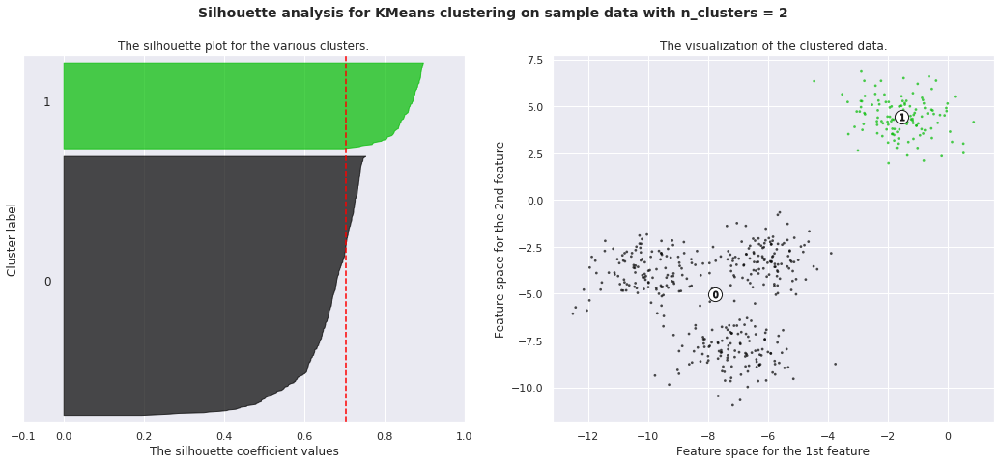

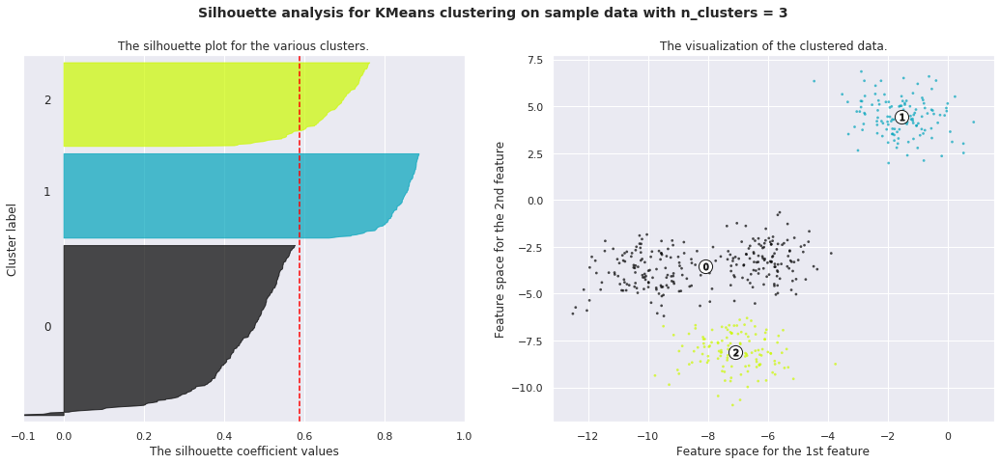

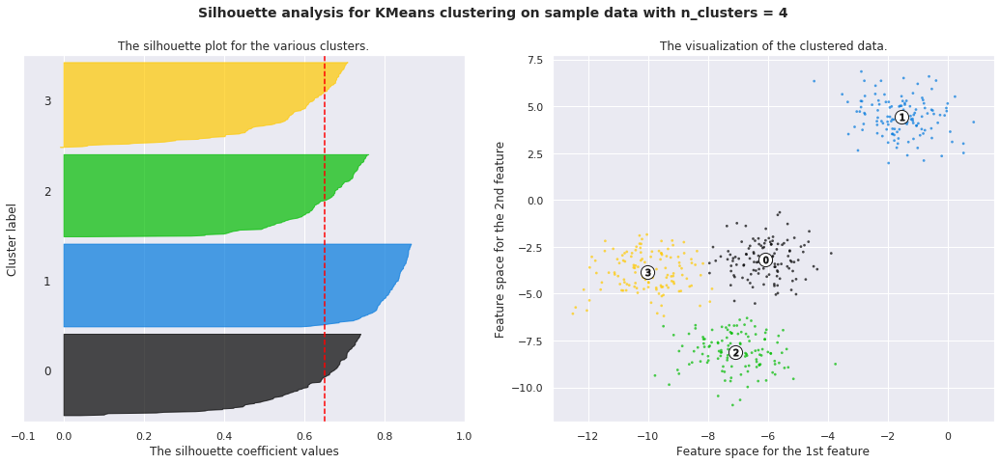

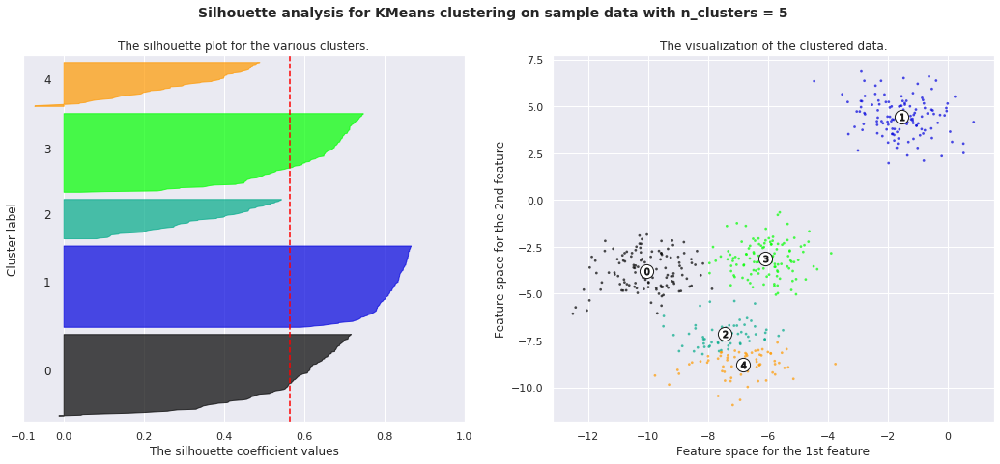

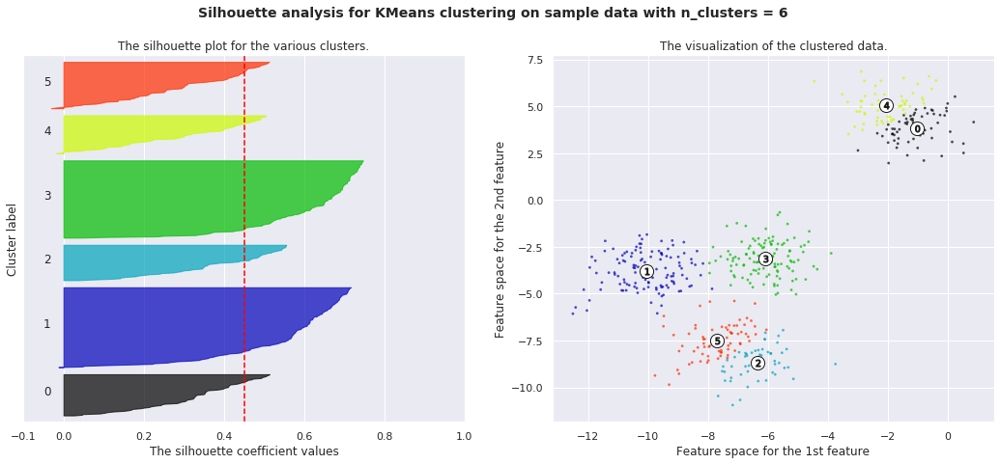

In [ ]:
#@title #Silhouette analysis
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

print(__doc__)

# Generating the sample data from make_blobs
# This particular setting has one distinct cluster and 3 clusters placed close
# together.
X, y = make_blobs(n_samples=500,
                  n_features=2,
                  centers=4,
                  cluster_std=1,
                  center_box=(-10.0, 10.0),
                  shuffle=True,
                  random_state=1)  # For reproducibility

range_n_clusters = [2, 3, 4, 5, 6]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

#Initialization

In practice initialization of clusters/centroids may be more influential and important that the method choice.

The task of initialization is to form the initial $k$ clusters. Many initializing techniques have been proposed, from simple methods, such as choosing the first $k$ data points, **Forgy initialization** (randomly choosing $k$ data points in the dataset) and **Random partitions** (dividing the data points randomly into $k$ subsets), to more sophisticated methods, such as density-based initialization, Intelligent initialization, **F**urthest **F**irst initialization (FF works by picking the first center point randomly, then adding more center points which are furthest from existing ones), and **S**ubset **F**urthest-**F**irst (SFF)initialization. For more details, refer to paper Steinley and Brusco  which provides a survey and comparison of over 12 initialization methods.

In [ ]:
#@title #Simplest k-Means Visualization
import plotly.graph_objects as go
import numpy as np

def get_lines(X, centers, labels):
  classes = np.unique(labels)
  lines = []
  for c in classes:
    from_pts = centers[c]
    to_pts = X[labels == c]
    for p in to_pts:
      lines = lines + [from_pts, p, np.array([None, None])]
  return np.array(lines)

frame_num = len(history)

fig = dict(
    layout = dict(
        width=600, height=600, autosize=False,
        showlegend = False,
        xaxis1 = {'domain': [0.0, 1.0]},
        yaxis1 = {'domain': [0.0, 1.0]},
        title  = 'Simplest k-Means',
        margin = {'t': 50, 'b': 50, 'l': 50, 'r': 50},
        updatemenus = [{'buttons': [{'args': [[k for k in range(frame_num)],
                                              {'frame': {'duration': 500.0, 'redraw': True},
                                               'fromcurrent': False, 'transition': {'duration': 0, 'easing': 'linear'}}],
                                     'label': 'Play',
                                     'method': 'animate'},
                                    {'args': [[None], {'frame': {'duration': 0, 'redraw': True},
                                                       'mode': 'immediate',
                                                       'transition': {'duration': 0}}
                                              ],
                                     'label': 'Pause',
                                     'method': 'animate'
                                     }
                                    ],
                        'direction': 'left',
                        'pad': {'r': 10, 't': 85},
                        'showactive': True,
                        'type': 'buttons', 'x': 0.1, 'y': 0, 'xanchor': 'right', 'yanchor': 'top'}],
        sliders = [{'yanchor': 'top',
                    'xanchor': 'left',
                    'currentvalue': {'font': {'size': 16}, 'prefix': 'Step: ', 'visible': True, 'xanchor': 'right'},
                    'transition': {'duration': 0.0},
                    'pad': {'b': 10, 't': 50},
                    'len': 0.9,
                    'x': 0.1,
                    'y': 0,
                    'steps': [{'args': [[k], {'frame': {'duration': 500.0, 'easing': 'linear', 'redraw': True},
                                              'transition': {'duration': 0, 'easing': 'linear'}}
                                        ],
                               'label': k,
                               'method': 'animate'} for k in range(frame_num)
                    ]}],
        #images = [{'source' : image_base64,
        #          'xref': 'x', 'yref': 'y',
        #          'sizing': 'stretch',
        #          'sizex': x_max - x_min, 'sizey': y_max - y_min,
        #          'layer': 'below', 'opacity':1.0,
        #          'x': x_min, 'y': y_max}]
    ),
    data = [
        {'type': 'scatter', 'name': 's2', 'x': X[:, 0], 'y': X[:, 1], 'mode': 'markers', 
         'marker': {'size': 4, 'colorscale': 'Viridis', 'color':labels}
        },
        {'type': 'scatter', 'name': 's2', 'x': centers[:, 0], 'y': centers[:, 1], 'mode': 'markers', 
         'marker': {'size': 15, 'colorscale': 'Viridis', 'color':[i for i in range(len(centers))]}
        },
        {'type': 'scatter', 'name': 's2', 'x': get_lines(X, centers, labels)[:, 0], 'y': get_lines(X, centers, labels)[:, 1], 'mode': 'lines', 
         'line': {'color': 'rgb(0,0,0)', 'width': 1}, 'opacity': 0.2
        }
    ],
    frames=[
        {'name': str(k),
         'data': [
            {'type': 'scatter', 'name': 's2', 'x': X[:, 0], 'y': X[:, 1], 'mode': 'markers', 
             'marker': {'size': 4, 'colorscale': 'Viridis', 'color':history[k][1]}
            },
            {'type': 'scatter', 'name': 's2', 'x': history[k][0][:, 0], 'y': history[k][0][:, 1], 'mode': 'markers', 
             'marker': {'size': 15, 'colorscale': 'Viridis', 'color':[i for i in range(len(centers))]}
            },
            {'type': 'scatter', 'name': 's2', 'x': get_lines(X, history[k][0], history[k][1])[:, 0], 
             'y': get_lines(X, history[k][0], history[k][1])[:, 1], 
             'mode': 'lines', 'line': {'color': 'rgb(0,0,0)', 'width': 1}, 'opacity': 0.2
            }
         ]} for k in range(frame_num) ]
)
#plot(fig, auto_open=False)
f = go.Figure(fig)
f.show()

Actually basic $k$-means is so simple it could be implemented in a couple of lines

In [1]:
# a very basic implementation of k-means

from sklearn.metrics import pairwise_distances_argmin
import numpy as np

def find_clusters(X, initial_centers, callback):
  history = []
  centers = initial_centers
  n_clusters = len(initial_centers)

  while True:
    # Assign labels based on closest center
    labels = pairwise_distances_argmin(X, centers)

    # Find new centers from means of points
    # Watch empty clusters!
    new_centers = []
    for i in range(n_clusters):
      if len(X[labels == i]) > 0:
        new_centers.append(X[labels == i].mean(0))
      else:
        new_centers.append(centers[i])
    new_centers = np.array(new_centers)

    callback(centers, labels)
    # Check for convergence
    if np.all(centers == new_centers):
      break
    centers = new_centers

  return centers, labels

In [2]:
#@title Custom k-means on 2D points


import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib import cm
import seaborn as sns
from sklearn.metrics import pairwise_distances_argmin
        
def plot_clusters(X, y, center):
  sns.set();
  fig = plt.figure(figsize=(10,10))
  ax = fig.gca()
  ax.tick_params(axis="y",direction="in", pad=-40)
  ax.tick_params(axis="x",direction="in", pad=-15)
  ax.set_xticks(np.arange(-.75, 1, .25))
  ax.set_yticks(np.arange(-.75, 1, .25))
  ax.set_xlim([-1, 1])
  ax.set_ylim([-1, 1])

  n_classes = int(len(center))
  ax.scatter(X[:, 0], X[:, 1], c=y, s=150, cmap='viridis', vmin=0.0, vmax=(n_classes+0.5))
  # see https://matplotlib.org/3.1.1/api/markers_api.html
  sq_clrs=[float(x)+0.1 for x in range(n_classes)]
  ax.scatter(center[:, 0], center[:, 1], cmap='viridis', c=np.array(sq_clrs), marker='s', s=200, vmin=0.0, vmax=(n_classes+0.5));

  # fit the estimator
  xx, yy = np.meshgrid(np.linspace(-1.0, 1.0, num=700), np.linspace(-1.0, 1.0, num=700))
  Z = pairwise_distances_argmin(np.c_[xx.ravel(), yy.ravel()], center)

  # Put the result into a color plot
  n_classes = len(center)
  Z = Z.reshape(xx.shape)
  contours = ax.contourf(xx, yy, Z, alpha=0.3, levels=np.arange(n_classes + 1) - 0.5, cmap='viridis', zorder=1)
  
  plt.close(fig)

  return fig

import base64
import io

def figure_to_base64(fig):
  buf = io.BytesIO()
  fig.savefig(buf, format='png', bbox_inches='tight', pad_inches=0);
  image_base64 = base64.b64encode(buf.getvalue()).decode('utf-8').replace('\n', '')
  buf.close()
  return image_base64

def get_lines(X, centers, labels):
  classes = np.unique(labels)
  lines = []
  for c in classes:
    from_pts = centers[c]
    to_pts = X[labels == c]
    for p in to_pts:
      lines = lines + [from_pts, p, np.array([None, None])]
  return np.array(lines)

import json
from IPython.display import display, clear_output

history = []
def collect_history(centers, labels):
  global history
  history += [[centers.tolist(), labels.tolist()]]

def invoke(pts):
  data = np.array(pts).reshape((-1, 3))
  data_points = data[data[:,2] == 0][:,:2]
  data_centers = data[data[:,2] == 1][:,:2]
  X = data_points / 300.0 - 1.0
  X[:, 1] *= -1.0
  i_C = data_centers / 300.0 - 1.0
  i_C[:, 1] *= -1.0
  global history
  history = []
  centers, labels = find_clusters(X, i_C, collect_history)
  figr = plot_clusters(X, labels, centers)
  image_base64 = figure_to_base64(figr)

  history = np.array(history)
  centers_history = history[:, 0]
  labels_history  = history[:, 1]
  connections_history = [get_lines(X, c, l) for c,l in zip(centers_history, labels_history)]
  connections_X = [c[:, 0].tolist() for c in connections_history]
  connections_Y = [c[:, 1].tolist() for c in connections_history]


  centers[:, 1] *= -1.0
  centers = (centers + 1.0) * 300.0
  c_x = [[c[0] for c in center] for center in centers_history]
  c_y = [[c[1] for c in center] for center in centers_history]

  return IPython.display.JSON({'image': image_base64, 
                               'centers': centers.tolist(), 
                               'labels_history': labels_history.tolist(),
                               'conn_x_hist': connections_X,
                               'conn_y_hist': connections_Y,
                               'pts_x': X[:, 0].tolist(),
                               'pts_y': X[:, 1].tolist(),
                               'c_x': c_x,
                               'c_y': c_y}) 


import IPython
from google.colab import output

main_str = '''
  <script src="https://cdn.plot.ly/plotly-latest.min.js"></script> 
  <script type="application/javascript">
  
    var active_pt = null;
    var all_pts = [];
    var ptR = 10.0;
    var params = null;
    var debug_txt = "";
    var bg_image = new Image();

    function is_close(pt1, pt2) {
      return   (pt1[0] - pt2[0])*(pt1[0] - pt2[0])
            +  (pt1[1] - pt2[1])*(pt1[1] - pt2[1])
            <= ptR*ptR;
    }
  
    function circ(ctx, pos) {
      ctx.beginPath();
      ctx.fillStyle = 'rgba(128, 128, 128, 0.5)';
      if (pos[2] == 0) {
          ctx.arc(pos[0], pos[1], ptR, 0.0, 2.0 * Math.PI, 0);
          ctx.fill();
      } else {
          ctx.fillRect(pos[0] - ptR, pos[1] - ptR, 2 * ptR, 2 * ptR);
      }
    }
    
    
    function draw() {
      var canvas = document.getElementById('canvas');
      if (canvas.getContext) {
        var ctx = canvas.getContext('2d');
        
        ctx.clearRect(0, 0, canvas.width, canvas.height); // cleanup before start
        ctx.drawImage(bg_image, 0, 0, 600, 600);
        ctx.strokeRect(0, 0, 600, 600); // field
        
        ctx.font = '20px serif';
        ctx.fillStyle = 'black';
        ctx.fillText(debug_txt, 200, 200);
        
        if (active_pt) {
          circ(ctx, active_pt);
        }
        all_pts.forEach(function (item, index) {
          circ(ctx, item);
        });

      }
    }
    
    var timer

    function get_state() {
      var rates = document.getElementsByName('rate');
      for(var i = 0; i < rates.length; i++)
        if(rates[i].checked)
          return rates[i].value;
      return "none";
    }

    
    function mdown_handle(evt) {
      evt.stopPropagation();
      x = evt.offsetX;
      y = evt.offsetY;
      state = get_state();
      if (state == "add") {
        if (x < 600)
            all_pts.push([x, y, 0]);
        return;
      }
      if (state == "addC") {
        if (x < 600)
            all_pts.push([x, y, 1]);
        return;
      }

      idx = -1;
      all_pts.forEach(function (item, index) {
        if (is_close([x,y], [item[0], item[1]])) {
          idx = index;
        }
      });
      if (idx <= -1)
          return;
      if (state == "move") {
        active_pt = all_pts[idx];
        all_pts.splice(idx, 1);
      }
      if (state == "del")
          all_pts.splice(idx, 1);
    }
    
    function mmove_handle(evt) {
      evt.stopPropagation();
      if (get_state() != "move")
          return;
      x = evt.offsetX;
      y = evt.offsetY;
      if (active_pt) {
        active_pt[0] = x;
        active_pt[1] = y;
      }
    }
    
    function mup_handle(evt) {
      evt.stopPropagation();
      x = evt.offsetX;
      y = evt.offsetY;
      if (x >= 600) {
        active_pt = null;
      }
      if (active_pt) {
        all_pts.push(active_pt);
        active_pt = null;
      }
    }
    
    function clear_field() {
      active_pt = null;
      all_pts = [];
    }


   function plot_history(labels, ctr_x, ctr_y, conns_x, conns_y, p_x, p_y)
   {
     cell_for_plot = document.getElementById('for_plotly_plot');

colors = [];
for (var i = 0; i < ctr_x[0].length; i++)
  colors.push(i); 

steps_data = [];
frame_data = [];
idx_s = []
for (var k = 0; k < labels.length; k++) {
  steps_data.push({'args': [[k], {
                                    'frame': {'duration': 500.0, 'easing': 'linear', 'redraw': true},
                                    'transition': {'duration': 0, 'easing': 'linear'},
                                    'fromcurrent': false
                                 }
                           ],
                   'label': k,
                   'method': 'animate'
                 }
               );
  idx_s.push(k);
  frame_data.push({'name': k,
         'data': [
            {'type': 'scatter', 'name': 's2', 'x': p_x, 'y': p_y, 'mode': 'markers', 
             'marker': {'size': 4, 'colorscale': 'Viridis', 'color': labels[k]}
            },
            {'type': 'scatter', 'name': 's2', 'x': ctr_x[k], 'y': ctr_y[k], 'mode': 'markers', 
             'marker': {'size': 15, 'colorscale': 'Viridis', 'color': colors}
            },
            {'type': 'scatter', 'name': 's2', 'x': conns_x[k], 'y': conns_y[k], 
             'mode': 'lines', 'line': {'color': 'rgb(0,0,0)', 'width': 1}, 'opacity': 0.2
            }
         ]}
        );
}
just_data = [
            {'type': 'scatter', 'name': 's2', 'x': p_x, 'y': p_y, 'mode': 'markers', 
             'marker': {'size': 4, 'colorscale': 'Viridis', 'cmin': 0, 'cmax': colors.length, 'color': labels[0]}
            },
            {'type': 'scatter', 'name': 's2', 'x': ctr_x[0], 'y': ctr_y[0], 'mode': 'markers', 
             'marker': {'size': 15, 'colorscale': 'Viridis', 'cmin': 0, 'cmax': colors.length, 'color': colors, 'symbol': 'square'}
            },
            {'type': 'scatter', 'name': 's2', 'x': conns_x[0], 'y': conns_y[0], 
             'mode': 'lines', 'line': {'color': 'rgb(0,0,0)', 'width': 1}, 'opacity': 0.2
            }
];

   var layout = {
        width: 600, height: 600, autosize: false,
        showlegend: false,
        xaxis1: {'domain': [0.0, 1.0], 'range': [-1.0, 1.0]},
        yaxis1: {'domain': [0.0, 1.0], 'range': [-1.0, 1.0]},
        title: 'Simplest k-Means',
        margin: {'t': 50, 'b': 50, 'l': 50, 'r': 50},
        updatemenus: [{'buttons': [{'args': [idx_s,
                                              {'frame': {'duration': 500.0, 'redraw': true},
                                               'fromcurrent': false, 'transition': {'duration': 0, 'easing': 'linear'}
                                              }
                                            ],
                                    'label': 'Play',
                                    'method': 'animate'
                                   },
                                   {'args': [[null], {'frame': {'duration': 0, 'redraw': true},
                                                      'mode': 'immediate',
                                                      'transition': {'duration': 0}
                                                     }
                                            ],
                                    'label': 'Pause',
                                    'method': 'animate'
                                   }
                                  ],
                       'direction': 'left',
                       'pad': {'r': 10, 't': 85},
                       'showactive': true,
                       'type': 'buttons', 'x': 0.1, 'y': 0, 'xanchor': 'right', 'yanchor': 'top'
                      }
                    ],
        sliders: [{'yanchor': 'top',
                   'xanchor': 'left',
                   'currentvalue': {'font': {'size': 16}, 'prefix': 'Step: ', 'visible': true, 'xanchor': 'right'},
                   'transition': {'duration': 0.0},
                   'pad': {'b': 10, 't': 50},
                   'len': 0.9,
                   'x': 0.1,
                   'y': 0,
                   'steps': steps_data
                   }
                  ],
    };

Plotly.newPlot(cell_for_plot, {data: just_data, frames: frame_data, layout: layout});
   }


    async function calculate() {
      if (!all_pts)
        return;
      var merged = [].concat.apply([], all_pts);
      const result = await google.colab.kernel.invokeFunction('notebook.InvSVM', [merged], {});
      params = result.data['application/json'];
            
      bg_image.src = 'data:image/  png;base64,' + params.image;

      idx = 0;
      all_pts.forEach(function (item, index) {
        if (item[2] == 1) {
          item[0] = params.centers[idx][0];
          item[1] = params.centers[idx][1];
          idx++;
        }
      });

      plot_history(params.labels_history, params.c_x, params.c_y, params.conn_x_hist, params.conn_y_hist, params.pts_x, params.pts_y);
    }

 </script>

<div id="everything" style="height:600px;">
<div id="for_plotly_plot" style="position:absolute; top:0px; left:0px; height:600px; width:600px;">
</div>
<div id="custom_controls" style="position:absolute; top:0px; left:600px;">
  <canvas id="canvas" width="800" height="600" 
    onmousedown="mdown_handle(event)"
    onmousemove="mmove_handle(event)"
    onmouseup="mup_handle(event)"></canvas>
  <div style="position:absolute; top:200px; left:625px;">
   <div style="border-style: solid;">
    <input type="radio" id="r1" name="rate" value="add" checked="checked"> 
    <label for="r1">Add data point</label>
    <br>
    <input type="radio" id="r0" name="rate" value="addC">
    <label for="r0">Add cluster center</label>
    <br>
    <input type="radio" id="r2" name="rate" value="move">
    <label for="r2">Move</label>
    <br>
    <input type="radio" id="r3" name="rate" value="del">
    <label for="r3">Delete</label>
    <br>
    <button type="button" onclick="clear_field();">
      Clear
    </button>
   </div>
   <br><br>
    <button type="button" onclick="calculate();">
      Clusterize
    </button>
  </div>
</div>
<div>
  
<script>
function init()
{
  timer = setInterval(draw, 10);
}

init();
</script>
'''

display(IPython.display.HTML(main_str))
output.register_callback('notebook.InvSVM', invoke)

##Caveats of $k$-means

* The globally optimal result may not be achieved. Here is the simplest example

In [ ]:
#@title ##Simple caveat
%%html

<?xml version="1.0" encoding="UTF-8" standalone="no"?>
<!-- Created with Inkscape (http://www.inkscape.org/) -->

<svg width="250mm" height="67mm" version="1.1" viewBox="0 0 343.06 109.47" xmlns="http://www.w3.org/2000/svg" xmlns:ns0="http://www.iki.fi/pav/software/textext/">
 <g transform="translate(92.188 4.4811)">
  <g>
   <g fill-opacity=".57005">
    <ellipse cx="231.48" cy="80.332" rx="2.6458" ry="2.4568"/>
    <ellipse cx="232.24" cy="49.566" rx="2.6458" ry="2.4568"/>
    <ellipse cx="175.92" cy="79.993" rx="2.6458" ry="2.4568"/>
    <ellipse cx="176.2" cy="49.448" rx="2.6458" ry="2.5277"/>
    <ellipse cx="35.341" cy="46.969" rx="2.6458" ry="2.4568"/>
    <ellipse cx="35.152" cy="77.585" rx="2.6458" ry="2.4568"/>
    <ellipse cx="97.707" cy="47.536" rx="2.6458" ry="2.4568"/>
    <ellipse cx="96.951" cy="78.152" rx="2.6458" ry="2.4568"/>
   </g>
   <g id="content" transform="matrix(.83582 0 0 -.83582 -174.63 716.52)" fill-rule="evenodd" stroke="#000" stroke-miterlimit="10.433" ns0:preamble="default_packages.tex" ns0:text="$$\\text{Local minimum}$$\n$$\\text{Global minimum}$$\n" xml:space="preserve"><g><g fill-opacity=".78431" stroke-width="0"><path d="m252.47 853.31h-0.34686c-0.15262-1.4013-0.34686-3.1217-2.7748-3.1217h-1.1377c-0.65209 0-0.67984 0.0971-0.67984 0.55497v7.3395c0 0.47172 0 0.66596 1.3181 0.66596h0.45785v0.43011c-0.49948-0.0555-1.762-0.0555-2.3309-0.0555-0.54109 0-1.6233 0-2.095 0.0555v-0.43011h0.31911c1.0683 0 1.0961-0.15261 1.0961-0.65209v-7.2562c0-0.49947-0.0277-0.65209-1.0961-0.65209h-0.31911v-0.4301h7.2007z"/><path d="m259.58 852.72v0.15262l-0.0139 0.16649-0.0277 0.16649-0.0278 0.15262-0.0277 0.15262-0.0416 0.15261-0.111 0.30524-0.0555 0.13874-0.1388 0.27748-0.0833 0.12487-0.0832 0.12487-0.0971 0.12487-0.0971 0.11099-0.0971 0.111-0.111 0.11099-0.11099 0.111-0.11099 0.0832-0.12487 0.0971-0.12487 0.0833-0.12487 0.0832-0.12487 0.0694-0.13874 0.0694-0.13874 0.0555-0.13875 0.0416-0.15261 0.0555-0.13874 0.0277-0.15262 0.0277-0.15262 0.0278-0.15261 0.0139h-0.15262l-0.0139-0.30523c0.5966 0 1.1932-0.30524 1.5539-0.88796 0.36073-0.59659 0.36073-1.4013 0.36073-1.9146 0-0.49947 0-1.2487-0.30523-1.8592-0.30524-0.61047-0.9157-1.0128-1.5955-1.0128-0.59659 0-1.2071 0.29136-1.5817 0.9157-0.34685 0.61047-0.34685 1.4568-0.34685 1.9563 0 0.52722 0 1.2764 0.33298 1.8869 0.3746 0.62434 1.0267 0.9157 1.5817 0.9157l0.0139 0.30523c-1.7343 0-3.0801-1.4984-3.0801-3.2188 0-1.7898 1.4429-3.1078 3.0662-3.1078 1.6649 0 3.0662 1.3458 3.0662 3.1078z"/><path d="m261.98 852.77v0.1942l0.0139 0.11099v0.1804l0.0278 0.1942 0.0139 0.0833 0.0417 0.2496 0.0139 0.0833 0.0416 0.13874 0.0416 0.15262 0.0416 0.12486 0.0555 0.13875 0.0416 0.11099 0.0694 0.111 0.0555 0.11099 0.0694 0.0971 0.0555 0.0832 0.0694 0.0833 0.0832 0.0833 0.0694 0.0694 0.0694 0.0555 0.0832 0.0555 0.0694 0.0555 0.0833 0.0555 0.0832 0.0416 0.0694 0.0278 0.1664 0.0554 0.0694 0.0277 0.0832 0.0139 0.1388 0.0278h0.1526c0.12487 0 0.98507-0.0139 1.4707-0.51334-0.56884-0.0416-0.65209-0.44398-0.65209-0.62434 0-0.36073 0.24974-0.63822 0.63822-0.63822 0.36073 0 0.63821 0.23586 0.63821 0.65209 0 0.92957-1.0544 1.4707-2.1089 1.4707-1.7343 0-3.0107-1.4845-3.0107-3.1911 0-1.7759 1.3736-3.1356 2.983-3.1356 1.8453 0 2.2892 1.651 2.2892 1.7898s-0.13874 0.13874-0.18036 0.13874c-0.12487 0-0.15262-0.0555-0.18037-0.13874-0.40235-1.2764-1.2903-1.4429-1.8036-1.4429-0.73534 0-1.9563 0.59659-1.9563 2.8165z"/><path d="m271.11 850.8 0.0139-0.0416v-0.0555l0.0139-0.0555 0.0139-0.0416 0.0278-0.111 0.0139-0.0416 0.0139-0.0555 0.0277-0.0555 0.0139-0.0416 0.0278-0.0416 0.0277-0.0555 0.0277-0.0416 0.0278-0.0416 0.0416-0.0416 0.0277-0.0416 0.0278-0.0416 0.0416-0.0416 0.0416-0.0277 0.0416-0.0416 0.0416-0.0278 0.0832-0.0554 0.0555-0.0277 0.0416-0.0139 0.0555-0.0278 0.0416-0.0139 0.1665-0.0417h0.1249c0.29136 0 1.1377 0.19424 1.1377 1.3042v0.77696h-0.34686v-0.77696c0-0.79083-0.34686-0.87408-0.49947-0.87408-0.45785 0-0.51335 0.61047-0.51335 0.67984v2.761c0 0.58272 0 1.1238-0.49947 1.6233-0.5411 0.54109-1.2348 0.76308-1.9008 0.76308-1.1238 0-2.0811-0.65209-2.0811-1.5539 0-0.41622 0.27748-0.65209 0.63821-0.65209 0.38848 0 0.63822 0.27749 0.63822 0.63822 0 0.16649-0.0694 0.61047-0.70759 0.63822 0.37461 0.47172 1.0406 0.62434 1.4846 0.62434 0.67983 0 1.4707-0.5411 1.4707-1.762v-2.1783c0-1.3042-0.99895-1.7759-1.6233-1.7759-0.66596 0-1.2348 0.48559-1.2348 1.1654 0 0.76309 0.58272 1.9008 2.8581 1.984v0.29136c-0.70759-0.0416-1.6788-0.0832-2.539-0.4856-1.0406-0.47172-1.3874-1.1932-1.3874-1.8036 0-1.1099 1.3458-1.4568 2.2199-1.4568 0.90183 0 1.54 0.55497 1.8037 1.1932z"/><path d="m275.87 859.32-1.9979-0.13874v-0.43011c0.9712 0 1.0822-0.0971 1.0822-0.77695v-7.173c0-0.61047-0.15261-0.61047-1.0822-0.61047v-0.4301c0.45785 0.0139 1.1932 0.0416 1.54 0.0416 0.34686 0 1.0128-0.0277 1.5262-0.0416v0.4301c-0.9157 0-1.0683 0-1.0683 0.61047z"/><path d="m283.37 854.51v-3.7044c0-0.61047-0.15261-0.61047-1.0683-0.61047v-0.4301c0.4856 0.0139 1.1793 0.0416 1.5539 0.0416 0.36073 0 1.0822-0.0277 1.5539-0.0416v0.4301c-0.92958 0-1.0822 0-1.0822 0.61047v2.539c0 1.4429 0.98507 2.206 1.873 2.206 0.87408 0 1.0267-0.73533 1.0267-1.5262v-3.2188c0-0.61047-0.15262-0.61047-1.0822-0.61047v-0.4301c0.4856 0.0139 1.1932 0.0416 1.5539 0.0416s1.0822-0.0277 1.5539-0.0416v0.4301c-0.92958 0-1.0822 0-1.0822 0.61047v2.539c0 1.4429 0.98508 2.206 1.873 2.206 0.87408 0 1.0267-0.73533 1.0267-1.5262v-3.2188c0-0.61047-0.15261-0.61047-1.0822-0.61047v-0.4301c0.4856 0.0139 1.1932 0.0416 1.5678 0.0416 0.36073 0 1.0822-0.0277 1.54-0.0416v0.4301c-0.72146 0-1.0544 0-1.0683 0.41623v2.6222c0 1.1932 0 1.6233-0.43011 2.1089-0.19423 0.23586-0.65208 0.51335-1.4568 0.51335-1.1654 0-1.7759-0.81859-2.0118-1.3458-0.19424 1.1932-1.2071 1.3458-1.8314 1.3458-1.0128 0-1.6649-0.5966-2.0534-1.4429v1.4429l-1.9424-0.15262v-0.4301c0.95732 0 1.0683-0.0971 1.0683-0.76309z"/><path d="m295.82 855.85-1.9285-0.15262v-0.4301c0.90182 0 1.0128-0.0833 1.0128-0.74921v-3.7183c0-0.61047-0.13875-0.61047-1.0683-0.61047v-0.4301c0.44398 0.0139 1.1793 0.0416 1.5123 0.0416 0.4856 0 0.9712-0.0277 1.4429-0.0416v0.4301c-0.9157 0-0.97119 0.0694-0.97119 0.59659z"/><path d="m295.87 858.25v0.1248l-0.0139 0.0277v0.0416l-0.0139 0.0416-0.0139 0.0277-0.0139 0.0416-0.0139 0.0277-0.0139 0.0278-0.0278 0.0277-0.0139 0.0416-0.0278 0.0277-0.0139 0.0278-0.0278 0.0139-0.0277 0.0277-0.0139 0.0277-0.0278 0.0139-0.0277 0.0277-0.0416 0.0139-0.0277 0.0277-0.0554 0.0278-0.0278 0.0139-0.0416 0.0139h-0.0278l-0.0416 0.0139-0.0277 0.0139h-0.0693l-0.0416 0.0139h-0.0278c-0.4301 0-0.73533-0.37461-0.73533-0.73534 0-0.3746 0.30523-0.73533 0.73533-0.73533 0.37461 0 0.72146 0.29135 0.72146 0.73533z"/><path d="m298.73 854.51v-3.7044c0-0.61047-0.15262-0.61047-1.0683-0.61047v-0.4301c0.47173 0.0139 1.1793 0.0416 1.5539 0.0416 0.36073 0 1.0822-0.0277 1.5539-0.0416v0.4301c-0.92957 0-1.0822 0-1.0822 0.61047v2.539c0 1.4429 0.98508 2.206 1.873 2.206 0.87407 0 1.0128-0.73533 1.0128-1.5262v-3.2188c0-0.61047-0.13875-0.61047-1.0683-0.61047v-0.4301c0.4856 0.0139 1.1932 0.0416 1.5539 0.0416s1.0822-0.0277 1.5539-0.0416v0.4301c-0.72146 0-1.0683 0-1.0822 0.41623v2.6222c0 1.1932 0 1.6233-0.4301 2.1089-0.19424 0.23586-0.63822 0.51335-1.4429 0.51335-1.0128 0-1.6649-0.5966-2.0534-1.4429v1.4429l-1.9424-0.15262v-0.4301c0.95733 0 1.0683-0.0971 1.0683-0.76309z"/><path d="m307.35 855.85-1.9424-0.15262v-0.4301c0.90183 0 1.0267-0.0833 1.0267-0.74921v-3.7183c0-0.61047-0.15262-0.61047-1.0822-0.61047v-0.4301c0.44397 0.0139 1.1932 0.0416 1.5262 0.0416 0.48559 0 0.97119-0.0277 1.429-0.0416v0.4301c-0.90182 0-0.95732 0.0694-0.95732 0.59659z"/><path d="m307.4 858.25v0.0416l-0.0139 0.0416v0.0416l-0.0139 0.0277v0.0416l-0.0139 0.0416-0.0139 0.0277-0.0139 0.0416-0.0139 0.0277-0.0139 0.0278-0.0139 0.0277-0.0277 0.0416-0.0139 0.0277-0.0278 0.0278-0.0277 0.0139-0.0139 0.0277-0.0278 0.0277-0.0278 0.0139-0.0277 0.0277-0.0278 0.0139-0.0277 0.0277-0.0416 0.0139-0.0554 0.0278-0.0416 0.0139h-0.0277l-0.0277 0.0139-0.0416 0.0139h-0.0693l-0.0416 0.0139h-0.0277c-0.4301 0-0.73533-0.37461-0.73533-0.73534 0-0.3746 0.30523-0.73533 0.73533-0.73533 0.38848 0 0.73534 0.29135 0.73534 0.73533z"/><path d="m310.26 854.51v-3.7044c0-0.61047-0.15261-0.61047-1.0822-0.61047v-0.4301c0.4856 0.0139 1.1932 0.0416 1.5678 0.0416 0.34686 0 1.0683-0.0277 1.54-0.0416v0.4301c-0.92957 0-1.0822 0-1.0822 0.61047v2.539c0 1.4429 0.98507 2.206 1.873 2.206 0.87407 0 1.0267-0.73533 1.0267-1.5262v-3.2188c0-0.61047-0.15262-0.61047-1.0822-0.61047v-0.4301c0.4856 0.0139 1.1932 0.0416 1.5678 0.0416 0.36073 0 1.0683-0.0277 1.54-0.0416v0.4301c-0.9157 0-1.0683 0-1.0683 0.61047v2.539c0 1.4429 0.9712 2.206 1.8592 2.206 0.87408 0 1.0267-0.73533 1.0267-1.5262v-3.2188c0-0.61047-0.15262-0.61047-1.0822-0.61047v-0.4301c0.48559 0.0139 1.1932 0.0416 1.5678 0.0416 0.36073 0 1.0822-0.0277 1.5539-0.0416v0.4301c-0.72146 0-1.0683 0-1.0822 0.41623v2.6222c0 1.1932 0 1.6233-0.4301 2.1089-0.19424 0.23586-0.65209 0.51335-1.4568 0.51335-1.1654 0-1.762-0.81859-1.9979-1.3458-0.19424 1.1932-1.2209 1.3458-1.8453 1.3458-1.0128 0-1.6649-0.5966-2.0534-1.4429v1.4429l-1.9424-0.15262v-0.4301c0.9712 0 1.0822-0.0971 1.0822-0.76309z"/><path d="m325.27 850.86v-1.2487l1.9979 0.15262v0.4301c-0.97119 0-1.0822 0.0971-1.0822 0.76308v4.8976l-2.0395-0.15262v-0.4301c0.9712 0 1.0822-0.0971 1.0822-0.76309v-2.4557c0-1.1932-0.66596-2.1366-1.6788-2.1366-1.1516 0-1.207 0.65209-1.207 1.3597v4.5785l-2.0395-0.15262v-0.4301c1.0822 0 1.0822-0.0416 1.0822-1.2626v-2.0673c0-1.0683 0-2.3309 2.095-2.3309 0.77696 0 1.3874 0.38848 1.7898 1.2487z"/><path d="m329.06 854.51v-3.7044c0-0.61047-0.15261-0.61047-1.0683-0.61047v-0.4301c0.48559 0.0139 1.1793 0.0416 1.5539 0.0416 0.36073 0 1.0822-0.0277 1.5539-0.0416v0.4301c-0.92958 0-1.0822 0-1.0822 0.61047v2.539c0 1.4429 0.98507 2.206 1.873 2.206 0.87408 0 1.0267-0.73533 1.0267-1.5262v-3.2188c0-0.61047-0.15261-0.61047-1.0822-0.61047v-0.4301c0.4856 0.0139 1.1932 0.0416 1.5539 0.0416s1.0822-0.0277 1.5539-0.0416v0.4301c-0.92958 0-1.0822 0-1.0822 0.61047v2.539c0 1.4429 0.98508 2.206 1.873 2.206 0.87408 0 1.0267-0.73533 1.0267-1.5262v-3.2188c0-0.61047-0.15261-0.61047-1.0822-0.61047v-0.4301c0.4856 0.0139 1.1932 0.0416 1.5678 0.0416 0.36073 0 1.0822-0.0277 1.54-0.0416v0.4301c-0.70758 0-1.0544 0-1.0683 0.41623v2.6222c0 1.1932 0 1.6233-0.43011 2.1089-0.19424 0.23586-0.65209 0.51335-1.4568 0.51335-1.1654 0-1.7759-0.81859-2.0118-1.3458-0.18036 1.1932-1.2071 1.3458-1.8314 1.3458-1.0128 0-1.6649-0.5966-2.0534-1.4429v1.4429l-1.9424-0.15262v-0.4301c0.95732 0 1.0683-0.0971 1.0683-0.76309z"/><path d="m403.76 850.11 0.0274-0.0274 0.0136-0.0274 0.0274-0.0274 0.0136-0.0411 0.0274-0.0274 0.0274-0.0411 0.0274-0.0274 0.0274-0.0412 0.0411-0.0274 0.0274-0.0412 0.0549-0.0687 0.0686-0.0686 0.0686-0.0687 0.0412-0.0274 0.1234-0.1234 0.0274-0.0136 0.0274-0.0274 0.0412-0.0274 0.0274-0.0136 0.041-0.041 0.0274-0.0135h0.0136l0.0274-0.0136h0.0271c0.12344 0 0.12344 0.10979 0.12344 0.30187v2.3737c0 0.53509 0.0549 0.6037 0.94674 0.6037v0.42534c-0.50767-0.0136-1.2623-0.0412-1.6739-0.0412-0.53509 0-1.7013 0-2.1953 0.0412v-0.42534h0.43904c1.2212 0 1.2623-0.15094 1.2623-0.65859v-0.8644c0-1.523-1.7288-1.6465-2.113-1.6465-0.89185 0-3.5948 0.4665-3.5948 4.5278 0 4.075 2.6892 4.5278 3.5125 4.5278 1.4681 0 2.703-1.2211 2.9774-3.2244 0.0274-0.19208 0.0274-0.23324 0.21954-0.23324 0.21951 0 0.21951 0.0412 0.21951 0.32929v3.2244c0 0.23324 0 0.32928-0.15092 0.32928-0.0549 0-0.10977 0-0.21953-0.16464l-0.67231-1.0016c-0.43905 0.42533-1.18 1.1662-2.5383 1.1662-2.5383 0-4.761-2.1541-4.761-4.9531 0-2.7853 2.1953-4.9531 4.7885-4.9531 1.0016 0 2.0855 0.35674 2.552 1.1525z"/><path d="m408.79 858.71-1.962-0.15092v-0.42535c0.96046 0 1.0702-0.096 1.0702-0.75462v-7.0936c0-0.61743-0.15093-0.61743-1.0702-0.61743v-0.41162c0.45278 0.0136 1.1663 0.0412 1.5093 0.0412 0.34301 0 1.0153-0.0274 1.523-0.0412v0.41162c-0.91928 0-1.0702 0-1.0702 0.61743z"/><path d="m416.61 852.17v0.16464l-0.0136 0.16466-0.0135 0.15092-0.0274 0.16465-0.0412 0.15094-0.0411 0.15091-0.0413 0.15093-0.0549 0.13714-0.0686 0.15093-0.0686 0.13715-0.0686 0.12344-0.0824 0.13715-0.1648 0.24688-0.096 0.10977-0.10979 0.10978-0.096 0.10979-0.10978 0.096-0.12344 0.096-0.10978 0.096-0.12345 0.0824-0.12344 0.0686-0.13714 0.0824-0.13714 0.0549-0.13715 0.0549-0.13728 0.0549-0.13715 0.0411-0.15092 0.0411-0.15094 0.0274-0.30185 0.027-0.15092 0.0136-0.0136-0.30187c0.6037 0 1.1937-0.30184 1.5504-0.89183 0.35675-0.57628 0.35675-1.3721 0.35675-1.8934 0-0.48023 0-1.2211-0.30185-1.8248-0.30185-0.61742-0.90556-1.0016-1.5916-1.0016-0.58999 0-1.1937 0.28814-1.5642 0.90556-0.34302 0.60369-0.34302 1.4407-0.34302 1.9209 0 0.53509 0 1.276 0.3293 1.866 0.37046 0.63113 1.0153 0.91927 1.5642 0.91927l0.0136 0.30187c-1.7151 0-3.0322-1.4956-3.0322-3.1969 0-1.7562 1.4132-3.0597 3.0185-3.0597 1.6602 0 3.0322 1.3309 3.0322 3.0597z"/><path d="m419.36 854.39v4.322l-1.962-0.15092v-0.42535c0.94671 0 1.0702-0.096 1.0702-0.75462v-8.1226h0.32929c0.0136 0.0136 0.12345 0.20581 0.49394 0.83696 0.2058-0.31559 0.78208-0.98789 1.7974-0.98789l-0.055 0.30185c-0.61743 0-1.1114 0.3293-1.4407 0.82324-0.19208 0.28814-0.19208 0.3293-0.19208 0.57628v2.8127c0 0.24697 0 0.26069 0.15092 0.48022 0.53512 0.76835 1.2898 0.87811 1.619 0.87811 0.61743 0 1.1114-0.35673 1.4407-0.87811 0.35673-0.54884 0.39789-1.3309 0.39789-1.8934 0-0.49395-0.0412-1.3172-0.42534-1.9346-0.28813-0.42533-0.80951-0.8644-1.5504-0.8644l0.055-0.30185c1.6328 0 3.046 1.3309 3.046 3.0871 0 1.7288-1.3309 3.0871-2.895 3.0871-1.0702 0-1.6602-0.64486-1.8797-0.89182z"/><path d="m429.15 850.29 0.0136-0.055v-0.0411l0.0136-0.055 0.0136-0.0549 0.0135-0.0412 0.0136-0.055 0.0136-0.0549 0.0274-0.0412 0.0136-0.055 0.0274-0.0412 0.0135-0.0549 0.0274-0.0412 0.0274-0.0411 0.0274-0.0412 0.0411-0.0411 0.0274-0.0413 0.0411-0.0411 0.0274-0.0412 0.0411-0.0412 0.0413-0.0274 0.0411-0.0274 0.0412-0.0274 0.0411-0.0274 0.0549-0.0274 0.0412-0.0274 0.0549-0.0136 0.0549-0.0135 0.0411-0.0136 0.0549-0.0135 0.0686-0.0136h0.1098c0.28814 0 1.1251 0.19209 1.1251 1.2897v0.76836h-0.34302v-0.76836c0-0.7958-0.34301-0.87812-0.49394-0.87812-0.45278 0-0.50767 0.61743-0.50767 0.68603v2.7304c0 0.57627 0 1.0976-0.49393 1.6053-0.5351 0.53511-1.2211 0.75464-1.866 0.75464-1.1251 0-2.0718-0.64486-2.0718-1.5367 0-0.41161 0.27442-0.64487 0.63114-0.64487 0.38417 0 0.63115 0.27442 0.63115 0.61744 0 0.16464-0.0686 0.61741-0.69974 0.63114 0.37045 0.48022 1.0428 0.63115 1.4818 0.63115 0.65858 0 1.4406-0.5351 1.4406-1.7425v-2.1541c0-1.3035-0.97416-1.7562-1.5916-1.7562-0.67229 0-1.2348 0.46652-1.2348 1.1526 0 0.75462 0.57627 1.8797 2.8264 1.962v0.28815c-0.68603-0.0412-1.6465-0.0824-2.5109-0.49395-1.029-0.46649-1.3721-1.1662-1.3721-1.77 0-1.0977 1.3309-1.4407 2.1953-1.4407 0.90556 0 1.523 0.54883 1.7837 1.18z"/><path d="m433.86 858.71-1.9758-0.15092v-0.42535c0.96045 0 1.0702-0.096 1.0702-0.75462v-7.0936c0-0.61743-0.1509-0.61743-1.0702-0.61743v-0.41162c0.45278 0.0136 1.18 0.0412 1.523 0.0412 0.34304 0 1.0153-0.0274 1.523-0.0412v0.41162c-0.91927 0-1.0702 0-1.0702 0.61743z"/><path d="m441.3 853.94v-3.6497c0-0.61743-0.15091-0.61743-1.0702-0.61743v-0.41162c0.48022 0.0136 1.18 0.0412 1.5504 0.0412 0.34302 0 1.0565-0.0274 1.523-0.0412v0.41162c-0.91928 0-1.0702 0-1.0702 0.61743v2.5109c0 1.4132 0.97416 2.1816 1.8523 2.1816 0.86439 0 1.0153-0.74092 1.0153-1.5093v-3.1832c0-0.61743-0.15092-0.61743-1.0702-0.61743v-0.41162c0.48021 0.0136 1.18 0.0412 1.5504 0.0412 0.35673 0 1.0565-0.0274 1.523-0.0412v0.41162c-0.90555 0-1.0565 0-1.0565 0.61743v2.5109c0 1.4132 0.96043 2.1816 1.8386 2.1816 0.86439 0 1.0153-0.74092 1.0153-1.5093v-3.1832c0-0.61743-0.15092-0.61743-1.0702-0.61743v-0.41162c0.48022 0.0136 1.18 0.0412 1.5504 0.0412 0.35674 0 1.0702-0.0274 1.5367-0.0412v0.41162c-0.71348 0-1.0565 0-1.0702 0.41161v2.6069c0 1.1662 0 1.5916-0.42534 2.0855-0.19208 0.23327-0.64487 0.50766-1.4406 0.50766-1.1388 0-1.7425-0.82322-1.9758-1.3446-0.19209 1.1937-1.2074 1.3446-1.8248 1.3446-1.0016 0-1.6465-0.58997-2.0306-1.4269v1.4269l-1.9209-0.15091v-0.42535c0.96044 0 1.0702-0.096 1.0702-0.76835z"/><path d="m453.6 855.28-1.9209-0.15091v-0.42535c0.89184 0 1.0153-0.0824 1.0153-0.75463v-3.6634c0-0.61743-0.15094-0.61743-1.0702-0.61743v-0.41162c0.43906 0.0136 1.18 0.0412 1.5093 0.0412 0.48019 0 0.96041-0.0274 1.4132-0.0412v0.41162c-0.89183 0-0.94672 0.0687-0.94672 0.6037z"/><path d="m453.66 857.66v0.0412l-0.0136 0.0274v0.0412l-0.0136 0.0412v0.0411l-0.0136 0.0274-0.0136 0.0411-0.0136 0.0274-0.0136 0.0411-0.0272 0.0548-0.0274 0.0274-0.0136 0.0274-0.0548 0.0548-0.0137 0.0274-0.0274 0.0274-0.0274 0.0136-0.0274 0.0274-0.0274 0.0135-0.0274 0.0136-0.0412 0.0135-0.0274 0.0274-0.0274 0.0135h-0.0412l-0.0548 0.0272h-0.0412l-0.0412 0.0135h-0.0959c-0.42534 0-0.72719-0.37044-0.72719-0.71348 0-0.37044 0.30185-0.72718 0.72719-0.72718 0.38418 0 0.7272 0.28812 0.7272 0.72718z"/><path d="m456.48 853.94v-3.6497c0-0.61743-0.15091-0.61743-1.0702-0.61743v-0.41162c0.48021 0.0136 1.1662 0.0412 1.5504 0.0412 0.34303 0 1.0565-0.0274 1.523-0.0412v0.41162c-0.91928 0-1.0702 0-1.0702 0.61743v2.5109c0 1.4132 0.97417 2.1816 1.8523 2.1816 0.86441 0 1.0153-0.74092 1.0153-1.5093v-3.1832c0-0.61743-0.1509-0.61743-1.0702-0.61743v-0.41162c0.48023 0.0136 1.18 0.0412 1.5504 0.0412 0.35674 0 1.0565-0.0274 1.523-0.0412v0.41162c-0.69976 0-1.0428 0-1.0565 0.41161v2.6069c0 1.1662 0 1.5916-0.42533 2.0855-0.1921 0.23327-0.64486 0.50766-1.4407 0.50766-1.0016 0-1.6465-0.58997-2.0306-1.4269v1.4269l-1.9209-0.15091v-0.42535c0.96044 0 1.0702-0.096 1.0702-0.76835z"/><path d="m464.99 855.28-1.9209-0.15091v-0.42535c0.89183 0 1.0153-0.0824 1.0153-0.75463v-3.6634c0-0.61743-0.15093-0.61743-1.0702-0.61743v-0.41162c0.43907 0.0136 1.18 0.0412 1.5093 0.0412 0.48021 0 0.96044-0.0274 1.4269-0.0412v0.41162c-0.90555 0-0.96043 0.0687-0.96043 0.6037z"/><path d="m465.05 857.66v0.0686l-0.0135 0.0412v0.0412l-0.0136 0.0411-0.0136 0.0274v0.0411l-0.0135 0.0274-0.0274 0.0411-0.0137 0.0274-0.0135 0.0274-0.0136 0.0274-0.0548 0.0548-0.0136 0.0274-0.0548 0.0548-0.0274 0.0136-0.0274 0.0274-0.0274 0.0135-0.0274 0.0136-0.0274 0.0135-0.0412 0.0274-0.0274 0.0135h-0.0274l-0.0411 0.0136-0.0274 0.0136h-0.0411l-0.0274 0.0135h-0.1098c-0.42535 0-0.7272-0.37044-0.7272-0.71348 0-0.37044 0.30185-0.72718 0.7272-0.72718 0.38418 0 0.72719 0.28812 0.72719 0.72718z"/><path d="m467.87 853.94v-3.6497c0-0.61743-0.15094-0.61743-1.0702-0.61743v-0.41162c0.48019 0.0136 1.18 0.0412 1.5504 0.0412 0.35672 0 1.0565-0.0274 1.523-0.0412v0.41162c-0.90556 0-1.0565 0-1.0565 0.61743v2.5109c0 1.4132 0.96044 2.1816 1.8385 2.1816 0.86441 0 1.0153-0.74092 1.0153-1.5093v-3.1832c0-0.61743-0.15093-0.61743-1.0702-0.61743v-0.41162c0.48021 0.0136 1.18 0.0412 1.5504 0.0412 0.35674 0 1.0702-0.0274 1.5367-0.0412v0.41162c-0.91927 0-1.0702 0-1.0702 0.61743v2.5109c0 1.4132 0.97416 2.1816 1.8386 2.1816 0.86441 0 1.0153-0.74092 1.0153-1.5093v-3.1832c0-0.61743-0.15092-0.61743-1.0565-0.61743v-0.41162c0.46649 0.0136 1.1662 0.0412 1.5367 0.0412 0.35673 0 1.0702-0.0274 1.5367-0.0412v0.41162c-0.71347 0-1.0565 0-1.0702 0.41161v2.6069c0 1.1662 0 1.5916-0.42533 2.0855-0.1921 0.23327-0.64487 0.50766-1.4407 0.50766-1.1388 0-1.7425-0.82322-1.9758-1.3446-0.19208 1.1937-1.2074 1.3446-1.8248 1.3446-1.0016 0-1.6328-0.58997-2.0169-1.4269v1.4269l-1.9346-0.15091v-0.42535c0.96042 0 1.0702-0.096 1.0702-0.76835z"/><path d="m482.73 850.33v-1.2211l1.9758 0.15093v0.41162c-0.96044 0-1.0702 0.096-1.0702 0.76834v4.8434l-2.0169-0.15091v-0.42535c0.96045 0 1.0702-0.096 1.0702-0.76835v-2.4148c0-1.1937-0.64487-2.113-1.6465-2.113-1.1525 0-1.2074 0.63114-1.2074 1.3446v4.5278l-2.0169-0.15091v-0.42535c1.0702 0 1.0702-0.0412 1.0702-1.2486v-2.0444c0-1.0702 0-2.3051 2.0855-2.3051 0.76836 0 1.3583 0.38417 1.7562 1.2211z"/><path d="m486.48 853.94v-3.6497c0-0.61743-0.15092-0.61743-1.0702-0.61743v-0.41162c0.4802 0.0136 1.18 0.0412 1.5367 0.0412 0.37046 0 1.0702-0.0274 1.5367-0.0412v0.41162c-0.91927 0-1.0702 0-1.0702 0.61743v2.5109c0 1.4132 0.97417 2.1816 1.8523 2.1816 0.86441 0 1.0153-0.74092 1.0153-1.5093v-3.1832c0-0.61743-0.15092-0.61743-1.0702-0.61743v-0.41162c0.48022 0.0136 1.18 0.0412 1.5504 0.0412 0.35674 0 1.0702-0.0274 1.523-0.0412v0.41162c-0.90557 0-1.0565 0-1.0565 0.61743v2.5109c0 1.4132 0.97415 2.1816 1.8386 2.1816 0.86439 0 1.0153-0.74092 1.0153-1.5093v-3.1832c0-0.61743-0.15094-0.61743-1.0702-0.61743v-0.41162c0.48023 0.0136 1.18 0.0412 1.5504 0.0412 0.35674 0 1.0702-0.0274 1.5367-0.0412v0.41162c-0.71346 0-1.0565 0-1.0702 0.41161v2.6069c0 1.1662 0 1.5916-0.42533 2.0855-0.1921 0.23327-0.64487 0.50766-1.4407 0.50766-1.1525 0-1.7425-0.82322-1.9758-1.3446-0.1921 1.1937-1.2074 1.3446-1.8248 1.3446-1.0016 0-1.6465-0.58997-2.0306-1.4269v1.4269l-1.9209-0.15091v-0.42535c0.96043 0 1.0702-0.096 1.0702-0.76835z"/></g><g fill-opacity=".57005" stroke="none"><rect transform="scale(1,-1)" x="286.33" y="-740.28" width="8.6337" height="8.6337"/><g fill-rule="evenodd"><rect transform="scale(1,-1)" x="285.53" y="-830.62" width="8.6337" height="8.6337"/><rect transform="scale(1,-1)" x="396" y="-784.62" width="8.6337" height="8.6337"/><rect transform="scale(1,-1)" x="500.45" y="-785.72" width="8.6337" height="8.6337"/></g></g></g><path d="m251 801.2 38.532 24.622" fill="none" stroke="#00f" stroke-miterlimit="4.8041" stroke-width=".59821"/><g fill="#00f" fill-opacity=".97101" stroke="#00f" stroke-dashoffset="5.8091" stroke-linecap="square" stroke-linejoin="bevel" stroke-miterlimit="10.433" stroke-width=".31705"><ellipse transform="scale(1,-1)" cx="251.32" cy="-801.24" rx="1.7587" ry="1.6388"/><g fill-rule="evenodd"><ellipse transform="scale(1,-1)" cx="325.9" cy="-800.32" rx="1.7587" ry="1.6388"/><ellipse transform="scale(1,-1)" cx="419.74" cy="-798.05" rx="1.7587" ry="1.6388"/><ellipse transform="scale(1,-1)" cx="419.43" cy="-761.44" rx="1.7587" ry="1.6388"/></g></g><g fill="#f00" fill-opacity=".97101" fill-rule="evenodd" stroke="#ff0010" stroke-dashoffset="5.8091" stroke-linecap="square" stroke-linejoin="bevel" stroke-miterlimit="10.433" stroke-width=".31705"><ellipse transform="scale(1,-1)" cx="250.99" cy="-764.49" rx="1.7587" ry="1.6388"/><ellipse transform="scale(1,-1)" cx="325.15" cy="-763.7" rx="1.7587" ry="1.6388"/><ellipse transform="scale(1,-1)" cx="486.79" cy="-797.95" rx="1.7587" ry="1.6388"/><ellipse transform="scale(1,-1)" cx="485.95" cy="-761.17" rx="1.7587" ry="1.6388"/></g></g>
  </g>
  <g fill="#00f" fill-opacity=".97101" stroke="#00f">
   <rect x="157.96" y="62.31" width="4.0996" height="4.0996" stroke-dashoffset="5.8091" stroke-linecap="square" stroke-linejoin="bevel" stroke-miterlimit="10.433" stroke-width=".20715"/>
   <g stroke-miterlimit="4.8041" stroke-width=".5">
    <path d="m160 64.135 16.571-14.967"/>
    <path d="m175.9 80.221-16.036-15.635"/>
    <path d="m97.74 47.66-30.374-21.382"/>
   </g>
   <rect x="65.583" y="23.805" width="4.0996" height="4.0996" stroke-dashoffset="5.8091" stroke-linecap="square" stroke-linejoin="bevel" stroke-miterlimit="10.433" stroke-width=".20715"/>
  </g>
  <rect x="245.32" y="61.357" width="4.0996" height="4.0996" fill="#f00" fill-opacity=".97101" stroke="#f00" stroke-dashoffset="5.8091" stroke-linecap="square" stroke-linejoin="bevel" stroke-miterlimit="10.433" stroke-width=".20715"/>
  <rect x="66.392" y="99.191" width="4.0996" height="4.0996" fill="#f00" fill-opacity=".97101" stroke="#f00" stroke-dashoffset="5.8091" stroke-linecap="square" stroke-linejoin="bevel" stroke-miterlimit="10.433" stroke-width=".20715"/>
  <g fill="none" stroke="#f00" stroke-miterlimit="4.8041" stroke-width=".5">
   <path d="m34.963 77.396 33.404 23.954"/>
   <path d="m96.805 78.129-28.438 23.221"/>
   <path d="m232.17 49.615 15.119 14.174"/>
   <path d="m231.42 80.514 15.875-16.725"/>
  </g>
  <g>
   <g fill-opacity=".57005">
    <ellipse cx="-89.353" cy="48.082" rx="2.6458" ry="2.4568"/>
    <ellipse cx="-89.542" cy="78.698" rx="2.6458" ry="2.4568"/>
    <ellipse cx="-26.987" cy="48.649" rx="2.6458" ry="2.4568"/>
    <ellipse cx="-27.743" cy="79.265" rx="2.6458" ry="2.4568"/>
   </g>
   <g transform="matrix(1.4424 0 0 -1.4424 -496.59 1008)" fill-opacity=".78431" fill-rule="evenodd" stroke="#000" stroke-miterlimit="10.433" stroke-width="0" ns0:preamble="default_packages.tex" ns0:text="$$\\text{Dataset}$$\n" xml:space="preserve"><path d="m289.13 701.96v-0.31h0.24c0.77 0 0.79-0.11 0.79-0.47v-5.23c0-0.36-0.02-0.47-0.79-0.47h-0.24v-0.31h3.65l-0.27 0.31h-1c-0.47 0-0.49 0.07-0.49 0.4v5.37c0 0.33 0.02 0.4 0.49 0.4h0.99c0.62 0 1.31-0.22 1.82-0.93 0.43-0.58 0.52-1.44 0.52-2.21 0-1.1-0.19-1.7-0.55-2.19-0.2-0.27-0.77-0.84-1.78-0.84l0.27-0.31c1.68 0 3.05 1.47 3.05 3.34 0 1.89-1.34 3.45-3.05 3.45z"/><path d="m299.71 695.92 0.01-0.03 0.01-0.04v-0.04l0.01-0.03 0.02-0.08 0.01-0.03 0.02-0.04 0.01-0.04 0.04-0.06 0.02-0.04 0.08-0.12 0.03-0.03 0.02-0.03 0.03-0.02 0.03-0.03 0.06-0.04 0.04-0.02 0.03-0.02 0.03-0.01 0.04-0.02 0.16-0.04h0.08c0.21 0 0.82 0.14 0.82 0.94v0.56h-0.25v-0.56c0-0.57-0.25-0.63-0.36-0.63-0.33 0-0.37 0.44-0.37 0.49v1.99c0 0.42 0 0.81-0.36 1.17-0.39 0.39-0.88 0.55-1.36 0.55-0.82 0-1.51-0.47-1.51-1.12 0-0.3 0.2-0.47 0.46-0.47 0.28 0 0.46 0.2 0.46 0.46 0 0.12-0.05 0.44-0.51 0.46 0.27 0.34 0.76 0.45 1.08 0.45 0.49 0 1.05-0.39 1.05-1.27v-1.57c0-0.94-0.71-1.28-1.16-1.28-0.49 0-0.9 0.35-0.9 0.84 0 0.55 0.42 1.37 2.06 1.43v0.21c-0.5-0.03-1.2-0.06-1.83-0.35-0.75-0.34-1-0.86-1-1.3 0-0.8 0.97-1.05 1.6-1.05 0.66 0 1.12 0.4 1.3 0.86z"/><path d="m303.1 699.14h1.43v0.31h-1.43v1.83h-0.25c-0.01-0.81-0.31-1.88-1.28-1.92v-0.22h0.84v-2.74c0-1.22 0.93-1.34 1.29-1.34 0.71 0 0.99 0.71 0.99 1.34v0.57h-0.25v-0.55c0-0.73-0.3-1.11-0.67-1.11-0.67 0-0.67 0.9-0.67 1.07z"/><path d="m308.57 695.92 0.01-0.03v-0.04l0.01-0.04 0.01-0.03 0.02-0.08 0.01-0.03 0.01-0.04 0.02-0.04 0.01-0.03 0.02-0.03 0.02-0.04 0.04-0.06 0.03-0.03 0.04-0.06 0.03-0.03 0.03-0.02 0.03-0.03 0.09-0.06 0.04-0.02 0.03-0.01 0.04-0.02 0.03-0.01 0.12-0.03h0.09c0.21 0 0.82 0.14 0.82 0.94v0.56h-0.25v-0.56c0-0.57-0.25-0.63-0.36-0.63-0.33 0-0.37 0.44-0.37 0.49v1.99c0 0.42 0 0.81-0.36 1.17-0.39 0.39-0.89 0.55-1.37 0.55-0.81 0-1.5-0.47-1.5-1.12 0-0.3 0.2-0.47 0.46-0.47 0.28 0 0.46 0.2 0.46 0.46 0 0.12-0.05 0.44-0.51 0.46 0.27 0.34 0.76 0.45 1.07 0.45 0.49 0 1.06-0.39 1.06-1.27v-1.57c0-0.94-0.72-1.28-1.17-1.28-0.48 0-0.89 0.35-0.89 0.84 0 0.55 0.42 1.37 2.06 1.43v0.21c-0.51-0.03-1.21-0.06-1.83-0.35-0.75-0.34-1-0.86-1-1.3 0-0.8 0.97-1.05 1.59-1.05 0.66 0 1.12 0.4 1.31 0.86z"/><path d="m312.31 697.1 0.02-0.01h0.02l0.03-0.01h0.03l0.04-0.01 0.03-0.01 0.12-0.03 0.04-0.02 0.05-0.01 0.08-0.04 0.05-0.02 0.04-0.02 0.05-0.03 0.04-0.02 0.12-0.09 0.08-0.08 0.09-0.12 0.01-0.03 0.02-0.02 0.01-0.03 0.01-0.02 0.01-0.03 0.01-0.02 0.01-0.03v-0.03l0.01-0.03v-0.03l0.01-0.03v-0.1c0-0.5-0.35-0.9-1.12-0.9-0.84 0-1.2 0.56-1.39 1.41-0.03 0.13-0.04 0.17-0.14 0.17-0.13 0-0.13-0.07-0.13-0.25v-1.31c0-0.17 0-0.24 0.11-0.24 0.05 0 0.06 0.01 0.25 0.2 0.02 0.02 0.02 0.04 0.2 0.23 0.44-0.42 0.89-0.43 1.1-0.43 1.14 0 1.6 0.67 1.6 1.38 0 0.53-0.3 0.83-0.42 0.95-0.33 0.31-0.72 0.39-1.13 0.47-0.56 0.11-1.23 0.24-1.23 0.82 0 0.34 0.26 0.75 1.12 0.75 1.09 0 1.14-0.89 1.16-1.2 0.01-0.09 0.1-0.09 0.12-0.09 0.13 0 0.13 0.05 0.13 0.24v1c0 0.17 0 0.24-0.11 0.24-0.05 0-0.07 0-0.2-0.12-0.03-0.04-0.13-0.13-0.17-0.16-0.38 0.28-0.78 0.28-0.93 0.28-1.22 0-1.6-0.66-1.6-1.22 0-0.35 0.16-0.63 0.43-0.85 0.32-0.25 0.6-0.31 1.32-0.45z"/><path d="m315.27 697.47 0.01 0.2c0.06 1.48 0.89 1.73 1.23 1.73 1.03 0 1.13-1.34 1.13-1.73h-2.36l-0.01-0.2h2.78c0.22 0 0.25 0 0.25 0.2 0 0.99-0.54 1.95-1.79 1.95-1.15 0-2.07-1.02-2.07-2.27 0-1.33 1.05-2.29 2.19-2.29 1.22 0 1.67 1.1 1.67 1.29 0 0.1-0.08 0.12-0.13 0.12-0.09 0-0.11-0.06-0.13-0.14-0.35-1.02-1.25-1.02-1.35-1.02-0.49 0-0.89 0.3-1.12 0.66-0.3 0.48-0.3 1.14-0.3 1.5z"/><path d="m320.31 699.14h1.43v0.31h-1.43v1.83h-0.25c-0.01-0.81-0.3-1.88-1.28-1.92v-0.22h0.85v-2.74c0-1.22 0.92-1.34 1.28-1.34 0.71 0 0.99 0.71 0.99 1.34v0.57h-0.25v-0.55c0-0.73-0.3-1.11-0.67-1.11-0.67 0-0.67 0.9-0.67 1.07z"/></g>
  </g>
 </g>
</svg>




Here is a more elaborate example





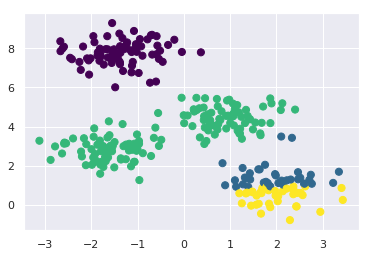

In [ ]:
centers, labels = find_clusters(X, 4, rseed=0)
plt.scatter(X[:, 0], X[:, 1], c=labels, s=50, cmap='viridis');

* The number of clusters must be selected beforehand (is fixed by silhouette analysis or elbow method).

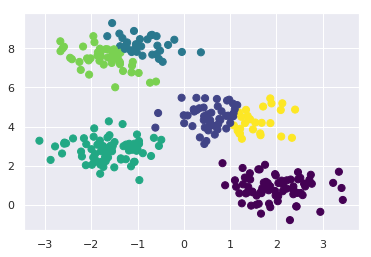

In [ ]:
labels = KMeans(6, random_state=0).fit_predict(X)
plt.scatter(X[:, 0], X[:, 1], c=labels, s=50, cmap='viridis');

* $k$-means is limited to linear cluster boundaries (spherical clusters)
Promising step: project the data into a higher dimension where a linear separation is possible.

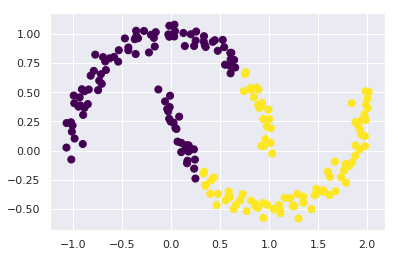

In [ ]:
from sklearn.datasets import make_moons
X, y = make_moons(200, noise=.05, random_state=0)

labels = KMeans(2, random_state=0).fit_predict(X)
plt.scatter(X[:, 0], X[:, 1], c=labels, s=50, cmap='viridis');

This situation is reminiscent of the discussion in Support Vector Machines, where we used a kernel transformation to project the data into a higher dimension where a linear separation is possible. We might imagine using the same trick to allow $k$-means to discover non-linear boundaries.

One version of this kernelized $k$-means is implemented in `Scikit-Learn` within the `SpectralClustering` estimator. It uses the graph of nearest neighbors to compute a higher-dimensional representation of the data, and then assigns labels using a k-means algorithm:
`SpectralClustering` estimator can be helpful

/usr/local/lib/python3.6/dist-packages/sklearn/manifold/spectral_embedding_.py:235: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


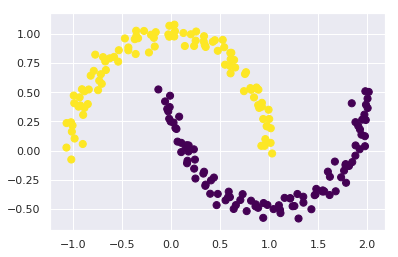

In [ ]:
from sklearn.cluster import SpectralClustering

model = SpectralClustering(n_clusters=2, affinity='nearest_neighbors', assign_labels='kmeans')
labels = model.fit_predict(X)
plt.scatter(X[:, 0], X[:, 1], c=labels, s=50, cmap='viridis');

* $k$-means can be slow for large numbers of samples

#Interactible $k$-means

In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=2)

def cluster(X):
  kmeans.fit(X)
  y_kmeans = kmeans.predict(X)
  centers = kmeans.cluster_centers_

  return y_kmeans, centers

def classify(X):
  return kmeans.predict(X)

In [ ]:
#@title k-means for 2D data points
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

def plot_clusters(X, y, center, xx, yy, Z):
  fig = plt.figure(figsize=(10,10))
  ax = fig.gca()
  ax.tick_params(axis="y",direction="in", pad=-40)
  ax.tick_params(axis="x",direction="in", pad=-15)
  ax.set_xticks(np.arange(-.75, 1, .25))
  ax.set_yticks(np.arange(-.75, 1, .25))
  ax.set_xlim([-1, 1])
  ax.set_ylim([-1, 1])

  plt.scatter(X[:, 0], X[:, 1], c=y, s=150, cmap='viridis')
  # see https://matplotlib.org/3.1.1/api/markers_api.html
  plt.scatter(center[:, 0], center[:, 1], c=range(len(center)), marker='s', s=200, alpha=0.7);
  
  # Put the result into a color plot
  n_classes = len(center)
  Z = Z.reshape(xx.shape)
  contours = ax.contourf(xx, yy, Z, alpha=0.2, levels=np.arange(n_classes + 1) - 0.5, cmap='viridis', zorder=1)
  
  plt.close(fig)

  return fig

import base64
import io

def figure_to_base64(fig):
  buf = io.BytesIO()
  fig.savefig(buf, format='png', bbox_inches='tight', pad_inches=0);
  image_base64 = base64.b64encode(buf.getvalue()).decode('utf-8').replace('\n', '')
  buf.close()
  return image_base64

import json

def invoke(pts):
  data = np.array(pts).reshape((-1, 2))
  X = data / 300.0 - 1.0
  X[:, 1] *= -1.0

  y_kmeans, centers = cluster(X)

  # fit the estimator
  xlim = [-1.0, 1.0]
  ylim = [-1.0, 1.0]
  xx, yy = np.meshgrid(np.linspace(*xlim, num=700), np.linspace(*ylim, num=700))
  Z = classify(np.c_[xx.ravel(), yy.ravel()])

  fig = plot_clusters(X, y_kmeans, centers, xx, yy, Z)

  image_base64 = figure_to_base64(fig)
  return IPython.display.JSON({'image': image_base64})


import IPython
from google.colab import output

main_str = '''
  <script type="application/javascript">
  
    var active_pt = null;
    var all_pts = [];
    var classAbtn = [650, 100];
    var classBbtn = [650, 200];
    var ptR = 10.0;
    var params = null;
    var debug_txt = "";
    var bg_image = new Image();

    function is_close(pt1, pt2) {
      return   (pt1[0] - pt2[0])*(pt1[0] - pt2[0])
            +  (pt1[1] - pt2[1])*(pt1[1] - pt2[1])
            <= ptR*ptR;
    }
  
    function circ(ctx, pos) {
      ctx.beginPath();
      ctx.arc(pos[0], pos[1], ptR, 0.0, 2.0 * Math.PI, 0);
      ctx.fillStyle = 'rgba(50, 50, 50, 0.3)';
      ctx.fill();
    }
    
    
    function draw() {
      var canvas = document.getElementById('canvas');
      if (canvas.getContext) {
        var ctx = canvas.getContext('2d');
        
        ctx.clearRect(0, 0, canvas.width, canvas.height); // cleanup before start
        ctx.drawImage(bg_image, 0, 0, 600, 600);
        ctx.strokeRect(0, 0, 600, 600); // field
        
        ctx.font = '20px serif';
        ctx.fillStyle = 'black';
        ctx.fillText(debug_txt, 200, 200);
        
        if (active_pt) {
          circ(ctx, [active_pt[0], active_pt[1]]);
        }
        all_pts.forEach(function (item, index) {
          circ(ctx, [item[0], item[1]]);
        });
        
        
        
      }
    }
    
    var timer
    function init() {
      timer = setInterval(draw, 10);
    }

    function get_state() {
      var rates = document.getElementsByName('rate');
      for(var i = 0; i < rates.length; i++)
        if(rates[i].checked)
          return rates[i].value;
      return "none";
    }

    
    function mdown_handle(evt) {
      x = evt.offsetX;
      y = evt.offsetY;
      state = get_state();
      if (state == "add") {
        if (x < 600)
            all_pts.push([x, y]);
        return;
      }

      idx = -1;
      all_pts.forEach(function (item, index) {
        if (is_close([x,y], [item[0], item[1]])) {
          idx = index;
        }
      });
      if (idx <= -1)
          return;
      if (state == "move") {
        active_pt = all_pts[idx];
        all_pts.splice(idx, 1);
      }
      if (state == "del")
          all_pts.splice(idx, 1);
    }
    
    function mmove_handle(evt) {
      if (get_state() != "move")
          return;
      x = evt.offsetX;
      y = evt.offsetY;
      if (active_pt) {
        active_pt[0] = x;
        active_pt[1] = y;
      }
    }
    
    function mup_handle(evt) {
      if (get_state() != "move")
          return;
      x = evt.offsetX;
      y = evt.offsetY;
      if (x >= 600) {
        active_pt = null;
      }
      if (active_pt) {
        all_pts.push(active_pt);
        active_pt = null;
      }
    }
    
    function clear_field() {
      active_pt = null;
      all_pts = [];
    }

    async function calculate() {
      if (!all_pts)
        return;
      var merged = [].concat.apply([], all_pts);
      const result = await google.colab.kernel.invokeFunction('notebook.InvSVM', [merged], {});
      params = result.data['application/json'];
      bg_image.src = 'data:image/  png;base64,' + params.image;
    }
  </script>
  <canvas id="canvas" width="800" height="600" 
    onmousedown="mdown_handle(event)"
    onmousemove="mmove_handle(event)"
    onmouseup="mup_handle(event)"></canvas>
  <div style="position:absolute; top:275px; left:625px;">
   <div style="border-style: solid;">
    <input type="radio" id="r1" name="rate" value="add" checked="checked">
    <label for="r1">Add data point</label>
    <br>
    <input type="radio" id="r2" name="rate" value="move">
    <label for="r2">Move data point</label>
    <br>
    <input type="radio" id="r3" name="rate" value="del">
    <label for="r3">Delete data point</label>
    <br>
    <button type="button" onclick="clear_field();">
      Clear
    </button>
   </div>
   <br><br>
    <button type="button" onclick="calculate();">
      Cluster
    </button>
  </div>
  <script> init();</script>
'''



def generate_html():
  s = main_str
  return s
  
display(IPython.display.HTML(generate_html()))
    
    
output.register_callback('notebook.InvSVM', invoke)

#Variations of $k$-means


* **MiniBatchKMeans**


variant of the $k$-means algorithm which uses mini-batches to reduce the computation time, while still attempting to optimize the same objective function. Mini-batches are subsets of the input data, randomly sampled in each training iteration. These mini-batches drastically reduce the amount of computation required to converge to a local solution. In contrast to other algorithms that reduce the convergence time of $k$-means, mini-batch $k$-means produces results that are generally only slightly worse than the standard algorithm.
The algorithm iterates between two major steps, similar to vanilla $k$-means. In the first step,  samples are drawn randomly from the dataset, to form a mini-batch. These are then assigned to the nearest centroid. In the second step,the centroids are updated. In contrast to $k$-means, this is done on a per-sample basis. For each sample in the mini-batch, the assigned centroid is updated by taking the streaming average of the sample and all previous samples assigned to that centroid. This has the effect of decreasing the rate of change for a centroid over time. These steps are performed until convergence or a predetermined number of iterations is reached.
MiniBatchKMeans converges faster than $k$-means, but the quality of the results is reduced. In practice this difference in quality can be quite small.

Automatically created module for IPython interactive environment


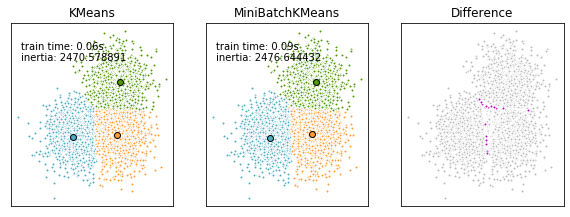

In [ ]:
#@title #Mini Batch k-Means vs k-Means (Lloyd's)
print(__doc__)

import time

import numpy as np
import matplotlib.pyplot as plt

from sklearn.cluster import MiniBatchKMeans, KMeans
from sklearn.metrics.pairwise import pairwise_distances_argmin
from sklearn.datasets.samples_generator import make_blobs

# #############################################################################
# Generate sample data
np.random.seed(0)

batch_size = 45
centers = [[1, 1], [-1, -1], [1, -1]]
n_clusters = len(centers)
X, labels_true = make_blobs(n_samples=3000, centers=centers, cluster_std=0.7)

# #############################################################################
# Compute clustering with Means

k_means = KMeans(init='k-means++', n_clusters=3, n_init=10)
t0 = time.time()
k_means.fit(X)
t_batch = time.time() - t0

# #############################################################################
# Compute clustering with MiniBatchKMeans

mbk = MiniBatchKMeans(init='k-means++', n_clusters=3, batch_size=batch_size,
                      n_init=10, max_no_improvement=10, verbose=0)
t0 = time.time()
mbk.fit(X)
t_mini_batch = time.time() - t0

# #############################################################################
# Plot result

fig = plt.figure(figsize=(8, 3))
fig.subplots_adjust(left=0.02, right=0.98, bottom=0.05, top=0.9)
colors = ['#4EACC5', '#FF9C34', '#4E9A06']

# We want to have the same colors for the same cluster from the
# MiniBatchKMeans and the KMeans algorithm. Let's pair the cluster centers per
# closest one.
k_means_cluster_centers = np.sort(k_means.cluster_centers_, axis=0)
mbk_means_cluster_centers = np.sort(mbk.cluster_centers_, axis=0)
k_means_labels = pairwise_distances_argmin(X, k_means_cluster_centers)
mbk_means_labels = pairwise_distances_argmin(X, mbk_means_cluster_centers)
order = pairwise_distances_argmin(k_means_cluster_centers,
                                  mbk_means_cluster_centers)

# KMeans
ax = fig.add_subplot(1, 3, 1)
for k, col in zip(range(n_clusters), colors):
    my_members = k_means_labels == k
    cluster_center = k_means_cluster_centers[k]
    ax.plot(X[my_members, 0], X[my_members, 1], 'w',
            markerfacecolor=col, marker='.')
    ax.plot(cluster_center[0], cluster_center[1], 'o', markerfacecolor=col,
            markeredgecolor='k', markersize=6)
ax.set_title('KMeans')
ax.set_xticks(())
ax.set_yticks(())
plt.text(-3.5, 1.8,  'train time: %.2fs\ninertia: %f' % (
    t_batch, k_means.inertia_))

# MiniBatchKMeans
ax = fig.add_subplot(1, 3, 2)
for k, col in zip(range(n_clusters), colors):
    my_members = mbk_means_labels == order[k]
    cluster_center = mbk_means_cluster_centers[order[k]]
    ax.plot(X[my_members, 0], X[my_members, 1], 'w',
            markerfacecolor=col, marker='.')
    ax.plot(cluster_center[0], cluster_center[1], 'o', markerfacecolor=col,
            markeredgecolor='k', markersize=6)
ax.set_title('MiniBatchKMeans')
ax.set_xticks(())
ax.set_yticks(())
plt.text(-3.5, 1.8, 'train time: %.2fs\ninertia: %f' %
         (t_mini_batch, mbk.inertia_))

# Initialise the different array to all False
different = (mbk_means_labels == 4)
ax = fig.add_subplot(1, 3, 3)

for k in range(n_clusters):
    different += ((k_means_labels == k) != (mbk_means_labels == order[k]))

identic = np.logical_not(different)
ax.plot(X[identic, 0], X[identic, 1], 'w',
        markerfacecolor='#bbbbbb', marker='.')
ax.plot(X[different, 0], X[different, 1], 'w',
        markerfacecolor='m', marker='.')
ax.set_title('Difference')
ax.set_xticks(())
ax.set_yticks(())

plt.show()




* $k$**-medians**

It is a variation of $k$-means clustering where instead of calculating the mean for each cluster to determine its centroid, one instead calculates the median. This has the effect of minimizing error over all clusters with respect to the $1$-norm distance metric, as opposed to the squared $2$-norm distance metric (which $k$-means does.)

In [ ]:
import numpy 
data = [[1,2],[3,5]]
print(numpy.median(data, axis=1))

[1.5 4. ]




* $k$**-medoids** or **P**artitioning **A**round **M**edoids (PAM) algorithm 

Medoids are representative objects of a data set or a cluster with a data set whose average dissimilarity to all the objects in the cluster is minimal. Medoids are similar in concept to means or centroids, but medoids are always restricted to be members of the data set. 

$$
x_{medoid}=\text{argmin}_{y \in \{x_1, x_2, \dots x_n \}} \sum_i \|y-x_i \|^2
$$


Medoids are most commonly used on data when a mean or centroid cannot be defined, such as graphs. 
The PAM method was proposed in 1987 for the work (Kaufman and Rousseeu) with $L_{1}$ norm and other distances.
It is more robust to noise and outliers as compared to $k$-means because it minimizes a sum of pairwise dissimilarities instead of a sum of squared Euclidean distances.

* $k$**-means++**

In data mining, $k$-means++ is an algorithm for choosing the initial values (or "seeds") for the $k$-means clustering algorithm. It was proposed in 2007 by David Arthur and Sergei Vassilvitskii, as an approximation algorithm for the $k$-means problem.

<br>

---

`0:` $\, \textbf{Input: } \text{Data vector }\{x_n\}_{n=1}^N, \text{number of clusters } K$

`1:` $\, n \leftarrow \text{RandomInteger}(1, N) \qquad \quad \, \,$ `Choose a datum at random`

`2:` $\, \mu_1 \leftarrow x_n \qquad \qquad \qquad \qquad \qquad \, \, \quad$ `Make this random datum the first cluster 
center`.

`3:` $\, \textbf{for } k \leftarrow 2\dots K \textbf{ do} \qquad \qquad \qquad \quad$   `Loop over the rest of the centers`

`4:` $\, \qquad \textbf{for } n \leftarrow 1\dots N \textbf{ do} \qquad \qquad \quad$ `Loop over the data`

`5:` $\, \qquad \qquad d_n \leftarrow \min_{k'<k} \|x_n − \mu_{k'}\|^2 \, \,$ `Compute the distance to the closest center`

`6:` $\, \qquad \textbf{end for}$

`7:` $\, \qquad \textbf{for } n \leftarrow 1\dots N \textbf{ do} \qquad \qquad \quad$  `Loop over the data again`

`8:` $\, \qquad \qquad p_n \leftarrow  d_n^2/\sum_{n'}{d_{n'}^2} \qquad \, \, \quad \, \, \,$  `Compute a distribution proportional to` $d_n^2$

`9:` $\, \qquad \textbf{end for}$

`10:` $\, \qquad n \leftarrow \text{Discrete}(p_1, p_2, . . ., p_N) \, \, \,$ `Draw a datum from this distribution.`

`11:` $\, \qquad \mu_k \leftarrow x_n \qquad \qquad \qquad \qquad \quad$ `Make this datum the next center`.

`12:` $\, \textbf{end for}$

`13:` $\, \textbf{Return } \text{cluster means } \{\mu_k\}_{k=1}^K$

---

<br>

* Some methods attempt to speed up each $k$-means step using the triangle inequality:

$$
\|x-z\|\leq \|x-y\|+\|y-z\|.
$$

* **Fuzzy clustering** (soft $k$-means) - a form of clustering in which each data point can belong to more than one cluster.

In fuzzy $k$-means clustering (Bezdek, 1981), each case has
a set of degree of belonging relative to all clusters. It differs
from previously presented $k$-means clustering where each
case belongs only to one cluster at a time. In this algorithm,
the centroid of a cluster $\boldsymbol{\mu}_j$ is the mean of all cases in the
dataset, weighted by their degree of belonging to the cluster

$$
\boldsymbol{\mu}_j=\frac{\sum_i{a_{ij} \cdot \mathbf{x}_i}}{\sum_i{a_{ij}}}
$$

The degree of belonging is a function of the distance of the case from the centroid, which includes a parameter controlling for the highest weight given to the closest case. It iterates until a user-set criterion is reached. Like the $k$-means clustering technique, this technique is also sensitive to initial clusters and local minima. It is particularly useful for dataset coming from area of research where partial belonging to classes is supported by theory. 

* Escape local optima by swapping points between clusters introducing noise to escape local minima.

* **G**aussian-**E**xpectation **M**aximization (GEM) 

It uses a linear combination of $d$-dimensional Gaussian distributions as the cluster centers. It aims to minimize 

$$
L_{\text{GEM}}=-\sum_{i=1}^N \log \left( {\sum_{j=1}^K p(\boldsymbol{x}_i \mid \boldsymbol{\mu}_j)  p(\boldsymbol{\mu}_j)}\right),
$$

where $p(\boldsymbol{x}_i|\boldsymbol{\mu}_j)$  is the probability of $\boldsymbol{x}_i$ (the case), given that it is generated by a Gaussian distribution that has $\boldsymbol{\mu}_j$ as its center,  and $p(\boldsymbol{\mu}_j)$ is the prior probability of said center. It also computes a soft membership for each center through Bayes rule: 

$$
a_{ij} =\frac{p(\boldsymbol{x}_i \mid \boldsymbol{\mu}_j) \cdot  p(\boldsymbol{\mu}_j)}{p(\boldsymbol{x}_i)}
$$



#Examples

## Optical recognition of handwritten digits

Suppose you have $1797$ images($8$x$8$) of digits $0 \dots 9$.
This dataset originates from [dataset](https://archive.ics.uci.edu/ml/datasets/Optical+Recognition+of+Handwritten+Digits)
compiled by NIST(**N**ational **I**nstitute of **S**tandards and **T**echnology) from a total of $43$ people, $30$ contributed to the training set and different $13$ to the test set. 

In [ ]:
from sklearn.datasets import load_digits
digits = load_digits()
digits.data.shape

(1797, 64)

We cluster them  into $10$ categories.

In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=10, random_state=0)
clusters = kmeans.fit_predict(digits.data)
kmeans.cluster_centers_.shape

(10, 64)

These are the centers (they clearly resemble digits $0..9$).

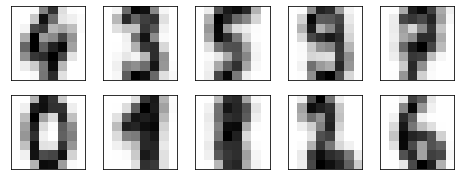

In [ ]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(2, 5, figsize=(8, 3))
centers = kmeans.cluster_centers_.reshape(10, 8, 8)
for axi, center in zip(ax.flat, centers):
    axi.set(xticks=[], yticks=[])
    axi.imshow(center, interpolation='nearest', cmap=plt.cm.binary)

The dataset actually includes training set with true tags included so we can verify the prediction.
It turns out that $\approx 80 \%$ of images it got right.

In [ ]:
#match clusters with real labels
from scipy.stats import mode

labels = np.zeros_like(clusters)
for i in range(10):
    mask = (clusters == i)
    labels[mask] = mode(digits.target[mask])[0]
    
# and check the accuracy
from sklearn.metrics import accuracy_score
accuracy_score(digits.target, labels)

0.7935447968836951

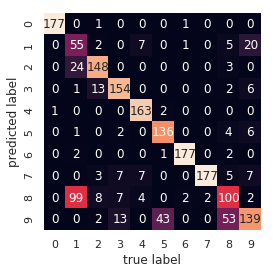

In [ ]:
from sklearn.metrics import confusion_matrix
mat = confusion_matrix(digits.target, labels)
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=digits.target_names,
            yticklabels=digits.target_names)
plt.xlabel('true label')
plt.ylabel('predicted label');

# we can essentially build a digit classifier without reference to any known labels!

We see that $1$ and $8$ are frequently confused with $9$ and $9$ with $5$.

Just for fun, let's try to push this even farther. We can use the t-distributed stochastic neighbor embedding (t-SNE) algorithm to pre-process the data before performing k-means. t-SNE is a nonlinear embedding algorithm that is particularly adept at preserving points within clusters. 

If we use **t**-distributed **S**tochastic **N**eighbor **E**mbedding (T-розподілене вкладення стохастичної близькості) the accuracy $\approx 93 \%$.
Laurens van der Maaten 

In [ ]:
# t-SNE before k-Means
from sklearn.manifold import TSNE

# Project the data: this step will take several seconds
tsne = TSNE(n_components=2, init='random', random_state=0)
digits_proj = tsne.fit_transform(digits.data)

# Compute the clusters
kmeans = KMeans(n_clusters=10, random_state=0)
clusters = kmeans.fit_predict(digits_proj)

# Permute the labels
labels = np.zeros_like(clusters)
for i in range(10):
    mask = (clusters == i)
    labels[mask] = mode(digits.target[mask])[0]

# Compute the accuracy
accuracy_score(digits.target, labels)

0.9326655537006121

##Color quantization 

Suppose you have a true color image ($24$-bit per pixel) and you want to convert it to $4$-bit per pixel image.
$24$-bit allow you to represent $2^{24}= 16. 777. 216\approx 16 \text{ million}$ colors, while $4$ bits allow for only $2^4 = 16$ colors.

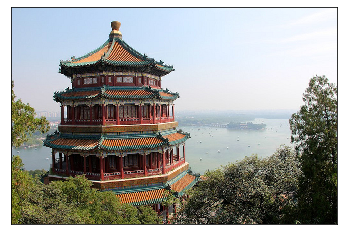

In [ ]:
from sklearn.datasets import load_sample_image
import matplotlib.pyplot as plt

china = load_sample_image("china.jpg")
ax = plt.axes(xticks=[], yticks=[])
ax.imshow(china);

BTW, this is The Summer Palace -- a vast ensemble of lakes, gardens and palaces in Beijing. 

Anyways, the image has dimensions $427$ x $640$ with $3$ $8$-bit numbers($0 \dots 255$) per pixel.

In [ ]:
china.shape

(427, 640, 3)

First we flatten out our array into $1D$ array of float numbers $0\dots 1$.

In [ ]:
# no geometry information is needed
data = china / 255.0 
data = data.reshape(427 * 640, 3)
data.shape

(273280, 3)

We can visualize these pixels in this color space, using a subset of $10,000$ pixels for efficiency.
We now perform k-means algorithm with $16$ clusters and visualize reduced and unreduced color spaces side-by-side.

In [ ]:
import warnings; warnings.simplefilter('ignore')  # Fix NumPy issues.
from sklearn.cluster import MiniBatchKMeans
kmeans = MiniBatchKMeans(16)
kmeans.fit(data)
new_colors = kmeans.cluster_centers_[kmeans.predict(data)]

####### plotting only ######

import numpy as np
from plotly.subplots import make_subplots
import plotly.graph_objects as go

N = 10000
rng = np.random.RandomState(0)
i = rng.permutation(data.shape[0])[:N]
R, G, B = data[i].T
colors = ['rgba(' + ','.join([str(r*255), str(g*255), str(b*255)]) + ', 255)' for r,g,b in zip(R,G,B)]

fig = make_subplots(rows=1, cols=2, specs=[[{"type": "scene"}, {"type": "scene"}]])

fig.add_trace(go.Scatter3d(x=R, y=G, z=B, mode='markers', 
                           marker=dict(size=4, color=colors)),
              row=1, col=1)

R, G, B = new_colors[i].T
colors = ['rgba(' + ','.join([str(r*255), str(g*255), str(b*255)]) + ', 255)' for r,g,b in zip(R,G,B)]

fig.add_trace(go.Scatter3d(x=R, y=G, z=B, mode='markers', 
                           marker=dict(size=4, color=colors)),
              row=1, col=2)

R, G, B = data[i].T

fig.add_trace(go.Scatter3d(x=R, y=G, z=B, mode='markers', 
                           marker=dict(size=4, color=colors)),
              row=1, col=2)

fig.update_layout(width=1200, height=600, autosize=False, 
                  title_text="Color scale demonstration",
                  scene={"xaxis": {"title": "R"},
                         "yaxis": {"title": "G"},
                         "zaxis": {"title": "B"}},
                  scene2={"xaxis": {"title": "R"},
                          "yaxis": {"title": "G"},
                          "zaxis": {"title": "B"}},
                  showlegend=False,
                  annotations=[{"x": 0.225, "y": 1, "font": {"size": 16},
                    "text": "Original color space",
                    "xref": "paper", "yref": "paper",
                    "xanchor": "center", "yanchor": "bottom",
                    "showarrow": False
                  }, {"x": 0.775, "y": 1, "font": {"size": 16},
                  "text": "Reduced color space",
                  "xref": "paper", "yref": "paper",
                  "xanchor": "center", "yanchor": "bottom",
                  "showarrow": False
                }],
                updatemenus = [{'type': 'buttons', 'buttons': [
                      {'label': 'All', 'method': 'update',
                       'args': [{'visible' : [True, False, True]}]},
                      {'label': 'Cluster centers', 'method': 'update',
                       'args': [{'visible' : [True, True, False]}]}
                ]}])
      
fig.show()

Here is the result

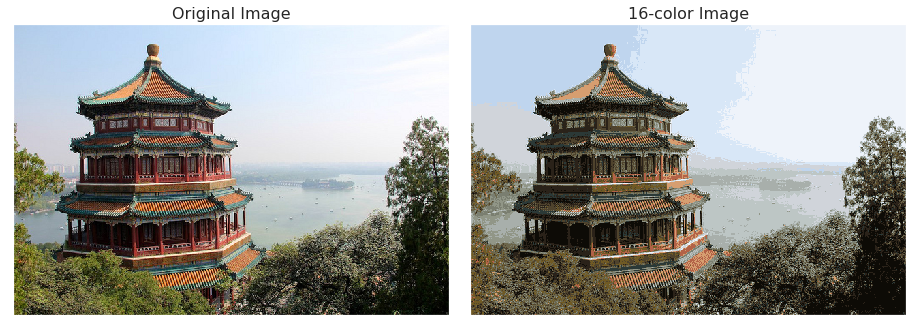

In [ ]:
# look at the result

china_recolored = new_colors.reshape(china.shape)

fig, ax = plt.subplots(1, 2, figsize=(16, 6), subplot_kw=dict(xticks=[], yticks=[]))
fig.subplots_adjust(wspace=0.05)
ax[0].imshow(china)
ax[0].set_title('Original Image', size=16)
ax[1].imshow(china_recolored)
ax[1].set_title('16-color Image', size=16);

Some detail is certainly lost in the rightmost panel, but the overall image is still easily recognizable. This image on the right achieves a compression factor of around $1 \text{million}$ ! While this is an interesting application of $k$-means, there are certainly better way to compress information in images. But the example shows the power of thinking outside of the box with unsupervised methods like $k$-means.